
... ***CURRENTLY UNDER DEVELOPMENT*** ...


## Obtain daily SLP predictor and associated wave conditions. Based on Camus et al. (2014), Hegermiller et al. (2017) and Rueda et al. (2017)


inputs required: 
  * ESTELA fields for the site location
  * SLP fields from CFSR reanalysis
  * Historical runup at 3 locations
  * Historical TCs inside radio 14 
  
in this notebook:
  * Construct daily SLP predictor
  * Obtain Daily Weather Types (DWT) and probabilities of occurrence (KMA regression guidded with runup)
  * Associate offshore wave conditions to each DWT

In [1]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-

# common
import os
import os.path as op

# pip
import numpy as np
import xarray as xr
import pandas as pd

import matplotlib.pyplot as plt
import datetime

# DEV: override installed teslakit
import sys
sys.path.insert(0, op.join(os.path.abspath(''), '..', '..', '..'))

# teslakit 
from teslakit.database import Database
from teslakit.estela import spatial_gradient, Predictor
from teslakit.util.time_operations import xds_common_dates_daily

from teslakit.plotting.estela import Plot_ESTELA
from teslakit.plotting.waves import Plot_Waves_DWTs



## Database and Site parameters

In [2]:
# --------------------------------------
# Teslakit database

p_data = r'/Users/albacid/Projects/TeslaKit_projects'
db = Database(p_data)

# set site
db.SetSite('KWAJALEIN')


In [3]:
# --------------------------------------
# load data and set parameters

ESTELA = db.Load_ESTELA_data()            # ESTELA D data
SLP = db.Load_ESTELA_SLP()                # ESTELA Sea Level Pressure

WAVES = db.Load_WAVES_hist()              # Historical offshore waves point

_, TCs_r1_params = db.Load_TCs_r1_hist()  # TCs historical parameters inside 14º radius 


# --------------------------------------
# Load hourly runup
WAVES_runup_E = xr.open_dataset('/Users/albacid/Projects/TeslaKit_projects/sites/KWAJALEIN/HYCREWW/hist_runup_E.nc')
WAVES_runup_S = xr.open_dataset('/Users/albacid/Projects/TeslaKit_projects/sites/KWAJALEIN/HYCREWW/hist_runup_S.nc')
WAVES_runup_N = xr.open_dataset('/Users/albacid/Projects/TeslaKit_projects/sites/KWAJALEIN/HYCREWW/hist_runup_N.nc')


# --------------------------------------
# Load nearshore hourly waves
WAVES_N = xr.open_dataset(op.join(p_data, 'sites/KWAJALEIN/WAVES/wind_output_N.nc')) 
WAVES_S = xr.open_dataset(op.join(p_data, 'sites/KWAJALEIN/WAVES/output_15m_S.nc')) 
WAVES_E = xr.open_dataset(op.join(p_data, 'sites/KWAJALEIN/WAVES/output_15m_E.nc')) 

# N, S, E profiles (same profiles selected for runup estimation)
pN = 29
pS = 7 
pE = 17

WAVES_N = WAVES_N.sel(profile=pN)
WAVES_S = WAVES_S.sel(profile=pS)
WAVES_E = WAVES_E.sel(profile=pE)

WAVES_N = WAVES_N.drop('profile')
WAVES_S = WAVES_S.drop('profile')
WAVES_E = WAVES_E.drop('profile')

WAVES_N = WAVES_N.rename_vars({"hs":"Hs", "tp":"Tp", 'dir':'Dir'})  # rename vars
WAVES_S = WAVES_S.rename_vars({"hs":"Hs", "tm":"Tp", 'dir':'Dir'})  # rename vars
WAVES_E = WAVES_E.rename_vars({"hs":"Hs", "tm":"Tp", 'dir':'Dir'})  # rename vars


# --------------------------------------
# KMA REGRESSION GUIDED parameters
kma_date_ini = '1979-01-01'
kma_date_end = '2016-12-31'
num_clusters = 36
kmarg_alpha = 0.5



## ESTELA Predictor - Sea Level Pressure and Gradient

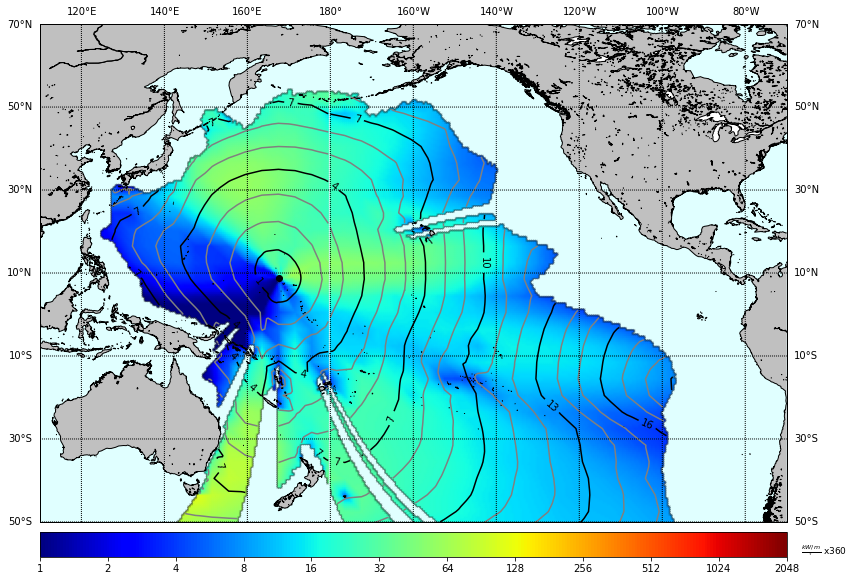

In [4]:
# --------------------------------------
# Plot ESTELA and wave point coordinates

mask_plot = ESTELA.mask_e95

Plot_ESTELA(
    ESTELA.pnt_longitude, ESTELA.pnt_latitude,
    ESTELA.F_y1993to2012 * mask_plot, 
    ESTELA.D_y1993to2012 * mask_plot,
    lon1 = 110, lon2 = 290, lat1 = -50, lat2 = 70,
);


In [4]:
# --------------------------------------
# calculate mean runup from 3 locations, resample to daily

# Calculate daily mean
WAVES_runup_N_daily = WAVES_runup_N.runup.resample(time='1D').mean()
WAVES_runup_S_daily = WAVES_runup_S.runup.resample(time='1D').mean()
WAVES_runup_E_daily = WAVES_runup_E.runup.resample(time='1D').mean()


# select time window 
WAVES_runup_N_daily = WAVES_runup_N_daily.sel(time = slice(kma_date_ini, kma_date_end))
WAVES_runup_S_daily = WAVES_runup_S_daily.sel(time = slice(kma_date_ini, kma_date_end))
WAVES_runup_E_daily = WAVES_runup_E_daily.sel(time = slice(kma_date_ini, kma_date_end))


# mean runup from 3 points
RUNUP = (WAVES_runup_N_daily + WAVES_runup_S_daily  + WAVES_runup_E_daily)/3.0
RUNUP = RUNUP.to_dataset()    

print(RUNUP)


<xarray.Dataset>
Dimensions:  (time: 13880)
Coordinates:
  * time     (time) datetime64[ns] 1979-01-01 1979-01-02 ... 2016-12-31
Data variables:
    runup    (time) float64 1.062 1.513 1.731 1.432 ... 0.9514 0.9927 0.9769


(725372.0, 726103.0)

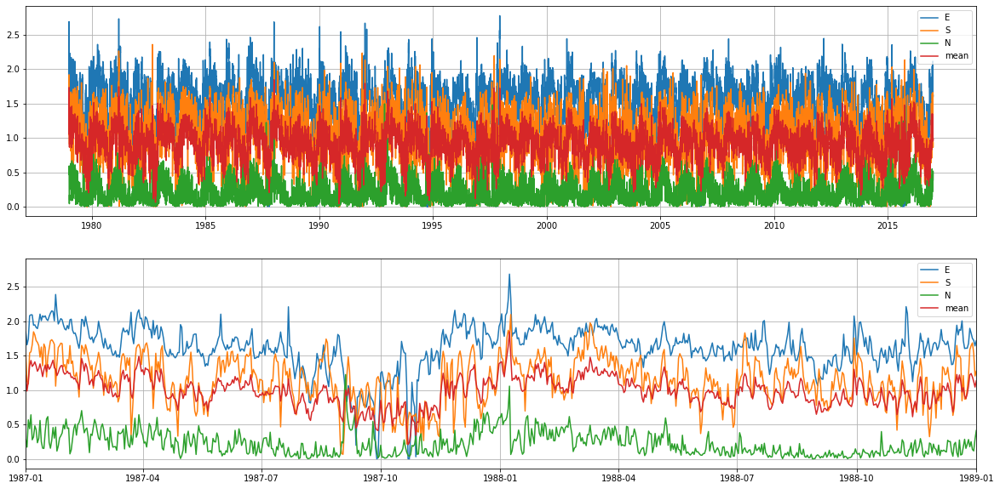

In [5]:
# plot runup

fig, axs = plt.subplots(2,1, figsize=(20,10))

axs[0].plot(WAVES_runup_E_daily.time, WAVES_runup_E_daily, label='E')
axs[0].plot(WAVES_runup_S_daily.time, WAVES_runup_S_daily, label='S')
axs[0].plot(WAVES_runup_N_daily.time, WAVES_runup_N_daily, label='N')
axs[0].plot(RUNUP.time, RUNUP.runup, label='mean')
axs[0].legend()
axs[0].grid()

axs[1].plot(WAVES_runup_E_daily.time, WAVES_runup_E_daily, label='E')
axs[1].plot(WAVES_runup_S_daily.time, WAVES_runup_S_daily, label='S')
axs[1].plot(WAVES_runup_N_daily.time, WAVES_runup_N_daily, label='N')
axs[1].plot(RUNUP.time, RUNUP.runup, label='mean')
axs[1].legend()
axs[1].grid()
axs[1].set_xlim(datetime.datetime(1987,1,1),datetime.datetime(1989,1,1))


In [6]:
# --------------------------------------
# Calculate site SLP & SLP_gradient (daily)

# select time window and do data daily mean
SLP_d = SLP.sel(time = slice(kma_date_ini, kma_date_end)).resample(time='1D').mean()

# calculate daily gradients
SLP_d = spatial_gradient(SLP_d, 'SLP')

print(SLP_d)
    

<xarray.Dataset>
Dimensions:       (latitude: 80, longitude: 96, time: 13880)
Coordinates:
  * time          (time) datetime64[ns] 1979-01-01 1979-01-02 ... 2016-12-31
  * latitude      (latitude) float32 80.0 78.0 76.0 74.0 ... -74.0 -76.0 -78.0
  * longitude     (longitude) float32 100.0 102.0 104.0 ... 286.0 288.0 290.0
Data variables:
    SLP           (time, latitude, longitude) float64 9.946e+04 ... 9.906e+04
    SLP_gradient  (time, latitude, longitude) float64 0.0 0.0 0.0 ... 0.0 0.0



## ESTELA Predictor - Principal Component Analysis

In [7]:
# --------------------------------------
# remove sectors from which waves do not arrive to site
# W=0º, N=-90º, W=180º, S=90º

def cart2pol(a, b):
    '''Output in degrees'''
    # convert to geographic convention
    module = np.sqrt(a**2 + b**2)
    direction = np.arctan2(b, a)
    direction = np.degrees(direction)

    return module, direction


[lon, lat] = np.meshgrid(SLP_d.longitude, SLP_d.latitude)

[mod,dire] = cart2pol(167.735-lon, 8.705-lat)

mask1 = np.where((dire>=65), 1, -1) # keep from SW to E
mask2 = np.where((dire<=-135), 1, -1) # keep from NE to E

mask = - (mask1*mask2)
mask = np.where(mask==1, 1, np.nan)

SLP_d['SLP'] = SLP_d.SLP * mask
SLP_d['SLP_gradient'] = SLP_d.SLP_gradient * mask



In [8]:
# --------------------------------------
# Calculate ESTELA PCA

# select ESTELA at site grid
ESTELA_site = ESTELA.sel(longitude = SLP.longitude, latitude = SLP.latitude)
estela_D = ESTELA_site.D_y1993to2012

# estela masks: data mask (95% energy) and land mask (plots)
estela_mask = ESTELA_site.mask_e95  
estela_land = ESTELA_site.mask_land

# apply ESTELA mask to SLP data
SLP_d['SLP'] = SLP_d.SLP * estela_mask
SLP_d['SLP_gradient'] = SLP_d.SLP_gradient * estela_mask
SLP_d['mask_land'] = estela_land

# Use our custom ESTELA Predictor 
pred = Predictor(db.paths.site.ESTELA.pred_slp)
pred.data = SLP_d

# PCA (dynamic estela predictor)
pred.Calc_PCA_EstelaPred('SLP', estela_D)

# Load predictor PCA, KMA
#pred.Load()

print(pred.PCA)


<xarray.Dataset>
Dimensions:        (n_components: 3626, n_features: 3626, n_lat: 80, n_lon: 96, n_points: 15360, time: 13858)
Dimensions without coordinates: n_components, n_features, n_lat, n_lon, n_points, time
Data variables:
    PCs            (time, n_components) float64 51.38 7.264 ... 6.773e-05
    EOFs           (n_components, n_features) float64 0.002022 ... -0.0001613
    variance       (n_components) float64 436.3 207.0 ... 6.793e-09 3.999e-09
    pred_mean      (n_features) float64 9.927e+04 9.969e+04 ... 2.83e+05
    pred_std       (n_features) float64 1.212e+03 1.208e+03 ... 2.086e+05
    pred_lon       (n_lon) float64 100.0 102.0 104.0 106.0 ... 286.0 288.0 290.0
    pred_lat       (n_lat) float64 80.0 78.0 76.0 74.0 ... -74.0 -76.0 -78.0
    pred_time      (time) datetime64[ns] 1979-01-23 1979-01-24 ... 2016-12-31
    pred_data_pos  (n_points) bool False False False False ... False False False
Attributes:
    method:     gradient + estela
    pred_name:  SLP


<xarray.Dataset>
Dimensions:        (n_components: 3626, n_features: 3626, n_lat: 80, n_lon: 96, n_points: 15360, time: 13858)
Dimensions without coordinates: n_components, n_features, n_lat, n_lon, n_points, time
Data variables:
    PCs            (time, n_components) float64 51.38 7.264 ... 6.773e-05
    EOFs           (n_components, n_features) float64 0.002022 ... -0.0001613
    variance       (n_components) float64 436.3 207.0 ... 6.793e-09 3.999e-09
    pred_mean      (n_features) float64 9.927e+04 9.969e+04 ... 2.83e+05
    pred_std       (n_features) float64 1.212e+03 1.208e+03 ... 2.086e+05
    pred_lon       (n_lon) float64 100.0 102.0 104.0 106.0 ... 286.0 288.0 290.0
    pred_lat       (n_lat) float64 80.0 78.0 76.0 74.0 ... -74.0 -76.0 -78.0
    pred_time      (time) datetime64[ns] 1979-01-23 1979-01-24 ... 2016-12-31
    pred_data_pos  (n_points) bool False False False False ... False False False
Attributes:
    method:     gradient + estela
    pred_name:  SLP


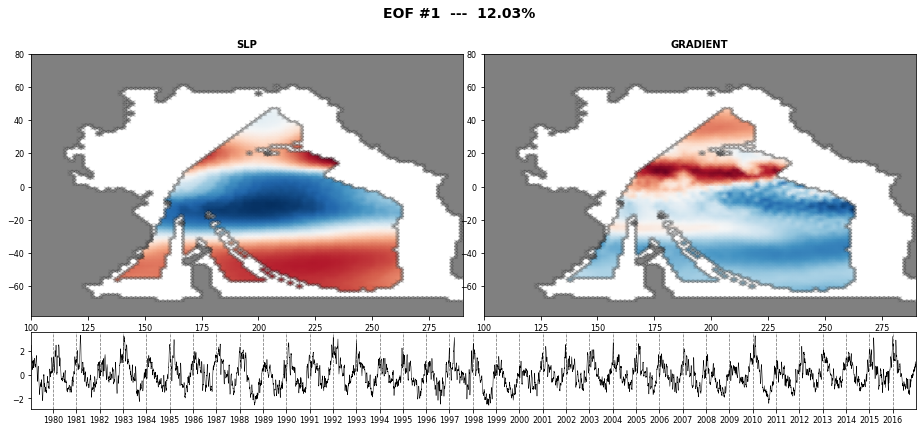

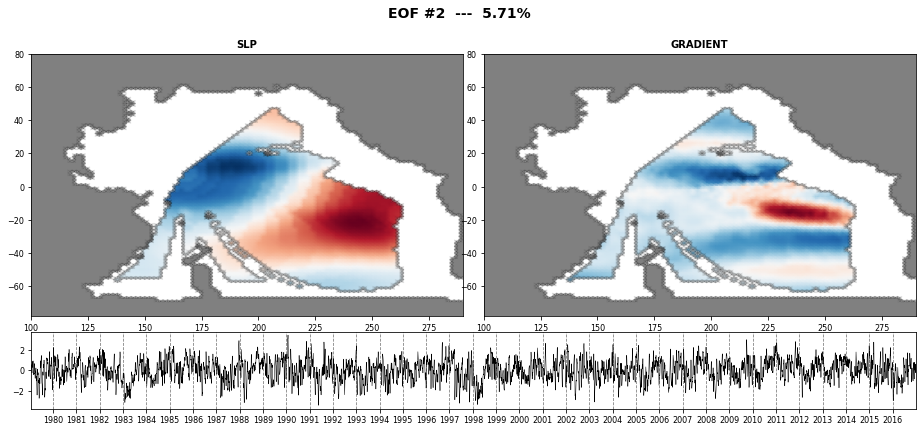

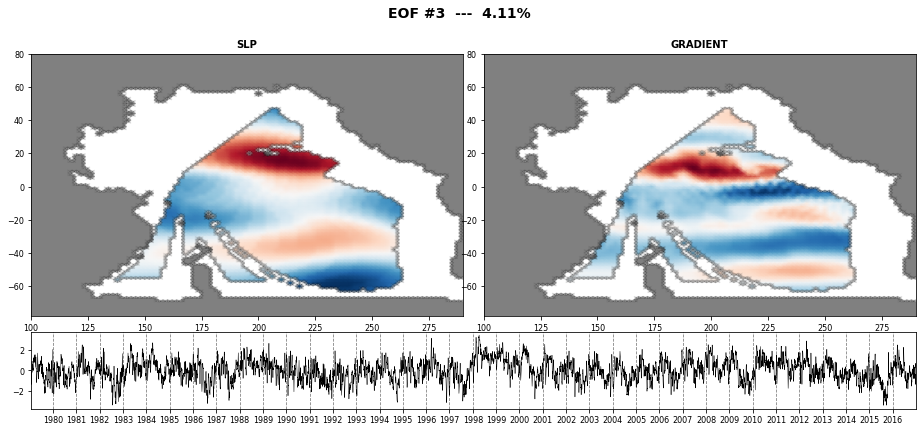

In [9]:
# plot PCA EOFs
n_EOFs = 3

pred.Plot_EOFs_EstelaPred(n_EOFs, show=True);



## ESTELA Predictor - KMeans Classification

In [ ]:
# Calculate KMA (regression guided with RUNUP data)
pred.Calc_KMA_regressionguided(
    num_clusters,
    RUNUP, ['runup'],
    kmarg_alpha, min_group_size=50, repres = 0.85
)

print(pred.KMA)

  c: 0 - s: 7
  c: 14 - s: 26
  c: 16 - s: 4
  c: 17 - s: 19
  c: 25 - s: 4
  c: 30 - s: 48
  c: 33 - s: 5
total attemps:  1

  c: 0 - s: 4
  c: 2 - s: 42
  c: 13 - s: 4
  c: 21 - s: 6
  c: 25 - s: 4
  c: 26 - s: 3
  c: 28 - s: 3
  c: 30 - s: 4
total attemps:  2

  c: 0 - s: 12
  c: 9 - s: 14
  c: 12 - s: 14
  c: 25 - s: 20
  c: 26 - s: 4
  c: 28 - s: 7
  c: 35 - s: 10
total attemps:  3

  c: 4 - s: 13
  c: 15 - s: 12
  c: 21 - s: 19
  c: 22 - s: 16
  c: 26 - s: 10
  c: 33 - s: 35
total attemps:  4

  c: 0 - s: 10
  c: 20 - s: 4
  c: 26 - s: 28
  c: 30 - s: 15
  c: 32 - s: 3
total attemps:  5

  c: 5 - s: 24
  c: 12 - s: 6
  c: 14 - s: 12
  c: 16 - s: 12
  c: 17 - s: 17
  c: 18 - s: 11
  c: 19 - s: 7
  c: 21 - s: 7
  c: 33 - s: 6
  c: 35 - s: 13
total attemps:  6

  c: 11 - s: 7
  c: 12 - s: 3
  c: 13 - s: 16
  c: 22 - s: 2
  c: 24 - s: 3
  c: 25 - s: 3
  c: 26 - s: 24
  c: 30 - s: 15
  c: 32 - s: 5
  c: 33 - s: 27
  c: 34 - s: 5
total attemps:  7

  c: 0 - s: 6
  c: 2 - s: 8
  c: 8 - 

  c: 1 - s: 41
  c: 8 - s: 3
  c: 12 - s: 5
  c: 17 - s: 4
  c: 18 - s: 3
  c: 21 - s: 3
  c: 28 - s: 5
  c: 35 - s: 15
total attemps:  57

  c: 11 - s: 5
  c: 15 - s: 9
  c: 18 - s: 10
  c: 20 - s: 13
  c: 32 - s: 14
  c: 33 - s: 14
  c: 35 - s: 11
total attemps:  58

  c: 0 - s: 3
  c: 10 - s: 12
  c: 21 - s: 13
  c: 22 - s: 10
  c: 25 - s: 3
  c: 26 - s: 4
  c: 31 - s: 18
  c: 33 - s: 3
  c: 35 - s: 25
total attemps:  59

  c: 0 - s: 5
  c: 12 - s: 5
  c: 14 - s: 12
  c: 21 - s: 3
  c: 27 - s: 8
  c: 28 - s: 12
  c: 29 - s: 5
  c: 33 - s: 3
  c: 34 - s: 20
total attemps:  60

  c: 6 - s: 8
  c: 16 - s: 32
  c: 21 - s: 5
  c: 24 - s: 20
  c: 27 - s: 4
  c: 33 - s: 6
  c: 34 - s: 16
total attemps:  61

  c: 0 - s: 3
  c: 7 - s: 8
  c: 9 - s: 12
  c: 24 - s: 7
  c: 27 - s: 5
  c: 29 - s: 18
  c: 30 - s: 5
  c: 33 - s: 5
total attemps:  62

  c: 0 - s: 5
  c: 7 - s: 4
  c: 11 - s: 46
  c: 14 - s: 10
  c: 16 - s: 3
  c: 18 - s: 27
  c: 26 - s: 3
  c: 29 - s: 5
  c: 32 - s: 3
total attemp

  c: 11 - s: 31
  c: 16 - s: 6
  c: 17 - s: 21
  c: 20 - s: 6
  c: 21 - s: 10
  c: 29 - s: 18
  c: 30 - s: 7
  c: 31 - s: 18
  c: 32 - s: 7
total attemps:  113

  c: 2 - s: 29
  c: 10 - s: 2
  c: 12 - s: 24
  c: 15 - s: 10
  c: 23 - s: 6
  c: 24 - s: 14
  c: 26 - s: 19
  c: 28 - s: 8
  c: 29 - s: 16
total attemps:  114

  c: 7 - s: 10
  c: 11 - s: 3
  c: 20 - s: 3
  c: 22 - s: 19
  c: 25 - s: 12
  c: 27 - s: 3
  c: 34 - s: 4
total attemps:  115

  c: 13 - s: 3
  c: 22 - s: 4
  c: 26 - s: 16
  c: 27 - s: 11
  c: 28 - s: 43
  c: 30 - s: 12
  c: 33 - s: 40
  c: 35 - s: 13
total attemps:  116

  c: 12 - s: 8
  c: 14 - s: 8
  c: 21 - s: 37
  c: 26 - s: 30
  c: 35 - s: 6
total attemps:  117

  c: 0 - s: 18
  c: 10 - s: 24
  c: 13 - s: 8
  c: 14 - s: 3
  c: 15 - s: 18
  c: 19 - s: 16
  c: 26 - s: 12
  c: 28 - s: 14
  c: 32 - s: 3
total attemps:  118

  c: 0 - s: 24
  c: 2 - s: 14
  c: 18 - s: 4
  c: 21 - s: 21
  c: 24 - s: 16
  c: 25 - s: 10
  c: 31 - s: 26
  c: 34 - s: 3
total attemps:  119


  c: 0 - s: 3
  c: 6 - s: 16
  c: 7 - s: 12
  c: 8 - s: 22
  c: 14 - s: 39
  c: 19 - s: 38
  c: 23 - s: 7
  c: 24 - s: 9
  c: 25 - s: 3
  c: 27 - s: 5
total attemps:  171

  c: 0 - s: 15
  c: 7 - s: 23
  c: 9 - s: 22
  c: 17 - s: 7
  c: 24 - s: 39
  c: 27 - s: 15
  c: 32 - s: 3
total attemps:  172

  c: 14 - s: 11
  c: 15 - s: 20
  c: 19 - s: 10
  c: 20 - s: 4
  c: 25 - s: 4
  c: 28 - s: 6
  c: 29 - s: 6
  c: 31 - s: 6
  c: 32 - s: 2
total attemps:  173

  c: 3 - s: 29
  c: 10 - s: 36
  c: 14 - s: 9
  c: 22 - s: 7
  c: 24 - s: 6
  c: 25 - s: 10
  c: 32 - s: 16
  c: 35 - s: 6
total attemps:  174

  c: 0 - s: 5
  c: 10 - s: 3
  c: 15 - s: 1
  c: 17 - s: 4
  c: 21 - s: 14
  c: 32 - s: 2
  c: 34 - s: 7
total attemps:  175

  c: 6 - s: 13
  c: 15 - s: 20
  c: 18 - s: 7
  c: 24 - s: 22
  c: 25 - s: 16
  c: 30 - s: 3
total attemps:  176

  c: 2 - s: 7
  c: 3 - s: 31
  c: 6 - s: 37
  c: 21 - s: 9
  c: 27 - s: 4
  c: 34 - s: 18
  c: 35 - s: 8
total attemps:  177

  c: 2 - s: 3
  c: 10 - s: 4
  

  c: 17 - s: 3
  c: 22 - s: 33
  c: 32 - s: 4
total attemps:  229

  c: 5 - s: 46
  c: 8 - s: 17
  c: 10 - s: 6
  c: 13 - s: 4
  c: 23 - s: 6
  c: 26 - s: 8
  c: 28 - s: 18
  c: 34 - s: 7
total attemps:  230

  c: 2 - s: 17
  c: 13 - s: 5
  c: 19 - s: 4
  c: 22 - s: 24
  c: 24 - s: 14
  c: 28 - s: 30
  c: 34 - s: 8
total attemps:  231

  c: 10 - s: 5
  c: 11 - s: 43
  c: 14 - s: 21
  c: 19 - s: 10
  c: 21 - s: 20
  c: 25 - s: 13
  c: 27 - s: 5
  c: 28 - s: 12
  c: 33 - s: 8
total attemps:  232

  c: 8 - s: 33
  c: 24 - s: 6
  c: 25 - s: 4
  c: 29 - s: 5
  c: 31 - s: 5
total attemps:  233

  c: 0 - s: 3
  c: 4 - s: 24
  c: 6 - s: 3
  c: 7 - s: 5
  c: 11 - s: 12
  c: 12 - s: 4
  c: 14 - s: 7
  c: 16 - s: 7
  c: 22 - s: 3
  c: 25 - s: 16
  c: 33 - s: 6
  c: 34 - s: 6
total attemps:  234

  c: 10 - s: 4
  c: 15 - s: 9
  c: 16 - s: 47
  c: 20 - s: 38
  c: 23 - s: 36
  c: 25 - s: 4
  c: 27 - s: 35
  c: 33 - s: 44
  c: 35 - s: 14
total attemps:  235

  c: 7 - s: 8
  c: 9 - s: 17
  c: 16 - s: 

  c: 7 - s: 6
  c: 11 - s: 17
  c: 12 - s: 19
  c: 18 - s: 3
  c: 23 - s: 7
  c: 31 - s: 5
  c: 32 - s: 17
  c: 34 - s: 3
total attemps:  286

  c: 0 - s: 16
  c: 7 - s: 5
  c: 11 - s: 15
  c: 35 - s: 35
total attemps:  287

  c: 15 - s: 5
  c: 26 - s: 15
  c: 31 - s: 41
  c: 32 - s: 10
  c: 34 - s: 10
  c: 35 - s: 5
total attemps:  288

  c: 12 - s: 15
  c: 15 - s: 7
  c: 17 - s: 26
  c: 30 - s: 8
total attemps:  289

  c: 5 - s: 8
  c: 14 - s: 4
  c: 24 - s: 12
  c: 25 - s: 6
  c: 27 - s: 7
total attemps:  290

  c: 0 - s: 5
  c: 16 - s: 15
  c: 17 - s: 18
  c: 20 - s: 18
  c: 24 - s: 6
  c: 26 - s: 26
  c: 32 - s: 8
total attemps:  291

  c: 0 - s: 3
  c: 13 - s: 7
  c: 15 - s: 18
  c: 18 - s: 12
  c: 24 - s: 4
  c: 34 - s: 5
total attemps:  292

  c: 1 - s: 5
  c: 9 - s: 46
  c: 10 - s: 13
  c: 13 - s: 23
  c: 22 - s: 13
  c: 24 - s: 4
  c: 26 - s: 5
  c: 35 - s: 4
total attemps:  293

  c: 0 - s: 16
  c: 11 - s: 4
  c: 12 - s: 4
  c: 15 - s: 12
  c: 16 - s: 6
  c: 22 - s: 5
  c: 2

  c: 5 - s: 20
  c: 14 - s: 3
  c: 20 - s: 38
  c: 25 - s: 5
  c: 27 - s: 6
  c: 31 - s: 5
  c: 32 - s: 11
total attemps:  343

  c: 6 - s: 4
  c: 15 - s: 29
  c: 17 - s: 3
  c: 20 - s: 8
  c: 21 - s: 30
  c: 27 - s: 8
  c: 30 - s: 24
  c: 31 - s: 3
  c: 35 - s: 5
total attemps:  344

  c: 5 - s: 5
  c: 7 - s: 3
  c: 13 - s: 21
  c: 16 - s: 33
  c: 20 - s: 19
  c: 24 - s: 10
  c: 27 - s: 5
total attemps:  345

  c: 3 - s: 8
  c: 9 - s: 5
  c: 15 - s: 3
  c: 19 - s: 22
  c: 22 - s: 5
  c: 23 - s: 18
  c: 32 - s: 13
total attemps:  346

  c: 6 - s: 27
  c: 11 - s: 38
  c: 22 - s: 5
  c: 23 - s: 21
  c: 28 - s: 13
  c: 29 - s: 21
  c: 31 - s: 5
total attemps:  347

  c: 23 - s: 9
  c: 26 - s: 4
  c: 31 - s: 9
  c: 32 - s: 27
  c: 35 - s: 5
total attemps:  348

  c: 19 - s: 11
  c: 24 - s: 6
  c: 25 - s: 6
  c: 27 - s: 41
  c: 28 - s: 30
  c: 29 - s: 12
  c: 34 - s: 8
  c: 35 - s: 14
total attemps:  349

  c: 15 - s: 5
  c: 18 - s: 20
  c: 19 - s: 5
  c: 21 - s: 4
  c: 24 - s: 2
  c: 27 - 

  c: 11 - s: 17
  c: 14 - s: 9
  c: 23 - s: 33
  c: 25 - s: 10
  c: 27 - s: 16
  c: 30 - s: 16
  c: 34 - s: 4
total attemps:  404

  c: 3 - s: 46
  c: 4 - s: 5
  c: 8 - s: 4
  c: 10 - s: 18
  c: 12 - s: 14
  c: 14 - s: 5
  c: 16 - s: 36
  c: 18 - s: 5
  c: 20 - s: 9
  c: 23 - s: 5
  c: 24 - s: 6
  c: 32 - s: 46
  c: 35 - s: 5
total attemps:  405

  c: 0 - s: 6
  c: 9 - s: 31
  c: 10 - s: 11
  c: 15 - s: 10
  c: 16 - s: 6
  c: 18 - s: 5
  c: 20 - s: 3
  c: 24 - s: 4
  c: 27 - s: 3
  c: 29 - s: 21
  c: 34 - s: 25
  c: 35 - s: 5
total attemps:  406

  c: 7 - s: 9
  c: 16 - s: 40
  c: 22 - s: 14
  c: 25 - s: 5
  c: 30 - s: 25
  c: 32 - s: 13
  c: 35 - s: 14
total attemps:  407

  c: 0 - s: 17
  c: 13 - s: 4
  c: 14 - s: 6
  c: 16 - s: 4
  c: 27 - s: 12
  c: 29 - s: 4
  c: 31 - s: 10
  c: 33 - s: 6
total attemps:  408

  c: 5 - s: 16
  c: 11 - s: 33
  c: 12 - s: 6
  c: 16 - s: 6
  c: 20 - s: 20
  c: 24 - s: 12
  c: 27 - s: 16
  c: 29 - s: 18
  c: 32 - s: 13
total attemps:  409

  c: 11 - s:

  c: 8 - s: 5
  c: 13 - s: 4
  c: 15 - s: 41
  c: 28 - s: 8
  c: 35 - s: 12
total attemps:  461

  c: 17 - s: 14
  c: 19 - s: 8
  c: 21 - s: 15
  c: 28 - s: 5
  c: 31 - s: 15
  c: 33 - s: 30
total attemps:  462

  c: 1 - s: 15
  c: 4 - s: 20
  c: 21 - s: 5
  c: 27 - s: 48
  c: 28 - s: 17
  c: 33 - s: 22
total attemps:  463

  c: 6 - s: 3
  c: 16 - s: 34
  c: 24 - s: 28
  c: 29 - s: 23
  c: 31 - s: 36
  c: 32 - s: 11
  c: 33 - s: 12
total attemps:  464

  c: 0 - s: 45
  c: 2 - s: 42
  c: 9 - s: 29
  c: 13 - s: 3
  c: 14 - s: 6
  c: 21 - s: 3
  c: 26 - s: 4
  c: 31 - s: 20
  c: 33 - s: 10
  c: 35 - s: 4
total attemps:  465

  c: 0 - s: 28
  c: 17 - s: 4
  c: 21 - s: 4
  c: 26 - s: 22
  c: 27 - s: 6
  c: 29 - s: 4
  c: 30 - s: 5
  c: 32 - s: 29
  c: 34 - s: 4
total attemps:  466

  c: 1 - s: 12
  c: 3 - s: 18
  c: 7 - s: 47
  c: 16 - s: 3
  c: 17 - s: 3
  c: 27 - s: 4
  c: 30 - s: 19
  c: 31 - s: 18
  c: 34 - s: 9
total attemps:  467

  c: 2 - s: 5
  c: 5 - s: 15
  c: 16 - s: 3
  c: 17 - 

  c: 0 - s: 7
  c: 13 - s: 3
  c: 16 - s: 33
  c: 20 - s: 3
  c: 22 - s: 13
  c: 29 - s: 27
  c: 30 - s: 5
  c: 31 - s: 36
total attemps:  518

  c: 5 - s: 4
  c: 6 - s: 42
  c: 16 - s: 3
  c: 18 - s: 8
  c: 21 - s: 27
  c: 26 - s: 48
  c: 28 - s: 4
  c: 32 - s: 3
  c: 33 - s: 49
total attemps:  519

  c: 6 - s: 3
  c: 11 - s: 16
  c: 16 - s: 6
  c: 25 - s: 3
  c: 31 - s: 27
  c: 33 - s: 13
total attemps:  520

  c: 5 - s: 4
  c: 16 - s: 22
  c: 17 - s: 5
  c: 19 - s: 24
  c: 21 - s: 3
  c: 25 - s: 29
  c: 26 - s: 6
  c: 28 - s: 5
  c: 29 - s: 5
  c: 31 - s: 11
  c: 32 - s: 4
total attemps:  521

  c: 6 - s: 12
  c: 8 - s: 5
  c: 10 - s: 4
  c: 31 - s: 3
  c: 33 - s: 3
total attemps:  522

  c: 3 - s: 38
  c: 5 - s: 34
  c: 14 - s: 15
  c: 21 - s: 18
  c: 31 - s: 9
total attemps:  523

  c: 15 - s: 22
  c: 17 - s: 8
  c: 23 - s: 15
  c: 25 - s: 16
  c: 31 - s: 6
  c: 33 - s: 5
  c: 35 - s: 18
total attemps:  524

  c: 1 - s: 20
  c: 13 - s: 6
  c: 16 - s: 3
  c: 21 - s: 6
  c: 24 - s: 

  c: 16 - s: 39
  c: 18 - s: 22
  c: 19 - s: 10
  c: 20 - s: 3
  c: 26 - s: 7
  c: 29 - s: 17
  c: 30 - s: 4
  c: 32 - s: 22
  c: 34 - s: 4
total attemps:  574

  c: 2 - s: 5
  c: 6 - s: 5
  c: 8 - s: 3
  c: 9 - s: 42
  c: 15 - s: 11
  c: 19 - s: 5
  c: 24 - s: 5
  c: 25 - s: 32
  c: 29 - s: 7
  c: 31 - s: 12
  c: 32 - s: 5
  c: 33 - s: 34
  c: 34 - s: 5
total attemps:  575

  c: 6 - s: 11
  c: 8 - s: 3
  c: 11 - s: 7
  c: 12 - s: 9
  c: 13 - s: 13
  c: 16 - s: 2
  c: 17 - s: 3
  c: 19 - s: 9
  c: 23 - s: 5
  c: 24 - s: 39
  c: 25 - s: 21
total attemps:  576

  c: 4 - s: 5
  c: 5 - s: 27
  c: 9 - s: 9
  c: 17 - s: 9
  c: 20 - s: 24
  c: 34 - s: 5
  c: 35 - s: 13
total attemps:  577

  c: 0 - s: 3
  c: 13 - s: 5
  c: 20 - s: 3
  c: 23 - s: 18
  c: 24 - s: 20
  c: 28 - s: 8
  c: 31 - s: 4
total attemps:  578

  c: 0 - s: 47
  c: 3 - s: 16
  c: 8 - s: 4
  c: 12 - s: 21
  c: 15 - s: 5
  c: 17 - s: 14
  c: 20 - s: 12
  c: 25 - s: 6
  c: 30 - s: 4
  c: 33 - s: 4
total attemps:  579

  c: 2 -

  c: 0 - s: 4
  c: 2 - s: 11
  c: 15 - s: 4
  c: 20 - s: 4
  c: 21 - s: 7
  c: 23 - s: 4
  c: 29 - s: 7
  c: 32 - s: 4
  c: 34 - s: 13
  c: 35 - s: 22
total attemps:  629

  c: 7 - s: 8
  c: 10 - s: 3
  c: 14 - s: 4
  c: 16 - s: 11
  c: 22 - s: 16
  c: 28 - s: 11
  c: 29 - s: 4
  c: 33 - s: 6
total attemps:  630

  c: 0 - s: 6
  c: 4 - s: 36
  c: 17 - s: 17
  c: 18 - s: 47
  c: 19 - s: 18
  c: 24 - s: 3
  c: 31 - s: 5
  c: 34 - s: 6
total attemps:  631

  c: 9 - s: 6
  c: 10 - s: 3
  c: 18 - s: 4
  c: 19 - s: 47
  c: 20 - s: 4
  c: 22 - s: 6
  c: 32 - s: 13
total attemps:  632

  c: 8 - s: 20
  c: 12 - s: 28
  c: 16 - s: 20
  c: 18 - s: 4
  c: 20 - s: 5
  c: 22 - s: 8
  c: 24 - s: 4
  c: 27 - s: 7
  c: 29 - s: 46
  c: 32 - s: 3
  c: 33 - s: 7
  c: 34 - s: 10
total attemps:  633

  c: 2 - s: 5
  c: 9 - s: 18
  c: 10 - s: 7
  c: 13 - s: 8
  c: 19 - s: 13
  c: 25 - s: 3
  c: 26 - s: 4
  c: 30 - s: 6
total attemps:  634

  c: 23 - s: 4
  c: 29 - s: 4
  c: 30 - s: 19
  c: 33 - s: 12
total a

  c: 8 - s: 14
  c: 9 - s: 9
  c: 12 - s: 39
  c: 13 - s: 4
  c: 15 - s: 19
  c: 17 - s: 10
  c: 21 - s: 20
  c: 23 - s: 6
  c: 28 - s: 27
total attemps:  684

  c: 3 - s: 4
  c: 8 - s: 3
  c: 17 - s: 5
  c: 24 - s: 3
  c: 26 - s: 5
  c: 27 - s: 2
  c: 28 - s: 3
  c: 32 - s: 7
  c: 33 - s: 11
total attemps:  685

  c: 7 - s: 15
  c: 12 - s: 4
  c: 13 - s: 5
  c: 17 - s: 15
  c: 22 - s: 4
  c: 28 - s: 19
  c: 31 - s: 13
  c: 32 - s: 34
total attemps:  686

  c: 6 - s: 7
  c: 14 - s: 16
  c: 19 - s: 3
  c: 21 - s: 5
  c: 25 - s: 6
  c: 30 - s: 9
  c: 32 - s: 30
  c: 34 - s: 3
total attemps:  687

  c: 6 - s: 37
  c: 7 - s: 7
  c: 8 - s: 28
  c: 9 - s: 4
  c: 11 - s: 10
  c: 16 - s: 9
  c: 17 - s: 37
  c: 21 - s: 3
  c: 23 - s: 10
  c: 25 - s: 4
  c: 29 - s: 4
total attemps:  688

  c: 8 - s: 6
  c: 12 - s: 9
  c: 14 - s: 21
  c: 19 - s: 3
  c: 21 - s: 9
  c: 28 - s: 11
  c: 32 - s: 34
  c: 33 - s: 1
  c: 34 - s: 5
total attemps:  689

  c: 0 - s: 44
  c: 11 - s: 9
  c: 15 - s: 9
  c: 16 

  c: 10 - s: 6
  c: 12 - s: 20
  c: 14 - s: 32
  c: 21 - s: 15
  c: 23 - s: 34
  c: 24 - s: 4
  c: 27 - s: 13
  c: 31 - s: 5
  c: 32 - s: 5
  c: 33 - s: 12
total attemps:  738

  c: 2 - s: 9
  c: 15 - s: 5
  c: 16 - s: 10
  c: 20 - s: 5
  c: 30 - s: 13
  c: 32 - s: 16
  c: 33 - s: 4
  c: 34 - s: 13
total attemps:  739

  c: 10 - s: 30
  c: 13 - s: 11
  c: 16 - s: 3
  c: 18 - s: 15
  c: 19 - s: 42
  c: 30 - s: 6
  c: 33 - s: 2
total attemps:  740

  c: 8 - s: 39
  c: 11 - s: 8
  c: 15 - s: 7
  c: 16 - s: 8
  c: 18 - s: 3
  c: 20 - s: 27
  c: 25 - s: 6
  c: 26 - s: 16
  c: 30 - s: 29
  c: 33 - s: 5
  c: 34 - s: 12
total attemps:  741

  c: 1 - s: 9
  c: 10 - s: 14
  c: 12 - s: 16
  c: 16 - s: 5
  c: 17 - s: 4
  c: 25 - s: 16
  c: 33 - s: 22
  c: 35 - s: 8
total attemps:  742

  c: 7 - s: 22
  c: 16 - s: 21
  c: 21 - s: 3
  c: 29 - s: 5
  c: 31 - s: 16
  c: 34 - s: 3
total attemps:  743

  c: 6 - s: 8
  c: 7 - s: 9
  c: 9 - s: 9
  c: 10 - s: 4
  c: 18 - s: 22
  c: 23 - s: 4
  c: 25 - s: 3

  c: 0 - s: 4
  c: 4 - s: 17
  c: 15 - s: 45
  c: 19 - s: 6
  c: 33 - s: 39
  c: 34 - s: 3
total attemps:  795

  c: 5 - s: 3
  c: 16 - s: 18
  c: 19 - s: 12
  c: 25 - s: 5
  c: 26 - s: 17
  c: 29 - s: 6
  c: 33 - s: 6
total attemps:  796

  c: 0 - s: 31
  c: 12 - s: 4
  c: 19 - s: 19
  c: 22 - s: 17
  c: 25 - s: 18
  c: 31 - s: 5
total attemps:  797

  c: 8 - s: 6
  c: 11 - s: 3
  c: 13 - s: 25
  c: 20 - s: 3
  c: 23 - s: 3
  c: 30 - s: 6
  c: 33 - s: 20
  c: 34 - s: 49
total attemps:  798

  c: 9 - s: 7
  c: 11 - s: 18
  c: 15 - s: 12
  c: 18 - s: 4
  c: 19 - s: 4
  c: 24 - s: 7
  c: 28 - s: 9
  c: 29 - s: 13
  c: 32 - s: 4
  c: 34 - s: 3
total attemps:  799

  c: 0 - s: 6
  c: 9 - s: 7
  c: 20 - s: 5
  c: 23 - s: 7
  c: 27 - s: 16
  c: 28 - s: 11
  c: 29 - s: 3
  c: 30 - s: 3
  c: 33 - s: 12
total attemps:  800

  c: 0 - s: 41
  c: 6 - s: 44
  c: 8 - s: 3
  c: 24 - s: 7
  c: 27 - s: 4
  c: 29 - s: 4
  c: 31 - s: 18
  c: 33 - s: 4
  c: 35 - s: 5
total attemps:  801

  c: 0 - s: 3
  c

  c: 10 - s: 3
  c: 22 - s: 19
  c: 23 - s: 23
  c: 26 - s: 40
  c: 27 - s: 9
  c: 30 - s: 9
  c: 34 - s: 9
total attemps:  850

  c: 9 - s: 16
  c: 10 - s: 3
  c: 15 - s: 13
  c: 23 - s: 18
  c: 27 - s: 13
  c: 31 - s: 36
  c: 32 - s: 5
total attemps:  851

  c: 0 - s: 7
  c: 2 - s: 39
  c: 7 - s: 45
  c: 11 - s: 3
  c: 14 - s: 3
  c: 15 - s: 9
  c: 16 - s: 31
  c: 18 - s: 20
  c: 23 - s: 3
  c: 27 - s: 5
  c: 28 - s: 7
  c: 32 - s: 2
  c: 33 - s: 17
  c: 34 - s: 34
total attemps:  852

  c: 4 - s: 3
  c: 14 - s: 17
  c: 18 - s: 8
  c: 19 - s: 8
  c: 20 - s: 18
  c: 30 - s: 3
  c: 33 - s: 5
  c: 34 - s: 20
total attemps:  853

  c: 5 - s: 3
  c: 14 - s: 19
  c: 15 - s: 6
  c: 19 - s: 6
  c: 26 - s: 4
  c: 27 - s: 19
total attemps:  854

  c: 0 - s: 15
  c: 18 - s: 25
  c: 29 - s: 16
  c: 32 - s: 3
total attemps:  855

  c: 11 - s: 11
  c: 12 - s: 15
  c: 13 - s: 5
  c: 17 - s: 6
  c: 19 - s: 20
  c: 23 - s: 6
  c: 24 - s: 34
  c: 27 - s: 18
  c: 32 - s: 24
  c: 35 - s: 13
total attemp

  c: 5 - s: 7
  c: 8 - s: 8
  c: 10 - s: 6
  c: 13 - s: 13
  c: 15 - s: 3
  c: 23 - s: 4
  c: 24 - s: 4
  c: 25 - s: 4
  c: 28 - s: 7
  c: 29 - s: 13
  c: 33 - s: 5
  c: 35 - s: 5
total attemps:  905

  c: 0 - s: 12
  c: 16 - s: 13
  c: 17 - s: 8
  c: 22 - s: 33
  c: 23 - s: 3
  c: 25 - s: 4
  c: 31 - s: 18
  c: 32 - s: 9
  c: 33 - s: 4
  c: 35 - s: 3
total attemps:  906

  c: 4 - s: 13
  c: 7 - s: 4
  c: 21 - s: 5
  c: 26 - s: 39
  c: 27 - s: 3
  c: 31 - s: 11
  c: 33 - s: 20
total attemps:  907

  c: 8 - s: 3
  c: 18 - s: 27
  c: 19 - s: 15
  c: 25 - s: 21
  c: 27 - s: 29
  c: 30 - s: 5
  c: 33 - s: 28
total attemps:  908

  c: 7 - s: 3
  c: 16 - s: 4
  c: 20 - s: 5
  c: 24 - s: 15
  c: 25 - s: 2
  c: 26 - s: 10
  c: 27 - s: 5
  c: 29 - s: 4
  c: 34 - s: 7
  c: 35 - s: 12
total attemps:  909

  c: 10 - s: 3
  c: 12 - s: 4
  c: 20 - s: 6
  c: 23 - s: 3
  c: 25 - s: 4
  c: 27 - s: 6
  c: 29 - s: 5
  c: 30 - s: 9
  c: 32 - s: 13
total attemps:  910

  c: 0 - s: 4
  c: 5 - s: 8
  c: 12 -

  c: 0 - s: 26
  c: 9 - s: 20
  c: 10 - s: 21
  c: 20 - s: 48
  c: 21 - s: 5
  c: 22 - s: 29
  c: 27 - s: 14
  c: 30 - s: 24
  c: 31 - s: 4
  c: 33 - s: 22
  c: 34 - s: 6
total attemps:  959

  c: 2 - s: 8
  c: 4 - s: 4
  c: 10 - s: 6
  c: 12 - s: 12
  c: 14 - s: 3
  c: 15 - s: 46
  c: 23 - s: 8
  c: 24 - s: 6
  c: 25 - s: 24
  c: 28 - s: 6
  c: 33 - s: 5
  c: 35 - s: 4
total attemps:  960

  c: 10 - s: 4
  c: 13 - s: 20
  c: 17 - s: 4
  c: 20 - s: 47
  c: 22 - s: 6
  c: 30 - s: 37
  c: 32 - s: 20
  c: 33 - s: 14
  c: 35 - s: 29
total attemps:  961

  c: 4 - s: 34
  c: 9 - s: 6
  c: 21 - s: 6
  c: 31 - s: 7
  c: 33 - s: 12
  c: 35 - s: 31
total attemps:  962

  c: 10 - s: 9
  c: 11 - s: 18
  c: 14 - s: 5
  c: 15 - s: 3
  c: 18 - s: 3
  c: 20 - s: 18
  c: 24 - s: 7
  c: 26 - s: 18
  c: 27 - s: 5
  c: 29 - s: 13
total attemps:  963

  c: 3 - s: 36
  c: 4 - s: 47
  c: 11 - s: 18
  c: 13 - s: 3
  c: 17 - s: 10
  c: 22 - s: 11
  c: 24 - s: 3
  c: 26 - s: 3
  c: 27 - s: 11
  c: 34 - s: 5
  c

  c: 1 - s: 6
  c: 11 - s: 5
  c: 12 - s: 32
  c: 13 - s: 11
  c: 15 - s: 5
  c: 17 - s: 5
  c: 21 - s: 25
  c: 26 - s: 5
  c: 29 - s: 5
  c: 33 - s: 20
  c: 34 - s: 3
  c: 35 - s: 27
total attemps:  1014

  c: 16 - s: 4
  c: 17 - s: 14
  c: 28 - s: 5
  c: 35 - s: 14
total attemps:  1015

  c: 15 - s: 4
  c: 20 - s: 14
  c: 22 - s: 3
  c: 23 - s: 39
  c: 27 - s: 11
  c: 29 - s: 8
  c: 30 - s: 5
total attemps:  1016

  c: 6 - s: 7
  c: 19 - s: 4
  c: 20 - s: 13
  c: 26 - s: 6
  c: 27 - s: 4
  c: 28 - s: 14
  c: 29 - s: 5
  c: 30 - s: 23
  c: 33 - s: 3
  c: 35 - s: 5
total attemps:  1017

  c: 15 - s: 18
  c: 31 - s: 15
  c: 35 - s: 15
total attemps:  1018

  c: 6 - s: 21
  c: 16 - s: 32
  c: 29 - s: 17
  c: 35 - s: 6
total attemps:  1019

  c: 14 - s: 9
  c: 21 - s: 4
  c: 26 - s: 12
  c: 28 - s: 4
total attemps:  1020

  c: 5 - s: 6
  c: 13 - s: 3
  c: 17 - s: 3
  c: 18 - s: 24
  c: 23 - s: 25
  c: 27 - s: 7
  c: 28 - s: 16
  c: 32 - s: 4
  c: 35 - s: 4
total attemps:  1021

  c: 14 - 

  c: 0 - s: 8
  c: 16 - s: 3
  c: 17 - s: 21
  c: 24 - s: 7
  c: 30 - s: 17
  c: 34 - s: 4
  c: 35 - s: 39
total attemps:  1073

  c: 19 - s: 6
  c: 24 - s: 8
  c: 26 - s: 4
  c: 33 - s: 10
total attemps:  1074

  c: 0 - s: 44
  c: 6 - s: 15
  c: 19 - s: 5
  c: 21 - s: 5
  c: 22 - s: 7
  c: 24 - s: 10
  c: 31 - s: 3
  c: 32 - s: 3
  c: 34 - s: 11
total attemps:  1075

  c: 0 - s: 11
  c: 5 - s: 3
  c: 11 - s: 3
  c: 23 - s: 15
  c: 27 - s: 7
  c: 30 - s: 24
  c: 33 - s: 22
  c: 34 - s: 6
total attemps:  1076

  c: 2 - s: 34
  c: 6 - s: 4
  c: 12 - s: 9
  c: 13 - s: 7
  c: 14 - s: 3
  c: 18 - s: 4
  c: 19 - s: 4
  c: 22 - s: 6
  c: 23 - s: 5
  c: 24 - s: 16
  c: 27 - s: 27
  c: 28 - s: 4
  c: 32 - s: 13
  c: 34 - s: 9
  c: 35 - s: 7
total attemps:  1077

  c: 2 - s: 5
  c: 7 - s: 5
  c: 11 - s: 3
  c: 13 - s: 5
  c: 16 - s: 10
  c: 31 - s: 7
  c: 34 - s: 4
total attemps:  1078

  c: 2 - s: 19
  c: 6 - s: 4
  c: 9 - s: 7
  c: 12 - s: 11
  c: 13 - s: 4
  c: 17 - s: 4
  c: 19 - s: 4
  c: 2

  c: 12 - s: 32
  c: 21 - s: 6
  c: 22 - s: 4
  c: 25 - s: 3
  c: 31 - s: 5
  c: 33 - s: 17
  c: 35 - s: 4
total attemps:  1129

  c: 3 - s: 42
  c: 12 - s: 42
  c: 28 - s: 19
  c: 32 - s: 35
total attemps:  1130

  c: 9 - s: 27
  c: 13 - s: 13
  c: 16 - s: 18
  c: 28 - s: 31
  c: 32 - s: 18
  c: 34 - s: 8
total attemps:  1131

  c: 0 - s: 13
  c: 7 - s: 5
  c: 18 - s: 4
  c: 24 - s: 8
  c: 26 - s: 23
  c: 31 - s: 3
  c: 32 - s: 13
  c: 34 - s: 36
total attemps:  1132

  c: 1 - s: 36
  c: 2 - s: 28
  c: 6 - s: 19
  c: 25 - s: 4
  c: 28 - s: 20
total attemps:  1133

  c: 0 - s: 22
  c: 3 - s: 24
  c: 7 - s: 4
  c: 12 - s: 5
  c: 13 - s: 8
  c: 19 - s: 3
  c: 20 - s: 5
  c: 24 - s: 6
  c: 25 - s: 9
  c: 28 - s: 6
  c: 29 - s: 32
  c: 30 - s: 47
  c: 31 - s: 3
  c: 35 - s: 32
total attemps:  1134

  c: 3 - s: 4
  c: 11 - s: 5
  c: 20 - s: 9
  c: 23 - s: 4
  c: 25 - s: 18
  c: 27 - s: 7
  c: 29 - s: 4
  c: 33 - s: 15
  c: 35 - s: 26
total attemps:  1135

  c: 9 - s: 14
  c: 10 - s: 25
  c:

  c: 0 - s: 5
  c: 8 - s: 26
  c: 14 - s: 5
  c: 15 - s: 8
  c: 17 - s: 5
  c: 19 - s: 25
  c: 23 - s: 5
  c: 33 - s: 21
total attemps:  1185

  c: 0 - s: 3
  c: 9 - s: 9
  c: 13 - s: 12
  c: 16 - s: 8
  c: 21 - s: 9
  c: 24 - s: 42
  c: 25 - s: 6
  c: 34 - s: 16
total attemps:  1186

  c: 1 - s: 3
  c: 7 - s: 3
  c: 12 - s: 25
  c: 13 - s: 3
  c: 16 - s: 5
  c: 17 - s: 12
  c: 24 - s: 5
  c: 32 - s: 5
total attemps:  1187

  c: 1 - s: 15
  c: 2 - s: 3
  c: 13 - s: 4
  c: 14 - s: 3
  c: 15 - s: 3
  c: 18 - s: 4
  c: 28 - s: 4
  c: 30 - s: 6
total attemps:  1188

  c: 8 - s: 4
  c: 16 - s: 5
  c: 23 - s: 3
  c: 26 - s: 3
  c: 27 - s: 24
  c: 31 - s: 5
  c: 32 - s: 5
  c: 35 - s: 33
total attemps:  1189

  c: 7 - s: 20
  c: 11 - s: 3
  c: 16 - s: 5
  c: 20 - s: 4
  c: 22 - s: 39
  c: 26 - s: 13
  c: 33 - s: 15
total attemps:  1190

  c: 8 - s: 6
  c: 17 - s: 16
  c: 21 - s: 5
  c: 22 - s: 19
  c: 26 - s: 15
  c: 28 - s: 14
  c: 33 - s: 19
total attemps:  1191

  c: 6 - s: 4
  c: 8 - s: 1

  c: 6 - s: 11
  c: 15 - s: 30
  c: 16 - s: 6
  c: 18 - s: 3
  c: 27 - s: 33
  c: 28 - s: 49
  c: 31 - s: 10
  c: 32 - s: 19
  c: 33 - s: 18
total attemps:  1241

  c: 0 - s: 10
  c: 15 - s: 47
  c: 16 - s: 4
  c: 27 - s: 41
  c: 32 - s: 16
  c: 33 - s: 9
  c: 35 - s: 46
total attemps:  1242

  c: 4 - s: 3
  c: 12 - s: 19
  c: 17 - s: 8
  c: 23 - s: 16
  c: 25 - s: 3
  c: 29 - s: 4
  c: 30 - s: 43
  c: 34 - s: 27
  c: 35 - s: 23
total attemps:  1243

  c: 8 - s: 5
  c: 9 - s: 5
  c: 11 - s: 13
  c: 18 - s: 14
  c: 19 - s: 7
  c: 20 - s: 5
  c: 25 - s: 12
  c: 30 - s: 14
  c: 31 - s: 4
  c: 34 - s: 10
total attemps:  1244

  c: 5 - s: 3
  c: 6 - s: 26
  c: 14 - s: 4
  c: 17 - s: 5
  c: 18 - s: 5
  c: 24 - s: 29
  c: 26 - s: 3
  c: 28 - s: 3
  c: 33 - s: 12
  c: 34 - s: 4
total attemps:  1245

  c: 0 - s: 10
  c: 7 - s: 5
  c: 15 - s: 7
  c: 18 - s: 14
  c: 19 - s: 8
  c: 22 - s: 4
  c: 23 - s: 3
  c: 27 - s: 30
  c: 31 - s: 14
total attemps:  1246

  c: 10 - s: 8
  c: 15 - s: 15
  c: 19

  c: 0 - s: 7
  c: 6 - s: 5
  c: 9 - s: 5
  c: 12 - s: 7
  c: 14 - s: 4
  c: 15 - s: 4
  c: 17 - s: 13
  c: 18 - s: 7
  c: 25 - s: 10
  c: 28 - s: 4
  c: 31 - s: 28
  c: 32 - s: 6
  c: 35 - s: 3
total attemps:  1300

  c: 15 - s: 11
  c: 20 - s: 9
  c: 22 - s: 21
  c: 25 - s: 4
  c: 28 - s: 15
  c: 29 - s: 9
  c: 30 - s: 3
  c: 31 - s: 4
  c: 32 - s: 9
total attemps:  1301

  c: 8 - s: 5
  c: 13 - s: 9
  c: 14 - s: 21
  c: 18 - s: 6
  c: 22 - s: 8
  c: 24 - s: 8
  c: 26 - s: 3
  c: 27 - s: 5
  c: 28 - s: 5
  c: 32 - s: 7
total attemps:  1302

  c: 0 - s: 4
  c: 8 - s: 5
  c: 9 - s: 4
  c: 19 - s: 15
  c: 22 - s: 8
  c: 24 - s: 5
  c: 33 - s: 6
  c: 35 - s: 10
total attemps:  1303

  c: 0 - s: 5
  c: 9 - s: 9
  c: 10 - s: 7
  c: 11 - s: 3
  c: 19 - s: 42
  c: 29 - s: 15
  c: 30 - s: 31
  c: 34 - s: 3
total attemps:  1304

  c: 0 - s: 34
  c: 5 - s: 31
  c: 6 - s: 6
  c: 14 - s: 14
  c: 17 - s: 19
  c: 18 - s: 12
  c: 20 - s: 4
  c: 22 - s: 49
  c: 23 - s: 20
  c: 25 - s: 20
  c: 29 - s:

  c: 12 - s: 4
  c: 16 - s: 3
  c: 18 - s: 9
  c: 20 - s: 6
  c: 24 - s: 4
  c: 27 - s: 5
  c: 35 - s: 4
total attemps:  1355

  c: 7 - s: 7
  c: 8 - s: 3
  c: 13 - s: 4
  c: 14 - s: 9
  c: 20 - s: 4
  c: 21 - s: 9
  c: 25 - s: 2
  c: 26 - s: 4
  c: 30 - s: 3
  c: 34 - s: 17
  c: 35 - s: 4
total attemps:  1356

  c: 0 - s: 41
  c: 14 - s: 10
  c: 18 - s: 5
  c: 21 - s: 7
  c: 23 - s: 8
  c: 26 - s: 6
  c: 30 - s: 4
  c: 35 - s: 11
total attemps:  1357

  c: 0 - s: 3
  c: 1 - s: 40
  c: 18 - s: 4
  c: 19 - s: 18
  c: 20 - s: 3
  c: 21 - s: 14
  c: 23 - s: 22
  c: 24 - s: 20
  c: 29 - s: 4
  c: 34 - s: 3
  c: 35 - s: 5
total attemps:  1358

  c: 7 - s: 16
  c: 14 - s: 6
  c: 15 - s: 13
  c: 17 - s: 16
  c: 22 - s: 3
  c: 25 - s: 16
  c: 27 - s: 8
  c: 28 - s: 18
  c: 29 - s: 20
total attemps:  1359

  c: 0 - s: 3
  c: 8 - s: 6
  c: 12 - s: 7
  c: 20 - s: 6
  c: 22 - s: 9
  c: 25 - s: 14
  c: 27 - s: 7
  c: 31 - s: 3
  c: 32 - s: 4
  c: 35 - s: 5
total attemps:  1360

  c: 10 - s: 6
  c: 

  c: 3 - s: 14
  c: 14 - s: 17
  c: 27 - s: 22
  c: 31 - s: 9
  c: 32 - s: 21
  c: 34 - s: 7
total attemps:  1414

  c: 10 - s: 4
  c: 14 - s: 14
  c: 19 - s: 11
  c: 20 - s: 3
  c: 22 - s: 3
  c: 24 - s: 10
  c: 27 - s: 8
total attemps:  1415

  c: 14 - s: 5
  c: 18 - s: 4
  c: 21 - s: 4
  c: 25 - s: 6
  c: 29 - s: 9
  c: 33 - s: 3
  c: 34 - s: 3
total attemps:  1416

  c: 17 - s: 10
  c: 21 - s: 12
  c: 24 - s: 13
  c: 28 - s: 7
  c: 29 - s: 25
  c: 34 - s: 3
  c: 35 - s: 12
total attemps:  1417

  c: 1 - s: 40
  c: 7 - s: 5
  c: 8 - s: 15
  c: 14 - s: 4
  c: 16 - s: 49
  c: 20 - s: 26
  c: 30 - s: 3
  c: 35 - s: 35
total attemps:  1418

  c: 1 - s: 4
  c: 2 - s: 16
  c: 5 - s: 3
  c: 9 - s: 15
  c: 10 - s: 5
  c: 25 - s: 24
  c: 26 - s: 3
  c: 29 - s: 11
total attemps:  1419

  c: 6 - s: 4
  c: 9 - s: 3
  c: 20 - s: 38
  c: 21 - s: 3
  c: 30 - s: 7
  c: 32 - s: 16
total attemps:  1420

  c: 0 - s: 3
  c: 14 - s: 25
  c: 20 - s: 6
  c: 21 - s: 9
  c: 31 - s: 6
  c: 34 - s: 25
  c: 35

  c: 6 - s: 42
  c: 17 - s: 24
  c: 25 - s: 10
  c: 28 - s: 48
  c: 30 - s: 9
  c: 32 - s: 11
  c: 35 - s: 3
total attemps:  1474

  c: 4 - s: 3
  c: 7 - s: 3
  c: 9 - s: 9
  c: 16 - s: 6
  c: 24 - s: 40
  c: 31 - s: 10
  c: 32 - s: 24
  c: 33 - s: 6
  c: 34 - s: 3
total attemps:  1475

  c: 1 - s: 3
  c: 12 - s: 9
  c: 15 - s: 33
  c: 17 - s: 15
  c: 20 - s: 18
  c: 23 - s: 2
  c: 24 - s: 21
  c: 28 - s: 17
  c: 31 - s: 8
  c: 32 - s: 4
  c: 33 - s: 46
  c: 34 - s: 3
  c: 35 - s: 12
total attemps:  1476

  c: 1 - s: 8
  c: 9 - s: 8
  c: 11 - s: 4
  c: 20 - s: 4
  c: 25 - s: 4
  c: 26 - s: 4
  c: 28 - s: 4
  c: 31 - s: 5
  c: 35 - s: 6
total attemps:  1477

  c: 0 - s: 4
  c: 2 - s: 4
  c: 9 - s: 5
  c: 14 - s: 7
  c: 22 - s: 19
  c: 25 - s: 5
  c: 26 - s: 11
  c: 30 - s: 29
  c: 31 - s: 5
  c: 32 - s: 15
total attemps:  1478

  c: 2 - s: 25
  c: 4 - s: 43
  c: 8 - s: 21
  c: 14 - s: 10
  c: 15 - s: 3
  c: 16 - s: 17
  c: 22 - s: 3
  c: 25 - s: 11
  c: 29 - s: 6
  c: 30 - s: 35
  c: 34

  c: 11 - s: 3
  c: 16 - s: 5
  c: 21 - s: 7
  c: 28 - s: 26
  c: 29 - s: 38
  c: 35 - s: 29
total attemps:  1529

  c: 5 - s: 21
  c: 16 - s: 3
  c: 17 - s: 32
  c: 18 - s: 11
  c: 20 - s: 10
  c: 21 - s: 3
  c: 31 - s: 19
total attemps:  1530

  c: 9 - s: 5
  c: 10 - s: 6
  c: 11 - s: 15
  c: 12 - s: 3
  c: 14 - s: 26
  c: 19 - s: 17
  c: 22 - s: 4
total attemps:  1531

  c: 18 - s: 20
  c: 27 - s: 18
  c: 29 - s: 15
  c: 30 - s: 3
  c: 35 - s: 6
total attemps:  1532

  c: 8 - s: 17
  c: 14 - s: 3
  c: 20 - s: 17
  c: 21 - s: 17
  c: 23 - s: 3
  c: 31 - s: 19
  c: 34 - s: 3
  c: 35 - s: 16
total attemps:  1533

  c: 0 - s: 1
  c: 12 - s: 17
  c: 26 - s: 3
  c: 28 - s: 22
  c: 31 - s: 4
  c: 32 - s: 4
  c: 35 - s: 23
total attemps:  1534

  c: 6 - s: 3
  c: 13 - s: 8
  c: 16 - s: 35
  c: 19 - s: 4
  c: 22 - s: 5
  c: 31 - s: 16
  c: 32 - s: 12
total attemps:  1535

  c: 5 - s: 3
  c: 10 - s: 3
  c: 13 - s: 8
  c: 15 - s: 6
  c: 26 - s: 3
  c: 28 - s: 3
  c: 29 - s: 19
  c: 30 - s: 4
 

  c: 18 - s: 2
  c: 21 - s: 9
  c: 24 - s: 4
  c: 25 - s: 3
  c: 26 - s: 5
  c: 31 - s: 6
total attemps:  1588

  c: 5 - s: 4
  c: 9 - s: 39
  c: 21 - s: 9
  c: 26 - s: 4
  c: 27 - s: 5
  c: 28 - s: 4
  c: 29 - s: 27
  c: 31 - s: 15
  c: 33 - s: 3
total attemps:  1589

  c: 1 - s: 4
  c: 8 - s: 47
  c: 10 - s: 19
  c: 11 - s: 8
  c: 15 - s: 12
  c: 21 - s: 3
  c: 22 - s: 7
  c: 24 - s: 4
  c: 26 - s: 3
  c: 31 - s: 7
  c: 35 - s: 34
total attemps:  1590

  c: 5 - s: 47
  c: 15 - s: 27
  c: 19 - s: 23
  c: 21 - s: 6
  c: 25 - s: 3
  c: 28 - s: 14
  c: 29 - s: 6
  c: 31 - s: 8
total attemps:  1591

  c: 8 - s: 4
  c: 10 - s: 14
  c: 20 - s: 16
  c: 23 - s: 3
  c: 28 - s: 4
  c: 29 - s: 3
  c: 31 - s: 6
  c: 32 - s: 3
  c: 35 - s: 33
total attemps:  1592

  c: 1 - s: 22
  c: 4 - s: 5
  c: 11 - s: 1
  c: 12 - s: 3
  c: 16 - s: 8
  c: 23 - s: 30
  c: 25 - s: 48
  c: 26 - s: 6
total attemps:  1593

  c: 0 - s: 13
  c: 7 - s: 14
  c: 10 - s: 4
  c: 11 - s: 31
  c: 15 - s: 5
  c: 18 - s: 9
  c

  c: 6 - s: 10
  c: 8 - s: 5
  c: 17 - s: 26
  c: 20 - s: 3
  c: 25 - s: 39
  c: 27 - s: 6
  c: 29 - s: 9
  c: 34 - s: 3
  c: 35 - s: 4
total attemps:  1644

  c: 6 - s: 6
  c: 7 - s: 8
  c: 20 - s: 4
  c: 28 - s: 5
total attemps:  1645

  c: 0 - s: 40
  c: 1 - s: 3
  c: 11 - s: 15
  c: 20 - s: 8
  c: 26 - s: 32
  c: 32 - s: 21
  c: 35 - s: 10
total attemps:  1646

  c: 5 - s: 7
  c: 12 - s: 9
  c: 15 - s: 3
  c: 23 - s: 3
  c: 25 - s: 4
  c: 27 - s: 6
  c: 28 - s: 3
  c: 32 - s: 10
  c: 35 - s: 4
total attemps:  1647

  c: 0 - s: 41
  c: 13 - s: 48
  c: 23 - s: 10
  c: 27 - s: 7
  c: 32 - s: 3
total attemps:  1648

  c: 0 - s: 12
  c: 1 - s: 46
  c: 3 - s: 24
  c: 6 - s: 7
  c: 10 - s: 17
  c: 12 - s: 4
  c: 14 - s: 19
  c: 21 - s: 9
  c: 30 - s: 20
  c: 34 - s: 8
total attemps:  1649

  c: 6 - s: 6
  c: 13 - s: 7
  c: 23 - s: 14
  c: 25 - s: 3
  c: 27 - s: 13
  c: 28 - s: 8
  c: 31 - s: 2
  c: 32 - s: 23
  c: 33 - s: 4
  c: 34 - s: 5
  c: 35 - s: 42
total attemps:  1650

  c: 7 - s: 

  c: 0 - s: 4
  c: 12 - s: 6
  c: 13 - s: 3
  c: 15 - s: 36
  c: 17 - s: 4
  c: 18 - s: 8
  c: 19 - s: 3
  c: 24 - s: 6
  c: 31 - s: 3
  c: 32 - s: 29
  c: 33 - s: 9
total attemps:  1705

  c: 1 - s: 3
  c: 11 - s: 8
  c: 13 - s: 6
  c: 15 - s: 5
  c: 17 - s: 7
  c: 18 - s: 14
  c: 20 - s: 32
  c: 21 - s: 7
  c: 27 - s: 4
  c: 29 - s: 3
  c: 33 - s: 9
  c: 35 - s: 14
total attemps:  1706

  c: 7 - s: 5
  c: 8 - s: 16
  c: 12 - s: 12
  c: 15 - s: 28
  c: 17 - s: 11
  c: 18 - s: 21
  c: 23 - s: 21
  c: 27 - s: 22
  c: 28 - s: 20
  c: 32 - s: 9
  c: 33 - s: 5
total attemps:  1707

  c: 6 - s: 3
  c: 11 - s: 29
  c: 19 - s: 25
  c: 20 - s: 14
  c: 29 - s: 20
  c: 31 - s: 19
  c: 32 - s: 3
total attemps:  1708

  c: 2 - s: 17
  c: 3 - s: 3
  c: 12 - s: 20
  c: 14 - s: 9
  c: 19 - s: 4
  c: 26 - s: 16
  c: 33 - s: 14
total attemps:  1709

  c: 22 - s: 10
  c: 24 - s: 30
  c: 27 - s: 3
total attemps:  1710

  c: 0 - s: 4
  c: 14 - s: 7
  c: 17 - s: 5
  c: 20 - s: 4
  c: 23 - s: 5
  c: 27 - s:

  c: 0 - s: 7
  c: 11 - s: 5
  c: 15 - s: 3
  c: 16 - s: 4
  c: 18 - s: 8
  c: 19 - s: 3
  c: 27 - s: 3
  c: 28 - s: 41
  c: 30 - s: 13
  c: 31 - s: 34
  c: 32 - s: 5
  c: 35 - s: 3
total attemps:  1758

  c: 14 - s: 4
  c: 16 - s: 4
  c: 19 - s: 18
  c: 21 - s: 2
  c: 27 - s: 22
  c: 28 - s: 18
  c: 31 - s: 10
  c: 32 - s: 23
total attemps:  1759

  c: 0 - s: 19
  c: 5 - s: 5
  c: 10 - s: 5
  c: 16 - s: 12
  c: 19 - s: 3
  c: 25 - s: 11
  c: 26 - s: 3
  c: 30 - s: 3
  c: 34 - s: 5
  c: 35 - s: 12
total attemps:  1760

  c: 0 - s: 19
  c: 8 - s: 9
  c: 9 - s: 21
  c: 16 - s: 3
  c: 17 - s: 7
  c: 22 - s: 32
  c: 25 - s: 6
  c: 33 - s: 17
total attemps:  1761

  c: 3 - s: 11
  c: 6 - s: 14
  c: 15 - s: 40
  c: 20 - s: 5
  c: 22 - s: 4
  c: 25 - s: 17
  c: 27 - s: 7
  c: 28 - s: 6
  c: 29 - s: 15
  c: 31 - s: 13
total attemps:  1762

  c: 4 - s: 10
  c: 8 - s: 24
  c: 26 - s: 30
  c: 29 - s: 17
  c: 31 - s: 3
  c: 34 - s: 42
  c: 35 - s: 5
total attemps:  1763

  c: 9 - s: 20
  c: 18 - s

  c: 0 - s: 4
  c: 2 - s: 8
  c: 7 - s: 5
  c: 12 - s: 6
  c: 13 - s: 3
  c: 16 - s: 22
  c: 17 - s: 8
  c: 22 - s: 30
  c: 29 - s: 5
  c: 30 - s: 7
total attemps:  1818

  c: 0 - s: 6
  c: 11 - s: 11
  c: 19 - s: 3
  c: 21 - s: 31
  c: 24 - s: 16
  c: 26 - s: 8
  c: 28 - s: 10
total attemps:  1819

  c: 13 - s: 15
  c: 21 - s: 8
  c: 23 - s: 15
  c: 34 - s: 4
total attemps:  1820

  c: 7 - s: 3
  c: 19 - s: 3
  c: 20 - s: 8
  c: 22 - s: 18
  c: 23 - s: 4
  c: 26 - s: 3
  c: 30 - s: 36
  c: 31 - s: 21
  c: 32 - s: 32
total attemps:  1821

  c: 0 - s: 5
  c: 2 - s: 6
  c: 11 - s: 33
  c: 17 - s: 33
  c: 33 - s: 20
total attemps:  1822

  c: 14 - s: 3
  c: 16 - s: 3
  c: 18 - s: 4
  c: 21 - s: 5
  c: 23 - s: 31
  c: 25 - s: 5
  c: 29 - s: 4
  c: 31 - s: 9
total attemps:  1823

  c: 2 - s: 2
  c: 6 - s: 15
  c: 14 - s: 3
  c: 21 - s: 28
  c: 26 - s: 5
  c: 27 - s: 13
  c: 34 - s: 14
total attemps:  1824

  c: 0 - s: 41
  c: 12 - s: 10
  c: 14 - s: 5
  c: 19 - s: 5
  c: 22 - s: 4
  c: 25 -

  c: 2 - s: 6
  c: 12 - s: 3
  c: 13 - s: 6
  c: 14 - s: 5
  c: 20 - s: 4
  c: 25 - s: 33
  c: 28 - s: 12
  c: 35 - s: 7
total attemps:  1874

  c: 13 - s: 12
  c: 22 - s: 4
  c: 28 - s: 26
  c: 29 - s: 25
  c: 33 - s: 37
  c: 35 - s: 5
total attemps:  1875

  c: 1 - s: 35
  c: 11 - s: 23
  c: 23 - s: 5
total attemps:  1876

  c: 13 - s: 28
  c: 19 - s: 33
  c: 28 - s: 6
  c: 31 - s: 4
total attemps:  1877

  c: 2 - s: 17
  c: 3 - s: 19
  c: 7 - s: 4
  c: 8 - s: 3
  c: 20 - s: 9
  c: 29 - s: 8
  c: 35 - s: 12
total attemps:  1878

  c: 7 - s: 20
  c: 8 - s: 10
  c: 14 - s: 4
  c: 15 - s: 5
  c: 23 - s: 7
  c: 24 - s: 15
  c: 26 - s: 9
total attemps:  1879

  c: 0 - s: 4
  c: 5 - s: 5
  c: 6 - s: 20
  c: 7 - s: 48
  c: 12 - s: 15
  c: 17 - s: 5
  c: 19 - s: 9
  c: 21 - s: 7
  c: 24 - s: 6
  c: 25 - s: 5
  c: 27 - s: 16
  c: 31 - s: 33
  c: 33 - s: 3
  c: 34 - s: 5
total attemps:  1880

  c: 0 - s: 3
  c: 4 - s: 3
  c: 11 - s: 23
  c: 17 - s: 3
  c: 22 - s: 16
  c: 23 - s: 35
  c: 28 - s

  c: 0 - s: 3
  c: 8 - s: 4
  c: 9 - s: 26
  c: 14 - s: 17
  c: 18 - s: 6
  c: 19 - s: 9
  c: 23 - s: 6
  c: 26 - s: 6
  c: 28 - s: 13
  c: 29 - s: 3
  c: 30 - s: 7
total attemps:  1929

  c: 4 - s: 43
  c: 5 - s: 6
  c: 12 - s: 4
  c: 23 - s: 5
  c: 26 - s: 3
  c: 28 - s: 10
  c: 32 - s: 47
  c: 35 - s: 26
total attemps:  1930

  c: 20 - s: 6
  c: 34 - s: 7
total attemps:  1931

  c: 5 - s: 18
  c: 18 - s: 10
  c: 21 - s: 3
  c: 25 - s: 8
  c: 29 - s: 23
  c: 30 - s: 24
  c: 32 - s: 11
  c: 34 - s: 19
total attemps:  1932

  c: 5 - s: 19
  c: 8 - s: 29
  c: 14 - s: 27
  c: 18 - s: 8
  c: 23 - s: 6
  c: 33 - s: 4
  c: 35 - s: 3
total attemps:  1933

  c: 16 - s: 11
  c: 25 - s: 45
  c: 28 - s: 9
  c: 29 - s: 29
  c: 30 - s: 3
  c: 31 - s: 4
  c: 32 - s: 7
total attemps:  1934

  c: 0 - s: 21
  c: 15 - s: 3
  c: 16 - s: 10
  c: 17 - s: 9
  c: 18 - s: 3
  c: 19 - s: 13
  c: 29 - s: 25
  c: 31 - s: 10
  c: 35 - s: 9
total attemps:  1935

  c: 19 - s: 16
  c: 21 - s: 17
  c: 22 - s: 6
  c:

  c: 1 - s: 29
  c: 10 - s: 4
  c: 14 - s: 9
  c: 16 - s: 6
  c: 21 - s: 5
  c: 22 - s: 24
  c: 25 - s: 5
  c: 27 - s: 4
  c: 29 - s: 4
  c: 30 - s: 31
  c: 32 - s: 37
  c: 33 - s: 4
  c: 34 - s: 29
total attemps:  1988

  c: 10 - s: 9
  c: 19 - s: 25
  c: 24 - s: 4
  c: 29 - s: 6
  c: 30 - s: 13
  c: 34 - s: 3
total attemps:  1989

  c: 8 - s: 7
  c: 9 - s: 3
  c: 10 - s: 7
  c: 11 - s: 4
  c: 17 - s: 6
  c: 18 - s: 14
  c: 19 - s: 8
  c: 29 - s: 5
  c: 30 - s: 7
  c: 31 - s: 8
  c: 32 - s: 4
total attemps:  1990

  c: 4 - s: 12
  c: 7 - s: 20
  c: 8 - s: 3
  c: 11 - s: 29
  c: 18 - s: 3
  c: 24 - s: 4
  c: 32 - s: 38
  c: 35 - s: 8
total attemps:  1991

  c: 6 - s: 17
  c: 7 - s: 8
  c: 9 - s: 49
  c: 14 - s: 14
  c: 31 - s: 4
  c: 33 - s: 48
  c: 34 - s: 3
total attemps:  1992

  c: 5 - s: 12
  c: 15 - s: 24
  c: 18 - s: 32
  c: 27 - s: 10
  c: 32 - s: 3
  c: 34 - s: 29
  c: 35 - s: 21
total attemps:  1993

  c: 10 - s: 3
  c: 11 - s: 4
  c: 17 - s: 11
  c: 20 - s: 7
  c: 22 - s: 10

  c: 9 - s: 3
  c: 16 - s: 38
  c: 21 - s: 19
  c: 22 - s: 20
  c: 30 - s: 39
  c: 34 - s: 11
total attemps:  2045

  c: 0 - s: 25
  c: 9 - s: 5
  c: 11 - s: 3
  c: 12 - s: 3
  c: 13 - s: 16
  c: 15 - s: 4
  c: 16 - s: 9
  c: 20 - s: 32
  c: 21 - s: 5
  c: 23 - s: 7
  c: 25 - s: 5
  c: 29 - s: 4
  c: 30 - s: 4
  c: 34 - s: 3
  c: 35 - s: 11
total attemps:  2046

  c: 6 - s: 11
  c: 10 - s: 13
  c: 13 - s: 3
  c: 16 - s: 12
  c: 19 - s: 6
  c: 23 - s: 4
  c: 25 - s: 3
  c: 26 - s: 16
  c: 28 - s: 10
  c: 31 - s: 15
  c: 34 - s: 3
total attemps:  2047

  c: 0 - s: 6
  c: 4 - s: 10
  c: 8 - s: 7
  c: 10 - s: 7
  c: 14 - s: 3
  c: 19 - s: 4
  c: 24 - s: 3
  c: 32 - s: 3
total attemps:  2048

  c: 24 - s: 26
  c: 26 - s: 15
  c: 28 - s: 5
total attemps:  2049

  c: 0 - s: 7
  c: 3 - s: 3
  c: 8 - s: 17
  c: 15 - s: 5
  c: 17 - s: 14
  c: 20 - s: 5
  c: 21 - s: 4
  c: 22 - s: 12
  c: 23 - s: 6
  c: 25 - s: 9
  c: 26 - s: 13
  c: 27 - s: 37
  c: 29 - s: 5
total attemps:  2050

  c: 8 - s: 26


  c: 16 - s: 6
  c: 19 - s: 4
  c: 21 - s: 5
  c: 22 - s: 3
  c: 23 - s: 15
  c: 25 - s: 4
  c: 26 - s: 18
  c: 30 - s: 7
  c: 32 - s: 4
  c: 33 - s: 5
  c: 34 - s: 6
total attemps:  2100

  c: 0 - s: 40
  c: 2 - s: 23
  c: 8 - s: 10
  c: 11 - s: 12
  c: 13 - s: 3
  c: 16 - s: 7
  c: 17 - s: 9
  c: 20 - s: 4
  c: 22 - s: 14
  c: 26 - s: 10
  c: 27 - s: 18
  c: 28 - s: 4
  c: 29 - s: 6
  c: 32 - s: 3
  c: 34 - s: 3
  c: 35 - s: 30
total attemps:  2101

  c: 0 - s: 7
  c: 2 - s: 3
  c: 11 - s: 12
  c: 14 - s: 8
  c: 15 - s: 6
  c: 18 - s: 6
  c: 27 - s: 26
  c: 28 - s: 8
  c: 30 - s: 3
  c: 33 - s: 10
total attemps:  2102

  c: 0 - s: 5
  c: 1 - s: 15
  c: 8 - s: 3
  c: 12 - s: 12
  c: 17 - s: 16
  c: 18 - s: 18
  c: 20 - s: 3
  c: 26 - s: 3
  c: 28 - s: 4
  c: 31 - s: 25
  c: 32 - s: 18
  c: 33 - s: 15
  c: 34 - s: 4
total attemps:  2103

  c: 8 - s: 5
  c: 16 - s: 30
  c: 17 - s: 14
  c: 18 - s: 4
  c: 21 - s: 25
  c: 28 - s: 9
  c: 29 - s: 37
  c: 30 - s: 6
  c: 35 - s: 8
total attemp

  c: 5 - s: 4
  c: 10 - s: 7
  c: 15 - s: 4
  c: 25 - s: 4
  c: 28 - s: 24
  c: 29 - s: 7
  c: 31 - s: 8
  c: 34 - s: 7
total attemps:  2155

  c: 12 - s: 7
  c: 17 - s: 4
  c: 19 - s: 31
  c: 25 - s: 16
  c: 30 - s: 7
  c: 33 - s: 43
  c: 34 - s: 6
total attemps:  2156

  c: 0 - s: 37
  c: 5 - s: 6
  c: 7 - s: 5
  c: 13 - s: 12
  c: 17 - s: 21
  c: 19 - s: 24
  c: 21 - s: 6
  c: 26 - s: 5
  c: 29 - s: 3
total attemps:  2157

  c: 8 - s: 4
  c: 21 - s: 7
  c: 23 - s: 4
  c: 24 - s: 7
  c: 25 - s: 24
  c: 27 - s: 3
  c: 30 - s: 31
  c: 31 - s: 31
  c: 32 - s: 19
total attemps:  2158

  c: 0 - s: 5
  c: 8 - s: 37
  c: 21 - s: 5
  c: 23 - s: 15
  c: 28 - s: 5
  c: 30 - s: 4
  c: 31 - s: 7
  c: 32 - s: 17
  c: 35 - s: 13
total attemps:  2159

  c: 7 - s: 4
  c: 14 - s: 5
  c: 21 - s: 13
  c: 26 - s: 7
  c: 33 - s: 17
  c: 34 - s: 11
total attemps:  2160

  c: 11 - s: 36
  c: 15 - s: 33
  c: 28 - s: 11
  c: 31 - s: 26
  c: 33 - s: 4
total attemps:  2161

  c: 3 - s: 7
  c: 9 - s: 36
  c: 12

  c: 2 - s: 46
  c: 4 - s: 3
  c: 10 - s: 13
  c: 14 - s: 7
  c: 21 - s: 25
  c: 23 - s: 21
  c: 29 - s: 3
  c: 34 - s: 7
total attemps:  2212

  c: 1 - s: 27
  c: 5 - s: 46
  c: 14 - s: 39
  c: 18 - s: 16
  c: 21 - s: 17
  c: 22 - s: 3
  c: 31 - s: 26
  c: 33 - s: 6
total attemps:  2213

  c: 16 - s: 18
  c: 22 - s: 42
  c: 23 - s: 6
  c: 24 - s: 5
  c: 31 - s: 3
  c: 32 - s: 13
total attemps:  2214

  c: 2 - s: 10
  c: 5 - s: 23
  c: 8 - s: 6
  c: 10 - s: 37
  c: 11 - s: 3
  c: 15 - s: 4
  c: 18 - s: 4
  c: 19 - s: 7
  c: 20 - s: 39
  c: 21 - s: 21
  c: 23 - s: 10
  c: 28 - s: 23
  c: 31 - s: 10
  c: 34 - s: 13
  c: 35 - s: 4
total attemps:  2215

  c: 4 - s: 3
  c: 9 - s: 12
  c: 11 - s: 7
  c: 14 - s: 17
  c: 20 - s: 14
  c: 32 - s: 3
  c: 35 - s: 32
total attemps:  2216

  c: 16 - s: 23
  c: 20 - s: 7
  c: 21 - s: 6
  c: 22 - s: 36
  c: 31 - s: 16
  c: 32 - s: 7
total attemps:  2217

  c: 4 - s: 3
  c: 11 - s: 3
  c: 23 - s: 25
  c: 25 - s: 12
  c: 27 - s: 18
  c: 29 - s: 5
total 

  c: 6 - s: 2
  c: 12 - s: 45
  c: 20 - s: 4
  c: 21 - s: 3
  c: 24 - s: 10
  c: 27 - s: 7
  c: 29 - s: 9
  c: 32 - s: 30
total attemps:  2270

  c: 7 - s: 3
  c: 13 - s: 4
  c: 14 - s: 11
  c: 25 - s: 7
  c: 27 - s: 6
  c: 28 - s: 12
  c: 31 - s: 16
  c: 33 - s: 3
  c: 35 - s: 7
total attemps:  2271

  c: 5 - s: 4
  c: 15 - s: 40
  c: 23 - s: 5
  c: 27 - s: 22
  c: 33 - s: 19
  c: 34 - s: 19
  c: 35 - s: 18
total attemps:  2272

  c: 0 - s: 36
  c: 4 - s: 6
  c: 12 - s: 42
  c: 19 - s: 3
  c: 20 - s: 4
  c: 29 - s: 20
  c: 35 - s: 3
total attemps:  2273

  c: 0 - s: 10
  c: 16 - s: 7
  c: 17 - s: 31
  c: 21 - s: 9
  c: 22 - s: 5
  c: 23 - s: 18
  c: 28 - s: 3
  c: 32 - s: 12
  c: 34 - s: 15
total attemps:  2274

  c: 0 - s: 10
  c: 1 - s: 40
  c: 9 - s: 18
  c: 23 - s: 16
  c: 28 - s: 16
total attemps:  2275

  c: 2 - s: 26
  c: 10 - s: 47
  c: 16 - s: 4
  c: 21 - s: 16
  c: 24 - s: 12
  c: 28 - s: 5
total attemps:  2276

  c: 10 - s: 4
  c: 17 - s: 9
  c: 22 - s: 7
  c: 23 - s: 14
  

  c: 5 - s: 40
  c: 9 - s: 6
  c: 10 - s: 23
  c: 15 - s: 15
  c: 19 - s: 11
  c: 20 - s: 7
  c: 21 - s: 12
  c: 24 - s: 13
  c: 26 - s: 5
  c: 27 - s: 46
  c: 35 - s: 7
total attemps:  2328

  c: 6 - s: 4
  c: 11 - s: 14
  c: 27 - s: 20
  c: 33 - s: 12
  c: 35 - s: 9
total attemps:  2329

  c: 6 - s: 20
  c: 12 - s: 9
  c: 16 - s: 21
  c: 29 - s: 9
total attemps:  2330

  c: 4 - s: 9
  c: 14 - s: 14
  c: 16 - s: 4
  c: 18 - s: 5
  c: 20 - s: 14
  c: 26 - s: 5
  c: 28 - s: 7
  c: 29 - s: 22
total attemps:  2331

  c: 12 - s: 3
  c: 13 - s: 8
  c: 21 - s: 3
  c: 28 - s: 40
  c: 31 - s: 26
  c: 33 - s: 4
  c: 34 - s: 4
total attemps:  2332

  c: 8 - s: 4
  c: 13 - s: 14
  c: 14 - s: 6
  c: 31 - s: 4
  c: 34 - s: 6
total attemps:  2333

  c: 1 - s: 31
  c: 3 - s: 17
  c: 10 - s: 8
  c: 13 - s: 8
  c: 16 - s: 4
  c: 26 - s: 3
  c: 32 - s: 16
  c: 33 - s: 26
total attemps:  2334

  c: 4 - s: 5
  c: 20 - s: 6
  c: 21 - s: 5
  c: 25 - s: 5
  c: 29 - s: 6
  c: 31 - s: 2
  c: 32 - s: 4
  c: 33 

  c: 8 - s: 4
  c: 16 - s: 3
  c: 19 - s: 9
  c: 20 - s: 4
  c: 22 - s: 8
  c: 25 - s: 3
  c: 27 - s: 4
  c: 28 - s: 19
  c: 29 - s: 5
  c: 33 - s: 34
  c: 35 - s: 16
total attemps:  2385

  c: 5 - s: 24
  c: 8 - s: 13
  c: 10 - s: 3
  c: 25 - s: 18
  c: 27 - s: 7
total attemps:  2386

  c: 10 - s: 5
  c: 11 - s: 19
  c: 12 - s: 3
  c: 17 - s: 3
  c: 24 - s: 13
  c: 25 - s: 3
  c: 29 - s: 7
total attemps:  2387

  c: 7 - s: 3
  c: 13 - s: 4
  c: 19 - s: 7
  c: 21 - s: 9
  c: 23 - s: 4
  c: 25 - s: 38
  c: 26 - s: 3
  c: 31 - s: 7
  c: 32 - s: 11
  c: 33 - s: 8
  c: 34 - s: 5
total attemps:  2388

  c: 0 - s: 19
  c: 3 - s: 3
  c: 14 - s: 21
  c: 16 - s: 25
  c: 24 - s: 8
  c: 29 - s: 7
  c: 34 - s: 4
total attemps:  2389

  c: 13 - s: 3
  c: 14 - s: 6
  c: 19 - s: 5
  c: 21 - s: 17
  c: 27 - s: 43
  c: 29 - s: 49
  c: 32 - s: 6
  c: 33 - s: 3
total attemps:  2390

  c: 0 - s: 18
  c: 19 - s: 23
  c: 25 - s: 5
  c: 31 - s: 23
total attemps:  2391

  c: 0 - s: 6
  c: 9 - s: 6
  c: 11 - s

  c: 5 - s: 5
  c: 11 - s: 4
  c: 23 - s: 23
  c: 25 - s: 6
  c: 27 - s: 10
  c: 29 - s: 45
  c: 31 - s: 3
  c: 33 - s: 25
  c: 35 - s: 4
total attemps:  2440

  c: 4 - s: 12
  c: 6 - s: 3
  c: 20 - s: 3
  c: 22 - s: 2
  c: 27 - s: 28
  c: 28 - s: 3
  c: 33 - s: 34
  c: 35 - s: 19
total attemps:  2441

  c: 14 - s: 6
  c: 28 - s: 6
  c: 30 - s: 5
  c: 31 - s: 10
total attemps:  2442

  c: 0 - s: 6
  c: 13 - s: 10
  c: 15 - s: 11
  c: 20 - s: 22
  c: 22 - s: 7
  c: 24 - s: 5
  c: 26 - s: 11
  c: 27 - s: 30
total attemps:  2443

  c: 5 - s: 3
  c: 10 - s: 6
  c: 11 - s: 14
  c: 15 - s: 5
  c: 18 - s: 4
  c: 22 - s: 2
  c: 23 - s: 6
  c: 26 - s: 14
  c: 27 - s: 18
  c: 34 - s: 14
total attemps:  2444

  c: 4 - s: 5
  c: 7 - s: 18
  c: 18 - s: 17
  c: 24 - s: 4
  c: 26 - s: 18
  c: 29 - s: 28
  c: 30 - s: 12
total attemps:  2445

  c: 6 - s: 38
  c: 21 - s: 7
  c: 23 - s: 6
  c: 25 - s: 15
  c: 31 - s: 5
  c: 35 - s: 14
total attemps:  2446

  c: 1 - s: 19
  c: 3 - s: 10
  c: 6 - s: 5
  c:

  c: 5 - s: 3
  c: 7 - s: 19
  c: 14 - s: 3
  c: 16 - s: 15
  c: 19 - s: 8
  c: 23 - s: 29
  c: 25 - s: 4
  c: 27 - s: 7
  c: 30 - s: 5
total attemps:  2497

  c: 5 - s: 5
  c: 9 - s: 11
  c: 10 - s: 7
  c: 16 - s: 3
  c: 18 - s: 22
  c: 21 - s: 9
  c: 25 - s: 22
  c: 33 - s: 7
  c: 34 - s: 5
total attemps:  2498

  c: 12 - s: 4
  c: 18 - s: 12
  c: 26 - s: 4
  c: 29 - s: 12
  c: 30 - s: 6
  c: 33 - s: 10
  c: 34 - s: 4
  c: 35 - s: 5
total attemps:  2499

  c: 4 - s: 8
  c: 15 - s: 16
  c: 20 - s: 6
  c: 21 - s: 2
  c: 28 - s: 13
  c: 30 - s: 8
  c: 32 - s: 4
  c: 35 - s: 13
total attemps:  2500

  c: 3 - s: 4
  c: 4 - s: 4
  c: 6 - s: 42
  c: 11 - s: 4
  c: 14 - s: 4
  c: 15 - s: 7
  c: 17 - s: 3
  c: 19 - s: 4
  c: 25 - s: 21
  c: 28 - s: 5
  c: 30 - s: 6
  c: 33 - s: 3
total attemps:  2501

  c: 7 - s: 9
  c: 9 - s: 49
  c: 10 - s: 17
  c: 18 - s: 28
  c: 21 - s: 3
  c: 23 - s: 32
  c: 26 - s: 3
  c: 29 - s: 3
  c: 31 - s: 3
  c: 32 - s: 4
  c: 33 - s: 7
  c: 35 - s: 26
total attem

  c: 0 - s: 24
  c: 8 - s: 49
  c: 11 - s: 5
  c: 13 - s: 10
  c: 14 - s: 2
  c: 18 - s: 6
  c: 21 - s: 8
  c: 27 - s: 38
  c: 30 - s: 30
  c: 31 - s: 3
  c: 32 - s: 5
  c: 35 - s: 8
total attemps:  2553

  c: 8 - s: 6
  c: 12 - s: 3
  c: 16 - s: 3
  c: 21 - s: 10
  c: 24 - s: 20
  c: 25 - s: 7
  c: 26 - s: 4
  c: 27 - s: 4
  c: 28 - s: 13
  c: 29 - s: 4
  c: 30 - s: 10
  c: 34 - s: 3
  c: 35 - s: 28
total attemps:  2554

  c: 5 - s: 7
  c: 13 - s: 13
  c: 14 - s: 3
  c: 15 - s: 23
  c: 18 - s: 8
  c: 19 - s: 4
  c: 20 - s: 12
  c: 22 - s: 3
  c: 29 - s: 28
  c: 32 - s: 5
  c: 33 - s: 8
  c: 35 - s: 3
total attemps:  2555

  c: 4 - s: 18
  c: 9 - s: 6
  c: 10 - s: 3
  c: 18 - s: 27
  c: 25 - s: 16
  c: 26 - s: 3
  c: 27 - s: 9
  c: 28 - s: 3
  c: 33 - s: 4
  c: 34 - s: 5
total attemps:  2556

  c: 3 - s: 6
  c: 4 - s: 3
  c: 6 - s: 32
  c: 15 - s: 5
  c: 19 - s: 44
  c: 20 - s: 6
  c: 25 - s: 4
  c: 30 - s: 14
  c: 31 - s: 47
  c: 33 - s: 4
total attemps:  2557

  c: 14 - s: 3
  c: 15 

  c: 0 - s: 4
  c: 1 - s: 16
  c: 10 - s: 7
  c: 15 - s: 13
  c: 17 - s: 30
  c: 21 - s: 6
  c: 26 - s: 17
  c: 31 - s: 26
total attemps:  2606

  c: 6 - s: 9
  c: 8 - s: 19
  c: 11 - s: 4
  c: 14 - s: 3
  c: 17 - s: 20
  c: 29 - s: 22
  c: 31 - s: 3
  c: 32 - s: 13
total attemps:  2607

  c: 16 - s: 4
  c: 17 - s: 4
  c: 20 - s: 9
  c: 26 - s: 4
  c: 27 - s: 3
  c: 32 - s: 12
total attemps:  2608

  c: 0 - s: 7
  c: 12 - s: 3
  c: 13 - s: 2
  c: 15 - s: 16
  c: 18 - s: 9
  c: 20 - s: 4
  c: 21 - s: 5
  c: 24 - s: 7
  c: 25 - s: 7
  c: 30 - s: 3
  c: 31 - s: 3
  c: 34 - s: 8
  c: 35 - s: 10
total attemps:  2609

  c: 2 - s: 32
  c: 10 - s: 9
  c: 18 - s: 3
  c: 30 - s: 5
  c: 34 - s: 12
total attemps:  2610

  c: 11 - s: 3
  c: 13 - s: 20
  c: 17 - s: 6
  c: 19 - s: 4
  c: 21 - s: 4
  c: 26 - s: 10
  c: 28 - s: 6
  c: 30 - s: 10
  c: 31 - s: 16
  c: 34 - s: 9
  c: 35 - s: 19
total attemps:  2611

  c: 6 - s: 2
  c: 21 - s: 3
  c: 22 - s: 8
  c: 26 - s: 45
  c: 28 - s: 5
  c: 29 - s: 3


  c: 26 - s: 3
  c: 33 - s: 11
total attemps:  2662

  c: 4 - s: 24
  c: 11 - s: 5
  c: 12 - s: 18
  c: 13 - s: 36
  c: 14 - s: 18
  c: 19 - s: 8
total attemps:  2663

  c: 7 - s: 5
  c: 8 - s: 7
  c: 10 - s: 7
  c: 11 - s: 6
  c: 15 - s: 20
  c: 21 - s: 13
  c: 25 - s: 12
  c: 26 - s: 3
  c: 34 - s: 4
  c: 35 - s: 5
total attemps:  2664

  c: 12 - s: 41
  c: 16 - s: 3
  c: 18 - s: 25
  c: 20 - s: 37
  c: 22 - s: 4
  c: 24 - s: 3
  c: 25 - s: 4
  c: 28 - s: 10
  c: 29 - s: 20
  c: 31 - s: 26
  c: 33 - s: 7
  c: 34 - s: 7
total attemps:  2665

  c: 4 - s: 19
  c: 10 - s: 43
  c: 18 - s: 8
  c: 28 - s: 4
  c: 31 - s: 5
  c: 33 - s: 4
total attemps:  2666

  c: 5 - s: 6
  c: 10 - s: 7
  c: 13 - s: 12
  c: 26 - s: 13
  c: 28 - s: 5
  c: 29 - s: 39
total attemps:  2667

  c: 0 - s: 3
  c: 12 - s: 3
  c: 18 - s: 7
  c: 20 - s: 12
  c: 21 - s: 11
  c: 22 - s: 9
  c: 25 - s: 4
  c: 26 - s: 4
  c: 28 - s: 5
  c: 30 - s: 3
  c: 35 - s: 32
total attemps:  2668

  c: 0 - s: 26
  c: 6 - s: 4
total 

  c: 5 - s: 17
  c: 6 - s: 3
  c: 12 - s: 26
  c: 13 - s: 9
  c: 19 - s: 4
  c: 20 - s: 9
  c: 24 - s: 14
  c: 25 - s: 10
  c: 27 - s: 8
  c: 28 - s: 7
  c: 35 - s: 11
total attemps:  2715

  c: 0 - s: 9
  c: 7 - s: 7
  c: 16 - s: 8
  c: 23 - s: 8
  c: 24 - s: 16
  c: 28 - s: 29
  c: 29 - s: 2
  c: 34 - s: 3
  c: 35 - s: 9
total attemps:  2716

  c: 5 - s: 5
  c: 16 - s: 8
  c: 22 - s: 10
  c: 31 - s: 21
  c: 32 - s: 3
  c: 33 - s: 6
  c: 35 - s: 10
total attemps:  2717

  c: 0 - s: 23
  c: 4 - s: 9
  c: 6 - s: 8
  c: 8 - s: 6
  c: 11 - s: 3
  c: 21 - s: 42
  c: 23 - s: 21
  c: 24 - s: 17
  c: 26 - s: 3
  c: 27 - s: 4
  c: 28 - s: 43
  c: 31 - s: 37
total attemps:  2718

  c: 6 - s: 8
  c: 8 - s: 23
  c: 12 - s: 10
  c: 15 - s: 6
  c: 17 - s: 6
  c: 24 - s: 24
  c: 25 - s: 21
  c: 29 - s: 7
  c: 32 - s: 10
  c: 35 - s: 6
total attemps:  2719

  c: 14 - s: 5
  c: 16 - s: 28
  c: 20 - s: 46
  c: 21 - s: 12
  c: 22 - s: 7
  c: 25 - s: 16
  c: 26 - s: 24
  c: 27 - s: 3
  c: 31 - s: 19
  c:

  c: 0 - s: 27
  c: 3 - s: 5
  c: 9 - s: 18
  c: 18 - s: 3
  c: 24 - s: 28
  c: 25 - s: 15
  c: 26 - s: 4
  c: 29 - s: 4
  c: 32 - s: 2
total attemps:  2773

  c: 4 - s: 14
  c: 7 - s: 5
  c: 10 - s: 8
  c: 13 - s: 9
  c: 20 - s: 3
  c: 28 - s: 4
  c: 30 - s: 12
  c: 32 - s: 6
  c: 34 - s: 5
total attemps:  2774

  c: 7 - s: 9
  c: 12 - s: 5
  c: 13 - s: 5
  c: 24 - s: 45
  c: 25 - s: 5
  c: 26 - s: 7
  c: 27 - s: 14
  c: 33 - s: 46
total attemps:  2775

  c: 5 - s: 4
  c: 6 - s: 30
  c: 19 - s: 15
  c: 30 - s: 12
total attemps:  2776

  c: 0 - s: 8
  c: 4 - s: 4
  c: 19 - s: 23
  c: 25 - s: 10
  c: 31 - s: 28
  c: 32 - s: 5
  c: 35 - s: 10
total attemps:  2777

  c: 2 - s: 33
  c: 26 - s: 22
  c: 27 - s: 18
  c: 28 - s: 9
  c: 32 - s: 26
  c: 34 - s: 3
total attemps:  2778

  c: 15 - s: 29
  c: 18 - s: 11
  c: 19 - s: 6
  c: 21 - s: 11
  c: 31 - s: 7
  c: 32 - s: 3
total attemps:  2779

  c: 1 - s: 6
  c: 4 - s: 16
  c: 10 - s: 6
  c: 15 - s: 4
  c: 16 - s: 7
  c: 18 - s: 5
  c: 25 - 

  c: 7 - s: 5
  c: 11 - s: 7
  c: 15 - s: 16
  c: 19 - s: 5
  c: 23 - s: 5
  c: 27 - s: 12
  c: 29 - s: 7
  c: 30 - s: 7
  c: 32 - s: 5
  c: 33 - s: 4
total attemps:  2829

  c: 7 - s: 13
  c: 11 - s: 7
  c: 12 - s: 5
  c: 14 - s: 14
  c: 16 - s: 6
  c: 22 - s: 6
  c: 24 - s: 4
  c: 26 - s: 20
  c: 30 - s: 8
  c: 32 - s: 8
  c: 35 - s: 9
total attemps:  2830

  c: 4 - s: 25
  c: 10 - s: 23
  c: 19 - s: 4
  c: 22 - s: 5
  c: 25 - s: 9
  c: 27 - s: 22
  c: 35 - s: 6
total attemps:  2831

  c: 10 - s: 31
  c: 20 - s: 4
  c: 22 - s: 20
  c: 27 - s: 11
  c: 30 - s: 25
  c: 31 - s: 34
total attemps:  2832

  c: 0 - s: 5
  c: 6 - s: 7
  c: 11 - s: 12
  c: 16 - s: 17
  c: 20 - s: 5
  c: 23 - s: 2
  c: 25 - s: 20
  c: 26 - s: 10
  c: 28 - s: 6
  c: 29 - s: 26
  c: 30 - s: 27
  c: 33 - s: 4
  c: 34 - s: 3
  c: 35 - s: 14
total attemps:  2833

  c: 4 - s: 31
  c: 9 - s: 7
  c: 12 - s: 4
  c: 14 - s: 6
  c: 16 - s: 9
  c: 18 - s: 13
  c: 20 - s: 4
  c: 21 - s: 37
  c: 27 - s: 4
  c: 29 - s: 3
  c:

  c: 19 - s: 23
  c: 21 - s: 9
  c: 24 - s: 4
  c: 25 - s: 12
  c: 27 - s: 12
  c: 30 - s: 3
total attemps:  2883

  c: 9 - s: 7
  c: 18 - s: 17
  c: 30 - s: 19
  c: 32 - s: 26
total attemps:  2884

  c: 11 - s: 5
  c: 12 - s: 25
  c: 13 - s: 22
  c: 14 - s: 19
  c: 20 - s: 2
  c: 25 - s: 3
  c: 28 - s: 3
  c: 30 - s: 8
  c: 33 - s: 37
  c: 34 - s: 9
  c: 35 - s: 3
total attemps:  2885

  c: 5 - s: 8
  c: 15 - s: 23
  c: 16 - s: 30
  c: 20 - s: 16
  c: 21 - s: 4
  c: 22 - s: 19
  c: 28 - s: 7
  c: 30 - s: 4
total attemps:  2886

  c: 2 - s: 3
  c: 5 - s: 5
  c: 10 - s: 49
  c: 19 - s: 20
  c: 23 - s: 14
  c: 28 - s: 4
  c: 30 - s: 18
  c: 31 - s: 3
  c: 33 - s: 9
  c: 34 - s: 31
  c: 35 - s: 4
total attemps:  2887

  c: 4 - s: 34
  c: 6 - s: 13
  c: 22 - s: 12
total attemps:  2888

  c: 0 - s: 4
  c: 6 - s: 6
  c: 12 - s: 8
  c: 18 - s: 3
  c: 20 - s: 4
  c: 22 - s: 5
  c: 25 - s: 14
  c: 29 - s: 17
  c: 30 - s: 10
  c: 31 - s: 5
  c: 33 - s: 9
  c: 34 - s: 13
total attemps:  2889

  c

  c: 11 - s: 15
  c: 23 - s: 37
  c: 24 - s: 4
  c: 25 - s: 39
  c: 26 - s: 5
  c: 32 - s: 4
total attemps:  2939

  c: 18 - s: 8
  c: 20 - s: 13
  c: 27 - s: 22
  c: 30 - s: 41
  c: 33 - s: 6
  c: 34 - s: 15
total attemps:  2940

  c: 0 - s: 16
  c: 16 - s: 6
  c: 29 - s: 18
  c: 32 - s: 6
  c: 34 - s: 8
total attemps:  2941

  c: 6 - s: 18
  c: 11 - s: 9
  c: 14 - s: 3
  c: 15 - s: 3
  c: 17 - s: 6
  c: 19 - s: 10
  c: 27 - s: 5
  c: 29 - s: 3
  c: 30 - s: 3
total attemps:  2942

  c: 9 - s: 6
  c: 11 - s: 3
  c: 26 - s: 35
  c: 31 - s: 21
  c: 33 - s: 18
total attemps:  2943

  c: 1 - s: 8
  c: 2 - s: 10
  c: 9 - s: 20
  c: 13 - s: 46
  c: 14 - s: 46
  c: 21 - s: 10
  c: 33 - s: 10
  c: 34 - s: 27
total attemps:  2944

  c: 0 - s: 38
  c: 5 - s: 21
  c: 10 - s: 12
  c: 17 - s: 4
  c: 18 - s: 27
  c: 24 - s: 7
  c: 26 - s: 19
  c: 27 - s: 3
total attemps:  2945

  c: 4 - s: 12
  c: 14 - s: 3
  c: 23 - s: 3
  c: 30 - s: 17
  c: 35 - s: 18
total attemps:  2946

  c: 12 - s: 11
  c: 17 

  c: 20 - s: 3
  c: 22 - s: 3
  c: 24 - s: 5
  c: 30 - s: 22
  c: 31 - s: 15
  c: 32 - s: 20
  c: 33 - s: 4
total attemps:  2995

  c: 9 - s: 21
  c: 13 - s: 27
  c: 19 - s: 4
  c: 21 - s: 31
  c: 24 - s: 4
  c: 35 - s: 4
total attemps:  2996

  c: 13 - s: 19
  c: 21 - s: 12
  c: 22 - s: 36
  c: 24 - s: 5
  c: 25 - s: 8
  c: 26 - s: 6
  c: 33 - s: 20
total attemps:  2997

  c: 11 - s: 8
  c: 27 - s: 40
  c: 31 - s: 14
total attemps:  2998

  c: 0 - s: 4
  c: 9 - s: 14
  c: 27 - s: 14
  c: 28 - s: 28
  c: 31 - s: 11
  c: 34 - s: 6
total attemps:  2999

  c: 0 - s: 16
  c: 13 - s: 16
  c: 18 - s: 9
  c: 19 - s: 29
  c: 22 - s: 8
  c: 24 - s: 32
  c: 28 - s: 7
  c: 33 - s: 46
  c: 34 - s: 4
total attemps:  3000

  c: 0 - s: 10
  c: 2 - s: 33
  c: 6 - s: 4
  c: 11 - s: 7
  c: 19 - s: 3
  c: 31 - s: 8
  c: 32 - s: 20
  c: 33 - s: 5
total attemps:  3001

  c: 16 - s: 8
  c: 21 - s: 15
  c: 23 - s: 9
  c: 24 - s: 34
  c: 26 - s: 29
  c: 32 - s: 15
  c: 35 - s: 19
total attemps:  3002

  c: 4 

  c: 0 - s: 5
  c: 1 - s: 5
  c: 14 - s: 33
  c: 24 - s: 18
  c: 26 - s: 14
  c: 28 - s: 3
  c: 34 - s: 6
total attemps:  3051

  c: 0 - s: 15
  c: 5 - s: 5
  c: 8 - s: 7
  c: 16 - s: 5
  c: 22 - s: 11
  c: 26 - s: 15
  c: 27 - s: 11
total attemps:  3052

  c: 13 - s: 3
  c: 34 - s: 9
total attemps:  3053

  c: 0 - s: 5
  c: 13 - s: 16
  c: 15 - s: 3
  c: 16 - s: 4
  c: 23 - s: 13
  c: 25 - s: 7
  c: 33 - s: 3
  c: 34 - s: 6
  c: 35 - s: 38
total attemps:  3054

  c: 9 - s: 24
  c: 12 - s: 3
  c: 19 - s: 45
  c: 32 - s: 10
  c: 33 - s: 3
  c: 34 - s: 7
  c: 35 - s: 8
total attemps:  3055

  c: 14 - s: 4
  c: 18 - s: 5
  c: 25 - s: 14
  c: 26 - s: 19
  c: 27 - s: 8
  c: 28 - s: 29
  c: 30 - s: 6
  c: 31 - s: 7
  c: 32 - s: 8
  c: 34 - s: 4
total attemps:  3056

  c: 0 - s: 9
  c: 5 - s: 12
  c: 9 - s: 11
  c: 13 - s: 19
  c: 17 - s: 7
  c: 32 - s: 3
  c: 34 - s: 48
  c: 35 - s: 5
total attemps:  3057

  c: 22 - s: 9
  c: 29 - s: 4
  c: 30 - s: 14
  c: 34 - s: 12
total attemps:  3058

  

  c: 0 - s: 10
  c: 7 - s: 8
  c: 8 - s: 4
  c: 10 - s: 9
  c: 14 - s: 3
  c: 16 - s: 45
  c: 20 - s: 22
  c: 26 - s: 9
  c: 28 - s: 5
  c: 29 - s: 6
  c: 31 - s: 3
  c: 32 - s: 9
  c: 33 - s: 3
  c: 34 - s: 5
total attemps:  3107

  c: 0 - s: 22
  c: 10 - s: 14
  c: 15 - s: 8
  c: 18 - s: 7
  c: 21 - s: 4
  c: 28 - s: 7
  c: 30 - s: 10
  c: 34 - s: 3
  c: 35 - s: 5
total attemps:  3108

  c: 7 - s: 11
  c: 19 - s: 20
  c: 20 - s: 4
  c: 22 - s: 5
  c: 23 - s: 4
  c: 24 - s: 4
  c: 25 - s: 4
  c: 34 - s: 4
total attemps:  3109

  c: 4 - s: 24
  c: 22 - s: 8
  c: 28 - s: 23
  c: 29 - s: 14
  c: 31 - s: 5
  c: 34 - s: 4
total attemps:  3110

  c: 0 - s: 34
  c: 1 - s: 14
  c: 18 - s: 10
  c: 23 - s: 30
  c: 26 - s: 14
  c: 28 - s: 6
  c: 30 - s: 21
  c: 32 - s: 7
  c: 33 - s: 22
  c: 34 - s: 3
total attemps:  3111

  c: 0 - s: 6
  c: 10 - s: 4
  c: 15 - s: 49
  c: 16 - s: 16
  c: 22 - s: 8
  c: 23 - s: 3
  c: 25 - s: 22
  c: 26 - s: 25
  c: 29 - s: 10
  c: 30 - s: 4
  c: 34 - s: 6
total 

  c: 4 - s: 16
  c: 10 - s: 42
  c: 11 - s: 24
  c: 20 - s: 11
  c: 25 - s: 16
  c: 27 - s: 4
  c: 28 - s: 4
total attemps:  3160

  c: 0 - s: 4
  c: 8 - s: 2
  c: 12 - s: 11
  c: 26 - s: 18
  c: 27 - s: 36
  c: 28 - s: 4
  c: 32 - s: 4
total attemps:  3161

  c: 17 - s: 6
  c: 20 - s: 8
  c: 30 - s: 24
  c: 32 - s: 30
total attemps:  3162

  c: 2 - s: 20
  c: 13 - s: 3
  c: 15 - s: 4
  c: 26 - s: 4
  c: 29 - s: 21
  c: 30 - s: 3
  c: 32 - s: 3
  c: 33 - s: 9
  c: 34 - s: 4
total attemps:  3163

  c: 23 - s: 9
  c: 26 - s: 5
  c: 27 - s: 6
  c: 29 - s: 4
  c: 30 - s: 6
  c: 34 - s: 49
total attemps:  3164

  c: 1 - s: 15
  c: 10 - s: 20
  c: 16 - s: 10
  c: 26 - s: 23
  c: 27 - s: 11
  c: 31 - s: 15
  c: 32 - s: 10
total attemps:  3165

  c: 16 - s: 30
  c: 24 - s: 3
  c: 26 - s: 6
  c: 30 - s: 2
  c: 34 - s: 5
total attemps:  3166

  c: 14 - s: 6
  c: 15 - s: 38
  c: 32 - s: 5
total attemps:  3167

  c: 9 - s: 15
  c: 14 - s: 42
  c: 18 - s: 47
  c: 23 - s: 32
  c: 28 - s: 3
  c: 35 -

  c: 0 - s: 8
  c: 4 - s: 14
  c: 21 - s: 3
  c: 25 - s: 35
  c: 26 - s: 14
  c: 27 - s: 3
  c: 30 - s: 7
  c: 33 - s: 8
  c: 34 - s: 8
total attemps:  3220

  c: 14 - s: 3
  c: 16 - s: 18
  c: 22 - s: 15
  c: 33 - s: 5
  c: 34 - s: 5
  c: 35 - s: 23
total attemps:  3221

  c: 4 - s: 17
  c: 11 - s: 34
  c: 14 - s: 8
  c: 16 - s: 12
  c: 20 - s: 23
  c: 26 - s: 6
  c: 31 - s: 3
  c: 33 - s: 24
total attemps:  3222

  c: 4 - s: 12
  c: 12 - s: 45
  c: 19 - s: 43
  c: 20 - s: 23
  c: 24 - s: 3
  c: 25 - s: 3
  c: 28 - s: 3
  c: 32 - s: 24
  c: 33 - s: 5
total attemps:  3223

  c: 0 - s: 5
  c: 4 - s: 3
  c: 30 - s: 8
  c: 32 - s: 5
  c: 34 - s: 3
total attemps:  3224

  c: 7 - s: 30
  c: 21 - s: 5
  c: 27 - s: 6
  c: 28 - s: 7
  c: 29 - s: 11
  c: 30 - s: 4
  c: 32 - s: 38
  c: 33 - s: 22
total attemps:  3225

  c: 7 - s: 28
  c: 8 - s: 23
  c: 12 - s: 3
  c: 13 - s: 13
  c: 20 - s: 2
  c: 22 - s: 11
  c: 26 - s: 4
  c: 31 - s: 3
  c: 34 - s: 10
total attemps:  3226

  c: 4 - s: 32
  c: 

  c: 9 - s: 17
  c: 24 - s: 3
  c: 34 - s: 13
total attemps:  3279

  c: 10 - s: 11
  c: 12 - s: 26
  c: 13 - s: 6
  c: 14 - s: 8
  c: 15 - s: 45
  c: 16 - s: 27
  c: 17 - s: 42
  c: 23 - s: 10
  c: 25 - s: 15
  c: 31 - s: 9
total attemps:  3280

  c: 0 - s: 8
  c: 9 - s: 7
  c: 14 - s: 34
  c: 22 - s: 35
  c: 23 - s: 3
  c: 28 - s: 4
  c: 29 - s: 3
  c: 31 - s: 3
  c: 35 - s: 4
total attemps:  3281

  c: 7 - s: 3
  c: 10 - s: 31
  c: 12 - s: 4
  c: 26 - s: 6
  c: 35 - s: 10
total attemps:  3282

  c: 1 - s: 24
  c: 13 - s: 6
  c: 15 - s: 8
  c: 19 - s: 4
  c: 21 - s: 11
  c: 27 - s: 12
  c: 32 - s: 3
total attemps:  3283

  c: 11 - s: 15
  c: 12 - s: 3
  c: 14 - s: 5
  c: 18 - s: 13
  c: 19 - s: 19
  c: 25 - s: 25
  c: 29 - s: 12
  c: 33 - s: 5
total attemps:  3284

  c: 0 - s: 14
  c: 11 - s: 4
  c: 14 - s: 16
  c: 21 - s: 14
  c: 23 - s: 3
  c: 29 - s: 9
  c: 30 - s: 29
  c: 33 - s: 4
total attemps:  3285

  c: 0 - s: 16
  c: 12 - s: 13
  c: 17 - s: 36
  c: 26 - s: 9
  c: 28 - s: 12

  c: 0 - s: 13
  c: 1 - s: 44
  c: 19 - s: 9
  c: 20 - s: 7
  c: 24 - s: 4
  c: 32 - s: 4
  c: 35 - s: 3
total attemps:  3336

  c: 0 - s: 36
  c: 6 - s: 4
  c: 10 - s: 13
  c: 14 - s: 10
  c: 30 - s: 7
  c: 31 - s: 4
total attemps:  3337

  c: 0 - s: 6
  c: 2 - s: 14
  c: 9 - s: 13
  c: 14 - s: 10
  c: 22 - s: 22
  c: 23 - s: 30
  c: 28 - s: 11
  c: 29 - s: 4
  c: 31 - s: 24
  c: 32 - s: 20
  c: 33 - s: 9
total attemps:  3338

  c: 8 - s: 5
  c: 9 - s: 33
  c: 11 - s: 6
  c: 12 - s: 4
  c: 16 - s: 18
  c: 24 - s: 4
  c: 25 - s: 4
  c: 32 - s: 3
  c: 35 - s: 7
total attemps:  3339

  c: 8 - s: 8
  c: 11 - s: 44
  c: 14 - s: 5
total attemps:  3340

  c: 3 - s: 34
  c: 23 - s: 11
  c: 25 - s: 8
  c: 32 - s: 31
  c: 35 - s: 20
total attemps:  3341

  c: 11 - s: 3
  c: 16 - s: 17
  c: 20 - s: 38
  c: 24 - s: 45
  c: 26 - s: 3
  c: 28 - s: 47
  c: 32 - s: 40
  c: 34 - s: 7
total attemps:  3342

  c: 2 - s: 21
  c: 25 - s: 5
  c: 26 - s: 30
  c: 27 - s: 12
  c: 31 - s: 19
  c: 32 - s: 4
  c:

  c: 2 - s: 16
  c: 4 - s: 8
  c: 11 - s: 3
  c: 13 - s: 7
  c: 18 - s: 23
  c: 25 - s: 28
  c: 32 - s: 3
  c: 35 - s: 5
total attemps:  3396

  c: 1 - s: 7
  c: 4 - s: 27
  c: 6 - s: 8
  c: 12 - s: 6
  c: 13 - s: 42
  c: 14 - s: 13
  c: 15 - s: 15
  c: 29 - s: 8
  c: 31 - s: 10
  c: 32 - s: 45
  c: 33 - s: 3
  c: 34 - s: 13
total attemps:  3397

  c: 0 - s: 6
  c: 5 - s: 7
  c: 11 - s: 10
  c: 23 - s: 4
  c: 25 - s: 5
  c: 29 - s: 6
  c: 32 - s: 3
  c: 33 - s: 14
total attemps:  3398

  c: 10 - s: 3
  c: 20 - s: 3
  c: 24 - s: 7
  c: 28 - s: 12
  c: 30 - s: 9
  c: 31 - s: 4
  c: 32 - s: 4
total attemps:  3399

  c: 6 - s: 4
  c: 8 - s: 4
  c: 13 - s: 7
  c: 19 - s: 10
  c: 24 - s: 4
  c: 26 - s: 11
  c: 28 - s: 11
  c: 32 - s: 5
  c: 33 - s: 9
  c: 34 - s: 3
  c: 35 - s: 29
total attemps:  3400

  c: 11 - s: 10
  c: 19 - s: 6
  c: 22 - s: 17
  c: 23 - s: 22
  c: 25 - s: 15
  c: 29 - s: 5
  c: 30 - s: 9
total attemps:  3401

  c: 3 - s: 3
  c: 5 - s: 7
  c: 8 - s: 3
  c: 15 - s: 44
  c

  c: 2 - s: 4
  c: 10 - s: 12
  c: 20 - s: 13
  c: 23 - s: 28
  c: 25 - s: 4
  c: 28 - s: 9
  c: 35 - s: 6
total attemps:  3453

  c: 0 - s: 8
  c: 9 - s: 5
  c: 14 - s: 14
  c: 16 - s: 40
  c: 20 - s: 49
  c: 21 - s: 3
  c: 22 - s: 14
  c: 24 - s: 18
  c: 27 - s: 3
  c: 30 - s: 5
total attemps:  3454

  c: 0 - s: 4
  c: 5 - s: 9
  c: 6 - s: 43
  c: 7 - s: 6
  c: 13 - s: 16
  c: 14 - s: 14
  c: 15 - s: 3
  c: 18 - s: 12
  c: 26 - s: 4
  c: 28 - s: 25
  c: 29 - s: 6
  c: 34 - s: 4
total attemps:  3455

  c: 7 - s: 11
  c: 11 - s: 17
  c: 12 - s: 3
  c: 14 - s: 3
  c: 22 - s: 47
  c: 33 - s: 34
  c: 35 - s: 3
total attemps:  3456

  c: 6 - s: 5
  c: 14 - s: 3
  c: 19 - s: 4
  c: 23 - s: 4
  c: 24 - s: 13
  c: 27 - s: 4
  c: 28 - s: 4
  c: 32 - s: 9
total attemps:  3457

  c: 8 - s: 9
  c: 11 - s: 9
  c: 16 - s: 4
  c: 21 - s: 7
  c: 24 - s: 35
  c: 28 - s: 8
  c: 31 - s: 6
  c: 33 - s: 3
  c: 35 - s: 3
total attemps:  3458

  c: 24 - s: 14
  c: 27 - s: 18
total attemps:  3459

  c: 0 - s

  c: 0 - s: 29
  c: 11 - s: 10
  c: 18 - s: 25
  c: 23 - s: 7
  c: 26 - s: 37
  c: 31 - s: 21
  c: 32 - s: 3
total attemps:  3511

  c: 6 - s: 43
  c: 10 - s: 8
  c: 11 - s: 16
  c: 12 - s: 4
  c: 14 - s: 3
  c: 22 - s: 8
  c: 31 - s: 18
  c: 34 - s: 3
total attemps:  3512

  c: 0 - s: 6
  c: 12 - s: 8
  c: 14 - s: 34
  c: 21 - s: 43
  c: 29 - s: 14
  c: 30 - s: 15
total attemps:  3513

  c: 3 - s: 44
  c: 7 - s: 3
  c: 17 - s: 12
  c: 18 - s: 37
  c: 25 - s: 3
  c: 32 - s: 37
  c: 34 - s: 4
total attemps:  3514

  c: 6 - s: 4
  c: 13 - s: 4
  c: 19 - s: 5
  c: 21 - s: 5
  c: 25 - s: 6
  c: 32 - s: 3
total attemps:  3515

  c: 6 - s: 19
  c: 8 - s: 22
  c: 11 - s: 19
  c: 15 - s: 15
  c: 29 - s: 12
  c: 31 - s: 6
  c: 33 - s: 4
total attemps:  3516

  c: 6 - s: 37
  c: 14 - s: 14
  c: 17 - s: 5
  c: 19 - s: 9
  c: 20 - s: 3
  c: 28 - s: 4
  c: 29 - s: 6
total attemps:  3517

  c: 3 - s: 5
  c: 13 - s: 14
  c: 15 - s: 9
  c: 19 - s: 46
  c: 21 - s: 3
  c: 22 - s: 12
  c: 25 - s: 3
  c: 

  c: 7 - s: 4
  c: 16 - s: 5
  c: 27 - s: 7
  c: 28 - s: 3
  c: 29 - s: 41
  c: 35 - s: 7
total attemps:  3567

  c: 5 - s: 5
  c: 10 - s: 15
  c: 11 - s: 4
  c: 14 - s: 7
  c: 21 - s: 3
  c: 22 - s: 9
  c: 28 - s: 3
  c: 35 - s: 8
total attemps:  3568

  c: 0 - s: 6
  c: 2 - s: 3
  c: 5 - s: 3
  c: 7 - s: 20
  c: 17 - s: 9
  c: 18 - s: 15
  c: 20 - s: 13
  c: 25 - s: 2
  c: 26 - s: 37
  c: 27 - s: 15
  c: 31 - s: 4
total attemps:  3569

  c: 19 - s: 3
  c: 26 - s: 43
  c: 31 - s: 4
total attemps:  3570

  c: 10 - s: 20
  c: 16 - s: 39
  c: 18 - s: 6
  c: 25 - s: 4
  c: 26 - s: 28
  c: 28 - s: 7
total attemps:  3571

  c: 8 - s: 5
  c: 12 - s: 11
  c: 25 - s: 4
  c: 27 - s: 18
  c: 31 - s: 27
  c: 35 - s: 13
total attemps:  3572

  c: 9 - s: 3
  c: 14 - s: 21
  c: 17 - s: 10
  c: 19 - s: 5
  c: 23 - s: 4
  c: 26 - s: 6
  c: 28 - s: 4
  c: 32 - s: 26
  c: 33 - s: 19
total attemps:  3573

  c: 3 - s: 3
  c: 10 - s: 17
  c: 14 - s: 10
  c: 25 - s: 33
  c: 28 - s: 16
  c: 31 - s: 8
  c: 32

  c: 10 - s: 13
  c: 11 - s: 6
  c: 14 - s: 4
  c: 24 - s: 4
  c: 29 - s: 39
  c: 30 - s: 12
total attemps:  3620

  c: 6 - s: 47
  c: 22 - s: 29
  c: 27 - s: 13
  c: 28 - s: 4
  c: 30 - s: 8
  c: 31 - s: 5
total attemps:  3621

  c: 0 - s: 6
  c: 9 - s: 3
  c: 14 - s: 10
  c: 15 - s: 42
  c: 16 - s: 15
  c: 21 - s: 29
  c: 31 - s: 34
  c: 34 - s: 4
  c: 35 - s: 5
total attemps:  3622

  c: 3 - s: 22
  c: 12 - s: 10
  c: 19 - s: 22
  c: 21 - s: 26
  c: 22 - s: 27
  c: 28 - s: 12
  c: 30 - s: 34
  c: 34 - s: 5
  c: 35 - s: 8
total attemps:  3623

  c: 12 - s: 18
  c: 24 - s: 5
  c: 27 - s: 10
  c: 29 - s: 9
  c: 31 - s: 28
  c: 33 - s: 5
  c: 34 - s: 4
  c: 35 - s: 15
total attemps:  3624

  c: 2 - s: 3
  c: 10 - s: 3
  c: 15 - s: 3
  c: 16 - s: 4
  c: 21 - s: 2
  c: 26 - s: 8
  c: 31 - s: 19
  c: 34 - s: 9
total attemps:  3625

  c: 3 - s: 7
  c: 7 - s: 24
  c: 9 - s: 5
  c: 20 - s: 9
  c: 21 - s: 4
  c: 26 - s: 5
  c: 27 - s: 41
  c: 30 - s: 37
total attemps:  3626

  c: 11 - s: 44
  

  c: 11 - s: 4
  c: 14 - s: 13
  c: 15 - s: 33
  c: 18 - s: 24
  c: 23 - s: 3
  c: 24 - s: 4
  c: 25 - s: 4
  c: 27 - s: 4
  c: 30 - s: 11
  c: 34 - s: 6
  c: 35 - s: 6
total attemps:  3678

  c: 9 - s: 4
  c: 13 - s: 10
  c: 15 - s: 15
  c: 25 - s: 3
  c: 27 - s: 18
  c: 32 - s: 21
total attemps:  3679

  c: 5 - s: 3
  c: 6 - s: 4
  c: 8 - s: 43
  c: 12 - s: 20
  c: 15 - s: 5
  c: 18 - s: 4
  c: 24 - s: 4
  c: 25 - s: 4
  c: 28 - s: 4
  c: 31 - s: 3
  c: 35 - s: 12
total attemps:  3680

  c: 1 - s: 30
  c: 10 - s: 39
  c: 11 - s: 3
  c: 12 - s: 39
  c: 15 - s: 8
  c: 17 - s: 31
total attemps:  3681

  c: 0 - s: 9
  c: 4 - s: 20
  c: 12 - s: 17
  c: 21 - s: 5
  c: 25 - s: 26
  c: 28 - s: 20
  c: 30 - s: 6
  c: 33 - s: 6
total attemps:  3682

  c: 12 - s: 6
  c: 19 - s: 8
  c: 25 - s: 13
  c: 34 - s: 18
total attemps:  3683

  c: 1 - s: 22
  c: 15 - s: 13
  c: 21 - s: 3
  c: 23 - s: 6
  c: 25 - s: 3
  c: 29 - s: 12
  c: 30 - s: 4
  c: 33 - s: 5
total attemps:  3684

  c: 3 - s: 12
  c: 

  c: 0 - s: 34
  c: 4 - s: 3
  c: 6 - s: 16
  c: 17 - s: 14
  c: 19 - s: 7
  c: 25 - s: 3
  c: 28 - s: 32
  c: 33 - s: 4
  c: 34 - s: 5
total attemps:  3735

  c: 5 - s: 26
  c: 13 - s: 9
  c: 16 - s: 12
  c: 24 - s: 30
  c: 26 - s: 10
  c: 30 - s: 5
  c: 34 - s: 17
total attemps:  3736

  c: 8 - s: 3
  c: 9 - s: 3
  c: 24 - s: 11
  c: 26 - s: 9
  c: 27 - s: 17
  c: 31 - s: 16
  c: 34 - s: 3
total attemps:  3737

  c: 9 - s: 5
  c: 12 - s: 44
  c: 14 - s: 8
  c: 17 - s: 27
  c: 30 - s: 3
total attemps:  3738

  c: 6 - s: 4
  c: 9 - s: 8
  c: 14 - s: 24
  c: 15 - s: 9
  c: 18 - s: 4
  c: 22 - s: 4
  c: 23 - s: 2
  c: 31 - s: 4
  c: 32 - s: 4
  c: 35 - s: 6
total attemps:  3739

  c: 0 - s: 36
  c: 15 - s: 15
  c: 18 - s: 6
  c: 19 - s: 3
  c: 26 - s: 19
  c: 28 - s: 7
total attemps:  3740

  c: 8 - s: 5
  c: 14 - s: 6
  c: 29 - s: 6
  c: 30 - s: 2
  c: 31 - s: 11
  c: 32 - s: 7
  c: 33 - s: 3
  c: 34 - s: 3
  c: 35 - s: 3
total attemps:  3741

  c: 0 - s: 5
  c: 6 - s: 11
  c: 11 - s: 3

  c: 8 - s: 15
  c: 12 - s: 37
  c: 13 - s: 35
  c: 16 - s: 5
  c: 20 - s: 4
  c: 27 - s: 9
  c: 31 - s: 4
  c: 34 - s: 21
total attemps:  3793

  c: 0 - s: 21
  c: 8 - s: 26
  c: 14 - s: 31
  c: 15 - s: 14
  c: 20 - s: 6
  c: 27 - s: 4
  c: 31 - s: 17
  c: 35 - s: 3
total attemps:  3794

  c: 3 - s: 3
  c: 7 - s: 39
  c: 14 - s: 13
  c: 15 - s: 4
  c: 20 - s: 4
  c: 21 - s: 30
  c: 24 - s: 14
  c: 28 - s: 6
  c: 30 - s: 4
  c: 31 - s: 23
total attemps:  3795

  c: 13 - s: 31
  c: 20 - s: 3
  c: 23 - s: 17
  c: 25 - s: 17
  c: 28 - s: 3
  c: 31 - s: 6
total attemps:  3796

  c: 0 - s: 13
  c: 12 - s: 20
  c: 13 - s: 3
  c: 18 - s: 24
  c: 26 - s: 31
  c: 27 - s: 22
  c: 32 - s: 34
  c: 33 - s: 3
total attemps:  3797

  c: 13 - s: 13
  c: 16 - s: 29
  c: 20 - s: 11
  c: 27 - s: 5
  c: 28 - s: 6
  c: 34 - s: 5
total attemps:  3798

  c: 1 - s: 3
  c: 21 - s: 7
  c: 29 - s: 18
  c: 31 - s: 19
  c: 32 - s: 11
  c: 35 - s: 10
total attemps:  3799

  c: 1 - s: 19
  c: 7 - s: 4
  c: 8 - s: 22

  c: 18 - s: 26
  c: 22 - s: 5
  c: 24 - s: 9
  c: 25 - s: 7
  c: 31 - s: 3
  c: 32 - s: 3
total attemps:  3853

  c: 0 - s: 3
  c: 14 - s: 16
  c: 19 - s: 17
  c: 20 - s: 14
  c: 22 - s: 4
  c: 24 - s: 8
  c: 26 - s: 7
  c: 27 - s: 4
total attemps:  3854

  c: 5 - s: 8
  c: 6 - s: 21
  c: 13 - s: 6
  c: 16 - s: 4
  c: 17 - s: 5
  c: 19 - s: 4
  c: 24 - s: 9
  c: 27 - s: 7
  c: 30 - s: 15
  c: 34 - s: 15
total attemps:  3855

  c: 0 - s: 29
  c: 5 - s: 35
  c: 10 - s: 7
  c: 14 - s: 18
  c: 15 - s: 4
  c: 27 - s: 11
  c: 31 - s: 18
  c: 34 - s: 7
  c: 35 - s: 30
total attemps:  3856

  c: 6 - s: 9
  c: 19 - s: 5
  c: 20 - s: 11
  c: 24 - s: 29
  c: 25 - s: 3
  c: 27 - s: 5
  c: 30 - s: 3
  c: 32 - s: 3
  c: 35 - s: 3
total attemps:  3857

  c: 12 - s: 7
  c: 16 - s: 8
  c: 18 - s: 4
  c: 19 - s: 10
  c: 25 - s: 28
  c: 32 - s: 20
  c: 33 - s: 11
  c: 34 - s: 6
total attemps:  3858

  c: 3 - s: 3
  c: 7 - s: 4
  c: 8 - s: 4
  c: 22 - s: 9
  c: 23 - s: 38
  c: 24 - s: 7
  c: 26 - s: 14
 

  c: 4 - s: 29
  c: 8 - s: 4
  c: 10 - s: 16
  c: 13 - s: 16
  c: 14 - s: 12
  c: 20 - s: 26
  c: 26 - s: 5
  c: 30 - s: 8
  c: 31 - s: 6
  c: 35 - s: 18
total attemps:  3914

  c: 0 - s: 13
  c: 16 - s: 7
  c: 18 - s: 5
  c: 20 - s: 11
  c: 24 - s: 8
  c: 25 - s: 4
  c: 28 - s: 6
  c: 30 - s: 3
  c: 32 - s: 6
  c: 34 - s: 48
  c: 35 - s: 4
total attemps:  3915

  c: 18 - s: 3
  c: 28 - s: 22
  c: 30 - s: 10
  c: 33 - s: 11
total attemps:  3916

  c: 0 - s: 7
  c: 2 - s: 16
  c: 22 - s: 15
  c: 23 - s: 21
  c: 26 - s: 4
  c: 27 - s: 5
  c: 29 - s: 6
  c: 30 - s: 3
  c: 31 - s: 5
total attemps:  3917

  c: 1 - s: 6
  c: 9 - s: 12
  c: 11 - s: 3
  c: 14 - s: 30
  c: 18 - s: 9
  c: 22 - s: 15
  c: 23 - s: 3
  c: 25 - s: 6
  c: 27 - s: 3
  c: 32 - s: 5
  c: 34 - s: 5
  c: 35 - s: 5
total attemps:  3918

  c: 7 - s: 17
  c: 8 - s: 34
  c: 10 - s: 29
  c: 14 - s: 9
  c: 15 - s: 4
  c: 17 - s: 5
  c: 18 - s: 31
  c: 19 - s: 8
  c: 22 - s: 4
  c: 25 - s: 17
  c: 27 - s: 12
  c: 30 - s: 7
  c: 

  c: 0 - s: 6
  c: 4 - s: 27
  c: 12 - s: 3
  c: 18 - s: 5
  c: 24 - s: 6
  c: 26 - s: 7
  c: 30 - s: 7
  c: 33 - s: 12
  c: 34 - s: 10
  c: 35 - s: 16
total attemps:  3970

  c: 0 - s: 9
  c: 14 - s: 10
  c: 18 - s: 18
  c: 19 - s: 3
  c: 22 - s: 33
  c: 29 - s: 13
  c: 31 - s: 10
  c: 32 - s: 16
  c: 33 - s: 26
  c: 34 - s: 19
  c: 35 - s: 6
total attemps:  3971

  c: 2 - s: 4
  c: 3 - s: 46
  c: 7 - s: 10
  c: 10 - s: 6
  c: 16 - s: 5
  c: 17 - s: 5
  c: 22 - s: 9
  c: 24 - s: 5
  c: 27 - s: 28
  c: 28 - s: 30
  c: 29 - s: 5
  c: 34 - s: 42
  c: 35 - s: 23
total attemps:  3972

  c: 9 - s: 3
  c: 15 - s: 10
  c: 18 - s: 19
  c: 24 - s: 9
  c: 34 - s: 10
total attemps:  3973

  c: 0 - s: 4
  c: 11 - s: 7
  c: 13 - s: 10
  c: 15 - s: 3
  c: 16 - s: 35
  c: 17 - s: 4
  c: 23 - s: 38
  c: 26 - s: 6
  c: 30 - s: 27
  c: 31 - s: 14
  c: 33 - s: 17
total attemps:  3974

  c: 1 - s: 4
  c: 6 - s: 3
  c: 16 - s: 4
  c: 22 - s: 6
  c: 23 - s: 16
  c: 25 - s: 7
  c: 26 - s: 18
  c: 29 - s: 4
 

  c: 4 - s: 47
  c: 9 - s: 20
  c: 13 - s: 20
  c: 18 - s: 3
  c: 20 - s: 10
  c: 21 - s: 7
  c: 22 - s: 8
  c: 24 - s: 3
  c: 32 - s: 29
  c: 35 - s: 4
total attemps:  4026

  c: 2 - s: 5
  c: 9 - s: 8
  c: 10 - s: 10
  c: 14 - s: 5
  c: 18 - s: 15
  c: 25 - s: 7
  c: 27 - s: 8
  c: 29 - s: 3
  c: 30 - s: 7
  c: 32 - s: 13
  c: 34 - s: 5
  c: 35 - s: 6
total attemps:  4027

  c: 7 - s: 3
  c: 8 - s: 9
  c: 12 - s: 9
  c: 16 - s: 6
  c: 19 - s: 3
  c: 28 - s: 7
  c: 30 - s: 4
  c: 32 - s: 7
  c: 33 - s: 24
  c: 35 - s: 17
total attemps:  4028

  c: 3 - s: 5
  c: 13 - s: 9
  c: 15 - s: 29
  c: 17 - s: 4
  c: 20 - s: 19
  c: 22 - s: 3
  c: 24 - s: 4
  c: 26 - s: 23
  c: 31 - s: 5
total attemps:  4029

  c: 0 - s: 3
  c: 21 - s: 5
  c: 24 - s: 10
  c: 29 - s: 21
  c: 30 - s: 11
total attemps:  4030

  c: 8 - s: 9
  c: 21 - s: 15
  c: 22 - s: 3
  c: 26 - s: 39
  c: 29 - s: 9
  c: 33 - s: 38
  c: 34 - s: 5
  c: 35 - s: 4
total attemps:  4031

  c: 7 - s: 3
  c: 8 - s: 10
  c: 18 - s: 3
  c:

  c: 9 - s: 3
  c: 15 - s: 8
  c: 19 - s: 6
  c: 24 - s: 44
  c: 34 - s: 27
total attemps:  4083

  c: 7 - s: 22
  c: 10 - s: 15
  c: 11 - s: 45
  c: 19 - s: 6
  c: 28 - s: 6
  c: 32 - s: 3
  c: 33 - s: 8
  c: 35 - s: 27
total attemps:  4084

  c: 12 - s: 43
  c: 23 - s: 15
total attemps:  4085

  c: 6 - s: 7
  c: 11 - s: 3
  c: 13 - s: 7
  c: 20 - s: 27
  c: 21 - s: 6
  c: 22 - s: 32
  c: 26 - s: 7
  c: 33 - s: 5
total attemps:  4086

  c: 9 - s: 23
  c: 15 - s: 33
  c: 23 - s: 7
  c: 29 - s: 15
  c: 31 - s: 11
total attemps:  4087

  c: 8 - s: 4
  c: 12 - s: 15
  c: 13 - s: 7
  c: 20 - s: 5
  c: 26 - s: 6
  c: 35 - s: 49
total attemps:  4088

  c: 0 - s: 9
  c: 10 - s: 5
  c: 13 - s: 16
  c: 15 - s: 11
  c: 18 - s: 8
  c: 22 - s: 4
  c: 26 - s: 3
  c: 27 - s: 13
total attemps:  4089

  c: 24 - s: 6
  c: 26 - s: 3
  c: 28 - s: 9
  c: 31 - s: 28
  c: 33 - s: 2
total attemps:  4090

  c: 0 - s: 9
  c: 6 - s: 18
  c: 15 - s: 17
  c: 27 - s: 7
  c: 31 - s: 6
  c: 32 - s: 17
  c: 33 - s: 2

  c: 0 - s: 8
  c: 13 - s: 4
  c: 20 - s: 13
  c: 23 - s: 10
  c: 27 - s: 2
  c: 32 - s: 12
  c: 35 - s: 3
total attemps:  4143

  c: 9 - s: 16
  c: 17 - s: 14
  c: 18 - s: 12
  c: 22 - s: 9
  c: 27 - s: 19
  c: 29 - s: 4
  c: 35 - s: 16
total attemps:  4144

  c: 0 - s: 22
  c: 10 - s: 3
  c: 25 - s: 7
  c: 31 - s: 5
  c: 34 - s: 7
  c: 35 - s: 11
total attemps:  4145

  c: 0 - s: 25
  c: 13 - s: 11
  c: 22 - s: 5
  c: 24 - s: 12
  c: 29 - s: 27
  c: 35 - s: 18
total attemps:  4146

  c: 3 - s: 37
  c: 5 - s: 16
  c: 8 - s: 5
  c: 12 - s: 28
  c: 13 - s: 11
  c: 15 - s: 4
  c: 18 - s: 5
  c: 26 - s: 25
total attemps:  4147

  c: 5 - s: 7
  c: 6 - s: 31
  c: 9 - s: 8
  c: 14 - s: 3
  c: 17 - s: 14
  c: 19 - s: 4
  c: 21 - s: 3
  c: 23 - s: 3
  c: 25 - s: 4
  c: 29 - s: 3
  c: 32 - s: 29
total attemps:  4148

  c: 1 - s: 4
  c: 5 - s: 14
  c: 17 - s: 9
  c: 20 - s: 3
  c: 24 - s: 4
  c: 26 - s: 6
  c: 33 - s: 5
  c: 34 - s: 4
total attemps:  4149

  c: 8 - s: 6
  c: 10 - s: 28
  c: 27 -

  c: 7 - s: 7
  c: 21 - s: 4
  c: 23 - s: 39
  c: 27 - s: 44
  c: 32 - s: 30
total attemps:  4198

  c: 4 - s: 49
  c: 18 - s: 7
  c: 24 - s: 18
  c: 25 - s: 9
  c: 33 - s: 20
  c: 34 - s: 35
total attemps:  4199

  c: 8 - s: 9
  c: 9 - s: 49
  c: 16 - s: 3
  c: 17 - s: 14
  c: 21 - s: 36
  c: 25 - s: 3
  c: 28 - s: 9
  c: 31 - s: 37
total attemps:  4200

  c: 2 - s: 11
  c: 14 - s: 6
  c: 15 - s: 18
  c: 18 - s: 27
  c: 19 - s: 42
  c: 20 - s: 6
  c: 24 - s: 3
total attemps:  4201

  c: 0 - s: 5
  c: 6 - s: 5
  c: 14 - s: 8
  c: 16 - s: 7
  c: 17 - s: 5
  c: 24 - s: 5
  c: 25 - s: 8
  c: 26 - s: 3
  c: 29 - s: 13
  c: 30 - s: 3
  c: 33 - s: 8
total attemps:  4202

  c: 1 - s: 11
  c: 6 - s: 4
  c: 7 - s: 4
  c: 12 - s: 7
  c: 14 - s: 41
  c: 18 - s: 7
  c: 22 - s: 3
  c: 35 - s: 12
total attemps:  4203

  c: 10 - s: 31
  c: 12 - s: 7
  c: 15 - s: 9
  c: 24 - s: 26
  c: 25 - s: 33
  c: 32 - s: 23
total attemps:  4204

  c: 8 - s: 10
  c: 10 - s: 3
  c: 11 - s: 4
  c: 13 - s: 7
  c: 16 

  c: 10 - s: 12
  c: 15 - s: 40
  c: 17 - s: 24
  c: 33 - s: 8
total attemps:  4256

  c: 12 - s: 3
  c: 13 - s: 22
  c: 14 - s: 30
  c: 15 - s: 4
  c: 17 - s: 20
  c: 22 - s: 9
  c: 23 - s: 3
  c: 24 - s: 11
  c: 28 - s: 45
  c: 30 - s: 4
  c: 35 - s: 3
total attemps:  4257

  c: 3 - s: 2
  c: 6 - s: 4
  c: 8 - s: 38
  c: 20 - s: 29
  c: 32 - s: 12
  c: 35 - s: 4
total attemps:  4258

  c: 0 - s: 48
  c: 6 - s: 15
  c: 13 - s: 4
  c: 14 - s: 44
  c: 15 - s: 5
  c: 17 - s: 3
  c: 21 - s: 4
  c: 23 - s: 7
  c: 25 - s: 4
  c: 27 - s: 5
  c: 31 - s: 31
  c: 32 - s: 12
total attemps:  4259

  c: 11 - s: 4
  c: 14 - s: 6
  c: 21 - s: 22
  c: 22 - s: 7
  c: 25 - s: 25
  c: 28 - s: 5
  c: 30 - s: 4
  c: 31 - s: 6
  c: 33 - s: 11
total attemps:  4260

  c: 0 - s: 3
  c: 13 - s: 3
  c: 17 - s: 6
  c: 25 - s: 11
  c: 27 - s: 10
  c: 31 - s: 7
  c: 34 - s: 26
  c: 35 - s: 4
total attemps:  4261

  c: 7 - s: 5
  c: 17 - s: 11
  c: 23 - s: 14
  c: 28 - s: 8
  c: 30 - s: 3
  c: 33 - s: 6
  c: 34 - s

  c: 0 - s: 5
  c: 8 - s: 43
  c: 15 - s: 36
  c: 25 - s: 36
  c: 26 - s: 8
  c: 30 - s: 48
  c: 33 - s: 6
  c: 34 - s: 23
total attemps:  4312

  c: 4 - s: 9
  c: 8 - s: 13
  c: 18 - s: 5
  c: 27 - s: 3
  c: 29 - s: 5
total attemps:  4313

  c: 3 - s: 19
  c: 12 - s: 25
  c: 14 - s: 3
  c: 26 - s: 24
  c: 32 - s: 17
total attemps:  4314

  c: 0 - s: 3
  c: 7 - s: 32
  c: 11 - s: 3
  c: 12 - s: 11
  c: 14 - s: 21
  c: 21 - s: 9
  c: 22 - s: 8
  c: 25 - s: 4
  c: 29 - s: 31
  c: 30 - s: 5
  c: 32 - s: 29
total attemps:  4315

  c: 2 - s: 3
  c: 17 - s: 22
  c: 19 - s: 7
  c: 22 - s: 10
  c: 28 - s: 5
  c: 29 - s: 10
  c: 31 - s: 10
  c: 33 - s: 3
  c: 34 - s: 10
total attemps:  4316

  c: 2 - s: 6
  c: 5 - s: 8
  c: 23 - s: 14
  c: 27 - s: 17
  c: 30 - s: 14
total attemps:  4317

  c: 3 - s: 4
  c: 4 - s: 5
  c: 5 - s: 3
  c: 8 - s: 10
  c: 11 - s: 15
  c: 14 - s: 21
  c: 19 - s: 5
  c: 23 - s: 4
  c: 24 - s: 11
  c: 25 - s: 3
  c: 26 - s: 48
  c: 27 - s: 5
  c: 31 - s: 3
  c: 33 - s: 3

  c: 1 - s: 9
  c: 13 - s: 6
  c: 16 - s: 15
  c: 19 - s: 17
  c: 21 - s: 8
  c: 24 - s: 8
  c: 25 - s: 20
  c: 30 - s: 6
  c: 31 - s: 26
  c: 32 - s: 13
  c: 34 - s: 35
total attemps:  4368

  c: 2 - s: 47
  c: 5 - s: 21
  c: 8 - s: 12
  c: 16 - s: 7
  c: 23 - s: 4
  c: 28 - s: 5
  c: 32 - s: 4
  c: 35 - s: 9
total attemps:  4369

  c: 6 - s: 7
  c: 7 - s: 24
  c: 9 - s: 7
  c: 16 - s: 7
  c: 20 - s: 17
  c: 25 - s: 5
  c: 30 - s: 21
  c: 31 - s: 19
  c: 33 - s: 7
  c: 35 - s: 30
total attemps:  4370

  c: 1 - s: 8
  c: 11 - s: 34
  c: 13 - s: 4
  c: 18 - s: 4
  c: 21 - s: 3
  c: 27 - s: 12
  c: 29 - s: 16
  c: 30 - s: 27
  c: 31 - s: 14
  c: 34 - s: 31
total attemps:  4371

  c: 1 - s: 11
  c: 13 - s: 8
  c: 16 - s: 7
  c: 22 - s: 4
  c: 25 - s: 36
  c: 27 - s: 19
  c: 35 - s: 12
total attemps:  4372

  c: 5 - s: 37
  c: 9 - s: 3
  c: 11 - s: 7
  c: 18 - s: 13
  c: 24 - s: 3
  c: 33 - s: 4
total attemps:  4373

  c: 0 - s: 19
  c: 2 - s: 5
  c: 9 - s: 15
  c: 10 - s: 18
  c: 16 - s: 

  c: 0 - s: 29
  c: 16 - s: 9
  c: 17 - s: 5
  c: 18 - s: 11
  c: 21 - s: 9
  c: 24 - s: 11
  c: 25 - s: 8
  c: 26 - s: 5
  c: 30 - s: 11
  c: 32 - s: 3
total attemps:  4423

  c: 4 - s: 6
  c: 7 - s: 6
  c: 16 - s: 30
  c: 22 - s: 3
  c: 23 - s: 5
  c: 28 - s: 19
  c: 31 - s: 2
  c: 33 - s: 4
total attemps:  4424

  c: 6 - s: 27
  c: 9 - s: 37
  c: 11 - s: 16
  c: 16 - s: 15
  c: 18 - s: 43
  c: 19 - s: 17
  c: 20 - s: 10
  c: 35 - s: 3
total attemps:  4425

  c: 8 - s: 16
  c: 15 - s: 36
  c: 16 - s: 4
  c: 17 - s: 10
  c: 23 - s: 3
  c: 32 - s: 15
  c: 33 - s: 9
total attemps:  4426

  c: 7 - s: 15
  c: 10 - s: 29
  c: 13 - s: 4
  c: 16 - s: 33
  c: 20 - s: 5
  c: 22 - s: 4
  c: 23 - s: 37
  c: 24 - s: 32
  c: 25 - s: 44
  c: 26 - s: 24
  c: 27 - s: 8
  c: 28 - s: 16
  c: 31 - s: 4
  c: 33 - s: 4
  c: 35 - s: 9
total attemps:  4427

  c: 0 - s: 3
  c: 4 - s: 3
  c: 10 - s: 7
  c: 12 - s: 3
  c: 18 - s: 22
  c: 21 - s: 4
  c: 22 - s: 6
  c: 25 - s: 12
  c: 29 - s: 5
  c: 30 - s: 20
 

  c: 5 - s: 19
  c: 8 - s: 10
  c: 9 - s: 3
  c: 16 - s: 17
  c: 17 - s: 3
  c: 24 - s: 3
  c: 26 - s: 34
  c: 27 - s: 12
  c: 32 - s: 26
  c: 33 - s: 4
  c: 35 - s: 33
total attemps:  4480

  c: 2 - s: 24
  c: 12 - s: 9
  c: 21 - s: 35
  c: 22 - s: 4
  c: 26 - s: 9
  c: 27 - s: 5
  c: 28 - s: 6
  c: 30 - s: 2
  c: 31 - s: 5
  c: 34 - s: 3
total attemps:  4481

  c: 11 - s: 4
  c: 19 - s: 4
  c: 20 - s: 9
  c: 26 - s: 3
  c: 28 - s: 12
  c: 32 - s: 15
  c: 35 - s: 5
total attemps:  4482

  c: 9 - s: 13
  c: 10 - s: 5
  c: 12 - s: 4
  c: 13 - s: 13
  c: 18 - s: 5
  c: 21 - s: 7
  c: 23 - s: 18
  c: 24 - s: 4
  c: 25 - s: 5
total attemps:  4483

  c: 1 - s: 5
  c: 13 - s: 7
  c: 15 - s: 12
  c: 20 - s: 6
  c: 21 - s: 41
  c: 23 - s: 4
  c: 25 - s: 10
  c: 32 - s: 17
total attemps:  4484

  c: 10 - s: 18
  c: 17 - s: 24
  c: 20 - s: 4
  c: 27 - s: 3
total attemps:  4485

  c: 4 - s: 3
  c: 5 - s: 12
  c: 15 - s: 10
  c: 17 - s: 6
  c: 18 - s: 32
  c: 21 - s: 16
  c: 25 - s: 7
  c: 26 - s:

  c: 0 - s: 12
  c: 7 - s: 6
  c: 9 - s: 3
  c: 12 - s: 5
  c: 15 - s: 10
  c: 17 - s: 18
  c: 20 - s: 6
  c: 25 - s: 6
  c: 29 - s: 15
  c: 31 - s: 4
  c: 35 - s: 9
total attemps:  4537

  c: 0 - s: 5
  c: 2 - s: 3
  c: 17 - s: 21
  c: 18 - s: 6
  c: 25 - s: 5
  c: 27 - s: 16
  c: 30 - s: 9
  c: 33 - s: 40
total attemps:  4538

  c: 4 - s: 13
  c: 12 - s: 5
  c: 18 - s: 5
  c: 19 - s: 30
  c: 21 - s: 5
  c: 22 - s: 7
  c: 25 - s: 6
  c: 28 - s: 23
  c: 32 - s: 8
  c: 33 - s: 5
  c: 34 - s: 8
  c: 35 - s: 3
total attemps:  4539

  c: 11 - s: 8
  c: 13 - s: 4
  c: 14 - s: 7
  c: 18 - s: 6
  c: 24 - s: 26
total attemps:  4540

  c: 1 - s: 3
  c: 12 - s: 12
  c: 18 - s: 6
  c: 19 - s: 27
  c: 20 - s: 18
  c: 24 - s: 7
  c: 25 - s: 27
  c: 26 - s: 4
  c: 27 - s: 5
  c: 30 - s: 4
  c: 32 - s: 14
  c: 35 - s: 17
total attemps:  4541

  c: 0 - s: 5
  c: 3 - s: 7
  c: 5 - s: 5
  c: 7 - s: 39
  c: 13 - s: 22
  c: 31 - s: 5
  c: 33 - s: 4
  c: 35 - s: 4
total attemps:  4542

  c: 11 - s: 3
  c: 

  c: 10 - s: 3
  c: 17 - s: 41
  c: 19 - s: 38
  c: 35 - s: 6
total attemps:  4592

  c: 10 - s: 6
  c: 12 - s: 17
  c: 14 - s: 19
  c: 15 - s: 6
  c: 28 - s: 6
  c: 29 - s: 18
  c: 35 - s: 12
total attemps:  4593

  c: 0 - s: 7
  c: 4 - s: 3
  c: 9 - s: 14
  c: 17 - s: 13
  c: 19 - s: 2
  c: 25 - s: 10
  c: 28 - s: 5
  c: 32 - s: 6
total attemps:  4594

  c: 0 - s: 20
  c: 7 - s: 27
  c: 13 - s: 19
  c: 15 - s: 12
  c: 19 - s: 15
  c: 20 - s: 30
  c: 21 - s: 5
  c: 26 - s: 4
  c: 34 - s: 15
total attemps:  4595

  c: 0 - s: 9
  c: 6 - s: 6
  c: 10 - s: 2
  c: 12 - s: 37
  c: 16 - s: 20
  c: 18 - s: 5
  c: 23 - s: 3
  c: 24 - s: 21
  c: 25 - s: 3
  c: 27 - s: 15
  c: 28 - s: 5
  c: 32 - s: 8
total attemps:  4596

  c: 3 - s: 4
  c: 9 - s: 38
  c: 15 - s: 30
  c: 18 - s: 3
  c: 19 - s: 4
  c: 21 - s: 6
  c: 26 - s: 4
  c: 32 - s: 3
  c: 35 - s: 5
total attemps:  4597

  c: 7 - s: 12
  c: 9 - s: 8
  c: 11 - s: 8
  c: 22 - s: 5
  c: 27 - s: 4
  c: 30 - s: 7
  c: 33 - s: 5
  c: 34 - s: 4
t

  c: 0 - s: 12
  c: 16 - s: 7
  c: 19 - s: 1
  c: 27 - s: 13
  c: 28 - s: 11
  c: 31 - s: 29
  c: 33 - s: 20
total attemps:  4646

  c: 4 - s: 25
  c: 13 - s: 12
  c: 21 - s: 22
  c: 23 - s: 44
  c: 27 - s: 8
  c: 29 - s: 22
  c: 30 - s: 10
  c: 33 - s: 11
  c: 35 - s: 5
total attemps:  4647

  c: 4 - s: 41
  c: 21 - s: 41
  c: 26 - s: 19
  c: 27 - s: 43
  c: 28 - s: 48
  c: 31 - s: 16
total attemps:  4648

  c: 0 - s: 31
  c: 12 - s: 5
  c: 16 - s: 13
  c: 22 - s: 4
  c: 23 - s: 4
total attemps:  4649

  c: 3 - s: 37
  c: 15 - s: 43
  c: 18 - s: 3
  c: 21 - s: 14
  c: 32 - s: 18
total attemps:  4650

  c: 8 - s: 11
  c: 15 - s: 4
  c: 17 - s: 31
  c: 24 - s: 15
  c: 27 - s: 3
  c: 28 - s: 9
  c: 30 - s: 8
  c: 33 - s: 3
total attemps:  4651

  c: 12 - s: 6
  c: 15 - s: 5
  c: 19 - s: 13
  c: 23 - s: 3
  c: 25 - s: 4
  c: 26 - s: 4
  c: 27 - s: 13
  c: 29 - s: 3
  c: 34 - s: 9
total attemps:  4652

  c: 3 - s: 3
  c: 4 - s: 12
  c: 12 - s: 4
  c: 13 - s: 15
  c: 17 - s: 40
  c: 19 - s:

  c: 3 - s: 8
  c: 18 - s: 5
  c: 21 - s: 18
  c: 22 - s: 4
  c: 29 - s: 32
  c: 32 - s: 5
  c: 34 - s: 11
  c: 35 - s: 29
total attemps:  4700

  c: 1 - s: 22
  c: 14 - s: 14
  c: 15 - s: 5
  c: 16 - s: 5
  c: 18 - s: 3
  c: 19 - s: 22
  c: 20 - s: 10
  c: 30 - s: 7
  c: 32 - s: 36
total attemps:  4701

  c: 3 - s: 27
  c: 14 - s: 19
  c: 20 - s: 20
  c: 25 - s: 20
  c: 27 - s: 7
  c: 35 - s: 3
total attemps:  4702

  c: 0 - s: 4
  c: 10 - s: 5
  c: 17 - s: 3
  c: 19 - s: 3
  c: 21 - s: 7
  c: 22 - s: 3
  c: 27 - s: 5
  c: 32 - s: 3
  c: 34 - s: 5
total attemps:  4703

  c: 5 - s: 8
  c: 11 - s: 13
  c: 22 - s: 11
  c: 23 - s: 5
  c: 24 - s: 3
  c: 26 - s: 5
  c: 29 - s: 3
  c: 30 - s: 48
total attemps:  4704

  c: 9 - s: 3
  c: 13 - s: 3
  c: 19 - s: 26
  c: 21 - s: 4
  c: 23 - s: 7
  c: 34 - s: 6
total attemps:  4705

  c: 0 - s: 7
  c: 2 - s: 16
  c: 10 - s: 46
  c: 11 - s: 15
  c: 15 - s: 15
  c: 21 - s: 9
  c: 23 - s: 41
  c: 27 - s: 10
  c: 31 - s: 27
  c: 33 - s: 22
total attem

  c: 2 - s: 3
  c: 12 - s: 10
  c: 13 - s: 6
  c: 17 - s: 6
  c: 21 - s: 8
  c: 29 - s: 15
  c: 31 - s: 25
total attemps:  4758

  c: 0 - s: 25
  c: 9 - s: 21
  c: 14 - s: 18
  c: 15 - s: 24
  c: 18 - s: 10
  c: 26 - s: 4
  c: 32 - s: 30
  c: 33 - s: 12
total attemps:  4759

  c: 5 - s: 21
  c: 14 - s: 10
  c: 19 - s: 9
  c: 21 - s: 7
  c: 27 - s: 4
  c: 30 - s: 7
  c: 32 - s: 4
  c: 34 - s: 3
  c: 35 - s: 5
total attemps:  4760

  c: 6 - s: 11
  c: 8 - s: 9
  c: 10 - s: 3
  c: 14 - s: 12
  c: 17 - s: 6
  c: 18 - s: 4
  c: 20 - s: 35
  c: 23 - s: 41
  c: 25 - s: 24
  c: 29 - s: 6
  c: 31 - s: 18
  c: 34 - s: 4
  c: 35 - s: 5
total attemps:  4761

  c: 0 - s: 4
  c: 1 - s: 9
  c: 7 - s: 9
  c: 18 - s: 3
  c: 22 - s: 4
  c: 24 - s: 6
  c: 27 - s: 4
  c: 30 - s: 5
  c: 31 - s: 4
  c: 34 - s: 4
  c: 35 - s: 8
total attemps:  4762

  c: 10 - s: 7
  c: 12 - s: 7
  c: 14 - s: 11
  c: 17 - s: 17
  c: 21 - s: 34
  c: 29 - s: 11
  c: 35 - s: 5
total attemps:  4763

  c: 0 - s: 2
  c: 5 - s: 3
  

  c: 5 - s: 28
  c: 14 - s: 13
  c: 19 - s: 3
  c: 20 - s: 7
  c: 24 - s: 5
  c: 27 - s: 3
  c: 30 - s: 27
  c: 33 - s: 30
  c: 34 - s: 6
total attemps:  4813

  c: 12 - s: 8
  c: 15 - s: 5
  c: 18 - s: 4
  c: 20 - s: 8
  c: 27 - s: 6
  c: 29 - s: 5
  c: 30 - s: 32
  c: 33 - s: 8
  c: 34 - s: 4
total attemps:  4814

  c: 8 - s: 12
  c: 10 - s: 38
  c: 15 - s: 4
  c: 17 - s: 11
  c: 34 - s: 8
total attemps:  4815

  c: 1 - s: 38
  c: 6 - s: 4
  c: 12 - s: 5
  c: 18 - s: 13
  c: 20 - s: 8
  c: 22 - s: 3
  c: 23 - s: 11
  c: 24 - s: 21
  c: 26 - s: 5
total attemps:  4816

  c: 16 - s: 20
  c: 18 - s: 5
  c: 24 - s: 4
  c: 29 - s: 5
  c: 34 - s: 30
  c: 35 - s: 12
total attemps:  4817

  c: 11 - s: 3
  c: 13 - s: 41
  c: 20 - s: 16
  c: 26 - s: 8
total attemps:  4818

  c: 3 - s: 25
  c: 7 - s: 27
  c: 18 - s: 16
  c: 21 - s: 4
  c: 26 - s: 10
  c: 31 - s: 35
total attemps:  4819

  c: 18 - s: 7
  c: 25 - s: 40
  c: 28 - s: 3
  c: 30 - s: 10
total attemps:  4820

  c: 1 - s: 22
  c: 2 - s:

  c: 0 - s: 15
  c: 11 - s: 48
  c: 13 - s: 41
  c: 14 - s: 26
  c: 17 - s: 29
  c: 26 - s: 19
  c: 30 - s: 40
  c: 33 - s: 31
total attemps:  4871

  c: 1 - s: 5
  c: 4 - s: 7
  c: 14 - s: 5
  c: 20 - s: 2
  c: 22 - s: 7
  c: 23 - s: 8
  c: 26 - s: 6
  c: 28 - s: 4
  c: 30 - s: 4
  c: 31 - s: 5
  c: 34 - s: 7
total attemps:  4872

  c: 10 - s: 10
  c: 14 - s: 6
  c: 15 - s: 13
  c: 23 - s: 4
  c: 26 - s: 6
  c: 29 - s: 6
  c: 31 - s: 16
  c: 35 - s: 18
total attemps:  4873

  c: 0 - s: 11
  c: 9 - s: 23
  c: 18 - s: 19
  c: 19 - s: 7
  c: 20 - s: 5
  c: 21 - s: 5
  c: 28 - s: 5
  c: 32 - s: 20
  c: 33 - s: 8
  c: 34 - s: 14
total attemps:  4874

  c: 2 - s: 44
  c: 7 - s: 44
  c: 10 - s: 6
  c: 12 - s: 3
  c: 13 - s: 7
  c: 19 - s: 9
  c: 24 - s: 5
  c: 25 - s: 11
  c: 29 - s: 5
  c: 30 - s: 4
  c: 31 - s: 4
  c: 34 - s: 28
total attemps:  4875

  c: 0 - s: 43
  c: 4 - s: 3
  c: 6 - s: 4
  c: 12 - s: 26
  c: 13 - s: 5
  c: 23 - s: 10
  c: 28 - s: 21
total attemps:  4876

  c: 7 - s: 4

  c: 4 - s: 31
  c: 13 - s: 47
  c: 21 - s: 21
  c: 26 - s: 9
  c: 30 - s: 16
  c: 31 - s: 8
  c: 32 - s: 47
  c: 35 - s: 8
total attemps:  4929

  c: 13 - s: 19
  c: 14 - s: 21
  c: 15 - s: 7
  c: 20 - s: 25
  c: 28 - s: 2
  c: 35 - s: 7
total attemps:  4930

  c: 3 - s: 5
  c: 10 - s: 29
  c: 11 - s: 23
  c: 12 - s: 18
  c: 26 - s: 3
  c: 27 - s: 2
  c: 29 - s: 6
  c: 30 - s: 12
  c: 35 - s: 3
total attemps:  4931

  c: 0 - s: 15
  c: 15 - s: 29
  c: 22 - s: 13
  c: 23 - s: 10
  c: 25 - s: 15
  c: 28 - s: 3
  c: 30 - s: 27
  c: 32 - s: 3
total attemps:  4932

  c: 6 - s: 8
  c: 13 - s: 20
  c: 16 - s: 32
  c: 27 - s: 11
  c: 29 - s: 12
  c: 30 - s: 3
  c: 31 - s: 3
  c: 35 - s: 4
total attemps:  4933

  c: 9 - s: 3
  c: 15 - s: 6
  c: 17 - s: 4
  c: 18 - s: 5
  c: 19 - s: 3
  c: 20 - s: 22
  c: 21 - s: 3
  c: 24 - s: 10
  c: 28 - s: 6
  c: 31 - s: 20
  c: 33 - s: 12
total attemps:  4934

  c: 9 - s: 17
  c: 16 - s: 10
  c: 23 - s: 19
  c: 25 - s: 44
  c: 28 - s: 27
  c: 31 - s: 3
  c

  c: 5 - s: 39
  c: 9 - s: 9
  c: 11 - s: 3
  c: 27 - s: 10
  c: 31 - s: 16
  c: 35 - s: 49
total attemps:  4984

  c: 9 - s: 5
  c: 17 - s: 8
  c: 19 - s: 4
  c: 21 - s: 17
  c: 22 - s: 24
  c: 26 - s: 5
  c: 28 - s: 32
  c: 32 - s: 24
  c: 34 - s: 11
total attemps:  4985

  c: 4 - s: 31
  c: 9 - s: 10
  c: 11 - s: 48
  c: 12 - s: 3
  c: 20 - s: 11
  c: 25 - s: 4
  c: 31 - s: 11
total attemps:  4986

  c: 1 - s: 36
  c: 2 - s: 3
  c: 5 - s: 10
  c: 9 - s: 31
  c: 14 - s: 2
  c: 18 - s: 12
  c: 23 - s: 17
  c: 24 - s: 4
  c: 25 - s: 3
  c: 32 - s: 2
total attemps:  4987

  c: 5 - s: 5
  c: 7 - s: 7
  c: 8 - s: 3
  c: 9 - s: 4
  c: 13 - s: 12
  c: 20 - s: 5
  c: 21 - s: 3
  c: 26 - s: 4
  c: 28 - s: 4
  c: 29 - s: 6
total attemps:  4988

  c: 2 - s: 5
  c: 9 - s: 8
  c: 14 - s: 27
  c: 15 - s: 8
  c: 22 - s: 14
  c: 32 - s: 7
  c: 33 - s: 15
  c: 35 - s: 5
total attemps:  4989

  c: 9 - s: 4
  c: 16 - s: 3
  c: 25 - s: 5
  c: 33 - s: 2
total attemps:  4990

  c: 1 - s: 14
  c: 16 - s: 2

  c: 3 - s: 16
  c: 10 - s: 4
  c: 14 - s: 6
  c: 16 - s: 8
  c: 21 - s: 6
  c: 24 - s: 16
  c: 25 - s: 8
  c: 27 - s: 11
  c: 29 - s: 38
  c: 33 - s: 4
  c: 35 - s: 3
total attemps:  5037

  c: 0 - s: 4
  c: 6 - s: 46
  c: 15 - s: 10
  c: 20 - s: 31
  c: 32 - s: 22
  c: 35 - s: 10
total attemps:  5038

  c: 5 - s: 10
  c: 15 - s: 7
  c: 20 - s: 3
  c: 23 - s: 13
  c: 24 - s: 5
  c: 33 - s: 7
total attemps:  5039

  c: 0 - s: 3
  c: 11 - s: 3
  c: 14 - s: 5
  c: 18 - s: 10
  c: 21 - s: 18
  c: 22 - s: 9
  c: 24 - s: 12
  c: 29 - s: 5
total attemps:  5040

  c: 2 - s: 37
  c: 9 - s: 6
  c: 16 - s: 20
  c: 19 - s: 22
  c: 31 - s: 17
  c: 35 - s: 8
total attemps:  5041

  c: 0 - s: 12
  c: 4 - s: 20
  c: 13 - s: 6
  c: 14 - s: 3
  c: 17 - s: 27
  c: 18 - s: 4
  c: 24 - s: 3
  c: 29 - s: 7
  c: 33 - s: 9
  c: 35 - s: 21
total attemps:  5042

  c: 0 - s: 10
  c: 7 - s: 4
  c: 10 - s: 10
  c: 11 - s: 6
  c: 13 - s: 5
  c: 18 - s: 6
  c: 20 - s: 3
  c: 22 - s: 39
  c: 25 - s: 7
  c: 27 - s: 3

  c: 0 - s: 24
  c: 11 - s: 23
  c: 12 - s: 4
  c: 17 - s: 18
  c: 23 - s: 3
  c: 29 - s: 47
  c: 31 - s: 5
  c: 33 - s: 28
total attemps:  5091

  c: 8 - s: 4
  c: 15 - s: 11
  c: 16 - s: 6
  c: 17 - s: 44
  c: 18 - s: 5
  c: 20 - s: 32
  c: 21 - s: 7
  c: 23 - s: 34
  c: 27 - s: 3
  c: 30 - s: 28
total attemps:  5092

  c: 0 - s: 13
  c: 8 - s: 15
  c: 15 - s: 5
  c: 16 - s: 15
  c: 17 - s: 5
  c: 22 - s: 7
  c: 30 - s: 3
  c: 34 - s: 18
total attemps:  5093

  c: 10 - s: 36
  c: 17 - s: 4
  c: 19 - s: 4
  c: 23 - s: 3
  c: 28 - s: 6
  c: 35 - s: 5
total attemps:  5094

  c: 15 - s: 15
  c: 17 - s: 4
  c: 19 - s: 22
  c: 25 - s: 14
  c: 35 - s: 5
total attemps:  5095

  c: 3 - s: 10
  c: 9 - s: 46
  c: 18 - s: 14
  c: 22 - s: 15
  c: 31 - s: 21
  c: 32 - s: 24
  c: 33 - s: 4
  c: 35 - s: 15
total attemps:  5096

  c: 1 - s: 17
  c: 8 - s: 28
  c: 19 - s: 21
  c: 21 - s: 38
  c: 22 - s: 7
  c: 25 - s: 34
  c: 27 - s: 9
  c: 28 - s: 19
  c: 29 - s: 21
  c: 35 - s: 4
total attemps:  509

  c: 4 - s: 3
  c: 6 - s: 10
  c: 15 - s: 12
  c: 16 - s: 13
  c: 18 - s: 9
  c: 20 - s: 6
  c: 21 - s: 23
  c: 22 - s: 13
  c: 27 - s: 4
  c: 31 - s: 4
  c: 32 - s: 5
total attemps:  5152

  c: 6 - s: 5
  c: 11 - s: 35
  c: 14 - s: 8
  c: 22 - s: 9
  c: 23 - s: 11
  c: 24 - s: 22
  c: 26 - s: 17
  c: 31 - s: 13
total attemps:  5153

  c: 5 - s: 5
  c: 6 - s: 21
  c: 13 - s: 21
  c: 28 - s: 34
  c: 31 - s: 32
  c: 32 - s: 3
  c: 33 - s: 3
  c: 34 - s: 23
  c: 35 - s: 22
total attemps:  5154

  c: 6 - s: 15
  c: 9 - s: 20
  c: 10 - s: 4
  c: 15 - s: 6
  c: 31 - s: 4
  c: 32 - s: 8
  c: 33 - s: 5
  c: 34 - s: 3
  c: 35 - s: 24
total attemps:  5155

  c: 20 - s: 44
  c: 26 - s: 4
  c: 27 - s: 21
  c: 28 - s: 27
  c: 35 - s: 10
total attemps:  5156

  c: 5 - s: 31
  c: 11 - s: 7
  c: 17 - s: 5
  c: 20 - s: 6
  c: 21 - s: 5
  c: 24 - s: 3
  c: 26 - s: 4
  c: 28 - s: 4
total attemps:  5157

  c: 1 - s: 4
  c: 8 - s: 4
  c: 26 - s: 17
  c: 31 - s: 18
total attemps:  5158

  c: 2 - s: 16
  c: 

  c: 1 - s: 24
  c: 16 - s: 6
  c: 17 - s: 21
  c: 19 - s: 47
  c: 21 - s: 5
  c: 22 - s: 13
  c: 29 - s: 13
  c: 35 - s: 8
total attemps:  5210

  c: 0 - s: 8
  c: 8 - s: 13
  c: 17 - s: 8
  c: 18 - s: 10
  c: 19 - s: 32
  c: 20 - s: 3
  c: 24 - s: 12
  c: 31 - s: 7
  c: 33 - s: 4
total attemps:  5211

  c: 3 - s: 44
  c: 4 - s: 4
  c: 12 - s: 3
  c: 18 - s: 9
  c: 25 - s: 3
  c: 27 - s: 11
  c: 29 - s: 6
  c: 31 - s: 20
  c: 33 - s: 4
  c: 34 - s: 4
total attemps:  5212

  c: 0 - s: 6
  c: 13 - s: 6
  c: 14 - s: 9
  c: 17 - s: 9
  c: 18 - s: 14
  c: 22 - s: 8
  c: 28 - s: 30
  c: 29 - s: 3
total attemps:  5213

  c: 0 - s: 28
  c: 3 - s: 7
  c: 10 - s: 6
  c: 19 - s: 11
  c: 21 - s: 21
  c: 22 - s: 14
  c: 26 - s: 19
  c: 31 - s: 14
  c: 33 - s: 3
total attemps:  5214

  c: 2 - s: 28
  c: 17 - s: 3
  c: 25 - s: 42
  c: 29 - s: 27
  c: 32 - s: 14
  c: 33 - s: 9
  c: 35 - s: 4
total attemps:  5215

  c: 0 - s: 9
  c: 13 - s: 3
  c: 14 - s: 37
  c: 16 - s: 43
  c: 17 - s: 3
  c: 19 - s:

  c: 14 - s: 48
  c: 19 - s: 41
  c: 21 - s: 20
  c: 25 - s: 11
  c: 31 - s: 15
  c: 34 - s: 7
total attemps:  5266

  c: 5 - s: 16
  c: 7 - s: 5
  c: 18 - s: 19
  c: 20 - s: 48
  c: 21 - s: 4
  c: 23 - s: 19
  c: 28 - s: 3
  c: 35 - s: 26
total attemps:  5267

  c: 0 - s: 5
  c: 11 - s: 4
  c: 12 - s: 12
  c: 15 - s: 8
  c: 16 - s: 2
  c: 20 - s: 3
  c: 21 - s: 48
  c: 28 - s: 3
  c: 31 - s: 14
  c: 32 - s: 5
total attemps:  5268

  c: 0 - s: 20
  c: 12 - s: 7
  c: 14 - s: 6
  c: 20 - s: 4
  c: 21 - s: 15
  c: 22 - s: 20
  c: 27 - s: 27
  c: 30 - s: 38
  c: 32 - s: 45
  c: 34 - s: 6
  c: 35 - s: 31
total attemps:  5269

  c: 2 - s: 32
  c: 12 - s: 17
  c: 25 - s: 8
  c: 27 - s: 32
  c: 28 - s: 14
  c: 35 - s: 4
total attemps:  5270

  c: 8 - s: 3
  c: 10 - s: 14
  c: 24 - s: 24
  c: 27 - s: 3
  c: 29 - s: 4
  c: 30 - s: 40
total attemps:  5271

  c: 5 - s: 3
  c: 9 - s: 7
  c: 24 - s: 34
  c: 25 - s: 5
  c: 33 - s: 3
  c: 34 - s: 5
total attemps:  5272

  c: 2 - s: 5
  c: 5 - s: 3
  c

  c: 0 - s: 27
  c: 24 - s: 4
  c: 30 - s: 49
  c: 32 - s: 3
total attemps:  5321

  c: 10 - s: 24
  c: 12 - s: 13
  c: 14 - s: 41
  c: 18 - s: 4
  c: 19 - s: 44
  c: 22 - s: 13
  c: 31 - s: 5
  c: 33 - s: 8
total attemps:  5322

  c: 8 - s: 4
  c: 10 - s: 3
  c: 13 - s: 4
  c: 20 - s: 4
  c: 25 - s: 30
  c: 28 - s: 3
  c: 29 - s: 10
  c: 34 - s: 3
  c: 35 - s: 20
total attemps:  5323

  c: 7 - s: 4
  c: 14 - s: 12
  c: 19 - s: 17
  c: 22 - s: 6
  c: 30 - s: 2
  c: 31 - s: 21
total attemps:  5324

  c: 0 - s: 48
  c: 13 - s: 14
  c: 14 - s: 7
  c: 15 - s: 4
  c: 17 - s: 2
  c: 18 - s: 4
  c: 19 - s: 5
  c: 23 - s: 4
  c: 25 - s: 6
  c: 31 - s: 17
  c: 32 - s: 3
  c: 34 - s: 6
total attemps:  5325

  c: 4 - s: 31
  c: 5 - s: 14
  c: 11 - s: 14
  c: 22 - s: 7
  c: 30 - s: 38
total attemps:  5326

  c: 0 - s: 5
  c: 4 - s: 18
  c: 6 - s: 4
  c: 7 - s: 2
  c: 25 - s: 41
  c: 27 - s: 27
  c: 30 - s: 18
  c: 31 - s: 4
  c: 33 - s: 4
total attemps:  5327

  c: 3 - s: 4
  c: 11 - s: 10
  c: 15

  c: 6 - s: 24
  c: 12 - s: 17
  c: 15 - s: 3
  c: 20 - s: 28
  c: 25 - s: 5
  c: 30 - s: 34
total attemps:  5379

  c: 7 - s: 10
  c: 9 - s: 5
  c: 16 - s: 4
  c: 17 - s: 3
  c: 21 - s: 5
  c: 26 - s: 5
  c: 32 - s: 10
  c: 33 - s: 16
  c: 34 - s: 5
total attemps:  5380

  c: 0 - s: 5
  c: 4 - s: 14
  c: 6 - s: 28
  c: 27 - s: 4
  c: 29 - s: 34
  c: 30 - s: 21
  c: 35 - s: 48
total attemps:  5381

  c: 0 - s: 4
  c: 4 - s: 12
  c: 11 - s: 4
  c: 13 - s: 5
  c: 17 - s: 5
  c: 19 - s: 11
  c: 20 - s: 4
  c: 21 - s: 4
  c: 24 - s: 19
  c: 28 - s: 9
  c: 31 - s: 6
  c: 32 - s: 2
  c: 35 - s: 4
total attemps:  5382

  c: 2 - s: 4
  c: 9 - s: 36
  c: 16 - s: 4
  c: 19 - s: 5
  c: 20 - s: 9
  c: 31 - s: 13
  c: 33 - s: 3
total attemps:  5383

  c: 8 - s: 4
  c: 17 - s: 6
  c: 18 - s: 29
  c: 24 - s: 5
  c: 29 - s: 17
  c: 33 - s: 4
total attemps:  5384

  c: 1 - s: 5
  c: 14 - s: 12
  c: 26 - s: 4
  c: 27 - s: 12
  c: 33 - s: 25
  c: 34 - s: 4
total attemps:  5385

  c: 4 - s: 23
  c: 8 - s:

  c: 4 - s: 4
  c: 5 - s: 3
  c: 6 - s: 17
  c: 13 - s: 48
  c: 25 - s: 6
  c: 26 - s: 38
  c: 29 - s: 13
  c: 31 - s: 4
  c: 32 - s: 14
  c: 34 - s: 4
  c: 35 - s: 11
total attemps:  5433

  c: 0 - s: 3
  c: 6 - s: 5
  c: 8 - s: 5
  c: 17 - s: 3
  c: 20 - s: 4
  c: 23 - s: 8
  c: 25 - s: 4
  c: 27 - s: 21
  c: 35 - s: 5
total attemps:  5434

  c: 0 - s: 40
  c: 8 - s: 3
  c: 10 - s: 3
  c: 11 - s: 4
  c: 12 - s: 3
  c: 16 - s: 2
  c: 17 - s: 10
  c: 24 - s: 3
  c: 35 - s: 4
total attemps:  5435

  c: 0 - s: 23
  c: 1 - s: 22
  c: 8 - s: 3
  c: 10 - s: 9
  c: 14 - s: 3
  c: 22 - s: 5
  c: 24 - s: 3
  c: 25 - s: 22
  c: 27 - s: 18
  c: 31 - s: 8
  c: 32 - s: 3
  c: 33 - s: 4
total attemps:  5436

  c: 7 - s: 5
  c: 11 - s: 18
  c: 15 - s: 10
  c: 17 - s: 17
  c: 18 - s: 4
  c: 19 - s: 3
  c: 26 - s: 9
  c: 31 - s: 3
  c: 34 - s: 3
total attemps:  5437

  c: 4 - s: 12
  c: 23 - s: 7
  c: 27 - s: 5
  c: 28 - s: 41
total attemps:  5438

  c: 7 - s: 28
  c: 10 - s: 5
  c: 13 - s: 7
  c: 18 

  c: 2 - s: 10
  c: 15 - s: 47
  c: 17 - s: 45
  c: 19 - s: 15
  c: 24 - s: 13
  c: 25 - s: 23
  c: 30 - s: 37
  c: 35 - s: 6
total attemps:  5488

  c: 0 - s: 5
  c: 4 - s: 4
  c: 9 - s: 6
  c: 16 - s: 3
  c: 18 - s: 9
  c: 26 - s: 15
  c: 27 - s: 4
  c: 30 - s: 42
  c: 31 - s: 3
  c: 33 - s: 3
total attemps:  5489

  c: 3 - s: 3
  c: 11 - s: 7
  c: 12 - s: 4
  c: 20 - s: 6
  c: 21 - s: 15
  c: 23 - s: 11
  c: 24 - s: 17
  c: 25 - s: 11
  c: 28 - s: 4
  c: 29 - s: 8
  c: 31 - s: 31
  c: 34 - s: 16
total attemps:  5490

  c: 1 - s: 3
  c: 11 - s: 7
  c: 20 - s: 14
  c: 26 - s: 23
  c: 27 - s: 8
  c: 29 - s: 3
  c: 31 - s: 5
  c: 35 - s: 19
total attemps:  5491

  c: 4 - s: 10
  c: 8 - s: 22
  c: 16 - s: 6
  c: 18 - s: 7
  c: 19 - s: 5
  c: 21 - s: 3
  c: 24 - s: 10
  c: 29 - s: 41
  c: 34 - s: 4
total attemps:  5492

  c: 5 - s: 4
  c: 6 - s: 8
  c: 12 - s: 19
  c: 15 - s: 3
  c: 17 - s: 4
  c: 18 - s: 36
  c: 21 - s: 10
  c: 22 - s: 27
  c: 24 - s: 3
  c: 25 - s: 40
  c: 31 - s: 4
  c

  c: 5 - s: 10
  c: 12 - s: 21
  c: 14 - s: 4
  c: 21 - s: 4
  c: 22 - s: 4
  c: 23 - s: 3
  c: 26 - s: 31
  c: 27 - s: 11
  c: 29 - s: 5
  c: 30 - s: 21
  c: 34 - s: 17
total attemps:  5542

  c: 3 - s: 3
  c: 8 - s: 14
  c: 12 - s: 10
  c: 14 - s: 4
  c: 20 - s: 5
  c: 23 - s: 6
  c: 26 - s: 4
  c: 28 - s: 14
  c: 29 - s: 10
  c: 32 - s: 3
  c: 34 - s: 3
  c: 35 - s: 44
total attemps:  5543

  c: 11 - s: 15
  c: 21 - s: 15
  c: 22 - s: 17
  c: 24 - s: 4
  c: 27 - s: 39
  c: 30 - s: 5
  c: 35 - s: 3
total attemps:  5544

  c: 0 - s: 5
  c: 15 - s: 38
  c: 23 - s: 18
  c: 25 - s: 21
  c: 29 - s: 20
  c: 32 - s: 4
total attemps:  5545

  c: 5 - s: 17
  c: 7 - s: 13
  c: 16 - s: 43
  c: 17 - s: 5
  c: 18 - s: 4
  c: 20 - s: 24
  c: 24 - s: 5
  c: 25 - s: 9
  c: 27 - s: 3
  c: 28 - s: 48
  c: 32 - s: 14
total attemps:  5546

  c: 1 - s: 7
  c: 4 - s: 1
  c: 6 - s: 26
  c: 13 - s: 12
  c: 15 - s: 16
  c: 18 - s: 17
  c: 26 - s: 9
  c: 28 - s: 3
  c: 29 - s: 13
  c: 31 - s: 23
  c: 34 - s: 

  c: 6 - s: 4
  c: 8 - s: 4
  c: 17 - s: 2
  c: 20 - s: 12
  c: 22 - s: 12
  c: 23 - s: 5
  c: 24 - s: 5
  c: 26 - s: 18
  c: 30 - s: 31
  c: 31 - s: 3
  c: 32 - s: 25
  c: 35 - s: 3
total attemps:  5596

  c: 8 - s: 4
  c: 19 - s: 3
  c: 22 - s: 5
  c: 25 - s: 4
  c: 26 - s: 24
  c: 28 - s: 15
  c: 30 - s: 4
  c: 31 - s: 6
  c: 33 - s: 4
total attemps:  5597

  c: 14 - s: 13
  c: 19 - s: 31
  c: 21 - s: 41
  c: 27 - s: 45
total attemps:  5598

  c: 9 - s: 4
  c: 33 - s: 25
total attemps:  5599

  c: 12 - s: 14
  c: 16 - s: 3
  c: 19 - s: 23
  c: 23 - s: 8
  c: 27 - s: 34
  c: 34 - s: 7
total attemps:  5600

  c: 0 - s: 3
  c: 8 - s: 24
  c: 9 - s: 27
  c: 20 - s: 4
  c: 30 - s: 13
  c: 35 - s: 8
total attemps:  5601

  c: 11 - s: 3
  c: 33 - s: 42
  c: 35 - s: 18
total attemps:  5602

  c: 3 - s: 18
  c: 9 - s: 8
  c: 13 - s: 14
  c: 15 - s: 4
  c: 17 - s: 12
  c: 19 - s: 9
  c: 27 - s: 3
  c: 28 - s: 5
  c: 31 - s: 9
  c: 32 - s: 2
total attemps:  5603

  c: 5 - s: 16
  c: 10 - s: 27

  c: 8 - s: 37
  c: 9 - s: 3
  c: 13 - s: 21
  c: 14 - s: 3
  c: 19 - s: 4
  c: 24 - s: 10
  c: 26 - s: 25
  c: 30 - s: 7
  c: 33 - s: 13
  c: 34 - s: 3
total attemps:  5652

  c: 12 - s: 34
  c: 13 - s: 4
  c: 16 - s: 15
  c: 21 - s: 8
  c: 22 - s: 18
  c: 23 - s: 3
  c: 24 - s: 3
  c: 27 - s: 47
  c: 31 - s: 3
total attemps:  5653

  c: 26 - s: 48
  c: 27 - s: 5
  c: 31 - s: 9
  c: 33 - s: 34
total attemps:  5654

  c: 5 - s: 14
  c: 14 - s: 13
  c: 23 - s: 35
  c: 24 - s: 9
  c: 31 - s: 14
  c: 34 - s: 11
total attemps:  5655

  c: 5 - s: 20
  c: 15 - s: 7
  c: 17 - s: 8
  c: 18 - s: 8
  c: 28 - s: 13
  c: 32 - s: 4
  c: 34 - s: 44
total attemps:  5656

  c: 7 - s: 22
  c: 8 - s: 23
  c: 21 - s: 5
  c: 28 - s: 3
total attemps:  5657

  c: 13 - s: 4
  c: 17 - s: 5
  c: 20 - s: 18
  c: 26 - s: 31
total attemps:  5658

  c: 14 - s: 22
  c: 15 - s: 14
  c: 17 - s: 4
  c: 18 - s: 4
  c: 21 - s: 32
  c: 22 - s: 4
  c: 24 - s: 5
  c: 29 - s: 3
  c: 31 - s: 13
  c: 35 - s: 22
total attemps:

  c: 0 - s: 11
  c: 2 - s: 5
  c: 7 - s: 6
  c: 11 - s: 5
  c: 24 - s: 6
  c: 26 - s: 3
  c: 28 - s: 5
  c: 31 - s: 47
  c: 32 - s: 3
  c: 33 - s: 10
  c: 34 - s: 3
total attemps:  5712

  c: 10 - s: 16
  c: 13 - s: 14
  c: 17 - s: 38
  c: 18 - s: 20
  c: 29 - s: 7
  c: 33 - s: 38
  c: 34 - s: 19
total attemps:  5713

  c: 12 - s: 28
  c: 19 - s: 3
  c: 22 - s: 7
  c: 23 - s: 10
  c: 27 - s: 22
  c: 29 - s: 13
  c: 31 - s: 17
  c: 32 - s: 3
total attemps:  5714

  c: 2 - s: 18
  c: 6 - s: 7
  c: 7 - s: 14
  c: 11 - s: 9
  c: 14 - s: 18
  c: 15 - s: 10
  c: 19 - s: 4
  c: 20 - s: 3
  c: 23 - s: 3
  c: 26 - s: 8
  c: 27 - s: 20
  c: 28 - s: 4
  c: 35 - s: 5
total attemps:  5715

  c: 3 - s: 3
  c: 12 - s: 11
  c: 13 - s: 4
  c: 15 - s: 8
  c: 16 - s: 10
  c: 18 - s: 13
  c: 21 - s: 3
  c: 29 - s: 5
  c: 30 - s: 4
  c: 31 - s: 31
  c: 33 - s: 3
  c: 34 - s: 6
total attemps:  5716

  c: 3 - s: 13
  c: 6 - s: 7
  c: 10 - s: 33
  c: 12 - s: 12
  c: 13 - s: 3
  c: 14 - s: 3
  c: 15 - s: 3
  c

  c: 0 - s: 38
  c: 15 - s: 5
  c: 16 - s: 5
  c: 22 - s: 7
  c: 24 - s: 8
  c: 29 - s: 11
  c: 31 - s: 28
  c: 33 - s: 9
total attemps:  5767

  c: 6 - s: 13
  c: 8 - s: 13
  c: 10 - s: 16
  c: 11 - s: 4
  c: 25 - s: 3
  c: 28 - s: 13
  c: 30 - s: 9
  c: 35 - s: 27
total attemps:  5768

  c: 4 - s: 3
  c: 10 - s: 7
  c: 15 - s: 13
  c: 18 - s: 22
  c: 23 - s: 17
  c: 28 - s: 14
  c: 29 - s: 34
total attemps:  5769

  c: 0 - s: 7
  c: 17 - s: 6
  c: 22 - s: 8
  c: 25 - s: 22
  c: 28 - s: 10
  c: 29 - s: 8
  c: 35 - s: 7
total attemps:  5770

  c: 2 - s: 33
  c: 6 - s: 3
  c: 20 - s: 11
  c: 23 - s: 5
  c: 25 - s: 8
  c: 26 - s: 7
  c: 35 - s: 9
total attemps:  5771

  c: 15 - s: 4
  c: 19 - s: 7
  c: 24 - s: 3
  c: 27 - s: 3
  c: 28 - s: 34
  c: 29 - s: 8
  c: 30 - s: 17
  c: 32 - s: 15
  c: 34 - s: 14
total attemps:  5772

  c: 1 - s: 49
  c: 8 - s: 4
  c: 10 - s: 7
  c: 21 - s: 3
  c: 23 - s: 10
  c: 24 - s: 13
  c: 30 - s: 38
  c: 31 - s: 45
  c: 32 - s: 9
  c: 33 - s: 3
total attem

  c: 4 - s: 8
  c: 8 - s: 4
  c: 13 - s: 3
  c: 17 - s: 5
  c: 19 - s: 4
  c: 24 - s: 11
  c: 29 - s: 25
  c: 35 - s: 21
total attemps:  5823

  c: 1 - s: 6
  c: 6 - s: 18
  c: 9 - s: 3
  c: 18 - s: 32
  c: 23 - s: 25
  c: 26 - s: 17
  c: 28 - s: 4
  c: 31 - s: 20
  c: 34 - s: 19
total attemps:  5824

  c: 11 - s: 6
  c: 19 - s: 24
  c: 26 - s: 5
  c: 28 - s: 8
  c: 34 - s: 4
  c: 35 - s: 4
total attemps:  5825

  c: 3 - s: 42
  c: 11 - s: 19
  c: 16 - s: 20
  c: 17 - s: 4
  c: 27 - s: 4
  c: 30 - s: 5
  c: 32 - s: 6
  c: 34 - s: 3
  c: 35 - s: 5
total attemps:  5826

  c: 0 - s: 6
  c: 3 - s: 7
  c: 8 - s: 14
  c: 11 - s: 4
  c: 13 - s: 3
  c: 17 - s: 7
  c: 21 - s: 16
  c: 29 - s: 6
  c: 30 - s: 7
  c: 31 - s: 17
  c: 32 - s: 20
  c: 33 - s: 16
total attemps:  5827

  c: 0 - s: 8
  c: 22 - s: 15
  c: 29 - s: 3
  c: 32 - s: 8
  c: 35 - s: 8
total attemps:  5828

  c: 0 - s: 5
  c: 3 - s: 7
  c: 6 - s: 43
  c: 11 - s: 12
  c: 14 - s: 6
  c: 16 - s: 8
  c: 20 - s: 3
  c: 21 - s: 35
  c:

  c: 1 - s: 6
  c: 12 - s: 5
  c: 13 - s: 3
  c: 14 - s: 25
  c: 17 - s: 3
  c: 18 - s: 6
  c: 25 - s: 8
  c: 27 - s: 41
  c: 33 - s: 45
  c: 35 - s: 7
total attemps:  5878

  c: 1 - s: 29
  c: 15 - s: 3
  c: 20 - s: 11
  c: 30 - s: 8
  c: 31 - s: 9
  c: 33 - s: 14
  c: 35 - s: 18
total attemps:  5879

  c: 0 - s: 6
  c: 8 - s: 9
  c: 13 - s: 48
  c: 14 - s: 24
  c: 17 - s: 7
  c: 20 - s: 3
  c: 21 - s: 9
  c: 23 - s: 4
  c: 30 - s: 26
  c: 35 - s: 4
total attemps:  5880

  c: 2 - s: 5
  c: 7 - s: 3
  c: 14 - s: 3
  c: 16 - s: 4
  c: 25 - s: 6
  c: 27 - s: 4
  c: 29 - s: 20
  c: 30 - s: 11
total attemps:  5881

  c: 1 - s: 3
  c: 10 - s: 28
  c: 16 - s: 6
  c: 25 - s: 5
  c: 27 - s: 14
  c: 31 - s: 36
  c: 33 - s: 4
  c: 34 - s: 9
  c: 35 - s: 23
total attemps:  5882

  c: 1 - s: 8
  c: 2 - s: 22
  c: 9 - s: 8
  c: 10 - s: 4
  c: 11 - s: 8
  c: 12 - s: 14
  c: 21 - s: 9
  c: 26 - s: 8
  c: 28 - s: 4
  c: 34 - s: 7
  c: 35 - s: 7
total attemps:  5883

  c: 6 - s: 8
  c: 12 - s: 9
  c: 1

  c: 0 - s: 9
  c: 10 - s: 12
  c: 15 - s: 29
  c: 16 - s: 4
  c: 17 - s: 3
  c: 27 - s: 7
  c: 28 - s: 3
  c: 30 - s: 31
  c: 31 - s: 12
  c: 32 - s: 3
  c: 35 - s: 3
total attemps:  5934

  c: 11 - s: 3
  c: 16 - s: 4
  c: 20 - s: 21
  c: 23 - s: 3
total attemps:  5935

  c: 10 - s: 33
  c: 16 - s: 25
  c: 17 - s: 3
  c: 21 - s: 4
  c: 22 - s: 9
  c: 23 - s: 24
  c: 24 - s: 4
  c: 25 - s: 4
  c: 26 - s: 3
  c: 32 - s: 16
  c: 34 - s: 3
total attemps:  5936

  c: 1 - s: 36
  c: 3 - s: 9
  c: 11 - s: 9
  c: 18 - s: 14
  c: 22 - s: 38
  c: 28 - s: 3
  c: 33 - s: 16
  c: 35 - s: 6
total attemps:  5937

  c: 4 - s: 6
  c: 15 - s: 15
  c: 18 - s: 5
  c: 22 - s: 16
  c: 24 - s: 3
  c: 26 - s: 17
  c: 29 - s: 35
  c: 34 - s: 9
total attemps:  5938

  c: 8 - s: 7
  c: 10 - s: 6
  c: 12 - s: 4
  c: 15 - s: 4
  c: 29 - s: 9
  c: 32 - s: 3
  c: 34 - s: 4
  c: 35 - s: 16
total attemps:  5939

  c: 0 - s: 29
  c: 18 - s: 8
  c: 19 - s: 4
  c: 23 - s: 32
  c: 24 - s: 6
  c: 25 - s: 21
  c: 30 - s: 

  c: 7 - s: 8
  c: 10 - s: 16
  c: 11 - s: 48
  c: 18 - s: 4
  c: 29 - s: 19
  c: 31 - s: 17
  c: 34 - s: 11
total attemps:  5992

  c: 1 - s: 19
  c: 2 - s: 33
  c: 3 - s: 8
  c: 5 - s: 5
  c: 13 - s: 6
  c: 16 - s: 5
  c: 21 - s: 4
  c: 23 - s: 12
  c: 25 - s: 6
  c: 29 - s: 3
  c: 32 - s: 9
  c: 33 - s: 21
  c: 34 - s: 14
total attemps:  5993

  c: 3 - s: 3
  c: 9 - s: 14
  c: 11 - s: 9
  c: 21 - s: 20
  c: 28 - s: 9
  c: 30 - s: 15
  c: 32 - s: 4
  c: 34 - s: 6
total attemps:  5994

  c: 0 - s: 20
  c: 15 - s: 3
  c: 16 - s: 5
  c: 22 - s: 16
  c: 25 - s: 3
  c: 28 - s: 29
total attemps:  5995

  c: 11 - s: 12
  c: 13 - s: 16
  c: 21 - s: 7
  c: 28 - s: 4
  c: 30 - s: 12
total attemps:  5996

  c: 0 - s: 5
  c: 2 - s: 11
  c: 5 - s: 32
  c: 6 - s: 4
  c: 14 - s: 3
  c: 19 - s: 17
  c: 21 - s: 12
  c: 23 - s: 8
  c: 26 - s: 12
  c: 29 - s: 47
  c: 33 - s: 6
total attemps:  5997

  c: 1 - s: 3
  c: 10 - s: 18
  c: 19 - s: 27
  c: 20 - s: 16
  c: 25 - s: 4
  c: 26 - s: 6
  c: 28 - s: 

  c: 3 - s: 8
  c: 8 - s: 23
  c: 17 - s: 6
  c: 22 - s: 15
  c: 26 - s: 6
  c: 29 - s: 11
  c: 31 - s: 19
  c: 32 - s: 3
  c: 33 - s: 31
  c: 34 - s: 8
total attemps:  6047

  c: 10 - s: 21
  c: 15 - s: 3
  c: 22 - s: 4
  c: 25 - s: 12
  c: 33 - s: 12
  c: 35 - s: 24
total attemps:  6048

  c: 13 - s: 4
  c: 19 - s: 12
  c: 24 - s: 14
  c: 25 - s: 39
  c: 27 - s: 10
total attemps:  6049

  c: 9 - s: 8
  c: 12 - s: 4
  c: 14 - s: 18
  c: 16 - s: 23
  c: 18 - s: 5
  c: 24 - s: 4
  c: 26 - s: 3
  c: 28 - s: 13
  c: 31 - s: 18
  c: 34 - s: 16
total attemps:  6050

  c: 3 - s: 17
  c: 19 - s: 15
  c: 23 - s: 4
  c: 34 - s: 7
  c: 35 - s: 8
total attemps:  6051

  c: 4 - s: 6
  c: 6 - s: 7
  c: 8 - s: 7
  c: 16 - s: 6
  c: 17 - s: 9
  c: 18 - s: 11
  c: 22 - s: 5
  c: 26 - s: 30
  c: 27 - s: 3
  c: 28 - s: 13
  c: 29 - s: 11
  c: 30 - s: 5
total attemps:  6052

  c: 0 - s: 8
  c: 7 - s: 4
  c: 18 - s: 5
  c: 23 - s: 12
  c: 24 - s: 21
  c: 31 - s: 14
  c: 34 - s: 5
  c: 35 - s: 5
total atte

  c: 8 - s: 44
  c: 22 - s: 25
  c: 27 - s: 3
  c: 29 - s: 24
  c: 34 - s: 6
total attemps:  6102

  c: 3 - s: 12
  c: 9 - s: 3
  c: 10 - s: 30
  c: 12 - s: 4
  c: 16 - s: 26
  c: 19 - s: 9
  c: 25 - s: 15
  c: 27 - s: 3
  c: 28 - s: 23
total attemps:  6103

  c: 7 - s: 45
  c: 11 - s: 7
  c: 13 - s: 18
  c: 14 - s: 15
  c: 15 - s: 4
  c: 19 - s: 32
  c: 20 - s: 21
  c: 21 - s: 18
  c: 22 - s: 22
  c: 24 - s: 33
  c: 27 - s: 10
  c: 29 - s: 7
  c: 30 - s: 5
total attemps:  6104

  c: 2 - s: 25
  c: 9 - s: 3
  c: 22 - s: 10
  c: 23 - s: 7
  c: 24 - s: 6
  c: 29 - s: 3
  c: 32 - s: 5
  c: 33 - s: 18
  c: 35 - s: 5
total attemps:  6105

  c: 8 - s: 4
  c: 23 - s: 7
  c: 24 - s: 38
  c: 28 - s: 12
  c: 33 - s: 32
total attemps:  6106

  c: 6 - s: 3
  c: 11 - s: 13
  c: 18 - s: 6
  c: 20 - s: 25
  c: 23 - s: 7
  c: 25 - s: 9
  c: 28 - s: 7
  c: 29 - s: 17
  c: 31 - s: 6
  c: 33 - s: 4
total attemps:  6107

  c: 4 - s: 29
  c: 6 - s: 33
  c: 9 - s: 6
  c: 11 - s: 3
  c: 16 - s: 3
  c: 18 - s

  c: 8 - s: 3
  c: 15 - s: 10
  c: 21 - s: 28
total attemps:  6158

  c: 9 - s: 39
  c: 15 - s: 13
  c: 19 - s: 47
  c: 20 - s: 7
  c: 28 - s: 14
  c: 29 - s: 14
  c: 35 - s: 40
total attemps:  6159

  c: 0 - s: 5
  c: 10 - s: 5
  c: 18 - s: 8
  c: 19 - s: 7
  c: 20 - s: 9
  c: 22 - s: 12
  c: 23 - s: 10
  c: 27 - s: 23
  c: 29 - s: 21
  c: 33 - s: 4
  c: 35 - s: 4
total attemps:  6160

  c: 11 - s: 6
  c: 12 - s: 18
  c: 18 - s: 6
  c: 20 - s: 20
  c: 27 - s: 6
total attemps:  6161

  c: 6 - s: 5
  c: 10 - s: 3
  c: 13 - s: 6
  c: 24 - s: 15
  c: 26 - s: 4
  c: 32 - s: 20
  c: 33 - s: 14
  c: 34 - s: 16
total attemps:  6162

  c: 4 - s: 7
  c: 12 - s: 4
  c: 14 - s: 6
  c: 22 - s: 9
  c: 26 - s: 38
  c: 28 - s: 17
total attemps:  6163

  c: 2 - s: 4
  c: 9 - s: 14
  c: 11 - s: 9
  c: 17 - s: 18
  c: 27 - s: 6
  c: 29 - s: 20
  c: 30 - s: 19
  c: 32 - s: 5
total attemps:  6164

  c: 5 - s: 29
  c: 7 - s: 4
  c: 12 - s: 8
  c: 13 - s: 11
  c: 16 - s: 15
  c: 17 - s: 10
  c: 18 - s: 6
  

  c: 9 - s: 11
  c: 11 - s: 9
  c: 13 - s: 3
  c: 23 - s: 6
  c: 26 - s: 5
  c: 27 - s: 16
  c: 30 - s: 5
total attemps:  6216

  c: 5 - s: 7
  c: 6 - s: 3
  c: 12 - s: 10
  c: 23 - s: 9
  c: 27 - s: 9
  c: 29 - s: 5
  c: 35 - s: 7
total attemps:  6217

  c: 5 - s: 11
  c: 8 - s: 6
  c: 12 - s: 14
  c: 21 - s: 28
  c: 25 - s: 4
  c: 27 - s: 6
  c: 29 - s: 2
  c: 30 - s: 14
total attemps:  6218

  c: 13 - s: 18
  c: 19 - s: 14
  c: 21 - s: 10
  c: 24 - s: 16
  c: 27 - s: 7
total attemps:  6219

  c: 3 - s: 23
  c: 5 - s: 20
  c: 18 - s: 41
  c: 20 - s: 3
  c: 22 - s: 5
  c: 23 - s: 6
  c: 24 - s: 10
  c: 28 - s: 5
  c: 30 - s: 8
  c: 33 - s: 3
  c: 35 - s: 10
total attemps:  6220

  c: 0 - s: 7
  c: 4 - s: 24
  c: 9 - s: 27
  c: 17 - s: 13
  c: 19 - s: 7
  c: 23 - s: 4
  c: 27 - s: 11
  c: 32 - s: 10
  c: 34 - s: 39
total attemps:  6221

  c: 2 - s: 6
  c: 4 - s: 11
  c: 12 - s: 8
  c: 13 - s: 9
  c: 19 - s: 3
  c: 20 - s: 15
  c: 22 - s: 5
  c: 24 - s: 3
  c: 25 - s: 7
  c: 27 - s: 9
t

  c: 0 - s: 19
  c: 7 - s: 3
  c: 11 - s: 4
  c: 14 - s: 22
  c: 18 - s: 9
  c: 20 - s: 20
  c: 21 - s: 6
  c: 23 - s: 3
  c: 26 - s: 3
  c: 28 - s: 4
  c: 29 - s: 9
  c: 32 - s: 5
total attemps:  6270

  c: 7 - s: 9
  c: 20 - s: 8
  c: 25 - s: 4
  c: 26 - s: 3
  c: 28 - s: 24
  c: 30 - s: 5
  c: 31 - s: 3
  c: 32 - s: 8
  c: 35 - s: 4
total attemps:  6271

  c: 0 - s: 40
  c: 9 - s: 3
  c: 11 - s: 7
  c: 21 - s: 3
  c: 24 - s: 6
  c: 27 - s: 3
  c: 28 - s: 36
  c: 32 - s: 3
  c: 34 - s: 19
  c: 35 - s: 7
total attemps:  6272

  c: 4 - s: 5
  c: 5 - s: 45
  c: 9 - s: 5
  c: 11 - s: 32
  c: 16 - s: 35
total attemps:  6273

  c: 0 - s: 6
  c: 2 - s: 44
  c: 4 - s: 21
  c: 13 - s: 22
  c: 16 - s: 4
  c: 18 - s: 7
  c: 19 - s: 4
  c: 21 - s: 3
  c: 22 - s: 6
  c: 23 - s: 16
  c: 31 - s: 5
total attemps:  6274

  c: 8 - s: 3
  c: 16 - s: 36
  c: 22 - s: 46
  c: 27 - s: 5
  c: 30 - s: 15
  c: 34 - s: 22
total attemps:  6275

  c: 0 - s: 3
  c: 6 - s: 19
  c: 14 - s: 3
  c: 18 - s: 30
  c: 22

  c: 0 - s: 10
  c: 2 - s: 4
  c: 9 - s: 28
  c: 30 - s: 26
total attemps:  6327

  c: 7 - s: 16
  c: 8 - s: 4
  c: 12 - s: 12
  c: 17 - s: 3
  c: 29 - s: 3
  c: 30 - s: 5
  c: 32 - s: 31
  c: 33 - s: 16
total attemps:  6328

  c: 12 - s: 10
  c: 21 - s: 15
  c: 23 - s: 6
  c: 27 - s: 7
  c: 29 - s: 34
total attemps:  6329

  c: 1 - s: 13
  c: 19 - s: 3
  c: 27 - s: 5
  c: 29 - s: 15
total attemps:  6330

  c: 0 - s: 15
  c: 16 - s: 24
  c: 20 - s: 13
  c: 27 - s: 3
  c: 28 - s: 37
  c: 30 - s: 5
total attemps:  6331

  c: 0 - s: 3
  c: 10 - s: 6
  c: 11 - s: 5
  c: 22 - s: 10
  c: 24 - s: 11
  c: 29 - s: 6
  c: 34 - s: 13
total attemps:  6332

  c: 3 - s: 49
  c: 17 - s: 9
  c: 29 - s: 3
  c: 34 - s: 4
total attemps:  6333

  c: 0 - s: 5
  c: 4 - s: 15
  c: 9 - s: 28
  c: 19 - s: 22
  c: 21 - s: 4
  c: 27 - s: 3
  c: 31 - s: 3
  c: 33 - s: 8
total attemps:  6334

  c: 11 - s: 3
  c: 12 - s: 4
  c: 15 - s: 16
  c: 17 - s: 5
  c: 19 - s: 30
  c: 24 - s: 6
  c: 32 - s: 7
  c: 33 - s: 4
t

  c: 5 - s: 6
  c: 7 - s: 7
  c: 16 - s: 3
  c: 17 - s: 3
  c: 20 - s: 6
  c: 23 - s: 9
  c: 27 - s: 10
  c: 29 - s: 7
  c: 30 - s: 7
  c: 31 - s: 23
  c: 35 - s: 7
total attemps:  6384

  c: 6 - s: 5
  c: 17 - s: 8
  c: 22 - s: 22
  c: 24 - s: 34
total attemps:  6385

  c: 0 - s: 3
  c: 9 - s: 16
  c: 12 - s: 4
  c: 17 - s: 6
  c: 19 - s: 3
  c: 20 - s: 18
  c: 21 - s: 3
  c: 22 - s: 5
  c: 31 - s: 9
  c: 32 - s: 3
  c: 33 - s: 18
  c: 34 - s: 4
  c: 35 - s: 5
total attemps:  6386

  c: 0 - s: 14
  c: 8 - s: 4
  c: 17 - s: 6
  c: 19 - s: 4
  c: 25 - s: 5
  c: 27 - s: 4
  c: 31 - s: 2
  c: 35 - s: 20
total attemps:  6387

  c: 6 - s: 8
  c: 7 - s: 21
  c: 10 - s: 8
  c: 18 - s: 45
  c: 22 - s: 10
  c: 29 - s: 35
  c: 30 - s: 18
total attemps:  6388

  c: 0 - s: 11
  c: 2 - s: 5
  c: 24 - s: 15
  c: 25 - s: 11
  c: 30 - s: 17
total attemps:  6389

  c: 4 - s: 41
  c: 12 - s: 14
  c: 16 - s: 11
  c: 17 - s: 35
  c: 21 - s: 4
  c: 26 - s: 3
  c: 34 - s: 4
total attemps:  6390

  c: 0 - s:

  c: 1 - s: 13
  c: 2 - s: 32
  c: 8 - s: 6
  c: 16 - s: 27
  c: 26 - s: 14
  c: 28 - s: 2
  c: 29 - s: 1
  c: 31 - s: 26
  c: 32 - s: 4
total attemps:  6441

  c: 3 - s: 10
  c: 5 - s: 4
  c: 15 - s: 13
  c: 16 - s: 9
  c: 29 - s: 12
total attemps:  6442

  c: 0 - s: 3
  c: 5 - s: 4
  c: 9 - s: 7
  c: 10 - s: 3
  c: 14 - s: 20
  c: 16 - s: 5
  c: 18 - s: 39
  c: 20 - s: 31
  c: 23 - s: 3
  c: 27 - s: 4
total attemps:  6443

  c: 5 - s: 4
  c: 9 - s: 4
  c: 12 - s: 9
  c: 25 - s: 4
  c: 28 - s: 9
  c: 29 - s: 18
  c: 33 - s: 6
  c: 35 - s: 7
total attemps:  6444

  c: 1 - s: 12
  c: 2 - s: 42
  c: 4 - s: 27
  c: 14 - s: 3
  c: 20 - s: 3
  c: 21 - s: 10
  c: 22 - s: 2
  c: 25 - s: 3
  c: 27 - s: 5
  c: 29 - s: 4
  c: 30 - s: 6
  c: 33 - s: 4
total attemps:  6445

  c: 7 - s: 22
  c: 15 - s: 3
  c: 31 - s: 17
  c: 32 - s: 3
  c: 34 - s: 36
total attemps:  6446

  c: 7 - s: 5
  c: 14 - s: 5
  c: 23 - s: 6
  c: 28 - s: 5
  c: 29 - s: 16
  c: 31 - s: 7
  c: 33 - s: 37
total attemps:  6447



  c: 0 - s: 8
  c: 7 - s: 5
  c: 8 - s: 4
  c: 9 - s: 6
  c: 15 - s: 19
  c: 18 - s: 10
  c: 24 - s: 6
  c: 27 - s: 4
  c: 34 - s: 3
total attemps:  6501

  c: 14 - s: 4
  c: 15 - s: 3
  c: 16 - s: 31
  c: 24 - s: 39
  c: 27 - s: 3
  c: 31 - s: 13
  c: 32 - s: 10
  c: 33 - s: 4
  c: 35 - s: 5
total attemps:  6502

  c: 10 - s: 7
  c: 14 - s: 40
  c: 24 - s: 9
  c: 32 - s: 14
  c: 33 - s: 26
  c: 35 - s: 20
total attemps:  6503

  c: 6 - s: 11
  c: 12 - s: 3
  c: 17 - s: 8
  c: 18 - s: 5
  c: 20 - s: 19
  c: 27 - s: 6
  c: 28 - s: 14
  c: 32 - s: 6
total attemps:  6504

  c: 0 - s: 18
  c: 8 - s: 20
  c: 15 - s: 3
  c: 21 - s: 12
  c: 22 - s: 41
  c: 23 - s: 23
  c: 24 - s: 22
  c: 28 - s: 5
  c: 29 - s: 17
total attemps:  6505

  c: 0 - s: 12
  c: 4 - s: 31
  c: 5 - s: 5
  c: 10 - s: 5
  c: 11 - s: 5
  c: 18 - s: 11
  c: 19 - s: 3
  c: 23 - s: 5
  c: 33 - s: 4
total attemps:  6506

  c: 8 - s: 15
  c: 9 - s: 3
  c: 18 - s: 6
  c: 25 - s: 10
  c: 27 - s: 3
total attemps:  6507

  c: 9 -

  c: 2 - s: 8
  c: 9 - s: 13
  c: 16 - s: 34
  c: 23 - s: 4
  c: 24 - s: 5
  c: 27 - s: 10
  c: 31 - s: 20
  c: 33 - s: 23
  c: 35 - s: 18
total attemps:  6557

  c: 3 - s: 27
  c: 11 - s: 11
  c: 16 - s: 25
  c: 18 - s: 5
  c: 22 - s: 20
  c: 24 - s: 6
  c: 25 - s: 9
  c: 28 - s: 10
  c: 30 - s: 4
  c: 31 - s: 5
  c: 32 - s: 7
  c: 33 - s: 17
total attemps:  6558

  c: 0 - s: 19
  c: 10 - s: 18
  c: 14 - s: 3
  c: 15 - s: 43
  c: 25 - s: 36
  c: 26 - s: 12
  c: 27 - s: 6
  c: 30 - s: 12
total attemps:  6559

  c: 12 - s: 4
  c: 13 - s: 31
  c: 14 - s: 10
  c: 19 - s: 5
  c: 23 - s: 17
  c: 25 - s: 14
  c: 30 - s: 14
  c: 33 - s: 36
  c: 34 - s: 9
  c: 35 - s: 11
total attemps:  6560

  c: 6 - s: 5
  c: 8 - s: 4
  c: 10 - s: 8
  c: 11 - s: 8
  c: 15 - s: 13
  c: 19 - s: 43
  c: 21 - s: 4
  c: 25 - s: 3
  c: 27 - s: 2
  c: 33 - s: 5
  c: 35 - s: 17
total attemps:  6561

  c: 8 - s: 4
  c: 10 - s: 12
  c: 13 - s: 45
  c: 17 - s: 27
  c: 20 - s: 29
  c: 22 - s: 11
  c: 26 - s: 8
  c: 29 -

  c: 0 - s: 6
  c: 16 - s: 14
  c: 18 - s: 17
  c: 20 - s: 23
  c: 21 - s: 28
  c: 22 - s: 4
  c: 26 - s: 18
  c: 32 - s: 4
total attemps:  6614

  c: 0 - s: 8
  c: 2 - s: 4
  c: 7 - s: 21
  c: 20 - s: 8
  c: 27 - s: 4
  c: 28 - s: 5
  c: 31 - s: 10
total attemps:  6615

  c: 0 - s: 4
  c: 4 - s: 3
  c: 20 - s: 3
  c: 23 - s: 18
  c: 28 - s: 3
  c: 29 - s: 37
  c: 30 - s: 6
  c: 31 - s: 9
  c: 32 - s: 6
  c: 33 - s: 4
total attemps:  6616

  c: 0 - s: 14
  c: 4 - s: 9
  c: 12 - s: 19
  c: 15 - s: 10
  c: 21 - s: 9
  c: 23 - s: 4
  c: 25 - s: 5
  c: 28 - s: 30
  c: 29 - s: 15
  c: 34 - s: 3
total attemps:  6617

  c: 4 - s: 18
  c: 12 - s: 6
  c: 14 - s: 5
  c: 16 - s: 22
  c: 20 - s: 25
  c: 21 - s: 6
  c: 29 - s: 13
  c: 31 - s: 9
total attemps:  6618

  c: 2 - s: 26
  c: 3 - s: 34
  c: 12 - s: 10
  c: 19 - s: 6
  c: 31 - s: 31
  c: 32 - s: 21
  c: 34 - s: 18
  c: 35 - s: 6
total attemps:  6619

  c: 8 - s: 8
  c: 11 - s: 12
  c: 14 - s: 6
  c: 22 - s: 7
  c: 23 - s: 7
  c: 26 - s: 3


  c: 0 - s: 6
  c: 3 - s: 3
  c: 5 - s: 8
  c: 9 - s: 3
  c: 12 - s: 11
  c: 15 - s: 4
  c: 20 - s: 3
  c: 28 - s: 11
  c: 31 - s: 21
  c: 33 - s: 12
total attemps:  6671

  c: 3 - s: 44
  c: 7 - s: 12
  c: 10 - s: 3
  c: 15 - s: 6
  c: 18 - s: 6
  c: 19 - s: 3
  c: 20 - s: 4
  c: 23 - s: 3
  c: 33 - s: 12
  c: 34 - s: 4
total attemps:  6672

  c: 0 - s: 3
  c: 3 - s: 7
  c: 6 - s: 20
  c: 19 - s: 13
  c: 20 - s: 17
  c: 22 - s: 17
  c: 31 - s: 4
  c: 32 - s: 35
  c: 35 - s: 7
total attemps:  6673

  c: 2 - s: 6
  c: 9 - s: 5
  c: 25 - s: 22
  c: 28 - s: 14
  c: 30 - s: 26
  c: 31 - s: 3
  c: 34 - s: 20
  c: 35 - s: 39
total attemps:  6674

  c: 0 - s: 11
  c: 2 - s: 37
  c: 12 - s: 9
  c: 16 - s: 8
  c: 17 - s: 7
  c: 19 - s: 7
  c: 20 - s: 10
  c: 21 - s: 5
  c: 25 - s: 3
  c: 33 - s: 2
total attemps:  6675

  c: 7 - s: 5
  c: 22 - s: 14
  c: 24 - s: 10
  c: 27 - s: 11
  c: 31 - s: 8
  c: 35 - s: 14
total attemps:  6676

  c: 9 - s: 6
  c: 11 - s: 29
  c: 14 - s: 3
  c: 20 - s: 44
  

  c: 0 - s: 3
  c: 4 - s: 14
  c: 6 - s: 3
  c: 10 - s: 4
  c: 17 - s: 11
  c: 20 - s: 35
  c: 21 - s: 2
  c: 27 - s: 21
  c: 33 - s: 6
total attemps:  6729

  c: 0 - s: 9
  c: 4 - s: 3
  c: 5 - s: 44
  c: 10 - s: 4
  c: 23 - s: 5
total attemps:  6730

  c: 2 - s: 48
  c: 4 - s: 15
  c: 17 - s: 3
  c: 18 - s: 20
  c: 25 - s: 11
  c: 28 - s: 5
total attemps:  6731

  c: 14 - s: 40
  c: 17 - s: 5
  c: 18 - s: 14
  c: 23 - s: 19
  c: 24 - s: 26
  c: 29 - s: 4
  c: 30 - s: 6
total attemps:  6732

  c: 2 - s: 34
  c: 11 - s: 3
  c: 13 - s: 7
  c: 15 - s: 21
  c: 16 - s: 7
  c: 18 - s: 14
  c: 21 - s: 28
  c: 29 - s: 8
  c: 30 - s: 10
  c: 33 - s: 5
  c: 34 - s: 7
  c: 35 - s: 12
total attemps:  6733

  c: 3 - s: 9
  c: 11 - s: 10
  c: 14 - s: 2
  c: 18 - s: 27
  c: 19 - s: 11
  c: 20 - s: 5
  c: 22 - s: 6
  c: 30 - s: 5
  c: 31 - s: 6
  c: 35 - s: 4
total attemps:  6734

  c: 0 - s: 45
  c: 12 - s: 5
  c: 20 - s: 5
  c: 31 - s: 26
total attemps:  6735

  c: 0 - s: 3
  c: 14 - s: 5
  c: 15 -

  c: 12 - s: 21
  c: 19 - s: 7
  c: 24 - s: 35
  c: 25 - s: 2
  c: 27 - s: 5
  c: 29 - s: 3
total attemps:  6784

  c: 24 - s: 6
  c: 25 - s: 48
  c: 28 - s: 9
  c: 34 - s: 17
total attemps:  6785

  c: 14 - s: 6
  c: 21 - s: 4
  c: 29 - s: 11
  c: 35 - s: 7
total attemps:  6786

  c: 0 - s: 7
  c: 12 - s: 7
  c: 16 - s: 10
  c: 17 - s: 6
  c: 24 - s: 14
  c: 25 - s: 1
  c: 29 - s: 11
  c: 31 - s: 4
  c: 32 - s: 27
  c: 34 - s: 3
total attemps:  6787

  c: 5 - s: 6
  c: 6 - s: 25
  c: 8 - s: 3
  c: 13 - s: 38
  c: 14 - s: 7
  c: 16 - s: 9
  c: 18 - s: 33
  c: 21 - s: 6
  c: 22 - s: 12
  c: 24 - s: 11
  c: 31 - s: 6
  c: 34 - s: 23
total attemps:  6788

  c: 4 - s: 49
  c: 6 - s: 7
  c: 20 - s: 4
  c: 21 - s: 27
  c: 30 - s: 9
  c: 33 - s: 4
  c: 34 - s: 17
total attemps:  6789

  c: 0 - s: 5
  c: 6 - s: 6
  c: 13 - s: 5
  c: 19 - s: 5
  c: 22 - s: 15
  c: 24 - s: 28
  c: 32 - s: 3
  c: 34 - s: 6
total attemps:  6790

  c: 0 - s: 3
  c: 12 - s: 10
  c: 15 - s: 41
  c: 17 - s: 12
  c: 21

  c: 0 - s: 31
  c: 4 - s: 28
  c: 13 - s: 15
  c: 19 - s: 11
  c: 22 - s: 21
  c: 32 - s: 6
total attemps:  6840

  c: 0 - s: 35
  c: 3 - s: 35
  c: 8 - s: 19
  c: 11 - s: 5
  c: 13 - s: 5
  c: 14 - s: 5
  c: 20 - s: 3
  c: 25 - s: 20
  c: 26 - s: 14
total attemps:  6841

  c: 0 - s: 6
  c: 7 - s: 3
  c: 8 - s: 6
  c: 10 - s: 6
  c: 14 - s: 7
  c: 18 - s: 7
  c: 19 - s: 19
  c: 24 - s: 16
  c: 25 - s: 16
  c: 27 - s: 26
  c: 28 - s: 4
  c: 34 - s: 3
total attemps:  6842

  c: 3 - s: 3
  c: 10 - s: 6
  c: 15 - s: 3
  c: 21 - s: 5
  c: 22 - s: 5
  c: 26 - s: 47
  c: 30 - s: 17
  c: 31 - s: 4
  c: 33 - s: 38
  c: 34 - s: 3
total attemps:  6843

  c: 1 - s: 7
  c: 7 - s: 3
  c: 17 - s: 3
  c: 21 - s: 7
  c: 25 - s: 10
  c: 28 - s: 6
  c: 35 - s: 3
total attemps:  6844

  c: 7 - s: 33
  c: 19 - s: 3
  c: 23 - s: 5
  c: 27 - s: 3
  c: 29 - s: 13
  c: 31 - s: 43
  c: 32 - s: 8
total attemps:  6845

  c: 9 - s: 31
  c: 16 - s: 18
  c: 24 - s: 20
  c: 27 - s: 9
  c: 29 - s: 13
  c: 32 - s: 45


  c: 0 - s: 23
  c: 6 - s: 18
  c: 12 - s: 9
  c: 13 - s: 8
  c: 17 - s: 14
  c: 21 - s: 30
  c: 32 - s: 8
  c: 34 - s: 9
total attemps:  6897

  c: 5 - s: 3
  c: 10 - s: 4
  c: 20 - s: 3
  c: 22 - s: 28
  c: 26 - s: 9
  c: 28 - s: 16
  c: 29 - s: 28
  c: 31 - s: 19
  c: 35 - s: 3
total attemps:  6898

  c: 0 - s: 5
  c: 7 - s: 3
  c: 14 - s: 3
  c: 18 - s: 3
  c: 21 - s: 12
  c: 25 - s: 5
  c: 26 - s: 9
  c: 32 - s: 4
total attemps:  6899

  c: 3 - s: 32
  c: 6 - s: 3
  c: 11 - s: 23
  c: 12 - s: 19
  c: 14 - s: 35
  c: 17 - s: 10
  c: 25 - s: 7
  c: 26 - s: 7
  c: 27 - s: 3
  c: 29 - s: 6
  c: 33 - s: 36
  c: 35 - s: 6
total attemps:  6900

  c: 5 - s: 12
  c: 9 - s: 4
  c: 10 - s: 4
  c: 17 - s: 30
  c: 19 - s: 9
  c: 29 - s: 43
  c: 30 - s: 47
  c: 32 - s: 38
total attemps:  6901

  c: 0 - s: 32
  c: 3 - s: 9
  c: 4 - s: 20
  c: 6 - s: 41
  c: 9 - s: 5
  c: 15 - s: 17
  c: 17 - s: 3
  c: 19 - s: 3
  c: 28 - s: 8
  c: 30 - s: 19
  c: 32 - s: 8
  c: 35 - s: 6
total attemps:  6902

  

  c: 0 - s: 35
  c: 11 - s: 16
  c: 13 - s: 24
  c: 22 - s: 3
  c: 27 - s: 35
  c: 34 - s: 24
total attemps:  6952

  c: 16 - s: 6
  c: 23 - s: 12
  c: 29 - s: 3
  c: 30 - s: 4
  c: 34 - s: 7
total attemps:  6953

  c: 11 - s: 4
  c: 20 - s: 4
  c: 21 - s: 7
  c: 25 - s: 12
  c: 27 - s: 5
  c: 28 - s: 23
  c: 29 - s: 7
  c: 30 - s: 3
  c: 33 - s: 19
total attemps:  6954

  c: 0 - s: 21
  c: 1 - s: 9
  c: 13 - s: 3
  c: 16 - s: 16
  c: 23 - s: 19
  c: 28 - s: 8
  c: 30 - s: 5
  c: 32 - s: 8
  c: 34 - s: 19
total attemps:  6955

  c: 11 - s: 3
  c: 20 - s: 14
  c: 22 - s: 7
  c: 27 - s: 5
  c: 31 - s: 22
total attemps:  6956

  c: 0 - s: 10
  c: 11 - s: 9
  c: 14 - s: 3
  c: 17 - s: 41
  c: 18 - s: 6
  c: 32 - s: 6
  c: 33 - s: 2
  c: 34 - s: 3
  c: 35 - s: 7
total attemps:  6957

  c: 2 - s: 34
  c: 6 - s: 3
  c: 8 - s: 5
  c: 19 - s: 4
  c: 23 - s: 16
  c: 29 - s: 5
total attemps:  6958

  c: 0 - s: 43
  c: 7 - s: 6
  c: 8 - s: 12
  c: 22 - s: 3
  c: 34 - s: 24
total attemps:  6959

  

  c: 18 - s: 21
  c: 19 - s: 3
  c: 20 - s: 6
  c: 27 - s: 5
  c: 29 - s: 42
  c: 31 - s: 5
total attemps:  7010

  c: 4 - s: 9
  c: 5 - s: 11
  c: 9 - s: 3
  c: 10 - s: 21
  c: 16 - s: 3
  c: 22 - s: 40
  c: 25 - s: 10
  c: 30 - s: 16
total attemps:  7011

  c: 1 - s: 47
  c: 9 - s: 18
  c: 12 - s: 12
  c: 18 - s: 7
  c: 29 - s: 7
  c: 33 - s: 4
  c: 34 - s: 4
total attemps:  7012

  c: 7 - s: 11
  c: 11 - s: 15
  c: 12 - s: 4
  c: 15 - s: 3
  c: 16 - s: 5
  c: 21 - s: 21
  c: 29 - s: 3
  c: 34 - s: 13
total attemps:  7013

  c: 0 - s: 7
  c: 7 - s: 2
  c: 9 - s: 12
  c: 12 - s: 34
  c: 14 - s: 42
  c: 17 - s: 4
  c: 25 - s: 3
  c: 26 - s: 8
  c: 31 - s: 9
  c: 32 - s: 4
total attemps:  7014

  c: 0 - s: 8
  c: 2 - s: 4
  c: 9 - s: 4
  c: 12 - s: 5
  c: 14 - s: 20
  c: 20 - s: 11
  c: 21 - s: 5
  c: 26 - s: 16
  c: 28 - s: 24
  c: 30 - s: 5
  c: 31 - s: 15
total attemps:  7015

  c: 5 - s: 3
  c: 7 - s: 5
  c: 12 - s: 17
  c: 17 - s: 15
  c: 18 - s: 9
  c: 22 - s: 4
  c: 31 - s: 5
  c

  c: 14 - s: 17
  c: 17 - s: 5
  c: 19 - s: 4
  c: 20 - s: 4
  c: 24 - s: 8
  c: 27 - s: 9
  c: 35 - s: 18
total attemps:  7066

  c: 0 - s: 3
  c: 5 - s: 4
  c: 6 - s: 2
  c: 8 - s: 4
  c: 9 - s: 10
  c: 12 - s: 39
  c: 19 - s: 6
  c: 20 - s: 5
  c: 22 - s: 8
  c: 23 - s: 8
  c: 25 - s: 23
  c: 30 - s: 14
total attemps:  7067

  c: 0 - s: 4
  c: 10 - s: 35
  c: 13 - s: 29
  c: 17 - s: 31
  c: 20 - s: 3
  c: 30 - s: 3
  c: 35 - s: 5
total attemps:  7068

  c: 0 - s: 5
  c: 12 - s: 7
  c: 19 - s: 9
  c: 20 - s: 4
  c: 26 - s: 16
  c: 27 - s: 13
  c: 31 - s: 11
  c: 33 - s: 4
  c: 34 - s: 7
  c: 35 - s: 4
total attemps:  7069

  c: 0 - s: 9
  c: 8 - s: 3
  c: 11 - s: 34
  c: 21 - s: 7
  c: 26 - s: 3
  c: 27 - s: 9
  c: 30 - s: 5
total attemps:  7070

  c: 2 - s: 3
  c: 7 - s: 7
  c: 8 - s: 40
  c: 14 - s: 7
  c: 18 - s: 3
  c: 20 - s: 4
  c: 21 - s: 6
  c: 26 - s: 9
  c: 31 - s: 16
  c: 34 - s: 4
  c: 35 - s: 9
total attemps:  7071

  c: 8 - s: 4
  c: 16 - s: 24
  c: 17 - s: 3
  c: 20 - 

  c: 2 - s: 6
  c: 4 - s: 4
  c: 20 - s: 14
  c: 24 - s: 11
  c: 27 - s: 8
  c: 28 - s: 11
  c: 30 - s: 5
total attemps:  7123

  c: 10 - s: 10
  c: 13 - s: 10
  c: 14 - s: 6
  c: 15 - s: 12
  c: 17 - s: 4
  c: 20 - s: 47
  c: 22 - s: 5
  c: 25 - s: 15
  c: 26 - s: 4
  c: 29 - s: 8
  c: 30 - s: 9
  c: 33 - s: 10
total attemps:  7124

  c: 1 - s: 8
  c: 9 - s: 42
  c: 10 - s: 5
  c: 16 - s: 4
  c: 19 - s: 31
  c: 23 - s: 16
  c: 32 - s: 5
  c: 33 - s: 8
total attemps:  7125

  c: 0 - s: 8
  c: 4 - s: 6
  c: 8 - s: 11
  c: 13 - s: 5
  c: 14 - s: 4
  c: 19 - s: 3
  c: 24 - s: 7
  c: 29 - s: 4
  c: 31 - s: 9
  c: 33 - s: 15
total attemps:  7126

  c: 6 - s: 4
  c: 7 - s: 6
  c: 18 - s: 3
  c: 20 - s: 8
  c: 22 - s: 5
  c: 23 - s: 5
  c: 28 - s: 6
  c: 29 - s: 11
  c: 31 - s: 3
  c: 32 - s: 4
  c: 34 - s: 4
  c: 35 - s: 3
total attemps:  7127

  c: 5 - s: 4
  c: 14 - s: 11
  c: 16 - s: 4
  c: 17 - s: 6
  c: 18 - s: 23
  c: 20 - s: 8
  c: 22 - s: 33
  c: 30 - s: 47
  c: 31 - s: 8
  c: 35 - s

  c: 3 - s: 4
  c: 7 - s: 3
  c: 18 - s: 3
  c: 19 - s: 4
  c: 20 - s: 4
  c: 21 - s: 31
  c: 24 - s: 12
  c: 25 - s: 8
  c: 26 - s: 8
  c: 29 - s: 14
total attemps:  7177

  c: 0 - s: 13
  c: 6 - s: 5
  c: 8 - s: 16
  c: 13 - s: 11
  c: 15 - s: 19
  c: 21 - s: 5
  c: 24 - s: 47
  c: 26 - s: 7
  c: 29 - s: 12
  c: 33 - s: 10
total attemps:  7178

  c: 7 - s: 4
  c: 10 - s: 5
  c: 11 - s: 8
  c: 14 - s: 5
  c: 23 - s: 4
  c: 24 - s: 3
  c: 33 - s: 3
  c: 34 - s: 29
total attemps:  7179

  c: 5 - s: 3
  c: 12 - s: 4
  c: 20 - s: 20
  c: 21 - s: 16
  c: 25 - s: 3
  c: 27 - s: 3
  c: 33 - s: 5
  c: 34 - s: 16
total attemps:  7180

  c: 4 - s: 5
  c: 5 - s: 5
  c: 8 - s: 3
  c: 10 - s: 5
  c: 24 - s: 6
  c: 26 - s: 9
  c: 28 - s: 3
  c: 31 - s: 3
  c: 33 - s: 9
  c: 35 - s: 8
total attemps:  7181

  c: 0 - s: 7
  c: 10 - s: 24
  c: 14 - s: 15
  c: 22 - s: 6
  c: 27 - s: 27
  c: 33 - s: 20
  c: 35 - s: 3
total attemps:  7182

  c: 8 - s: 5
  c: 10 - s: 12
  c: 23 - s: 3
  c: 25 - s: 10
  c: 

  c: 6 - s: 6
  c: 16 - s: 3
  c: 28 - s: 5
  c: 29 - s: 6
  c: 32 - s: 6
  c: 34 - s: 10
  c: 35 - s: 19
total attemps:  7233

  c: 0 - s: 9
  c: 4 - s: 13
  c: 11 - s: 29
  c: 21 - s: 6
  c: 22 - s: 9
  c: 27 - s: 12
  c: 29 - s: 9
  c: 33 - s: 11
  c: 35 - s: 3
total attemps:  7234

  c: 5 - s: 49
  c: 14 - s: 23
  c: 15 - s: 7
  c: 19 - s: 4
  c: 24 - s: 25
  c: 27 - s: 19
  c: 35 - s: 12
total attemps:  7235

  c: 0 - s: 3
  c: 13 - s: 28
  c: 22 - s: 3
  c: 23 - s: 14
  c: 28 - s: 3
  c: 32 - s: 5
  c: 34 - s: 3
  c: 35 - s: 7
total attemps:  7236

  c: 6 - s: 3
  c: 7 - s: 13
  c: 11 - s: 11
  c: 22 - s: 15
  c: 26 - s: 6
  c: 29 - s: 25
  c: 30 - s: 10
  c: 32 - s: 38
total attemps:  7237

  c: 8 - s: 4
  c: 17 - s: 10
  c: 18 - s: 18
  c: 19 - s: 38
  c: 24 - s: 12
  c: 25 - s: 6
  c: 27 - s: 5
  c: 33 - s: 3
total attemps:  7238

  c: 0 - s: 14
  c: 3 - s: 4
  c: 4 - s: 7
  c: 13 - s: 3
  c: 18 - s: 9
  c: 22 - s: 8
  c: 23 - s: 13
  c: 24 - s: 15
  c: 27 - s: 3
  c: 28 - s: 

  c: 5 - s: 16
  c: 8 - s: 19
  c: 13 - s: 3
  c: 15 - s: 6
  c: 25 - s: 12
  c: 27 - s: 10
  c: 28 - s: 4
  c: 29 - s: 5
  c: 32 - s: 6
  c: 33 - s: 30
  c: 35 - s: 14
total attemps:  7291

  c: 6 - s: 9
  c: 19 - s: 13
  c: 21 - s: 4
  c: 25 - s: 4
  c: 27 - s: 11
  c: 28 - s: 3
  c: 29 - s: 7
  c: 31 - s: 4
total attemps:  7292

  c: 9 - s: 10
  c: 12 - s: 28
  c: 13 - s: 9
  c: 17 - s: 6
  c: 18 - s: 5
  c: 20 - s: 13
  c: 28 - s: 6
  c: 29 - s: 5
  c: 32 - s: 3
  c: 35 - s: 12
total attemps:  7293

  c: 1 - s: 5
  c: 7 - s: 4
  c: 15 - s: 10
  c: 18 - s: 12
  c: 22 - s: 7
  c: 23 - s: 5
  c: 26 - s: 5
  c: 30 - s: 12
total attemps:  7294

  c: 5 - s: 30
  c: 9 - s: 3
  c: 10 - s: 34
  c: 12 - s: 20
  c: 13 - s: 13
  c: 18 - s: 15
  c: 22 - s: 14
  c: 30 - s: 7
  c: 33 - s: 4
total attemps:  7295

  c: 13 - s: 14
  c: 25 - s: 34
  c: 34 - s: 15
total attemps:  7296

  c: 11 - s: 29
  c: 24 - s: 10
  c: 30 - s: 7
  c: 31 - s: 3
  c: 35 - s: 8
total attemps:  7297

  c: 0 - s: 21
  c

  c: 8 - s: 12
  c: 11 - s: 12
  c: 15 - s: 7
  c: 18 - s: 7
  c: 23 - s: 15
  c: 24 - s: 8
  c: 26 - s: 26
  c: 27 - s: 32
  c: 28 - s: 4
  c: 32 - s: 8
  c: 33 - s: 3
  c: 34 - s: 4
  c: 35 - s: 9
total attemps:  7348

  c: 10 - s: 13
  c: 18 - s: 1
  c: 21 - s: 10
  c: 29 - s: 22
  c: 34 - s: 3
total attemps:  7349

  c: 7 - s: 4
  c: 8 - s: 12
  c: 16 - s: 10
  c: 20 - s: 7
  c: 27 - s: 1
  c: 33 - s: 15
total attemps:  7350

  c: 3 - s: 15
  c: 12 - s: 42
  c: 19 - s: 8
  c: 21 - s: 39
  c: 26 - s: 7
  c: 31 - s: 13
  c: 32 - s: 15
total attemps:  7351

  c: 7 - s: 5
  c: 9 - s: 12
  c: 14 - s: 10
  c: 15 - s: 4
  c: 17 - s: 26
  c: 18 - s: 26
  c: 20 - s: 26
  c: 26 - s: 4
  c: 27 - s: 3
  c: 30 - s: 3
  c: 34 - s: 25
total attemps:  7352

  c: 18 - s: 3
  c: 22 - s: 39
  c: 23 - s: 5
  c: 24 - s: 10
  c: 28 - s: 32
  c: 29 - s: 9
  c: 30 - s: 5
  c: 32 - s: 4
  c: 33 - s: 12
total attemps:  7353

  c: 0 - s: 3
  c: 10 - s: 3
  c: 18 - s: 17
  c: 26 - s: 4
  c: 32 - s: 7
  c: 33 

  c: 6 - s: 31
  c: 7 - s: 12
  c: 14 - s: 6
  c: 18 - s: 48
  c: 24 - s: 21
  c: 30 - s: 3
  c: 32 - s: 6
  c: 34 - s: 11
total attemps:  7404

  c: 4 - s: 30
  c: 6 - s: 4
  c: 9 - s: 30
  c: 15 - s: 3
  c: 26 - s: 26
  c: 28 - s: 8
  c: 33 - s: 10
total attemps:  7405

  c: 0 - s: 5
  c: 13 - s: 5
  c: 20 - s: 5
  c: 25 - s: 24
  c: 27 - s: 14
  c: 28 - s: 7
  c: 30 - s: 5
  c: 34 - s: 38
  c: 35 - s: 6
total attemps:  7406

  c: 1 - s: 13
  c: 9 - s: 5
  c: 10 - s: 38
  c: 24 - s: 4
  c: 33 - s: 16
  c: 34 - s: 22
  c: 35 - s: 36
total attemps:  7407

  c: 25 - s: 30
  c: 28 - s: 10
  c: 29 - s: 8
  c: 33 - s: 4
  c: 35 - s: 6
total attemps:  7408

  c: 8 - s: 4
  c: 14 - s: 8
total attemps:  7409

  c: 9 - s: 7
  c: 11 - s: 6
  c: 12 - s: 21
  c: 24 - s: 3
  c: 25 - s: 5
  c: 26 - s: 5
  c: 27 - s: 42
  c: 34 - s: 16
  c: 35 - s: 6
total attemps:  7410

  c: 0 - s: 11
  c: 3 - s: 4
  c: 6 - s: 6
  c: 16 - s: 9
  c: 23 - s: 16
  c: 28 - s: 11
  c: 33 - s: 9
total attemps:  7411

  

  c: 6 - s: 4
  c: 10 - s: 14
  c: 11 - s: 3
  c: 16 - s: 3
  c: 18 - s: 6
  c: 19 - s: 5
  c: 25 - s: 4
  c: 34 - s: 6
total attemps:  7462

  c: 5 - s: 18
  c: 8 - s: 12
  c: 16 - s: 19
  c: 22 - s: 3
  c: 23 - s: 3
  c: 24 - s: 8
  c: 33 - s: 13
total attemps:  7463

  c: 0 - s: 3
  c: 10 - s: 11
  c: 13 - s: 21
  c: 14 - s: 5
  c: 20 - s: 15
  c: 21 - s: 20
  c: 31 - s: 4
total attemps:  7464

  c: 10 - s: 7
  c: 11 - s: 3
  c: 15 - s: 11
  c: 16 - s: 6
  c: 19 - s: 5
  c: 21 - s: 6
  c: 26 - s: 44
  c: 27 - s: 3
  c: 28 - s: 29
  c: 35 - s: 3
total attemps:  7465

  c: 3 - s: 9
  c: 17 - s: 17
  c: 19 - s: 5
  c: 29 - s: 9
  c: 33 - s: 3
total attemps:  7466

  c: 0 - s: 45
  c: 4 - s: 7
  c: 17 - s: 22
  c: 19 - s: 43
  c: 21 - s: 7
  c: 23 - s: 7
  c: 25 - s: 6
  c: 27 - s: 3
  c: 29 - s: 3
  c: 34 - s: 7
total attemps:  7467

  c: 12 - s: 6
  c: 18 - s: 3
  c: 21 - s: 12
  c: 24 - s: 16
  c: 27 - s: 5
  c: 28 - s: 18
  c: 29 - s: 8
  c: 30 - s: 4
  c: 31 - s: 7
  c: 33 - s: 6
 

  c: 4 - s: 5
  c: 9 - s: 5
  c: 10 - s: 40
  c: 12 - s: 3
  c: 21 - s: 5
  c: 22 - s: 9
  c: 24 - s: 7
  c: 27 - s: 6
  c: 30 - s: 5
  c: 33 - s: 4
  c: 34 - s: 15
total attemps:  7516

  c: 0 - s: 22
  c: 11 - s: 18
  c: 14 - s: 30
  c: 29 - s: 12
total attemps:  7517

  c: 0 - s: 6
  c: 7 - s: 3
  c: 12 - s: 20
  c: 15 - s: 5
  c: 21 - s: 20
  c: 23 - s: 7
  c: 24 - s: 36
  c: 25 - s: 4
  c: 33 - s: 5
  c: 35 - s: 14
total attemps:  7518

  c: 0 - s: 9
  c: 4 - s: 3
  c: 5 - s: 48
  c: 8 - s: 3
  c: 9 - s: 13
  c: 12 - s: 8
  c: 16 - s: 8
  c: 18 - s: 12
  c: 23 - s: 21
  c: 28 - s: 5
  c: 29 - s: 3
  c: 35 - s: 4
total attemps:  7519

  c: 10 - s: 8
  c: 15 - s: 33
  c: 19 - s: 15
  c: 20 - s: 4
  c: 25 - s: 18
total attemps:  7520

  c: 10 - s: 16
  c: 29 - s: 25
total attemps:  7521

  c: 8 - s: 34
  c: 13 - s: 6
  c: 15 - s: 11
  c: 22 - s: 4
  c: 25 - s: 4
  c: 26 - s: 10
  c: 28 - s: 8
  c: 30 - s: 4
total attemps:  7522

  c: 0 - s: 19
  c: 20 - s: 15
  c: 25 - s: 5
  c: 28 -

  c: 5 - s: 19
  c: 8 - s: 14
  c: 14 - s: 6
  c: 18 - s: 16
  c: 21 - s: 3
  c: 26 - s: 4
  c: 28 - s: 4
  c: 29 - s: 11
  c: 30 - s: 8
  c: 31 - s: 7
total attemps:  7574

  c: 0 - s: 13
  c: 4 - s: 25
  c: 6 - s: 5
  c: 13 - s: 4
  c: 28 - s: 3
  c: 29 - s: 3
  c: 31 - s: 28
  c: 32 - s: 4
total attemps:  7575

  c: 9 - s: 3
  c: 13 - s: 5
  c: 21 - s: 49
  c: 25 - s: 14
  c: 31 - s: 21
  c: 32 - s: 6
  c: 33 - s: 8
total attemps:  7576

  c: 11 - s: 13
  c: 13 - s: 12
  c: 15 - s: 3
  c: 18 - s: 19
  c: 21 - s: 4
  c: 22 - s: 21
  c: 23 - s: 11
  c: 28 - s: 10
  c: 32 - s: 39
  c: 33 - s: 18
total attemps:  7577

  c: 8 - s: 7
  c: 12 - s: 32
  c: 16 - s: 16
  c: 18 - s: 4
  c: 20 - s: 4
  c: 24 - s: 9
  c: 26 - s: 18
  c: 30 - s: 40
  c: 31 - s: 3
  c: 32 - s: 34
total attemps:  7578

  c: 5 - s: 4
  c: 11 - s: 5
  c: 12 - s: 5
  c: 18 - s: 14
  c: 19 - s: 7
  c: 21 - s: 6
  c: 26 - s: 11
  c: 28 - s: 8
  c: 30 - s: 31
  c: 35 - s: 6
total attemps:  7579

  c: 7 - s: 27
  c: 15 - 

  c: 16 - s: 8
  c: 17 - s: 28
  c: 20 - s: 9
  c: 22 - s: 3
  c: 31 - s: 10
  c: 34 - s: 18
total attemps:  7633

  c: 1 - s: 19
  c: 13 - s: 5
  c: 17 - s: 4
  c: 23 - s: 47
  c: 25 - s: 13
  c: 26 - s: 14
  c: 28 - s: 16
  c: 32 - s: 3
  c: 34 - s: 7
total attemps:  7634

  c: 4 - s: 6
  c: 9 - s: 5
  c: 10 - s: 4
  c: 16 - s: 25
  c: 19 - s: 6
  c: 20 - s: 40
  c: 22 - s: 14
  c: 24 - s: 9
  c: 30 - s: 5
  c: 35 - s: 6
total attemps:  7635

  c: 3 - s: 19
  c: 12 - s: 4
  c: 19 - s: 3
  c: 20 - s: 3
  c: 24 - s: 8
  c: 25 - s: 5
  c: 29 - s: 7
  c: 33 - s: 6
  c: 35 - s: 5
total attemps:  7636

  c: 12 - s: 12
  c: 20 - s: 15
  c: 22 - s: 16
  c: 26 - s: 9
  c: 28 - s: 16
  c: 30 - s: 4
  c: 32 - s: 13
  c: 34 - s: 4
  c: 35 - s: 11
total attemps:  7637

  c: 0 - s: 16
  c: 5 - s: 33
  c: 12 - s: 22
  c: 15 - s: 44
  c: 23 - s: 27
  c: 25 - s: 5
  c: 30 - s: 7
  c: 31 - s: 2
total attemps:  7638

  c: 2 - s: 15
  c: 3 - s: 8
  c: 5 - s: 3
  c: 10 - s: 4
  c: 25 - s: 15
  c: 27 - s:

  c: 0 - s: 4
  c: 18 - s: 15
  c: 20 - s: 9
  c: 29 - s: 17
  c: 30 - s: 32
  c: 32 - s: 5
  c: 33 - s: 3
  c: 34 - s: 16
  c: 35 - s: 17
total attemps:  7687

  c: 9 - s: 8
  c: 21 - s: 8
  c: 26 - s: 4
total attemps:  7688

  c: 7 - s: 9
  c: 8 - s: 10
  c: 17 - s: 20
  c: 19 - s: 14
  c: 20 - s: 9
  c: 23 - s: 22
  c: 26 - s: 5
  c: 29 - s: 8
  c: 30 - s: 3
  c: 31 - s: 13
  c: 32 - s: 3
  c: 34 - s: 8
  c: 35 - s: 7
total attemps:  7689

  c: 12 - s: 13
  c: 25 - s: 25
  c: 26 - s: 4
  c: 32 - s: 14
  c: 35 - s: 13
total attemps:  7690

  c: 6 - s: 24
  c: 11 - s: 4
  c: 13 - s: 43
  c: 24 - s: 5
  c: 28 - s: 4
  c: 29 - s: 3
  c: 33 - s: 3
total attemps:  7691

  c: 2 - s: 4
  c: 4 - s: 37
  c: 5 - s: 3
  c: 8 - s: 6
  c: 14 - s: 12
  c: 18 - s: 7
  c: 20 - s: 6
  c: 25 - s: 17
  c: 28 - s: 19
  c: 32 - s: 3
  c: 34 - s: 6
total attemps:  7692

  c: 4 - s: 46
  c: 12 - s: 2
  c: 18 - s: 8
  c: 19 - s: 7
  c: 24 - s: 3
  c: 26 - s: 3
  c: 28 - s: 25
  c: 29 - s: 4
  c: 31 - s: 37


  c: 17 - s: 40
  c: 18 - s: 7
  c: 20 - s: 3
  c: 22 - s: 13
  c: 24 - s: 4
  c: 26 - s: 28
  c: 27 - s: 26
  c: 34 - s: 4
total attemps:  7741

  c: 5 - s: 29
  c: 7 - s: 6
  c: 9 - s: 44
  c: 10 - s: 4
  c: 11 - s: 4
  c: 12 - s: 4
  c: 15 - s: 5
  c: 27 - s: 6
  c: 28 - s: 20
  c: 30 - s: 4
  c: 32 - s: 5
  c: 35 - s: 39
total attemps:  7742

  c: 4 - s: 11
  c: 12 - s: 26
  c: 21 - s: 14
  c: 22 - s: 6
  c: 23 - s: 23
  c: 25 - s: 19
  c: 28 - s: 49
  c: 30 - s: 20
  c: 33 - s: 18
  c: 34 - s: 4
total attemps:  7743

  c: 14 - s: 6
  c: 16 - s: 18
  c: 17 - s: 7
  c: 27 - s: 4
  c: 29 - s: 3
  c: 31 - s: 6
  c: 32 - s: 25
  c: 35 - s: 17
total attemps:  7744

  c: 15 - s: 3
  c: 24 - s: 15
  c: 29 - s: 5
  c: 34 - s: 6
  c: 35 - s: 3
total attemps:  7745

  c: 5 - s: 11
  c: 6 - s: 5
  c: 8 - s: 9
  c: 16 - s: 5
  c: 17 - s: 12
  c: 20 - s: 12
  c: 24 - s: 5
  c: 25 - s: 4
  c: 27 - s: 5
  c: 29 - s: 13
  c: 31 - s: 3
total attemps:  7746

  c: 0 - s: 35
  c: 1 - s: 13
  c: 11 - s

  c: 5 - s: 3
  c: 7 - s: 26
  c: 15 - s: 15
  c: 16 - s: 4
  c: 18 - s: 10
  c: 20 - s: 5
  c: 22 - s: 7
  c: 24 - s: 4
  c: 27 - s: 24
  c: 28 - s: 8
  c: 29 - s: 12
  c: 34 - s: 20
total attemps:  7797

  c: 6 - s: 9
  c: 7 - s: 5
  c: 9 - s: 4
  c: 13 - s: 5
  c: 19 - s: 12
  c: 23 - s: 3
  c: 30 - s: 4
  c: 32 - s: 7
  c: 33 - s: 5
  c: 34 - s: 8
total attemps:  7798

  c: 16 - s: 21
  c: 19 - s: 21
  c: 20 - s: 18
  c: 22 - s: 3
  c: 30 - s: 14
  c: 34 - s: 9
total attemps:  7799

  c: 0 - s: 4
  c: 22 - s: 5
  c: 24 - s: 9
  c: 31 - s: 13
total attemps:  7800

  c: 2 - s: 3
  c: 3 - s: 2
  c: 12 - s: 5
  c: 13 - s: 3
  c: 15 - s: 4
  c: 17 - s: 14
  c: 19 - s: 1
  c: 28 - s: 4
  c: 32 - s: 3
  c: 33 - s: 14
  c: 34 - s: 4
  c: 35 - s: 9
total attemps:  7801

  c: 1 - s: 15
  c: 7 - s: 3
  c: 9 - s: 27
  c: 11 - s: 29
  c: 14 - s: 22
  c: 21 - s: 9
  c: 24 - s: 7
  c: 27 - s: 19
  c: 29 - s: 8
  c: 31 - s: 9
  c: 33 - s: 5
total attemps:  7802

  c: 1 - s: 15
  c: 4 - s: 44
  c: 

  c: 13 - s: 5
  c: 19 - s: 5
  c: 20 - s: 8
  c: 22 - s: 47
  c: 25 - s: 12
  c: 28 - s: 25
  c: 30 - s: 4
  c: 34 - s: 4
total attemps:  7853

  c: 5 - s: 17
  c: 7 - s: 4
  c: 14 - s: 23
  c: 16 - s: 8
  c: 24 - s: 3
  c: 25 - s: 15
  c: 31 - s: 26
  c: 32 - s: 9
  c: 33 - s: 47
  c: 34 - s: 5
total attemps:  7854

  c: 5 - s: 8
  c: 16 - s: 4
  c: 17 - s: 4
  c: 21 - s: 4
  c: 22 - s: 5
  c: 24 - s: 14
  c: 25 - s: 6
  c: 27 - s: 3
  c: 29 - s: 4
  c: 30 - s: 7
total attemps:  7855

  c: 0 - s: 9
  c: 1 - s: 16
  c: 3 - s: 6
  c: 5 - s: 14
  c: 8 - s: 4
  c: 13 - s: 15
  c: 18 - s: 29
  c: 21 - s: 12
  c: 25 - s: 16
  c: 27 - s: 5
  c: 29 - s: 4
  c: 30 - s: 36
  c: 31 - s: 16
  c: 32 - s: 14
total attemps:  7856

  c: 2 - s: 30
  c: 3 - s: 23
  c: 13 - s: 3
  c: 19 - s: 5
  c: 24 - s: 5
  c: 29 - s: 38
  c: 31 - s: 5
  c: 34 - s: 4
  c: 35 - s: 49
total attemps:  7857

  c: 10 - s: 3
  c: 12 - s: 9
  c: 14 - s: 19
  c: 15 - s: 20
  c: 18 - s: 11
  c: 19 - s: 19
  c: 25 - s: 18
  c

  c: 19 - s: 22
  c: 24 - s: 16
  c: 27 - s: 16
  c: 28 - s: 34
  c: 29 - s: 18
  c: 31 - s: 3
  c: 33 - s: 6
total attemps:  7907

  c: 7 - s: 23
  c: 12 - s: 3
  c: 14 - s: 3
  c: 16 - s: 48
  c: 19 - s: 5
  c: 23 - s: 19
  c: 27 - s: 6
  c: 28 - s: 15
  c: 33 - s: 9
total attemps:  7908

  c: 0 - s: 4
  c: 12 - s: 7
  c: 17 - s: 12
  c: 25 - s: 27
  c: 27 - s: 15
  c: 28 - s: 20
total attemps:  7909

  c: 6 - s: 15
  c: 8 - s: 26
  c: 11 - s: 6
  c: 13 - s: 3
  c: 14 - s: 6
  c: 15 - s: 3
  c: 18 - s: 5
  c: 20 - s: 5
  c: 22 - s: 20
  c: 32 - s: 6
  c: 33 - s: 3
total attemps:  7910

  c: 6 - s: 3
  c: 9 - s: 32
  c: 20 - s: 3
  c: 27 - s: 20
  c: 29 - s: 3
  c: 34 - s: 4
  c: 35 - s: 3
total attemps:  7911

  c: 8 - s: 5
  c: 13 - s: 3
  c: 15 - s: 9
  c: 18 - s: 21
  c: 21 - s: 41
  c: 22 - s: 10
  c: 28 - s: 12
  c: 31 - s: 22
  c: 32 - s: 23
  c: 33 - s: 41
total attemps:  7912

  c: 9 - s: 13
  c: 20 - s: 4
  c: 27 - s: 3
  c: 30 - s: 8
  c: 32 - s: 41
total attemps:  7913

  

  c: 0 - s: 22
  c: 5 - s: 8
  c: 20 - s: 16
  c: 21 - s: 7
  c: 24 - s: 4
  c: 29 - s: 3
  c: 31 - s: 3
  c: 32 - s: 22
total attemps:  7963

  c: 8 - s: 8
  c: 9 - s: 19
  c: 18 - s: 16
  c: 19 - s: 5
  c: 20 - s: 4
  c: 21 - s: 32
  c: 27 - s: 3
  c: 29 - s: 5
  c: 31 - s: 19
  c: 33 - s: 15
  c: 35 - s: 7
total attemps:  7964

  c: 4 - s: 3
  c: 11 - s: 4
  c: 18 - s: 17
  c: 19 - s: 8
  c: 21 - s: 5
  c: 22 - s: 13
  c: 25 - s: 6
  c: 27 - s: 2
  c: 32 - s: 5
  c: 35 - s: 26
total attemps:  7965

  c: 0 - s: 8
  c: 12 - s: 5
  c: 15 - s: 13
  c: 18 - s: 4
  c: 21 - s: 24
  c: 25 - s: 18
  c: 33 - s: 27
  c: 35 - s: 40
total attemps:  7966

  c: 4 - s: 5
  c: 13 - s: 16
  c: 14 - s: 24
  c: 18 - s: 10
  c: 21 - s: 3
  c: 23 - s: 8
  c: 26 - s: 6
  c: 30 - s: 17
  c: 31 - s: 18
total attemps:  7967

  c: 15 - s: 8
  c: 18 - s: 6
  c: 20 - s: 16
  c: 22 - s: 7
  c: 31 - s: 47
total attemps:  7968

  c: 2 - s: 4
  c: 5 - s: 4
  c: 7 - s: 13
  c: 10 - s: 14
  c: 16 - s: 19
  c: 23 - s:

  c: 7 - s: 5
  c: 11 - s: 11
  c: 14 - s: 28
  c: 31 - s: 5
  c: 33 - s: 5
  c: 34 - s: 18
  c: 35 - s: 20
total attemps:  8018

  c: 16 - s: 44
  c: 20 - s: 6
  c: 24 - s: 8
  c: 27 - s: 8
  c: 29 - s: 5
  c: 32 - s: 8
  c: 34 - s: 19
total attemps:  8019

  c: 3 - s: 4
  c: 9 - s: 27
  c: 11 - s: 3
  c: 16 - s: 37
  c: 19 - s: 6
  c: 26 - s: 8
  c: 28 - s: 6
  c: 32 - s: 44
  c: 33 - s: 46
total attemps:  8020

  c: 5 - s: 6
  c: 6 - s: 10
  c: 8 - s: 4
  c: 14 - s: 15
  c: 21 - s: 37
  c: 22 - s: 3
  c: 25 - s: 4
  c: 30 - s: 14
  c: 31 - s: 3
  c: 35 - s: 9
total attemps:  8021

  c: 2 - s: 3
  c: 8 - s: 4
  c: 18 - s: 6
  c: 20 - s: 3
  c: 24 - s: 6
  c: 25 - s: 33
  c: 33 - s: 2
total attemps:  8022

  c: 7 - s: 9
  c: 22 - s: 6
  c: 24 - s: 48
  c: 25 - s: 22
  c: 26 - s: 18
  c: 28 - s: 7
  c: 29 - s: 7
  c: 34 - s: 17
total attemps:  8023

  c: 5 - s: 5
  c: 6 - s: 3
  c: 12 - s: 4
  c: 24 - s: 7
  c: 26 - s: 3
  c: 27 - s: 9
  c: 28 - s: 3
  c: 29 - s: 5
  c: 30 - s: 7
  c: 

  c: 0 - s: 3
  c: 15 - s: 4
  c: 19 - s: 22
  c: 20 - s: 21
  c: 32 - s: 19
  c: 33 - s: 32
total attemps:  8073

  c: 0 - s: 17
  c: 12 - s: 4
  c: 15 - s: 23
  c: 20 - s: 12
  c: 32 - s: 8
  c: 33 - s: 22
total attemps:  8074

  c: 0 - s: 3
  c: 14 - s: 24
  c: 18 - s: 6
  c: 27 - s: 3
  c: 29 - s: 5
  c: 32 - s: 3
total attemps:  8075

  c: 10 - s: 5
  c: 11 - s: 19
  c: 21 - s: 12
  c: 23 - s: 7
  c: 24 - s: 16
  c: 32 - s: 36
total attemps:  8076

  c: 1 - s: 15
  c: 11 - s: 6
  c: 13 - s: 22
  c: 15 - s: 21
  c: 16 - s: 5
  c: 18 - s: 3
  c: 20 - s: 5
  c: 24 - s: 3
  c: 26 - s: 6
  c: 31 - s: 4
  c: 33 - s: 23
  c: 35 - s: 17
total attemps:  8077

  c: 4 - s: 17
  c: 12 - s: 8
  c: 15 - s: 3
  c: 19 - s: 3
  c: 23 - s: 4
  c: 30 - s: 3
  c: 32 - s: 19
  c: 33 - s: 6
total attemps:  8078

  c: 3 - s: 5
  c: 18 - s: 42
  c: 21 - s: 5
  c: 23 - s: 5
  c: 24 - s: 21
  c: 28 - s: 12
  c: 29 - s: 4
  c: 30 - s: 5
total attemps:  8079

  c: 2 - s: 4
  c: 16 - s: 48
  c: 28 - s: 6
  c:

  c: 7 - s: 6
  c: 13 - s: 49
  c: 14 - s: 4
  c: 20 - s: 15
  c: 22 - s: 21
  c: 27 - s: 28
  c: 28 - s: 32
  c: 35 - s: 6
total attemps:  8128

  c: 0 - s: 6
  c: 6 - s: 4
  c: 13 - s: 6
  c: 19 - s: 17
  c: 23 - s: 6
  c: 24 - s: 2
  c: 32 - s: 3
  c: 34 - s: 3
  c: 35 - s: 9
total attemps:  8129

  c: 22 - s: 26
  c: 28 - s: 12
  c: 29 - s: 21
total attemps:  8130

  c: 0 - s: 5
  c: 7 - s: 4
  c: 11 - s: 5
  c: 12 - s: 5
  c: 18 - s: 5
  c: 19 - s: 14
  c: 22 - s: 3
  c: 26 - s: 37
  c: 27 - s: 13
  c: 32 - s: 3
total attemps:  8131

  c: 9 - s: 37
  c: 32 - s: 14
  c: 33 - s: 3
  c: 34 - s: 9
  c: 35 - s: 22
total attemps:  8132

  c: 0 - s: 3
  c: 12 - s: 22
  c: 24 - s: 39
  c: 29 - s: 37
total attemps:  8133

  c: 9 - s: 3
  c: 14 - s: 7
  c: 16 - s: 12
  c: 17 - s: 7
  c: 18 - s: 41
  c: 25 - s: 4
  c: 26 - s: 5
  c: 29 - s: 4
  c: 30 - s: 8
  c: 31 - s: 6
  c: 35 - s: 5
total attemps:  8134

  c: 6 - s: 6
  c: 13 - s: 15
  c: 20 - s: 41
  c: 21 - s: 20
  c: 22 - s: 13
  c: 2

  c: 5 - s: 40
  c: 6 - s: 18
  c: 12 - s: 3
  c: 13 - s: 4
  c: 17 - s: 4
  c: 18 - s: 3
  c: 24 - s: 6
  c: 27 - s: 5
  c: 31 - s: 17
  c: 35 - s: 4
total attemps:  8184

  c: 3 - s: 6
  c: 4 - s: 6
  c: 11 - s: 4
  c: 24 - s: 4
  c: 30 - s: 4
total attemps:  8185

  c: 3 - s: 13
  c: 16 - s: 33
  c: 24 - s: 28
  c: 26 - s: 47
  c: 31 - s: 20
  c: 35 - s: 25
total attemps:  8186

  c: 2 - s: 25
  c: 16 - s: 10
  c: 18 - s: 26
  c: 21 - s: 7
  c: 22 - s: 27
  c: 32 - s: 25
total attemps:  8187

  c: 14 - s: 45
  c: 18 - s: 11
  c: 20 - s: 32
  c: 22 - s: 4
  c: 25 - s: 15
  c: 27 - s: 10
  c: 30 - s: 10
  c: 34 - s: 7
total attemps:  8188

  c: 8 - s: 4
  c: 9 - s: 6
  c: 14 - s: 17
  c: 20 - s: 3
  c: 21 - s: 4
  c: 23 - s: 15
  c: 25 - s: 5
  c: 32 - s: 3
total attemps:  8189

  c: 5 - s: 8
  c: 6 - s: 9
  c: 19 - s: 4
  c: 24 - s: 20
  c: 26 - s: 32
  c: 35 - s: 12
total attemps:  8190

  c: 0 - s: 3
  c: 12 - s: 25
  c: 18 - s: 4
  c: 24 - s: 5
  c: 25 - s: 32
  c: 26 - s: 41
  c:

  c: 7 - s: 5
  c: 14 - s: 8
  c: 16 - s: 4
  c: 22 - s: 25
  c: 30 - s: 4
  c: 35 - s: 10
total attemps:  8242

  c: 0 - s: 38
  c: 2 - s: 8
  c: 7 - s: 4
  c: 9 - s: 28
  c: 26 - s: 19
  c: 32 - s: 10
total attemps:  8243

  c: 6 - s: 26
  c: 7 - s: 20
  c: 20 - s: 5
  c: 27 - s: 10
  c: 32 - s: 3
  c: 35 - s: 3
total attemps:  8244

  c: 6 - s: 4
  c: 7 - s: 19
  c: 24 - s: 35
total attemps:  8245

  c: 1 - s: 5
  c: 14 - s: 20
  c: 17 - s: 3
  c: 25 - s: 17
  c: 26 - s: 6
  c: 33 - s: 3
total attemps:  8246

  c: 9 - s: 35
  c: 19 - s: 16
  c: 24 - s: 14
  c: 26 - s: 44
  c: 28 - s: 21
  c: 33 - s: 4
total attemps:  8247

  c: 8 - s: 4
  c: 13 - s: 14
  c: 16 - s: 11
  c: 27 - s: 3
  c: 28 - s: 37
  c: 30 - s: 9
total attemps:  8248

  c: 0 - s: 4
  c: 8 - s: 10
  c: 9 - s: 4
  c: 22 - s: 4
  c: 26 - s: 5
  c: 34 - s: 6
total attemps:  8249

  c: 0 - s: 9
  c: 16 - s: 3
  c: 30 - s: 6
total attemps:  8250

  c: 7 - s: 4
  c: 14 - s: 16
  c: 19 - s: 7
  c: 22 - s: 13
  c: 32 - s: 21

  c: 1 - s: 45
  c: 11 - s: 7
  c: 14 - s: 6
  c: 15 - s: 4
  c: 16 - s: 26
  c: 20 - s: 5
  c: 22 - s: 5
  c: 24 - s: 4
  c: 29 - s: 23
  c: 30 - s: 22
  c: 33 - s: 8
  c: 35 - s: 33
total attemps:  8299

  c: 3 - s: 33
  c: 10 - s: 7
  c: 23 - s: 24
  c: 28 - s: 3
  c: 30 - s: 48
  c: 33 - s: 42
  c: 35 - s: 8
total attemps:  8300

  c: 6 - s: 6
  c: 10 - s: 5
  c: 23 - s: 8
  c: 24 - s: 5
  c: 25 - s: 31
  c: 31 - s: 29
  c: 34 - s: 5
total attemps:  8301

  c: 7 - s: 3
  c: 8 - s: 3
  c: 18 - s: 4
  c: 22 - s: 6
  c: 23 - s: 7
  c: 24 - s: 4
  c: 27 - s: 5
  c: 29 - s: 4
  c: 31 - s: 11
  c: 32 - s: 3
total attemps:  8302

  c: 24 - s: 4
  c: 27 - s: 6
  c: 29 - s: 5
  c: 30 - s: 32
  c: 35 - s: 4
total attemps:  8303

  c: 0 - s: 3
  c: 6 - s: 8
  c: 9 - s: 7
  c: 11 - s: 30
  c: 12 - s: 23
  c: 13 - s: 6
  c: 28 - s: 5
total attemps:  8304

  c: 5 - s: 42
  c: 19 - s: 10
  c: 25 - s: 6
  c: 26 - s: 4
  c: 27 - s: 26
  c: 30 - s: 5
  c: 32 - s: 6
total attemps:  8305

  c: 16 - s:

  c: 4 - s: 5
  c: 7 - s: 4
  c: 10 - s: 3
  c: 16 - s: 5
  c: 25 - s: 48
  c: 26 - s: 8
total attemps:  8357

  c: 10 - s: 13
  c: 17 - s: 49
  c: 18 - s: 3
  c: 19 - s: 3
  c: 23 - s: 16
total attemps:  8358

  c: 8 - s: 34
  c: 9 - s: 5
  c: 10 - s: 19
  c: 12 - s: 9
  c: 16 - s: 9
  c: 20 - s: 28
  c: 25 - s: 17
  c: 27 - s: 5
  c: 28 - s: 5
  c: 33 - s: 5
total attemps:  8359

  c: 1 - s: 11
  c: 6 - s: 24
  c: 13 - s: 12
  c: 18 - s: 10
  c: 19 - s: 17
  c: 20 - s: 7
  c: 22 - s: 13
  c: 26 - s: 3
  c: 28 - s: 4
  c: 30 - s: 5
total attemps:  8360

  c: 4 - s: 7
  c: 14 - s: 4
  c: 21 - s: 45
  c: 24 - s: 41
  c: 30 - s: 22
total attemps:  8361

  c: 25 - s: 17
  c: 29 - s: 14
  c: 32 - s: 34
  c: 34 - s: 4
  c: 35 - s: 26
total attemps:  8362

  c: 13 - s: 12
  c: 14 - s: 9
  c: 23 - s: 8
  c: 27 - s: 4
  c: 30 - s: 22
  c: 35 - s: 3
total attemps:  8363

  c: 0 - s: 13
  c: 9 - s: 5
  c: 12 - s: 5
  c: 14 - s: 28
  c: 18 - s: 13
  c: 25 - s: 22
  c: 26 - s: 3
  c: 27 - s: 21
  

  c: 8 - s: 8
  c: 14 - s: 5
  c: 17 - s: 10
  c: 18 - s: 45
  c: 22 - s: 23
  c: 24 - s: 15
  c: 27 - s: 15
  c: 30 - s: 5
  c: 31 - s: 45
  c: 33 - s: 6
  c: 34 - s: 5
total attemps:  8417

  c: 1 - s: 4
  c: 9 - s: 4
  c: 13 - s: 5
  c: 18 - s: 11
  c: 29 - s: 25
  c: 33 - s: 4
total attemps:  8418

  c: 0 - s: 10
  c: 11 - s: 5
  c: 12 - s: 35
  c: 14 - s: 3
  c: 16 - s: 6
  c: 19 - s: 5
  c: 20 - s: 7
  c: 24 - s: 5
  c: 25 - s: 18
  c: 26 - s: 3
  c: 28 - s: 15
  c: 30 - s: 18
  c: 31 - s: 6
total attemps:  8419

  c: 5 - s: 2
  c: 10 - s: 5
  c: 25 - s: 4
  c: 28 - s: 15
  c: 29 - s: 5
  c: 32 - s: 11
total attemps:  8420

  c: 4 - s: 6
  c: 7 - s: 4
  c: 15 - s: 18
  c: 20 - s: 5
  c: 21 - s: 3
  c: 24 - s: 8
  c: 25 - s: 7
  c: 27 - s: 30
  c: 31 - s: 5
total attemps:  8421

  c: 6 - s: 7
  c: 12 - s: 3
  c: 14 - s: 8
  c: 15 - s: 45
  c: 17 - s: 4
  c: 31 - s: 5
  c: 32 - s: 10
  c: 34 - s: 20
total attemps:  8422

  c: 3 - s: 4
  c: 7 - s: 5
  c: 17 - s: 4
  c: 23 - s: 8
  c

  c: 2 - s: 8
  c: 7 - s: 3
  c: 9 - s: 4
  c: 11 - s: 3
  c: 19 - s: 5
  c: 24 - s: 4
  c: 26 - s: 3
  c: 31 - s: 4
  c: 32 - s: 3
total attemps:  8472

  c: 6 - s: 4
  c: 11 - s: 14
  c: 19 - s: 5
  c: 21 - s: 3
  c: 22 - s: 6
  c: 23 - s: 8
  c: 26 - s: 45
  c: 29 - s: 6
  c: 32 - s: 9
  c: 35 - s: 9
total attemps:  8473

  c: 0 - s: 9
  c: 6 - s: 5
  c: 10 - s: 3
  c: 23 - s: 5
  c: 32 - s: 3
  c: 33 - s: 5
total attemps:  8474

  c: 22 - s: 3
  c: 24 - s: 3
  c: 25 - s: 20
  c: 27 - s: 31
  c: 31 - s: 36
total attemps:  8475

  c: 2 - s: 22
  c: 3 - s: 10
  c: 14 - s: 16
  c: 16 - s: 43
  c: 24 - s: 5
  c: 25 - s: 20
  c: 31 - s: 7
  c: 32 - s: 20
  c: 34 - s: 5
total attemps:  8476

  c: 0 - s: 17
  c: 9 - s: 11
  c: 12 - s: 4
  c: 15 - s: 17
  c: 18 - s: 15
  c: 25 - s: 5
  c: 31 - s: 8
  c: 33 - s: 17
  c: 34 - s: 6
  c: 35 - s: 6
total attemps:  8477

  c: 0 - s: 3
  c: 7 - s: 6
  c: 11 - s: 29
  c: 13 - s: 4
  c: 16 - s: 21
  c: 19 - s: 4
  c: 22 - s: 5
  c: 30 - s: 8
  c: 33

  c: 2 - s: 2
  c: 12 - s: 3
  c: 14 - s: 37
  c: 15 - s: 19
  c: 18 - s: 6
  c: 19 - s: 3
  c: 21 - s: 49
  c: 24 - s: 8
  c: 27 - s: 18
  c: 29 - s: 30
  c: 31 - s: 11
total attemps:  8526

  c: 4 - s: 43
  c: 5 - s: 16
  c: 23 - s: 5
total attemps:  8527

  c: 0 - s: 40
  c: 4 - s: 3
  c: 7 - s: 8
  c: 13 - s: 11
  c: 18 - s: 6
  c: 21 - s: 28
  c: 23 - s: 5
  c: 29 - s: 9
  c: 32 - s: 4
  c: 34 - s: 14
total attemps:  8528

  c: 0 - s: 2
  c: 6 - s: 7
  c: 11 - s: 10
  c: 12 - s: 3
  c: 16 - s: 12
  c: 21 - s: 40
  c: 22 - s: 4
  c: 24 - s: 3
  c: 27 - s: 39
  c: 31 - s: 25
  c: 32 - s: 6
  c: 35 - s: 3
total attemps:  8529

  c: 12 - s: 12
  c: 13 - s: 3
  c: 20 - s: 15
  c: 22 - s: 5
  c: 28 - s: 5
  c: 29 - s: 3
  c: 33 - s: 36
  c: 34 - s: 33
  c: 35 - s: 6
total attemps:  8530

  c: 3 - s: 42
  c: 11 - s: 5
  c: 17 - s: 4
  c: 35 - s: 5
total attemps:  8531

  c: 0 - s: 5
  c: 5 - s: 37
  c: 11 - s: 15
  c: 21 - s: 16
  c: 23 - s: 11
  c: 26 - s: 3
  c: 29 - s: 9
  c: 30 - s: 

  c: 11 - s: 10
  c: 12 - s: 11
  c: 15 - s: 16
  c: 20 - s: 11
  c: 21 - s: 4
  c: 24 - s: 3
  c: 26 - s: 17
  c: 30 - s: 7
  c: 32 - s: 48
total attemps:  8580

  c: 7 - s: 2
  c: 9 - s: 8
  c: 10 - s: 18
  c: 18 - s: 14
  c: 19 - s: 10
  c: 21 - s: 4
  c: 22 - s: 6
  c: 24 - s: 4
  c: 29 - s: 6
  c: 30 - s: 8
total attemps:  8581

  c: 0 - s: 7
  c: 16 - s: 12
  c: 18 - s: 3
  c: 19 - s: 9
  c: 22 - s: 38
  c: 23 - s: 32
  c: 24 - s: 20
  c: 27 - s: 3
  c: 29 - s: 5
  c: 31 - s: 7
total attemps:  8582

  c: 9 - s: 6
  c: 16 - s: 15
  c: 17 - s: 3
  c: 22 - s: 21
  c: 24 - s: 3
  c: 25 - s: 7
  c: 27 - s: 12
  c: 28 - s: 3
  c: 29 - s: 6
  c: 31 - s: 28
  c: 33 - s: 19
  c: 34 - s: 12
total attemps:  8583

  c: 3 - s: 4
  c: 10 - s: 4
  c: 18 - s: 21
  c: 22 - s: 16
  c: 25 - s: 7
  c: 29 - s: 35
  c: 31 - s: 24
  c: 33 - s: 14
  c: 35 - s: 24
total attemps:  8584

  c: 0 - s: 5
  c: 5 - s: 40
  c: 12 - s: 6
  c: 17 - s: 9
  c: 29 - s: 10
total attemps:  8585

  c: 12 - s: 7
  c: 15 

  c: 3 - s: 17
  c: 4 - s: 7
  c: 5 - s: 18
  c: 10 - s: 3
  c: 17 - s: 9
  c: 20 - s: 27
  c: 23 - s: 9
  c: 25 - s: 37
  c: 26 - s: 6
  c: 29 - s: 22
  c: 30 - s: 9
  c: 32 - s: 11
  c: 33 - s: 5
  c: 35 - s: 4
total attemps:  8639

  c: 8 - s: 41
  c: 10 - s: 22
  c: 11 - s: 6
  c: 12 - s: 3
  c: 29 - s: 8
  c: 30 - s: 4
total attemps:  8640

  c: 1 - s: 3
  c: 2 - s: 3
  c: 7 - s: 6
  c: 15 - s: 3
  c: 20 - s: 10
  c: 22 - s: 4
  c: 23 - s: 21
  c: 26 - s: 15
  c: 32 - s: 5
  c: 33 - s: 5
total attemps:  8641

  c: 10 - s: 36
  c: 13 - s: 37
  c: 15 - s: 43
  c: 17 - s: 5
  c: 33 - s: 18
total attemps:  8642

  c: 12 - s: 10
  c: 20 - s: 3
  c: 21 - s: 17
  c: 23 - s: 29
  c: 26 - s: 9
  c: 28 - s: 33
  c: 29 - s: 5
  c: 35 - s: 4
total attemps:  8643

  c: 3 - s: 2
  c: 5 - s: 4
  c: 9 - s: 4
  c: 10 - s: 4
  c: 11 - s: 8
  c: 13 - s: 12
  c: 15 - s: 6
  c: 17 - s: 32
  c: 26 - s: 3
  c: 27 - s: 20
  c: 28 - s: 26
  c: 29 - s: 5
  c: 30 - s: 3
  c: 34 - s: 7
total attemps:  8644



  c: 5 - s: 10
  c: 15 - s: 29
  c: 17 - s: 12
  c: 20 - s: 39
  c: 21 - s: 5
  c: 24 - s: 20
  c: 25 - s: 16
total attemps:  8696

  c: 2 - s: 6
  c: 5 - s: 13
  c: 9 - s: 4
  c: 17 - s: 5
  c: 18 - s: 13
  c: 20 - s: 3
  c: 22 - s: 4
  c: 26 - s: 4
  c: 28 - s: 14
  c: 31 - s: 12
  c: 33 - s: 7
  c: 34 - s: 3
total attemps:  8697

  c: 1 - s: 19
  c: 11 - s: 5
  c: 29 - s: 3
total attemps:  8698

  c: 0 - s: 6
  c: 1 - s: 7
  c: 8 - s: 9
  c: 14 - s: 45
  c: 27 - s: 26
  c: 31 - s: 15
  c: 35 - s: 4
total attemps:  8699

  c: 8 - s: 44
  c: 16 - s: 4
  c: 18 - s: 6
  c: 20 - s: 8
  c: 22 - s: 23
  c: 27 - s: 5
  c: 28 - s: 5
  c: 30 - s: 9
  c: 33 - s: 4
  c: 34 - s: 3
total attemps:  8700

  c: 2 - s: 5
  c: 4 - s: 28
  c: 13 - s: 4
  c: 22 - s: 4
  c: 23 - s: 19
  c: 30 - s: 5
  c: 34 - s: 4
total attemps:  8701

  c: 10 - s: 7
  c: 20 - s: 5
  c: 22 - s: 9
  c: 34 - s: 11
  c: 35 - s: 48
total attemps:  8702

  c: 1 - s: 32
  c: 13 - s: 6
  c: 19 - s: 18
  c: 26 - s: 13
  c: 28 - 

  c: 5 - s: 18
  c: 23 - s: 29
  c: 25 - s: 8
  c: 30 - s: 37
  c: 32 - s: 21
  c: 35 - s: 19
total attemps:  8755

  c: 2 - s: 3
  c: 12 - s: 30
  c: 22 - s: 15
  c: 30 - s: 12
  c: 31 - s: 10
  c: 33 - s: 7
  c: 34 - s: 5
total attemps:  8756

  c: 16 - s: 11
  c: 25 - s: 3
  c: 26 - s: 27
  c: 32 - s: 18
  c: 35 - s: 6
total attemps:  8757

  c: 8 - s: 10
  c: 9 - s: 3
  c: 10 - s: 11
  c: 19 - s: 3
  c: 21 - s: 4
  c: 23 - s: 10
  c: 26 - s: 12
  c: 29 - s: 5
total attemps:  8758

  c: 0 - s: 3
  c: 23 - s: 10
  c: 28 - s: 30
  c: 33 - s: 11
total attemps:  8759

  c: 15 - s: 22
  c: 20 - s: 37
  c: 25 - s: 11
  c: 28 - s: 26
  c: 33 - s: 22
total attemps:  8760

  c: 5 - s: 6
  c: 10 - s: 7
  c: 17 - s: 4
  c: 19 - s: 43
  c: 21 - s: 4
  c: 31 - s: 14
  c: 33 - s: 20
total attemps:  8761

  c: 5 - s: 6
  c: 7 - s: 6
  c: 10 - s: 8
  c: 11 - s: 6
  c: 16 - s: 4
  c: 27 - s: 9
  c: 28 - s: 4
  c: 29 - s: 5
  c: 31 - s: 45
  c: 33 - s: 5
  c: 35 - s: 9
total attemps:  8762

  c: 11 -

  c: 12 - s: 4
  c: 13 - s: 38
  c: 20 - s: 7
  c: 25 - s: 6
  c: 29 - s: 4
  c: 31 - s: 8
  c: 32 - s: 11
  c: 34 - s: 23
total attemps:  8813

  c: 22 - s: 3
  c: 27 - s: 47
  c: 30 - s: 4
  c: 32 - s: 3
total attemps:  8814

  c: 10 - s: 13
  c: 14 - s: 4
  c: 23 - s: 13
  c: 33 - s: 17
  c: 35 - s: 6
total attemps:  8815

  c: 5 - s: 21
  c: 21 - s: 4
  c: 27 - s: 18
total attemps:  8816

  c: 6 - s: 3
  c: 9 - s: 3
  c: 12 - s: 11
  c: 20 - s: 4
  c: 24 - s: 6
  c: 25 - s: 18
  c: 29 - s: 9
total attemps:  8817

  c: 9 - s: 2
  c: 20 - s: 4
  c: 25 - s: 4
  c: 26 - s: 45
  c: 28 - s: 11
  c: 30 - s: 10
  c: 34 - s: 14
  c: 35 - s: 12
total attemps:  8818

  c: 0 - s: 3
  c: 14 - s: 43
  c: 15 - s: 5
  c: 17 - s: 8
  c: 22 - s: 3
  c: 25 - s: 10
  c: 27 - s: 5
  c: 30 - s: 8
  c: 32 - s: 16
total attemps:  8819

  c: 0 - s: 4
  c: 3 - s: 7
  c: 8 - s: 38
  c: 25 - s: 8
  c: 26 - s: 5
  c: 28 - s: 4
  c: 33 - s: 12
  c: 35 - s: 4
total attemps:  8820

  c: 8 - s: 16
  c: 11 - s: 13


  c: 0 - s: 6
  c: 13 - s: 8
  c: 18 - s: 14
  c: 23 - s: 12
  c: 27 - s: 5
  c: 28 - s: 18
  c: 34 - s: 14
total attemps:  8872

  c: 0 - s: 39
  c: 10 - s: 26
  c: 16 - s: 10
  c: 18 - s: 5
  c: 21 - s: 5
  c: 23 - s: 11
  c: 26 - s: 5
  c: 28 - s: 7
  c: 29 - s: 5
  c: 30 - s: 28
total attemps:  8873

  c: 0 - s: 4
  c: 16 - s: 19
  c: 18 - s: 5
  c: 21 - s: 46
  c: 23 - s: 49
  c: 27 - s: 7
  c: 31 - s: 8
  c: 32 - s: 47
total attemps:  8874

  c: 0 - s: 6
  c: 1 - s: 35
  c: 2 - s: 35
  c: 19 - s: 3
  c: 21 - s: 4
  c: 24 - s: 5
  c: 28 - s: 30
  c: 31 - s: 11
  c: 33 - s: 6
total attemps:  8875

  c: 12 - s: 7
  c: 13 - s: 19
  c: 26 - s: 8
  c: 28 - s: 3
  c: 30 - s: 33
  c: 35 - s: 17
total attemps:  8876

  c: 8 - s: 6
  c: 19 - s: 30
  c: 20 - s: 11
  c: 21 - s: 5
  c: 26 - s: 31
  c: 27 - s: 8
  c: 28 - s: 4
  c: 34 - s: 22
total attemps:  8877

  c: 0 - s: 33
  c: 2 - s: 7
  c: 9 - s: 3
  c: 11 - s: 35
  c: 16 - s: 4
  c: 18 - s: 4
  c: 25 - s: 9
  c: 30 - s: 2
  c: 31 - s:

  c: 10 - s: 35
  c: 11 - s: 8
  c: 14 - s: 6
  c: 18 - s: 8
  c: 19 - s: 6
  c: 20 - s: 3
  c: 25 - s: 4
  c: 29 - s: 11
  c: 33 - s: 7
total attemps:  8927

  c: 10 - s: 12
  c: 12 - s: 9
  c: 13 - s: 4
  c: 14 - s: 5
  c: 24 - s: 36
  c: 26 - s: 13
  c: 28 - s: 4
  c: 31 - s: 5
total attemps:  8928

  c: 2 - s: 17
  c: 7 - s: 4
  c: 8 - s: 9
  c: 14 - s: 44
  c: 19 - s: 29
  c: 23 - s: 30
  c: 25 - s: 6
  c: 26 - s: 10
total attemps:  8929

  c: 1 - s: 11
  c: 5 - s: 38
  c: 7 - s: 16
  c: 9 - s: 41
  c: 18 - s: 12
  c: 21 - s: 38
  c: 26 - s: 4
  c: 27 - s: 9
  c: 28 - s: 4
  c: 35 - s: 21
total attemps:  8930

  c: 0 - s: 5
  c: 6 - s: 4
  c: 13 - s: 5
  c: 16 - s: 20
  c: 28 - s: 8
  c: 30 - s: 4
  c: 33 - s: 3
  c: 34 - s: 3
total attemps:  8931

  c: 5 - s: 30
  c: 7 - s: 11
  c: 8 - s: 7
  c: 20 - s: 2
  c: 21 - s: 32
  c: 26 - s: 11
  c: 31 - s: 8
total attemps:  8932

  c: 0 - s: 13
  c: 12 - s: 17
  c: 17 - s: 27
  c: 29 - s: 5
  c: 31 - s: 29
total attemps:  8933

  c: 0 -

  c: 6 - s: 29
  c: 7 - s: 5
  c: 8 - s: 25
  c: 12 - s: 3
  c: 18 - s: 7
  c: 30 - s: 6
  c: 33 - s: 23
  c: 35 - s: 17
total attemps:  8984

  c: 0 - s: 6
  c: 3 - s: 13
  c: 6 - s: 31
  c: 8 - s: 4
  c: 10 - s: 5
  c: 27 - s: 44
  c: 28 - s: 3
  c: 30 - s: 3
  c: 31 - s: 15
  c: 33 - s: 7
  c: 34 - s: 3
total attemps:  8985

  c: 4 - s: 27
  c: 6 - s: 2
  c: 7 - s: 9
  c: 12 - s: 8
  c: 13 - s: 10
  c: 16 - s: 5
  c: 19 - s: 3
  c: 27 - s: 7
  c: 28 - s: 18
  c: 30 - s: 5
  c: 32 - s: 4
total attemps:  8986

  c: 15 - s: 5
  c: 19 - s: 31
  c: 32 - s: 4
  c: 33 - s: 13
  c: 35 - s: 38
total attemps:  8987

  c: 4 - s: 5
  c: 7 - s: 5
  c: 11 - s: 17
  c: 24 - s: 6
  c: 28 - s: 45
  c: 30 - s: 38
  c: 31 - s: 10
  c: 33 - s: 15
total attemps:  8988

  c: 3 - s: 4
  c: 13 - s: 4
  c: 19 - s: 23
  c: 28 - s: 4
  c: 32 - s: 5
  c: 33 - s: 6
total attemps:  8989

  c: 0 - s: 8
  c: 11 - s: 17
  c: 15 - s: 4
  c: 17 - s: 14
  c: 18 - s: 42
  c: 22 - s: 15
  c: 24 - s: 3
  c: 25 - s: 18
  

  c: 0 - s: 15
  c: 14 - s: 20
  c: 16 - s: 7
  c: 17 - s: 3
  c: 20 - s: 21
  c: 21 - s: 9
  c: 26 - s: 19
  c: 27 - s: 12
total attemps:  9040

  c: 3 - s: 4
  c: 10 - s: 7
  c: 12 - s: 15
  c: 15 - s: 5
  c: 20 - s: 14
  c: 22 - s: 5
  c: 23 - s: 8
  c: 26 - s: 4
  c: 30 - s: 9
  c: 35 - s: 3
total attemps:  9041

  c: 2 - s: 4
  c: 4 - s: 27
  c: 5 - s: 21
  c: 20 - s: 8
  c: 23 - s: 5
  c: 24 - s: 8
  c: 26 - s: 7
  c: 27 - s: 13
  c: 29 - s: 17
  c: 30 - s: 12
  c: 32 - s: 32
  c: 34 - s: 5
  c: 35 - s: 4
total attemps:  9042

  c: 11 - s: 26
  c: 23 - s: 30
  c: 28 - s: 5
  c: 29 - s: 3
  c: 31 - s: 19
  c: 32 - s: 16
total attemps:  9043

  c: 6 - s: 4
  c: 7 - s: 4
  c: 9 - s: 49
  c: 16 - s: 38
  c: 18 - s: 5
  c: 25 - s: 3
total attemps:  9044

  c: 0 - s: 6
  c: 2 - s: 14
  c: 13 - s: 11
  c: 16 - s: 5
  c: 17 - s: 3
  c: 18 - s: 11
  c: 20 - s: 17
  c: 21 - s: 14
  c: 22 - s: 31
  c: 24 - s: 7
  c: 26 - s: 25
  c: 27 - s: 4
total attemps:  9045

  c: 2 - s: 21
  c: 6 - s: 

  c: 3 - s: 3
  c: 11 - s: 6
  c: 12 - s: 28
  c: 21 - s: 37
  c: 22 - s: 5
  c: 30 - s: 20
  c: 31 - s: 3
  c: 35 - s: 5
total attemps:  9096

  c: 0 - s: 5
  c: 12 - s: 7
  c: 19 - s: 13
  c: 22 - s: 6
  c: 24 - s: 5
  c: 26 - s: 13
  c: 31 - s: 3
  c: 33 - s: 14
  c: 34 - s: 5
total attemps:  9097

  c: 4 - s: 7
  c: 10 - s: 6
  c: 11 - s: 4
  c: 15 - s: 18
  c: 19 - s: 21
  c: 20 - s: 12
  c: 21 - s: 4
  c: 29 - s: 17
  c: 34 - s: 4
total attemps:  9098

  c: 0 - s: 8
  c: 5 - s: 3
  c: 10 - s: 5
  c: 11 - s: 16
  c: 21 - s: 3
  c: 22 - s: 8
  c: 23 - s: 8
  c: 27 - s: 29
  c: 28 - s: 4
  c: 34 - s: 5
total attemps:  9099

  c: 7 - s: 4
  c: 8 - s: 40
  c: 9 - s: 8
  c: 18 - s: 8
  c: 22 - s: 25
  c: 23 - s: 5
  c: 24 - s: 29
  c: 29 - s: 14
total attemps:  9100

  c: 0 - s: 8
  c: 13 - s: 34
  c: 15 - s: 13
  c: 17 - s: 19
  c: 18 - s: 13
  c: 23 - s: 15
total attemps:  9101

  c: 0 - s: 19
  c: 10 - s: 4
  c: 11 - s: 5
  c: 13 - s: 25
  c: 17 - s: 3
  c: 20 - s: 13
  c: 22 - s: 3

  c: 8 - s: 3
  c: 14 - s: 9
  c: 16 - s: 22
  c: 17 - s: 7
  c: 21 - s: 8
  c: 25 - s: 5
  c: 26 - s: 7
  c: 32 - s: 3
  c: 34 - s: 34
  c: 35 - s: 6
total attemps:  9152

  c: 7 - s: 6
  c: 11 - s: 12
  c: 14 - s: 14
  c: 20 - s: 9
  c: 21 - s: 17
  c: 23 - s: 12
  c: 24 - s: 4
  c: 28 - s: 3
  c: 29 - s: 9
  c: 30 - s: 4
  c: 32 - s: 10
total attemps:  9153

  c: 1 - s: 13
  c: 8 - s: 10
  c: 10 - s: 21
  c: 12 - s: 4
  c: 15 - s: 44
  c: 17 - s: 8
  c: 18 - s: 13
  c: 19 - s: 6
  c: 24 - s: 5
  c: 27 - s: 14
  c: 30 - s: 16
  c: 31 - s: 4
total attemps:  9154

  c: 0 - s: 24
  c: 7 - s: 4
  c: 10 - s: 3
  c: 19 - s: 4
  c: 21 - s: 5
  c: 22 - s: 6
  c: 23 - s: 22
  c: 26 - s: 25
  c: 27 - s: 16
  c: 29 - s: 7
total attemps:  9155

  c: 7 - s: 23
  c: 11 - s: 16
  c: 16 - s: 34
  c: 23 - s: 4
  c: 24 - s: 35
  c: 27 - s: 5
  c: 33 - s: 19
total attemps:  9156

  c: 2 - s: 35
  c: 11 - s: 22
  c: 16 - s: 12
  c: 23 - s: 7
  c: 24 - s: 6
  c: 25 - s: 5
  c: 26 - s: 5
  c: 27 - s: 41
 

  c: 0 - s: 5
  c: 10 - s: 7
  c: 15 - s: 18
  c: 21 - s: 19
  c: 24 - s: 35
  c: 30 - s: 43
  c: 35 - s: 30
total attemps:  9208

  c: 9 - s: 4
  c: 12 - s: 4
  c: 15 - s: 6
  c: 16 - s: 3
  c: 17 - s: 3
  c: 18 - s: 3
  c: 26 - s: 13
  c: 27 - s: 39
  c: 28 - s: 3
  c: 31 - s: 4
  c: 33 - s: 5
total attemps:  9209

  c: 6 - s: 24
  c: 10 - s: 12
  c: 15 - s: 3
  c: 32 - s: 5
total attemps:  9210

  c: 3 - s: 6
  c: 8 - s: 41
  c: 14 - s: 4
  c: 17 - s: 3
  c: 19 - s: 16
  c: 20 - s: 3
  c: 22 - s: 3
  c: 27 - s: 4
  c: 28 - s: 12
  c: 31 - s: 25
  c: 34 - s: 23
total attemps:  9211

  c: 6 - s: 18
  c: 25 - s: 4
  c: 29 - s: 40
  c: 30 - s: 4
  c: 32 - s: 32
  c: 33 - s: 5
  c: 34 - s: 5
total attemps:  9212

  c: 11 - s: 18
  c: 15 - s: 15
  c: 23 - s: 38
  c: 24 - s: 7
  c: 26 - s: 14
  c: 33 - s: 14
total attemps:  9213

  c: 9 - s: 22
  c: 15 - s: 16
  c: 16 - s: 18
  c: 18 - s: 3
  c: 30 - s: 12
  c: 32 - s: 43
  c: 34 - s: 6
  c: 35 - s: 2
total attemps:  9214

  c: 3 - s: 13
 

  c: 3 - s: 11
  c: 16 - s: 12
  c: 23 - s: 18
  c: 31 - s: 11
  c: 33 - s: 27
total attemps:  9265

  c: 0 - s: 6
  c: 9 - s: 4
  c: 20 - s: 2
  c: 21 - s: 9
  c: 30 - s: 4
  c: 31 - s: 4
  c: 33 - s: 13
  c: 35 - s: 20
total attemps:  9266

  c: 0 - s: 12
  c: 4 - s: 3
  c: 8 - s: 6
  c: 20 - s: 4
  c: 23 - s: 6
total attemps:  9267

  c: 2 - s: 18
  c: 11 - s: 21
  c: 17 - s: 36
  c: 23 - s: 3
  c: 28 - s: 27
  c: 35 - s: 3
total attemps:  9268

  c: 8 - s: 5
  c: 14 - s: 10
  c: 21 - s: 19
  c: 23 - s: 13
  c: 26 - s: 7
  c: 28 - s: 5
  c: 29 - s: 3
  c: 31 - s: 3
  c: 35 - s: 4
total attemps:  9269

  c: 18 - s: 35
  c: 21 - s: 30
  c: 24 - s: 12
  c: 28 - s: 3
  c: 29 - s: 12
  c: 31 - s: 49
  c: 33 - s: 6
  c: 34 - s: 8
total attemps:  9270

  c: 10 - s: 17
  c: 15 - s: 12
  c: 22 - s: 14
  c: 27 - s: 22
  c: 28 - s: 26
  c: 30 - s: 10
  c: 34 - s: 5
total attemps:  9271

  c: 0 - s: 3
  c: 18 - s: 6
  c: 20 - s: 4
  c: 25 - s: 3
  c: 26 - s: 5
total attemps:  9272

  c: 24 - s:

  c: 13 - s: 25
  c: 15 - s: 3
  c: 18 - s: 24
  c: 21 - s: 7
  c: 23 - s: 5
  c: 27 - s: 9
  c: 28 - s: 4
  c: 30 - s: 6
total attemps:  9321

  c: 7 - s: 19
  c: 16 - s: 10
  c: 17 - s: 17
  c: 19 - s: 33
  c: 24 - s: 25
  c: 25 - s: 20
total attemps:  9322

  c: 12 - s: 28
  c: 13 - s: 4
  c: 15 - s: 10
  c: 17 - s: 3
  c: 19 - s: 8
  c: 20 - s: 3
  c: 28 - s: 14
  c: 29 - s: 21
  c: 35 - s: 3
total attemps:  9323

  c: 2 - s: 11
  c: 9 - s: 4
  c: 10 - s: 37
  c: 16 - s: 10
  c: 17 - s: 16
  c: 19 - s: 6
  c: 21 - s: 18
  c: 27 - s: 4
  c: 30 - s: 13
  c: 31 - s: 16
  c: 32 - s: 4
total attemps:  9324

  c: 3 - s: 43
  c: 16 - s: 18
  c: 27 - s: 17
total attemps:  9325

  c: 8 - s: 20
  c: 17 - s: 21
  c: 18 - s: 6
  c: 26 - s: 13
  c: 30 - s: 3
  c: 32 - s: 44
  c: 35 - s: 48
total attemps:  9326

  c: 5 - s: 26
  c: 7 - s: 11
  c: 14 - s: 3
  c: 15 - s: 5
  c: 18 - s: 4
  c: 19 - s: 7
  c: 20 - s: 3
  c: 23 - s: 13
  c: 27 - s: 4
  c: 30 - s: 16
  c: 31 - s: 4
  c: 33 - s: 15
  c

  c: 11 - s: 24
  c: 12 - s: 13
  c: 15 - s: 3
  c: 16 - s: 15
  c: 21 - s: 4
  c: 24 - s: 3
  c: 35 - s: 38
total attemps:  9375

  c: 0 - s: 24
  c: 3 - s: 38
  c: 6 - s: 8
  c: 7 - s: 6
  c: 10 - s: 6
  c: 11 - s: 13
  c: 17 - s: 14
  c: 18 - s: 3
  c: 19 - s: 15
  c: 21 - s: 5
  c: 26 - s: 15
  c: 27 - s: 8
  c: 29 - s: 12
  c: 34 - s: 22
total attemps:  9376

  c: 13 - s: 20
  c: 21 - s: 11
  c: 23 - s: 47
  c: 24 - s: 47
  c: 25 - s: 9
  c: 26 - s: 3
  c: 29 - s: 5
  c: 33 - s: 25
  c: 34 - s: 19
  c: 35 - s: 47
total attemps:  9377

  c: 7 - s: 4
  c: 18 - s: 12
  c: 28 - s: 16
  c: 30 - s: 15
  c: 34 - s: 7
total attemps:  9378

  c: 0 - s: 4
  c: 9 - s: 28
  c: 11 - s: 6
  c: 16 - s: 4
  c: 18 - s: 3
  c: 21 - s: 49
  c: 27 - s: 5
  c: 29 - s: 22
  c: 32 - s: 15
  c: 33 - s: 5
  c: 35 - s: 7
total attemps:  9379

  c: 2 - s: 11
  c: 9 - s: 16
  c: 15 - s: 18
  c: 16 - s: 9
  c: 17 - s: 30
  c: 20 - s: 3
  c: 21 - s: 5
  c: 27 - s: 22
  c: 31 - s: 16
  c: 33 - s: 19
  c: 35 - s

  c: 10 - s: 12
  c: 12 - s: 48
  c: 13 - s: 16
  c: 14 - s: 8
  c: 24 - s: 3
  c: 26 - s: 20
  c: 28 - s: 3
  c: 29 - s: 10
  c: 30 - s: 5
  c: 32 - s: 7
  c: 33 - s: 18
  c: 34 - s: 3
total attemps:  9433

  c: 0 - s: 17
  c: 7 - s: 12
  c: 13 - s: 10
  c: 15 - s: 23
  c: 17 - s: 4
  c: 24 - s: 2
  c: 32 - s: 33
  c: 34 - s: 21
total attemps:  9434

  c: 0 - s: 7
  c: 12 - s: 14
  c: 17 - s: 20
  c: 28 - s: 5
  c: 29 - s: 26
  c: 35 - s: 37
total attemps:  9435

  c: 11 - s: 5
  c: 14 - s: 3
  c: 17 - s: 8
  c: 19 - s: 7
  c: 25 - s: 4
  c: 26 - s: 6
  c: 27 - s: 9
  c: 28 - s: 41
  c: 33 - s: 4
total attemps:  9436

  c: 4 - s: 20
  c: 7 - s: 5
  c: 12 - s: 4
  c: 23 - s: 23
total attemps:  9437

  c: 0 - s: 6
  c: 1 - s: 15
  c: 2 - s: 44
  c: 4 - s: 26
  c: 15 - s: 11
  c: 27 - s: 32
  c: 31 - s: 14
  c: 33 - s: 39
total attemps:  9438

  c: 1 - s: 3
  c: 15 - s: 11
  c: 16 - s: 20
  c: 17 - s: 3
  c: 20 - s: 10
  c: 21 - s: 8
  c: 25 - s: 6
  c: 28 - s: 9
total attemps:  9439

  

  c: 8 - s: 18
  c: 9 - s: 40
  c: 20 - s: 19
  c: 21 - s: 27
  c: 26 - s: 15
  c: 27 - s: 4
  c: 31 - s: 6
  c: 34 - s: 6
total attemps:  9489

  c: 0 - s: 3
  c: 15 - s: 18
  c: 17 - s: 18
  c: 21 - s: 27
total attemps:  9490

  c: 0 - s: 6
  c: 2 - s: 5
  c: 8 - s: 8
  c: 9 - s: 4
  c: 13 - s: 10
  c: 16 - s: 6
  c: 22 - s: 4
  c: 25 - s: 11
  c: 28 - s: 22
  c: 30 - s: 3
  c: 31 - s: 3
  c: 33 - s: 41
  c: 35 - s: 6
total attemps:  9491

  c: 1 - s: 6
  c: 4 - s: 11
  c: 5 - s: 4
  c: 8 - s: 22
  c: 11 - s: 36
  c: 21 - s: 4
  c: 27 - s: 15
  c: 32 - s: 4
  c: 33 - s: 4
  c: 34 - s: 7
total attemps:  9492

  c: 3 - s: 32
  c: 9 - s: 15
  c: 13 - s: 8
  c: 17 - s: 3
  c: 22 - s: 6
  c: 23 - s: 4
  c: 24 - s: 13
  c: 29 - s: 38
  c: 30 - s: 11
  c: 31 - s: 4
  c: 33 - s: 1
  c: 34 - s: 12
total attemps:  9493

  c: 1 - s: 8
  c: 6 - s: 9
  c: 8 - s: 5
  c: 10 - s: 44
  c: 15 - s: 4
  c: 16 - s: 24
  c: 18 - s: 26
  c: 27 - s: 8
  c: 28 - s: 5
  c: 30 - s: 3
  c: 35 - s: 8
total attem

  c: 0 - s: 4
  c: 7 - s: 44
  c: 8 - s: 7
  c: 11 - s: 3
  c: 13 - s: 4
  c: 23 - s: 8
  c: 25 - s: 3
  c: 34 - s: 8
total attemps:  9545

  c: 13 - s: 15
  c: 15 - s: 43
  c: 20 - s: 42
  c: 28 - s: 16
  c: 35 - s: 6
total attemps:  9546

  c: 2 - s: 13
  c: 4 - s: 3
  c: 11 - s: 14
  c: 18 - s: 6
  c: 20 - s: 27
  c: 30 - s: 7
  c: 31 - s: 4
total attemps:  9547

  c: 8 - s: 4
  c: 19 - s: 17
  c: 26 - s: 5
  c: 31 - s: 4
  c: 35 - s: 11
total attemps:  9548

  c: 0 - s: 18
  c: 10 - s: 15
  c: 18 - s: 29
  c: 21 - s: 9
  c: 23 - s: 9
  c: 25 - s: 11
  c: 29 - s: 47
  c: 33 - s: 6
  c: 35 - s: 26
total attemps:  9549

  c: 5 - s: 9
  c: 6 - s: 12
  c: 10 - s: 9
  c: 12 - s: 4
  c: 17 - s: 7
  c: 18 - s: 3
  c: 19 - s: 3
  c: 21 - s: 5
  c: 26 - s: 16
  c: 28 - s: 2
  c: 29 - s: 9
  c: 31 - s: 3
  c: 33 - s: 7
total attemps:  9550

  c: 2 - s: 5
  c: 10 - s: 6
  c: 16 - s: 15
  c: 17 - s: 3
  c: 21 - s: 10
  c: 22 - s: 13
total attemps:  9551

  c: 10 - s: 3
  c: 19 - s: 28
  c: 22 -

  c: 0 - s: 28
  c: 10 - s: 6
  c: 12 - s: 5
  c: 17 - s: 8
  c: 19 - s: 3
  c: 22 - s: 4
  c: 23 - s: 5
  c: 26 - s: 5
  c: 29 - s: 7
  c: 30 - s: 35
  c: 34 - s: 32
total attemps:  9599

  c: 3 - s: 11
  c: 18 - s: 15
  c: 22 - s: 34
  c: 26 - s: 31
total attemps:  9600

  c: 7 - s: 4
  c: 8 - s: 4
  c: 10 - s: 4
  c: 11 - s: 4
  c: 12 - s: 13
  c: 14 - s: 8
  c: 16 - s: 16
  c: 19 - s: 21
  c: 25 - s: 3
  c: 26 - s: 3
  c: 28 - s: 28
  c: 32 - s: 23
total attemps:  9601

  c: 0 - s: 25
  c: 6 - s: 33
  c: 7 - s: 23
  c: 8 - s: 6
  c: 11 - s: 15
  c: 20 - s: 7
  c: 23 - s: 9
  c: 24 - s: 4
  c: 27 - s: 36
  c: 29 - s: 3
  c: 32 - s: 2
total attemps:  9602

  c: 0 - s: 14
  c: 3 - s: 15
  c: 17 - s: 6
  c: 18 - s: 7
  c: 20 - s: 10
total attemps:  9603

  c: 0 - s: 7
  c: 1 - s: 19
  c: 4 - s: 2
  c: 11 - s: 31
  c: 14 - s: 7
  c: 21 - s: 3
  c: 22 - s: 3
  c: 27 - s: 32
  c: 28 - s: 3
  c: 34 - s: 10
total attemps:  9604

  c: 1 - s: 5
  c: 4 - s: 33
  c: 13 - s: 3
  c: 22 - s: 19
  

  c: 12 - s: 8
  c: 14 - s: 4
  c: 22 - s: 16
  c: 26 - s: 21
  c: 29 - s: 9
  c: 35 - s: 49
total attemps:  9656

  c: 2 - s: 21
  c: 8 - s: 6
  c: 19 - s: 8
  c: 22 - s: 3
  c: 24 - s: 5
  c: 25 - s: 3
  c: 26 - s: 10
  c: 28 - s: 6
  c: 31 - s: 32
total attemps:  9657

  c: 0 - s: 27
  c: 13 - s: 7
  c: 23 - s: 8
  c: 25 - s: 4
  c: 28 - s: 11
  c: 31 - s: 4
  c: 32 - s: 21
  c: 34 - s: 8
total attemps:  9658

  c: 4 - s: 3
  c: 9 - s: 7
  c: 16 - s: 9
  c: 17 - s: 5
  c: 18 - s: 10
  c: 24 - s: 13
  c: 30 - s: 3
  c: 31 - s: 10
  c: 33 - s: 3
total attemps:  9659

  c: 7 - s: 9
  c: 10 - s: 8
  c: 12 - s: 16
  c: 13 - s: 11
  c: 17 - s: 24
  c: 18 - s: 3
  c: 20 - s: 12
  c: 26 - s: 6
  c: 27 - s: 19
total attemps:  9660

  c: 4 - s: 43
  c: 15 - s: 8
  c: 17 - s: 38
  c: 20 - s: 10
  c: 28 - s: 5
  c: 32 - s: 3
  c: 34 - s: 7
  c: 35 - s: 2
total attemps:  9661

  c: 8 - s: 14
  c: 12 - s: 6
  c: 15 - s: 37
  c: 23 - s: 18
  c: 30 - s: 25
  c: 33 - s: 7
total attemps:  9662

  c: 

  c: 0 - s: 22
  c: 13 - s: 48
  c: 24 - s: 5
  c: 25 - s: 23
  c: 29 - s: 10
  c: 35 - s: 10
total attemps:  9710

  c: 0 - s: 6
  c: 6 - s: 7
  c: 12 - s: 18
  c: 20 - s: 6
  c: 21 - s: 19
  c: 22 - s: 5
  c: 24 - s: 3
  c: 28 - s: 8
  c: 31 - s: 3
  c: 32 - s: 8
  c: 34 - s: 13
total attemps:  9711

  c: 5 - s: 4
  c: 11 - s: 22
  c: 13 - s: 9
  c: 24 - s: 4
  c: 27 - s: 3
  c: 29 - s: 24
  c: 31 - s: 33
  c: 35 - s: 17
total attemps:  9712

  c: 1 - s: 15
  c: 5 - s: 13
  c: 8 - s: 7
  c: 10 - s: 4
  c: 18 - s: 3
  c: 21 - s: 11
  c: 25 - s: 8
  c: 27 - s: 12
  c: 29 - s: 3
  c: 31 - s: 13
  c: 32 - s: 5
  c: 33 - s: 3
  c: 35 - s: 3
total attemps:  9713

  c: 9 - s: 19
  c: 23 - s: 18
  c: 26 - s: 5
  c: 32 - s: 46
total attemps:  9714

  c: 0 - s: 9
  c: 7 - s: 13
  c: 13 - s: 26
  c: 22 - s: 3
  c: 29 - s: 16
  c: 33 - s: 9
  c: 35 - s: 26
total attemps:  9715

  c: 0 - s: 2
  c: 6 - s: 6
  c: 12 - s: 11
  c: 20 - s: 5
  c: 27 - s: 5
  c: 28 - s: 4
  c: 29 - s: 6
  c: 31 - s: 4


  c: 2 - s: 4
  c: 3 - s: 4
  c: 4 - s: 3
  c: 9 - s: 5
  c: 28 - s: 5
  c: 30 - s: 3
total attemps:  9766

  c: 2 - s: 9
  c: 4 - s: 4
  c: 7 - s: 4
  c: 10 - s: 24
  c: 13 - s: 4
  c: 18 - s: 14
  c: 25 - s: 4
  c: 26 - s: 6
  c: 29 - s: 5
  c: 31 - s: 4
total attemps:  9767

  c: 2 - s: 34
  c: 5 - s: 27
  c: 26 - s: 17
  c: 30 - s: 17
  c: 34 - s: 3
total attemps:  9768

  c: 7 - s: 3
  c: 17 - s: 7
  c: 21 - s: 3
  c: 23 - s: 3
  c: 24 - s: 13
  c: 29 - s: 18
  c: 34 - s: 3
total attemps:  9769

  c: 6 - s: 11
  c: 13 - s: 7
  c: 14 - s: 6
  c: 17 - s: 44
  c: 21 - s: 28
  c: 22 - s: 10
  c: 24 - s: 3
  c: 34 - s: 12
total attemps:  9770

  c: 6 - s: 4
  c: 7 - s: 16
  c: 8 - s: 9
  c: 10 - s: 4
  c: 23 - s: 6
  c: 27 - s: 16
  c: 30 - s: 5
  c: 35 - s: 7
total attemps:  9771

  c: 3 - s: 5
  c: 8 - s: 17
  c: 16 - s: 4
  c: 21 - s: 18
  c: 24 - s: 5
  c: 25 - s: 12
  c: 27 - s: 17
  c: 35 - s: 33
total attemps:  9772

  c: 3 - s: 22
  c: 5 - s: 6
  c: 17 - s: 8
  c: 18 - s: 19
  

  c: 0 - s: 26
  c: 4 - s: 7
  c: 10 - s: 3
  c: 12 - s: 2
  c: 15 - s: 4
  c: 17 - s: 34
  c: 18 - s: 8
  c: 19 - s: 4
  c: 23 - s: 4
  c: 31 - s: 6
  c: 33 - s: 4
  c: 35 - s: 4
total attemps:  9825

  c: 0 - s: 5
  c: 5 - s: 18
  c: 14 - s: 16
  c: 20 - s: 3
  c: 22 - s: 13
  c: 23 - s: 32
  c: 25 - s: 10
  c: 27 - s: 4
  c: 28 - s: 25
  c: 31 - s: 25
  c: 34 - s: 9
total attemps:  9826

  c: 0 - s: 3
  c: 4 - s: 10
  c: 6 - s: 6
  c: 10 - s: 4
  c: 12 - s: 3
  c: 21 - s: 7
  c: 24 - s: 4
  c: 31 - s: 32
total attemps:  9827

  c: 0 - s: 15
  c: 14 - s: 14
  c: 15 - s: 6
  c: 19 - s: 5
  c: 29 - s: 15
total attemps:  9828

  c: 0 - s: 5
  c: 4 - s: 3
  c: 6 - s: 14
  c: 9 - s: 5
  c: 17 - s: 36
  c: 18 - s: 4
  c: 26 - s: 40
  c: 27 - s: 14
  c: 29 - s: 11
  c: 30 - s: 3
  c: 31 - s: 4
total attemps:  9829

  c: 0 - s: 7
  c: 10 - s: 16
  c: 12 - s: 17
  c: 13 - s: 40
  c: 26 - s: 13
  c: 29 - s: 10
  c: 31 - s: 6
  c: 33 - s: 5
  c: 34 - s: 3
total attemps:  9830

  c: 5 - s: 32
  

  c: 1 - s: 3
  c: 4 - s: 3
  c: 7 - s: 49
  c: 8 - s: 8
  c: 12 - s: 9
  c: 14 - s: 4
  c: 17 - s: 7
  c: 24 - s: 49
  c: 25 - s: 17
  c: 26 - s: 9
  c: 31 - s: 46
  c: 32 - s: 4
total attemps:  9881

  c: 2 - s: 32
  c: 3 - s: 6
  c: 6 - s: 29
  c: 11 - s: 5
  c: 12 - s: 7
  c: 14 - s: 5
  c: 19 - s: 4
  c: 34 - s: 3
  c: 35 - s: 4
total attemps:  9882

  c: 2 - s: 27
  c: 13 - s: 20
  c: 22 - s: 2
  c: 23 - s: 21
  c: 25 - s: 3
  c: 28 - s: 7
  c: 33 - s: 4
  c: 34 - s: 3
  c: 35 - s: 6
total attemps:  9883

  c: 10 - s: 4
  c: 13 - s: 33
  c: 18 - s: 11
  c: 20 - s: 6
  c: 24 - s: 7
  c: 31 - s: 44
total attemps:  9884

  c: 0 - s: 7
  c: 4 - s: 25
  c: 6 - s: 17
  c: 9 - s: 4
  c: 12 - s: 5
  c: 18 - s: 17
  c: 24 - s: 7
  c: 26 - s: 7
  c: 27 - s: 31
  c: 32 - s: 27
  c: 33 - s: 5
  c: 34 - s: 5
  c: 35 - s: 7
total attemps:  9885

  c: 0 - s: 23
  c: 1 - s: 10
  c: 5 - s: 9
  c: 16 - s: 28
  c: 19 - s: 8
  c: 20 - s: 4
  c: 25 - s: 7
  c: 33 - s: 12
  c: 34 - s: 6
total attemps:

  c: 5 - s: 9
  c: 8 - s: 8
  c: 9 - s: 4
  c: 13 - s: 3
  c: 15 - s: 3
  c: 27 - s: 3
  c: 32 - s: 16
  c: 33 - s: 19
  c: 34 - s: 4
  c: 35 - s: 11
total attemps:  9938

  c: 9 - s: 7
  c: 10 - s: 33
  c: 14 - s: 4
  c: 15 - s: 3
  c: 19 - s: 6
  c: 21 - s: 8
  c: 23 - s: 10
  c: 26 - s: 5
  c: 30 - s: 3
  c: 31 - s: 6
  c: 34 - s: 27
total attemps:  9939

  c: 8 - s: 5
  c: 11 - s: 5
  c: 18 - s: 16
  c: 19 - s: 14
  c: 20 - s: 18
  c: 21 - s: 4
  c: 22 - s: 11
  c: 25 - s: 21
total attemps:  9940

  c: 4 - s: 6
  c: 8 - s: 27
  c: 26 - s: 19
  c: 28 - s: 47
  c: 32 - s: 11
total attemps:  9941

  c: 1 - s: 12
  c: 2 - s: 6
  c: 5 - s: 24
  c: 9 - s: 4
  c: 29 - s: 3
  c: 34 - s: 15
total attemps:  9942

  c: 1 - s: 34
  c: 9 - s: 9
  c: 15 - s: 4
  c: 17 - s: 6
  c: 23 - s: 22
  c: 24 - s: 5
  c: 25 - s: 19
  c: 26 - s: 4
  c: 30 - s: 6
  c: 33 - s: 8
total attemps:  9943

  c: 7 - s: 4
  c: 9 - s: 35
  c: 19 - s: 28
  c: 25 - s: 4
  c: 29 - s: 16
  c: 32 - s: 18
total attemps:  99

  c: 6 - s: 3
  c: 9 - s: 13
  c: 12 - s: 8
  c: 13 - s: 3
  c: 14 - s: 8
  c: 23 - s: 5
  c: 26 - s: 18
  c: 28 - s: 49
  c: 30 - s: 3
  c: 32 - s: 31
total attemps:  9995

  c: 10 - s: 4
  c: 16 - s: 7
  c: 17 - s: 6
  c: 25 - s: 3
  c: 26 - s: 2
  c: 28 - s: 3
  c: 29 - s: 3
  c: 35 - s: 17
total attemps:  9996

  c: 0 - s: 37
  c: 4 - s: 17
  c: 13 - s: 8
  c: 19 - s: 12
  c: 22 - s: 8
  c: 24 - s: 35
  c: 25 - s: 10
  c: 29 - s: 8
  c: 33 - s: 4
total attemps:  9997

  c: 0 - s: 3
  c: 5 - s: 3
  c: 8 - s: 14
  c: 12 - s: 39
  c: 15 - s: 8
  c: 20 - s: 4
  c: 21 - s: 5
  c: 23 - s: 13
  c: 25 - s: 18
  c: 27 - s: 31
  c: 29 - s: 3
  c: 32 - s: 17
  c: 33 - s: 4
total attemps:  9998

  c: 2 - s: 15
  c: 6 - s: 5
  c: 9 - s: 6
  c: 12 - s: 13
  c: 20 - s: 29
  c: 25 - s: 12
  c: 27 - s: 6
  c: 31 - s: 6
  c: 35 - s: 3
total attemps:  9999

  c: 7 - s: 20
  c: 12 - s: 23
  c: 14 - s: 5
  c: 18 - s: 42
  c: 19 - s: 16
  c: 22 - s: 19
  c: 23 - s: 9
  c: 28 - s: 20
  c: 31 - s: 17
  c:

  c: 3 - s: 31
  c: 9 - s: 27
  c: 18 - s: 5
  c: 30 - s: 6
  c: 34 - s: 35
  c: 35 - s: 7
total attemps:  10051

  c: 7 - s: 5
  c: 9 - s: 24
  c: 16 - s: 40
  c: 20 - s: 3
  c: 22 - s: 16
  c: 23 - s: 8
  c: 24 - s: 8
  c: 29 - s: 7
total attemps:  10052

  c: 0 - s: 10
  c: 7 - s: 7
  c: 10 - s: 23
  c: 15 - s: 29
  c: 18 - s: 6
  c: 20 - s: 17
  c: 21 - s: 40
  c: 32 - s: 7
  c: 34 - s: 4
total attemps:  10053

  c: 0 - s: 10
  c: 19 - s: 19
  c: 20 - s: 5
  c: 22 - s: 4
  c: 27 - s: 15
  c: 28 - s: 17
  c: 35 - s: 5
total attemps:  10054

  c: 9 - s: 5
  c: 12 - s: 6
  c: 14 - s: 4
  c: 30 - s: 8
  c: 31 - s: 4
  c: 32 - s: 3
total attemps:  10055

  c: 0 - s: 14
  c: 7 - s: 9
  c: 10 - s: 6
  c: 13 - s: 7
  c: 15 - s: 26
  c: 17 - s: 3
  c: 19 - s: 4
  c: 21 - s: 4
  c: 22 - s: 48
  c: 23 - s: 6
  c: 26 - s: 4
  c: 28 - s: 7
  c: 29 - s: 3
  c: 32 - s: 17
total attemps:  10056

  c: 3 - s: 11
  c: 7 - s: 14
  c: 11 - s: 5
  c: 16 - s: 17
  c: 20 - s: 3
  c: 21 - s: 12
  c: 25 - s

  c: 8 - s: 25
  c: 9 - s: 9
  c: 20 - s: 2
  c: 21 - s: 23
  c: 23 - s: 7
  c: 25 - s: 4
  c: 26 - s: 4
  c: 30 - s: 22
total attemps:  10108

  c: 8 - s: 7
  c: 9 - s: 4
  c: 10 - s: 5
  c: 11 - s: 2
  c: 12 - s: 4
  c: 23 - s: 24
  c: 30 - s: 29
  c: 35 - s: 46
total attemps:  10109

  c: 14 - s: 4
  c: 22 - s: 4
  c: 24 - s: 21
  c: 30 - s: 7
total attemps:  10110

  c: 7 - s: 3
  c: 19 - s: 3
  c: 21 - s: 3
  c: 22 - s: 3
  c: 26 - s: 3
  c: 27 - s: 8
  c: 29 - s: 35
  c: 30 - s: 29
  c: 31 - s: 5
  c: 33 - s: 30
  c: 34 - s: 8
total attemps:  10111

  c: 11 - s: 18
  c: 13 - s: 48
  c: 14 - s: 6
  c: 27 - s: 18
  c: 33 - s: 10
total attemps:  10112

  c: 2 - s: 3
  c: 20 - s: 4
  c: 21 - s: 6
  c: 23 - s: 4
  c: 34 - s: 21
  c: 35 - s: 4
total attemps:  10113

  c: 0 - s: 12
  c: 11 - s: 20
  c: 13 - s: 4
  c: 14 - s: 4
  c: 29 - s: 34
total attemps:  10114

  c: 0 - s: 12
  c: 12 - s: 4
  c: 15 - s: 31
  c: 19 - s: 9
  c: 28 - s: 10
  c: 30 - s: 10
  c: 34 - s: 3
  c: 35 - s: 23

  c: 0 - s: 4
  c: 8 - s: 11
  c: 15 - s: 3
  c: 16 - s: 32
  c: 25 - s: 7
  c: 26 - s: 4
  c: 31 - s: 21
  c: 32 - s: 7
  c: 33 - s: 7
  c: 35 - s: 6
total attemps:  10165

  c: 5 - s: 4
  c: 10 - s: 41
  c: 11 - s: 7
  c: 13 - s: 5
  c: 18 - s: 5
  c: 22 - s: 3
  c: 23 - s: 14
  c: 26 - s: 10
  c: 28 - s: 10
  c: 34 - s: 10
total attemps:  10166

  c: 3 - s: 6
  c: 10 - s: 17
  c: 13 - s: 8
  c: 24 - s: 9
  c: 27 - s: 12
total attemps:  10167

  c: 3 - s: 3
  c: 17 - s: 48
  c: 23 - s: 9
  c: 26 - s: 32
  c: 33 - s: 5
total attemps:  10168

  c: 1 - s: 27
  c: 13 - s: 3
  c: 27 - s: 16
  c: 28 - s: 38
  c: 33 - s: 7
total attemps:  10169

  c: 18 - s: 17
  c: 26 - s: 15
  c: 27 - s: 22
  c: 29 - s: 21
  c: 31 - s: 37
  c: 32 - s: 3
  c: 33 - s: 6
total attemps:  10170

  c: 8 - s: 5
  c: 17 - s: 9
  c: 18 - s: 42
  c: 22 - s: 24
  c: 30 - s: 19
  c: 34 - s: 14
  c: 35 - s: 30
total attemps:  10171

  c: 7 - s: 4
  c: 11 - s: 27
  c: 15 - s: 9
  c: 20 - s: 6
  c: 25 - s: 3
  c: 32 - s

  c: 3 - s: 15
  c: 7 - s: 4
  c: 10 - s: 7
  c: 16 - s: 5
  c: 17 - s: 11
  c: 19 - s: 12
  c: 20 - s: 6
  c: 21 - s: 33
  c: 26 - s: 25
  c: 28 - s: 8
  c: 31 - s: 9
  c: 32 - s: 5
total attemps:  10219

  c: 0 - s: 4
  c: 10 - s: 47
  c: 16 - s: 6
  c: 27 - s: 7
  c: 28 - s: 5
  c: 29 - s: 11
  c: 34 - s: 5
  c: 35 - s: 7
total attemps:  10220

  c: 0 - s: 6
  c: 6 - s: 3
  c: 22 - s: 20
  c: 24 - s: 4
  c: 31 - s: 18
  c: 32 - s: 5
total attemps:  10221

  c: 19 - s: 16
  c: 20 - s: 5
  c: 23 - s: 5
  c: 28 - s: 4
  c: 34 - s: 28
total attemps:  10222

  c: 11 - s: 12
  c: 13 - s: 3
  c: 14 - s: 13
  c: 16 - s: 25
  c: 19 - s: 13
  c: 25 - s: 4
  c: 28 - s: 4
  c: 31 - s: 11
  c: 33 - s: 3
total attemps:  10223

  c: 9 - s: 10
  c: 10 - s: 3
  c: 11 - s: 23
  c: 22 - s: 9
  c: 23 - s: 8
  c: 25 - s: 30
  c: 29 - s: 20
  c: 32 - s: 18
total attemps:  10224

  c: 5 - s: 14
  c: 8 - s: 7
  c: 14 - s: 4
  c: 18 - s: 5
  c: 19 - s: 17
  c: 20 - s: 16
  c: 27 - s: 9
  c: 28 - s: 5
total 

  c: 3 - s: 35
  c: 5 - s: 4
  c: 6 - s: 28
  c: 12 - s: 3
  c: 17 - s: 4
  c: 22 - s: 12
  c: 31 - s: 11
  c: 32 - s: 4
  c: 34 - s: 5
  c: 35 - s: 8
total attemps:  10280

  c: 11 - s: 9
  c: 13 - s: 12
  c: 14 - s: 30
  c: 15 - s: 11
  c: 18 - s: 22
  c: 25 - s: 28
  c: 30 - s: 6
  c: 33 - s: 9
  c: 34 - s: 7
total attemps:  10281

  c: 11 - s: 4
  c: 21 - s: 22
  c: 22 - s: 9
  c: 29 - s: 7
total attemps:  10282

  c: 0 - s: 3
  c: 13 - s: 11
  c: 17 - s: 14
  c: 19 - s: 36
  c: 26 - s: 32
  c: 27 - s: 3
  c: 33 - s: 6
total attemps:  10283

  c: 2 - s: 10
  c: 4 - s: 4
  c: 19 - s: 6
  c: 23 - s: 4
  c: 27 - s: 5
  c: 33 - s: 6
  c: 34 - s: 4
total attemps:  10284

  c: 1 - s: 24
  c: 8 - s: 8
  c: 11 - s: 12
  c: 14 - s: 16
  c: 18 - s: 30
  c: 30 - s: 8
  c: 32 - s: 11
  c: 35 - s: 4
total attemps:  10285

  c: 0 - s: 32
  c: 19 - s: 5
  c: 20 - s: 7
  c: 21 - s: 13
  c: 22 - s: 4
  c: 26 - s: 4
  c: 28 - s: 43
  c: 29 - s: 22
  c: 31 - s: 3
  c: 35 - s: 7
total attemps:  10286


  c: 12 - s: 15
  c: 19 - s: 4
  c: 24 - s: 19
  c: 25 - s: 37
  c: 29 - s: 20
  c: 34 - s: 4
total attemps:  10336

  c: 5 - s: 12
  c: 12 - s: 4
  c: 16 - s: 12
  c: 20 - s: 16
  c: 21 - s: 5
  c: 26 - s: 9
  c: 29 - s: 25
  c: 31 - s: 7
  c: 34 - s: 21
  c: 35 - s: 9
total attemps:  10337

  c: 0 - s: 4
  c: 1 - s: 22
  c: 6 - s: 49
  c: 11 - s: 4
  c: 18 - s: 5
  c: 25 - s: 8
  c: 32 - s: 9
  c: 33 - s: 8
  c: 34 - s: 16
total attemps:  10338

  c: 2 - s: 2
  c: 8 - s: 22
  c: 11 - s: 4
  c: 12 - s: 4
  c: 13 - s: 32
  c: 14 - s: 3
  c: 25 - s: 5
  c: 27 - s: 4
  c: 28 - s: 9
  c: 29 - s: 25
  c: 32 - s: 4
total attemps:  10339

  c: 1 - s: 13
  c: 5 - s: 28
  c: 6 - s: 20
  c: 10 - s: 8
  c: 18 - s: 12
  c: 19 - s: 8
  c: 20 - s: 4
  c: 21 - s: 4
  c: 24 - s: 13
  c: 25 - s: 4
  c: 26 - s: 39
  c: 27 - s: 4
  c: 28 - s: 10
  c: 32 - s: 31
  c: 34 - s: 9
  c: 35 - s: 4
total attemps:  10340

  c: 6 - s: 34
  c: 17 - s: 28
  c: 23 - s: 10
  c: 30 - s: 26
  c: 32 - s: 17
total attemp

  c: 6 - s: 15
  c: 10 - s: 4
  c: 19 - s: 17
  c: 22 - s: 49
  c: 28 - s: 5
  c: 30 - s: 3
  c: 31 - s: 6
  c: 32 - s: 3
  c: 34 - s: 4
  c: 35 - s: 5
total attemps:  10392

  c: 5 - s: 17
  c: 9 - s: 10
  c: 19 - s: 7
  c: 25 - s: 49
  c: 30 - s: 24
  c: 33 - s: 29
total attemps:  10393

  c: 7 - s: 10
  c: 12 - s: 12
  c: 13 - s: 12
  c: 14 - s: 13
  c: 18 - s: 3
  c: 21 - s: 9
  c: 28 - s: 29
  c: 32 - s: 8
  c: 35 - s: 4
total attemps:  10394

  c: 8 - s: 4
  c: 14 - s: 6
  c: 27 - s: 8
  c: 30 - s: 7
  c: 31 - s: 34
  c: 34 - s: 18
  c: 35 - s: 26
total attemps:  10395

  c: 4 - s: 32
  c: 6 - s: 26
  c: 9 - s: 12
  c: 12 - s: 40
  c: 14 - s: 7
  c: 16 - s: 10
  c: 20 - s: 28
  c: 22 - s: 24
  c: 23 - s: 10
  c: 29 - s: 3
  c: 30 - s: 30
total attemps:  10396

  c: 3 - s: 9
  c: 4 - s: 2
  c: 6 - s: 29
  c: 9 - s: 9
  c: 11 - s: 15
  c: 12 - s: 29
  c: 23 - s: 7
  c: 24 - s: 4
  c: 27 - s: 5
  c: 29 - s: 32
  c: 31 - s: 21
  c: 34 - s: 23
total attemps:  10397

  c: 0 - s: 26
  c

  c: 0 - s: 12
  c: 1 - s: 4
  c: 16 - s: 6
  c: 21 - s: 9
  c: 22 - s: 6
  c: 24 - s: 4
  c: 25 - s: 3
  c: 34 - s: 6
total attemps:  10450

  c: 7 - s: 20
  c: 8 - s: 17
  c: 10 - s: 44
  c: 17 - s: 7
  c: 19 - s: 31
  c: 24 - s: 44
total attemps:  10451

  c: 6 - s: 8
  c: 14 - s: 27
  c: 15 - s: 7
  c: 20 - s: 31
  c: 25 - s: 5
total attemps:  10452

  c: 6 - s: 18
  c: 10 - s: 8
  c: 14 - s: 4
  c: 17 - s: 9
  c: 19 - s: 19
  c: 20 - s: 7
  c: 30 - s: 3
total attemps:  10453

  c: 2 - s: 26
  c: 5 - s: 9
  c: 17 - s: 11
  c: 19 - s: 8
  c: 22 - s: 17
  c: 24 - s: 15
  c: 29 - s: 13
total attemps:  10454

  c: 12 - s: 44
  c: 15 - s: 6
  c: 18 - s: 6
  c: 22 - s: 17
  c: 26 - s: 45
  c: 35 - s: 14
total attemps:  10455

  c: 0 - s: 3
  c: 1 - s: 4
  c: 8 - s: 3
  c: 18 - s: 4
  c: 23 - s: 23
  c: 25 - s: 17
  c: 27 - s: 9
  c: 31 - s: 6
  c: 33 - s: 3
  c: 35 - s: 42
total attemps:  10456

  c: 5 - s: 27
  c: 15 - s: 46
  c: 19 - s: 7
  c: 21 - s: 4
  c: 23 - s: 3
  c: 27 - s: 16
 

  c: 14 - s: 3
  c: 15 - s: 31
  c: 19 - s: 6
  c: 21 - s: 5
  c: 26 - s: 14
  c: 28 - s: 23
  c: 32 - s: 4
  c: 35 - s: 7
total attemps:  10507

  c: 5 - s: 7
  c: 9 - s: 8
  c: 20 - s: 16
  c: 29 - s: 5
  c: 31 - s: 3
total attemps:  10508

  c: 0 - s: 4
  c: 15 - s: 5
  c: 19 - s: 3
  c: 20 - s: 5
  c: 22 - s: 8
  c: 27 - s: 3
  c: 33 - s: 4
  c: 35 - s: 46
total attemps:  10509

  c: 19 - s: 4
  c: 22 - s: 26
  c: 25 - s: 11
  c: 30 - s: 3
  c: 35 - s: 36
total attemps:  10510

  c: 7 - s: 6
  c: 17 - s: 11
  c: 18 - s: 5
  c: 21 - s: 13
  c: 23 - s: 12
  c: 24 - s: 4
  c: 29 - s: 10
  c: 31 - s: 5
  c: 34 - s: 38
total attemps:  10511

  c: 0 - s: 42
  c: 6 - s: 12
  c: 11 - s: 8
  c: 19 - s: 33
  c: 20 - s: 19
  c: 21 - s: 3
  c: 22 - s: 12
  c: 24 - s: 9
total attemps:  10512

  c: 0 - s: 12
  c: 4 - s: 5
  c: 9 - s: 20
  c: 15 - s: 22
  c: 18 - s: 11
  c: 20 - s: 5
  c: 25 - s: 11
  c: 29 - s: 14
  c: 33 - s: 13
  c: 35 - s: 3
total attemps:  10513

  c: 1 - s: 23
  c: 2 - s: 3

  c: 6 - s: 7
  c: 7 - s: 3
  c: 8 - s: 31
  c: 13 - s: 3
  c: 20 - s: 16
  c: 22 - s: 4
  c: 27 - s: 12
  c: 29 - s: 5
  c: 31 - s: 4
  c: 32 - s: 7
total attemps:  10565

  c: 3 - s: 27
  c: 9 - s: 12
  c: 17 - s: 28
  c: 27 - s: 5
  c: 30 - s: 19
  c: 33 - s: 11
total attemps:  10566

  c: 3 - s: 3
  c: 4 - s: 3
  c: 7 - s: 31
  c: 9 - s: 27
  c: 14 - s: 14
  c: 17 - s: 4
  c: 23 - s: 8
  c: 25 - s: 43
  c: 27 - s: 6
  c: 29 - s: 7
  c: 31 - s: 3
  c: 32 - s: 4
total attemps:  10567

  c: 0 - s: 9
  c: 2 - s: 12
  c: 9 - s: 6
  c: 13 - s: 6
  c: 15 - s: 20
  c: 17 - s: 7
  c: 20 - s: 3
  c: 22 - s: 3
  c: 25 - s: 5
total attemps:  10568

  c: 10 - s: 22
  c: 13 - s: 24
  c: 17 - s: 21
  c: 18 - s: 4
  c: 21 - s: 8
  c: 22 - s: 6
  c: 23 - s: 48
  c: 26 - s: 2
  c: 30 - s: 8
  c: 33 - s: 6
  c: 34 - s: 44
total attemps:  10569

  c: 7 - s: 13
  c: 13 - s: 6
  c: 22 - s: 4
  c: 25 - s: 10
  c: 26 - s: 8
  c: 29 - s: 9
  c: 30 - s: 6
  c: 33 - s: 4
  c: 34 - s: 9
total attemps:  10570


  c: 3 - s: 8
  c: 7 - s: 4
  c: 9 - s: 29
  c: 11 - s: 13
  c: 12 - s: 10
  c: 15 - s: 5
  c: 18 - s: 18
  c: 20 - s: 30
  c: 21 - s: 13
  c: 22 - s: 17
  c: 28 - s: 42
  c: 29 - s: 3
total attemps:  10621

  c: 6 - s: 19
  c: 8 - s: 13
  c: 11 - s: 7
  c: 27 - s: 8
  c: 30 - s: 18
total attemps:  10622

  c: 10 - s: 3
  c: 16 - s: 9
  c: 20 - s: 7
  c: 22 - s: 23
  c: 24 - s: 21
  c: 26 - s: 6
  c: 28 - s: 5
  c: 31 - s: 9
  c: 33 - s: 5
total attemps:  10623

  c: 0 - s: 5
  c: 7 - s: 30
  c: 10 - s: 20
  c: 13 - s: 18
  c: 18 - s: 6
  c: 20 - s: 5
  c: 21 - s: 3
  c: 28 - s: 7
  c: 30 - s: 7
total attemps:  10624

  c: 11 - s: 3
  c: 12 - s: 44
  c: 18 - s: 11
  c: 28 - s: 40
  c: 31 - s: 5
  c: 35 - s: 46
total attemps:  10625

  c: 0 - s: 25
  c: 6 - s: 19
  c: 7 - s: 8
  c: 20 - s: 9
  c: 21 - s: 12
  c: 24 - s: 4
  c: 32 - s: 6
  c: 33 - s: 30
  c: 34 - s: 6
total attemps:  10626

  c: 3 - s: 5
  c: 4 - s: 10
  c: 6 - s: 2
  c: 11 - s: 6
  c: 12 - s: 25
  c: 17 - s: 13
  c: 18 

  c: 3 - s: 6
  c: 9 - s: 5
  c: 15 - s: 9
  c: 17 - s: 4
  c: 23 - s: 5
  c: 24 - s: 12
  c: 28 - s: 4
  c: 30 - s: 7
  c: 31 - s: 8
  c: 32 - s: 48
  c: 33 - s: 9
  c: 35 - s: 15
total attemps:  10678

  c: 3 - s: 3
  c: 8 - s: 8
  c: 22 - s: 10
  c: 25 - s: 7
  c: 27 - s: 4
  c: 29 - s: 11
  c: 32 - s: 17
  c: 33 - s: 27
total attemps:  10679

  c: 0 - s: 3
  c: 6 - s: 12
  c: 14 - s: 5
  c: 15 - s: 5
  c: 16 - s: 5
  c: 17 - s: 14
  c: 23 - s: 21
  c: 30 - s: 7
  c: 33 - s: 21
total attemps:  10680

  c: 5 - s: 3
  c: 7 - s: 14
  c: 11 - s: 5
  c: 17 - s: 37
  c: 19 - s: 5
  c: 22 - s: 5
  c: 24 - s: 49
  c: 26 - s: 8
  c: 31 - s: 21
  c: 35 - s: 17
total attemps:  10681

  c: 2 - s: 28
  c: 13 - s: 32
  c: 15 - s: 18
  c: 18 - s: 7
  c: 22 - s: 21
  c: 25 - s: 7
  c: 27 - s: 13
  c: 34 - s: 20
  c: 35 - s: 41
total attemps:  10682

  c: 3 - s: 23
  c: 5 - s: 13
  c: 11 - s: 38
  c: 16 - s: 18
  c: 22 - s: 5
  c: 23 - s: 6
  c: 25 - s: 17
  c: 29 - s: 11
  c: 32 - s: 8
total attemp

  c: 5 - s: 3
  c: 12 - s: 11
  c: 13 - s: 8
  c: 28 - s: 5
  c: 34 - s: 4
  c: 35 - s: 6
total attemps:  10734

  c: 7 - s: 8
  c: 14 - s: 5
  c: 18 - s: 32
  c: 25 - s: 5
  c: 28 - s: 13
  c: 29 - s: 44
  c: 33 - s: 20
  c: 34 - s: 3
total attemps:  10735

  c: 3 - s: 3
  c: 4 - s: 27
  c: 6 - s: 5
  c: 7 - s: 10
  c: 9 - s: 4
  c: 12 - s: 8
  c: 17 - s: 7
  c: 20 - s: 7
  c: 21 - s: 2
  c: 30 - s: 6
  c: 32 - s: 8
total attemps:  10736

  c: 12 - s: 3
  c: 15 - s: 19
  c: 16 - s: 11
  c: 22 - s: 34
  c: 24 - s: 5
  c: 26 - s: 27
  c: 28 - s: 8
  c: 29 - s: 16
  c: 35 - s: 21
total attemps:  10737

  c: 4 - s: 25
  c: 18 - s: 23
  c: 31 - s: 15
total attemps:  10738

  c: 8 - s: 35
  c: 16 - s: 4
  c: 18 - s: 3
  c: 22 - s: 4
  c: 34 - s: 13
total attemps:  10739

  c: 16 - s: 1
  c: 19 - s: 8
  c: 26 - s: 4
  c: 27 - s: 7
  c: 29 - s: 6
  c: 30 - s: 11
  c: 31 - s: 34
  c: 34 - s: 24
  c: 35 - s: 6
total attemps:  10740

  c: 4 - s: 7
  c: 6 - s: 10
  c: 7 - s: 18
  c: 10 - s: 21
  

  c: 9 - s: 14
  c: 18 - s: 3
  c: 19 - s: 9
  c: 23 - s: 23
  c: 27 - s: 13
  c: 28 - s: 5
  c: 33 - s: 18
  c: 34 - s: 3
  c: 35 - s: 3
total attemps:  10792

  c: 3 - s: 4
  c: 4 - s: 8
  c: 11 - s: 25
  c: 13 - s: 3
  c: 20 - s: 30
  c: 28 - s: 4
  c: 29 - s: 27
  c: 30 - s: 39
  c: 34 - s: 6
  c: 35 - s: 8
total attemps:  10793

  c: 8 - s: 23
  c: 10 - s: 3
  c: 12 - s: 7
  c: 14 - s: 7
  c: 21 - s: 3
  c: 24 - s: 4
  c: 32 - s: 13
  c: 35 - s: 13
total attemps:  10794

  c: 3 - s: 18
  c: 13 - s: 38
  c: 14 - s: 4
  c: 15 - s: 4
  c: 20 - s: 25
  c: 23 - s: 3
  c: 28 - s: 5
  c: 30 - s: 25
  c: 33 - s: 8
  c: 34 - s: 19
total attemps:  10795

  c: 14 - s: 16
  c: 16 - s: 7
  c: 18 - s: 5
  c: 21 - s: 7
  c: 23 - s: 6
  c: 26 - s: 3
  c: 28 - s: 3
total attemps:  10796

  c: 6 - s: 4
  c: 14 - s: 5
  c: 18 - s: 18
  c: 23 - s: 17
  c: 25 - s: 16
  c: 30 - s: 4
total attemps:  10797

  c: 0 - s: 22
  c: 3 - s: 13
  c: 6 - s: 3
  c: 8 - s: 23
  c: 12 - s: 5
  c: 18 - s: 15
  c: 20 

  c: 6 - s: 12
  c: 13 - s: 9
  c: 16 - s: 36
  c: 23 - s: 5
  c: 24 - s: 44
  c: 25 - s: 5
  c: 26 - s: 11
  c: 28 - s: 3
  c: 29 - s: 11
  c: 30 - s: 4
  c: 31 - s: 7
  c: 32 - s: 29
  c: 34 - s: 2
total attemps:  10847

  c: 0 - s: 8
  c: 4 - s: 9
  c: 6 - s: 18
  c: 9 - s: 22
  c: 10 - s: 11
  c: 17 - s: 3
  c: 19 - s: 3
  c: 22 - s: 35
total attemps:  10848

  c: 3 - s: 5
  c: 14 - s: 20
  c: 19 - s: 2
  c: 20 - s: 5
  c: 23 - s: 4
  c: 26 - s: 6
  c: 29 - s: 16
  c: 30 - s: 5
total attemps:  10849

  c: 3 - s: 14
  c: 4 - s: 4
  c: 7 - s: 21
  c: 10 - s: 23
  c: 11 - s: 15
  c: 17 - s: 3
  c: 20 - s: 5
  c: 23 - s: 27
  c: 25 - s: 4
  c: 28 - s: 6
  c: 32 - s: 4
  c: 34 - s: 3
  c: 35 - s: 44
total attemps:  10850

  c: 2 - s: 24
  c: 12 - s: 30
  c: 27 - s: 3
  c: 28 - s: 8
  c: 35 - s: 13
total attemps:  10851

  c: 0 - s: 9
  c: 14 - s: 4
  c: 15 - s: 37
  c: 16 - s: 16
  c: 18 - s: 6
  c: 21 - s: 13
  c: 22 - s: 38
  c: 23 - s: 11
  c: 27 - s: 3
  c: 30 - s: 5
  c: 31 - s: 9


  c: 4 - s: 46
  c: 6 - s: 20
  c: 8 - s: 5
  c: 10 - s: 20
  c: 12 - s: 5
  c: 21 - s: 2
  c: 22 - s: 3
  c: 25 - s: 20
  c: 26 - s: 11
  c: 29 - s: 13
  c: 30 - s: 32
  c: 35 - s: 6
total attemps:  10905

  c: 0 - s: 23
  c: 16 - s: 16
  c: 19 - s: 14
  c: 24 - s: 4
  c: 28 - s: 20
  c: 29 - s: 4
  c: 34 - s: 7
total attemps:  10906

  c: 0 - s: 4
  c: 3 - s: 20
  c: 5 - s: 4
  c: 6 - s: 5
  c: 9 - s: 3
  c: 15 - s: 3
  c: 18 - s: 8
  c: 23 - s: 3
  c: 26 - s: 4
  c: 29 - s: 17
  c: 32 - s: 8
  c: 33 - s: 10
  c: 34 - s: 11
total attemps:  10907

  c: 0 - s: 14
  c: 22 - s: 29
  c: 30 - s: 6
total attemps:  10908

  c: 0 - s: 17
  c: 10 - s: 5
  c: 14 - s: 43
  c: 19 - s: 21
  c: 27 - s: 25
  c: 30 - s: 5
  c: 32 - s: 9
total attemps:  10909

  c: 0 - s: 6
  c: 2 - s: 29
  c: 4 - s: 7
  c: 7 - s: 6
  c: 13 - s: 10
  c: 19 - s: 5
  c: 20 - s: 3
  c: 23 - s: 7
  c: 30 - s: 5
total attemps:  10910

  c: 11 - s: 7
  c: 16 - s: 16
  c: 17 - s: 8
  c: 23 - s: 25
  c: 25 - s: 11
  c: 26 - s

  c: 0 - s: 12
  c: 2 - s: 25
  c: 9 - s: 7
  c: 11 - s: 29
  c: 18 - s: 16
  c: 20 - s: 18
  c: 29 - s: 5
total attemps:  10962

  c: 12 - s: 2
  c: 13 - s: 6
  c: 15 - s: 37
  c: 23 - s: 6
  c: 25 - s: 3
  c: 26 - s: 29
  c: 29 - s: 32
total attemps:  10963

  c: 0 - s: 20
  c: 2 - s: 26
  c: 24 - s: 5
  c: 27 - s: 15
  c: 33 - s: 10
total attemps:  10964

  c: 0 - s: 10
  c: 12 - s: 10
  c: 23 - s: 21
  c: 24 - s: 12
  c: 29 - s: 11
  c: 30 - s: 3
total attemps:  10965

  c: 2 - s: 7
  c: 5 - s: 11
  c: 9 - s: 21
  c: 10 - s: 5
  c: 13 - s: 8
  c: 14 - s: 4
  c: 15 - s: 6
  c: 18 - s: 4
  c: 19 - s: 3
  c: 20 - s: 4
  c: 24 - s: 8
  c: 29 - s: 37
total attemps:  10966

  c: 0 - s: 10
  c: 21 - s: 7
  c: 22 - s: 33
  c: 25 - s: 4
  c: 34 - s: 4
total attemps:  10967

  c: 4 - s: 6
  c: 7 - s: 10
  c: 14 - s: 10
  c: 18 - s: 4
  c: 22 - s: 37
  c: 27 - s: 8
  c: 32 - s: 17
total attemps:  10968

  c: 4 - s: 11
  c: 5 - s: 3
  c: 9 - s: 7
  c: 15 - s: 3
  c: 18 - s: 33
  c: 23 - s: 7
 

  c: 0 - s: 3
  c: 2 - s: 3
  c: 6 - s: 6
  c: 12 - s: 22
  c: 25 - s: 4
  c: 26 - s: 17
  c: 27 - s: 8
  c: 33 - s: 20
total attemps:  11019

  c: 10 - s: 12
  c: 11 - s: 9
  c: 15 - s: 37
  c: 17 - s: 5
  c: 18 - s: 5
  c: 21 - s: 4
  c: 22 - s: 5
  c: 27 - s: 13
  c: 32 - s: 5
  c: 34 - s: 10
  c: 35 - s: 3
total attemps:  11020

  c: 7 - s: 7
  c: 12 - s: 17
  c: 13 - s: 4
  c: 14 - s: 34
  c: 15 - s: 27
  c: 26 - s: 5
  c: 27 - s: 3
  c: 33 - s: 10
total attemps:  11021

  c: 7 - s: 10
  c: 10 - s: 27
  c: 11 - s: 9
  c: 12 - s: 13
  c: 15 - s: 2
  c: 17 - s: 3
  c: 20 - s: 19
  c: 24 - s: 3
  c: 29 - s: 2
  c: 31 - s: 10
total attemps:  11022

  c: 0 - s: 24
  c: 7 - s: 17
  c: 13 - s: 4
total attemps:  11023

  c: 2 - s: 5
  c: 8 - s: 4
  c: 10 - s: 5
  c: 11 - s: 6
  c: 13 - s: 8
  c: 14 - s: 21
  c: 20 - s: 3
  c: 25 - s: 4
  c: 27 - s: 6
  c: 29 - s: 7
  c: 32 - s: 5
  c: 34 - s: 26
total attemps:  11024

  c: 0 - s: 5
  c: 6 - s: 4
  c: 14 - s: 22
  c: 21 - s: 6
  c: 22 - s:

  c: 12 - s: 5
  c: 18 - s: 9
  c: 21 - s: 6
  c: 26 - s: 20
  c: 33 - s: 8
  c: 35 - s: 4
total attemps:  11076

  c: 21 - s: 30
  c: 25 - s: 8
total attemps:  11077

  c: 13 - s: 27
  c: 18 - s: 4
  c: 29 - s: 5
  c: 31 - s: 23
  c: 33 - s: 4
  c: 34 - s: 23
total attemps:  11078

  c: 0 - s: 18
  c: 1 - s: 15
  c: 5 - s: 5
  c: 18 - s: 5
  c: 25 - s: 3
  c: 28 - s: 3
  c: 29 - s: 3
  c: 31 - s: 8
total attemps:  11079

  c: 2 - s: 18
  c: 9 - s: 4
  c: 16 - s: 14
  c: 20 - s: 20
  c: 26 - s: 4
  c: 29 - s: 19
  c: 30 - s: 20
  c: 34 - s: 5
  c: 35 - s: 21
total attemps:  11080

  c: 6 - s: 34
  c: 7 - s: 4
  c: 8 - s: 14
  c: 17 - s: 3
  c: 19 - s: 11
  c: 20 - s: 45
  c: 31 - s: 9
  c: 32 - s: 5
total attemps:  11081

  c: 8 - s: 15
  c: 12 - s: 7
  c: 13 - s: 9
  c: 18 - s: 6
  c: 20 - s: 46
  c: 26 - s: 38
  c: 29 - s: 17
  c: 30 - s: 5
  c: 35 - s: 3
total attemps:  11082

  c: 5 - s: 6
  c: 9 - s: 13
  c: 19 - s: 7
  c: 20 - s: 5
  c: 23 - s: 3
  c: 26 - s: 43
  c: 29 - s: 5
  

  c: 5 - s: 7
  c: 9 - s: 3
  c: 15 - s: 13
  c: 20 - s: 18
  c: 21 - s: 30
  c: 26 - s: 4
  c: 27 - s: 5
  c: 32 - s: 29
total attemps:  11134

  c: 6 - s: 3
  c: 19 - s: 5
  c: 20 - s: 7
  c: 31 - s: 6
  c: 32 - s: 17
  c: 34 - s: 6
total attemps:  11135

  c: 2 - s: 9
  c: 4 - s: 6
  c: 12 - s: 13
  c: 13 - s: 3
  c: 25 - s: 7
  c: 31 - s: 6
  c: 33 - s: 26
  c: 35 - s: 14
total attemps:  11136

  c: 3 - s: 18
  c: 10 - s: 4
  c: 11 - s: 5
  c: 20 - s: 8
  c: 21 - s: 19
  c: 23 - s: 8
  c: 25 - s: 3
  c: 28 - s: 3
  c: 30 - s: 23
  c: 33 - s: 6
  c: 34 - s: 12
total attemps:  11137

  c: 13 - s: 4
  c: 16 - s: 21
  c: 25 - s: 3
  c: 26 - s: 5
  c: 30 - s: 4
total attemps:  11138

  c: 7 - s: 13
  c: 14 - s: 14
  c: 20 - s: 23
  c: 25 - s: 6
  c: 27 - s: 30
  c: 32 - s: 10
total attemps:  11139

  c: 0 - s: 4
  c: 15 - s: 5
  c: 16 - s: 41
  c: 18 - s: 5
  c: 23 - s: 3
  c: 26 - s: 3
  c: 29 - s: 8
  c: 30 - s: 24
  c: 34 - s: 8
total attemps:  11140

  c: 1 - s: 5
  c: 2 - s: 11
  c

  c: 2 - s: 14
  c: 7 - s: 6
  c: 13 - s: 35
  c: 29 - s: 5
  c: 30 - s: 46
  c: 34 - s: 7
total attemps:  11186

  c: 0 - s: 3
  c: 14 - s: 4
  c: 23 - s: 8
  c: 24 - s: 13
  c: 31 - s: 5
  c: 34 - s: 13
total attemps:  11187

  c: 4 - s: 15
  c: 9 - s: 8
  c: 13 - s: 15
  c: 22 - s: 22
  c: 25 - s: 7
  c: 26 - s: 19
  c: 28 - s: 5
  c: 32 - s: 7
  c: 34 - s: 2
total attemps:  11188

  c: 7 - s: 27
  c: 14 - s: 4
  c: 15 - s: 22
  c: 16 - s: 18
  c: 26 - s: 13
  c: 31 - s: 4
  c: 32 - s: 3
  c: 34 - s: 3
total attemps:  11189

  c: 6 - s: 3
  c: 9 - s: 4
  c: 14 - s: 15
  c: 18 - s: 12
  c: 25 - s: 3
  c: 26 - s: 7
  c: 29 - s: 4
total attemps:  11190

  c: 9 - s: 8
  c: 11 - s: 3
  c: 13 - s: 21
  c: 20 - s: 12
  c: 31 - s: 3
  c: 32 - s: 10
  c: 33 - s: 9
  c: 35 - s: 4
total attemps:  11191

  c: 0 - s: 6
  c: 10 - s: 9
  c: 13 - s: 7
  c: 17 - s: 9
  c: 19 - s: 6
  c: 26 - s: 6
  c: 30 - s: 14
  c: 33 - s: 3
total attemps:  11192

  c: 6 - s: 45
  c: 9 - s: 5
  c: 11 - s: 7
  c: 1

  c: 6 - s: 5
  c: 26 - s: 30
  c: 30 - s: 3
  c: 31 - s: 4
  c: 33 - s: 34
total attemps:  11242

  c: 4 - s: 19
  c: 12 - s: 17
  c: 15 - s: 17
  c: 20 - s: 16
  c: 26 - s: 5
total attemps:  11243

  c: 6 - s: 8
  c: 7 - s: 4
  c: 12 - s: 20
  c: 16 - s: 42
  c: 20 - s: 20
  c: 30 - s: 6
  c: 31 - s: 22
  c: 33 - s: 5
  c: 35 - s: 4
total attemps:  11244

  c: 9 - s: 5
  c: 10 - s: 9
  c: 11 - s: 26
  c: 12 - s: 19
  c: 17 - s: 7
  c: 18 - s: 3
  c: 22 - s: 4
  c: 26 - s: 3
  c: 29 - s: 3
  c: 30 - s: 5
  c: 32 - s: 15
  c: 33 - s: 49
  c: 34 - s: 6
total attemps:  11245

  c: 0 - s: 4
  c: 1 - s: 11
  c: 5 - s: 3
  c: 6 - s: 38
  c: 12 - s: 4
  c: 15 - s: 3
  c: 16 - s: 8
  c: 20 - s: 15
  c: 23 - s: 4
  c: 27 - s: 7
  c: 29 - s: 7
  c: 32 - s: 10
total attemps:  11246

  c: 0 - s: 4
  c: 18 - s: 41
  c: 19 - s: 6
  c: 23 - s: 5
  c: 27 - s: 5
  c: 31 - s: 6
  c: 33 - s: 5
  c: 34 - s: 9
total attemps:  11247

  c: 8 - s: 8
  c: 9 - s: 6
  c: 10 - s: 17
  c: 13 - s: 7
  c: 14 - s: 8

  c: 0 - s: 3
  c: 8 - s: 5
  c: 15 - s: 8
  c: 21 - s: 36
  c: 22 - s: 4
  c: 26 - s: 22
  c: 32 - s: 4
total attemps:  11297

  c: 0 - s: 7
  c: 11 - s: 3
  c: 13 - s: 2
  c: 14 - s: 47
  c: 16 - s: 10
  c: 17 - s: 4
  c: 20 - s: 27
  c: 23 - s: 10
  c: 26 - s: 4
  c: 28 - s: 6
  c: 31 - s: 3
  c: 32 - s: 4
  c: 34 - s: 19
total attemps:  11298

  c: 0 - s: 6
  c: 11 - s: 7
  c: 17 - s: 19
  c: 20 - s: 8
  c: 27 - s: 18
  c: 30 - s: 42
  c: 34 - s: 16
total attemps:  11299

  c: 18 - s: 10
  c: 19 - s: 16
  c: 21 - s: 16
  c: 22 - s: 3
  c: 23 - s: 18
  c: 25 - s: 6
  c: 31 - s: 38
total attemps:  11300

  c: 4 - s: 17
  c: 9 - s: 46
  c: 11 - s: 7
  c: 14 - s: 19
total attemps:  11301

  c: 5 - s: 5
  c: 7 - s: 14
  c: 10 - s: 4
  c: 14 - s: 44
  c: 20 - s: 4
  c: 22 - s: 4
total attemps:  11302

  c: 3 - s: 21
  c: 10 - s: 3
  c: 12 - s: 7
  c: 15 - s: 3
  c: 21 - s: 8
  c: 22 - s: 15
  c: 25 - s: 17
  c: 30 - s: 4
  c: 32 - s: 20
  c: 33 - s: 7
total attemps:  11303

  c: 11 - s: 

  c: 9 - s: 18
  c: 10 - s: 8
  c: 14 - s: 35
  c: 16 - s: 4
  c: 18 - s: 24
  c: 22 - s: 3
total attemps:  11351

  c: 0 - s: 4
  c: 7 - s: 23
  c: 13 - s: 8
  c: 15 - s: 4
  c: 26 - s: 11
  c: 31 - s: 7
  c: 32 - s: 3
  c: 34 - s: 3
  c: 35 - s: 3
total attemps:  11352

  c: 4 - s: 28
  c: 16 - s: 4
  c: 19 - s: 5
  c: 20 - s: 7
  c: 21 - s: 12
  c: 29 - s: 12
  c: 31 - s: 23
  c: 32 - s: 22
  c: 33 - s: 7
  c: 34 - s: 12
total attemps:  11353

  c: 5 - s: 4
  c: 8 - s: 23
  c: 20 - s: 13
  c: 22 - s: 4
  c: 25 - s: 9
  c: 28 - s: 13
  c: 33 - s: 8
total attemps:  11354

  c: 1 - s: 20
  c: 10 - s: 3
  c: 21 - s: 11
  c: 22 - s: 15
  c: 25 - s: 3
  c: 35 - s: 3
total attemps:  11355

  c: 0 - s: 8
  c: 12 - s: 3
  c: 23 - s: 17
  c: 25 - s: 5
  c: 29 - s: 18
  c: 30 - s: 42
  c: 31 - s: 14
  c: 32 - s: 24
  c: 33 - s: 13
total attemps:  11356

  c: 2 - s: 5
  c: 10 - s: 38
  c: 12 - s: 6
  c: 15 - s: 12
  c: 17 - s: 3
  c: 20 - s: 7
  c: 23 - s: 7
  c: 24 - s: 3
  c: 25 - s: 25
  c: 

  c: 13 - s: 5
  c: 15 - s: 3
  c: 20 - s: 11
  c: 21 - s: 48
  c: 31 - s: 3
  c: 32 - s: 30
total attemps:  11408

  c: 4 - s: 9
  c: 11 - s: 10
  c: 15 - s: 3
  c: 20 - s: 10
  c: 22 - s: 12
  c: 27 - s: 11
  c: 32 - s: 3
  c: 34 - s: 23
total attemps:  11409

  c: 0 - s: 4
  c: 1 - s: 11
  c: 8 - s: 10
  c: 11 - s: 7
  c: 28 - s: 5
  c: 30 - s: 25
  c: 33 - s: 17
  c: 35 - s: 25
total attemps:  11410

  c: 7 - s: 4
  c: 11 - s: 26
  c: 13 - s: 5
  c: 17 - s: 4
  c: 20 - s: 31
  c: 21 - s: 3
  c: 28 - s: 15
  c: 29 - s: 33
  c: 32 - s: 13
  c: 35 - s: 5
total attemps:  11411

  c: 8 - s: 24
  c: 11 - s: 3
  c: 24 - s: 34
  c: 29 - s: 7
  c: 31 - s: 8
  c: 33 - s: 5
  c: 34 - s: 5
  c: 35 - s: 3
total attemps:  11412

  c: 11 - s: 18
  c: 17 - s: 3
  c: 18 - s: 4
  c: 22 - s: 24
  c: 25 - s: 38
  c: 28 - s: 4
  c: 29 - s: 5
  c: 31 - s: 13
  c: 32 - s: 5
total attemps:  11413

  c: 6 - s: 13
  c: 9 - s: 7
  c: 14 - s: 14
  c: 15 - s: 9
  c: 22 - s: 22
  c: 24 - s: 6
  c: 25 - s: 45
  

  c: 17 - s: 13
  c: 20 - s: 5
  c: 22 - s: 9
  c: 28 - s: 5
  c: 30 - s: 3
  c: 32 - s: 4
  c: 33 - s: 34
total attemps:  11466

  c: 24 - s: 17
  c: 31 - s: 14
  c: 35 - s: 16
total attemps:  11467

  c: 5 - s: 15
  c: 12 - s: 12
  c: 13 - s: 4
  c: 19 - s: 21
  c: 20 - s: 9
  c: 22 - s: 4
  c: 27 - s: 16
total attemps:  11468

  c: 5 - s: 4
  c: 13 - s: 13
  c: 18 - s: 3
  c: 23 - s: 11
  c: 24 - s: 3
  c: 27 - s: 3
  c: 28 - s: 6
  c: 32 - s: 3
  c: 35 - s: 4
total attemps:  11469

  c: 0 - s: 4
  c: 4 - s: 3
  c: 6 - s: 8
  c: 8 - s: 13
  c: 10 - s: 11
  c: 12 - s: 4
  c: 13 - s: 5
  c: 18 - s: 17
  c: 24 - s: 6
  c: 33 - s: 6
total attemps:  11470

  c: 3 - s: 10
  c: 16 - s: 3
  c: 22 - s: 3
  c: 25 - s: 42
  c: 28 - s: 2
  c: 29 - s: 33
  c: 33 - s: 3
  c: 35 - s: 3
total attemps:  11471

  c: 6 - s: 3
  c: 13 - s: 9
  c: 22 - s: 9
  c: 24 - s: 18
  c: 25 - s: 3
  c: 27 - s: 9
  c: 33 - s: 23
  c: 35 - s: 9
total attemps:  11472

  c: 2 - s: 3
  c: 5 - s: 40
  c: 7 - s: 42
  c:

  c: 0 - s: 4
  c: 1 - s: 3
  c: 6 - s: 25
  c: 7 - s: 10
  c: 14 - s: 36
  c: 16 - s: 13
  c: 17 - s: 4
  c: 22 - s: 5
  c: 26 - s: 10
  c: 35 - s: 6
total attemps:  11523

  c: 4 - s: 25
  c: 14 - s: 24
  c: 19 - s: 32
  c: 20 - s: 29
  c: 22 - s: 8
  c: 24 - s: 4
  c: 29 - s: 16
  c: 30 - s: 11
  c: 31 - s: 20
  c: 35 - s: 12
total attemps:  11524

  c: 7 - s: 9
  c: 14 - s: 15
  c: 15 - s: 3
  c: 20 - s: 5
  c: 27 - s: 3
  c: 28 - s: 8
  c: 31 - s: 3
  c: 33 - s: 26
  c: 35 - s: 13
total attemps:  11525

  c: 0 - s: 4
  c: 10 - s: 11
  c: 15 - s: 6
  c: 22 - s: 5
  c: 23 - s: 4
  c: 25 - s: 3
  c: 26 - s: 5
  c: 27 - s: 4
  c: 30 - s: 3
  c: 31 - s: 7
total attemps:  11526

  c: 7 - s: 25
  c: 9 - s: 34
  c: 16 - s: 29
  c: 25 - s: 5
  c: 26 - s: 23
  c: 27 - s: 4
  c: 29 - s: 13
total attemps:  11527

  c: 0 - s: 3
  c: 8 - s: 21
  c: 10 - s: 3
  c: 12 - s: 6
  c: 15 - s: 15
  c: 19 - s: 3
  c: 21 - s: 22
  c: 28 - s: 5
  c: 35 - s: 31
total attemps:  11528

  c: 2 - s: 3
  c: 4 -

  c: 3 - s: 2
  c: 8 - s: 11
  c: 12 - s: 49
  c: 14 - s: 5
  c: 15 - s: 12
  c: 21 - s: 4
  c: 27 - s: 4
  c: 29 - s: 4
  c: 31 - s: 5
  c: 34 - s: 7
  c: 35 - s: 4
total attemps:  11579

  c: 4 - s: 14
  c: 12 - s: 5
  c: 13 - s: 7
  c: 15 - s: 11
  c: 21 - s: 3
  c: 23 - s: 5
  c: 24 - s: 20
  c: 26 - s: 10
total attemps:  11580

  c: 0 - s: 36
  c: 8 - s: 11
  c: 12 - s: 7
  c: 17 - s: 7
  c: 18 - s: 19
  c: 19 - s: 4
  c: 20 - s: 4
  c: 23 - s: 15
  c: 30 - s: 5
  c: 31 - s: 3
total attemps:  11581

  c: 1 - s: 10
  c: 12 - s: 18
  c: 13 - s: 30
  c: 19 - s: 3
  c: 25 - s: 6
  c: 28 - s: 10
  c: 33 - s: 4
  c: 35 - s: 6
total attemps:  11582

  c: 8 - s: 25
  c: 12 - s: 17
  c: 18 - s: 5
total attemps:  11583

  c: 11 - s: 29
  c: 15 - s: 5
  c: 18 - s: 20
  c: 22 - s: 24
  c: 24 - s: 4
  c: 29 - s: 8
total attemps:  11584

  c: 4 - s: 11
  c: 10 - s: 45
  c: 14 - s: 5
  c: 19 - s: 8
  c: 20 - s: 18
  c: 21 - s: 15
  c: 23 - s: 5
  c: 24 - s: 4
  c: 29 - s: 15
total attemps:  1158

  c: 0 - s: 3
  c: 6 - s: 26
  c: 9 - s: 3
  c: 19 - s: 5
  c: 26 - s: 18
  c: 27 - s: 3
  c: 28 - s: 44
  c: 33 - s: 6
  c: 34 - s: 7
  c: 35 - s: 10
total attemps:  11638

  c: 0 - s: 9
  c: 6 - s: 3
  c: 14 - s: 3
  c: 24 - s: 18
  c: 25 - s: 12
  c: 28 - s: 3
  c: 30 - s: 25
total attemps:  11639

  c: 0 - s: 6
  c: 5 - s: 13
  c: 8 - s: 11
  c: 15 - s: 16
  c: 17 - s: 5
  c: 21 - s: 7
  c: 24 - s: 7
  c: 28 - s: 4
  c: 31 - s: 4
  c: 33 - s: 3
  c: 34 - s: 5
total attemps:  11640

  c: 4 - s: 20
  c: 14 - s: 3
  c: 16 - s: 48
  c: 23 - s: 26
  c: 24 - s: 5
  c: 27 - s: 6
  c: 28 - s: 11
  c: 29 - s: 9
  c: 30 - s: 5
  c: 35 - s: 4
total attemps:  11641

  c: 4 - s: 5
  c: 26 - s: 5
  c: 27 - s: 20
  c: 28 - s: 3
  c: 29 - s: 3
total attemps:  11642

  c: 4 - s: 12
  c: 5 - s: 14
  c: 8 - s: 31
  c: 10 - s: 7
  c: 11 - s: 3
  c: 27 - s: 46
  c: 28 - s: 13
  c: 33 - s: 21
  c: 34 - s: 7
total attemps:  11643

  c: 1 - s: 19
  c: 6 - s: 7
  c: 9 - s: 13
  c: 10 - s: 15
  c: 16 - s: 2

  c: 11 - s: 14
  c: 15 - s: 4
  c: 17 - s: 3
  c: 24 - s: 19
  c: 26 - s: 6
  c: 29 - s: 10
  c: 34 - s: 5
total attemps:  11692

  c: 0 - s: 17
  c: 7 - s: 3
  c: 11 - s: 13
  c: 12 - s: 11
  c: 13 - s: 43
  c: 17 - s: 4
  c: 21 - s: 33
  c: 22 - s: 7
  c: 25 - s: 9
  c: 28 - s: 24
  c: 30 - s: 5
  c: 32 - s: 38
  c: 33 - s: 25
  c: 34 - s: 11
total attemps:  11693

  c: 0 - s: 15
  c: 9 - s: 18
  c: 17 - s: 4
  c: 22 - s: 4
  c: 28 - s: 4
  c: 30 - s: 7
  c: 31 - s: 7
  c: 32 - s: 15
  c: 33 - s: 4
total attemps:  11694

  c: 0 - s: 3
  c: 2 - s: 28
  c: 11 - s: 26
  c: 21 - s: 13
  c: 25 - s: 12
  c: 26 - s: 17
  c: 31 - s: 3
  c: 33 - s: 21
total attemps:  11695

  c: 10 - s: 12
  c: 20 - s: 19
  c: 21 - s: 28
  c: 25 - s: 24
  c: 32 - s: 5
total attemps:  11696

  c: 3 - s: 7
  c: 4 - s: 39
  c: 12 - s: 5
  c: 19 - s: 41
  c: 21 - s: 11
  c: 30 - s: 6
  c: 31 - s: 5
total attemps:  11697

  c: 0 - s: 4
  c: 3 - s: 4
  c: 8 - s: 26
  c: 16 - s: 3
  c: 26 - s: 20
  c: 32 - s: 2
  c

  c: 0 - s: 5
  c: 17 - s: 5
  c: 18 - s: 30
  c: 19 - s: 5
  c: 20 - s: 16
  c: 24 - s: 7
  c: 28 - s: 13
  c: 30 - s: 5
  c: 32 - s: 19
  c: 35 - s: 4
total attemps:  11748

  c: 8 - s: 5
  c: 9 - s: 3
  c: 10 - s: 20
  c: 16 - s: 8
  c: 18 - s: 17
  c: 33 - s: 34
  c: 35 - s: 5
total attemps:  11749

  c: 0 - s: 4
  c: 11 - s: 6
  c: 14 - s: 4
  c: 18 - s: 9
  c: 26 - s: 12
  c: 32 - s: 3
  c: 33 - s: 9
  c: 34 - s: 13
total attemps:  11750

  c: 5 - s: 9
  c: 6 - s: 6
  c: 14 - s: 9
  c: 23 - s: 11
  c: 26 - s: 17
  c: 27 - s: 3
  c: 28 - s: 25
  c: 33 - s: 5
  c: 34 - s: 14
total attemps:  11751

  c: 6 - s: 7
  c: 7 - s: 5
  c: 9 - s: 3
  c: 12 - s: 7
  c: 13 - s: 5
  c: 14 - s: 28
  c: 15 - s: 49
  c: 16 - s: 3
  c: 20 - s: 15
  c: 27 - s: 5
  c: 30 - s: 21
  c: 35 - s: 46
total attemps:  11752

  c: 0 - s: 16
  c: 7 - s: 45
  c: 10 - s: 7
  c: 16 - s: 5
  c: 18 - s: 5
  c: 23 - s: 6
  c: 27 - s: 3
  c: 28 - s: 9
  c: 30 - s: 13
total attemps:  11753

  c: 7 - s: 13
  c: 21 - s:

  c: 13 - s: 5
  c: 14 - s: 5
  c: 18 - s: 27
  c: 23 - s: 6
  c: 27 - s: 9
  c: 31 - s: 19
  c: 32 - s: 16
  c: 33 - s: 3
  c: 34 - s: 3
  c: 35 - s: 24
total attemps:  11803

  c: 12 - s: 26
  c: 15 - s: 9
  c: 17 - s: 4
  c: 20 - s: 34
  c: 21 - s: 41
  c: 24 - s: 4
  c: 25 - s: 20
  c: 30 - s: 6
total attemps:  11804

  c: 0 - s: 17
  c: 5 - s: 8
  c: 10 - s: 11
  c: 20 - s: 19
  c: 28 - s: 5
total attemps:  11805

  c: 0 - s: 3
  c: 11 - s: 7
  c: 17 - s: 16
  c: 19 - s: 42
  c: 21 - s: 14
  c: 23 - s: 13
  c: 24 - s: 13
  c: 28 - s: 6
  c: 31 - s: 17
  c: 34 - s: 6
  c: 35 - s: 5
total attemps:  11806

  c: 0 - s: 6
  c: 22 - s: 5
  c: 27 - s: 5
  c: 31 - s: 16
  c: 35 - s: 9
total attemps:  11807

  c: 0 - s: 3
  c: 6 - s: 12
  c: 10 - s: 5
  c: 12 - s: 40
  c: 19 - s: 4
  c: 23 - s: 3
  c: 25 - s: 7
  c: 26 - s: 3
  c: 29 - s: 26
  c: 33 - s: 5
  c: 34 - s: 3
total attemps:  11808

  c: 0 - s: 9
  c: 8 - s: 30
  c: 14 - s: 27
  c: 33 - s: 10
  c: 35 - s: 17
total attemps:  1180

  c: 7 - s: 4
  c: 12 - s: 6
  c: 21 - s: 31
  c: 24 - s: 8
  c: 25 - s: 3
  c: 31 - s: 6
  c: 32 - s: 17
total attemps:  11860

  c: 9 - s: 7
  c: 11 - s: 13
  c: 15 - s: 33
  c: 24 - s: 12
  c: 26 - s: 8
  c: 32 - s: 2
  c: 33 - s: 10
total attemps:  11861

  c: 13 - s: 15
  c: 20 - s: 34
  c: 21 - s: 20
  c: 23 - s: 8
  c: 25 - s: 10
  c: 26 - s: 13
  c: 31 - s: 12
total attemps:  11862

  c: 4 - s: 16
  c: 23 - s: 3
  c: 25 - s: 34
  c: 28 - s: 4
  c: 29 - s: 34
  c: 34 - s: 23
  c: 35 - s: 11
total attemps:  11863

  c: 0 - s: 49
  c: 3 - s: 5
  c: 13 - s: 3
  c: 16 - s: 45
  c: 18 - s: 9
  c: 25 - s: 12
  c: 28 - s: 39
  c: 29 - s: 13
  c: 33 - s: 3
total attemps:  11864

  c: 2 - s: 3
  c: 4 - s: 17
  c: 6 - s: 7
  c: 10 - s: 7
  c: 12 - s: 3
  c: 27 - s: 33
  c: 28 - s: 5
  c: 31 - s: 5
  c: 35 - s: 3
total attemps:  11865

  c: 4 - s: 39
  c: 8 - s: 4
  c: 12 - s: 4
  c: 22 - s: 42
  c: 23 - s: 5
  c: 25 - s: 5
  c: 26 - s: 9
  c: 27 - s: 20
  c: 29 - s: 8
  c: 32 - s: 4
  c: 

  c: 3 - s: 5
  c: 8 - s: 5
  c: 14 - s: 4
  c: 25 - s: 20
  c: 28 - s: 3
  c: 29 - s: 14
  c: 30 - s: 3
  c: 33 - s: 8
total attemps:  11915

  c: 0 - s: 6
  c: 1 - s: 8
  c: 7 - s: 10
  c: 10 - s: 15
  c: 15 - s: 5
  c: 16 - s: 10
  c: 19 - s: 7
  c: 23 - s: 4
  c: 27 - s: 3
  c: 31 - s: 9
  c: 32 - s: 5
  c: 33 - s: 3
total attemps:  11916

  c: 15 - s: 6
  c: 16 - s: 12
  c: 17 - s: 4
  c: 20 - s: 47
  c: 27 - s: 12
  c: 28 - s: 29
  c: 29 - s: 12
  c: 30 - s: 35
  c: 32 - s: 4
  c: 35 - s: 8
total attemps:  11917

  c: 11 - s: 26
  c: 18 - s: 23
  c: 21 - s: 6
  c: 23 - s: 11
  c: 25 - s: 4
  c: 29 - s: 33
  c: 31 - s: 3
total attemps:  11918

  c: 0 - s: 12
  c: 4 - s: 2
  c: 9 - s: 5
  c: 10 - s: 5
  c: 11 - s: 4
  c: 19 - s: 7
  c: 20 - s: 29
  c: 27 - s: 19
  c: 29 - s: 4
  c: 32 - s: 13
  c: 35 - s: 4
total attemps:  11919

  c: 0 - s: 4
  c: 15 - s: 35
  c: 25 - s: 13
  c: 26 - s: 9
  c: 27 - s: 8
  c: 31 - s: 3
total attemps:  11920

  c: 16 - s: 3
  c: 20 - s: 34
  c: 21 -

  c: 5 - s: 8
  c: 6 - s: 10
  c: 7 - s: 3
  c: 8 - s: 5
  c: 13 - s: 10
  c: 17 - s: 8
  c: 23 - s: 14
  c: 24 - s: 31
  c: 31 - s: 13
  c: 33 - s: 12
  c: 35 - s: 8
total attemps:  11969

  c: 7 - s: 13
  c: 10 - s: 3
  c: 17 - s: 3
  c: 20 - s: 13
  c: 27 - s: 10
  c: 28 - s: 25
  c: 29 - s: 12
  c: 33 - s: 4
  c: 34 - s: 3
  c: 35 - s: 3
total attemps:  11970

  c: 5 - s: 14
  c: 6 - s: 3
  c: 7 - s: 4
  c: 13 - s: 28
  c: 20 - s: 13
  c: 22 - s: 19
  c: 31 - s: 15
  c: 32 - s: 29
total attemps:  11971

  c: 7 - s: 6
  c: 10 - s: 7
  c: 15 - s: 38
  c: 19 - s: 42
  c: 28 - s: 21
  c: 30 - s: 12
  c: 32 - s: 6
  c: 33 - s: 19
total attemps:  11972

  c: 10 - s: 33
  c: 13 - s: 12
  c: 14 - s: 8
  c: 21 - s: 5
  c: 24 - s: 5
  c: 25 - s: 5
  c: 27 - s: 10
  c: 30 - s: 5
total attemps:  11973

  c: 10 - s: 8
  c: 13 - s: 4
  c: 19 - s: 8
  c: 27 - s: 3
  c: 29 - s: 9
  c: 32 - s: 3
total attemps:  11974

  c: 4 - s: 15
  c: 7 - s: 7
  c: 11 - s: 45
  c: 16 - s: 7
  c: 18 - s: 30
  c: 

  c: 2 - s: 49
  c: 7 - s: 42
  c: 15 - s: 25
  c: 20 - s: 3
  c: 25 - s: 43
  c: 26 - s: 8
  c: 30 - s: 36
  c: 32 - s: 10
  c: 35 - s: 6
total attemps:  12023

  c: 24 - s: 48
  c: 29 - s: 37
  c: 31 - s: 21
  c: 33 - s: 13
  c: 35 - s: 6
total attemps:  12024

  c: 10 - s: 41
  c: 14 - s: 12
  c: 20 - s: 3
  c: 27 - s: 47
  c: 28 - s: 3
  c: 31 - s: 27
  c: 35 - s: 41
total attemps:  12025

  c: 7 - s: 8
  c: 11 - s: 4
  c: 14 - s: 10
  c: 18 - s: 22
  c: 21 - s: 4
  c: 23 - s: 21
  c: 25 - s: 4
  c: 26 - s: 17
  c: 27 - s: 4
  c: 33 - s: 23
total attemps:  12026

  c: 0 - s: 9
  c: 8 - s: 4
  c: 9 - s: 4
  c: 12 - s: 3
  c: 14 - s: 6
  c: 16 - s: 8
  c: 18 - s: 17
  c: 19 - s: 10
  c: 23 - s: 9
  c: 26 - s: 3
  c: 29 - s: 12
  c: 32 - s: 8
  c: 34 - s: 5
total attemps:  12027

  c: 17 - s: 16
  c: 20 - s: 12
  c: 27 - s: 7
  c: 34 - s: 12
  c: 35 - s: 31
total attemps:  12028

  c: 0 - s: 8
  c: 17 - s: 4
  c: 19 - s: 4
  c: 22 - s: 3
  c: 26 - s: 32
  c: 27 - s: 9
  c: 35 - s: 28


  c: 12 - s: 6
  c: 20 - s: 31
  c: 21 - s: 9
  c: 26 - s: 5
  c: 27 - s: 21
total attemps:  12080

  c: 18 - s: 3
  c: 24 - s: 12
  c: 25 - s: 46
  c: 31 - s: 3
  c: 33 - s: 3
  c: 35 - s: 12
total attemps:  12081

  c: 12 - s: 12
  c: 14 - s: 20
  c: 18 - s: 11
  c: 22 - s: 12
  c: 24 - s: 3
  c: 26 - s: 10
  c: 29 - s: 28
  c: 31 - s: 2
  c: 32 - s: 6
  c: 33 - s: 5
  c: 34 - s: 13
total attemps:  12082

  c: 1 - s: 38
  c: 6 - s: 2
  c: 24 - s: 6
  c: 25 - s: 3
  c: 28 - s: 19
  c: 29 - s: 4
  c: 30 - s: 24
  c: 32 - s: 3
  c: 35 - s: 8
total attemps:  12083

  c: 10 - s: 44
  c: 14 - s: 40
  c: 20 - s: 4
  c: 26 - s: 9
  c: 28 - s: 44
  c: 30 - s: 34
  c: 34 - s: 43
  c: 35 - s: 19
total attemps:  12084

  c: 0 - s: 43
  c: 23 - s: 20
  c: 24 - s: 8
  c: 28 - s: 19
  c: 31 - s: 21
total attemps:  12085

  c: 13 - s: 8
  c: 14 - s: 15
  c: 19 - s: 5
  c: 20 - s: 5
  c: 23 - s: 38
  c: 24 - s: 3
  c: 28 - s: 27
  c: 29 - s: 4
  c: 30 - s: 18
  c: 31 - s: 20
  c: 34 - s: 24
total att

  c: 2 - s: 18
  c: 9 - s: 21
  c: 11 - s: 14
  c: 12 - s: 17
  c: 26 - s: 3
  c: 28 - s: 3
  c: 31 - s: 15
total attemps:  12136

  c: 9 - s: 13
  c: 16 - s: 13
  c: 17 - s: 5
  c: 20 - s: 43
  c: 21 - s: 4
  c: 22 - s: 4
  c: 24 - s: 6
  c: 25 - s: 6
  c: 28 - s: 35
  c: 29 - s: 12
  c: 34 - s: 3
  c: 35 - s: 4
total attemps:  12137

  c: 7 - s: 7
  c: 13 - s: 4
  c: 15 - s: 44
  c: 16 - s: 10
  c: 21 - s: 14
  c: 25 - s: 27
  c: 30 - s: 3
  c: 33 - s: 16
  c: 34 - s: 3
total attemps:  12138

  c: 3 - s: 12
  c: 5 - s: 32
  c: 19 - s: 3
  c: 21 - s: 35
  c: 24 - s: 35
  c: 30 - s: 7
  c: 33 - s: 6
  c: 34 - s: 24
  c: 35 - s: 4
total attemps:  12139

  c: 18 - s: 48
  c: 24 - s: 8
  c: 28 - s: 6
  c: 30 - s: 17
total attemps:  12140

  c: 2 - s: 49
  c: 6 - s: 13
  c: 7 - s: 30
  c: 11 - s: 30
  c: 17 - s: 40
  c: 18 - s: 4
  c: 21 - s: 3
  c: 30 - s: 7
  c: 31 - s: 17
  c: 32 - s: 5
  c: 33 - s: 4
  c: 34 - s: 17
total attemps:  12141

  c: 0 - s: 29
  c: 1 - s: 3
  c: 5 - s: 5
  c:

  c: 2 - s: 49
  c: 5 - s: 7
  c: 6 - s: 36
  c: 11 - s: 15
  c: 13 - s: 3
  c: 27 - s: 3
  c: 28 - s: 6
  c: 35 - s: 18
total attemps:  12193

  c: 11 - s: 7
  c: 18 - s: 8
  c: 21 - s: 9
  c: 31 - s: 5
  c: 32 - s: 3
  c: 33 - s: 9
total attemps:  12194

  c: 0 - s: 6
  c: 4 - s: 2
  c: 7 - s: 9
  c: 13 - s: 13
  c: 19 - s: 22
  c: 24 - s: 10
  c: 25 - s: 13
  c: 28 - s: 16
  c: 29 - s: 3
  c: 32 - s: 6
total attemps:  12195

  c: 1 - s: 25
  c: 9 - s: 36
  c: 10 - s: 11
  c: 12 - s: 17
  c: 17 - s: 15
  c: 19 - s: 7
  c: 33 - s: 3
total attemps:  12196

  c: 0 - s: 14
  c: 4 - s: 3
  c: 8 - s: 15
  c: 14 - s: 22
  c: 18 - s: 11
  c: 28 - s: 9
total attemps:  12197

  c: 6 - s: 13
  c: 10 - s: 30
  c: 11 - s: 4
  c: 19 - s: 40
  c: 21 - s: 7
  c: 29 - s: 5
total attemps:  12198

  c: 0 - s: 5
  c: 4 - s: 2
  c: 11 - s: 3
  c: 14 - s: 5
  c: 22 - s: 6
  c: 27 - s: 8
  c: 31 - s: 13
  c: 35 - s: 5
total attemps:  12199

  c: 0 - s: 43
  c: 20 - s: 3
  c: 23 - s: 7
  c: 27 - s: 22
  c: 

  c: 8 - s: 4
  c: 9 - s: 3
  c: 13 - s: 7
  c: 14 - s: 6
  c: 16 - s: 9
  c: 22 - s: 12
  c: 23 - s: 12
  c: 24 - s: 7
  c: 26 - s: 3
  c: 27 - s: 4
  c: 31 - s: 7
  c: 34 - s: 6
total attemps:  12253

  c: 3 - s: 11
  c: 12 - s: 46
  c: 26 - s: 8
  c: 29 - s: 4
  c: 31 - s: 46
  c: 34 - s: 4
total attemps:  12254

  c: 0 - s: 4
  c: 7 - s: 20
  c: 14 - s: 6
  c: 18 - s: 5
  c: 19 - s: 17
  c: 20 - s: 45
  c: 21 - s: 9
  c: 31 - s: 4
  c: 32 - s: 8
  c: 33 - s: 13
total attemps:  12255

  c: 7 - s: 7
  c: 13 - s: 2
  c: 15 - s: 9
  c: 16 - s: 2
  c: 19 - s: 13
  c: 22 - s: 5
  c: 27 - s: 4
  c: 29 - s: 6
  c: 30 - s: 18
  c: 31 - s: 14
  c: 32 - s: 6
  c: 33 - s: 7
  c: 34 - s: 9
total attemps:  12256

  c: 3 - s: 33
  c: 12 - s: 4
  c: 23 - s: 5
  c: 24 - s: 6
  c: 25 - s: 31
  c: 29 - s: 25
  c: 30 - s: 13
  c: 33 - s: 8
total attemps:  12257

  c: 0 - s: 14
  c: 14 - s: 21
  c: 18 - s: 22
  c: 23 - s: 7
  c: 28 - s: 7
  c: 29 - s: 11
  c: 34 - s: 4
total attemps:  12258

  c: 4 - s

  c: 5 - s: 4
  c: 10 - s: 7
  c: 15 - s: 4
  c: 16 - s: 35
  c: 22 - s: 18
  c: 31 - s: 5
  c: 34 - s: 6
total attemps:  12308

  c: 1 - s: 38
  c: 6 - s: 7
  c: 7 - s: 5
  c: 8 - s: 13
  c: 22 - s: 6
  c: 24 - s: 4
  c: 26 - s: 8
  c: 31 - s: 15
  c: 33 - s: 18
total attemps:  12309

  c: 2 - s: 45
  c: 14 - s: 3
  c: 16 - s: 3
  c: 19 - s: 35
  c: 26 - s: 18
  c: 27 - s: 25
  c: 32 - s: 4
  c: 34 - s: 15
total attemps:  12310

  c: 0 - s: 4
  c: 9 - s: 21
  c: 11 - s: 3
  c: 12 - s: 6
  c: 13 - s: 3
  c: 15 - s: 4
  c: 16 - s: 8
  c: 18 - s: 5
  c: 19 - s: 24
  c: 20 - s: 15
  c: 23 - s: 19
  c: 24 - s: 9
  c: 28 - s: 3
  c: 30 - s: 6
total attemps:  12311

  c: 5 - s: 15
  c: 15 - s: 23
  c: 32 - s: 4
  c: 33 - s: 4
  c: 34 - s: 28
total attemps:  12312

  c: 0 - s: 25
  c: 11 - s: 5
  c: 17 - s: 13
  c: 22 - s: 4
  c: 26 - s: 10
  c: 29 - s: 6
  c: 34 - s: 8
total attemps:  12313

  c: 6 - s: 2
  c: 10 - s: 5
  c: 11 - s: 28
  c: 14 - s: 4
  c: 19 - s: 4
  c: 21 - s: 32
  c: 27 - 

  c: 0 - s: 6
  c: 7 - s: 12
  c: 14 - s: 10
  c: 15 - s: 4
  c: 18 - s: 10
  c: 22 - s: 3
  c: 23 - s: 14
  c: 26 - s: 18
  c: 34 - s: 28
  c: 35 - s: 4
total attemps:  12364

  c: 0 - s: 8
  c: 6 - s: 24
  c: 8 - s: 4
  c: 15 - s: 19
  c: 21 - s: 4
  c: 22 - s: 4
  c: 23 - s: 9
  c: 24 - s: 41
  c: 32 - s: 4
total attemps:  12365

  c: 0 - s: 7
  c: 1 - s: 7
  c: 5 - s: 10
  c: 7 - s: 8
  c: 9 - s: 26
  c: 12 - s: 9
  c: 22 - s: 6
  c: 28 - s: 5
  c: 33 - s: 23
total attemps:  12366

  c: 0 - s: 9
  c: 6 - s: 7
  c: 11 - s: 4
  c: 18 - s: 4
  c: 19 - s: 5
  c: 23 - s: 3
  c: 25 - s: 7
  c: 28 - s: 5
  c: 32 - s: 40
  c: 35 - s: 25
total attemps:  12367

  c: 5 - s: 21
  c: 8 - s: 21
  c: 11 - s: 12
  c: 14 - s: 6
  c: 17 - s: 15
total attemps:  12368

  c: 1 - s: 38
  c: 8 - s: 7
  c: 21 - s: 10
  c: 23 - s: 31
  c: 30 - s: 4
  c: 31 - s: 15
  c: 32 - s: 31
  c: 34 - s: 2
total attemps:  12369

  c: 4 - s: 18
  c: 13 - s: 24
  c: 14 - s: 23
  c: 16 - s: 11
  c: 20 - s: 7
  c: 30 - s:

  c: 3 - s: 11
  c: 11 - s: 36
  c: 12 - s: 23
  c: 17 - s: 7
  c: 21 - s: 4
  c: 25 - s: 19
  c: 28 - s: 14
  c: 33 - s: 11
  c: 34 - s: 6
total attemps:  12423

  c: 0 - s: 4
  c: 7 - s: 4
  c: 9 - s: 22
  c: 10 - s: 20
  c: 19 - s: 43
  c: 23 - s: 4
  c: 26 - s: 19
  c: 29 - s: 21
  c: 33 - s: 3
  c: 34 - s: 14
total attemps:  12424

  c: 9 - s: 3
  c: 15 - s: 7
  c: 19 - s: 24
  c: 21 - s: 3
  c: 27 - s: 25
  c: 29 - s: 4
  c: 31 - s: 3
  c: 33 - s: 11
  c: 35 - s: 5
total attemps:  12425

  c: 0 - s: 7
  c: 2 - s: 4
  c: 6 - s: 39
  c: 9 - s: 4
  c: 12 - s: 44
  c: 16 - s: 3
  c: 18 - s: 4
  c: 19 - s: 21
  c: 21 - s: 46
  c: 22 - s: 11
  c: 26 - s: 7
  c: 28 - s: 8
  c: 34 - s: 3
total attemps:  12426

  c: 7 - s: 3
  c: 9 - s: 9
  c: 16 - s: 19
  c: 18 - s: 8
  c: 19 - s: 8
  c: 20 - s: 19
  c: 23 - s: 11
  c: 25 - s: 2
  c: 26 - s: 9
  c: 27 - s: 8
  c: 29 - s: 19
  c: 31 - s: 2
  c: 33 - s: 3
total attemps:  12427

  c: 14 - s: 3
  c: 18 - s: 36
  c: 20 - s: 12
  c: 33 - s: 31

  c: 11 - s: 39
  c: 17 - s: 4
  c: 28 - s: 11
  c: 31 - s: 37
  c: 34 - s: 18
total attemps:  12480

  c: 6 - s: 3
  c: 12 - s: 5
  c: 21 - s: 24
  c: 26 - s: 42
  c: 30 - s: 3
  c: 33 - s: 9
  c: 35 - s: 6
total attemps:  12481

  c: 0 - s: 5
  c: 8 - s: 17
  c: 23 - s: 3
  c: 26 - s: 19
  c: 31 - s: 15
  c: 33 - s: 24
  c: 35 - s: 4
total attemps:  12482

  c: 5 - s: 16
  c: 19 - s: 18
  c: 20 - s: 21
  c: 23 - s: 13
  c: 26 - s: 11
total attemps:  12483

  c: 10 - s: 13
  c: 11 - s: 3
  c: 12 - s: 10
  c: 17 - s: 6
  c: 18 - s: 6
  c: 28 - s: 6
  c: 33 - s: 18
total attemps:  12484

  c: 2 - s: 6
  c: 10 - s: 5
  c: 15 - s: 8
  c: 18 - s: 4
  c: 20 - s: 18
  c: 25 - s: 5
  c: 27 - s: 3
  c: 29 - s: 7
  c: 33 - s: 3
total attemps:  12485

  c: 0 - s: 18
  c: 4 - s: 19
  c: 6 - s: 17
  c: 10 - s: 12
  c: 14 - s: 13
  c: 16 - s: 3
  c: 18 - s: 2
  c: 23 - s: 5
  c: 26 - s: 4
  c: 28 - s: 5
  c: 29 - s: 6
  c: 34 - s: 3
total attemps:  12486

  c: 4 - s: 25
  c: 6 - s: 6
  c: 14 - s: 3

  c: 10 - s: 9
  c: 14 - s: 3
  c: 17 - s: 7
  c: 25 - s: 22
  c: 30 - s: 3
  c: 33 - s: 11
total attemps:  12536

  c: 13 - s: 8
  c: 14 - s: 6
  c: 18 - s: 6
  c: 28 - s: 11
  c: 33 - s: 5
  c: 35 - s: 3
total attemps:  12537

  c: 11 - s: 8
  c: 13 - s: 26
  c: 20 - s: 21
  c: 23 - s: 3
  c: 26 - s: 5
  c: 28 - s: 4
total attemps:  12538

  c: 0 - s: 2
  c: 14 - s: 3
  c: 17 - s: 9
  c: 18 - s: 4
  c: 25 - s: 4
  c: 33 - s: 6
  c: 35 - s: 3
total attemps:  12539

  c: 7 - s: 15
  c: 19 - s: 4
  c: 20 - s: 25
  c: 22 - s: 10
  c: 24 - s: 4
  c: 28 - s: 21
total attemps:  12540

  c: 7 - s: 28
  c: 9 - s: 2
  c: 16 - s: 13
  c: 19 - s: 25
  c: 23 - s: 7
  c: 26 - s: 3
  c: 27 - s: 27
  c: 28 - s: 35
total attemps:  12541

  c: 1 - s: 40
  c: 14 - s: 4
  c: 18 - s: 25
  c: 19 - s: 7
  c: 27 - s: 3
  c: 29 - s: 17
  c: 30 - s: 8
  c: 33 - s: 14
  c: 35 - s: 21
total attemps:  12542

  c: 0 - s: 33
  c: 22 - s: 23
  c: 23 - s: 5
  c: 24 - s: 6
  c: 28 - s: 28
  c: 29 - s: 20
total attemp

  c: 7 - s: 8
  c: 12 - s: 5
  c: 14 - s: 10
  c: 19 - s: 4
  c: 21 - s: 4
  c: 24 - s: 3
  c: 25 - s: 11
  c: 27 - s: 38
  c: 28 - s: 5
  c: 30 - s: 6
  c: 33 - s: 6
  c: 35 - s: 11
total attemps:  12594

  c: 7 - s: 16
  c: 9 - s: 16
  c: 15 - s: 3
  c: 16 - s: 5
  c: 23 - s: 3
  c: 31 - s: 18
  c: 33 - s: 4
  c: 35 - s: 4
total attemps:  12595

  c: 0 - s: 40
  c: 4 - s: 10
  c: 6 - s: 6
  c: 12 - s: 3
  c: 14 - s: 3
  c: 16 - s: 49
  c: 18 - s: 45
  c: 21 - s: 8
  c: 26 - s: 4
  c: 35 - s: 3
total attemps:  12596

  c: 6 - s: 19
  c: 7 - s: 35
  c: 24 - s: 9
  c: 35 - s: 15
total attemps:  12597

  c: 0 - s: 4
  c: 11 - s: 17
  c: 13 - s: 5
  c: 15 - s: 22
  c: 25 - s: 2
  c: 27 - s: 5
  c: 29 - s: 22
  c: 30 - s: 4
  c: 34 - s: 7
total attemps:  12598

  c: 4 - s: 3
  c: 8 - s: 36
  c: 10 - s: 4
  c: 12 - s: 5
  c: 21 - s: 18
  c: 29 - s: 5
total attemps:  12599

  c: 4 - s: 11
  c: 8 - s: 10
  c: 24 - s: 17
  c: 32 - s: 13
total attemps:  12600

  c: 6 - s: 18
  c: 16 - s: 3
  c:

  c: 15 - s: 3
  c: 21 - s: 5
  c: 22 - s: 12
  c: 24 - s: 5
  c: 25 - s: 15
  c: 27 - s: 31
total attemps:  12649

  c: 1 - s: 5
  c: 2 - s: 15
  c: 7 - s: 15
  c: 15 - s: 21
  c: 18 - s: 6
  c: 19 - s: 7
  c: 23 - s: 18
  c: 33 - s: 17
  c: 35 - s: 19
total attemps:  12650

  c: 6 - s: 3
  c: 12 - s: 5
  c: 16 - s: 9
  c: 19 - s: 7
  c: 23 - s: 8
  c: 24 - s: 5
  c: 27 - s: 27
  c: 28 - s: 9
  c: 31 - s: 2
total attemps:  12651

  c: 13 - s: 4
  c: 14 - s: 4
  c: 15 - s: 40
  c: 23 - s: 7
  c: 34 - s: 9
  c: 35 - s: 4
total attemps:  12652

  c: 3 - s: 10
  c: 8 - s: 32
  c: 17 - s: 36
  c: 18 - s: 9
total attemps:  12653

  c: 2 - s: 4
  c: 15 - s: 41
  c: 16 - s: 3
  c: 18 - s: 38
  c: 25 - s: 10
  c: 26 - s: 2
  c: 27 - s: 9
  c: 29 - s: 5
  c: 31 - s: 25
total attemps:  12654

  c: 7 - s: 41
  c: 11 - s: 13
  c: 13 - s: 3
  c: 14 - s: 25
  c: 16 - s: 19
  c: 22 - s: 23
  c: 28 - s: 9
  c: 29 - s: 4
total attemps:  12655

  c: 12 - s: 3
  c: 13 - s: 18
  c: 16 - s: 11
  c: 19 - s:

  c: 4 - s: 15
  c: 7 - s: 5
  c: 8 - s: 6
  c: 12 - s: 4
  c: 16 - s: 2
  c: 18 - s: 5
  c: 21 - s: 13
  c: 23 - s: 31
  c: 26 - s: 7
  c: 31 - s: 7
  c: 35 - s: 10
total attemps:  12707

  c: 12 - s: 7
  c: 15 - s: 37
  c: 18 - s: 30
  c: 22 - s: 3
  c: 23 - s: 40
  c: 24 - s: 10
  c: 29 - s: 9
  c: 34 - s: 6
  c: 35 - s: 20
total attemps:  12708

  c: 18 - s: 20
  c: 24 - s: 28
  c: 28 - s: 36
  c: 29 - s: 18
  c: 30 - s: 10
  c: 33 - s: 14
  c: 34 - s: 13
total attemps:  12709

  c: 6 - s: 14
  c: 8 - s: 3
  c: 11 - s: 4
  c: 12 - s: 40
  c: 14 - s: 18
  c: 17 - s: 11
  c: 25 - s: 13
  c: 27 - s: 34
  c: 28 - s: 47
total attemps:  12710

  c: 5 - s: 9
  c: 12 - s: 24
  c: 32 - s: 34
  c: 35 - s: 6
total attemps:  12711

  c: 5 - s: 12
  c: 19 - s: 15
  c: 25 - s: 5
  c: 31 - s: 31
  c: 32 - s: 9
  c: 33 - s: 9
  c: 34 - s: 5
  c: 35 - s: 49
total attemps:  12712

  c: 0 - s: 14
  c: 1 - s: 41
  c: 3 - s: 4
  c: 7 - s: 9
  c: 24 - s: 8
  c: 28 - s: 7
  c: 29 - s: 23
  c: 32 - s: 7
 

  c: 5 - s: 15
  c: 12 - s: 4
  c: 15 - s: 7
  c: 31 - s: 15
total attemps:  12763

  c: 0 - s: 3
  c: 12 - s: 3
  c: 16 - s: 3
  c: 19 - s: 3
  c: 21 - s: 12
  c: 23 - s: 15
  c: 26 - s: 10
  c: 30 - s: 28
  c: 33 - s: 6
  c: 34 - s: 5
  c: 35 - s: 4
total attemps:  12764

  c: 0 - s: 11
  c: 3 - s: 26
  c: 6 - s: 10
  c: 11 - s: 2
  c: 13 - s: 3
  c: 16 - s: 3
  c: 19 - s: 5
  c: 23 - s: 11
  c: 24 - s: 3
  c: 27 - s: 11
  c: 28 - s: 3
  c: 30 - s: 18
  c: 34 - s: 3
total attemps:  12765

  c: 0 - s: 6
  c: 9 - s: 28
  c: 18 - s: 3
  c: 21 - s: 9
  c: 22 - s: 11
  c: 25 - s: 8
  c: 29 - s: 4
  c: 32 - s: 6
  c: 33 - s: 6
total attemps:  12766

  c: 4 - s: 9
  c: 7 - s: 3
  c: 9 - s: 8
  c: 11 - s: 3
  c: 14 - s: 3
  c: 15 - s: 16
  c: 16 - s: 7
  c: 20 - s: 19
  c: 24 - s: 9
  c: 28 - s: 32
  c: 31 - s: 5
  c: 32 - s: 3
total attemps:  12767

  c: 3 - s: 5
  c: 5 - s: 8
  c: 6 - s: 4
  c: 11 - s: 12
  c: 27 - s: 11
  c: 29 - s: 5
  c: 31 - s: 6
  c: 32 - s: 24
  c: 34 - s: 8
total at

  c: 6 - s: 17
  c: 9 - s: 7
  c: 11 - s: 14
  c: 19 - s: 24
  c: 21 - s: 6
  c: 26 - s: 5
  c: 28 - s: 29
  c: 32 - s: 5
  c: 34 - s: 27
total attemps:  12815

  c: 2 - s: 16
  c: 7 - s: 4
  c: 26 - s: 31
  c: 27 - s: 5
  c: 28 - s: 10
  c: 31 - s: 3
  c: 32 - s: 33
total attemps:  12816

  c: 0 - s: 9
  c: 4 - s: 19
  c: 8 - s: 3
  c: 9 - s: 7
  c: 20 - s: 8
  c: 22 - s: 4
  c: 24 - s: 21
  c: 26 - s: 12
  c: 27 - s: 3
  c: 28 - s: 6
  c: 32 - s: 6
total attemps:  12817

  c: 8 - s: 19
  c: 16 - s: 12
  c: 17 - s: 15
  c: 20 - s: 4
  c: 25 - s: 8
  c: 29 - s: 26
  c: 31 - s: 13
total attemps:  12818

  c: 20 - s: 39
  c: 24 - s: 6
  c: 25 - s: 5
  c: 28 - s: 32
  c: 29 - s: 3
total attemps:  12819

  c: 0 - s: 20
  c: 4 - s: 9
  c: 17 - s: 23
  c: 22 - s: 3
  c: 28 - s: 5
  c: 29 - s: 6
  c: 33 - s: 8
total attemps:  12820

  c: 20 - s: 17
  c: 21 - s: 6
  c: 22 - s: 9
  c: 24 - s: 3
  c: 26 - s: 3
  c: 27 - s: 5
  c: 29 - s: 19
  c: 31 - s: 13
  c: 35 - s: 4
total attemps:  12821

 

  c: 11 - s: 18
  c: 21 - s: 5
  c: 28 - s: 5
  c: 29 - s: 14
total attemps:  12872

  c: 3 - s: 4
  c: 17 - s: 20
  c: 19 - s: 10
  c: 21 - s: 11
  c: 22 - s: 5
  c: 23 - s: 14
  c: 24 - s: 18
  c: 25 - s: 16
  c: 27 - s: 4
  c: 34 - s: 15
  c: 35 - s: 4
total attemps:  12873

  c: 1 - s: 45
  c: 6 - s: 5
  c: 13 - s: 5
  c: 16 - s: 5
  c: 17 - s: 18
  c: 23 - s: 6
  c: 30 - s: 17
total attemps:  12874

  c: 4 - s: 8
  c: 7 - s: 3
  c: 18 - s: 5
  c: 24 - s: 7
  c: 28 - s: 11
total attemps:  12875

  c: 12 - s: 15
  c: 17 - s: 42
  c: 24 - s: 9
  c: 25 - s: 8
  c: 27 - s: 6
  c: 29 - s: 22
  c: 30 - s: 4
  c: 34 - s: 14
total attemps:  12876

  c: 12 - s: 3
  c: 15 - s: 7
  c: 23 - s: 29
  c: 27 - s: 4
  c: 29 - s: 5
  c: 30 - s: 11
  c: 32 - s: 4
  c: 33 - s: 7
  c: 35 - s: 15
total attemps:  12877

  c: 7 - s: 30
  c: 14 - s: 3
  c: 18 - s: 4
  c: 23 - s: 18
  c: 24 - s: 36
  c: 25 - s: 3
  c: 27 - s: 6
  c: 35 - s: 8
total attemps:  12878

  c: 0 - s: 4
  c: 15 - s: 8
  c: 16 - s: 

  c: 9 - s: 3
  c: 19 - s: 5
  c: 22 - s: 4
  c: 27 - s: 10
  c: 28 - s: 22
  c: 29 - s: 12
  c: 34 - s: 3
total attemps:  12928

  c: 0 - s: 35
  c: 7 - s: 17
  c: 17 - s: 18
  c: 23 - s: 3
  c: 27 - s: 24
  c: 29 - s: 4
  c: 30 - s: 36
  c: 32 - s: 30
  c: 33 - s: 3
total attemps:  12929

  c: 7 - s: 14
  c: 9 - s: 48
  c: 16 - s: 15
  c: 17 - s: 48
  c: 21 - s: 6
  c: 24 - s: 7
  c: 30 - s: 4
  c: 35 - s: 6
total attemps:  12930

  c: 2 - s: 14
  c: 8 - s: 6
  c: 15 - s: 7
  c: 16 - s: 4
  c: 20 - s: 5
  c: 22 - s: 3
  c: 23 - s: 5
  c: 34 - s: 7
  c: 35 - s: 6
total attemps:  12931

  c: 6 - s: 30
  c: 7 - s: 6
  c: 8 - s: 47
  c: 14 - s: 10
  c: 15 - s: 18
  c: 19 - s: 3
  c: 24 - s: 11
  c: 27 - s: 9
  c: 28 - s: 39
  c: 29 - s: 24
  c: 31 - s: 8
  c: 35 - s: 13
total attemps:  12932

  c: 0 - s: 6
  c: 7 - s: 16
  c: 8 - s: 5
  c: 11 - s: 6
  c: 14 - s: 11
  c: 20 - s: 7
  c: 23 - s: 4
  c: 24 - s: 10
  c: 26 - s: 9
  c: 28 - s: 4
  c: 32 - s: 7
  c: 34 - s: 5
total attemps:  12

  c: 7 - s: 23
  c: 8 - s: 14
  c: 15 - s: 15
  c: 17 - s: 3
  c: 25 - s: 21
  c: 31 - s: 10
  c: 35 - s: 31
total attemps:  12983

  c: 9 - s: 12
  c: 13 - s: 11
  c: 16 - s: 5
  c: 17 - s: 19
  c: 19 - s: 16
  c: 25 - s: 4
  c: 28 - s: 3
  c: 34 - s: 6
total attemps:  12984

  c: 4 - s: 4
  c: 12 - s: 3
  c: 32 - s: 6
total attemps:  12985

  c: 14 - s: 6
  c: 15 - s: 8
  c: 20 - s: 34
  c: 24 - s: 3
  c: 25 - s: 9
  c: 26 - s: 4
  c: 31 - s: 4
  c: 32 - s: 8
  c: 35 - s: 8
total attemps:  12986

  c: 0 - s: 12
  c: 13 - s: 3
  c: 19 - s: 9
  c: 20 - s: 3
  c: 22 - s: 5
  c: 26 - s: 10
  c: 30 - s: 3
  c: 31 - s: 8
total attemps:  12987

  c: 8 - s: 35
  c: 18 - s: 42
  c: 22 - s: 20
  c: 23 - s: 3
  c: 32 - s: 46
  c: 34 - s: 38
total attemps:  12988

  c: 1 - s: 15
  c: 7 - s: 3
  c: 22 - s: 25
  c: 24 - s: 17
  c: 35 - s: 4
total attemps:  12989

  c: 3 - s: 3
  c: 4 - s: 3
  c: 6 - s: 49
  c: 12 - s: 7
  c: 15 - s: 6
  c: 18 - s: 15
  c: 21 - s: 15
  c: 22 - s: 23
  c: 29 - s: 7


  c: 0 - s: 4
  c: 1 - s: 20
  c: 14 - s: 7
  c: 18 - s: 9
  c: 19 - s: 8
  c: 28 - s: 5
  c: 31 - s: 17
  c: 35 - s: 8
total attemps:  13039

  c: 6 - s: 6
  c: 7 - s: 19
  c: 10 - s: 13
  c: 12 - s: 15
  c: 18 - s: 5
  c: 22 - s: 22
  c: 28 - s: 6
  c: 31 - s: 31
  c: 35 - s: 13
total attemps:  13040

  c: 5 - s: 6
  c: 7 - s: 15
  c: 10 - s: 3
  c: 21 - s: 13
  c: 22 - s: 5
  c: 24 - s: 4
  c: 26 - s: 31
  c: 30 - s: 3
  c: 34 - s: 6
  c: 35 - s: 4
total attemps:  13041

  c: 0 - s: 4
  c: 3 - s: 12
  c: 7 - s: 48
  c: 13 - s: 7
  c: 16 - s: 3
  c: 22 - s: 9
  c: 24 - s: 4
  c: 26 - s: 10
  c: 27 - s: 10
  c: 33 - s: 6
  c: 35 - s: 4
total attemps:  13042

  c: 0 - s: 16
  c: 15 - s: 6
  c: 24 - s: 11
  c: 28 - s: 8
total attemps:  13043

  c: 4 - s: 4
  c: 8 - s: 12
  c: 11 - s: 3
  c: 21 - s: 3
  c: 22 - s: 8
  c: 24 - s: 40
  c: 27 - s: 3
  c: 30 - s: 20
  c: 32 - s: 6
  c: 34 - s: 9
  c: 35 - s: 5
total attemps:  13044

  c: 9 - s: 32
  c: 18 - s: 4
  c: 21 - s: 3
  c: 27 - s: 7

  c: 7 - s: 12
  c: 12 - s: 4
  c: 14 - s: 8
  c: 23 - s: 3
  c: 24 - s: 14
  c: 25 - s: 5
  c: 28 - s: 4
  c: 31 - s: 10
total attemps:  13094

  c: 0 - s: 6
  c: 5 - s: 5
  c: 12 - s: 10
  c: 13 - s: 7
  c: 15 - s: 17
  c: 19 - s: 16
  c: 20 - s: 33
  c: 24 - s: 17
  c: 26 - s: 22
  c: 30 - s: 12
  c: 34 - s: 15
total attemps:  13095

  c: 3 - s: 37
  c: 5 - s: 23
  c: 22 - s: 16
  c: 31 - s: 3
total attemps:  13096

  c: 1 - s: 7
  c: 14 - s: 2
  c: 16 - s: 3
  c: 18 - s: 5
  c: 22 - s: 11
  c: 24 - s: 24
  c: 28 - s: 5
  c: 34 - s: 10
total attemps:  13097

  c: 5 - s: 9
  c: 14 - s: 5
  c: 17 - s: 3
  c: 18 - s: 8
  c: 19 - s: 6
  c: 27 - s: 4
  c: 28 - s: 49
  c: 31 - s: 35
  c: 35 - s: 49
total attemps:  13098

  c: 0 - s: 5
  c: 14 - s: 3
  c: 21 - s: 23
  c: 22 - s: 14
  c: 27 - s: 6
  c: 29 - s: 21
  c: 31 - s: 4
total attemps:  13099

  c: 1 - s: 17
  c: 9 - s: 49
  c: 13 - s: 28
  c: 19 - s: 18
  c: 29 - s: 10
  c: 30 - s: 8
  c: 31 - s: 11
  c: 32 - s: 16
total attemps:  1

  c: 1 - s: 15
  c: 3 - s: 7
  c: 9 - s: 30
  c: 10 - s: 3
  c: 12 - s: 11
  c: 15 - s: 5
  c: 21 - s: 3
  c: 28 - s: 5
  c: 31 - s: 4
total attemps:  13150

  c: 4 - s: 9
  c: 7 - s: 3
  c: 17 - s: 31
  c: 21 - s: 9
  c: 27 - s: 13
  c: 30 - s: 3
  c: 31 - s: 23
  c: 32 - s: 27
total attemps:  13151

  c: 6 - s: 30
  c: 8 - s: 3
  c: 9 - s: 38
  c: 14 - s: 5
  c: 18 - s: 5
  c: 20 - s: 3
  c: 25 - s: 6
  c: 27 - s: 5
  c: 28 - s: 6
  c: 32 - s: 38
  c: 33 - s: 41
total attemps:  13152

  c: 14 - s: 36
  c: 15 - s: 5
  c: 17 - s: 4
  c: 31 - s: 3
  c: 32 - s: 11
  c: 34 - s: 27
total attemps:  13153

  c: 15 - s: 7
  c: 16 - s: 17
  c: 23 - s: 10
  c: 30 - s: 45
  c: 34 - s: 19
total attemps:  13154

  c: 0 - s: 12
  c: 6 - s: 4
  c: 8 - s: 20
  c: 20 - s: 4
  c: 24 - s: 4
  c: 26 - s: 5
total attemps:  13155

  c: 0 - s: 15
  c: 1 - s: 17
  c: 4 - s: 11
  c: 6 - s: 25
  c: 17 - s: 26
  c: 19 - s: 19
  c: 30 - s: 4
total attemps:  13156

  c: 0 - s: 3
  c: 1 - s: 4
  c: 8 - s: 12
  c: 

  c: 14 - s: 14
  c: 15 - s: 31
  c: 16 - s: 17
  c: 26 - s: 8
  c: 29 - s: 9
  c: 30 - s: 4
  c: 33 - s: 17
total attemps:  13204

  c: 8 - s: 27
  c: 16 - s: 49
  c: 21 - s: 4
  c: 25 - s: 5
  c: 26 - s: 33
  c: 29 - s: 4
  c: 34 - s: 3
  c: 35 - s: 3
total attemps:  13205

  c: 7 - s: 7
  c: 9 - s: 3
  c: 16 - s: 12
  c: 17 - s: 13
  c: 18 - s: 26
  c: 25 - s: 3
  c: 27 - s: 3
  c: 28 - s: 5
  c: 29 - s: 44
  c: 34 - s: 4
total attemps:  13206

  c: 0 - s: 5
  c: 14 - s: 3
  c: 22 - s: 16
  c: 32 - s: 6
  c: 33 - s: 9
total attemps:  13207

  c: 11 - s: 10
  c: 15 - s: 14
  c: 20 - s: 33
  c: 21 - s: 5
  c: 23 - s: 4
  c: 28 - s: 7
  c: 29 - s: 11
  c: 31 - s: 14
  c: 32 - s: 5
  c: 34 - s: 9
total attemps:  13208

  c: 6 - s: 8
  c: 7 - s: 30
  c: 10 - s: 36
  c: 21 - s: 5
  c: 22 - s: 13
  c: 27 - s: 3
total attemps:  13209

  c: 1 - s: 49
  c: 7 - s: 26
  c: 14 - s: 25
  c: 15 - s: 10
  c: 18 - s: 36
  c: 22 - s: 6
  c: 24 - s: 25
total attemps:  13210

  c: 11 - s: 24
  c: 16 - 

  c: 4 - s: 9
  c: 22 - s: 4
  c: 30 - s: 5
total attemps:  13263

  c: 5 - s: 5
  c: 9 - s: 6
  c: 11 - s: 12
  c: 13 - s: 21
  c: 14 - s: 6
  c: 17 - s: 4
  c: 24 - s: 8
  c: 25 - s: 5
  c: 31 - s: 24
  c: 32 - s: 4
total attemps:  13264

  c: 0 - s: 5
  c: 2 - s: 5
  c: 10 - s: 3
  c: 13 - s: 49
  c: 22 - s: 3
  c: 25 - s: 13
  c: 30 - s: 15
  c: 31 - s: 6
  c: 35 - s: 4
total attemps:  13265

  c: 0 - s: 15
  c: 13 - s: 22
  c: 19 - s: 6
  c: 24 - s: 35
  c: 30 - s: 46
  c: 31 - s: 11
total attemps:  13266

  c: 4 - s: 5
  c: 6 - s: 15
  c: 8 - s: 8
  c: 10 - s: 5
  c: 15 - s: 3
  c: 17 - s: 11
  c: 33 - s: 8
total attemps:  13267

  c: 0 - s: 4
  c: 5 - s: 5
  c: 12 - s: 30
  c: 16 - s: 9
  c: 21 - s: 3
  c: 22 - s: 9
  c: 34 - s: 4
  c: 35 - s: 20
total attemps:  13268

  c: 0 - s: 27
  c: 14 - s: 49
  c: 19 - s: 5
  c: 23 - s: 10
  c: 28 - s: 10
  c: 32 - s: 22
total attemps:  13269

  c: 12 - s: 5
  c: 26 - s: 3
  c: 28 - s: 14
  c: 32 - s: 11
total attemps:  13270

  c: 13 - s

  c: 3 - s: 6
  c: 14 - s: 5
  c: 26 - s: 6
  c: 28 - s: 18
  c: 29 - s: 7
  c: 30 - s: 4
  c: 33 - s: 7
  c: 34 - s: 24
  c: 35 - s: 8
total attemps:  13321

  c: 2 - s: 10
  c: 12 - s: 15
  c: 14 - s: 7
  c: 19 - s: 9
  c: 20 - s: 20
  c: 28 - s: 7
  c: 30 - s: 6
  c: 33 - s: 8
  c: 34 - s: 7
  c: 35 - s: 13
total attemps:  13322

  c: 5 - s: 10
  c: 9 - s: 16
  c: 13 - s: 24
  c: 19 - s: 6
  c: 24 - s: 3
  c: 27 - s: 43
  c: 28 - s: 3
  c: 30 - s: 7
  c: 34 - s: 19
  c: 35 - s: 10
total attemps:  13323

  c: 4 - s: 17
  c: 11 - s: 11
  c: 27 - s: 22
  c: 35 - s: 6
total attemps:  13324

  c: 0 - s: 3
  c: 2 - s: 4
  c: 9 - s: 4
  c: 14 - s: 17
  c: 16 - s: 4
  c: 24 - s: 3
  c: 27 - s: 7
  c: 33 - s: 28
total attemps:  13325

  c: 15 - s: 8
  c: 16 - s: 28
  c: 20 - s: 20
  c: 24 - s: 4
  c: 26 - s: 4
  c: 28 - s: 6
  c: 32 - s: 26
  c: 33 - s: 6
  c: 35 - s: 4
total attemps:  13326

  c: 6 - s: 8
  c: 15 - s: 4
  c: 19 - s: 44
  c: 21 - s: 11
  c: 22 - s: 22
  c: 24 - s: 39
  c: 30

  c: 3 - s: 17
  c: 9 - s: 3
  c: 10 - s: 3
  c: 11 - s: 6
  c: 13 - s: 24
  c: 23 - s: 25
  c: 30 - s: 3
  c: 33 - s: 6
  c: 35 - s: 32
total attemps:  13377

  c: 13 - s: 3
  c: 19 - s: 3
  c: 21 - s: 13
  c: 26 - s: 4
  c: 29 - s: 31
  c: 34 - s: 13
total attemps:  13378

  c: 8 - s: 31
  c: 9 - s: 3
  c: 11 - s: 3
  c: 14 - s: 9
  c: 17 - s: 16
  c: 20 - s: 5
  c: 22 - s: 15
  c: 24 - s: 13
  c: 25 - s: 12
  c: 27 - s: 5
  c: 29 - s: 10
  c: 34 - s: 7
total attemps:  13379

  c: 18 - s: 13
  c: 26 - s: 18
  c: 30 - s: 26
  c: 33 - s: 10
  c: 34 - s: 6
  c: 35 - s: 4
total attemps:  13380

  c: 1 - s: 33
  c: 3 - s: 4
  c: 10 - s: 5
  c: 13 - s: 6
  c: 15 - s: 6
  c: 24 - s: 16
  c: 32 - s: 3
  c: 34 - s: 3
total attemps:  13381

  c: 5 - s: 7
  c: 10 - s: 20
  c: 21 - s: 28
  c: 22 - s: 5
  c: 26 - s: 11
  c: 27 - s: 17
  c: 28 - s: 25
  c: 29 - s: 7
  c: 35 - s: 6
total attemps:  13382

  c: 8 - s: 18
  c: 10 - s: 39
  c: 15 - s: 5
  c: 20 - s: 42
  c: 22 - s: 8
  c: 25 - s: 27
  

  c: 2 - s: 16
  c: 3 - s: 3
  c: 5 - s: 29
  c: 6 - s: 16
  c: 8 - s: 9
  c: 10 - s: 9
  c: 11 - s: 4
  c: 18 - s: 14
  c: 19 - s: 7
  c: 26 - s: 6
  c: 30 - s: 16
total attemps:  13432

  c: 0 - s: 17
  c: 6 - s: 10
  c: 11 - s: 17
  c: 21 - s: 20
  c: 24 - s: 37
  c: 25 - s: 15
  c: 26 - s: 2
  c: 30 - s: 14
total attemps:  13433

  c: 8 - s: 5
  c: 13 - s: 4
  c: 21 - s: 3
  c: 22 - s: 15
  c: 23 - s: 6
  c: 26 - s: 15
  c: 28 - s: 14
  c: 30 - s: 31
  c: 34 - s: 4
total attemps:  13434

  c: 1 - s: 4
  c: 7 - s: 8
  c: 9 - s: 4
  c: 12 - s: 8
  c: 15 - s: 19
  c: 18 - s: 5
  c: 20 - s: 3
  c: 24 - s: 4
  c: 25 - s: 5
  c: 29 - s: 49
  c: 34 - s: 4
total attemps:  13435

  c: 10 - s: 7
  c: 13 - s: 3
  c: 16 - s: 3
  c: 18 - s: 8
  c: 19 - s: 4
  c: 20 - s: 4
  c: 24 - s: 6
  c: 25 - s: 8
  c: 28 - s: 8
  c: 29 - s: 7
  c: 32 - s: 4
  c: 34 - s: 19
total attemps:  13436

  c: 3 - s: 12
  c: 7 - s: 8
  c: 10 - s: 33
  c: 13 - s: 5
  c: 14 - s: 7
  c: 24 - s: 32
  c: 27 - s: 8
  c: 2

  c: 2 - s: 18
  c: 9 - s: 3
  c: 28 - s: 6
  c: 31 - s: 5
  c: 34 - s: 6
total attemps:  13487

  c: 4 - s: 5
  c: 6 - s: 11
  c: 12 - s: 33
  c: 19 - s: 3
  c: 20 - s: 5
  c: 25 - s: 36
  c: 26 - s: 5
  c: 27 - s: 8
  c: 35 - s: 4
total attemps:  13488

  c: 11 - s: 15
  c: 14 - s: 13
  c: 20 - s: 3
  c: 23 - s: 4
  c: 27 - s: 37
  c: 28 - s: 18
total attemps:  13489

  c: 2 - s: 10
  c: 3 - s: 4
  c: 20 - s: 5
  c: 23 - s: 4
  c: 26 - s: 7
  c: 30 - s: 11
  c: 31 - s: 4
  c: 33 - s: 6
  c: 34 - s: 9
total attemps:  13490

  c: 12 - s: 15
  c: 15 - s: 6
  c: 22 - s: 2
  c: 28 - s: 5
  c: 30 - s: 3
  c: 33 - s: 3
  c: 34 - s: 4
  c: 35 - s: 4
total attemps:  13491

  c: 5 - s: 11
  c: 10 - s: 3
  c: 14 - s: 4
  c: 17 - s: 5
  c: 22 - s: 48
  c: 24 - s: 9
  c: 26 - s: 4
  c: 29 - s: 23
  c: 32 - s: 3
  c: 34 - s: 33
total attemps:  13492

  c: 0 - s: 4
  c: 10 - s: 29
  c: 19 - s: 9
  c: 22 - s: 8
  c: 25 - s: 13
  c: 28 - s: 27
  c: 34 - s: 3
total attemps:  13493

  c: 10 - s: 15
  c

  c: 4 - s: 16
  c: 10 - s: 24
  c: 17 - s: 40
  c: 19 - s: 27
  c: 30 - s: 15
  c: 31 - s: 23
  c: 34 - s: 13
total attemps:  13543

  c: 14 - s: 47
  c: 19 - s: 4
  c: 21 - s: 3
  c: 34 - s: 29
total attemps:  13544

  c: 0 - s: 13
  c: 11 - s: 4
  c: 13 - s: 18
  c: 20 - s: 5
  c: 22 - s: 34
  c: 24 - s: 19
  c: 25 - s: 6
  c: 28 - s: 18
  c: 32 - s: 26
total attemps:  13545

  c: 0 - s: 4
  c: 8 - s: 12
  c: 9 - s: 15
  c: 19 - s: 4
  c: 26 - s: 5
  c: 32 - s: 7
total attemps:  13546

  c: 13 - s: 39
  c: 23 - s: 13
  c: 26 - s: 22
  c: 32 - s: 5
total attemps:  13547

  c: 3 - s: 9
  c: 13 - s: 19
  c: 18 - s: 6
  c: 26 - s: 13
  c: 28 - s: 4
  c: 35 - s: 26
total attemps:  13548

  c: 5 - s: 6
  c: 12 - s: 3
  c: 20 - s: 25
  c: 29 - s: 8
  c: 32 - s: 20
  c: 33 - s: 3
  c: 35 - s: 42
total attemps:  13549

  c: 12 - s: 2
  c: 15 - s: 3
  c: 23 - s: 13
  c: 26 - s: 4
  c: 28 - s: 6
  c: 29 - s: 3
total attemps:  13550

  c: 0 - s: 40
  c: 25 - s: 4
  c: 26 - s: 5
  c: 27 - s: 41


  c: 0 - s: 24
  c: 4 - s: 4
  c: 9 - s: 45
  c: 11 - s: 22
  c: 19 - s: 3
  c: 21 - s: 3
  c: 27 - s: 5
  c: 34 - s: 6
total attemps:  13601

  c: 8 - s: 4
  c: 13 - s: 37
  c: 16 - s: 4
  c: 24 - s: 19
  c: 32 - s: 40
total attemps:  13602

  c: 0 - s: 9
  c: 14 - s: 32
  c: 21 - s: 49
  c: 26 - s: 21
  c: 29 - s: 7
  c: 30 - s: 19
  c: 33 - s: 7
total attemps:  13603

  c: 0 - s: 9
  c: 17 - s: 14
  c: 20 - s: 10
  c: 22 - s: 2
  c: 26 - s: 36
  c: 30 - s: 46
  c: 31 - s: 3
  c: 35 - s: 10
total attemps:  13604

  c: 9 - s: 8
  c: 18 - s: 6
  c: 19 - s: 4
  c: 20 - s: 3
  c: 27 - s: 25
  c: 29 - s: 3
  c: 32 - s: 4
total attemps:  13605

  c: 4 - s: 37
  c: 13 - s: 4
  c: 14 - s: 3
  c: 29 - s: 10
  c: 32 - s: 19
  c: 35 - s: 4
total attemps:  13606

  c: 0 - s: 26
  c: 18 - s: 4
  c: 20 - s: 8
  c: 25 - s: 5
  c: 26 - s: 9
  c: 27 - s: 10
  c: 30 - s: 3
  c: 32 - s: 3
total attemps:  13607

  c: 4 - s: 4
  c: 6 - s: 27
  c: 7 - s: 13
  c: 10 - s: 3
  c: 17 - s: 3
  c: 20 - s: 35
  

  c: 5 - s: 16
  c: 10 - s: 10
  c: 14 - s: 5
  c: 17 - s: 10
  c: 20 - s: 11
  c: 24 - s: 26
  c: 26 - s: 23
  c: 32 - s: 13
  c: 33 - s: 7
  c: 34 - s: 5
total attemps:  13657

  c: 0 - s: 16
  c: 3 - s: 9
  c: 6 - s: 45
  c: 12 - s: 23
  c: 15 - s: 49
  c: 17 - s: 3
  c: 18 - s: 5
  c: 26 - s: 13
  c: 27 - s: 12
  c: 30 - s: 10
total attemps:  13658

  c: 17 - s: 31
  c: 21 - s: 25
  c: 25 - s: 5
  c: 27 - s: 8
  c: 29 - s: 16
  c: 31 - s: 15
  c: 32 - s: 4
total attemps:  13659

  c: 13 - s: 21
  c: 15 - s: 6
  c: 19 - s: 14
  c: 20 - s: 6
  c: 24 - s: 47
  c: 26 - s: 29
  c: 27 - s: 27
  c: 28 - s: 7
total attemps:  13660

  c: 0 - s: 4
  c: 9 - s: 3
  c: 11 - s: 5
  c: 21 - s: 3
  c: 29 - s: 17
  c: 33 - s: 5
total attemps:  13661

  c: 7 - s: 16
  c: 9 - s: 12
  c: 19 - s: 8
  c: 20 - s: 11
  c: 21 - s: 6
  c: 22 - s: 3
  c: 23 - s: 5
  c: 26 - s: 7
  c: 30 - s: 42
  c: 32 - s: 8
  c: 33 - s: 5
total attemps:  13662

  c: 12 - s: 9
  c: 20 - s: 5
  c: 23 - s: 19
  c: 30 - s: 6
 

  c: 0 - s: 13
  c: 9 - s: 24
  c: 12 - s: 16
  c: 14 - s: 16
  c: 18 - s: 11
  c: 19 - s: 5
  c: 25 - s: 4
  c: 26 - s: 6
  c: 29 - s: 8
total attemps:  13714

  c: 7 - s: 5
  c: 13 - s: 21
  c: 16 - s: 5
  c: 25 - s: 3
  c: 28 - s: 15
  c: 33 - s: 7
  c: 35 - s: 9
total attemps:  13715

  c: 0 - s: 5
  c: 12 - s: 10
  c: 14 - s: 26
  c: 22 - s: 16
  c: 23 - s: 7
  c: 26 - s: 6
  c: 27 - s: 13
  c: 29 - s: 7
  c: 31 - s: 7
  c: 33 - s: 4
  c: 34 - s: 12
  c: 35 - s: 7
total attemps:  13716

  c: 12 - s: 10
  c: 23 - s: 8
  c: 24 - s: 5
  c: 26 - s: 7
  c: 29 - s: 10
  c: 32 - s: 17
  c: 33 - s: 48
  c: 34 - s: 3
total attemps:  13717

  c: 0 - s: 11
  c: 10 - s: 6
  c: 12 - s: 30
  c: 20 - s: 6
  c: 28 - s: 11
total attemps:  13718

  c: 3 - s: 6
  c: 19 - s: 28
  c: 21 - s: 25
  c: 24 - s: 29
  c: 33 - s: 29
total attemps:  13719

  c: 4 - s: 6
  c: 13 - s: 16
  c: 24 - s: 14
  c: 29 - s: 30
  c: 30 - s: 6
  c: 32 - s: 22
  c: 35 - s: 3
total attemps:  13720

  c: 12 - s: 29
  c: 16 

  c: 10 - s: 19
  c: 12 - s: 4
  c: 14 - s: 4
  c: 23 - s: 5
  c: 24 - s: 5
  c: 25 - s: 12
  c: 28 - s: 4
  c: 29 - s: 5
  c: 30 - s: 12
  c: 32 - s: 4
  c: 33 - s: 3
total attemps:  13772

  c: 2 - s: 7
  c: 10 - s: 21
  c: 13 - s: 6
  c: 17 - s: 10
  c: 28 - s: 6
  c: 29 - s: 17
  c: 32 - s: 17
  c: 33 - s: 7
total attemps:  13773

  c: 3 - s: 5
  c: 6 - s: 6
  c: 7 - s: 6
  c: 8 - s: 9
  c: 9 - s: 15
  c: 19 - s: 3
  c: 22 - s: 9
  c: 23 - s: 20
  c: 26 - s: 3
  c: 29 - s: 5
  c: 34 - s: 3
total attemps:  13774

  c: 0 - s: 15
  c: 5 - s: 4
  c: 10 - s: 3
  c: 14 - s: 10
  c: 21 - s: 4
  c: 22 - s: 21
  c: 25 - s: 3
  c: 26 - s: 3
  c: 33 - s: 15
total attemps:  13775

  c: 0 - s: 22
  c: 7 - s: 31
  c: 19 - s: 3
  c: 20 - s: 4
  c: 21 - s: 11
  c: 22 - s: 13
  c: 23 - s: 28
  c: 28 - s: 33
  c: 30 - s: 3
  c: 33 - s: 4
total attemps:  13776

  c: 11 - s: 15
  c: 27 - s: 7
  c: 29 - s: 9
  c: 31 - s: 16
  c: 34 - s: 19
total attemps:  13777

  c: 0 - s: 9
  c: 1 - s: 13
  c: 2 - s:

  c: 3 - s: 11
  c: 12 - s: 3
  c: 13 - s: 21
  c: 17 - s: 4
  c: 25 - s: 4
total attemps:  13826

  c: 17 - s: 23
  c: 20 - s: 3
  c: 23 - s: 4
  c: 25 - s: 3
  c: 27 - s: 5
  c: 28 - s: 8
  c: 34 - s: 5
  c: 35 - s: 3
total attemps:  13827

  c: 15 - s: 4
  c: 17 - s: 4
  c: 20 - s: 11
  c: 28 - s: 4
  c: 31 - s: 9
  c: 33 - s: 21
  c: 34 - s: 3
  c: 35 - s: 23
total attemps:  13828

  c: 8 - s: 25
  c: 16 - s: 3
  c: 19 - s: 5
  c: 24 - s: 14
  c: 28 - s: 38
  c: 31 - s: 29
  c: 35 - s: 12
total attemps:  13829

  c: 3 - s: 4
  c: 5 - s: 6
  c: 6 - s: 11
  c: 14 - s: 7
  c: 17 - s: 34
  c: 21 - s: 7
  c: 24 - s: 3
  c: 25 - s: 5
  c: 30 - s: 4
  c: 31 - s: 5
  c: 32 - s: 3
total attemps:  13830

  c: 12 - s: 4
  c: 18 - s: 12
  c: 25 - s: 23
  c: 28 - s: 4
  c: 31 - s: 16
total attemps:  13831

  c: 12 - s: 36
  c: 14 - s: 11
  c: 17 - s: 8
  c: 25 - s: 3
  c: 27 - s: 4
  c: 28 - s: 5
  c: 31 - s: 7
  c: 34 - s: 3
total attemps:  13832

  c: 13 - s: 9
  c: 20 - s: 5
  c: 21 - s: 3
 

  c: 21 - s: 10
  c: 22 - s: 10
  c: 23 - s: 5
  c: 25 - s: 10
  c: 31 - s: 10
total attemps:  13881

  c: 2 - s: 3
  c: 3 - s: 36
  c: 7 - s: 10
  c: 13 - s: 3
  c: 18 - s: 8
  c: 21 - s: 3
  c: 24 - s: 4
  c: 25 - s: 3
  c: 27 - s: 13
  c: 28 - s: 6
  c: 34 - s: 36
total attemps:  13882

  c: 13 - s: 3
  c: 15 - s: 14
  c: 18 - s: 11
  c: 19 - s: 11
  c: 26 - s: 8
  c: 28 - s: 33
  c: 30 - s: 8
  c: 32 - s: 3
total attemps:  13883

  c: 3 - s: 14
  c: 8 - s: 14
  c: 10 - s: 33
  c: 11 - s: 11
  c: 14 - s: 2
  c: 20 - s: 18
  c: 21 - s: 6
  c: 22 - s: 4
  c: 24 - s: 4
  c: 28 - s: 22
  c: 30 - s: 4
  c: 34 - s: 48
  c: 35 - s: 6
total attemps:  13884

  c: 0 - s: 4
  c: 5 - s: 3
  c: 9 - s: 3
  c: 11 - s: 14
  c: 17 - s: 13
  c: 18 - s: 5
  c: 24 - s: 8
  c: 28 - s: 6
  c: 31 - s: 22
total attemps:  13885

  c: 7 - s: 3
  c: 12 - s: 30
  c: 15 - s: 12
  c: 18 - s: 33
  c: 19 - s: 3
  c: 26 - s: 5
  c: 27 - s: 3
  c: 28 - s: 31
  c: 31 - s: 9
  c: 33 - s: 46
total attemps:  13886

  c:

  c: 2 - s: 26
  c: 8 - s: 15
  c: 14 - s: 19
  c: 20 - s: 11
  c: 28 - s: 16
  c: 29 - s: 12
  c: 33 - s: 16
total attemps:  13937

  c: 8 - s: 39
  c: 14 - s: 37
  c: 16 - s: 4
  c: 23 - s: 19
  c: 24 - s: 3
  c: 28 - s: 8
  c: 31 - s: 3
  c: 33 - s: 5
  c: 35 - s: 14
total attemps:  13938

  c: 0 - s: 9
  c: 8 - s: 8
  c: 12 - s: 5
  c: 16 - s: 5
  c: 19 - s: 3
  c: 20 - s: 3
  c: 21 - s: 5
  c: 25 - s: 21
  c: 26 - s: 17
  c: 28 - s: 12
  c: 29 - s: 10
  c: 32 - s: 3
  c: 33 - s: 15
  c: 34 - s: 5
  c: 35 - s: 9
total attemps:  13939

  c: 8 - s: 5
  c: 9 - s: 7
  c: 18 - s: 10
  c: 19 - s: 3
  c: 35 - s: 22
total attemps:  13940

  c: 5 - s: 3
  c: 6 - s: 4
  c: 11 - s: 42
  c: 18 - s: 33
  c: 19 - s: 3
  c: 20 - s: 12
  c: 23 - s: 6
  c: 24 - s: 9
  c: 27 - s: 12
  c: 29 - s: 3
  c: 30 - s: 17
  c: 33 - s: 9
  c: 35 - s: 3
total attemps:  13941

  c: 2 - s: 38
  c: 4 - s: 8
  c: 6 - s: 7
  c: 11 - s: 11
  c: 15 - s: 10
  c: 18 - s: 7
  c: 28 - s: 9
  c: 30 - s: 7
  c: 34 - s: 15


  c: 2 - s: 9
  c: 17 - s: 6
  c: 19 - s: 3
  c: 22 - s: 4
  c: 24 - s: 14
  c: 25 - s: 5
  c: 26 - s: 3
  c: 27 - s: 4
  c: 29 - s: 14
  c: 30 - s: 9
  c: 32 - s: 9
  c: 35 - s: 13
total attemps:  13992

  c: 24 - s: 11
  c: 26 - s: 6
  c: 28 - s: 49
  c: 31 - s: 12
total attemps:  13993

  c: 2 - s: 7
  c: 13 - s: 17
  c: 16 - s: 27
  c: 17 - s: 5
  c: 18 - s: 8
  c: 19 - s: 5
  c: 21 - s: 41
  c: 29 - s: 39
  c: 33 - s: 4
total attemps:  13994

  c: 0 - s: 7
  c: 9 - s: 15
  c: 19 - s: 2
  c: 20 - s: 9
  c: 22 - s: 19
  c: 26 - s: 4
  c: 28 - s: 34
total attemps:  13995

  c: 0 - s: 4
  c: 7 - s: 5
  c: 10 - s: 14
  c: 11 - s: 34
  c: 13 - s: 4
  c: 18 - s: 6
  c: 20 - s: 4
  c: 28 - s: 22
  c: 32 - s: 6
total attemps:  13996

  c: 4 - s: 40
  c: 9 - s: 9
  c: 14 - s: 12
  c: 25 - s: 3
  c: 30 - s: 4
total attemps:  13997

  c: 9 - s: 21
  c: 27 - s: 6
  c: 28 - s: 5
  c: 29 - s: 8
  c: 32 - s: 4
  c: 33 - s: 4
  c: 34 - s: 12
total attemps:  13998

  c: 11 - s: 4
  c: 14 - s: 6
  c

  c: 13 - s: 11
  c: 14 - s: 4
  c: 16 - s: 9
  c: 18 - s: 35
  c: 20 - s: 3
  c: 26 - s: 6
  c: 31 - s: 44
  c: 33 - s: 4
total attemps:  14047

  c: 7 - s: 5
  c: 10 - s: 3
  c: 17 - s: 10
  c: 18 - s: 3
  c: 21 - s: 42
  c: 26 - s: 2
  c: 27 - s: 3
  c: 32 - s: 19
  c: 33 - s: 4
  c: 34 - s: 4
total attemps:  14048

  c: 0 - s: 42
  c: 5 - s: 5
  c: 7 - s: 3
  c: 8 - s: 8
  c: 9 - s: 3
  c: 12 - s: 4
  c: 20 - s: 6
  c: 25 - s: 10
  c: 28 - s: 3
  c: 35 - s: 7
total attemps:  14049

  c: 2 - s: 23
  c: 16 - s: 6
  c: 18 - s: 9
  c: 19 - s: 15
  c: 29 - s: 4
  c: 32 - s: 21
  c: 35 - s: 11
total attemps:  14050

  c: 13 - s: 3
  c: 21 - s: 6
  c: 25 - s: 33
  c: 28 - s: 25
  c: 34 - s: 5
total attemps:  14051

  c: 11 - s: 32
  c: 12 - s: 3
  c: 13 - s: 20
  c: 15 - s: 4
  c: 20 - s: 23
  c: 25 - s: 5
  c: 26 - s: 4
  c: 29 - s: 26
  c: 35 - s: 3
total attemps:  14052

  c: 0 - s: 21
  c: 7 - s: 6
  c: 13 - s: 16
  c: 14 - s: 6
  c: 30 - s: 7
  c: 31 - s: 30
  c: 33 - s: 5
total atte

  c: 10 - s: 8
  c: 11 - s: 6
  c: 23 - s: 8
  c: 25 - s: 5
  c: 26 - s: 7
  c: 30 - s: 16
  c: 31 - s: 17
total attemps:  14103

  c: 5 - s: 16
  c: 11 - s: 24
  c: 12 - s: 3
  c: 13 - s: 25
  c: 15 - s: 5
  c: 16 - s: 6
  c: 20 - s: 10
  c: 24 - s: 14
  c: 27 - s: 15
  c: 28 - s: 5
  c: 29 - s: 4
  c: 30 - s: 5
  c: 32 - s: 17
  c: 35 - s: 14
total attemps:  14104

  c: 0 - s: 3
  c: 22 - s: 16
  c: 29 - s: 27
  c: 34 - s: 18
  c: 35 - s: 31
total attemps:  14105

  c: 2 - s: 28
  c: 19 - s: 4
  c: 21 - s: 7
  c: 23 - s: 5
  c: 26 - s: 4
  c: 30 - s: 5
  c: 31 - s: 15
  c: 34 - s: 4
total attemps:  14106

  c: 0 - s: 28
  c: 9 - s: 9
  c: 19 - s: 32
  c: 20 - s: 4
  c: 22 - s: 35
  c: 25 - s: 4
  c: 28 - s: 13
  c: 31 - s: 10
  c: 33 - s: 12
total attemps:  14107

  c: 1 - s: 8
  c: 4 - s: 16
  c: 5 - s: 6
  c: 7 - s: 12
  c: 9 - s: 2
  c: 11 - s: 2
  c: 14 - s: 3
  c: 15 - s: 6
  c: 18 - s: 20
  c: 20 - s: 9
  c: 21 - s: 11
  c: 23 - s: 40
  c: 26 - s: 10
  c: 33 - s: 37
total attem

  c: 10 - s: 3
  c: 15 - s: 20
  c: 22 - s: 14
  c: 29 - s: 4
  c: 34 - s: 31
total attemps:  14155

  c: 4 - s: 23
  c: 5 - s: 6
  c: 21 - s: 7
  c: 22 - s: 19
  c: 24 - s: 40
  c: 34 - s: 8
total attemps:  14156

  c: 8 - s: 20
  c: 9 - s: 4
  c: 15 - s: 3
  c: 19 - s: 5
  c: 22 - s: 6
  c: 23 - s: 3
  c: 24 - s: 12
  c: 25 - s: 35
  c: 27 - s: 3
  c: 29 - s: 21
total attemps:  14157

  c: 4 - s: 10
  c: 13 - s: 21
  c: 20 - s: 9
  c: 22 - s: 28
  c: 25 - s: 5
  c: 34 - s: 3
total attemps:  14158

  c: 2 - s: 13
  c: 8 - s: 10
  c: 20 - s: 28
  c: 22 - s: 22
  c: 23 - s: 14
  c: 31 - s: 23
total attemps:  14159

  c: 0 - s: 3
  c: 2 - s: 26
  c: 4 - s: 3
  c: 9 - s: 6
  c: 15 - s: 3
  c: 20 - s: 3
  c: 21 - s: 43
  c: 24 - s: 4
  c: 26 - s: 3
  c: 27 - s: 43
  c: 28 - s: 5
total attemps:  14160

  c: 0 - s: 4
  c: 5 - s: 18
  c: 13 - s: 14
  c: 20 - s: 3
  c: 26 - s: 4
total attemps:  14161

  c: 15 - s: 8
  c: 16 - s: 10
  c: 24 - s: 6
  c: 25 - s: 4
  c: 29 - s: 14
  c: 35 - s: 5
t

  c: 0 - s: 14
  c: 5 - s: 17
  c: 19 - s: 43
  c: 26 - s: 6
  c: 27 - s: 6
  c: 30 - s: 37
  c: 32 - s: 8
  c: 34 - s: 4
total attemps:  14213

  c: 4 - s: 5
  c: 5 - s: 39
  c: 13 - s: 3
  c: 17 - s: 44
  c: 23 - s: 4
  c: 25 - s: 3
  c: 27 - s: 4
  c: 33 - s: 12
  c: 35 - s: 4
total attemps:  14214

  c: 3 - s: 11
  c: 12 - s: 22
  c: 23 - s: 15
  c: 27 - s: 25
  c: 28 - s: 4
total attemps:  14215

  c: 0 - s: 2
  c: 2 - s: 30
  c: 4 - s: 25
  c: 5 - s: 19
  c: 10 - s: 6
  c: 17 - s: 4
  c: 25 - s: 4
  c: 29 - s: 4
  c: 30 - s: 11
  c: 31 - s: 4
  c: 33 - s: 5
total attemps:  14216

  c: 10 - s: 4
  c: 11 - s: 36
  c: 15 - s: 15
  c: 19 - s: 15
  c: 28 - s: 17
  c: 32 - s: 33
  c: 34 - s: 27
total attemps:  14217

  c: 4 - s: 8
  c: 11 - s: 8
  c: 22 - s: 4
  c: 25 - s: 3
  c: 31 - s: 20
  c: 34 - s: 8
total attemps:  14218

  c: 5 - s: 2
  c: 8 - s: 33
  c: 20 - s: 32
  c: 24 - s: 4
  c: 31 - s: 43
  c: 33 - s: 16
total attemps:  14219

  c: 0 - s: 9
  c: 7 - s: 5
  c: 13 - s: 3
  

  c: 2 - s: 19
  c: 6 - s: 4
  c: 8 - s: 5
  c: 11 - s: 27
  c: 18 - s: 15
  c: 21 - s: 9
total attemps:  14269

  c: 7 - s: 14
  c: 10 - s: 4
  c: 11 - s: 19
  c: 21 - s: 9
  c: 35 - s: 3
total attemps:  14270

  c: 0 - s: 3
  c: 1 - s: 13
  c: 11 - s: 22
  c: 17 - s: 9
  c: 18 - s: 5
  c: 20 - s: 4
  c: 21 - s: 20
  c: 22 - s: 20
  c: 24 - s: 9
  c: 26 - s: 12
  c: 30 - s: 5
  c: 31 - s: 11
  c: 34 - s: 6
total attemps:  14271

  c: 0 - s: 4
  c: 4 - s: 12
  c: 5 - s: 39
  c: 9 - s: 16
  c: 13 - s: 3
  c: 15 - s: 12
  c: 16 - s: 6
  c: 22 - s: 9
  c: 29 - s: 6
  c: 33 - s: 14
  c: 35 - s: 3
total attemps:  14272

  c: 13 - s: 41
  c: 14 - s: 32
  c: 23 - s: 3
  c: 25 - s: 3
  c: 28 - s: 28
  c: 35 - s: 3
total attemps:  14273

  c: 10 - s: 6
  c: 11 - s: 22
  c: 13 - s: 3
  c: 14 - s: 6
  c: 22 - s: 8
  c: 27 - s: 4
  c: 29 - s: 5
  c: 33 - s: 35
  c: 34 - s: 3
total attemps:  14274

  c: 9 - s: 5
  c: 18 - s: 3
  c: 25 - s: 4
  c: 28 - s: 5
total attemps:  14275

  c: 6 - s: 6
  c: 

  c: 0 - s: 6
  c: 2 - s: 4
  c: 8 - s: 41
  c: 12 - s: 5
  c: 15 - s: 3
  c: 16 - s: 9
  c: 19 - s: 22
  c: 23 - s: 46
  c: 27 - s: 3
  c: 33 - s: 7
  c: 35 - s: 15
total attemps:  14322

  c: 0 - s: 3
  c: 2 - s: 5
  c: 6 - s: 3
  c: 16 - s: 38
  c: 17 - s: 7
  c: 20 - s: 4
  c: 21 - s: 3
  c: 22 - s: 10
  c: 25 - s: 4
  c: 26 - s: 29
  c: 27 - s: 17
  c: 28 - s: 4
total attemps:  14323

  c: 15 - s: 6
  c: 20 - s: 13
  c: 24 - s: 12
  c: 25 - s: 16
  c: 28 - s: 42
  c: 34 - s: 48
total attemps:  14324

  c: 0 - s: 27
  c: 5 - s: 6
  c: 9 - s: 5
  c: 12 - s: 15
  c: 16 - s: 5
  c: 21 - s: 3
  c: 28 - s: 4
  c: 29 - s: 9
  c: 34 - s: 27
  c: 35 - s: 6
total attemps:  14325

  c: 3 - s: 13
  c: 14 - s: 1
  c: 17 - s: 49
  c: 20 - s: 15
  c: 34 - s: 6
total attemps:  14326

  c: 14 - s: 4
  c: 16 - s: 15
  c: 17 - s: 24
  c: 20 - s: 6
  c: 21 - s: 4
  c: 23 - s: 24
  c: 26 - s: 3
  c: 29 - s: 4
  c: 32 - s: 9
  c: 33 - s: 3
total attemps:  14327

  c: 0 - s: 22
  c: 2 - s: 21
  c: 13 - 

  c: 3 - s: 42
  c: 18 - s: 24
  c: 22 - s: 4
total attemps:  14378

  c: 5 - s: 13
  c: 11 - s: 5
  c: 13 - s: 17
  c: 15 - s: 10
  c: 32 - s: 3
total attemps:  14379

  c: 5 - s: 4
  c: 6 - s: 4
  c: 16 - s: 19
  c: 17 - s: 35
  c: 24 - s: 8
  c: 29 - s: 34
  c: 30 - s: 12
  c: 35 - s: 3
total attemps:  14380

  c: 8 - s: 3
  c: 13 - s: 4
  c: 21 - s: 3
  c: 23 - s: 6
  c: 24 - s: 7
  c: 25 - s: 23
  c: 27 - s: 14
  c: 35 - s: 11
total attemps:  14381

  c: 0 - s: 2
  c: 21 - s: 26
  c: 25 - s: 49
  c: 30 - s: 17
  c: 32 - s: 7
  c: 33 - s: 9
  c: 35 - s: 21
total attemps:  14382

  c: 0 - s: 9
  c: 16 - s: 15
  c: 17 - s: 24
  c: 23 - s: 7
  c: 30 - s: 18
  c: 31 - s: 21
  c: 34 - s: 5
total attemps:  14383

  c: 0 - s: 45
  c: 4 - s: 7
  c: 18 - s: 12
  c: 23 - s: 4
  c: 26 - s: 20
  c: 28 - s: 9
  c: 29 - s: 4
  c: 30 - s: 3
  c: 34 - s: 5
total attemps:  14384

  c: 8 - s: 28
  c: 9 - s: 44
  c: 10 - s: 4
  c: 13 - s: 7
  c: 15 - s: 3
  c: 19 - s: 5
  c: 25 - s: 10
  c: 28 - s: 2

  c: 3 - s: 44
  c: 8 - s: 5
  c: 10 - s: 31
  c: 13 - s: 11
  c: 15 - s: 9
  c: 17 - s: 35
  c: 25 - s: 17
  c: 27 - s: 4
  c: 29 - s: 29
  c: 30 - s: 9
  c: 35 - s: 4
total attemps:  14437

  c: 2 - s: 11
  c: 7 - s: 23
  c: 14 - s: 4
  c: 15 - s: 29
  c: 18 - s: 22
  c: 20 - s: 5
  c: 29 - s: 44
  c: 30 - s: 5
  c: 35 - s: 18
total attemps:  14438

  c: 3 - s: 5
  c: 5 - s: 6
  c: 9 - s: 3
  c: 18 - s: 18
  c: 20 - s: 3
  c: 22 - s: 10
  c: 30 - s: 3
  c: 31 - s: 10
  c: 34 - s: 5
  c: 35 - s: 37
total attemps:  14439

  c: 3 - s: 4
  c: 8 - s: 4
  c: 16 - s: 4
  c: 18 - s: 10
  c: 20 - s: 34
  c: 26 - s: 3
  c: 27 - s: 11
  c: 28 - s: 18
  c: 29 - s: 3
  c: 30 - s: 40
  c: 31 - s: 17
total attemps:  14440

  c: 0 - s: 24
  c: 2 - s: 3
  c: 10 - s: 4
  c: 11 - s: 28
  c: 17 - s: 10
  c: 22 - s: 12
  c: 23 - s: 43
  c: 25 - s: 4
  c: 28 - s: 11
  c: 29 - s: 3
  c: 33 - s: 19
total attemps:  14441

  c: 5 - s: 30
  c: 21 - s: 19
  c: 25 - s: 12
  c: 27 - s: 7
total attemps:  14442

  

  c: 8 - s: 24
  c: 13 - s: 16
  c: 25 - s: 3
  c: 28 - s: 16
total attemps:  14495

  c: 8 - s: 32
  c: 11 - s: 27
  c: 14 - s: 6
  c: 15 - s: 8
  c: 21 - s: 3
  c: 28 - s: 12
  c: 30 - s: 5
  c: 35 - s: 3
total attemps:  14496

  c: 1 - s: 11
  c: 8 - s: 9
  c: 11 - s: 34
  c: 12 - s: 12
  c: 17 - s: 3
  c: 23 - s: 13
  c: 25 - s: 11
  c: 26 - s: 3
  c: 27 - s: 16
  c: 35 - s: 4
total attemps:  14497

  c: 8 - s: 4
  c: 13 - s: 11
  c: 14 - s: 30
  c: 16 - s: 13
  c: 17 - s: 3
  c: 18 - s: 4
  c: 19 - s: 20
  c: 20 - s: 11
  c: 21 - s: 15
  c: 22 - s: 3
  c: 24 - s: 14
  c: 26 - s: 6
  c: 27 - s: 12
  c: 28 - s: 8
  c: 31 - s: 3
  c: 32 - s: 38
  c: 35 - s: 3
total attemps:  14498

  c: 8 - s: 5
  c: 23 - s: 28
  c: 25 - s: 41
  c: 30 - s: 6
total attemps:  14499

  c: 7 - s: 44
  c: 10 - s: 15
  c: 13 - s: 4
  c: 14 - s: 29
  c: 23 - s: 18
  c: 27 - s: 14
  c: 30 - s: 21
  c: 32 - s: 20
total attemps:  14500

  c: 0 - s: 10
  c: 5 - s: 42
  c: 7 - s: 4
  c: 8 - s: 5
  c: 10 - s: 8
 

  c: 0 - s: 15
  c: 2 - s: 22
  c: 10 - s: 17
  c: 19 - s: 10
  c: 21 - s: 12
  c: 26 - s: 37
  c: 27 - s: 3
total attemps:  14550

  c: 0 - s: 17
  c: 8 - s: 17
  c: 20 - s: 17
total attemps:  14551

  c: 11 - s: 38
  c: 13 - s: 4
  c: 14 - s: 4
  c: 32 - s: 3
  c: 34 - s: 40
  c: 35 - s: 29
total attemps:  14552

  c: 0 - s: 10
  c: 5 - s: 9
  c: 8 - s: 17
  c: 13 - s: 10
  c: 16 - s: 4
  c: 17 - s: 10
  c: 18 - s: 12
  c: 19 - s: 17
  c: 22 - s: 3
  c: 24 - s: 21
  c: 26 - s: 9
  c: 31 - s: 27
  c: 33 - s: 15
total attemps:  14553

  c: 9 - s: 13
  c: 13 - s: 12
  c: 14 - s: 12
  c: 15 - s: 5
  c: 16 - s: 6
  c: 20 - s: 16
  c: 22 - s: 5
  c: 23 - s: 4
  c: 24 - s: 12
  c: 25 - s: 4
  c: 26 - s: 9
  c: 27 - s: 4
  c: 30 - s: 3
total attemps:  14554

  c: 0 - s: 4
  c: 6 - s: 7
  c: 15 - s: 13
  c: 20 - s: 3
  c: 27 - s: 15
  c: 28 - s: 3
  c: 29 - s: 3
  c: 32 - s: 29
  c: 33 - s: 38
  c: 34 - s: 4
  c: 35 - s: 6
total attemps:  14555

  c: 4 - s: 13
  c: 7 - s: 3
  c: 32 - s: 3
  c

  c: 10 - s: 16
  c: 11 - s: 22
  c: 13 - s: 12
  c: 18 - s: 17
  c: 23 - s: 22
  c: 25 - s: 24
  c: 27 - s: 2
  c: 28 - s: 3
  c: 32 - s: 42
  c: 33 - s: 17
  c: 35 - s: 7
total attemps:  14603

  c: 10 - s: 44
  c: 11 - s: 4
  c: 14 - s: 3
  c: 17 - s: 19
  c: 23 - s: 17
  c: 29 - s: 4
  c: 35 - s: 6
total attemps:  14604

  c: 1 - s: 4
  c: 5 - s: 13
  c: 9 - s: 14
  c: 18 - s: 11
  c: 22 - s: 4
  c: 24 - s: 14
  c: 29 - s: 19
  c: 30 - s: 4
  c: 33 - s: 5
  c: 34 - s: 3
total attemps:  14605

  c: 19 - s: 14
  c: 20 - s: 3
  c: 23 - s: 44
  c: 25 - s: 4
  c: 28 - s: 5
  c: 31 - s: 18
  c: 34 - s: 8
total attemps:  14606

  c: 9 - s: 4
  c: 12 - s: 4
  c: 14 - s: 21
  c: 17 - s: 7
  c: 20 - s: 9
  c: 29 - s: 9
  c: 32 - s: 36
  c: 35 - s: 9
total attemps:  14607

  c: 2 - s: 13
  c: 3 - s: 8
  c: 6 - s: 27
  c: 11 - s: 9
  c: 24 - s: 3
  c: 25 - s: 13
  c: 35 - s: 41
total attemps:  14608

  c: 2 - s: 10
  c: 25 - s: 8
  c: 29 - s: 6
  c: 30 - s: 42
  c: 35 - s: 27
total attemps:  1

  c: 2 - s: 22
  c: 3 - s: 8
  c: 8 - s: 27
  c: 19 - s: 17
  c: 26 - s: 8
  c: 27 - s: 3
  c: 33 - s: 5
  c: 34 - s: 46
  c: 35 - s: 10
total attemps:  14661

  c: 0 - s: 5
  c: 1 - s: 4
  c: 10 - s: 5
  c: 13 - s: 8
  c: 19 - s: 11
  c: 22 - s: 17
  c: 33 - s: 3
total attemps:  14662

  c: 0 - s: 7
  c: 5 - s: 33
  c: 10 - s: 13
  c: 12 - s: 27
  c: 14 - s: 5
  c: 16 - s: 4
  c: 18 - s: 4
  c: 22 - s: 20
  c: 23 - s: 17
  c: 26 - s: 3
  c: 31 - s: 11
  c: 32 - s: 8
total attemps:  14663

  c: 0 - s: 3
  c: 5 - s: 5
  c: 7 - s: 4
  c: 12 - s: 18
  c: 20 - s: 22
  c: 22 - s: 6
  c: 23 - s: 7
  c: 26 - s: 11
  c: 27 - s: 3
  c: 29 - s: 9
total attemps:  14664

  c: 0 - s: 4
  c: 10 - s: 3
  c: 21 - s: 4
  c: 23 - s: 4
  c: 26 - s: 7
  c: 27 - s: 25
  c: 29 - s: 9
  c: 30 - s: 11
  c: 31 - s: 5
total attemps:  14665

  c: 1 - s: 11
  c: 6 - s: 6
  c: 9 - s: 39
  c: 11 - s: 7
  c: 12 - s: 8
  c: 17 - s: 16
  c: 18 - s: 5
  c: 19 - s: 9
  c: 35 - s: 6
total attemps:  14666

  c: 0 - s: 5
 

  c: 28 - s: 4
  c: 30 - s: 30
total attemps:  14713

  c: 3 - s: 5
  c: 5 - s: 10
  c: 10 - s: 6
  c: 12 - s: 3
  c: 15 - s: 6
  c: 16 - s: 3
  c: 29 - s: 17
  c: 33 - s: 29
total attemps:  14714

  c: 0 - s: 5
  c: 10 - s: 4
  c: 11 - s: 3
  c: 13 - s: 7
  c: 15 - s: 1
  c: 28 - s: 3
  c: 29 - s: 4
  c: 32 - s: 9
  c: 33 - s: 3
  c: 34 - s: 7
total attemps:  14715

  c: 3 - s: 4
  c: 6 - s: 16
  c: 11 - s: 3
  c: 23 - s: 8
  c: 33 - s: 7
  c: 35 - s: 28
total attemps:  14716

  c: 1 - s: 49
  c: 10 - s: 5
  c: 11 - s: 8
  c: 13 - s: 4
  c: 16 - s: 3
  c: 18 - s: 4
  c: 27 - s: 3
  c: 30 - s: 26
  c: 32 - s: 17
total attemps:  14717

  c: 5 - s: 27
  c: 8 - s: 4
  c: 10 - s: 20
  c: 13 - s: 10
  c: 16 - s: 7
  c: 18 - s: 4
  c: 19 - s: 15
  c: 21 - s: 23
  c: 22 - s: 18
  c: 27 - s: 9
  c: 29 - s: 4
  c: 32 - s: 19
total attemps:  14718

  c: 7 - s: 19
  c: 10 - s: 15
  c: 12 - s: 19
  c: 13 - s: 7
  c: 15 - s: 18
  c: 16 - s: 8
  c: 17 - s: 8
  c: 22 - s: 17
  c: 26 - s: 3
  c: 29 - 

  c: 14 - s: 6
  c: 16 - s: 9
  c: 21 - s: 4
  c: 22 - s: 5
  c: 23 - s: 3
  c: 27 - s: 6
  c: 29 - s: 4
  c: 33 - s: 23
total attemps:  14767

  c: 0 - s: 6
  c: 4 - s: 6
  c: 6 - s: 2
  c: 8 - s: 24
  c: 14 - s: 5
  c: 15 - s: 3
  c: 16 - s: 8
  c: 18 - s: 7
  c: 21 - s: 7
  c: 24 - s: 13
  c: 27 - s: 3
  c: 31 - s: 3
  c: 33 - s: 12
  c: 34 - s: 4
total attemps:  14768

  c: 4 - s: 9
  c: 6 - s: 12
  c: 10 - s: 26
  c: 15 - s: 38
  c: 19 - s: 4
  c: 21 - s: 4
  c: 23 - s: 11
  c: 24 - s: 44
  c: 27 - s: 14
  c: 28 - s: 7
  c: 34 - s: 7
  c: 35 - s: 10
total attemps:  14769

  c: 1 - s: 13
  c: 5 - s: 24
  c: 9 - s: 11
  c: 10 - s: 21
  c: 13 - s: 5
  c: 15 - s: 3
  c: 19 - s: 11
  c: 23 - s: 11
  c: 24 - s: 8
  c: 26 - s: 15
  c: 30 - s: 24
  c: 32 - s: 6
total attemps:  14770

  c: 0 - s: 3
  c: 19 - s: 23
  c: 20 - s: 14
  c: 22 - s: 4
  c: 25 - s: 5
  c: 27 - s: 4
  c: 31 - s: 4
  c: 32 - s: 19
  c: 34 - s: 17
total attemps:  14771

  c: 0 - s: 3
  c: 11 - s: 7
  c: 15 - s: 32
  

  c: 9 - s: 4
  c: 13 - s: 14
  c: 14 - s: 3
  c: 17 - s: 11
  c: 20 - s: 14
  c: 21 - s: 10
  c: 25 - s: 3
  c: 28 - s: 4
  c: 33 - s: 10
  c: 34 - s: 22
  c: 35 - s: 5
total attemps:  14818

  c: 3 - s: 13
  c: 15 - s: 16
  c: 16 - s: 6
  c: 19 - s: 41
  c: 29 - s: 17
  c: 30 - s: 3
total attemps:  14819

  c: 0 - s: 6
  c: 6 - s: 8
  c: 13 - s: 3
  c: 22 - s: 13
  c: 25 - s: 13
  c: 28 - s: 3
  c: 29 - s: 7
  c: 32 - s: 13
  c: 33 - s: 8
  c: 34 - s: 8
  c: 35 - s: 4
total attemps:  14820

  c: 5 - s: 20
  c: 10 - s: 10
  c: 16 - s: 12
  c: 17 - s: 5
  c: 19 - s: 20
  c: 22 - s: 15
  c: 24 - s: 13
  c: 28 - s: 24
  c: 33 - s: 8
  c: 34 - s: 3
  c: 35 - s: 29
total attemps:  14821

  c: 4 - s: 5
  c: 19 - s: 4
  c: 20 - s: 6
  c: 25 - s: 12
  c: 30 - s: 7
  c: 31 - s: 6
total attemps:  14822

  c: 0 - s: 3
  c: 4 - s: 10
  c: 9 - s: 5
  c: 14 - s: 5
  c: 19 - s: 4
  c: 25 - s: 8
  c: 26 - s: 47
  c: 31 - s: 6
  c: 35 - s: 10
total attemps:  14823

  c: 9 - s: 7
  c: 15 - s: 26
  c: 1

  c: 11 - s: 3
  c: 22 - s: 4
  c: 29 - s: 10
  c: 34 - s: 16
  c: 35 - s: 24
total attemps:  14876

  c: 9 - s: 7
  c: 11 - s: 8
  c: 21 - s: 39
  c: 22 - s: 31
  c: 25 - s: 19
  c: 27 - s: 18
  c: 28 - s: 7
  c: 31 - s: 30
  c: 34 - s: 6
total attemps:  14877

  c: 2 - s: 5
  c: 10 - s: 16
  c: 11 - s: 5
  c: 21 - s: 3
  c: 24 - s: 19
total attemps:  14878

  c: 0 - s: 3
  c: 2 - s: 3
  c: 6 - s: 41
  c: 22 - s: 14
  c: 24 - s: 7
  c: 29 - s: 19
  c: 31 - s: 3
  c: 33 - s: 10
  c: 34 - s: 7
total attemps:  14879

  c: 12 - s: 48
  c: 15 - s: 32
  c: 21 - s: 16
  c: 31 - s: 27
total attemps:  14880

  c: 0 - s: 8
  c: 10 - s: 9
  c: 12 - s: 13
  c: 14 - s: 18
  c: 15 - s: 12
  c: 26 - s: 17
  c: 27 - s: 4
  c: 32 - s: 11
  c: 35 - s: 6
total attemps:  14881

  c: 9 - s: 4
  c: 10 - s: 19
  c: 18 - s: 15
  c: 20 - s: 11
  c: 24 - s: 8
  c: 26 - s: 6
  c: 33 - s: 40
  c: 34 - s: 29
total attemps:  14882

  c: 0 - s: 39
  c: 1 - s: 3
  c: 5 - s: 26
  c: 12 - s: 7
  c: 15 - s: 6
  c: 19 -

  c: 0 - s: 13
  c: 13 - s: 11
  c: 24 - s: 18
  c: 29 - s: 8
  c: 32 - s: 4
  c: 33 - s: 18
total attemps:  14932

  c: 7 - s: 19
  c: 9 - s: 44
  c: 12 - s: 17
  c: 17 - s: 44
  c: 25 - s: 5
  c: 32 - s: 25
total attemps:  14933

  c: 4 - s: 23
  c: 6 - s: 7
  c: 15 - s: 5
  c: 16 - s: 8
  c: 17 - s: 6
  c: 18 - s: 5
  c: 19 - s: 39
  c: 23 - s: 5
  c: 26 - s: 21
  c: 27 - s: 8
  c: 33 - s: 5
total attemps:  14934

  c: 4 - s: 11
  c: 29 - s: 28
total attemps:  14935

  c: 3 - s: 5
  c: 15 - s: 7
  c: 16 - s: 18
  c: 19 - s: 5
  c: 25 - s: 44
  c: 28 - s: 4
  c: 33 - s: 7
total attemps:  14936

  c: 8 - s: 9
  c: 12 - s: 11
  c: 13 - s: 6
  c: 15 - s: 7
  c: 19 - s: 8
  c: 27 - s: 3
  c: 29 - s: 12
  c: 33 - s: 16
  c: 34 - s: 4
total attemps:  14937

  c: 8 - s: 3
  c: 16 - s: 7
  c: 26 - s: 5
  c: 35 - s: 10
total attemps:  14938

  c: 6 - s: 10
  c: 12 - s: 13
  c: 19 - s: 3
  c: 20 - s: 6
  c: 27 - s: 10
total attemps:  14939

  c: 4 - s: 3
  c: 6 - s: 16
  c: 9 - s: 9
  c: 12 - 

  c: 8 - s: 4
  c: 12 - s: 14
  c: 27 - s: 6
  c: 34 - s: 11
total attemps:  14988

  c: 7 - s: 12
  c: 9 - s: 43
  c: 11 - s: 8
  c: 14 - s: 25
  c: 22 - s: 5
  c: 23 - s: 11
  c: 30 - s: 5
total attemps:  14989

  c: 0 - s: 3
  c: 3 - s: 12
  c: 10 - s: 21
  c: 14 - s: 15
  c: 29 - s: 4
  c: 30 - s: 8
  c: 31 - s: 3
  c: 33 - s: 47
  c: 34 - s: 10
total attemps:  14990

  c: 2 - s: 23
  c: 7 - s: 15
  c: 11 - s: 3
  c: 18 - s: 4
  c: 24 - s: 6
  c: 29 - s: 4
  c: 31 - s: 10
  c: 32 - s: 3
  c: 34 - s: 6
  c: 35 - s: 41
total attemps:  14991

  c: 4 - s: 9
  c: 5 - s: 6
  c: 14 - s: 32
  c: 18 - s: 7
  c: 24 - s: 5
  c: 26 - s: 3
  c: 31 - s: 25
  c: 32 - s: 18
  c: 34 - s: 30
total attemps:  14992

  c: 3 - s: 30
  c: 11 - s: 5
  c: 19 - s: 12
  c: 20 - s: 4
  c: 22 - s: 5
  c: 23 - s: 8
  c: 32 - s: 16
  c: 33 - s: 38
  c: 35 - s: 7
total attemps:  14993

  c: 0 - s: 5
  c: 4 - s: 4
  c: 15 - s: 26
  c: 19 - s: 21
  c: 23 - s: 4
  c: 27 - s: 10
  c: 34 - s: 18
total attemps:  14994


  c: 13 - s: 27
  c: 14 - s: 14
  c: 26 - s: 28
  c: 29 - s: 21
  c: 30 - s: 11
  c: 31 - s: 3
  c: 32 - s: 9
total attemps:  15043

  c: 1 - s: 20
  c: 2 - s: 12
  c: 6 - s: 14
  c: 9 - s: 4
  c: 12 - s: 19
  c: 14 - s: 26
  c: 17 - s: 38
  c: 20 - s: 4
  c: 25 - s: 48
  c: 30 - s: 27
  c: 33 - s: 9
total attemps:  15044

  c: 5 - s: 28
  c: 7 - s: 3
  c: 11 - s: 2
  c: 19 - s: 3
  c: 21 - s: 8
  c: 24 - s: 17
  c: 27 - s: 11
  c: 30 - s: 5
  c: 31 - s: 6
  c: 32 - s: 9
  c: 33 - s: 4
total attemps:  15045

  c: 6 - s: 21
  c: 12 - s: 19
  c: 21 - s: 3
  c: 26 - s: 43
  c: 28 - s: 23
  c: 30 - s: 7
total attemps:  15046

  c: 0 - s: 35
  c: 9 - s: 3
  c: 12 - s: 7
  c: 13 - s: 5
  c: 14 - s: 4
  c: 15 - s: 7
  c: 21 - s: 26
  c: 22 - s: 14
  c: 26 - s: 46
  c: 30 - s: 4
  c: 34 - s: 23
  c: 35 - s: 4
total attemps:  15047

  c: 8 - s: 10
  c: 13 - s: 25
  c: 14 - s: 41
  c: 21 - s: 7
  c: 23 - s: 6
  c: 25 - s: 15
  c: 26 - s: 39
  c: 32 - s: 18
total attemps:  15048

  c: 0 - s: 4
  

  c: 0 - s: 3
  c: 14 - s: 25
  c: 24 - s: 25
total attemps:  15098

  c: 10 - s: 8
  c: 16 - s: 11
  c: 18 - s: 5
  c: 19 - s: 5
  c: 20 - s: 10
  c: 21 - s: 12
  c: 24 - s: 7
  c: 26 - s: 3
  c: 29 - s: 8
  c: 30 - s: 6
total attemps:  15099

  c: 4 - s: 7
  c: 14 - s: 4
  c: 25 - s: 3
  c: 27 - s: 11
  c: 34 - s: 6
total attemps:  15100

  c: 0 - s: 34
  c: 3 - s: 4
  c: 9 - s: 3
  c: 13 - s: 32
  c: 21 - s: 10
  c: 24 - s: 3
  c: 27 - s: 5
  c: 34 - s: 9
  c: 35 - s: 6
total attemps:  15101

  c: 9 - s: 11
  c: 11 - s: 7
  c: 12 - s: 4
  c: 15 - s: 10
  c: 19 - s: 38
  c: 22 - s: 3
  c: 25 - s: 6
  c: 32 - s: 4
total attemps:  15102

  c: 4 - s: 26
  c: 11 - s: 3
  c: 24 - s: 11
  c: 31 - s: 4
total attemps:  15103

  c: 17 - s: 16
  c: 21 - s: 6
  c: 24 - s: 21
  c: 29 - s: 6
  c: 32 - s: 5
  c: 33 - s: 5
total attemps:  15104

  c: 0 - s: 9
  c: 1 - s: 6
  c: 4 - s: 42
  c: 8 - s: 3
  c: 15 - s: 4
  c: 16 - s: 4
  c: 29 - s: 3
  c: 30 - s: 18
  c: 32 - s: 11
  c: 33 - s: 30
total

  c: 20 - s: 32
  c: 22 - s: 15
  c: 27 - s: 6
  c: 30 - s: 9
  c: 33 - s: 16
total attemps:  15156

  c: 17 - s: 14
  c: 18 - s: 4
  c: 19 - s: 8
  c: 25 - s: 3
  c: 26 - s: 2
  c: 31 - s: 3
  c: 33 - s: 2
total attemps:  15157

  c: 0 - s: 43
  c: 8 - s: 6
  c: 12 - s: 27
  c: 17 - s: 20
  c: 19 - s: 15
  c: 31 - s: 18
  c: 34 - s: 28
total attemps:  15158

  c: 4 - s: 17
  c: 7 - s: 3
  c: 13 - s: 9
  c: 17 - s: 7
  c: 21 - s: 22
  c: 26 - s: 3
  c: 28 - s: 15
  c: 29 - s: 19
  c: 31 - s: 5
  c: 32 - s: 6
  c: 33 - s: 8
total attemps:  15159

  c: 0 - s: 20
  c: 7 - s: 25
  c: 9 - s: 12
  c: 13 - s: 26
  c: 19 - s: 9
  c: 29 - s: 14
  c: 34 - s: 19
  c: 35 - s: 35
total attemps:  15160

  c: 5 - s: 25
  c: 16 - s: 4
  c: 18 - s: 4
  c: 22 - s: 4
  c: 31 - s: 9
  c: 33 - s: 15
total attemps:  15161

  c: 12 - s: 5
  c: 19 - s: 21
  c: 22 - s: 21
  c: 23 - s: 8
  c: 25 - s: 12
  c: 26 - s: 6
  c: 35 - s: 8
total attemps:  15162

  c: 0 - s: 5
  c: 19 - s: 25
  c: 20 - s: 6
  c: 24 - s

  c: 5 - s: 11
  c: 6 - s: 49
  c: 8 - s: 16
  c: 12 - s: 11
  c: 22 - s: 8
  c: 28 - s: 6
  c: 32 - s: 8
  c: 35 - s: 4
total attemps:  15212

  c: 6 - s: 11
  c: 16 - s: 11
  c: 30 - s: 7
  c: 35 - s: 3
total attemps:  15213

  c: 9 - s: 15
  c: 17 - s: 6
  c: 18 - s: 17
  c: 20 - s: 12
  c: 21 - s: 43
  c: 25 - s: 7
  c: 27 - s: 5
  c: 28 - s: 44
  c: 31 - s: 6
total attemps:  15214

  c: 11 - s: 13
  c: 12 - s: 11
  c: 20 - s: 15
  c: 27 - s: 9
  c: 29 - s: 13
  c: 32 - s: 7
total attemps:  15215

  c: 10 - s: 7
  c: 16 - s: 3
  c: 21 - s: 4
  c: 22 - s: 40
  c: 23 - s: 3
  c: 27 - s: 31
  c: 29 - s: 5
  c: 35 - s: 4
total attemps:  15216

  c: 3 - s: 21
  c: 8 - s: 35
  c: 10 - s: 4
  c: 11 - s: 32
  c: 13 - s: 10
  c: 21 - s: 16
  c: 22 - s: 7
  c: 26 - s: 30
  c: 29 - s: 30
  c: 31 - s: 16
  c: 33 - s: 20
  c: 35 - s: 14
total attemps:  15217

  c: 2 - s: 3
  c: 3 - s: 7
  c: 11 - s: 7
  c: 16 - s: 5
  c: 17 - s: 8
  c: 19 - s: 6
  c: 20 - s: 6
  c: 23 - s: 5
  c: 34 - s: 3
  c:

  c: 0 - s: 39
  c: 27 - s: 15
  c: 28 - s: 9
  c: 30 - s: 21
  c: 33 - s: 45
  c: 34 - s: 10
total attemps:  15268

  c: 21 - s: 26
  c: 25 - s: 49
  c: 27 - s: 8
  c: 31 - s: 3
  c: 32 - s: 8
  c: 35 - s: 42
total attemps:  15269

  c: 5 - s: 18
  c: 13 - s: 19
  c: 16 - s: 5
  c: 18 - s: 10
  c: 22 - s: 24
  c: 23 - s: 3
  c: 25 - s: 4
  c: 27 - s: 6
  c: 29 - s: 6
  c: 30 - s: 4
  c: 31 - s: 3
total attemps:  15270

  c: 0 - s: 37
  c: 17 - s: 25
  c: 21 - s: 12
  c: 24 - s: 4
  c: 25 - s: 16
  c: 26 - s: 30
total attemps:  15271

  c: 4 - s: 41
  c: 13 - s: 22
  c: 23 - s: 3
  c: 26 - s: 14
  c: 27 - s: 9
  c: 28 - s: 5
  c: 29 - s: 11
  c: 34 - s: 31
total attemps:  15272

  c: 5 - s: 10
  c: 9 - s: 4
  c: 12 - s: 8
  c: 16 - s: 2
  c: 18 - s: 8
  c: 20 - s: 5
  c: 24 - s: 6
  c: 34 - s: 3
total attemps:  15273

  c: 0 - s: 7
  c: 5 - s: 4
  c: 12 - s: 3
  c: 17 - s: 6
  c: 18 - s: 5
  c: 21 - s: 40
  c: 30 - s: 5
  c: 31 - s: 9
  c: 33 - s: 27
  c: 35 - s: 21
total attemps:  152

  c: 2 - s: 20
  c: 9 - s: 3
  c: 10 - s: 23
  c: 15 - s: 4
  c: 16 - s: 15
  c: 25 - s: 19
  c: 27 - s: 5
  c: 29 - s: 3
  c: 33 - s: 4
  c: 35 - s: 8
total attemps:  15327

  c: 17 - s: 20
  c: 21 - s: 26
  c: 22 - s: 6
  c: 28 - s: 5
  c: 30 - s: 47
  c: 33 - s: 11
  c: 34 - s: 13
total attemps:  15328

  c: 8 - s: 13
  c: 14 - s: 12
  c: 19 - s: 11
  c: 23 - s: 10
  c: 24 - s: 20
  c: 27 - s: 18
  c: 28 - s: 42
  c: 29 - s: 7
  c: 31 - s: 3
  c: 32 - s: 6
  c: 34 - s: 44
total attemps:  15329

  c: 8 - s: 5
  c: 11 - s: 31
  c: 18 - s: 7
  c: 19 - s: 35
  c: 24 - s: 8
  c: 27 - s: 8
  c: 30 - s: 7
  c: 35 - s: 5
total attemps:  15330

  c: 5 - s: 15
  c: 6 - s: 22
  c: 8 - s: 3
  c: 22 - s: 5
  c: 24 - s: 10
  c: 31 - s: 16
  c: 34 - s: 19
total attemps:  15331

  c: 12 - s: 9
  c: 13 - s: 12
  c: 15 - s: 17
  c: 22 - s: 3
  c: 23 - s: 5
  c: 26 - s: 15
  c: 30 - s: 14
  c: 33 - s: 12
  c: 34 - s: 3
total attemps:  15332

  c: 0 - s: 5
  c: 12 - s: 6
  c: 14 - s: 5
  c: 16 - s: 4
 

  c: 4 - s: 7
  c: 9 - s: 8
  c: 11 - s: 27
  c: 15 - s: 10
  c: 21 - s: 9
  c: 25 - s: 7
  c: 28 - s: 5
  c: 29 - s: 10
  c: 31 - s: 26
total attemps:  15382

  c: 8 - s: 4
  c: 14 - s: 14
  c: 18 - s: 23
  c: 22 - s: 8
  c: 26 - s: 16
  c: 27 - s: 7
  c: 28 - s: 18
  c: 30 - s: 5
  c: 31 - s: 21
  c: 32 - s: 37
  c: 35 - s: 3
total attemps:  15383

  c: 3 - s: 3
  c: 14 - s: 3
  c: 17 - s: 3
  c: 18 - s: 11
  c: 22 - s: 15
  c: 28 - s: 23
  c: 34 - s: 4
total attemps:  15384

  c: 4 - s: 7
  c: 12 - s: 6
  c: 14 - s: 47
  c: 16 - s: 3
  c: 18 - s: 5
  c: 24 - s: 3
  c: 27 - s: 4
  c: 28 - s: 15
  c: 30 - s: 11
  c: 34 - s: 5
  c: 35 - s: 4
total attemps:  15385

  c: 11 - s: 3
  c: 20 - s: 5
  c: 24 - s: 27
  c: 25 - s: 15
  c: 27 - s: 37
  c: 28 - s: 9
  c: 35 - s: 4
total attemps:  15386

  c: 3 - s: 25
  c: 15 - s: 4
  c: 18 - s: 20
  c: 23 - s: 8
  c: 32 - s: 13
  c: 33 - s: 22
total attemps:  15387

  c: 0 - s: 29
  c: 1 - s: 3
  c: 10 - s: 12
  c: 15 - s: 4
  c: 21 - s: 9
  c: 

  c: 2 - s: 28
  c: 14 - s: 12
  c: 17 - s: 8
  c: 18 - s: 4
  c: 30 - s: 6
  c: 31 - s: 40
  c: 32 - s: 20
  c: 34 - s: 24
  c: 35 - s: 6
total attemps:  15436

  c: 0 - s: 42
  c: 7 - s: 32
  c: 8 - s: 5
  c: 10 - s: 5
  c: 11 - s: 5
  c: 13 - s: 5
  c: 20 - s: 4
  c: 24 - s: 2
  c: 29 - s: 7
total attemps:  15437

  c: 5 - s: 21
  c: 9 - s: 8
  c: 12 - s: 39
  c: 14 - s: 3
  c: 15 - s: 14
  c: 19 - s: 7
  c: 21 - s: 6
  c: 26 - s: 5
  c: 27 - s: 5
  c: 28 - s: 20
  c: 32 - s: 3
  c: 33 - s: 12
  c: 34 - s: 11
total attemps:  15438

  c: 0 - s: 26
  c: 19 - s: 17
  c: 20 - s: 38
  c: 28 - s: 20
  c: 30 - s: 5
  c: 34 - s: 3
  c: 35 - s: 22
total attemps:  15439

  c: 8 - s: 12
  c: 9 - s: 24
  c: 10 - s: 11
  c: 12 - s: 4
  c: 19 - s: 5
  c: 20 - s: 8
  c: 22 - s: 6
  c: 24 - s: 11
total attemps:  15440

  c: 0 - s: 20
  c: 2 - s: 3
  c: 4 - s: 8
  c: 20 - s: 15
  c: 21 - s: 4
  c: 22 - s: 5
  c: 23 - s: 4
  c: 32 - s: 2
  c: 33 - s: 16
total attemps:  15441

  c: 10 - s: 17
  c: 16 

  c: 8 - s: 21
  c: 31 - s: 4
total attemps:  15493

  c: 0 - s: 7
  c: 12 - s: 33
  c: 15 - s: 12
  c: 17 - s: 4
  c: 18 - s: 17
  c: 23 - s: 5
  c: 24 - s: 15
  c: 25 - s: 2
  c: 26 - s: 31
  c: 27 - s: 5
  c: 29 - s: 4
  c: 32 - s: 8
total attemps:  15494

  c: 13 - s: 9
  c: 15 - s: 10
  c: 17 - s: 49
  c: 21 - s: 6
  c: 26 - s: 15
  c: 32 - s: 26
total attemps:  15495

  c: 8 - s: 9
  c: 14 - s: 15
  c: 16 - s: 46
  c: 22 - s: 14
  c: 32 - s: 29
  c: 33 - s: 3
total attemps:  15496

  c: 9 - s: 13
  c: 13 - s: 4
  c: 15 - s: 9
  c: 20 - s: 7
  c: 24 - s: 18
  c: 31 - s: 9
  c: 33 - s: 12
  c: 34 - s: 24
total attemps:  15497

  c: 7 - s: 8
  c: 17 - s: 8
  c: 19 - s: 29
  c: 23 - s: 5
  c: 29 - s: 10
  c: 34 - s: 3
total attemps:  15498

  c: 0 - s: 5
  c: 16 - s: 6
  c: 18 - s: 31
  c: 19 - s: 11
  c: 21 - s: 27
  c: 24 - s: 6
total attemps:  15499

  c: 12 - s: 9
  c: 16 - s: 7
  c: 18 - s: 17
  c: 21 - s: 4
  c: 23 - s: 17
  c: 24 - s: 4
  c: 27 - s: 6
  c: 31 - s: 3
  c: 34 - 

  c: 11 - s: 8
  c: 15 - s: 5
  c: 16 - s: 47
  c: 18 - s: 4
  c: 25 - s: 6
  c: 30 - s: 6
  c: 35 - s: 4
total attemps:  15550

  c: 2 - s: 4
  c: 5 - s: 9
  c: 20 - s: 11
  c: 23 - s: 6
  c: 27 - s: 4
  c: 29 - s: 29
  c: 30 - s: 3
  c: 32 - s: 11
  c: 33 - s: 9
total attemps:  15551

  c: 14 - s: 35
  c: 19 - s: 10
  c: 33 - s: 16
total attemps:  15552

  c: 2 - s: 7
  c: 7 - s: 3
  c: 14 - s: 7
  c: 19 - s: 11
  c: 23 - s: 5
  c: 29 - s: 15
  c: 33 - s: 6
total attemps:  15553

  c: 0 - s: 4
  c: 5 - s: 4
  c: 8 - s: 4
  c: 14 - s: 19
  c: 16 - s: 3
  c: 18 - s: 13
  c: 20 - s: 20
  c: 24 - s: 17
  c: 32 - s: 7
  c: 34 - s: 7
total attemps:  15554

  c: 5 - s: 17
  c: 9 - s: 10
  c: 16 - s: 6
  c: 20 - s: 16
  c: 22 - s: 2
  c: 26 - s: 7
  c: 31 - s: 12
  c: 33 - s: 6
total attemps:  15555

  c: 3 - s: 32
  c: 6 - s: 49
  c: 10 - s: 12
  c: 20 - s: 10
  c: 23 - s: 45
  c: 25 - s: 3
  c: 31 - s: 35
total attemps:  15556

  c: 5 - s: 4
  c: 12 - s: 8
  c: 17 - s: 4
  c: 24 - s: 16
  

  c: 16 - s: 6
  c: 21 - s: 13
  c: 22 - s: 17
  c: 25 - s: 22
  c: 27 - s: 3
  c: 28 - s: 4
  c: 29 - s: 4
  c: 30 - s: 35
  c: 33 - s: 23
total attemps:  15609

  c: 5 - s: 36
  c: 14 - s: 11
  c: 24 - s: 30
  c: 29 - s: 4
total attemps:  15610

  c: 0 - s: 25
  c: 12 - s: 15
  c: 17 - s: 19
  c: 22 - s: 9
  c: 29 - s: 18
  c: 33 - s: 29
total attemps:  15611

  c: 8 - s: 3
  c: 9 - s: 6
  c: 15 - s: 7
  c: 19 - s: 8
  c: 20 - s: 9
  c: 24 - s: 9
  c: 25 - s: 22
  c: 28 - s: 4
  c: 29 - s: 5
  c: 34 - s: 7
  c: 35 - s: 8
total attemps:  15612

  c: 5 - s: 36
  c: 17 - s: 6
  c: 21 - s: 3
  c: 28 - s: 8
  c: 30 - s: 12
  c: 31 - s: 21
  c: 33 - s: 9
  c: 34 - s: 4
total attemps:  15613

  c: 2 - s: 2
  c: 8 - s: 12
  c: 16 - s: 9
  c: 19 - s: 4
  c: 22 - s: 4
  c: 26 - s: 4
  c: 29 - s: 7
  c: 30 - s: 5
  c: 32 - s: 23
  c: 34 - s: 15
total attemps:  15614

  c: 9 - s: 6
  c: 11 - s: 5
  c: 21 - s: 13
  c: 23 - s: 44
  c: 24 - s: 12
  c: 25 - s: 3
  c: 27 - s: 6
  c: 28 - s: 16
  c: 3

  c: 4 - s: 3
  c: 6 - s: 6
  c: 18 - s: 17
  c: 19 - s: 38
  c: 25 - s: 41
  c: 31 - s: 31
  c: 35 - s: 14
total attemps:  15667

  c: 10 - s: 9
  c: 13 - s: 41
  c: 20 - s: 7
  c: 23 - s: 49
  c: 33 - s: 14
total attemps:  15668

  c: 0 - s: 3
  c: 5 - s: 13
  c: 10 - s: 12
  c: 11 - s: 44
  c: 18 - s: 11
  c: 19 - s: 4
  c: 21 - s: 8
  c: 28 - s: 4
  c: 29 - s: 7
  c: 31 - s: 4
  c: 33 - s: 8
  c: 34 - s: 16
total attemps:  15669

  c: 4 - s: 9
  c: 6 - s: 4
  c: 8 - s: 5
  c: 11 - s: 13
  c: 18 - s: 7
  c: 22 - s: 5
  c: 23 - s: 46
  c: 26 - s: 9
  c: 29 - s: 3
  c: 30 - s: 4
  c: 33 - s: 13
  c: 34 - s: 4
  c: 35 - s: 7
total attemps:  15670

  c: 0 - s: 4
  c: 3 - s: 16
  c: 6 - s: 7
  c: 10 - s: 4
  c: 13 - s: 4
  c: 14 - s: 29
  c: 17 - s: 10
  c: 18 - s: 9
  c: 24 - s: 5
  c: 29 - s: 7
  c: 30 - s: 6
total attemps:  15671

  c: 1 - s: 7
  c: 7 - s: 3
  c: 10 - s: 8
  c: 27 - s: 6
  c: 31 - s: 17
  c: 35 - s: 19
total attemps:  15672

  c: 6 - s: 38
  c: 8 - s: 21
  c: 14 - s: 

  c: 7 - s: 46
  c: 8 - s: 7
  c: 10 - s: 8
  c: 15 - s: 37
  c: 16 - s: 9
  c: 17 - s: 9
  c: 20 - s: 29
  c: 21 - s: 5
  c: 26 - s: 4
  c: 34 - s: 12
  c: 35 - s: 3
total attemps:  15722

  c: 0 - s: 8
  c: 4 - s: 27
  c: 14 - s: 7
  c: 15 - s: 4
  c: 20 - s: 11
  c: 21 - s: 7
  c: 23 - s: 3
  c: 29 - s: 7
  c: 33 - s: 10
  c: 34 - s: 16
  c: 35 - s: 9
total attemps:  15723

  c: 3 - s: 36
  c: 7 - s: 3
  c: 9 - s: 3
  c: 12 - s: 4
  c: 20 - s: 5
  c: 24 - s: 12
  c: 27 - s: 4
  c: 28 - s: 3
  c: 33 - s: 4
total attemps:  15724

  c: 7 - s: 3
  c: 13 - s: 23
  c: 20 - s: 3
  c: 21 - s: 4
  c: 26 - s: 40
  c: 27 - s: 4
total attemps:  15725

  c: 8 - s: 30
  c: 9 - s: 42
  c: 17 - s: 21
  c: 22 - s: 18
  c: 25 - s: 12
total attemps:  15726

  c: 1 - s: 4
  c: 2 - s: 5
  c: 7 - s: 49
  c: 14 - s: 5
  c: 21 - s: 22
  c: 23 - s: 7
  c: 28 - s: 40
  c: 31 - s: 3
  c: 32 - s: 11
  c: 33 - s: 4
  c: 34 - s: 7
  c: 35 - s: 16
total attemps:  15727

  c: 10 - s: 20
  c: 21 - s: 9
  c: 27 - s:

  c: 1 - s: 34
  c: 8 - s: 13
  c: 19 - s: 3
  c: 21 - s: 20
  c: 24 - s: 16
  c: 27 - s: 5
  c: 35 - s: 8
total attemps:  15777

  c: 5 - s: 21
  c: 7 - s: 3
  c: 12 - s: 41
  c: 13 - s: 8
  c: 15 - s: 22
  c: 17 - s: 18
  c: 34 - s: 8
total attemps:  15778

  c: 4 - s: 3
  c: 9 - s: 5
  c: 10 - s: 14
  c: 12 - s: 9
  c: 20 - s: 7
  c: 27 - s: 5
  c: 28 - s: 3
  c: 31 - s: 43
  c: 32 - s: 7
  c: 33 - s: 17
  c: 34 - s: 3
total attemps:  15779

  c: 15 - s: 6
  c: 17 - s: 7
  c: 29 - s: 5
  c: 32 - s: 16
total attemps:  15780

  c: 11 - s: 4
  c: 13 - s: 26
  c: 15 - s: 7
  c: 16 - s: 7
  c: 27 - s: 3
  c: 28 - s: 22
  c: 30 - s: 7
  c: 34 - s: 10
total attemps:  15781

  c: 9 - s: 20
  c: 12 - s: 34
  c: 14 - s: 43
  c: 16 - s: 4
  c: 35 - s: 30
total attemps:  15782

  c: 11 - s: 3
  c: 14 - s: 46
  c: 20 - s: 4
  c: 24 - s: 29
total attemps:  15783

  c: 0 - s: 4
  c: 4 - s: 46
  c: 8 - s: 25
  c: 12 - s: 9
  c: 20 - s: 18
  c: 23 - s: 16
  c: 24 - s: 16
  c: 25 - s: 22
  c: 28 - s:

  c: 5 - s: 44
  c: 14 - s: 3
  c: 19 - s: 11
  c: 20 - s: 4
  c: 22 - s: 3
  c: 30 - s: 6
  c: 31 - s: 22
  c: 33 - s: 35
  c: 35 - s: 7
total attemps:  15833

  c: 9 - s: 14
  c: 29 - s: 5
  c: 31 - s: 13
  c: 32 - s: 21
  c: 34 - s: 12
total attemps:  15834

  c: 3 - s: 3
  c: 11 - s: 3
  c: 12 - s: 30
  c: 15 - s: 7
  c: 16 - s: 25
  c: 17 - s: 3
  c: 23 - s: 6
  c: 25 - s: 41
  c: 29 - s: 6
  c: 32 - s: 45
  c: 34 - s: 7
  c: 35 - s: 16
total attemps:  15835

  c: 4 - s: 8
  c: 6 - s: 45
  c: 8 - s: 16
  c: 23 - s: 3
  c: 25 - s: 4
  c: 31 - s: 5
  c: 33 - s: 14
  c: 35 - s: 4
total attemps:  15836

  c: 10 - s: 11
  c: 16 - s: 5
  c: 20 - s: 4
  c: 23 - s: 3
  c: 24 - s: 4
  c: 26 - s: 7
  c: 27 - s: 9
  c: 29 - s: 11
  c: 30 - s: 4
  c: 32 - s: 26
  c: 33 - s: 46
  c: 35 - s: 3
total attemps:  15837

  c: 1 - s: 44
  c: 7 - s: 24
  c: 18 - s: 4
  c: 22 - s: 5
  c: 28 - s: 21
  c: 34 - s: 8
  c: 35 - s: 5
total attemps:  15838

  c: 3 - s: 3
  c: 6 - s: 10
  c: 8 - s: 4
  c: 10 -

  c: 6 - s: 5
  c: 13 - s: 5
  c: 14 - s: 3
  c: 25 - s: 11
  c: 30 - s: 17
  c: 31 - s: 18
  c: 33 - s: 3
total attemps:  15891

  c: 3 - s: 14
  c: 6 - s: 23
  c: 11 - s: 27
  c: 15 - s: 3
  c: 27 - s: 17
  c: 29 - s: 5
  c: 34 - s: 34
total attemps:  15892

  c: 14 - s: 5
  c: 22 - s: 5
  c: 24 - s: 24
  c: 27 - s: 4
  c: 28 - s: 36
  c: 34 - s: 8
total attemps:  15893

  c: 0 - s: 6
  c: 4 - s: 10
  c: 7 - s: 31
  c: 8 - s: 5
  c: 16 - s: 8
  c: 22 - s: 9
  c: 31 - s: 8
  c: 35 - s: 38
total attemps:  15894

  c: 0 - s: 8
  c: 8 - s: 36
  c: 12 - s: 8
  c: 14 - s: 6
  c: 16 - s: 17
  c: 17 - s: 3
  c: 22 - s: 16
  c: 24 - s: 9
  c: 31 - s: 18
total attemps:  15895

  c: 0 - s: 10
  c: 6 - s: 3
  c: 8 - s: 3
  c: 12 - s: 9
  c: 18 - s: 4
  c: 26 - s: 19
  c: 31 - s: 8
total attemps:  15896

  c: 19 - s: 18
  c: 20 - s: 27
  c: 23 - s: 11
  c: 24 - s: 29
  c: 34 - s: 19
total attemps:  15897

  c: 0 - s: 13
  c: 4 - s: 18
  c: 12 - s: 9
  c: 19 - s: 31
  c: 25 - s: 15
  c: 28 - s: 15

  c: 10 - s: 3
  c: 28 - s: 18
  c: 29 - s: 10
  c: 32 - s: 5
  c: 35 - s: 48
total attemps:  15950

  c: 0 - s: 4
  c: 4 - s: 29
  c: 12 - s: 3
  c: 19 - s: 6
  c: 20 - s: 32
  c: 21 - s: 39
  c: 30 - s: 11
total attemps:  15951

  c: 7 - s: 6
  c: 12 - s: 12
  c: 14 - s: 10
  c: 15 - s: 5
  c: 16 - s: 3
  c: 20 - s: 9
  c: 21 - s: 7
  c: 26 - s: 29
  c: 27 - s: 6
  c: 28 - s: 3
  c: 29 - s: 5
  c: 31 - s: 20
  c: 33 - s: 9
total attemps:  15952

  c: 0 - s: 23
  c: 4 - s: 16
  c: 13 - s: 49
  c: 15 - s: 1
  c: 20 - s: 9
  c: 21 - s: 7
  c: 23 - s: 39
  c: 30 - s: 6
  c: 31 - s: 8
  c: 32 - s: 22
total attemps:  15953

  c: 16 - s: 8
  c: 21 - s: 19
  c: 24 - s: 36
  c: 26 - s: 4
  c: 30 - s: 6
  c: 31 - s: 10
  c: 33 - s: 3
total attemps:  15954

  c: 5 - s: 5
  c: 8 - s: 6
  c: 10 - s: 8
  c: 12 - s: 5
  c: 16 - s: 34
  c: 20 - s: 9
  c: 21 - s: 7
  c: 24 - s: 5
  c: 26 - s: 6
  c: 28 - s: 7
  c: 30 - s: 7
  c: 31 - s: 9
  c: 33 - s: 6
  c: 34 - s: 4
total attemps:  15955

  c: 10 -

  c: 11 - s: 5
  c: 16 - s: 19
  c: 23 - s: 39
  c: 29 - s: 4
  c: 31 - s: 15
  c: 35 - s: 8
total attemps:  16003

  c: 1 - s: 15
  c: 14 - s: 9
  c: 26 - s: 9
  c: 32 - s: 5
  c: 33 - s: 14
total attemps:  16004

  c: 1 - s: 4
  c: 14 - s: 19
  c: 24 - s: 4
  c: 25 - s: 5
  c: 27 - s: 6
  c: 29 - s: 4
  c: 31 - s: 25
total attemps:  16005

  c: 14 - s: 4
  c: 15 - s: 22
  c: 19 - s: 6
  c: 32 - s: 49
total attemps:  16006

  c: 11 - s: 11
  c: 14 - s: 9
  c: 16 - s: 5
  c: 18 - s: 3
  c: 19 - s: 6
  c: 29 - s: 24
  c: 33 - s: 4
total attemps:  16007

  c: 11 - s: 11
  c: 31 - s: 25
total attemps:  16008

  c: 3 - s: 3
  c: 7 - s: 32
  c: 8 - s: 26
  c: 11 - s: 5
  c: 16 - s: 42
  c: 19 - s: 13
  c: 20 - s: 4
  c: 28 - s: 21
  c: 34 - s: 7
total attemps:  16009

  c: 10 - s: 17
  c: 15 - s: 17
  c: 25 - s: 13
  c: 26 - s: 8
  c: 30 - s: 3
  c: 31 - s: 26
  c: 33 - s: 23
  c: 34 - s: 4
total attemps:  16010

  c: 0 - s: 6
  c: 10 - s: 27
  c: 14 - s: 3
  c: 15 - s: 8
  c: 16 - s: 6
  c

  c: 6 - s: 14
  c: 7 - s: 5
  c: 9 - s: 23
  c: 15 - s: 16
  c: 19 - s: 5
  c: 21 - s: 4
  c: 22 - s: 4
  c: 27 - s: 3
  c: 31 - s: 13
total attemps:  16061

  c: 17 - s: 18
  c: 18 - s: 6
  c: 22 - s: 12
total attemps:  16062

  c: 0 - s: 31
  c: 12 - s: 18
  c: 15 - s: 5
  c: 18 - s: 5
  c: 22 - s: 10
  c: 23 - s: 6
  c: 28 - s: 3
total attemps:  16063

  c: 1 - s: 27
  c: 5 - s: 7
  c: 7 - s: 3
  c: 10 - s: 14
  c: 13 - s: 14
  c: 16 - s: 37
  c: 21 - s: 3
  c: 22 - s: 5
  c: 24 - s: 41
  c: 26 - s: 8
  c: 28 - s: 15
  c: 34 - s: 6
total attemps:  16064

  c: 20 - s: 16
  c: 24 - s: 8
  c: 30 - s: 6
  c: 32 - s: 5
  c: 35 - s: 4
total attemps:  16065

  c: 13 - s: 33
  c: 15 - s: 3
  c: 21 - s: 5
  c: 27 - s: 8
  c: 29 - s: 5
  c: 30 - s: 3
  c: 31 - s: 6
  c: 32 - s: 37
  c: 35 - s: 6
total attemps:  16066

  c: 0 - s: 3
  c: 9 - s: 4
  c: 10 - s: 16
  c: 13 - s: 23
  c: 15 - s: 14
  c: 24 - s: 3
  c: 26 - s: 7
  c: 33 - s: 2
total attemps:  16067

  c: 1 - s: 5
  c: 4 - s: 6
  c:

  c: 15 - s: 6
  c: 20 - s: 3
  c: 23 - s: 24
  c: 25 - s: 9
  c: 27 - s: 5
  c: 31 - s: 20
total attemps:  16117

  c: 0 - s: 49
  c: 9 - s: 20
  c: 14 - s: 20
  c: 29 - s: 36
  c: 31 - s: 31
  c: 32 - s: 22
  c: 33 - s: 20
total attemps:  16118

  c: 0 - s: 4
  c: 10 - s: 29
  c: 22 - s: 4
  c: 23 - s: 13
  c: 26 - s: 7
  c: 27 - s: 6
  c: 28 - s: 5
  c: 30 - s: 3
  c: 31 - s: 23
  c: 35 - s: 31
total attemps:  16119

  c: 8 - s: 11
  c: 13 - s: 7
  c: 17 - s: 14
  c: 19 - s: 5
  c: 20 - s: 3
  c: 21 - s: 20
  c: 25 - s: 3
  c: 31 - s: 8
  c: 35 - s: 6
total attemps:  16120

  c: 0 - s: 14
  c: 8 - s: 4
  c: 9 - s: 10
  c: 10 - s: 7
  c: 13 - s: 3
  c: 14 - s: 5
  c: 16 - s: 4
  c: 21 - s: 4
  c: 28 - s: 6
  c: 33 - s: 4
total attemps:  16121

  c: 9 - s: 28
  c: 17 - s: 4
  c: 22 - s: 15
  c: 23 - s: 25
  c: 24 - s: 5
  c: 27 - s: 5
  c: 29 - s: 3
  c: 31 - s: 5
  c: 35 - s: 4
total attemps:  16122

  c: 7 - s: 3
  c: 12 - s: 13
  c: 16 - s: 11
  c: 22 - s: 36
  c: 23 - s: 6
  c: 24

  c: 19 - s: 10
  c: 28 - s: 14
  c: 33 - s: 4
total attemps:  16171

  c: 2 - s: 4
  c: 4 - s: 3
  c: 7 - s: 3
  c: 17 - s: 9
  c: 18 - s: 3
  c: 26 - s: 2
  c: 31 - s: 16
  c: 32 - s: 10
  c: 33 - s: 13
  c: 35 - s: 19
total attemps:  16172

  c: 6 - s: 20
  c: 16 - s: 6
  c: 18 - s: 7
  c: 21 - s: 3
  c: 22 - s: 6
  c: 23 - s: 3
  c: 25 - s: 6
  c: 26 - s: 10
  c: 28 - s: 8
total attemps:  16173

  c: 7 - s: 10
  c: 9 - s: 8
  c: 20 - s: 21
  c: 24 - s: 3
  c: 27 - s: 5
total attemps:  16174

  c: 3 - s: 8
  c: 4 - s: 4
  c: 24 - s: 37
  c: 25 - s: 38
  c: 27 - s: 6
  c: 29 - s: 29
  c: 32 - s: 12
total attemps:  16175

  c: 8 - s: 5
  c: 9 - s: 26
  c: 10 - s: 8
  c: 19 - s: 6
  c: 24 - s: 3
  c: 30 - s: 4
  c: 31 - s: 10
  c: 35 - s: 6
total attemps:  16176

  c: 5 - s: 4
  c: 17 - s: 9
  c: 19 - s: 47
  c: 22 - s: 33
  c: 24 - s: 34
  c: 26 - s: 3
  c: 33 - s: 7
total attemps:  16177

  c: 0 - s: 7
  c: 13 - s: 27
  c: 17 - s: 9
  c: 19 - s: 26
  c: 20 - s: 4
  c: 24 - s: 3
  c: 

  c: 6 - s: 4
  c: 8 - s: 19
  c: 16 - s: 3
  c: 18 - s: 12
  c: 19 - s: 10
  c: 20 - s: 20
  c: 21 - s: 4
  c: 23 - s: 6
  c: 27 - s: 2
  c: 29 - s: 5
  c: 30 - s: 21
total attemps:  16227

  c: 0 - s: 10
  c: 6 - s: 5
  c: 11 - s: 47
  c: 16 - s: 5
  c: 25 - s: 4
  c: 26 - s: 10
  c: 30 - s: 4
  c: 34 - s: 20
total attemps:  16228

  c: 6 - s: 36
  c: 20 - s: 3
  c: 24 - s: 17
  c: 27 - s: 11
  c: 28 - s: 10
  c: 29 - s: 16
  c: 34 - s: 42
total attemps:  16229

  c: 0 - s: 6
  c: 3 - s: 25
  c: 5 - s: 3
  c: 7 - s: 30
  c: 18 - s: 5
  c: 19 - s: 4
  c: 21 - s: 2
  c: 23 - s: 4
  c: 28 - s: 3
  c: 30 - s: 3
  c: 31 - s: 29
  c: 34 - s: 15
  c: 35 - s: 11
total attemps:  16230

  c: 0 - s: 32
  c: 16 - s: 5
  c: 18 - s: 5
  c: 19 - s: 5
  c: 22 - s: 5
  c: 23 - s: 4
  c: 27 - s: 33
  c: 28 - s: 11
  c: 34 - s: 9
total attemps:  16231

  c: 3 - s: 4
  c: 15 - s: 5
  c: 17 - s: 11
  c: 19 - s: 9
  c: 20 - s: 7
  c: 28 - s: 4
  c: 32 - s: 11
  c: 35 - s: 8
total attemps:  16232

  c: 0 -

  c: 5 - s: 29
total attemps:  16284

  c: 0 - s: 14
  c: 9 - s: 7
  c: 13 - s: 19
  c: 17 - s: 6
  c: 20 - s: 10
  c: 22 - s: 3
  c: 23 - s: 9
  c: 25 - s: 3
  c: 27 - s: 4
  c: 29 - s: 16
total attemps:  16285

  c: 4 - s: 7
  c: 7 - s: 21
  c: 12 - s: 28
  c: 21 - s: 12
  c: 22 - s: 37
  c: 23 - s: 41
  c: 25 - s: 24
  c: 33 - s: 12
total attemps:  16286

  c: 0 - s: 14
  c: 14 - s: 37
  c: 16 - s: 13
  c: 29 - s: 10
  c: 32 - s: 6
  c: 35 - s: 9
total attemps:  16287

  c: 1 - s: 6
  c: 14 - s: 28
  c: 24 - s: 9
  c: 25 - s: 6
  c: 28 - s: 20
  c: 29 - s: 43
  c: 30 - s: 10
  c: 32 - s: 3
  c: 33 - s: 4
  c: 34 - s: 5
total attemps:  16288

  c: 0 - s: 6
  c: 17 - s: 6
  c: 18 - s: 9
  c: 27 - s: 29
  c: 32 - s: 3
  c: 33 - s: 12
total attemps:  16289

  c: 1 - s: 19
  c: 3 - s: 22
  c: 10 - s: 4
  c: 13 - s: 12
  c: 15 - s: 5
  c: 20 - s: 10
  c: 26 - s: 3
  c: 33 - s: 3
total attemps:  16290

  c: 12 - s: 23
  c: 19 - s: 3
  c: 21 - s: 3
  c: 28 - s: 7
  c: 30 - s: 3
  c: 34 - s:

  c: 1 - s: 41
  c: 9 - s: 10
  c: 14 - s: 46
  c: 15 - s: 7
  c: 20 - s: 3
  c: 28 - s: 4
  c: 34 - s: 3
  c: 35 - s: 4
total attemps:  16338

  c: 3 - s: 13
  c: 4 - s: 5
  c: 16 - s: 6
  c: 18 - s: 28
  c: 20 - s: 3
  c: 23 - s: 6
  c: 24 - s: 36
  c: 25 - s: 9
  c: 26 - s: 9
  c: 31 - s: 28
  c: 32 - s: 11
total attemps:  16339

  c: 7 - s: 9
  c: 9 - s: 5
  c: 21 - s: 6
  c: 33 - s: 14
  c: 34 - s: 13
  c: 35 - s: 9
total attemps:  16340

  c: 16 - s: 13
  c: 25 - s: 8
  c: 26 - s: 5
  c: 30 - s: 42
  c: 31 - s: 17
total attemps:  16341

  c: 6 - s: 8
  c: 12 - s: 30
  c: 14 - s: 7
  c: 19 - s: 22
  c: 24 - s: 12
  c: 28 - s: 7
  c: 31 - s: 7
total attemps:  16342

  c: 0 - s: 49
  c: 2 - s: 4
  c: 4 - s: 7
  c: 12 - s: 14
  c: 14 - s: 2
  c: 18 - s: 2
  c: 20 - s: 10
  c: 22 - s: 4
  c: 23 - s: 6
  c: 35 - s: 13
total attemps:  16343

  c: 9 - s: 29
  c: 21 - s: 3
  c: 27 - s: 3
  c: 30 - s: 7
  c: 31 - s: 4
  c: 35 - s: 16
total attemps:  16344

  c: 5 - s: 5
  c: 8 - s: 27
  c:

  c: 9 - s: 9
  c: 12 - s: 15
  c: 17 - s: 4
  c: 21 - s: 7
  c: 27 - s: 3
  c: 29 - s: 21
  c: 35 - s: 3
total attemps:  16394

  c: 19 - s: 4
  c: 21 - s: 23
  c: 22 - s: 3
  c: 25 - s: 3
  c: 32 - s: 3
  c: 34 - s: 19
total attemps:  16395

  c: 3 - s: 4
  c: 6 - s: 5
  c: 16 - s: 3
  c: 25 - s: 39
  c: 27 - s: 11
total attemps:  16396

  c: 18 - s: 19
  c: 26 - s: 17
  c: 28 - s: 3
  c: 34 - s: 26
  c: 35 - s: 20
total attemps:  16397

  c: 0 - s: 19
  c: 5 - s: 27
  c: 13 - s: 37
  c: 14 - s: 15
  c: 30 - s: 17
total attemps:  16398

  c: 17 - s: 14
  c: 25 - s: 11
  c: 32 - s: 11
  c: 33 - s: 24
total attemps:  16399

  c: 15 - s: 6
  c: 18 - s: 49
  c: 20 - s: 10
  c: 21 - s: 10
  c: 27 - s: 21
  c: 32 - s: 12
  c: 34 - s: 13
total attemps:  16400

  c: 5 - s: 16
  c: 19 - s: 6
  c: 22 - s: 13
  c: 27 - s: 3
  c: 33 - s: 6
  c: 35 - s: 16
total attemps:  16401

  c: 1 - s: 21
  c: 8 - s: 4
  c: 11 - s: 6
  c: 14 - s: 15
  c: 18 - s: 6
  c: 22 - s: 10
  c: 24 - s: 4
  c: 26 - s: 

  c: 12 - s: 18
  c: 13 - s: 10
  c: 14 - s: 7
  c: 27 - s: 23
  c: 28 - s: 6
  c: 31 - s: 8
  c: 33 - s: 8
total attemps:  16451

  c: 6 - s: 20
  c: 14 - s: 35
  c: 17 - s: 5
  c: 22 - s: 9
  c: 25 - s: 4
  c: 27 - s: 3
  c: 30 - s: 17
total attemps:  16452

  c: 0 - s: 5
  c: 2 - s: 4
  c: 6 - s: 12
  c: 14 - s: 6
  c: 17 - s: 6
  c: 20 - s: 8
  c: 25 - s: 31
  c: 34 - s: 28
total attemps:  16453

  c: 1 - s: 26
  c: 21 - s: 6
  c: 28 - s: 6
  c: 32 - s: 14
  c: 33 - s: 4
  c: 34 - s: 3
  c: 35 - s: 18
total attemps:  16454

  c: 1 - s: 11
  c: 7 - s: 5
  c: 10 - s: 4
  c: 12 - s: 3
  c: 14 - s: 5
  c: 17 - s: 5
  c: 22 - s: 6
  c: 23 - s: 38
  c: 29 - s: 3
  c: 32 - s: 6
  c: 33 - s: 11
total attemps:  16455

  c: 3 - s: 23
  c: 7 - s: 5
  c: 16 - s: 14
  c: 19 - s: 14
  c: 22 - s: 15
  c: 29 - s: 10
  c: 31 - s: 5
  c: 32 - s: 5
  c: 34 - s: 6
total attemps:  16456

  c: 0 - s: 20
  c: 6 - s: 33
  c: 13 - s: 3
  c: 17 - s: 3
  c: 28 - s: 5
  c: 29 - s: 6
  c: 34 - s: 3
total attem

  c: 10 - s: 38
  c: 23 - s: 11
  c: 24 - s: 10
  c: 29 - s: 6
  c: 32 - s: 8
  c: 33 - s: 3
  c: 34 - s: 29
  c: 35 - s: 3
total attemps:  16507

  c: 1 - s: 5
  c: 6 - s: 42
  c: 16 - s: 11
  c: 28 - s: 9
  c: 30 - s: 3
  c: 31 - s: 5
  c: 34 - s: 11
total attemps:  16508

  c: 5 - s: 3
  c: 7 - s: 9
  c: 11 - s: 33
  c: 18 - s: 4
  c: 19 - s: 5
  c: 20 - s: 15
  c: 21 - s: 22
  c: 22 - s: 19
  c: 29 - s: 7
  c: 30 - s: 5
total attemps:  16509

  c: 0 - s: 5
  c: 4 - s: 8
  c: 6 - s: 35
  c: 10 - s: 34
  c: 11 - s: 3
  c: 14 - s: 3
  c: 16 - s: 14
  c: 22 - s: 7
  c: 32 - s: 10
  c: 35 - s: 5
total attemps:  16510

  c: 3 - s: 24
  c: 11 - s: 3
  c: 12 - s: 12
  c: 15 - s: 7
  c: 29 - s: 4
  c: 30 - s: 12
  c: 31 - s: 11
  c: 32 - s: 43
  c: 33 - s: 14
total attemps:  16511

  c: 0 - s: 14
  c: 14 - s: 24
  c: 23 - s: 33
  c: 25 - s: 10
  c: 31 - s: 18
total attemps:  16512

  c: 1 - s: 17
  c: 16 - s: 16
  c: 19 - s: 4
  c: 22 - s: 13
  c: 25 - s: 34
  c: 31 - s: 3
  c: 33 - s: 15
 

  c: 0 - s: 15
  c: 14 - s: 14
  c: 20 - s: 4
  c: 24 - s: 5
  c: 35 - s: 23
total attemps:  16562

  c: 9 - s: 5
  c: 11 - s: 17
  c: 16 - s: 4
  c: 17 - s: 4
  c: 21 - s: 6
  c: 22 - s: 29
  c: 25 - s: 31
  c: 26 - s: 49
  c: 30 - s: 3
total attemps:  16563

  c: 2 - s: 14
  c: 7 - s: 3
  c: 10 - s: 7
  c: 21 - s: 8
  c: 23 - s: 5
  c: 25 - s: 3
  c: 26 - s: 16
  c: 32 - s: 5
  c: 33 - s: 4
  c: 34 - s: 6
  c: 35 - s: 4
total attemps:  16564

  c: 19 - s: 6
  c: 23 - s: 7
  c: 28 - s: 13
total attemps:  16565

  c: 7 - s: 4
  c: 8 - s: 16
  c: 9 - s: 9
  c: 11 - s: 28
  c: 21 - s: 7
  c: 32 - s: 6
total attemps:  16566

  c: 0 - s: 23
  c: 5 - s: 5
  c: 7 - s: 3
  c: 16 - s: 5
  c: 18 - s: 4
  c: 25 - s: 6
  c: 26 - s: 7
  c: 31 - s: 5
  c: 34 - s: 3
total attemps:  16567

  c: 0 - s: 28
  c: 8 - s: 7
  c: 10 - s: 44
  c: 17 - s: 18
  c: 18 - s: 11
  c: 19 - s: 3
  c: 20 - s: 23
  c: 25 - s: 7
  c: 26 - s: 13
  c: 29 - s: 13
  c: 30 - s: 10
  c: 35 - s: 6
total attemps:  16568

  c: 

  c: 1 - s: 10
  c: 7 - s: 29
  c: 13 - s: 17
  c: 15 - s: 38
  c: 16 - s: 4
  c: 17 - s: 2
  c: 19 - s: 12
  c: 20 - s: 7
  c: 25 - s: 17
  c: 34 - s: 4
total attemps:  16617

  c: 8 - s: 15
  c: 13 - s: 3
  c: 17 - s: 4
  c: 19 - s: 20
  c: 20 - s: 29
  c: 21 - s: 16
  c: 25 - s: 12
  c: 27 - s: 6
  c: 28 - s: 3
  c: 31 - s: 42
  c: 33 - s: 23
  c: 35 - s: 7
total attemps:  16618

  c: 0 - s: 4
  c: 13 - s: 2
  c: 14 - s: 4
  c: 22 - s: 3
  c: 25 - s: 5
  c: 28 - s: 5
  c: 31 - s: 6
  c: 32 - s: 5
  c: 33 - s: 5
total attemps:  16619

  c: 0 - s: 5
  c: 6 - s: 10
  c: 13 - s: 8
  c: 14 - s: 9
  c: 17 - s: 3
  c: 22 - s: 19
  c: 24 - s: 25
  c: 32 - s: 30
  c: 33 - s: 7
total attemps:  16620

  c: 13 - s: 3
  c: 21 - s: 12
  c: 22 - s: 3
  c: 25 - s: 5
  c: 26 - s: 17
  c: 28 - s: 38
  c: 30 - s: 3
  c: 31 - s: 4
  c: 34 - s: 25
total attemps:  16621

  c: 0 - s: 18
  c: 10 - s: 15
  c: 11 - s: 6
  c: 12 - s: 7
  c: 20 - s: 21
  c: 25 - s: 9
  c: 28 - s: 9
  c: 29 - s: 6
  c: 31 - s: 

  c: 7 - s: 5
  c: 9 - s: 6
  c: 16 - s: 31
  c: 19 - s: 4
  c: 30 - s: 2
  c: 34 - s: 6
total attemps:  16674

  c: 14 - s: 18
  c: 21 - s: 6
  c: 30 - s: 13
  c: 34 - s: 3
  c: 35 - s: 13
total attemps:  16675

  c: 2 - s: 4
  c: 15 - s: 14
  c: 17 - s: 9
  c: 26 - s: 2
  c: 28 - s: 3
  c: 35 - s: 20
total attemps:  16676

  c: 4 - s: 24
  c: 13 - s: 34
  c: 22 - s: 26
  c: 25 - s: 24
  c: 30 - s: 22
  c: 33 - s: 14
  c: 34 - s: 15
  c: 35 - s: 8
total attemps:  16677

  c: 9 - s: 3
  c: 15 - s: 5
  c: 17 - s: 3
  c: 33 - s: 4
  c: 34 - s: 15
  c: 35 - s: 29
total attemps:  16678

  c: 10 - s: 18
  c: 11 - s: 3
  c: 14 - s: 2
  c: 21 - s: 9
  c: 27 - s: 23
  c: 28 - s: 14
  c: 30 - s: 3
  c: 31 - s: 4
  c: 35 - s: 4
total attemps:  16679

  c: 11 - s: 25
  c: 19 - s: 5
  c: 21 - s: 7
  c: 23 - s: 7
  c: 24 - s: 4
  c: 28 - s: 5
  c: 29 - s: 19
  c: 30 - s: 3
  c: 31 - s: 6
total attemps:  16680

  c: 0 - s: 18
  c: 9 - s: 9
  c: 13 - s: 25
  c: 17 - s: 17
  c: 18 - s: 5
  c: 23 - s: 

  c: 0 - s: 8
  c: 6 - s: 10
  c: 8 - s: 9
  c: 15 - s: 12
  c: 17 - s: 20
  c: 22 - s: 9
  c: 29 - s: 6
  c: 31 - s: 8
  c: 33 - s: 6
  c: 35 - s: 19
total attemps:  16730

  c: 11 - s: 4
  c: 17 - s: 5
  c: 18 - s: 12
  c: 27 - s: 7
  c: 28 - s: 5
  c: 31 - s: 42
  c: 32 - s: 5
  c: 34 - s: 18
  c: 35 - s: 17
total attemps:  16731

  c: 5 - s: 3
  c: 27 - s: 5
  c: 28 - s: 17
  c: 35 - s: 3
total attemps:  16732

  c: 12 - s: 12
  c: 21 - s: 4
  c: 23 - s: 7
  c: 26 - s: 8
  c: 28 - s: 6
  c: 29 - s: 48
  c: 32 - s: 5
  c: 33 - s: 12
  c: 35 - s: 4
total attemps:  16733

  c: 7 - s: 10
  c: 10 - s: 5
  c: 14 - s: 1
  c: 28 - s: 11
  c: 30 - s: 39
  c: 32 - s: 17
total attemps:  16734

  c: 16 - s: 11
  c: 30 - s: 9
total attemps:  16735

  c: 20 - s: 3
  c: 33 - s: 15
total attemps:  16736

  c: 0 - s: 4
  c: 10 - s: 16
  c: 27 - s: 17
  c: 31 - s: 3
  c: 33 - s: 3
  c: 35 - s: 9
total attemps:  16737

  c: 12 - s: 27
  c: 14 - s: 4
  c: 16 - s: 44
  c: 21 - s: 14
  c: 24 - s: 5
  c:

  c: 0 - s: 46
  c: 22 - s: 12
  c: 23 - s: 12
  c: 27 - s: 18
  c: 30 - s: 7
  c: 35 - s: 10
total attemps:  16787

  c: 10 - s: 28
  c: 12 - s: 4
  c: 19 - s: 18
  c: 20 - s: 3
  c: 21 - s: 3
  c: 22 - s: 4
  c: 24 - s: 3
  c: 25 - s: 20
  c: 28 - s: 47
  c: 31 - s: 4
  c: 32 - s: 12
  c: 33 - s: 9
  c: 34 - s: 15
total attemps:  16788

  c: 2 - s: 5
  c: 10 - s: 5
  c: 12 - s: 19
  c: 16 - s: 7
  c: 27 - s: 4
  c: 28 - s: 5
  c: 30 - s: 13
  c: 31 - s: 12
  c: 33 - s: 14
total attemps:  16789

  c: 12 - s: 11
  c: 16 - s: 6
  c: 17 - s: 9
  c: 19 - s: 9
  c: 24 - s: 11
  c: 25 - s: 35
  c: 27 - s: 3
  c: 28 - s: 18
  c: 29 - s: 12
  c: 34 - s: 7
total attemps:  16790

  c: 0 - s: 15
  c: 1 - s: 9
  c: 19 - s: 3
  c: 21 - s: 3
  c: 25 - s: 22
  c: 26 - s: 6
  c: 34 - s: 13
total attemps:  16791

  c: 0 - s: 3
  c: 1 - s: 9
  c: 14 - s: 15
  c: 17 - s: 37
  c: 18 - s: 43
  c: 19 - s: 30
  c: 24 - s: 22
  c: 27 - s: 6
  c: 32 - s: 23
  c: 33 - s: 5
  c: 34 - s: 8
  c: 35 - s: 5
total a

  c: 4 - s: 19
  c: 7 - s: 7
  c: 16 - s: 16
  c: 17 - s: 41
  c: 27 - s: 17
  c: 31 - s: 8
  c: 32 - s: 7
  c: 33 - s: 6
  c: 35 - s: 43
total attemps:  16840

  c: 17 - s: 4
  c: 19 - s: 31
  c: 28 - s: 3
  c: 29 - s: 9
total attemps:  16841

  c: 0 - s: 3
  c: 15 - s: 5
  c: 17 - s: 4
  c: 21 - s: 9
  c: 22 - s: 3
  c: 25 - s: 5
  c: 27 - s: 3
  c: 30 - s: 6
  c: 32 - s: 4
  c: 33 - s: 4
  c: 34 - s: 3
total attemps:  16842

  c: 11 - s: 12
  c: 13 - s: 29
  c: 23 - s: 3
  c: 24 - s: 3
  c: 28 - s: 39
  c: 35 - s: 7
total attemps:  16843

  c: 0 - s: 4
  c: 9 - s: 26
  c: 22 - s: 11
  c: 23 - s: 4
  c: 35 - s: 17
total attemps:  16844

  c: 9 - s: 11
  c: 13 - s: 11
  c: 15 - s: 7
  c: 26 - s: 4
  c: 27 - s: 49
  c: 31 - s: 9
  c: 33 - s: 9
  c: 34 - s: 8
total attemps:  16845

  c: 4 - s: 14
  c: 6 - s: 19
  c: 25 - s: 3
  c: 28 - s: 21
  c: 33 - s: 4
total attemps:  16846

  c: 7 - s: 4
  c: 10 - s: 36
  c: 11 - s: 39
  c: 14 - s: 4
  c: 19 - s: 14
  c: 25 - s: 22
  c: 32 - s: 42


  c: 0 - s: 19
  c: 16 - s: 13
  c: 21 - s: 7
  c: 25 - s: 5
  c: 26 - s: 14
  c: 27 - s: 5
  c: 29 - s: 10
  c: 34 - s: 10
total attemps:  16893

  c: 3 - s: 31
  c: 4 - s: 4
  c: 10 - s: 5
  c: 12 - s: 8
  c: 15 - s: 13
  c: 22 - s: 26
  c: 23 - s: 16
  c: 26 - s: 3
  c: 27 - s: 5
total attemps:  16894

  c: 8 - s: 4
  c: 9 - s: 8
  c: 18 - s: 12
  c: 33 - s: 12
  c: 34 - s: 27
  c: 35 - s: 3
total attemps:  16895

  c: 2 - s: 9
  c: 3 - s: 12
  c: 7 - s: 4
  c: 20 - s: 11
  c: 23 - s: 6
  c: 25 - s: 8
  c: 28 - s: 10
  c: 35 - s: 7
total attemps:  16896

  c: 0 - s: 3
  c: 8 - s: 5
  c: 12 - s: 5
  c: 30 - s: 10
  c: 31 - s: 12
  c: 35 - s: 5
total attemps:  16897

  c: 7 - s: 4
  c: 9 - s: 9
  c: 16 - s: 5
  c: 18 - s: 22
  c: 19 - s: 20
  c: 21 - s: 4
  c: 25 - s: 18
total attemps:  16898

  c: 9 - s: 15
  c: 11 - s: 4
  c: 23 - s: 10
  c: 24 - s: 4
  c: 28 - s: 7
  c: 30 - s: 4
  c: 32 - s: 11
  c: 33 - s: 9
  c: 35 - s: 12
total attemps:  16899

  c: 0 - s: 3
  c: 12 - s: 14
  c

  c: 0 - s: 3
  c: 16 - s: 13
  c: 25 - s: 10
  c: 26 - s: 4
  c: 29 - s: 3
total attemps:  16949

  c: 0 - s: 9
  c: 9 - s: 5
  c: 10 - s: 26
  c: 12 - s: 9
  c: 13 - s: 14
  c: 18 - s: 3
  c: 19 - s: 2
  c: 22 - s: 11
  c: 26 - s: 4
  c: 28 - s: 6
  c: 33 - s: 16
total attemps:  16950

  c: 6 - s: 20
  c: 13 - s: 5
  c: 18 - s: 48
  c: 21 - s: 26
  c: 22 - s: 9
  c: 28 - s: 3
total attemps:  16951

  c: 2 - s: 9
  c: 14 - s: 3
  c: 15 - s: 13
  c: 21 - s: 10
  c: 23 - s: 10
  c: 24 - s: 6
  c: 30 - s: 5
  c: 35 - s: 5
total attemps:  16952

  c: 6 - s: 21
  c: 22 - s: 5
  c: 23 - s: 9
  c: 24 - s: 5
  c: 30 - s: 20
  c: 32 - s: 16
  c: 33 - s: 3
total attemps:  16953

  c: 0 - s: 16
  c: 4 - s: 29
  c: 7 - s: 28
  c: 11 - s: 18
  c: 16 - s: 8
  c: 18 - s: 5
  c: 21 - s: 3
  c: 24 - s: 4
  c: 28 - s: 8
  c: 29 - s: 11
total attemps:  16954

  c: 0 - s: 3
  c: 3 - s: 18
  c: 9 - s: 26
  c: 13 - s: 7
  c: 14 - s: 4
  c: 18 - s: 26
  c: 24 - s: 8
  c: 26 - s: 3
  c: 29 - s: 15
  c: 35 - 

  c: 5 - s: 3
  c: 16 - s: 25
  c: 17 - s: 28
  c: 28 - s: 16
  c: 30 - s: 18
total attemps:  17005

  c: 12 - s: 18
  c: 24 - s: 26
  c: 25 - s: 20
  c: 29 - s: 4
  c: 30 - s: 9
total attemps:  17006

  c: 0 - s: 4
  c: 14 - s: 11
  c: 19 - s: 15
  c: 21 - s: 14
  c: 24 - s: 15
  c: 26 - s: 15
  c: 27 - s: 7
  c: 29 - s: 14
  c: 32 - s: 10
  c: 35 - s: 4
total attemps:  17007

  c: 6 - s: 8
  c: 10 - s: 6
  c: 15 - s: 40
  c: 18 - s: 25
  c: 19 - s: 6
  c: 25 - s: 5
  c: 27 - s: 38
  c: 35 - s: 4
total attemps:  17008

  c: 8 - s: 5
  c: 11 - s: 9
  c: 13 - s: 15
  c: 16 - s: 6
  c: 22 - s: 35
  c: 23 - s: 8
  c: 24 - s: 11
  c: 33 - s: 36
  c: 34 - s: 10
  c: 35 - s: 3
total attemps:  17009

  c: 9 - s: 18
  c: 13 - s: 4
  c: 15 - s: 5
  c: 16 - s: 28
  c: 17 - s: 40
  c: 20 - s: 24
  c: 22 - s: 7
  c: 23 - s: 7
  c: 31 - s: 10
  c: 33 - s: 5
  c: 34 - s: 3
  c: 35 - s: 23
total attemps:  17010

  c: 8 - s: 4
  c: 12 - s: 21
  c: 15 - s: 12
  c: 18 - s: 4
  c: 22 - s: 4
  c: 24 - s: 

  c: 3 - s: 3
  c: 7 - s: 4
  c: 13 - s: 41
  c: 15 - s: 5
  c: 25 - s: 3
  c: 28 - s: 40
total attemps:  17061

  c: 6 - s: 27
  c: 17 - s: 17
  c: 19 - s: 4
  c: 25 - s: 9
  c: 26 - s: 49
total attemps:  17062

  c: 4 - s: 5
  c: 7 - s: 17
  c: 9 - s: 7
  c: 20 - s: 4
  c: 25 - s: 12
  c: 30 - s: 3
  c: 33 - s: 38
  c: 34 - s: 9
total attemps:  17063

  c: 0 - s: 4
  c: 5 - s: 10
  c: 11 - s: 14
  c: 17 - s: 10
  c: 25 - s: 24
total attemps:  17064

  c: 0 - s: 4
  c: 8 - s: 2
  c: 9 - s: 12
  c: 10 - s: 17
  c: 14 - s: 14
  c: 15 - s: 11
  c: 16 - s: 3
  c: 20 - s: 4
  c: 27 - s: 10
  c: 31 - s: 11
  c: 34 - s: 14
  c: 35 - s: 7
total attemps:  17065

  c: 0 - s: 2
  c: 3 - s: 10
  c: 5 - s: 4
  c: 6 - s: 10
  c: 18 - s: 44
  c: 23 - s: 4
  c: 27 - s: 21
total attemps:  17066

  c: 3 - s: 12
  c: 11 - s: 4
  c: 21 - s: 7
  c: 22 - s: 4
  c: 23 - s: 4
  c: 34 - s: 42
total attemps:  17067

  c: 6 - s: 15
  c: 13 - s: 17
  c: 17 - s: 9
  c: 21 - s: 3
  c: 25 - s: 5
  c: 35 - s: 27
tot

  c: 0 - s: 5
  c: 3 - s: 3
  c: 4 - s: 9
  c: 9 - s: 11
  c: 18 - s: 3
  c: 23 - s: 11
  c: 24 - s: 1
  c: 26 - s: 9
  c: 29 - s: 40
  c: 31 - s: 4
  c: 33 - s: 3
total attemps:  17119

  c: 9 - s: 12
  c: 11 - s: 16
  c: 12 - s: 15
  c: 17 - s: 15
  c: 20 - s: 18
  c: 21 - s: 4
  c: 25 - s: 8
  c: 26 - s: 15
  c: 28 - s: 6
  c: 30 - s: 5
  c: 31 - s: 24
  c: 32 - s: 8
total attemps:  17120

  c: 0 - s: 30
  c: 17 - s: 38
  c: 25 - s: 3
  c: 29 - s: 38
total attemps:  17121

  c: 4 - s: 4
  c: 9 - s: 5
  c: 11 - s: 13
  c: 18 - s: 30
  c: 21 - s: 6
  c: 28 - s: 16
  c: 30 - s: 32
  c: 33 - s: 4
total attemps:  17122

  c: 2 - s: 15
  c: 10 - s: 3
  c: 11 - s: 33
  c: 19 - s: 4
  c: 25 - s: 17
  c: 27 - s: 20
  c: 28 - s: 48
total attemps:  17123

  c: 2 - s: 16
  c: 4 - s: 30
  c: 19 - s: 5
  c: 20 - s: 6
  c: 21 - s: 4
  c: 22 - s: 48
  c: 24 - s: 4
  c: 27 - s: 20
  c: 30 - s: 9
total attemps:  17124

  c: 0 - s: 8
  c: 9 - s: 3
  c: 10 - s: 7
  c: 12 - s: 4
  c: 21 - s: 3
  c: 27 -

  c: 8 - s: 22
  c: 13 - s: 6
  c: 16 - s: 25
  c: 17 - s: 20
  c: 25 - s: 20
  c: 34 - s: 29
total attemps:  17174

  c: 0 - s: 4
  c: 9 - s: 9
  c: 10 - s: 4
  c: 11 - s: 9
  c: 15 - s: 11
  c: 19 - s: 4
  c: 23 - s: 14
  c: 24 - s: 3
  c: 28 - s: 15
total attemps:  17175

  c: 10 - s: 3
  c: 16 - s: 7
  c: 18 - s: 27
  c: 19 - s: 6
  c: 21 - s: 4
  c: 22 - s: 15
  c: 24 - s: 15
  c: 25 - s: 3
  c: 28 - s: 5
total attemps:  17176

  c: 9 - s: 18
  c: 11 - s: 19
  c: 12 - s: 8
  c: 13 - s: 5
  c: 20 - s: 3
  c: 26 - s: 14
total attemps:  17177

  c: 0 - s: 5
  c: 2 - s: 30
  c: 10 - s: 7
  c: 19 - s: 8
  c: 21 - s: 6
  c: 25 - s: 38
  c: 31 - s: 10
  c: 33 - s: 18
  c: 35 - s: 7
total attemps:  17178

  c: 0 - s: 3
  c: 4 - s: 22
  c: 9 - s: 15
  c: 14 - s: 4
  c: 15 - s: 11
  c: 16 - s: 26
  c: 20 - s: 11
  c: 26 - s: 8
  c: 27 - s: 9
  c: 33 - s: 5
total attemps:  17179

  c: 0 - s: 15
  c: 6 - s: 3
  c: 16 - s: 16
  c: 21 - s: 7
  c: 22 - s: 37
  c: 23 - s: 4
  c: 27 - s: 16
  c: 2

  c: 6 - s: 3
  c: 9 - s: 40
  c: 11 - s: 5
  c: 17 - s: 8
  c: 19 - s: 3
  c: 25 - s: 3
total attemps:  17229

  c: 0 - s: 23
  c: 12 - s: 8
  c: 15 - s: 4
  c: 17 - s: 3
  c: 21 - s: 4
  c: 24 - s: 17
  c: 33 - s: 18
  c: 34 - s: 4
  c: 35 - s: 4
total attemps:  17230

  c: 9 - s: 6
  c: 12 - s: 4
  c: 20 - s: 20
  c: 23 - s: 45
  c: 24 - s: 9
  c: 29 - s: 5
  c: 30 - s: 3
  c: 33 - s: 8
  c: 35 - s: 5
total attemps:  17231

  c: 1 - s: 19
  c: 10 - s: 17
  c: 15 - s: 6
  c: 21 - s: 12
  c: 23 - s: 12
  c: 32 - s: 31
  c: 33 - s: 6
  c: 35 - s: 15
total attemps:  17232

  c: 8 - s: 8
  c: 10 - s: 18
  c: 15 - s: 22
  c: 30 - s: 13
  c: 32 - s: 18
total attemps:  17233

  c: 4 - s: 7
  c: 6 - s: 4
  c: 12 - s: 3
  c: 18 - s: 4
  c: 19 - s: 4
  c: 23 - s: 23
  c: 29 - s: 7
  c: 30 - s: 45
  c: 31 - s: 19
  c: 35 - s: 6
total attemps:  17234

  c: 2 - s: 43
  c: 11 - s: 10
  c: 19 - s: 4
  c: 20 - s: 3
  c: 22 - s: 6
  c: 23 - s: 5
  c: 25 - s: 46
  c: 30 - s: 4
  c: 35 - s: 3
total att

  c: 12 - s: 4
  c: 17 - s: 18
  c: 23 - s: 29
  c: 26 - s: 4
  c: 31 - s: 10
total attemps:  17285

  c: 9 - s: 13
  c: 12 - s: 3
  c: 17 - s: 47
  c: 18 - s: 41
  c: 29 - s: 13
total attemps:  17286

  c: 0 - s: 12
  c: 12 - s: 3
  c: 23 - s: 6
  c: 24 - s: 12
  c: 25 - s: 43
  c: 26 - s: 12
  c: 32 - s: 23
  c: 33 - s: 7
  c: 34 - s: 14
total attemps:  17287

  c: 4 - s: 47
  c: 5 - s: 6
  c: 18 - s: 37
  c: 22 - s: 18
  c: 29 - s: 9
  c: 30 - s: 18
  c: 32 - s: 4
  c: 33 - s: 13
  c: 34 - s: 4
total attemps:  17288

  c: 4 - s: 3
  c: 8 - s: 4
  c: 16 - s: 39
  c: 27 - s: 18
  c: 30 - s: 8
  c: 31 - s: 16
  c: 34 - s: 4
total attemps:  17289

  c: 0 - s: 5
  c: 13 - s: 13
  c: 17 - s: 9
  c: 27 - s: 5
  c: 33 - s: 44
  c: 34 - s: 5
  c: 35 - s: 3
total attemps:  17290

  c: 0 - s: 28
  c: 7 - s: 7
  c: 13 - s: 3
  c: 14 - s: 5
  c: 17 - s: 3
  c: 21 - s: 11
  c: 23 - s: 3
  c: 25 - s: 5
  c: 28 - s: 4
  c: 30 - s: 35
  c: 32 - s: 8
  c: 33 - s: 10
  c: 34 - s: 5
total attemps:  172

  c: 0 - s: 4
  c: 4 - s: 7
  c: 18 - s: 44
  c: 19 - s: 6
  c: 22 - s: 10
  c: 24 - s: 22
  c: 25 - s: 4
  c: 33 - s: 19
total attemps:  17341

  c: 8 - s: 41
  c: 18 - s: 9
  c: 19 - s: 28
  c: 20 - s: 4
  c: 24 - s: 7
  c: 25 - s: 12
  c: 33 - s: 7
total attemps:  17342

  c: 3 - s: 27
  c: 16 - s: 12
  c: 17 - s: 25
  c: 20 - s: 18
  c: 21 - s: 23
  c: 26 - s: 36
  c: 31 - s: 12
  c: 32 - s: 4
total attemps:  17343

  c: 0 - s: 9
  c: 12 - s: 3
  c: 13 - s: 28
  c: 14 - s: 8
  c: 15 - s: 7
  c: 17 - s: 6
  c: 20 - s: 12
  c: 26 - s: 3
total attemps:  17344

  c: 6 - s: 9
  c: 7 - s: 8
  c: 10 - s: 12
  c: 12 - s: 15
  c: 14 - s: 4
  c: 21 - s: 6
  c: 23 - s: 48
  c: 28 - s: 3
  c: 30 - s: 8
  c: 33 - s: 3
  c: 35 - s: 7
total attemps:  17345

  c: 8 - s: 28
  c: 16 - s: 10
  c: 23 - s: 16
  c: 27 - s: 3
  c: 28 - s: 3
  c: 30 - s: 3
  c: 32 - s: 11
total attemps:  17346

  c: 9 - s: 19
  c: 11 - s: 26
  c: 12 - s: 9
  c: 14 - s: 9
  c: 18 - s: 6
  c: 27 - s: 7
  c: 29 - s: 28
  c: 

  c: 1 - s: 4
  c: 6 - s: 4
  c: 7 - s: 42
  c: 11 - s: 28
  c: 19 - s: 3
  c: 22 - s: 3
  c: 24 - s: 6
  c: 25 - s: 11
  c: 26 - s: 12
  c: 27 - s: 23
  c: 29 - s: 45
  c: 30 - s: 6
total attemps:  17398

  c: 0 - s: 31
  c: 5 - s: 40
  c: 11 - s: 43
  c: 12 - s: 17
  c: 14 - s: 31
  c: 18 - s: 3
  c: 28 - s: 7
  c: 29 - s: 15
  c: 30 - s: 17
  c: 35 - s: 16
total attemps:  17399

  c: 6 - s: 38
  c: 8 - s: 8
  c: 25 - s: 18
  c: 26 - s: 8
  c: 27 - s: 7
  c: 31 - s: 3
total attemps:  17400

  c: 0 - s: 21
  c: 11 - s: 4
  c: 15 - s: 4
  c: 22 - s: 3
  c: 24 - s: 5
  c: 29 - s: 18
total attemps:  17401

  c: 3 - s: 7
  c: 4 - s: 32
  c: 9 - s: 16
  c: 10 - s: 30
  c: 11 - s: 13
  c: 15 - s: 35
  c: 16 - s: 5
  c: 21 - s: 14
  c: 26 - s: 4
  c: 29 - s: 3
  c: 30 - s: 8
  c: 32 - s: 11
  c: 33 - s: 16
  c: 35 - s: 6
total attemps:  17402

  c: 2 - s: 10
  c: 5 - s: 4
  c: 11 - s: 9
  c: 13 - s: 17
  c: 15 - s: 7
  c: 21 - s: 3
  c: 35 - s: 3
total attemps:  17403

  c: 1 - s: 3
  c: 17 

  c: 27 - s: 9
  c: 29 - s: 13
  c: 32 - s: 9
  c: 34 - s: 4
total attemps:  17454

  c: 0 - s: 3
  c: 3 - s: 4
  c: 13 - s: 14
  c: 19 - s: 7
  c: 23 - s: 7
  c: 25 - s: 4
  c: 26 - s: 7
  c: 28 - s: 19
  c: 32 - s: 13
  c: 33 - s: 3
total attemps:  17455

  c: 0 - s: 8
  c: 8 - s: 6
  c: 12 - s: 7
  c: 15 - s: 7
  c: 25 - s: 28
  c: 30 - s: 10
  c: 32 - s: 8
  c: 34 - s: 8
total attemps:  17456

  c: 0 - s: 8
  c: 4 - s: 3
  c: 9 - s: 18
  c: 10 - s: 4
  c: 11 - s: 3
  c: 22 - s: 3
  c: 26 - s: 7
  c: 31 - s: 49
  c: 32 - s: 3
  c: 33 - s: 17
total attemps:  17457

  c: 3 - s: 3
  c: 5 - s: 7
  c: 8 - s: 12
  c: 17 - s: 4
  c: 20 - s: 27
  c: 24 - s: 14
  c: 27 - s: 6
  c: 28 - s: 8
  c: 34 - s: 6
total attemps:  17458

  c: 3 - s: 10
  c: 6 - s: 7
  c: 17 - s: 15
  c: 18 - s: 33
  c: 23 - s: 4
  c: 25 - s: 3
  c: 29 - s: 12
  c: 33 - s: 27
  c: 35 - s: 33
total attemps:  17459

  c: 6 - s: 4
  c: 9 - s: 3
  c: 11 - s: 7
  c: 12 - s: 6
  c: 15 - s: 4
  c: 19 - s: 9
  c: 27 - s: 5
  c

  c: 10 - s: 26
  c: 20 - s: 8
  c: 27 - s: 21
  c: 30 - s: 3
  c: 33 - s: 19
  c: 34 - s: 14
  c: 35 - s: 16
total attemps:  17511

  c: 0 - s: 19
  c: 9 - s: 4
  c: 10 - s: 5
  c: 22 - s: 7
  c: 28 - s: 5
  c: 29 - s: 8
  c: 33 - s: 8
  c: 34 - s: 7
total attemps:  17512

  c: 4 - s: 9
  c: 15 - s: 3
  c: 24 - s: 6
  c: 28 - s: 15
  c: 30 - s: 2
  c: 35 - s: 8
total attemps:  17513

  c: 1 - s: 15
  c: 6 - s: 4
  c: 17 - s: 17
  c: 19 - s: 4
  c: 24 - s: 3
  c: 25 - s: 11
  c: 26 - s: 3
  c: 28 - s: 3
  c: 29 - s: 3
  c: 32 - s: 3
  c: 33 - s: 7
total attemps:  17514

  c: 13 - s: 18
  c: 16 - s: 37
  c: 19 - s: 4
  c: 23 - s: 4
  c: 24 - s: 3
  c: 27 - s: 25
  c: 28 - s: 6
  c: 31 - s: 31
total attemps:  17515

  c: 4 - s: 10
  c: 6 - s: 6
  c: 12 - s: 25
  c: 13 - s: 19
  c: 20 - s: 22
  c: 21 - s: 18
  c: 23 - s: 5
  c: 24 - s: 39
  c: 27 - s: 8
total attemps:  17516

  c: 0 - s: 3
  c: 6 - s: 4
  c: 9 - s: 4
  c: 16 - s: 23
  c: 20 - s: 6
  c: 21 - s: 3
  c: 22 - s: 8
  c: 35 - s

  c: 11 - s: 8
  c: 19 - s: 3
  c: 20 - s: 8
  c: 21 - s: 3
  c: 23 - s: 47
  c: 25 - s: 13
  c: 29 - s: 43
  c: 32 - s: 4
  c: 34 - s: 3
  c: 35 - s: 22
total attemps:  17571

  c: 0 - s: 14
  c: 1 - s: 4
  c: 16 - s: 4
  c: 21 - s: 3
  c: 25 - s: 16
  c: 29 - s: 3
  c: 35 - s: 6
total attemps:  17572

  c: 3 - s: 6
  c: 7 - s: 27
  c: 11 - s: 6
  c: 24 - s: 11
  c: 34 - s: 17
total attemps:  17573

  c: 4 - s: 5
  c: 9 - s: 5
  c: 10 - s: 20
  c: 14 - s: 9
  c: 19 - s: 21
total attemps:  17574

  c: 0 - s: 13
  c: 4 - s: 6
  c: 11 - s: 15
  c: 21 - s: 7
  c: 22 - s: 4
  c: 23 - s: 12
  c: 24 - s: 7
  c: 26 - s: 39
  c: 27 - s: 5
  c: 30 - s: 17
  c: 32 - s: 29
  c: 33 - s: 3
total attemps:  17575

  c: 0 - s: 6
  c: 4 - s: 21
  c: 6 - s: 29
  c: 11 - s: 4
  c: 13 - s: 7
  c: 26 - s: 4
  c: 29 - s: 3
  c: 32 - s: 12
total attemps:  17576

  c: 3 - s: 13
  c: 7 - s: 4
  c: 14 - s: 7
  c: 19 - s: 21
  c: 20 - s: 36
  c: 25 - s: 12
  c: 27 - s: 10
  c: 31 - s: 22
  c: 33 - s: 39
total at

  c: 17 - s: 4
  c: 18 - s: 17
  c: 22 - s: 9
  c: 26 - s: 16
  c: 27 - s: 4
  c: 30 - s: 12
  c: 32 - s: 28
  c: 33 - s: 4
  c: 35 - s: 8
total attemps:  17629

  c: 6 - s: 48
  c: 11 - s: 4
  c: 14 - s: 22
  c: 17 - s: 6
  c: 23 - s: 3
  c: 26 - s: 3
  c: 31 - s: 8
  c: 33 - s: 34
  c: 35 - s: 8
total attemps:  17630

  c: 1 - s: 9
  c: 6 - s: 9
  c: 13 - s: 5
  c: 16 - s: 4
  c: 18 - s: 6
  c: 22 - s: 27
  c: 33 - s: 41
total attemps:  17631

  c: 10 - s: 4
  c: 19 - s: 24
  c: 21 - s: 47
  c: 22 - s: 29
  c: 24 - s: 17
  c: 25 - s: 16
  c: 31 - s: 17
  c: 34 - s: 20
total attemps:  17632

  c: 4 - s: 44
  c: 6 - s: 5
  c: 18 - s: 33
  c: 20 - s: 4
  c: 25 - s: 7
total attemps:  17633

  c: 3 - s: 19
  c: 9 - s: 3
  c: 14 - s: 3
  c: 20 - s: 6
  c: 22 - s: 14
  c: 24 - s: 29
  c: 25 - s: 8
  c: 26 - s: 9
  c: 27 - s: 19
  c: 28 - s: 44
  c: 31 - s: 16
  c: 34 - s: 5
total attemps:  17634

  c: 0 - s: 9
  c: 4 - s: 7
  c: 5 - s: 34
  c: 7 - s: 24
  c: 17 - s: 6
  c: 18 - s: 19
  c: 2

  c: 4 - s: 24
  c: 10 - s: 17
  c: 14 - s: 3
  c: 19 - s: 17
  c: 27 - s: 21
  c: 29 - s: 15
  c: 31 - s: 28
total attemps:  17687

  c: 4 - s: 6
  c: 18 - s: 7
  c: 22 - s: 16
  c: 23 - s: 38
  c: 26 - s: 16
  c: 28 - s: 22
  c: 30 - s: 18
total attemps:  17688

  c: 0 - s: 12
  c: 9 - s: 41
  c: 14 - s: 6
  c: 15 - s: 29
  c: 16 - s: 4
  c: 17 - s: 4
  c: 21 - s: 26
  c: 22 - s: 3
  c: 23 - s: 10
  c: 34 - s: 11
total attemps:  17689

  c: 5 - s: 36
  c: 6 - s: 6
  c: 7 - s: 14
  c: 23 - s: 6
  c: 24 - s: 19
  c: 32 - s: 17
  c: 34 - s: 5
  c: 35 - s: 4
total attemps:  17690

  c: 11 - s: 12
  c: 15 - s: 7
  c: 19 - s: 36
  c: 27 - s: 9
  c: 33 - s: 4
  c: 35 - s: 10
total attemps:  17691

  c: 0 - s: 5
  c: 13 - s: 12
  c: 14 - s: 11
  c: 19 - s: 3
  c: 20 - s: 4
  c: 27 - s: 3
total attemps:  17692

  c: 6 - s: 3
  c: 10 - s: 23
  c: 15 - s: 25
  c: 16 - s: 19
  c: 21 - s: 4
  c: 22 - s: 6
  c: 30 - s: 4
  c: 31 - s: 13
total attemps:  17693

  c: 2 - s: 34
  c: 4 - s: 5
  c: 12 -

  c: 2 - s: 7
  c: 9 - s: 33
  c: 14 - s: 10
  c: 16 - s: 8
  c: 20 - s: 5
  c: 23 - s: 5
  c: 24 - s: 8
  c: 25 - s: 9
  c: 32 - s: 3
  c: 34 - s: 16
total attemps:  17741

  c: 6 - s: 3
  c: 14 - s: 3
  c: 16 - s: 4
  c: 17 - s: 6
  c: 20 - s: 4
  c: 28 - s: 13
total attemps:  17742

  c: 16 - s: 7
  c: 17 - s: 4
  c: 19 - s: 3
  c: 21 - s: 22
  c: 22 - s: 4
  c: 24 - s: 3
  c: 29 - s: 6
  c: 30 - s: 17
  c: 35 - s: 8
total attemps:  17743

  c: 11 - s: 7
  c: 15 - s: 6
  c: 17 - s: 6
  c: 20 - s: 4
  c: 25 - s: 5
  c: 26 - s: 3
  c: 29 - s: 4
  c: 33 - s: 4
total attemps:  17744

  c: 0 - s: 11
  c: 7 - s: 14
  c: 11 - s: 5
  c: 14 - s: 7
  c: 15 - s: 5
  c: 16 - s: 5
  c: 17 - s: 6
  c: 19 - s: 4
  c: 20 - s: 6
  c: 21 - s: 7
  c: 22 - s: 4
  c: 33 - s: 20
  c: 34 - s: 28
  c: 35 - s: 6
total attemps:  17745

  c: 10 - s: 49
  c: 23 - s: 15
  c: 33 - s: 3
total attemps:  17746

  c: 9 - s: 3
  c: 13 - s: 5
  c: 14 - s: 7
  c: 26 - s: 8
  c: 30 - s: 7
  c: 32 - s: 4
total attemps:  

  c: 0 - s: 11
  c: 10 - s: 18
  c: 11 - s: 4
  c: 13 - s: 20
  c: 21 - s: 4
  c: 22 - s: 5
  c: 24 - s: 9
  c: 28 - s: 4
  c: 34 - s: 3
total attemps:  17795

  c: 3 - s: 6
  c: 9 - s: 20
  c: 13 - s: 7
  c: 16 - s: 6
  c: 17 - s: 9
  c: 18 - s: 7
  c: 20 - s: 4
  c: 24 - s: 3
  c: 27 - s: 5
  c: 30 - s: 4
  c: 33 - s: 4
total attemps:  17796

  c: 13 - s: 49
  c: 15 - s: 5
  c: 27 - s: 30
  c: 32 - s: 10
total attemps:  17797

  c: 4 - s: 18
  c: 9 - s: 5
  c: 13 - s: 6
  c: 19 - s: 13
  c: 20 - s: 43
  c: 25 - s: 22
  c: 29 - s: 10
  c: 30 - s: 5
  c: 33 - s: 23
  c: 34 - s: 28
total attemps:  17798

  c: 0 - s: 6
  c: 3 - s: 34
  c: 6 - s: 6
  c: 8 - s: 16
  c: 14 - s: 3
  c: 21 - s: 15
  c: 24 - s: 17
  c: 25 - s: 21
  c: 31 - s: 11
  c: 35 - s: 5
total attemps:  17799

  c: 1 - s: 5
  c: 6 - s: 7
  c: 9 - s: 6
  c: 15 - s: 28
  c: 16 - s: 12
  c: 20 - s: 10
  c: 21 - s: 3
  c: 23 - s: 19
  c: 26 - s: 3
  c: 28 - s: 8
  c: 30 - s: 11
  c: 32 - s: 5
  c: 34 - s: 5
total attemps:  1

  c: 0 - s: 3
  c: 1 - s: 48
  c: 7 - s: 8
  c: 10 - s: 31
  c: 15 - s: 21
  c: 29 - s: 11
  c: 30 - s: 45
  c: 35 - s: 15
total attemps:  17851

  c: 8 - s: 9
  c: 22 - s: 22
  c: 26 - s: 21
  c: 27 - s: 7
  c: 28 - s: 35
  c: 30 - s: 6
  c: 33 - s: 27
total attemps:  17852

  c: 5 - s: 24
  c: 6 - s: 3
  c: 20 - s: 21
  c: 23 - s: 7
  c: 26 - s: 3
  c: 28 - s: 2
  c: 29 - s: 23
  c: 32 - s: 7
total attemps:  17853

  c: 0 - s: 26
  c: 7 - s: 18
  c: 11 - s: 32
  c: 18 - s: 6
  c: 23 - s: 17
  c: 25 - s: 37
  c: 31 - s: 18
  c: 34 - s: 18
total attemps:  17854

  c: 9 - s: 5
  c: 13 - s: 3
  c: 18 - s: 3
  c: 19 - s: 5
  c: 24 - s: 20
  c: 25 - s: 9
total attemps:  17855

  c: 0 - s: 4
  c: 5 - s: 12
  c: 9 - s: 6
  c: 14 - s: 31
  c: 16 - s: 3
  c: 19 - s: 7
  c: 23 - s: 10
  c: 26 - s: 20
  c: 30 - s: 3
  c: 34 - s: 5
total attemps:  17856

  c: 0 - s: 27
  c: 9 - s: 4
  c: 10 - s: 7
  c: 12 - s: 4
  c: 18 - s: 35
  c: 19 - s: 3
  c: 22 - s: 3
  c: 23 - s: 16
  c: 25 - s: 3
  c: 35 

  c: 1 - s: 32
  c: 9 - s: 5
  c: 12 - s: 11
  c: 13 - s: 5
  c: 19 - s: 16
  c: 23 - s: 12
  c: 25 - s: 3
  c: 26 - s: 3
  c: 29 - s: 7
  c: 32 - s: 8
  c: 33 - s: 5
  c: 35 - s: 13
total attemps:  17909

  c: 17 - s: 4
  c: 19 - s: 7
  c: 20 - s: 21
  c: 25 - s: 28
  c: 26 - s: 18
  c: 31 - s: 11
  c: 32 - s: 13
  c: 33 - s: 8
total attemps:  17910

  c: 10 - s: 11
  c: 11 - s: 6
  c: 13 - s: 30
  c: 19 - s: 11
  c: 21 - s: 3
  c: 25 - s: 20
  c: 27 - s: 17
  c: 34 - s: 4
  c: 35 - s: 22
total attemps:  17911

  c: 0 - s: 3
  c: 3 - s: 4
  c: 9 - s: 21
  c: 12 - s: 11
  c: 24 - s: 14
  c: 25 - s: 4
  c: 27 - s: 25
  c: 28 - s: 4
  c: 31 - s: 8
  c: 35 - s: 39
total attemps:  17912

  c: 3 - s: 13
  c: 19 - s: 25
  c: 24 - s: 8
  c: 26 - s: 15
  c: 28 - s: 23
  c: 29 - s: 6
  c: 30 - s: 17
total attemps:  17913

  c: 0 - s: 3
  c: 1 - s: 14
  c: 7 - s: 29
  c: 18 - s: 5
  c: 19 - s: 4
  c: 22 - s: 3
  c: 23 - s: 6
  c: 24 - s: 6
  c: 26 - s: 31
  c: 28 - s: 3
  c: 35 - s: 12
total att

  c: 4 - s: 4
  c: 11 - s: 7
  c: 12 - s: 3
  c: 21 - s: 3
  c: 32 - s: 38
  c: 34 - s: 16
total attemps:  17965

  c: 3 - s: 7
  c: 8 - s: 6
  c: 11 - s: 3
  c: 12 - s: 4
  c: 14 - s: 16
  c: 19 - s: 3
  c: 20 - s: 4
  c: 24 - s: 3
  c: 25 - s: 31
  c: 26 - s: 39
  c: 30 - s: 28
  c: 32 - s: 4
total attemps:  17966

  c: 0 - s: 16
  c: 10 - s: 5
  c: 13 - s: 3
  c: 25 - s: 11
  c: 29 - s: 22
  c: 33 - s: 23
total attemps:  17967

  c: 4 - s: 17
  c: 12 - s: 23
  c: 17 - s: 5
  c: 24 - s: 8
  c: 25 - s: 6
  c: 28 - s: 3
  c: 31 - s: 11
  c: 34 - s: 5
total attemps:  17968

  c: 13 - s: 4
  c: 17 - s: 3
  c: 19 - s: 24
  c: 24 - s: 3
  c: 25 - s: 4
  c: 29 - s: 3
  c: 30 - s: 7
  c: 31 - s: 10
total attemps:  17969

  c: 0 - s: 4
  c: 10 - s: 14
  c: 11 - s: 4
  c: 12 - s: 3
  c: 18 - s: 8
  c: 27 - s: 10
  c: 35 - s: 44
total attemps:  17970

  c: 2 - s: 8
  c: 5 - s: 37
  c: 13 - s: 6
  c: 20 - s: 12
  c: 21 - s: 5
  c: 24 - s: 41
  c: 30 - s: 3
  c: 34 - s: 9
total attemps:  17971

 

  c: 2 - s: 32
  c: 6 - s: 6
  c: 9 - s: 26
  c: 11 - s: 13
  c: 12 - s: 13
  c: 15 - s: 3
  c: 17 - s: 38
  c: 18 - s: 42
  c: 27 - s: 23
  c: 28 - s: 3
  c: 30 - s: 6
  c: 34 - s: 9
total attemps:  18023

  c: 20 - s: 18
  c: 22 - s: 7
  c: 28 - s: 12
  c: 30 - s: 12
  c: 33 - s: 4
total attemps:  18024

  c: 6 - s: 5
  c: 16 - s: 6
  c: 19 - s: 20
  c: 24 - s: 9
  c: 30 - s: 4
total attemps:  18025

  c: 4 - s: 11
  c: 10 - s: 24
  c: 16 - s: 6
  c: 20 - s: 15
  c: 21 - s: 3
  c: 23 - s: 17
  c: 25 - s: 9
  c: 32 - s: 6
total attemps:  18026

  c: 7 - s: 4
  c: 8 - s: 3
  c: 9 - s: 9
  c: 16 - s: 8
  c: 22 - s: 4
  c: 24 - s: 7
  c: 26 - s: 7
  c: 32 - s: 5
  c: 33 - s: 7
  c: 35 - s: 3
total attemps:  18027

  c: 5 - s: 22
  c: 13 - s: 4
  c: 17 - s: 38
  c: 22 - s: 17
  c: 25 - s: 6
  c: 30 - s: 26
  c: 31 - s: 4
  c: 33 - s: 8
total attemps:  18028

  c: 18 - s: 12
  c: 21 - s: 10
  c: 24 - s: 10
  c: 27 - s: 6
  c: 28 - s: 21
  c: 29 - s: 3
  c: 32 - s: 23
  c: 35 - s: 43
total 

  c: 0 - s: 40
  c: 6 - s: 48
  c: 10 - s: 6
  c: 12 - s: 3
  c: 19 - s: 9
  c: 24 - s: 35
  c: 26 - s: 16
  c: 29 - s: 7
  c: 31 - s: 24
  c: 33 - s: 3
total attemps:  18076

  c: 6 - s: 4
  c: 9 - s: 11
  c: 10 - s: 40
  c: 31 - s: 11
  c: 32 - s: 32
total attemps:  18077

  c: 0 - s: 3
  c: 8 - s: 3
  c: 9 - s: 20
  c: 10 - s: 12
  c: 24 - s: 12
  c: 29 - s: 5
  c: 35 - s: 8
total attemps:  18078

  c: 10 - s: 4
  c: 12 - s: 3
  c: 14 - s: 5
  c: 18 - s: 10
  c: 21 - s: 35
  c: 27 - s: 3
  c: 29 - s: 4
  c: 33 - s: 4
  c: 35 - s: 19
total attemps:  18079

  c: 13 - s: 14
  c: 22 - s: 27
  c: 23 - s: 42
  c: 28 - s: 5
  c: 33 - s: 3
  c: 35 - s: 5
total attemps:  18080

  c: 0 - s: 20
  c: 4 - s: 6
  c: 8 - s: 5
  c: 12 - s: 8
  c: 13 - s: 4
  c: 19 - s: 13
  c: 22 - s: 4
  c: 23 - s: 3
  c: 28 - s: 9
  c: 30 - s: 10
  c: 35 - s: 7
total attemps:  18081

  c: 1 - s: 8
  c: 3 - s: 9
  c: 13 - s: 8
  c: 16 - s: 15
  c: 18 - s: 2
  c: 20 - s: 39
  c: 28 - s: 5
  c: 29 - s: 15
  c: 30 - 

  c: 1 - s: 3
  c: 3 - s: 3
  c: 13 - s: 6
  c: 15 - s: 8
  c: 19 - s: 43
  c: 26 - s: 14
  c: 27 - s: 3
  c: 29 - s: 5
  c: 34 - s: 4
  c: 35 - s: 43
total attemps:  18132

  c: 4 - s: 3
  c: 6 - s: 20
  c: 8 - s: 31
  c: 13 - s: 14
  c: 16 - s: 3
  c: 18 - s: 19
  c: 21 - s: 11
  c: 27 - s: 3
  c: 29 - s: 8
  c: 31 - s: 7
  c: 32 - s: 40
total attemps:  18133

  c: 0 - s: 14
  c: 9 - s: 3
  c: 16 - s: 6
  c: 29 - s: 16
  c: 32 - s: 3
total attemps:  18134

  c: 0 - s: 43
  c: 5 - s: 13
  c: 6 - s: 19
  c: 11 - s: 5
  c: 31 - s: 20
  c: 34 - s: 21
total attemps:  18135

  c: 0 - s: 4
  c: 1 - s: 30
  c: 13 - s: 8
  c: 17 - s: 5
  c: 18 - s: 8
  c: 20 - s: 5
  c: 21 - s: 7
  c: 25 - s: 5
  c: 26 - s: 22
  c: 27 - s: 4
  c: 28 - s: 5
  c: 35 - s: 17
total attemps:  18136

  c: 4 - s: 12
  c: 5 - s: 6
  c: 7 - s: 33
  c: 19 - s: 9
  c: 22 - s: 3
total attemps:  18137

  c: 5 - s: 36
  c: 15 - s: 5
  c: 17 - s: 4
  c: 21 - s: 9
  c: 24 - s: 19
  c: 25 - s: 20
  c: 26 - s: 8
  c: 27 - s: 8

  c: 10 - s: 29
  c: 11 - s: 4
  c: 15 - s: 22
  c: 25 - s: 7
  c: 30 - s: 16
  c: 31 - s: 13
  c: 34 - s: 14
  c: 35 - s: 43
total attemps:  18188

  c: 5 - s: 5
  c: 16 - s: 25
  c: 17 - s: 8
  c: 22 - s: 14
  c: 28 - s: 5
  c: 29 - s: 6
  c: 35 - s: 42
total attemps:  18189

  c: 0 - s: 10
  c: 16 - s: 3
  c: 17 - s: 3
  c: 18 - s: 7
  c: 21 - s: 7
  c: 30 - s: 8
total attemps:  18190

  c: 0 - s: 4
  c: 4 - s: 3
  c: 9 - s: 3
  c: 19 - s: 19
  c: 26 - s: 28
  c: 27 - s: 16
  c: 29 - s: 5
  c: 31 - s: 3
  c: 32 - s: 6
  c: 33 - s: 3
  c: 35 - s: 9
total attemps:  18191

  c: 0 - s: 26
  c: 1 - s: 16
  c: 15 - s: 4
  c: 20 - s: 13
  c: 24 - s: 22
  c: 25 - s: 4
  c: 27 - s: 11
  c: 30 - s: 6
total attemps:  18192

  c: 0 - s: 4
  c: 6 - s: 7
  c: 7 - s: 4
  c: 10 - s: 10
  c: 20 - s: 6
  c: 21 - s: 5
  c: 25 - s: 28
  c: 29 - s: 15
  c: 31 - s: 12
total attemps:  18193

  c: 0 - s: 3
  c: 12 - s: 23
  c: 25 - s: 33
  c: 30 - s: 3
total attemps:  18194

  c: 5 - s: 9
  c: 9 - s: 18
  

  c: 2 - s: 5
  c: 9 - s: 23
  c: 19 - s: 4
  c: 21 - s: 20
  c: 22 - s: 38
  c: 23 - s: 16
  c: 29 - s: 13
  c: 35 - s: 13
total attemps:  18244

  c: 6 - s: 8
  c: 11 - s: 28
  c: 15 - s: 29
  c: 21 - s: 24
  c: 27 - s: 11
  c: 28 - s: 6
  c: 30 - s: 8
  c: 33 - s: 4
  c: 35 - s: 18
total attemps:  18245

  c: 2 - s: 22
  c: 18 - s: 18
  c: 24 - s: 23
  c: 30 - s: 20
  c: 34 - s: 3
  c: 35 - s: 5
total attemps:  18246

  c: 13 - s: 5
  c: 14 - s: 6
  c: 22 - s: 5
  c: 26 - s: 19
  c: 29 - s: 11
  c: 31 - s: 3
  c: 32 - s: 3
  c: 34 - s: 7
total attemps:  18247

  c: 31 - s: 46
  c: 34 - s: 22
  c: 35 - s: 12
total attemps:  18248

  c: 5 - s: 3
  c: 15 - s: 34
  c: 19 - s: 37
  c: 20 - s: 13
  c: 21 - s: 12
  c: 25 - s: 6
  c: 28 - s: 37
  c: 31 - s: 15
  c: 34 - s: 12
total attemps:  18249

  c: 7 - s: 8
  c: 12 - s: 13
  c: 16 - s: 26
  c: 19 - s: 14
  c: 31 - s: 13
  c: 33 - s: 34
  c: 34 - s: 4
total attemps:  18250

  c: 9 - s: 44
  c: 11 - s: 10
  c: 12 - s: 19
  c: 19 - s: 4
 

  c: 8 - s: 7
  c: 9 - s: 6
  c: 11 - s: 4
  c: 16 - s: 5
  c: 26 - s: 4
  c: 34 - s: 21
total attemps:  18301

  c: 0 - s: 4
  c: 9 - s: 14
  c: 17 - s: 10
  c: 23 - s: 21
  c: 24 - s: 3
  c: 32 - s: 8
  c: 33 - s: 25
total attemps:  18302

  c: 0 - s: 22
  c: 8 - s: 5
  c: 11 - s: 5
  c: 13 - s: 3
  c: 15 - s: 12
  c: 16 - s: 4
  c: 19 - s: 10
  c: 21 - s: 3
  c: 24 - s: 5
  c: 33 - s: 6
  c: 34 - s: 3
  c: 35 - s: 4
total attemps:  18303

  c: 13 - s: 15
  c: 16 - s: 3
  c: 23 - s: 5
  c: 27 - s: 17
  c: 33 - s: 14
total attemps:  18304

  c: 1 - s: 6
  c: 2 - s: 9
  c: 14 - s: 4
  c: 15 - s: 3
  c: 19 - s: 3
  c: 22 - s: 3
  c: 25 - s: 3
  c: 31 - s: 5
  c: 34 - s: 5
total attemps:  18305

  c: 5 - s: 3
  c: 14 - s: 3
  c: 21 - s: 8
  c: 22 - s: 43
  c: 25 - s: 21
  c: 30 - s: 9
  c: 32 - s: 3
  c: 33 - s: 48
total attemps:  18306

  c: 12 - s: 23
  c: 13 - s: 11
  c: 16 - s: 3
  c: 20 - s: 17
  c: 25 - s: 4
  c: 27 - s: 4
  c: 29 - s: 6
  c: 33 - s: 3
  c: 35 - s: 7
total attemps:

  c: 3 - s: 9
  c: 9 - s: 10
  c: 10 - s: 4
  c: 13 - s: 4
  c: 15 - s: 11
  c: 16 - s: 30
  c: 18 - s: 30
  c: 20 - s: 18
  c: 23 - s: 21
  c: 27 - s: 38
total attemps:  18360

  c: 9 - s: 4
  c: 14 - s: 8
  c: 19 - s: 5
  c: 27 - s: 47
  c: 32 - s: 7
  c: 33 - s: 20
  c: 34 - s: 3
total attemps:  18361

  c: 1 - s: 3
  c: 2 - s: 4
  c: 4 - s: 16
  c: 8 - s: 7
  c: 22 - s: 15
  c: 28 - s: 12
  c: 31 - s: 15
  c: 35 - s: 4
total attemps:  18362

  c: 4 - s: 3
  c: 11 - s: 11
  c: 18 - s: 3
  c: 22 - s: 8
  c: 25 - s: 5
  c: 27 - s: 4
  c: 28 - s: 12
  c: 29 - s: 3
total attemps:  18363

  c: 2 - s: 3
  c: 11 - s: 2
  c: 23 - s: 8
  c: 24 - s: 16
  c: 30 - s: 34
  c: 35 - s: 13
total attemps:  18364

  c: 5 - s: 20
  c: 11 - s: 10
  c: 12 - s: 10
  c: 16 - s: 32
  c: 18 - s: 8
  c: 26 - s: 28
  c: 32 - s: 4
  c: 35 - s: 32
total attemps:  18365

  c: 7 - s: 6
  c: 11 - s: 40
  c: 16 - s: 4
  c: 25 - s: 6
  c: 26 - s: 40
  c: 30 - s: 13
  c: 35 - s: 21
total attemps:  18366

  c: 0 - s: 

  c: 7 - s: 46
  c: 15 - s: 5
  c: 18 - s: 8
  c: 21 - s: 3
  c: 23 - s: 3
  c: 24 - s: 31
  c: 30 - s: 7
  c: 31 - s: 5
total attemps:  18416

  c: 3 - s: 29
  c: 15 - s: 15
  c: 18 - s: 31
  c: 21 - s: 26
  c: 28 - s: 19
  c: 30 - s: 14
  c: 35 - s: 13
total attemps:  18417

  c: 14 - s: 4
  c: 19 - s: 24
  c: 21 - s: 7
  c: 22 - s: 19
  c: 23 - s: 12
  c: 25 - s: 20
  c: 26 - s: 17
total attemps:  18418

  c: 4 - s: 9
  c: 6 - s: 5
  c: 9 - s: 3
  c: 16 - s: 4
  c: 18 - s: 11
  c: 21 - s: 15
  c: 25 - s: 5
  c: 26 - s: 20
  c: 27 - s: 5
  c: 29 - s: 6
  c: 30 - s: 5
  c: 31 - s: 36
  c: 34 - s: 10
total attemps:  18419

  c: 15 - s: 3
  c: 19 - s: 18
  c: 27 - s: 9
  c: 28 - s: 4
  c: 29 - s: 4
  c: 34 - s: 6
total attemps:  18420

  c: 9 - s: 7
  c: 11 - s: 17
  c: 16 - s: 11
  c: 20 - s: 3
  c: 26 - s: 7
  c: 32 - s: 10
total attemps:  18421

  c: 0 - s: 12
  c: 15 - s: 19
  c: 18 - s: 4
  c: 21 - s: 16
  c: 23 - s: 25
  c: 24 - s: 4
  c: 25 - s: 14
  c: 26 - s: 4
  c: 31 - s: 3
 

  c: 3 - s: 15
  c: 10 - s: 7
  c: 12 - s: 27
  c: 15 - s: 19
  c: 19 - s: 10
  c: 25 - s: 14
  c: 27 - s: 2
total attemps:  18471

  c: 1 - s: 3
  c: 8 - s: 7
  c: 22 - s: 4
  c: 33 - s: 19
total attemps:  18472

  c: 0 - s: 4
  c: 4 - s: 16
  c: 10 - s: 19
  c: 14 - s: 5
  c: 18 - s: 19
  c: 22 - s: 26
  c: 25 - s: 14
  c: 31 - s: 4
  c: 32 - s: 4
  c: 33 - s: 27
total attemps:  18473

  c: 3 - s: 42
  c: 18 - s: 4
  c: 19 - s: 9
  c: 23 - s: 14
  c: 24 - s: 18
  c: 27 - s: 2
  c: 28 - s: 7
  c: 34 - s: 6
total attemps:  18474

  c: 3 - s: 7
  c: 5 - s: 5
  c: 6 - s: 6
  c: 7 - s: 4
  c: 8 - s: 20
  c: 16 - s: 33
  c: 21 - s: 6
  c: 32 - s: 5
total attemps:  18475

  c: 4 - s: 5
  c: 13 - s: 16
  c: 21 - s: 13
  c: 25 - s: 4
  c: 32 - s: 3
total attemps:  18476

  c: 8 - s: 17
  c: 11 - s: 49
  c: 16 - s: 38
  c: 17 - s: 10
  c: 19 - s: 5
  c: 29 - s: 14
  c: 31 - s: 12
  c: 35 - s: 8
total attemps:  18477

  c: 0 - s: 24
  c: 9 - s: 4
  c: 17 - s: 5
  c: 20 - s: 6
  c: 24 - s: 26
  

  c: 0 - s: 4
  c: 1 - s: 23
  c: 28 - s: 30
total attemps:  18528

  c: 5 - s: 26
  c: 8 - s: 37
  c: 15 - s: 10
  c: 17 - s: 23
  c: 27 - s: 14
  c: 28 - s: 3
total attemps:  18529

  c: 8 - s: 7
  c: 9 - s: 16
  c: 12 - s: 3
  c: 13 - s: 25
  c: 15 - s: 3
  c: 16 - s: 3
  c: 23 - s: 7
  c: 26 - s: 4
  c: 29 - s: 8
  c: 30 - s: 17
  c: 33 - s: 4
  c: 34 - s: 30
  c: 35 - s: 25
total attemps:  18530

  c: 12 - s: 11
  c: 13 - s: 21
  c: 18 - s: 3
  c: 23 - s: 17
  c: 31 - s: 14
  c: 33 - s: 9
  c: 34 - s: 5
total attemps:  18531

  c: 13 - s: 12
  c: 18 - s: 16
  c: 21 - s: 14
  c: 23 - s: 32
  c: 24 - s: 3
  c: 25 - s: 3
  c: 28 - s: 16
  c: 31 - s: 13
  c: 33 - s: 8
total attemps:  18532

  c: 0 - s: 30
  c: 6 - s: 3
  c: 11 - s: 5
  c: 14 - s: 4
  c: 21 - s: 17
  c: 22 - s: 7
  c: 24 - s: 14
  c: 29 - s: 3
  c: 35 - s: 7
total attemps:  18533

  c: 0 - s: 25
  c: 11 - s: 4
  c: 15 - s: 7
  c: 17 - s: 9
  c: 19 - s: 6
  c: 24 - s: 4
  c: 25 - s: 4
  c: 28 - s: 4
  c: 29 - s: 3
total

  c: 5 - s: 5
  c: 11 - s: 10
  c: 13 - s: 4
  c: 16 - s: 3
  c: 18 - s: 23
  c: 19 - s: 9
  c: 21 - s: 21
  c: 24 - s: 5
  c: 28 - s: 6
  c: 29 - s: 4
  c: 31 - s: 31
  c: 34 - s: 8
  c: 35 - s: 4
total attemps:  18584

  c: 2 - s: 18
  c: 5 - s: 4
  c: 14 - s: 4
  c: 16 - s: 16
  c: 20 - s: 5
  c: 26 - s: 12
  c: 28 - s: 29
  c: 30 - s: 4
  c: 32 - s: 17
  c: 35 - s: 21
total attemps:  18585

  c: 0 - s: 27
  c: 6 - s: 9
  c: 7 - s: 7
  c: 10 - s: 4
  c: 14 - s: 13
  c: 15 - s: 3
  c: 21 - s: 5
  c: 22 - s: 7
  c: 25 - s: 3
  c: 26 - s: 3
  c: 27 - s: 12
  c: 30 - s: 7
  c: 31 - s: 4
  c: 33 - s: 6
  c: 34 - s: 21
total attemps:  18586

  c: 1 - s: 9
  c: 9 - s: 12
  c: 15 - s: 3
  c: 18 - s: 16
  c: 25 - s: 5
  c: 26 - s: 4
  c: 27 - s: 4
  c: 30 - s: 9
  c: 35 - s: 4
total attemps:  18587

  c: 4 - s: 3
  c: 14 - s: 4
  c: 17 - s: 5
  c: 18 - s: 9
  c: 20 - s: 7
  c: 34 - s: 3
total attemps:  18588

  c: 9 - s: 5
  c: 16 - s: 3
  c: 20 - s: 44
  c: 26 - s: 26
  c: 29 - s: 8
  c: 35

  c: 7 - s: 4
  c: 15 - s: 1
  c: 17 - s: 38
  c: 18 - s: 3
  c: 27 - s: 13
  c: 31 - s: 5
  c: 32 - s: 26
  c: 33 - s: 22
  c: 34 - s: 5
total attemps:  18639

  c: 17 - s: 14
  c: 20 - s: 15
  c: 23 - s: 7
  c: 24 - s: 23
  c: 27 - s: 17
  c: 28 - s: 7
  c: 31 - s: 21
  c: 32 - s: 3
total attemps:  18640

  c: 0 - s: 4
  c: 1 - s: 35
  c: 6 - s: 3
  c: 8 - s: 48
  c: 10 - s: 9
  c: 13 - s: 5
  c: 15 - s: 7
  c: 17 - s: 39
  c: 18 - s: 4
  c: 19 - s: 5
  c: 27 - s: 7
  c: 29 - s: 14
  c: 32 - s: 4
  c: 34 - s: 3
total attemps:  18641

  c: 7 - s: 8
  c: 11 - s: 8
  c: 23 - s: 4
  c: 33 - s: 3
total attemps:  18642

  c: 13 - s: 3
  c: 15 - s: 3
  c: 22 - s: 4
  c: 25 - s: 13
  c: 27 - s: 26
  c: 28 - s: 26
  c: 31 - s: 11
  c: 34 - s: 4
total attemps:  18643

  c: 0 - s: 16
  c: 7 - s: 5
  c: 9 - s: 27
  c: 13 - s: 4
  c: 16 - s: 12
  c: 17 - s: 3
  c: 21 - s: 4
  c: 23 - s: 5
  c: 26 - s: 21
  c: 30 - s: 5
  c: 32 - s: 9
  c: 33 - s: 5
total attemps:  18644

  c: 0 - s: 4
  c: 5 - s:

  c: 0 - s: 11
  c: 1 - s: 19
  c: 8 - s: 4
  c: 9 - s: 13
  c: 19 - s: 8
  c: 25 - s: 5
  c: 27 - s: 4
total attemps:  18695

  c: 0 - s: 24
  c: 10 - s: 24
  c: 11 - s: 5
  c: 15 - s: 5
  c: 30 - s: 3
total attemps:  18696

  c: 6 - s: 20
  c: 7 - s: 20
  c: 17 - s: 23
  c: 19 - s: 4
  c: 20 - s: 23
  c: 23 - s: 15
  c: 25 - s: 4
  c: 28 - s: 19
  c: 32 - s: 3
  c: 33 - s: 4
  c: 35 - s: 6
total attemps:  18697

  c: 2 - s: 5
  c: 5 - s: 42
  c: 9 - s: 13
  c: 13 - s: 20
  c: 16 - s: 4
  c: 18 - s: 13
  c: 19 - s: 21
  c: 25 - s: 11
total attemps:  18698

  c: 4 - s: 7
  c: 9 - s: 15
  c: 19 - s: 3
  c: 24 - s: 9
  c: 29 - s: 25
total attemps:  18699

  c: 6 - s: 9
  c: 7 - s: 7
  c: 10 - s: 4
  c: 15 - s: 4
  c: 16 - s: 4
  c: 19 - s: 6
  c: 26 - s: 5
  c: 28 - s: 4
  c: 31 - s: 4
  c: 32 - s: 9
  c: 33 - s: 9
  c: 34 - s: 36
  c: 35 - s: 16
total attemps:  18700

  c: 2 - s: 9
  c: 7 - s: 6
  c: 15 - s: 3
  c: 18 - s: 10
  c: 22 - s: 21
  c: 26 - s: 8
  c: 29 - s: 3
  c: 31 - s: 3


  c: 2 - s: 30
  c: 10 - s: 2
  c: 13 - s: 16
  c: 25 - s: 20
  c: 27 - s: 44
  c: 33 - s: 27
total attemps:  18753

  c: 0 - s: 8
  c: 7 - s: 4
  c: 21 - s: 4
  c: 23 - s: 11
  c: 24 - s: 4
  c: 26 - s: 3
  c: 30 - s: 8
total attemps:  18754

  c: 3 - s: 4
  c: 6 - s: 11
  c: 12 - s: 6
  c: 18 - s: 9
  c: 25 - s: 18
  c: 27 - s: 37
  c: 31 - s: 3
  c: 34 - s: 9
total attemps:  18755

  c: 14 - s: 9
  c: 15 - s: 14
  c: 17 - s: 3
  c: 21 - s: 6
  c: 22 - s: 36
  c: 25 - s: 12
  c: 28 - s: 4
  c: 30 - s: 11
  c: 33 - s: 8
  c: 35 - s: 30
total attemps:  18756

  c: 11 - s: 8
  c: 12 - s: 4
  c: 13 - s: 19
  c: 25 - s: 16
  c: 31 - s: 3
  c: 33 - s: 3
  c: 34 - s: 3
total attemps:  18757

  c: 4 - s: 20
  c: 9 - s: 5
  c: 14 - s: 4
  c: 16 - s: 17
  c: 17 - s: 7
  c: 18 - s: 4
  c: 19 - s: 38
  c: 28 - s: 6
  c: 29 - s: 18
  c: 30 - s: 3
  c: 33 - s: 12
total attemps:  18758

  c: 1 - s: 8
  c: 7 - s: 4
  c: 8 - s: 4
  c: 11 - s: 4
  c: 12 - s: 3
  c: 26 - s: 4
  c: 27 - s: 6
  c: 30 - s

  c: 2 - s: 14
  c: 12 - s: 4
  c: 13 - s: 9
  c: 14 - s: 32
  c: 15 - s: 2
  c: 21 - s: 6
  c: 26 - s: 5
  c: 29 - s: 13
total attemps:  18809

  c: 2 - s: 30
  c: 5 - s: 29
  c: 6 - s: 12
  c: 15 - s: 13
  c: 21 - s: 21
  c: 25 - s: 15
  c: 27 - s: 6
  c: 28 - s: 8
  c: 29 - s: 10
  c: 34 - s: 16
total attemps:  18810

  c: 8 - s: 9
  c: 10 - s: 9
  c: 14 - s: 34
  c: 15 - s: 3
  c: 20 - s: 5
  c: 28 - s: 45
  c: 30 - s: 9
  c: 32 - s: 7
total attemps:  18811

  c: 5 - s: 26
  c: 16 - s: 14
  c: 18 - s: 21
  c: 25 - s: 12
  c: 29 - s: 4
  c: 30 - s: 9
  c: 31 - s: 9
total attemps:  18812

  c: 6 - s: 4
  c: 12 - s: 3
  c: 21 - s: 7
  c: 22 - s: 6
  c: 23 - s: 3
  c: 27 - s: 4
  c: 32 - s: 9
total attemps:  18813

  c: 10 - s: 11
  c: 15 - s: 27
  c: 18 - s: 3
  c: 23 - s: 5
  c: 25 - s: 4
  c: 29 - s: 19
  c: 33 - s: 2
  c: 34 - s: 16
total attemps:  18814

  c: 6 - s: 3
  c: 10 - s: 16
  c: 21 - s: 7
  c: 25 - s: 39
  c: 26 - s: 3
  c: 30 - s: 10
  c: 31 - s: 13
  c: 33 - s: 6
  c: 

  c: 18 - s: 43
  c: 27 - s: 6
  c: 35 - s: 5
total attemps:  18863

  c: 8 - s: 6
  c: 9 - s: 3
  c: 12 - s: 3
  c: 15 - s: 39
  c: 16 - s: 35
  c: 17 - s: 10
  c: 23 - s: 9
  c: 24 - s: 5
  c: 26 - s: 6
  c: 28 - s: 43
  c: 30 - s: 4
  c: 32 - s: 10
total attemps:  18864

  c: 0 - s: 2
  c: 6 - s: 5
  c: 11 - s: 48
  c: 13 - s: 11
  c: 17 - s: 5
  c: 18 - s: 28
  c: 23 - s: 2
  c: 25 - s: 2
  c: 31 - s: 6
  c: 33 - s: 5
total attemps:  18865

  c: 0 - s: 4
  c: 14 - s: 3
  c: 16 - s: 8
  c: 18 - s: 12
  c: 22 - s: 5
  c: 23 - s: 17
  c: 25 - s: 8
  c: 29 - s: 6
  c: 31 - s: 5
total attemps:  18866

  c: 5 - s: 3
  c: 13 - s: 14
  c: 14 - s: 7
  c: 16 - s: 8
  c: 18 - s: 4
  c: 26 - s: 9
total attemps:  18867

  c: 13 - s: 6
  c: 15 - s: 36
  c: 16 - s: 32
  c: 18 - s: 9
  c: 22 - s: 16
  c: 29 - s: 16
  c: 35 - s: 6
total attemps:  18868

  c: 16 - s: 11
  c: 23 - s: 4
  c: 26 - s: 8
  c: 27 - s: 42
  c: 29 - s: 5
  c: 35 - s: 11
total attemps:  18869

  c: 11 - s: 23
  c: 27 - s: 17

  c: 2 - s: 16
  c: 10 - s: 13
  c: 21 - s: 5
  c: 30 - s: 17
  c: 34 - s: 5
  c: 35 - s: 4
total attemps:  18918

  c: 0 - s: 38
  c: 9 - s: 16
  c: 15 - s: 22
  c: 21 - s: 16
  c: 22 - s: 5
  c: 25 - s: 24
  c: 27 - s: 6
  c: 32 - s: 6
  c: 33 - s: 6
  c: 35 - s: 12
total attemps:  18919

  c: 4 - s: 21
  c: 11 - s: 8
  c: 15 - s: 4
  c: 17 - s: 7
  c: 21 - s: 5
  c: 24 - s: 9
  c: 25 - s: 12
  c: 26 - s: 6
  c: 28 - s: 18
  c: 29 - s: 47
  c: 34 - s: 5
total attemps:  18920

  c: 0 - s: 5
  c: 5 - s: 3
  c: 9 - s: 22
  c: 14 - s: 20
  c: 21 - s: 17
  c: 23 - s: 8
  c: 27 - s: 8
  c: 28 - s: 5
  c: 29 - s: 5
total attemps:  18921

  c: 10 - s: 27
  c: 19 - s: 10
  c: 22 - s: 17
  c: 27 - s: 3
  c: 30 - s: 8
  c: 31 - s: 9
total attemps:  18922

  c: 3 - s: 18
  c: 6 - s: 4
  c: 11 - s: 5
  c: 12 - s: 3
  c: 13 - s: 17
  c: 15 - s: 13
  c: 23 - s: 6
  c: 27 - s: 24
total attemps:  18923

  c: 8 - s: 16
  c: 11 - s: 5
  c: 15 - s: 30
  c: 25 - s: 26
  c: 29 - s: 24
  c: 33 - s: 3
total

  c: 8 - s: 13
  c: 12 - s: 4
  c: 15 - s: 8
  c: 18 - s: 3
  c: 21 - s: 9
  c: 30 - s: 10
  c: 33 - s: 5
total attemps:  18977

  c: 7 - s: 6
  c: 20 - s: 35
  c: 21 - s: 9
  c: 27 - s: 4
  c: 33 - s: 3
total attemps:  18978

  c: 10 - s: 8
  c: 20 - s: 6
  c: 27 - s: 17
  c: 28 - s: 13
  c: 29 - s: 3
  c: 31 - s: 33
total attemps:  18979

  c: 8 - s: 5
  c: 10 - s: 49
  c: 17 - s: 19
  c: 21 - s: 44
  c: 23 - s: 10
  c: 25 - s: 18
  c: 26 - s: 5
  c: 32 - s: 5
  c: 33 - s: 28
total attemps:  18980

  c: 3 - s: 11
  c: 14 - s: 3
  c: 27 - s: 25
  c: 28 - s: 22
  c: 31 - s: 3
  c: 34 - s: 29
total attemps:  18981

  c: 4 - s: 30
  c: 9 - s: 14
  c: 17 - s: 6
  c: 18 - s: 3
  c: 26 - s: 3
  c: 27 - s: 5
  c: 31 - s: 4
  c: 32 - s: 34
  c: 33 - s: 5
  c: 34 - s: 11
  c: 35 - s: 7
total attemps:  18982

  c: 0 - s: 11
  c: 2 - s: 8
  c: 15 - s: 3
  c: 16 - s: 18
  c: 22 - s: 11
  c: 29 - s: 13
  c: 33 - s: 5
total attemps:  18983

  c: 7 - s: 5
  c: 16 - s: 13
  c: 20 - s: 3
  c: 26 - s: 

  c: 0 - s: 3
  c: 1 - s: 5
  c: 6 - s: 8
  c: 12 - s: 7
  c: 17 - s: 8
  c: 18 - s: 16
  c: 19 - s: 7
  c: 20 - s: 6
  c: 32 - s: 6
total attemps:  19034

  c: 4 - s: 41
  c: 19 - s: 14
  c: 20 - s: 10
  c: 24 - s: 7
  c: 25 - s: 23
  c: 30 - s: 21
  c: 31 - s: 11
  c: 32 - s: 4
total attemps:  19035

  c: 5 - s: 15
  c: 9 - s: 10
  c: 10 - s: 46
  c: 16 - s: 39
  c: 19 - s: 6
  c: 22 - s: 31
  c: 33 - s: 26
  c: 34 - s: 11
  c: 35 - s: 3
total attemps:  19036

  c: 9 - s: 7
  c: 13 - s: 6
  c: 18 - s: 11
  c: 19 - s: 17
  c: 20 - s: 11
  c: 26 - s: 7
  c: 32 - s: 14
  c: 34 - s: 10
  c: 35 - s: 9
total attemps:  19037

  c: 5 - s: 3
  c: 10 - s: 12
  c: 13 - s: 5
  c: 15 - s: 7
  c: 19 - s: 8
  c: 29 - s: 14
  c: 31 - s: 15
  c: 32 - s: 14
total attemps:  19038

  c: 0 - s: 27
  c: 2 - s: 16
  c: 13 - s: 3
  c: 14 - s: 44
  c: 21 - s: 6
  c: 22 - s: 17
  c: 25 - s: 10
  c: 30 - s: 24
  c: 35 - s: 11
total attemps:  19039

  c: 3 - s: 3
  c: 10 - s: 22
  c: 11 - s: 6
  c: 16 - s: 7
  

  c: 1 - s: 18
  c: 5 - s: 7
  c: 9 - s: 9
  c: 24 - s: 6
  c: 26 - s: 20
  c: 27 - s: 36
  c: 28 - s: 9
total attemps:  19089

  c: 2 - s: 7
  c: 8 - s: 11
  c: 9 - s: 5
  c: 10 - s: 4
  c: 16 - s: 12
  c: 19 - s: 3
  c: 22 - s: 7
  c: 23 - s: 8
  c: 34 - s: 19
  c: 35 - s: 26
total attemps:  19090

  c: 6 - s: 3
  c: 12 - s: 42
  c: 18 - s: 4
  c: 26 - s: 5
  c: 29 - s: 3
  c: 34 - s: 37
  c: 35 - s: 26
total attemps:  19091

  c: 0 - s: 4
  c: 6 - s: 10
  c: 7 - s: 4
  c: 13 - s: 10
  c: 15 - s: 20
  c: 24 - s: 19
  c: 25 - s: 4
  c: 27 - s: 27
  c: 32 - s: 8
total attemps:  19092

  c: 8 - s: 46
  c: 11 - s: 10
  c: 13 - s: 4
  c: 18 - s: 11
  c: 27 - s: 8
  c: 28 - s: 21
  c: 30 - s: 4
  c: 31 - s: 13
  c: 34 - s: 4
  c: 35 - s: 4
total attemps:  19093

  c: 5 - s: 10
  c: 8 - s: 16
  c: 13 - s: 23
  c: 22 - s: 12
  c: 25 - s: 8
  c: 31 - s: 29
  c: 32 - s: 15
total attemps:  19094

  c: 4 - s: 9
  c: 8 - s: 8
  c: 11 - s: 11
  c: 25 - s: 9
  c: 29 - s: 5
  c: 30 - s: 4
  c: 34 - 

  c: 26 - s: 5
  c: 31 - s: 20
  c: 33 - s: 15
total attemps:  19148

  c: 0 - s: 6
  c: 1 - s: 11
  c: 12 - s: 11
  c: 14 - s: 4
  c: 15 - s: 21
  c: 24 - s: 6
  c: 25 - s: 32
  c: 26 - s: 8
  c: 29 - s: 5
  c: 31 - s: 3
  c: 32 - s: 7
  c: 33 - s: 7
total attemps:  19149

  c: 4 - s: 31
  c: 10 - s: 3
  c: 12 - s: 12
  c: 15 - s: 4
  c: 20 - s: 4
  c: 21 - s: 3
  c: 26 - s: 8
  c: 28 - s: 4
  c: 33 - s: 21
total attemps:  19150

  c: 12 - s: 4
  c: 13 - s: 3
  c: 16 - s: 4
  c: 17 - s: 3
  c: 24 - s: 11
  c: 27 - s: 28
  c: 28 - s: 4
  c: 32 - s: 24
total attemps:  19151

  c: 2 - s: 5
  c: 6 - s: 6
  c: 18 - s: 40
  c: 21 - s: 23
  c: 31 - s: 37
total attemps:  19152

  c: 7 - s: 41
  c: 18 - s: 3
  c: 22 - s: 4
  c: 24 - s: 11
  c: 28 - s: 15
  c: 30 - s: 17
  c: 32 - s: 21
total attemps:  19153

  c: 0 - s: 9
  c: 6 - s: 29
  c: 12 - s: 5
  c: 19 - s: 10
  c: 20 - s: 9
  c: 25 - s: 4
  c: 32 - s: 48
  c: 33 - s: 11
  c: 34 - s: 4
total attemps:  19154

  c: 0 - s: 26
  c: 1 - s: 1

  c: 10 - s: 38
  c: 14 - s: 4
  c: 22 - s: 19
  c: 31 - s: 10
  c: 33 - s: 43
total attemps:  19203

  c: 4 - s: 4
  c: 20 - s: 6
  c: 26 - s: 16
  c: 27 - s: 11
  c: 28 - s: 9
  c: 31 - s: 5
  c: 35 - s: 21
total attemps:  19204

  c: 7 - s: 5
  c: 13 - s: 4
  c: 14 - s: 46
  c: 19 - s: 19
  c: 20 - s: 18
  c: 25 - s: 30
  c: 26 - s: 18
  c: 32 - s: 12
  c: 33 - s: 19
total attemps:  19205

  c: 0 - s: 5
  c: 4 - s: 8
  c: 11 - s: 11
  c: 18 - s: 7
  c: 20 - s: 5
  c: 21 - s: 18
  c: 27 - s: 5
  c: 30 - s: 9
  c: 32 - s: 4
  c: 33 - s: 5
  c: 34 - s: 4
  c: 35 - s: 6
total attemps:  19206

  c: 0 - s: 21
  c: 17 - s: 3
  c: 19 - s: 3
  c: 23 - s: 29
  c: 24 - s: 5
  c: 27 - s: 35
  c: 31 - s: 17
  c: 35 - s: 33
total attemps:  19207

  c: 1 - s: 22
  c: 6 - s: 3
  c: 12 - s: 35
  c: 13 - s: 4
  c: 20 - s: 17
  c: 25 - s: 18
  c: 31 - s: 46
  c: 35 - s: 4
total attemps:  19208

  c: 5 - s: 11
  c: 12 - s: 27
  c: 15 - s: 3
  c: 16 - s: 3
  c: 17 - s: 34
  c: 18 - s: 3
  c: 30 - s: 16


  c: 6 - s: 3
  c: 12 - s: 24
  c: 20 - s: 48
  c: 25 - s: 13
  c: 26 - s: 5
  c: 27 - s: 7
  c: 32 - s: 15
  c: 33 - s: 24
total attemps:  19258

  c: 6 - s: 4
  c: 11 - s: 19
  c: 15 - s: 16
  c: 23 - s: 11
  c: 31 - s: 3
total attemps:  19259

  c: 4 - s: 5
  c: 7 - s: 7
  c: 10 - s: 33
  c: 11 - s: 6
  c: 14 - s: 4
  c: 16 - s: 17
  c: 22 - s: 6
  c: 24 - s: 17
  c: 25 - s: 9
  c: 28 - s: 18
  c: 30 - s: 29
  c: 35 - s: 12
total attemps:  19260

  c: 9 - s: 5
  c: 13 - s: 6
  c: 21 - s: 11
  c: 27 - s: 4
  c: 31 - s: 2
  c: 33 - s: 31
  c: 35 - s: 6
total attemps:  19261

  c: 7 - s: 8
  c: 11 - s: 6
  c: 15 - s: 20
  c: 16 - s: 12
  c: 19 - s: 32
  c: 22 - s: 20
  c: 23 - s: 3
  c: 25 - s: 5
  c: 30 - s: 3
  c: 35 - s: 6
total attemps:  19262

  c: 8 - s: 9
  c: 9 - s: 3
  c: 12 - s: 4
  c: 13 - s: 6
  c: 14 - s: 24
  c: 15 - s: 4
  c: 24 - s: 4
  c: 27 - s: 5
  c: 28 - s: 8
  c: 33 - s: 4
  c: 34 - s: 8
total attemps:  19263

  c: 2 - s: 20
  c: 26 - s: 5
  c: 28 - s: 7
  c: 29 -

  c: 5 - s: 27
  c: 13 - s: 7
  c: 15 - s: 12
  c: 17 - s: 5
  c: 18 - s: 3
  c: 20 - s: 5
  c: 25 - s: 5
  c: 27 - s: 4
  c: 29 - s: 8
  c: 32 - s: 11
  c: 33 - s: 3
  c: 35 - s: 21
total attemps:  19315

  c: 8 - s: 6
  c: 25 - s: 36
  c: 26 - s: 3
  c: 27 - s: 5
  c: 31 - s: 7
total attemps:  19316

  c: 0 - s: 22
  c: 6 - s: 6
  c: 15 - s: 5
  c: 20 - s: 6
  c: 26 - s: 3
  c: 28 - s: 11
  c: 31 - s: 7
  c: 34 - s: 26
total attemps:  19317

  c: 4 - s: 5
  c: 14 - s: 13
  c: 23 - s: 35
  c: 28 - s: 43
  c: 29 - s: 30
total attemps:  19318

  c: 5 - s: 7
  c: 12 - s: 17
  c: 21 - s: 26
  c: 29 - s: 20
  c: 30 - s: 38
  c: 31 - s: 18
  c: 32 - s: 15
total attemps:  19319

  c: 0 - s: 11
  c: 8 - s: 3
  c: 9 - s: 6
  c: 30 - s: 5
  c: 35 - s: 5
total attemps:  19320

  c: 1 - s: 3
  c: 9 - s: 14
  c: 18 - s: 5
  c: 20 - s: 7
  c: 21 - s: 9
  c: 28 - s: 11
  c: 31 - s: 3
  c: 32 - s: 4
  c: 33 - s: 4
total attemps:  19321

  c: 4 - s: 8
  c: 24 - s: 27
  c: 27 - s: 3
  c: 28 - s: 19
  c

  c: 5 - s: 4
  c: 15 - s: 13
  c: 19 - s: 13
  c: 22 - s: 13
  c: 24 - s: 34
  c: 25 - s: 3
  c: 27 - s: 9
  c: 31 - s: 10
total attemps:  19367

  c: 3 - s: 3
  c: 5 - s: 4
  c: 11 - s: 4
  c: 16 - s: 4
  c: 18 - s: 7
  c: 24 - s: 10
  c: 28 - s: 3
  c: 31 - s: 12
  c: 35 - s: 3
total attemps:  19368

  c: 3 - s: 14
  c: 7 - s: 14
  c: 17 - s: 16
  c: 21 - s: 8
  c: 22 - s: 3
  c: 23 - s: 3
  c: 25 - s: 3
  c: 26 - s: 7
  c: 31 - s: 3
  c: 32 - s: 3
  c: 33 - s: 4
total attemps:  19369

  c: 0 - s: 10
  c: 4 - s: 16
  c: 5 - s: 18
  c: 8 - s: 7
  c: 11 - s: 6
  c: 15 - s: 17
  c: 16 - s: 2
  c: 19 - s: 6
  c: 20 - s: 4
  c: 21 - s: 13
  c: 22 - s: 3
  c: 27 - s: 6
  c: 28 - s: 9
  c: 30 - s: 43
  c: 35 - s: 26
total attemps:  19370

  c: 4 - s: 4
  c: 9 - s: 18
  c: 13 - s: 18
  c: 18 - s: 15
  c: 27 - s: 47
  c: 29 - s: 3
  c: 30 - s: 4
total attemps:  19371

  c: 0 - s: 16
  c: 20 - s: 29
  c: 24 - s: 4
  c: 26 - s: 5
  c: 29 - s: 3
  c: 30 - s: 10
  c: 31 - s: 9
  c: 34 - s: 15
  

  c: 6 - s: 20
  c: 11 - s: 7
  c: 12 - s: 11
  c: 18 - s: 5
  c: 24 - s: 16
  c: 25 - s: 6
  c: 26 - s: 8
  c: 28 - s: 1
  c: 30 - s: 29
  c: 34 - s: 11
total attemps:  19421

  c: 0 - s: 25
  c: 3 - s: 11
  c: 8 - s: 5
  c: 15 - s: 15
  c: 16 - s: 5
  c: 24 - s: 4
  c: 26 - s: 4
  c: 27 - s: 6
  c: 31 - s: 6
  c: 33 - s: 10
total attemps:  19422

  c: 11 - s: 8
  c: 14 - s: 5
  c: 17 - s: 7
  c: 18 - s: 36
  c: 31 - s: 21
  c: 32 - s: 16
  c: 33 - s: 36
total attemps:  19423

  c: 12 - s: 10
  c: 14 - s: 12
  c: 17 - s: 10
  c: 23 - s: 5
  c: 27 - s: 3
  c: 28 - s: 5
  c: 30 - s: 41
  c: 31 - s: 3
  c: 32 - s: 14
  c: 35 - s: 8
total attemps:  19424

  c: 9 - s: 16
  c: 12 - s: 27
  c: 16 - s: 29
  c: 23 - s: 10
  c: 29 - s: 12
total attemps:  19425

  c: 0 - s: 7
  c: 3 - s: 4
  c: 4 - s: 9
  c: 8 - s: 10
  c: 12 - s: 8
  c: 13 - s: 3
  c: 17 - s: 4
  c: 18 - s: 5
  c: 24 - s: 4
  c: 26 - s: 4
  c: 27 - s: 22
  c: 33 - s: 15
  c: 35 - s: 14
total attemps:  19426

  c: 12 - s: 41
  c

  c: 15 - s: 24
  c: 16 - s: 37
  c: 26 - s: 16
  c: 27 - s: 6
  c: 29 - s: 34
  c: 31 - s: 3
  c: 33 - s: 25
total attemps:  19477

  c: 8 - s: 3
  c: 21 - s: 36
  c: 24 - s: 33
  c: 25 - s: 4
  c: 26 - s: 6
  c: 28 - s: 22
total attemps:  19478

  c: 3 - s: 7
  c: 7 - s: 3
  c: 8 - s: 2
  c: 12 - s: 30
  c: 13 - s: 7
  c: 15 - s: 20
  c: 19 - s: 3
  c: 26 - s: 8
  c: 30 - s: 6
  c: 34 - s: 27
  c: 35 - s: 31
total attemps:  19479

  c: 0 - s: 17
  c: 5 - s: 13
  c: 7 - s: 3
  c: 10 - s: 3
  c: 11 - s: 3
  c: 22 - s: 4
  c: 24 - s: 3
  c: 26 - s: 5
  c: 27 - s: 5
  c: 32 - s: 20
total attemps:  19480

  c: 10 - s: 3
  c: 11 - s: 9
  c: 13 - s: 26
  c: 18 - s: 26
  c: 22 - s: 6
  c: 27 - s: 31
  c: 32 - s: 7
total attemps:  19481

  c: 2 - s: 46
  c: 6 - s: 7
  c: 9 - s: 32
  c: 14 - s: 2
  c: 17 - s: 22
  c: 18 - s: 10
  c: 24 - s: 25
  c: 26 - s: 16
  c: 32 - s: 6
  c: 34 - s: 9
  c: 35 - s: 6
total attemps:  19482

  c: 0 - s: 10
  c: 7 - s: 32
  c: 8 - s: 3
  c: 18 - s: 3
  c: 23 -

  c: 11 - s: 26
  c: 12 - s: 4
  c: 13 - s: 39
  c: 18 - s: 3
  c: 25 - s: 5
  c: 33 - s: 8
  c: 35 - s: 22
total attemps:  19534

  c: 6 - s: 3
  c: 7 - s: 4
  c: 8 - s: 9
  c: 16 - s: 8
  c: 20 - s: 6
  c: 28 - s: 5
  c: 30 - s: 8
  c: 31 - s: 16
  c: 33 - s: 7
total attemps:  19535

  c: 0 - s: 3
  c: 7 - s: 4
  c: 11 - s: 11
  c: 14 - s: 3
  c: 21 - s: 3
  c: 22 - s: 7
  c: 24 - s: 3
  c: 30 - s: 8
  c: 32 - s: 26
  c: 34 - s: 8
total attemps:  19536

  c: 0 - s: 5
  c: 11 - s: 13
  c: 15 - s: 3
  c: 16 - s: 13
  c: 18 - s: 31
  c: 19 - s: 3
  c: 20 - s: 4
  c: 21 - s: 14
  c: 22 - s: 7
  c: 25 - s: 19
  c: 26 - s: 6
  c: 28 - s: 5
  c: 29 - s: 8
  c: 31 - s: 4
  c: 32 - s: 7
  c: 34 - s: 10
  c: 35 - s: 5
total attemps:  19537

  c: 0 - s: 30
  c: 25 - s: 7
  c: 27 - s: 15
  c: 29 - s: 42
  c: 32 - s: 5
total attemps:  19538

  c: 12 - s: 3
  c: 15 - s: 8
  c: 18 - s: 14
  c: 21 - s: 30
  c: 23 - s: 4
  c: 24 - s: 18
  c: 29 - s: 10
  c: 31 - s: 3
  c: 33 - s: 2
  c: 34 - s: 5
tot

  c: 0 - s: 6
  c: 5 - s: 4
  c: 7 - s: 4
  c: 10 - s: 46
  c: 16 - s: 43
  c: 17 - s: 39
  c: 19 - s: 6
  c: 21 - s: 40
  c: 22 - s: 5
  c: 25 - s: 3
  c: 26 - s: 6
  c: 33 - s: 9
  c: 34 - s: 6
total attemps:  19588

  c: 16 - s: 9
  c: 17 - s: 5
  c: 20 - s: 18
  c: 22 - s: 4
  c: 26 - s: 41
  c: 27 - s: 12
  c: 29 - s: 9
  c: 30 - s: 8
  c: 31 - s: 14
  c: 34 - s: 10
  c: 35 - s: 12
total attemps:  19589

  c: 7 - s: 17
  c: 9 - s: 17
  c: 10 - s: 42
  c: 11 - s: 42
  c: 12 - s: 19
  c: 18 - s: 8
  c: 30 - s: 3
total attemps:  19590

  c: 17 - s: 4
  c: 22 - s: 27
  c: 24 - s: 4
  c: 25 - s: 7
  c: 29 - s: 4
  c: 30 - s: 15
  c: 34 - s: 19
total attemps:  19591

  c: 3 - s: 3
  c: 18 - s: 43
  c: 23 - s: 21
  c: 24 - s: 9
  c: 28 - s: 11
total attemps:  19592

  c: 10 - s: 4
  c: 24 - s: 31
  c: 26 - s: 7
  c: 32 - s: 12
  c: 34 - s: 34
total attemps:  19593

  c: 3 - s: 13
  c: 11 - s: 24
  c: 13 - s: 8
  c: 16 - s: 3
  c: 23 - s: 7
  c: 28 - s: 4
  c: 31 - s: 4
total attemps:  19

  c: 4 - s: 8
  c: 5 - s: 25
  c: 7 - s: 19
  c: 14 - s: 11
  c: 20 - s: 23
  c: 25 - s: 10
  c: 26 - s: 18
  c: 31 - s: 15
  c: 34 - s: 30
  c: 35 - s: 28
total attemps:  19647

  c: 13 - s: 10
  c: 14 - s: 10
  c: 26 - s: 9
total attemps:  19648

  c: 0 - s: 4
  c: 10 - s: 4
  c: 26 - s: 8
  c: 30 - s: 4
  c: 31 - s: 3
  c: 34 - s: 2
total attemps:  19649

  c: 12 - s: 6
  c: 18 - s: 37
  c: 27 - s: 5
  c: 29 - s: 18
  c: 30 - s: 3
  c: 31 - s: 10
  c: 32 - s: 17
total attemps:  19650

  c: 0 - s: 12
  c: 8 - s: 13
  c: 16 - s: 6
  c: 18 - s: 7
  c: 21 - s: 37
  c: 28 - s: 7
  c: 31 - s: 14
  c: 32 - s: 5
total attemps:  19651

  c: 0 - s: 37
  c: 11 - s: 5
  c: 16 - s: 3
  c: 18 - s: 6
  c: 23 - s: 7
  c: 24 - s: 7
  c: 29 - s: 4
  c: 32 - s: 2
  c: 34 - s: 9
total attemps:  19652

  c: 16 - s: 8
  c: 21 - s: 9
  c: 22 - s: 38
  c: 26 - s: 4
  c: 28 - s: 9
  c: 30 - s: 18
  c: 33 - s: 4
total attemps:  19653

  c: 4 - s: 3
  c: 8 - s: 17
  c: 13 - s: 6
  c: 14 - s: 16
  c: 16 - s: 1

  c: 8 - s: 34
  c: 9 - s: 22
  c: 14 - s: 39
  c: 18 - s: 3
  c: 20 - s: 13
  c: 26 - s: 20
  c: 30 - s: 8
  c: 33 - s: 48
total attemps:  19702

  c: 14 - s: 8
  c: 16 - s: 22
  c: 17 - s: 8
  c: 18 - s: 9
  c: 19 - s: 8
  c: 20 - s: 8
  c: 21 - s: 7
  c: 29 - s: 6
  c: 30 - s: 6
  c: 32 - s: 3
  c: 34 - s: 3
  c: 35 - s: 7
total attemps:  19703

  c: 20 - s: 37
  c: 26 - s: 3
  c: 32 - s: 5
  c: 34 - s: 36
total attemps:  19704

  c: 3 - s: 16
  c: 12 - s: 3
  c: 15 - s: 5
  c: 16 - s: 10
  c: 23 - s: 16
  c: 24 - s: 16
total attemps:  19705

  c: 2 - s: 18
  c: 8 - s: 3
  c: 16 - s: 19
  c: 17 - s: 26
  c: 18 - s: 3
  c: 34 - s: 32
  c: 35 - s: 4
total attemps:  19706

  c: 0 - s: 12
  c: 4 - s: 39
  c: 5 - s: 18
  c: 7 - s: 4
  c: 21 - s: 4
  c: 22 - s: 10
  c: 23 - s: 8
  c: 29 - s: 5
  c: 32 - s: 6
total attemps:  19707

  c: 5 - s: 7
  c: 15 - s: 12
  c: 16 - s: 20
  c: 21 - s: 5
  c: 22 - s: 4
  c: 24 - s: 16
  c: 25 - s: 8
  c: 29 - s: 9
  c: 30 - s: 4
  c: 33 - s: 49
  c: 34

  c: 3 - s: 7
  c: 13 - s: 47
  c: 14 - s: 4
  c: 22 - s: 10
  c: 25 - s: 3
  c: 28 - s: 4
total attemps:  19757

  c: 0 - s: 19
  c: 5 - s: 13
  c: 18 - s: 11
  c: 21 - s: 3
  c: 24 - s: 8
  c: 25 - s: 3
  c: 26 - s: 7
  c: 27 - s: 6
  c: 31 - s: 4
  c: 33 - s: 18
total attemps:  19758

  c: 1 - s: 34
  c: 15 - s: 10
  c: 20 - s: 29
  c: 23 - s: 13
  c: 29 - s: 9
total attemps:  19759

  c: 16 - s: 6
  c: 18 - s: 4
  c: 23 - s: 3
  c: 26 - s: 4
  c: 30 - s: 5
  c: 32 - s: 48
  c: 33 - s: 19
  c: 35 - s: 15
total attemps:  19760

  c: 4 - s: 3
  c: 8 - s: 34
  c: 11 - s: 13
  c: 12 - s: 10
  c: 22 - s: 6
  c: 29 - s: 5
  c: 31 - s: 3
  c: 33 - s: 8
  c: 34 - s: 3
  c: 35 - s: 7
total attemps:  19761

  c: 0 - s: 5
  c: 5 - s: 15
  c: 22 - s: 13
  c: 23 - s: 5
  c: 24 - s: 7
  c: 25 - s: 11
  c: 31 - s: 8
  c: 33 - s: 7
  c: 35 - s: 9
total attemps:  19762

  c: 0 - s: 18
  c: 3 - s: 31
  c: 7 - s: 11
  c: 29 - s: 46
  c: 33 - s: 6
  c: 34 - s: 27
total attemps:  19763

  c: 9 - s: 9
  

  c: 2 - s: 13
  c: 4 - s: 27
  c: 14 - s: 29
  c: 16 - s: 6
  c: 17 - s: 3
  c: 21 - s: 6
  c: 35 - s: 5
total attemps:  19814

  c: 14 - s: 3
  c: 16 - s: 7
  c: 18 - s: 5
  c: 19 - s: 21
  c: 21 - s: 3
  c: 22 - s: 4
  c: 27 - s: 14
  c: 30 - s: 6
  c: 35 - s: 6
total attemps:  19815

  c: 8 - s: 8
  c: 17 - s: 12
  c: 20 - s: 22
  c: 26 - s: 7
  c: 29 - s: 10
  c: 33 - s: 17
  c: 35 - s: 15
total attemps:  19816

  c: 3 - s: 3
  c: 7 - s: 8
  c: 8 - s: 13
  c: 16 - s: 3
  c: 18 - s: 20
  c: 23 - s: 9
  c: 25 - s: 4
  c: 29 - s: 24
  c: 30 - s: 13
  c: 31 - s: 23
total attemps:  19817

  c: 7 - s: 22
  c: 14 - s: 9
  c: 16 - s: 26
  c: 18 - s: 5
  c: 20 - s: 3
  c: 26 - s: 16
  c: 29 - s: 7
  c: 35 - s: 4
total attemps:  19818

  c: 21 - s: 10
  c: 29 - s: 3
  c: 31 - s: 5
  c: 32 - s: 49
  c: 34 - s: 5
total attemps:  19819

  c: 1 - s: 15
  c: 10 - s: 6
  c: 12 - s: 11
  c: 19 - s: 8
  c: 22 - s: 34
  c: 24 - s: 7
  c: 25 - s: 7
  c: 28 - s: 20
  c: 31 - s: 21
  c: 35 - s: 3
total

  c: 11 - s: 23
  c: 15 - s: 5
  c: 16 - s: 8
  c: 25 - s: 30
  c: 27 - s: 12
  c: 28 - s: 3
  c: 29 - s: 4
total attemps:  19869

  c: 1 - s: 9
  c: 14 - s: 20
  c: 17 - s: 34
  c: 26 - s: 36
  c: 29 - s: 18
  c: 30 - s: 22
  c: 34 - s: 7
  c: 35 - s: 3
total attemps:  19870

  c: 1 - s: 5
  c: 4 - s: 36
  c: 10 - s: 5
  c: 12 - s: 37
  c: 14 - s: 23
  c: 26 - s: 3
  c: 28 - s: 10
  c: 30 - s: 3
  c: 31 - s: 5
  c: 33 - s: 3
total attemps:  19871

  c: 6 - s: 37
  c: 14 - s: 7
  c: 17 - s: 7
  c: 21 - s: 10
  c: 22 - s: 8
  c: 30 - s: 26
  c: 33 - s: 14
  c: 34 - s: 6
total attemps:  19872

  c: 12 - s: 12
  c: 14 - s: 4
  c: 18 - s: 4
  c: 21 - s: 17
  c: 23 - s: 3
  c: 27 - s: 15
  c: 32 - s: 3
total attemps:  19873

  c: 5 - s: 6
  c: 7 - s: 5
  c: 9 - s: 10
  c: 10 - s: 22
  c: 23 - s: 15
  c: 28 - s: 7
  c: 29 - s: 9
  c: 30 - s: 4
  c: 31 - s: 8
total attemps:  19874

  c: 15 - s: 3
  c: 17 - s: 25
  c: 18 - s: 10
  c: 20 - s: 22
  c: 26 - s: 6
  c: 29 - s: 6
  c: 30 - s: 4
  c:

  c: 0 - s: 22
  c: 6 - s: 19
  c: 30 - s: 3
  c: 31 - s: 5
  c: 32 - s: 15
total attemps:  19925

  c: 15 - s: 20
  c: 19 - s: 23
  c: 27 - s: 23
  c: 32 - s: 11
  c: 35 - s: 11
total attemps:  19926

  c: 0 - s: 22
  c: 6 - s: 31
  c: 8 - s: 22
  c: 13 - s: 16
  c: 17 - s: 9
  c: 22 - s: 36
  c: 29 - s: 36
  c: 34 - s: 47
total attemps:  19927

  c: 4 - s: 4
  c: 9 - s: 9
  c: 11 - s: 9
  c: 14 - s: 7
  c: 16 - s: 9
  c: 18 - s: 45
  c: 27 - s: 36
  c: 29 - s: 10
total attemps:  19928

  c: 0 - s: 27
  c: 8 - s: 5
  c: 11 - s: 5
  c: 17 - s: 10
  c: 18 - s: 3
  c: 22 - s: 4
  c: 25 - s: 5
  c: 28 - s: 30
  c: 29 - s: 18
total attemps:  19929

  c: 5 - s: 15
  c: 7 - s: 8
  c: 14 - s: 6
  c: 18 - s: 5
  c: 19 - s: 6
  c: 26 - s: 5
  c: 31 - s: 4
  c: 33 - s: 13
  c: 34 - s: 15
total attemps:  19930

  c: 5 - s: 3
  c: 8 - s: 43
  c: 9 - s: 20
  c: 11 - s: 3
  c: 14 - s: 10
  c: 15 - s: 7
  c: 18 - s: 29
  c: 26 - s: 4
  c: 31 - s: 4
  c: 33 - s: 20
  c: 35 - s: 12
total attemps:  1993

  c: 0 - s: 3
  c: 3 - s: 5
  c: 11 - s: 5
  c: 13 - s: 6
  c: 17 - s: 7
  c: 19 - s: 46
  c: 28 - s: 4
  c: 29 - s: 10
  c: 34 - s: 7
total attemps:  19982

  c: 3 - s: 40
  c: 8 - s: 3
  c: 10 - s: 28
  c: 17 - s: 20
  c: 25 - s: 5
  c: 27 - s: 20
  c: 28 - s: 19
  c: 29 - s: 14
  c: 31 - s: 5
  c: 35 - s: 4
total attemps:  19983

  c: 0 - s: 4
  c: 23 - s: 9
  c: 24 - s: 3
  c: 25 - s: 8
  c: 28 - s: 13
  c: 29 - s: 6
  c: 32 - s: 6
  c: 33 - s: 3
total attemps:  19984

  c: 0 - s: 12
  c: 5 - s: 3
  c: 7 - s: 9
  c: 8 - s: 4
  c: 9 - s: 37
  c: 23 - s: 2
  c: 30 - s: 9
total attemps:  19985

  c: 4 - s: 10
  c: 16 - s: 14
  c: 28 - s: 6
  c: 30 - s: 10
  c: 31 - s: 26
  c: 32 - s: 17
  c: 33 - s: 24
  c: 35 - s: 7
total attemps:  19986

  c: 1 - s: 23
  c: 6 - s: 21
  c: 10 - s: 12
  c: 14 - s: 19
  c: 21 - s: 37
  c: 26 - s: 39
  c: 30 - s: 6
total attemps:  19987

  c: 5 - s: 10
  c: 9 - s: 14
  c: 17 - s: 6
  c: 26 - s: 22
  c: 27 - s: 7
  c: 34 - s: 4
total attemps:  19988

  c

  c: 13 - s: 3
  c: 24 - s: 25
  c: 26 - s: 3
  c: 29 - s: 30
  c: 31 - s: 9
  c: 33 - s: 3
  c: 35 - s: 15
total attemps:  20042

  c: 0 - s: 48
  c: 4 - s: 39
  c: 6 - s: 6
  c: 7 - s: 4
  c: 9 - s: 6
  c: 12 - s: 9
  c: 15 - s: 10
  c: 17 - s: 5
  c: 25 - s: 23
  c: 30 - s: 3
  c: 34 - s: 21
  c: 35 - s: 11
total attemps:  20043

  c: 3 - s: 39
  c: 4 - s: 3
  c: 9 - s: 4
  c: 12 - s: 3
  c: 16 - s: 27
  c: 23 - s: 7
  c: 27 - s: 12
  c: 30 - s: 7
total attemps:  20044

  c: 25 - s: 11
  c: 27 - s: 4
  c: 34 - s: 13
  c: 35 - s: 42
total attemps:  20045

  c: 12 - s: 8
  c: 24 - s: 10
  c: 27 - s: 24
  c: 29 - s: 35
  c: 30 - s: 4
  c: 31 - s: 3
  c: 32 - s: 11
  c: 33 - s: 5
  c: 35 - s: 3
total attemps:  20046

  c: 8 - s: 25
  c: 13 - s: 8
  c: 15 - s: 7
  c: 16 - s: 3
  c: 21 - s: 5
  c: 24 - s: 10
  c: 25 - s: 7
  c: 32 - s: 38
total attemps:  20047

  c: 0 - s: 25
  c: 16 - s: 5
  c: 17 - s: 13
  c: 21 - s: 8
  c: 22 - s: 5
  c: 23 - s: 5
  c: 24 - s: 14
  c: 29 - s: 5
  c: 34

  c: 0 - s: 28
  c: 10 - s: 7
  c: 22 - s: 19
  c: 26 - s: 47
  c: 29 - s: 9
  c: 31 - s: 19
  c: 35 - s: 7
total attemps:  20096

  c: 12 - s: 6
  c: 14 - s: 11
  c: 17 - s: 3
  c: 18 - s: 3
  c: 22 - s: 4
  c: 23 - s: 33
  c: 25 - s: 5
  c: 26 - s: 13
  c: 29 - s: 13
  c: 32 - s: 3
total attemps:  20097

  c: 0 - s: 5
  c: 4 - s: 31
  c: 14 - s: 7
  c: 15 - s: 11
  c: 17 - s: 4
  c: 23 - s: 12
  c: 26 - s: 9
  c: 27 - s: 6
  c: 29 - s: 4
  c: 32 - s: 18
  c: 34 - s: 48
  c: 35 - s: 9
total attemps:  20098

  c: 12 - s: 22
  c: 19 - s: 34
  c: 21 - s: 5
  c: 22 - s: 11
  c: 29 - s: 25
  c: 35 - s: 7
total attemps:  20099

  c: 8 - s: 5
  c: 16 - s: 4
  c: 22 - s: 18
  c: 29 - s: 4
  c: 32 - s: 24
total attemps:  20100

  c: 0 - s: 28
  c: 5 - s: 6
  c: 13 - s: 14
  c: 16 - s: 46
  c: 17 - s: 45
  c: 18 - s: 4
  c: 19 - s: 28
  c: 27 - s: 12
  c: 29 - s: 3
  c: 31 - s: 6
  c: 32 - s: 3
  c: 33 - s: 15
total attemps:  20101

  c: 10 - s: 3
  c: 11 - s: 20
  c: 14 - s: 16
  c: 15 - s: 14

  c: 2 - s: 3
  c: 4 - s: 6
  c: 21 - s: 8
  c: 30 - s: 16
  c: 31 - s: 9
  c: 32 - s: 10
  c: 33 - s: 8
total attemps:  20153

  c: 0 - s: 8
  c: 1 - s: 7
  c: 6 - s: 21
  c: 15 - s: 6
  c: 16 - s: 38
  c: 18 - s: 5
  c: 21 - s: 13
  c: 22 - s: 15
  c: 23 - s: 3
  c: 28 - s: 4
  c: 30 - s: 20
  c: 32 - s: 4
  c: 34 - s: 27
  c: 35 - s: 15
total attemps:  20154

  c: 2 - s: 5
  c: 5 - s: 3
  c: 15 - s: 7
  c: 16 - s: 7
  c: 17 - s: 8
  c: 21 - s: 23
  c: 26 - s: 6
  c: 27 - s: 6
  c: 29 - s: 27
  c: 30 - s: 4
  c: 34 - s: 4
  c: 35 - s: 4
total attemps:  20155

  c: 10 - s: 4
  c: 25 - s: 12
  c: 28 - s: 7
  c: 31 - s: 10
  c: 33 - s: 3
total attemps:  20156

  c: 10 - s: 12
  c: 26 - s: 4
  c: 30 - s: 25
total attemps:  20157

  c: 1 - s: 37
  c: 18 - s: 8
  c: 25 - s: 3
  c: 32 - s: 10
  c: 33 - s: 7
total attemps:  20158

  c: 11 - s: 20
  c: 21 - s: 44
  c: 29 - s: 17
  c: 31 - s: 3
  c: 32 - s: 23
  c: 34 - s: 15
total attemps:  20159

  c: 1 - s: 13
  c: 8 - s: 14
  c: 9 - s: 28


  c: 0 - s: 26
  c: 2 - s: 3
  c: 15 - s: 7
  c: 27 - s: 4
  c: 34 - s: 5
total attemps:  20210

  c: 6 - s: 8
  c: 16 - s: 4
  c: 17 - s: 4
  c: 18 - s: 31
  c: 20 - s: 14
  c: 21 - s: 41
  c: 22 - s: 5
  c: 23 - s: 5
  c: 24 - s: 4
  c: 26 - s: 16
  c: 30 - s: 5
  c: 32 - s: 3
total attemps:  20211

  c: 8 - s: 4
  c: 16 - s: 3
  c: 18 - s: 3
  c: 20 - s: 6
  c: 22 - s: 4
  c: 24 - s: 7
  c: 27 - s: 32
  c: 35 - s: 7
total attemps:  20212

  c: 9 - s: 30
  c: 15 - s: 15
  c: 16 - s: 6
  c: 25 - s: 5
  c: 31 - s: 34
  c: 32 - s: 5
  c: 33 - s: 9
  c: 35 - s: 3
total attemps:  20213

  c: 0 - s: 11
  c: 6 - s: 34
  c: 8 - s: 8
  c: 10 - s: 6
  c: 11 - s: 7
  c: 19 - s: 13
  c: 23 - s: 5
  c: 24 - s: 3
  c: 27 - s: 3
  c: 28 - s: 6
  c: 30 - s: 43
  c: 32 - s: 2
  c: 33 - s: 9
  c: 34 - s: 9
  c: 35 - s: 3
total attemps:  20214

  c: 0 - s: 38
  c: 4 - s: 3
  c: 12 - s: 25
  c: 16 - s: 23
  c: 17 - s: 7
  c: 24 - s: 7
  c: 32 - s: 21
total attemps:  20215

  c: 3 - s: 8
  c: 5 - s: 23
 

  c: 4 - s: 6
  c: 5 - s: 23
  c: 12 - s: 43
  c: 13 - s: 20
  c: 15 - s: 16
  c: 18 - s: 16
  c: 33 - s: 9
total attemps:  20266

  c: 3 - s: 3
  c: 5 - s: 39
  c: 19 - s: 3
  c: 27 - s: 12
  c: 28 - s: 32
  c: 34 - s: 5
total attemps:  20267

  c: 2 - s: 3
  c: 6 - s: 4
  c: 7 - s: 2
  c: 11 - s: 4
  c: 14 - s: 3
  c: 23 - s: 6
  c: 33 - s: 2
  c: 35 - s: 8
total attemps:  20268

  c: 7 - s: 21
  c: 18 - s: 26
  c: 19 - s: 8
  c: 20 - s: 39
  c: 21 - s: 3
  c: 24 - s: 22
  c: 25 - s: 6
  c: 27 - s: 19
  c: 28 - s: 9
  c: 29 - s: 4
  c: 30 - s: 17
  c: 31 - s: 3
  c: 33 - s: 20
  c: 34 - s: 16
total attemps:  20269

  c: 8 - s: 30
  c: 10 - s: 22
  c: 12 - s: 4
  c: 18 - s: 21
  c: 25 - s: 6
  c: 28 - s: 6
  c: 35 - s: 3
total attemps:  20270

  c: 8 - s: 6
  c: 9 - s: 3
  c: 14 - s: 19
  c: 17 - s: 4
  c: 18 - s: 15
  c: 20 - s: 17
total attemps:  20271

  c: 5 - s: 9
  c: 10 - s: 13
  c: 11 - s: 8
  c: 15 - s: 7
  c: 28 - s: 39
  c: 32 - s: 7
  c: 33 - s: 18
total attemps:  20272

 

  c: 5 - s: 7
  c: 8 - s: 7
  c: 10 - s: 4
  c: 12 - s: 34
  c: 15 - s: 34
  c: 17 - s: 6
  c: 31 - s: 4
  c: 35 - s: 3
total attemps:  20325

  c: 5 - s: 4
  c: 9 - s: 13
  c: 22 - s: 14
  c: 35 - s: 8
total attemps:  20326

  c: 5 - s: 4
  c: 7 - s: 11
  c: 8 - s: 6
  c: 11 - s: 9
  c: 14 - s: 14
  c: 18 - s: 4
  c: 20 - s: 3
  c: 25 - s: 3
  c: 26 - s: 8
  c: 28 - s: 10
  c: 29 - s: 6
  c: 30 - s: 3
  c: 33 - s: 7
  c: 34 - s: 17
total attemps:  20327

  c: 6 - s: 8
  c: 16 - s: 48
  c: 17 - s: 3
  c: 20 - s: 6
  c: 24 - s: 17
  c: 30 - s: 39
  c: 33 - s: 6
total attemps:  20328

  c: 3 - s: 18
  c: 17 - s: 2
  c: 24 - s: 4
  c: 26 - s: 36
  c: 27 - s: 13
  c: 31 - s: 8
  c: 33 - s: 7
  c: 35 - s: 4
total attemps:  20329

  c: 7 - s: 42
  c: 13 - s: 11
  c: 14 - s: 9
  c: 20 - s: 3
  c: 29 - s: 3
  c: 30 - s: 3
  c: 31 - s: 20
total attemps:  20330

  c: 2 - s: 3
  c: 5 - s: 11
  c: 11 - s: 49
  c: 16 - s: 7
  c: 19 - s: 12
  c: 21 - s: 6
  c: 27 - s: 16
total attemps:  20331

  c: 

  c: 1 - s: 22
  c: 3 - s: 37
  c: 17 - s: 4
  c: 18 - s: 7
  c: 19 - s: 17
  c: 20 - s: 46
  c: 28 - s: 6
  c: 29 - s: 31
  c: 32 - s: 14
total attemps:  20380

  c: 11 - s: 5
  c: 19 - s: 3
  c: 23 - s: 48
  c: 26 - s: 13
  c: 29 - s: 7
  c: 31 - s: 8
  c: 33 - s: 23
total attemps:  20381

  c: 0 - s: 5
  c: 7 - s: 5
  c: 8 - s: 20
  c: 14 - s: 6
  c: 20 - s: 3
  c: 21 - s: 6
  c: 22 - s: 9
  c: 28 - s: 16
  c: 30 - s: 24
  c: 32 - s: 4
  c: 34 - s: 12
total attemps:  20382

  c: 6 - s: 9
  c: 7 - s: 17
  c: 8 - s: 16
  c: 10 - s: 22
  c: 11 - s: 6
  c: 14 - s: 3
  c: 15 - s: 31
  c: 17 - s: 4
  c: 18 - s: 7
  c: 19 - s: 9
  c: 21 - s: 9
  c: 27 - s: 14
  c: 31 - s: 3
total attemps:  20383

  c: 17 - s: 44
  c: 23 - s: 31
  c: 26 - s: 46
  c: 31 - s: 20
  c: 34 - s: 5
total attemps:  20384

  c: 6 - s: 3
  c: 9 - s: 39
  c: 13 - s: 5
  c: 18 - s: 4
  c: 20 - s: 19
  c: 22 - s: 15
  c: 24 - s: 17
total attemps:  20385

  c: 3 - s: 12
  c: 4 - s: 3
  c: 21 - s: 27
  c: 23 - s: 9
  c: 3

  c: 14 - s: 23
  c: 21 - s: 27
  c: 24 - s: 14
  c: 25 - s: 20
  c: 27 - s: 34
total attemps:  20437

  c: 3 - s: 9
  c: 9 - s: 5
  c: 15 - s: 46
  c: 21 - s: 4
  c: 22 - s: 7
  c: 24 - s: 3
  c: 25 - s: 5
  c: 27 - s: 3
  c: 30 - s: 26
  c: 34 - s: 11
total attemps:  20438

  c: 18 - s: 18
  c: 23 - s: 12
  c: 24 - s: 20
  c: 34 - s: 34
  c: 35 - s: 7
total attemps:  20439

  c: 15 - s: 15
  c: 20 - s: 4
  c: 21 - s: 10
  c: 31 - s: 5
  c: 32 - s: 9
  c: 33 - s: 6
  c: 34 - s: 3
total attemps:  20440

  c: 8 - s: 10
  c: 18 - s: 7
  c: 24 - s: 3
  c: 27 - s: 33
  c: 29 - s: 40
  c: 30 - s: 3
  c: 31 - s: 15
  c: 33 - s: 10
total attemps:  20441

  c: 0 - s: 26
  c: 8 - s: 9
  c: 10 - s: 21
  c: 22 - s: 5
  c: 24 - s: 28
  c: 25 - s: 21
  c: 31 - s: 9
total attemps:  20442

  c: 0 - s: 3
  c: 3 - s: 16
  c: 5 - s: 4
  c: 12 - s: 47
  c: 15 - s: 10
  c: 20 - s: 3
  c: 21 - s: 15
  c: 27 - s: 9
  c: 33 - s: 3
  c: 34 - s: 6
  c: 35 - s: 11
total attemps:  20443

  c: 0 - s: 18
  c: 14 -

  c: 8 - s: 17
  c: 21 - s: 49
  c: 22 - s: 3
  c: 29 - s: 17
total attemps:  20492

  c: 0 - s: 40
  c: 2 - s: 26
  c: 8 - s: 9
  c: 12 - s: 4
  c: 17 - s: 25
  c: 20 - s: 14
  c: 27 - s: 3
  c: 28 - s: 3
  c: 29 - s: 14
  c: 30 - s: 9
  c: 34 - s: 24
total attemps:  20493

  c: 3 - s: 13
  c: 14 - s: 19
  c: 17 - s: 3
  c: 22 - s: 43
  c: 25 - s: 4
  c: 33 - s: 3
total attemps:  20494

  c: 3 - s: 17
  c: 9 - s: 3
  c: 19 - s: 12
  c: 26 - s: 9
  c: 27 - s: 10
  c: 29 - s: 25
  c: 35 - s: 6
total attemps:  20495

  c: 10 - s: 3
  c: 15 - s: 3
  c: 20 - s: 3
  c: 24 - s: 21
  c: 27 - s: 6
  c: 30 - s: 15
  c: 35 - s: 8
total attemps:  20496

  c: 0 - s: 17
  c: 8 - s: 14
  c: 12 - s: 3
  c: 13 - s: 11
  c: 17 - s: 19
  c: 27 - s: 20
  c: 28 - s: 26
  c: 29 - s: 10
  c: 31 - s: 40
  c: 32 - s: 6
  c: 34 - s: 4
total attemps:  20497

  c: 16 - s: 11
  c: 28 - s: 8
  c: 30 - s: 13
  c: 35 - s: 18
total attemps:  20498

  c: 1 - s: 29
  c: 10 - s: 3
  c: 13 - s: 16
  c: 17 - s: 5
  c: 18 

  c: 14 - s: 25
  c: 17 - s: 19
  c: 33 - s: 3
total attemps:  20550

  c: 8 - s: 6
  c: 9 - s: 4
  c: 14 - s: 8
  c: 15 - s: 27
  c: 19 - s: 5
  c: 21 - s: 6
  c: 24 - s: 5
  c: 28 - s: 4
  c: 31 - s: 34
  c: 32 - s: 7
  c: 34 - s: 3
  c: 35 - s: 23
total attemps:  20551

  c: 3 - s: 3
  c: 9 - s: 16
  c: 15 - s: 7
  c: 21 - s: 4
  c: 24 - s: 4
  c: 25 - s: 14
  c: 26 - s: 6
  c: 27 - s: 18
  c: 32 - s: 4
  c: 33 - s: 7
  c: 34 - s: 12
total attemps:  20552

  c: 8 - s: 10
  c: 10 - s: 4
  c: 16 - s: 32
  c: 20 - s: 4
  c: 26 - s: 16
  c: 27 - s: 5
  c: 29 - s: 8
  c: 32 - s: 16
  c: 33 - s: 4
total attemps:  20553

  c: 15 - s: 17
  c: 16 - s: 4
  c: 24 - s: 3
  c: 26 - s: 3
  c: 35 - s: 11
total attemps:  20554

  c: 8 - s: 3
  c: 11 - s: 22
  c: 12 - s: 3
  c: 13 - s: 38
  c: 18 - s: 4
  c: 22 - s: 48
  c: 29 - s: 8
total attemps:  20555

  c: 1 - s: 10
  c: 16 - s: 3
  c: 20 - s: 3
  c: 23 - s: 31
  c: 26 - s: 5
  c: 30 - s: 4
  c: 31 - s: 20
  c: 33 - s: 5
total attemps:  20556



  c: 0 - s: 22
  c: 1 - s: 15
  c: 10 - s: 39
  c: 23 - s: 5
  c: 25 - s: 4
  c: 31 - s: 29
total attemps:  20606

  c: 11 - s: 10
  c: 13 - s: 13
  c: 17 - s: 36
  c: 23 - s: 4
  c: 29 - s: 14
  c: 34 - s: 8
total attemps:  20607

  c: 6 - s: 7
  c: 8 - s: 35
  c: 12 - s: 2
  c: 14 - s: 4
  c: 15 - s: 6
  c: 17 - s: 8
  c: 23 - s: 18
  c: 24 - s: 5
  c: 31 - s: 9
total attemps:  20608

  c: 0 - s: 4
  c: 4 - s: 7
  c: 15 - s: 4
  c: 23 - s: 33
  c: 25 - s: 5
  c: 28 - s: 28
  c: 32 - s: 20
  c: 33 - s: 3
  c: 35 - s: 2
total attemps:  20609

  c: 0 - s: 3
  c: 9 - s: 23
  c: 13 - s: 16
  c: 16 - s: 29
  c: 19 - s: 11
  c: 24 - s: 3
  c: 25 - s: 3
  c: 31 - s: 15
  c: 33 - s: 27
total attemps:  20610

  c: 7 - s: 6
  c: 12 - s: 3
  c: 16 - s: 19
  c: 18 - s: 3
  c: 19 - s: 4
  c: 20 - s: 25
  c: 24 - s: 20
  c: 30 - s: 10
  c: 31 - s: 3
total attemps:  20611

  c: 3 - s: 18
  c: 6 - s: 20
  c: 14 - s: 4
  c: 20 - s: 20
  c: 30 - s: 6
  c: 35 - s: 28
total attemps:  20612

  c: 9 - s: 4

  c: 0 - s: 4
  c: 2 - s: 48
  c: 12 - s: 15
  c: 20 - s: 39
  c: 21 - s: 15
  c: 22 - s: 17
  c: 26 - s: 3
  c: 32 - s: 13
  c: 34 - s: 3
total attemps:  20664

  c: 1 - s: 8
  c: 3 - s: 47
  c: 6 - s: 10
  c: 14 - s: 35
  c: 31 - s: 18
  c: 32 - s: 41
  c: 33 - s: 5
total attemps:  20665

  c: 11 - s: 18
  c: 13 - s: 7
  c: 14 - s: 15
  c: 15 - s: 10
  c: 18 - s: 24
  c: 21 - s: 6
  c: 23 - s: 7
  c: 29 - s: 8
  c: 30 - s: 12
  c: 32 - s: 3
  c: 33 - s: 3
  c: 35 - s: 47
total attemps:  20666

  c: 0 - s: 21
  c: 4 - s: 7
  c: 8 - s: 17
  c: 18 - s: 15
  c: 27 - s: 4
  c: 29 - s: 20
  c: 31 - s: 39
  c: 34 - s: 21
  c: 35 - s: 5
total attemps:  20667

  c: 4 - s: 3
  c: 8 - s: 4
  c: 28 - s: 12
  c: 29 - s: 43
  c: 31 - s: 24
  c: 33 - s: 7
total attemps:  20668

  c: 13 - s: 18
  c: 25 - s: 31
  c: 34 - s: 3
total attemps:  20669

  c: 11 - s: 30
  c: 14 - s: 8
  c: 15 - s: 8
  c: 16 - s: 3
  c: 21 - s: 4
  c: 22 - s: 4
  c: 23 - s: 5
  c: 28 - s: 7
  c: 29 - s: 3
  c: 32 - s: 10
  

  c: 16 - s: 10
  c: 20 - s: 14
  c: 22 - s: 18
  c: 24 - s: 28
  c: 25 - s: 9
  c: 31 - s: 9
total attemps:  20720

  c: 4 - s: 8
  c: 6 - s: 26
  c: 9 - s: 28
  c: 14 - s: 30
  c: 16 - s: 20
  c: 24 - s: 8
  c: 31 - s: 19
total attemps:  20721

  c: 6 - s: 3
  c: 15 - s: 16
  c: 16 - s: 9
  c: 23 - s: 4
  c: 25 - s: 3
  c: 26 - s: 3
  c: 29 - s: 20
  c: 33 - s: 18
total attemps:  20722

  c: 1 - s: 31
  c: 4 - s: 4
  c: 8 - s: 8
  c: 17 - s: 7
  c: 18 - s: 9
  c: 22 - s: 39
  c: 27 - s: 6
  c: 29 - s: 20
  c: 30 - s: 21
  c: 31 - s: 11
  c: 32 - s: 3
  c: 33 - s: 6
total attemps:  20723

  c: 5 - s: 31
  c: 13 - s: 3
  c: 14 - s: 18
  c: 15 - s: 47
  c: 18 - s: 23
  c: 19 - s: 13
  c: 21 - s: 9
  c: 26 - s: 6
  c: 29 - s: 4
  c: 30 - s: 41
  c: 32 - s: 4
total attemps:  20724

  c: 2 - s: 2
  c: 4 - s: 7
  c: 8 - s: 8
  c: 11 - s: 4
  c: 12 - s: 4
  c: 16 - s: 15
  c: 19 - s: 33
  c: 20 - s: 16
  c: 21 - s: 14
  c: 24 - s: 11
  c: 29 - s: 9
  c: 30 - s: 11
  c: 33 - s: 3
  c: 34 - s:

  c: 6 - s: 34
  c: 12 - s: 8
  c: 16 - s: 18
  c: 17 - s: 23
  c: 22 - s: 10
  c: 24 - s: 6
  c: 30 - s: 13
  c: 32 - s: 20
total attemps:  20775

  c: 0 - s: 14
  c: 11 - s: 4
  c: 14 - s: 13
  c: 17 - s: 11
  c: 21 - s: 7
  c: 29 - s: 7
  c: 32 - s: 11
total attemps:  20776

  c: 9 - s: 19
  c: 12 - s: 23
  c: 13 - s: 31
  c: 15 - s: 13
  c: 18 - s: 3
  c: 23 - s: 12
  c: 25 - s: 12
  c: 29 - s: 4
  c: 30 - s: 6
  c: 34 - s: 5
total attemps:  20777

  c: 0 - s: 32
  c: 5 - s: 3
  c: 14 - s: 27
  c: 15 - s: 20
  c: 18 - s: 41
  c: 35 - s: 7
total attemps:  20778

  c: 0 - s: 36
  c: 3 - s: 46
  c: 10 - s: 3
  c: 13 - s: 3
  c: 14 - s: 47
  c: 25 - s: 8
  c: 26 - s: 7
  c: 33 - s: 3
  c: 35 - s: 8
total attemps:  20779

  c: 7 - s: 4
  c: 10 - s: 5
  c: 11 - s: 4
  c: 13 - s: 28
  c: 16 - s: 6
  c: 19 - s: 14
  c: 22 - s: 26
  c: 32 - s: 7
  c: 33 - s: 4
  c: 35 - s: 10
total attemps:  20780

  c: 0 - s: 36
  c: 7 - s: 4
  c: 10 - s: 4
  c: 11 - s: 5
  c: 17 - s: 5
  c: 23 - s: 4
  c:

  c: 10 - s: 34
  c: 13 - s: 25
  c: 14 - s: 36
  c: 18 - s: 4
  c: 33 - s: 3
  c: 34 - s: 4
  c: 35 - s: 21
total attemps:  20834

  c: 22 - s: 25
  c: 25 - s: 14
  c: 27 - s: 7
  c: 28 - s: 17
  c: 29 - s: 13
  c: 30 - s: 7
  c: 31 - s: 4
  c: 32 - s: 14
  c: 34 - s: 11
total attemps:  20835

  c: 6 - s: 6
  c: 13 - s: 6
  c: 19 - s: 4
  c: 23 - s: 16
  c: 29 - s: 28
  c: 35 - s: 5
total attemps:  20836

  c: 0 - s: 26
  c: 4 - s: 12
  c: 6 - s: 6
  c: 7 - s: 3
  c: 13 - s: 26
  c: 22 - s: 3
  c: 23 - s: 3
  c: 24 - s: 33
  c: 25 - s: 11
  c: 26 - s: 7
  c: 32 - s: 6
  c: 34 - s: 4
total attemps:  20837

  c: 0 - s: 7
  c: 2 - s: 16
  c: 4 - s: 9
  c: 6 - s: 4
  c: 11 - s: 9
  c: 27 - s: 14
  c: 32 - s: 48
total attemps:  20838

  c: 0 - s: 37
  c: 18 - s: 5
  c: 22 - s: 26
  c: 23 - s: 6
  c: 25 - s: 31
  c: 26 - s: 17
  c: 30 - s: 5
  c: 35 - s: 17
total attemps:  20839

  c: 12 - s: 15
  c: 13 - s: 6
  c: 16 - s: 19
  c: 20 - s: 27
  c: 21 - s: 4
  c: 22 - s: 5
  c: 26 - s: 8
  c:

  c: 2 - s: 16
  c: 8 - s: 4
  c: 18 - s: 28
  c: 20 - s: 20
  c: 23 - s: 9
  c: 28 - s: 10
  c: 29 - s: 6
  c: 30 - s: 19
  c: 32 - s: 6
total attemps:  20890

  c: 0 - s: 4
  c: 12 - s: 8
  c: 17 - s: 6
  c: 18 - s: 5
  c: 21 - s: 20
  c: 22 - s: 6
  c: 26 - s: 6
  c: 28 - s: 7
  c: 32 - s: 6
  c: 35 - s: 4
total attemps:  20891

  c: 0 - s: 19
  c: 9 - s: 46
  c: 12 - s: 18
  c: 16 - s: 17
  c: 21 - s: 10
  c: 22 - s: 6
total attemps:  20892

  c: 4 - s: 9
  c: 15 - s: 5
  c: 17 - s: 17
  c: 23 - s: 10
  c: 25 - s: 5
  c: 28 - s: 10
  c: 30 - s: 20
  c: 32 - s: 8
total attemps:  20893

  c: 7 - s: 15
  c: 11 - s: 41
  c: 12 - s: 13
  c: 23 - s: 9
  c: 24 - s: 6
  c: 28 - s: 6
  c: 33 - s: 5
total attemps:  20894

  c: 1 - s: 12
  c: 9 - s: 4
  c: 17 - s: 41
  c: 22 - s: 5
  c: 23 - s: 25
  c: 26 - s: 3
  c: 30 - s: 3
  c: 31 - s: 5
  c: 35 - s: 3
total attemps:  20895

  c: 4 - s: 7
  c: 9 - s: 4
  c: 13 - s: 28
  c: 19 - s: 7
  c: 23 - s: 21
  c: 24 - s: 9
total attemps:  20896

  

  c: 5 - s: 21
  c: 15 - s: 16
  c: 19 - s: 21
  c: 21 - s: 21
  c: 22 - s: 9
  c: 23 - s: 29
  c: 35 - s: 38
total attemps:  20950

  c: 0 - s: 7
  c: 13 - s: 4
  c: 14 - s: 5
  c: 16 - s: 32
  c: 17 - s: 15
  c: 18 - s: 17
  c: 26 - s: 13
  c: 27 - s: 21
  c: 28 - s: 10
  c: 34 - s: 18
total attemps:  20951

  c: 0 - s: 3
  c: 4 - s: 6
  c: 10 - s: 15
  c: 15 - s: 49
  c: 27 - s: 25
  c: 28 - s: 8
  c: 31 - s: 28
total attemps:  20952

  c: 4 - s: 8
  c: 9 - s: 5
  c: 11 - s: 14
  c: 14 - s: 22
  c: 15 - s: 31
  c: 22 - s: 5
  c: 23 - s: 18
  c: 32 - s: 11
total attemps:  20953

  c: 1 - s: 24
  c: 6 - s: 12
  c: 8 - s: 6
  c: 19 - s: 6
  c: 20 - s: 4
  c: 24 - s: 8
  c: 25 - s: 4
  c: 26 - s: 26
  c: 27 - s: 7
  c: 28 - s: 10
  c: 33 - s: 18
  c: 34 - s: 7
  c: 35 - s: 6
total attemps:  20954

  c: 14 - s: 3
  c: 20 - s: 5
  c: 22 - s: 26
  c: 26 - s: 4
  c: 27 - s: 1
  c: 28 - s: 8
  c: 31 - s: 3
total attemps:  20955

  c: 8 - s: 9
  c: 13 - s: 2
  c: 15 - s: 3
  c: 19 - s: 4
  c:

  c: 7 - s: 3
  c: 21 - s: 11
  c: 22 - s: 10
  c: 24 - s: 10
  c: 28 - s: 6
  c: 30 - s: 48
  c: 34 - s: 5
total attemps:  21006

  c: 12 - s: 7
  c: 14 - s: 26
  c: 17 - s: 28
  c: 20 - s: 12
  c: 22 - s: 22
  c: 23 - s: 3
  c: 24 - s: 4
  c: 25 - s: 7
  c: 27 - s: 4
  c: 34 - s: 5
  c: 35 - s: 13
total attemps:  21007

  c: 0 - s: 5
  c: 8 - s: 9
  c: 14 - s: 8
  c: 18 - s: 13
  c: 20 - s: 22
  c: 24 - s: 9
  c: 27 - s: 3
  c: 29 - s: 4
  c: 30 - s: 7
  c: 31 - s: 42
  c: 33 - s: 3
total attemps:  21008

  c: 20 - s: 11
  c: 22 - s: 3
  c: 24 - s: 6
  c: 26 - s: 9
  c: 30 - s: 14
  c: 32 - s: 8
  c: 33 - s: 3
  c: 35 - s: 7
total attemps:  21009

  c: 0 - s: 5
  c: 7 - s: 6
  c: 12 - s: 9
  c: 14 - s: 5
  c: 15 - s: 14
  c: 22 - s: 4
  c: 29 - s: 2
  c: 31 - s: 18
  c: 33 - s: 7
  c: 34 - s: 7
total attemps:  21010

  c: 0 - s: 44
  c: 13 - s: 34
  c: 15 - s: 6
  c: 20 - s: 14
  c: 21 - s: 3
  c: 24 - s: 15
  c: 27 - s: 6
  c: 28 - s: 3
  c: 31 - s: 15
  c: 33 - s: 3
  c: 34 - s: 4


  c: 13 - s: 22
  c: 22 - s: 8
  c: 26 - s: 4
  c: 27 - s: 19
  c: 32 - s: 3
  c: 33 - s: 16
total attemps:  21061

  c: 0 - s: 39
  c: 1 - s: 34
  c: 3 - s: 10
  c: 5 - s: 2
  c: 8 - s: 45
  c: 17 - s: 18
  c: 24 - s: 7
  c: 29 - s: 33
total attemps:  21062

  c: 0 - s: 5
  c: 14 - s: 13
  c: 18 - s: 4
  c: 20 - s: 4
  c: 22 - s: 3
  c: 23 - s: 27
  c: 25 - s: 4
  c: 26 - s: 3
total attemps:  21063

  c: 0 - s: 34
  c: 1 - s: 6
  c: 13 - s: 37
  c: 14 - s: 4
  c: 16 - s: 10
  c: 17 - s: 27
  c: 18 - s: 6
  c: 21 - s: 11
  c: 22 - s: 10
  c: 24 - s: 39
  c: 27 - s: 12
  c: 28 - s: 7
  c: 30 - s: 3
  c: 33 - s: 8
  c: 35 - s: 19
total attemps:  21064

  c: 5 - s: 47
  c: 10 - s: 3
  c: 12 - s: 4
  c: 15 - s: 6
  c: 16 - s: 3
  c: 32 - s: 43
  c: 33 - s: 15
total attemps:  21065

  c: 5 - s: 5
  c: 9 - s: 46
  c: 27 - s: 9
  c: 30 - s: 36
  c: 31 - s: 3
  c: 34 - s: 15
total attemps:  21066

  c: 5 - s: 11
  c: 12 - s: 3
  c: 14 - s: 4
  c: 24 - s: 18
  c: 27 - s: 15
  c: 29 - s: 9
  c: 

  c: 0 - s: 5
  c: 22 - s: 8
  c: 25 - s: 5
  c: 30 - s: 16
  c: 32 - s: 10
total attemps:  21118

  c: 1 - s: 3
  c: 5 - s: 4
  c: 15 - s: 3
  c: 22 - s: 13
  c: 24 - s: 19
  c: 25 - s: 5
  c: 32 - s: 12
total attemps:  21119

  c: 0 - s: 21
  c: 10 - s: 4
  c: 13 - s: 3
  c: 22 - s: 8
  c: 23 - s: 7
  c: 30 - s: 5
total attemps:  21120

  c: 0 - s: 6
  c: 8 - s: 6
  c: 15 - s: 7
  c: 17 - s: 12
  c: 24 - s: 44
  c: 34 - s: 22
total attemps:  21121

  c: 1 - s: 49
  c: 13 - s: 13
  c: 17 - s: 4
  c: 20 - s: 10
  c: 25 - s: 38
  c: 28 - s: 12
  c: 29 - s: 23
total attemps:  21122

  c: 2 - s: 6
  c: 8 - s: 6
  c: 13 - s: 5
  c: 21 - s: 36
  c: 29 - s: 18
  c: 30 - s: 3
  c: 31 - s: 10
  c: 35 - s: 3
total attemps:  21123

  c: 1 - s: 4
  c: 7 - s: 9
  c: 12 - s: 4
  c: 14 - s: 26
  c: 17 - s: 6
  c: 21 - s: 29
  c: 25 - s: 7
  c: 32 - s: 34
  c: 34 - s: 11
  c: 35 - s: 34
total attemps:  21124

  c: 6 - s: 14
  c: 7 - s: 8
  c: 10 - s: 4
  c: 11 - s: 3
  c: 13 - s: 3
  c: 16 - s: 4
  c

  c: 0 - s: 35
  c: 2 - s: 6
  c: 15 - s: 9
  c: 18 - s: 9
  c: 20 - s: 6
  c: 22 - s: 14
  c: 23 - s: 15
  c: 30 - s: 47
  c: 31 - s: 4
  c: 33 - s: 48
  c: 34 - s: 10
  c: 35 - s: 7
total attemps:  21173

  c: 11 - s: 5
  c: 15 - s: 4
  c: 17 - s: 6
  c: 19 - s: 6
  c: 20 - s: 41
  c: 21 - s: 9
  c: 24 - s: 18
  c: 31 - s: 20
  c: 32 - s: 4
  c: 35 - s: 4
total attemps:  21174

  c: 16 - s: 8
  c: 18 - s: 4
  c: 21 - s: 42
  c: 27 - s: 3
  c: 28 - s: 3
  c: 31 - s: 8
total attemps:  21175

  c: 0 - s: 6
  c: 5 - s: 12
  c: 12 - s: 4
  c: 16 - s: 20
  c: 19 - s: 7
  c: 26 - s: 3
  c: 28 - s: 42
total attemps:  21176

  c: 2 - s: 20
  c: 5 - s: 19
  c: 9 - s: 40
  c: 10 - s: 7
  c: 13 - s: 6
  c: 14 - s: 9
  c: 19 - s: 5
  c: 20 - s: 3
  c: 29 - s: 6
  c: 30 - s: 34
  c: 33 - s: 11
total attemps:  21177

  c: 1 - s: 13
  c: 8 - s: 39
  c: 12 - s: 5
  c: 13 - s: 3
  c: 17 - s: 8
  c: 19 - s: 4
  c: 20 - s: 41
  c: 30 - s: 39
  c: 33 - s: 20
  c: 35 - s: 15
total attemps:  21178

  c: 2 

  c: 2 - s: 12
  c: 14 - s: 34
  c: 20 - s: 7
  c: 26 - s: 5
  c: 28 - s: 14
  c: 30 - s: 32
  c: 33 - s: 17
total attemps:  21233

  c: 8 - s: 18
  c: 15 - s: 39
  c: 26 - s: 24
  c: 27 - s: 43
  c: 30 - s: 14
  c: 32 - s: 3
total attemps:  21234

  c: 0 - s: 19
  c: 9 - s: 8
  c: 10 - s: 10
  c: 12 - s: 27
  c: 20 - s: 14
  c: 28 - s: 4
  c: 32 - s: 3
  c: 35 - s: 12
total attemps:  21235

  c: 0 - s: 5
  c: 13 - s: 26
  c: 21 - s: 12
  c: 27 - s: 6
  c: 29 - s: 10
  c: 30 - s: 36
  c: 33 - s: 3
  c: 35 - s: 4
total attemps:  21236

  c: 4 - s: 30
  c: 8 - s: 15
  c: 11 - s: 10
  c: 16 - s: 35
  c: 18 - s: 14
  c: 26 - s: 13
total attemps:  21237

  c: 12 - s: 31
  c: 15 - s: 4
  c: 27 - s: 19
  c: 34 - s: 14
total attemps:  21238

  c: 3 - s: 5
  c: 7 - s: 14
  c: 9 - s: 14
  c: 16 - s: 4
  c: 22 - s: 10
  c: 23 - s: 36
  c: 25 - s: 6
  c: 27 - s: 6
  c: 29 - s: 8
  c: 30 - s: 5
total attemps:  21239

  c: 4 - s: 10
  c: 11 - s: 3
  c: 15 - s: 6
  c: 18 - s: 4
  c: 20 - s: 30
  c: 2

  c: 14 - s: 3
  c: 15 - s: 3
  c: 16 - s: 7
  c: 19 - s: 4
  c: 22 - s: 8
  c: 30 - s: 3
  c: 31 - s: 20
  c: 32 - s: 13
  c: 33 - s: 15
total attemps:  21293

  c: 4 - s: 39
  c: 13 - s: 36
  c: 14 - s: 27
  c: 21 - s: 7
  c: 23 - s: 21
  c: 24 - s: 27
  c: 25 - s: 3
  c: 31 - s: 6
total attemps:  21294

  c: 0 - s: 11
  c: 8 - s: 9
  c: 19 - s: 25
  c: 20 - s: 3
  c: 31 - s: 23
  c: 32 - s: 5
  c: 35 - s: 45
total attemps:  21295

  c: 16 - s: 4
  c: 21 - s: 3
  c: 24 - s: 3
  c: 25 - s: 6
  c: 26 - s: 3
  c: 29 - s: 3
  c: 35 - s: 1
total attemps:  21296

  c: 0 - s: 6
  c: 8 - s: 4
  c: 9 - s: 12
  c: 16 - s: 3
  c: 18 - s: 24
  c: 21 - s: 16
  c: 25 - s: 5
  c: 26 - s: 11
  c: 32 - s: 3
  c: 35 - s: 3
total attemps:  21297

  c: 6 - s: 5
  c: 8 - s: 45
  c: 11 - s: 6
  c: 33 - s: 20
total attemps:  21298

  c: 4 - s: 33
  c: 12 - s: 8
  c: 15 - s: 7
  c: 18 - s: 5
  c: 22 - s: 6
  c: 24 - s: 3
  c: 27 - s: 30
total attemps:  21299

  c: 9 - s: 22
  c: 19 - s: 3
  c: 20 - s: 40
  

  c: 6 - s: 8
  c: 13 - s: 3
  c: 15 - s: 3
  c: 17 - s: 5
  c: 20 - s: 19
  c: 23 - s: 14
  c: 28 - s: 14
  c: 30 - s: 7
  c: 31 - s: 8
total attemps:  21352

  c: 7 - s: 44
  c: 15 - s: 21
  c: 23 - s: 36
  c: 24 - s: 10
  c: 26 - s: 26
  c: 29 - s: 3
total attemps:  21353

  c: 0 - s: 9
  c: 1 - s: 6
  c: 6 - s: 4
  c: 9 - s: 30
  c: 11 - s: 4
  c: 12 - s: 41
  c: 18 - s: 4
  c: 22 - s: 4
  c: 23 - s: 5
  c: 27 - s: 19
  c: 29 - s: 30
  c: 32 - s: 7
  c: 34 - s: 28
  c: 35 - s: 30
total attemps:  21354

  c: 5 - s: 4
  c: 7 - s: 6
  c: 17 - s: 7
  c: 18 - s: 17
  c: 25 - s: 5
  c: 27 - s: 26
  c: 28 - s: 48
  c: 31 - s: 24
  c: 32 - s: 8
  c: 34 - s: 3
total attemps:  21355

  c: 5 - s: 24
  c: 8 - s: 4
  c: 11 - s: 4
  c: 19 - s: 5
  c: 25 - s: 3
  c: 27 - s: 36
  c: 31 - s: 7
  c: 33 - s: 3
  c: 34 - s: 49
total attemps:  21356

  c: 19 - s: 17
  c: 21 - s: 10
  c: 25 - s: 10
  c: 26 - s: 8
  c: 28 - s: 11
  c: 31 - s: 12
  c: 33 - s: 20
  c: 34 - s: 21
total attemps:  21357

  c:

  c: 9 - s: 3
  c: 10 - s: 12
  c: 14 - s: 3
  c: 17 - s: 5
  c: 18 - s: 20
  c: 19 - s: 11
  c: 20 - s: 22
  c: 24 - s: 4
  c: 25 - s: 14
  c: 28 - s: 12
  c: 29 - s: 3
total attemps:  21408

  c: 0 - s: 16
  c: 1 - s: 38
  c: 12 - s: 4
  c: 16 - s: 12
  c: 18 - s: 8
  c: 28 - s: 4
  c: 31 - s: 25
  c: 34 - s: 27
total attemps:  21409

  c: 6 - s: 16
  c: 7 - s: 22
  c: 8 - s: 3
  c: 11 - s: 17
  c: 12 - s: 5
  c: 20 - s: 48
  c: 21 - s: 6
  c: 22 - s: 7
  c: 31 - s: 7
  c: 33 - s: 3
  c: 35 - s: 16
total attemps:  21410

  c: 7 - s: 3
  c: 10 - s: 36
  c: 11 - s: 4
  c: 12 - s: 8
  c: 14 - s: 19
  c: 15 - s: 31
  c: 21 - s: 8
  c: 22 - s: 24
  c: 24 - s: 26
  c: 34 - s: 12
total attemps:  21411

  c: 16 - s: 7
  c: 22 - s: 6
  c: 35 - s: 42
total attemps:  21412

  c: 0 - s: 23
  c: 19 - s: 3
  c: 27 - s: 8
  c: 29 - s: 4
  c: 30 - s: 8
  c: 33 - s: 4
  c: 34 - s: 4
total attemps:  21413

  c: 2 - s: 3
  c: 3 - s: 4
  c: 7 - s: 21
  c: 10 - s: 7
  c: 17 - s: 34
  c: 23 - s: 6
  c: 25

  c: 0 - s: 16
  c: 12 - s: 11
  c: 15 - s: 7
  c: 19 - s: 11
  c: 20 - s: 7
  c: 26 - s: 7
  c: 28 - s: 3
  c: 32 - s: 3
  c: 34 - s: 3
total attemps:  21464

  c: 0 - s: 16
  c: 6 - s: 2
  c: 7 - s: 17
  c: 9 - s: 17
  c: 13 - s: 4
  c: 15 - s: 7
  c: 16 - s: 4
  c: 24 - s: 31
  c: 28 - s: 6
  c: 29 - s: 10
  c: 35 - s: 4
total attemps:  21465

  c: 1 - s: 4
  c: 15 - s: 3
  c: 23 - s: 12
  c: 31 - s: 4
  c: 35 - s: 4
total attemps:  21466

  c: 0 - s: 13
  c: 1 - s: 4
  c: 2 - s: 44
  c: 6 - s: 7
  c: 11 - s: 6
  c: 14 - s: 3
  c: 15 - s: 5
  c: 16 - s: 44
  c: 21 - s: 4
  c: 28 - s: 7
  c: 29 - s: 46
  c: 34 - s: 4
  c: 35 - s: 25
total attemps:  21467

  c: 0 - s: 44
  c: 2 - s: 19
  c: 5 - s: 4
  c: 6 - s: 15
  c: 9 - s: 8
  c: 10 - s: 5
  c: 18 - s: 8
  c: 21 - s: 5
  c: 24 - s: 4
  c: 26 - s: 6
  c: 33 - s: 7
  c: 34 - s: 3
  c: 35 - s: 3
total attemps:  21468

  c: 9 - s: 5
  c: 14 - s: 35
  c: 21 - s: 43
  c: 27 - s: 11
  c: 28 - s: 5
  c: 29 - s: 3
  c: 33 - s: 5
  c: 35 - s

  c: 8 - s: 6
  c: 14 - s: 9
  c: 18 - s: 7
  c: 19 - s: 3
  c: 20 - s: 3
  c: 21 - s: 7
  c: 23 - s: 5
  c: 28 - s: 4
  c: 32 - s: 4
total attemps:  21520

  c: 17 - s: 15
  c: 33 - s: 36
total attemps:  21521

  c: 9 - s: 6
  c: 16 - s: 3
  c: 19 - s: 26
  c: 20 - s: 11
  c: 22 - s: 4
  c: 31 - s: 4
  c: 32 - s: 4
  c: 33 - s: 5
  c: 35 - s: 5
total attemps:  21522

  c: 0 - s: 15
  c: 7 - s: 34
  c: 17 - s: 4
  c: 18 - s: 8
  c: 19 - s: 7
  c: 26 - s: 6
  c: 29 - s: 9
  c: 30 - s: 13
  c: 34 - s: 4
total attemps:  21523

  c: 12 - s: 5
  c: 17 - s: 3
  c: 19 - s: 16
  c: 21 - s: 14
  c: 25 - s: 8
  c: 28 - s: 9
  c: 29 - s: 30
  c: 33 - s: 4
total attemps:  21524

  c: 9 - s: 22
  c: 19 - s: 15
  c: 31 - s: 9
  c: 34 - s: 6
total attemps:  21525

  c: 7 - s: 3
  c: 14 - s: 48
  c: 19 - s: 35
  c: 29 - s: 23
  c: 35 - s: 17
total attemps:  21526

  c: 3 - s: 3
  c: 9 - s: 7
  c: 17 - s: 5
  c: 19 - s: 39
  c: 23 - s: 21
  c: 24 - s: 8
  c: 30 - s: 7
  c: 32 - s: 3
total attemps:  215

  c: 5 - s: 14
  c: 6 - s: 10
  c: 7 - s: 3
  c: 11 - s: 5
  c: 15 - s: 5
  c: 20 - s: 11
  c: 25 - s: 5
  c: 28 - s: 5
  c: 31 - s: 13
  c: 33 - s: 5
  c: 35 - s: 3
total attemps:  21581

  c: 0 - s: 3
  c: 6 - s: 3
  c: 11 - s: 23
  c: 14 - s: 7
  c: 18 - s: 3
  c: 21 - s: 2
  c: 30 - s: 5
  c: 31 - s: 12
  c: 33 - s: 13
  c: 34 - s: 10
total attemps:  21582

  c: 2 - s: 5
  c: 7 - s: 6
  c: 13 - s: 6
  c: 15 - s: 9
  c: 17 - s: 2
  c: 20 - s: 3
  c: 21 - s: 10
  c: 24 - s: 14
  c: 32 - s: 49
  c: 33 - s: 30
  c: 35 - s: 8
total attemps:  21583

  c: 11 - s: 8
  c: 13 - s: 35
  c: 15 - s: 4
  c: 21 - s: 21
  c: 24 - s: 29
  c: 25 - s: 6
  c: 28 - s: 4
  c: 34 - s: 7
  c: 35 - s: 5
total attemps:  21584

  c: 15 - s: 14
  c: 16 - s: 3
  c: 21 - s: 9
  c: 22 - s: 6
  c: 23 - s: 15
  c: 27 - s: 14
  c: 32 - s: 18
total attemps:  21585

  c: 0 - s: 12
  c: 6 - s: 30
  c: 17 - s: 9
  c: 28 - s: 12
  c: 29 - s: 5
  c: 30 - s: 30
  c: 35 - s: 2
total attemps:  21586

  c: 0 - s: 10
  c: 1 -

  c: 5 - s: 22
  c: 16 - s: 7
  c: 18 - s: 41
  c: 19 - s: 5
  c: 21 - s: 9
  c: 25 - s: 27
  c: 26 - s: 6
  c: 29 - s: 14
  c: 34 - s: 4
total attemps:  21633

  c: 0 - s: 27
  c: 4 - s: 13
  c: 8 - s: 11
  c: 10 - s: 17
  c: 16 - s: 8
  c: 25 - s: 27
  c: 26 - s: 3
  c: 27 - s: 16
  c: 29 - s: 10
total attemps:  21634

  c: 3 - s: 5
  c: 17 - s: 7
  c: 19 - s: 5
  c: 24 - s: 9
  c: 25 - s: 5
  c: 34 - s: 7
total attemps:  21635

  c: 13 - s: 11
  c: 14 - s: 21
  c: 16 - s: 10
  c: 25 - s: 5
  c: 29 - s: 7
  c: 30 - s: 21
  c: 34 - s: 5
total attemps:  21636

  c: 3 - s: 27
  c: 19 - s: 7
  c: 23 - s: 49
  c: 32 - s: 13
total attemps:  21637

  c: 1 - s: 10
  c: 3 - s: 13
  c: 12 - s: 17
  c: 26 - s: 7
  c: 27 - s: 3
  c: 29 - s: 35
  c: 34 - s: 36
  c: 35 - s: 13
total attemps:  21638

  c: 9 - s: 14
  c: 16 - s: 7
  c: 18 - s: 11
  c: 21 - s: 14
  c: 22 - s: 17
  c: 34 - s: 22
total attemps:  21639

  c: 12 - s: 4
  c: 13 - s: 39
  c: 17 - s: 21
  c: 19 - s: 46
  c: 23 - s: 25
  c: 

  c: 7 - s: 19
  c: 8 - s: 7
  c: 11 - s: 3
  c: 12 - s: 7
  c: 15 - s: 4
  c: 18 - s: 3
  c: 24 - s: 3
  c: 26 - s: 4
  c: 32 - s: 32
  c: 33 - s: 8
  c: 34 - s: 12
  c: 35 - s: 12
total attemps:  21690

  c: 4 - s: 14
  c: 7 - s: 14
  c: 9 - s: 3
  c: 16 - s: 18
  c: 17 - s: 33
  c: 19 - s: 5
  c: 22 - s: 2
  c: 26 - s: 3
  c: 32 - s: 5
  c: 35 - s: 3
total attemps:  21691

  c: 13 - s: 3
  c: 16 - s: 7
  c: 19 - s: 13
  c: 20 - s: 4
  c: 24 - s: 4
  c: 26 - s: 38
  c: 28 - s: 5
  c: 32 - s: 19
  c: 33 - s: 7
  c: 35 - s: 24
total attemps:  21692

  c: 8 - s: 5
  c: 17 - s: 3
  c: 20 - s: 8
  c: 23 - s: 4
  c: 25 - s: 36
  c: 26 - s: 5
  c: 30 - s: 23
  c: 32 - s: 45
total attemps:  21693

  c: 2 - s: 11
  c: 8 - s: 4
  c: 11 - s: 6
  c: 12 - s: 18
  c: 14 - s: 17
  c: 16 - s: 47
  c: 18 - s: 4
  c: 21 - s: 22
  c: 26 - s: 16
  c: 28 - s: 45
  c: 30 - s: 5
  c: 33 - s: 3
  c: 35 - s: 5
total attemps:  21694

  c: 6 - s: 4
  c: 10 - s: 9
  c: 12 - s: 6
  c: 16 - s: 4
  c: 25 - s: 20
 

  c: 8 - s: 3
  c: 9 - s: 16
  c: 12 - s: 3
  c: 18 - s: 9
  c: 19 - s: 11
  c: 22 - s: 6
  c: 24 - s: 4
  c: 27 - s: 14
  c: 28 - s: 5
  c: 30 - s: 3
  c: 33 - s: 6
  c: 35 - s: 16
total attemps:  21744

  c: 11 - s: 18
  c: 14 - s: 18
  c: 19 - s: 10
  c: 25 - s: 7
  c: 31 - s: 9
  c: 33 - s: 12
  c: 35 - s: 39
total attemps:  21745

  c: 4 - s: 4
  c: 12 - s: 17
  c: 14 - s: 4
  c: 17 - s: 11
  c: 19 - s: 31
  c: 23 - s: 6
  c: 24 - s: 19
  c: 25 - s: 15
  c: 28 - s: 4
  c: 29 - s: 22
total attemps:  21746

  c: 5 - s: 3
  c: 7 - s: 45
  c: 11 - s: 3
  c: 22 - s: 3
  c: 31 - s: 10
  c: 33 - s: 6
  c: 34 - s: 44
total attemps:  21747

  c: 14 - s: 17
  c: 22 - s: 32
  c: 27 - s: 5
  c: 30 - s: 42
  c: 33 - s: 42
total attemps:  21748

  c: 0 - s: 5
  c: 4 - s: 7
  c: 5 - s: 4
  c: 9 - s: 7
  c: 24 - s: 4
  c: 25 - s: 1
  c: 29 - s: 5
  c: 32 - s: 18
  c: 33 - s: 13
  c: 34 - s: 18
total attemps:  21749

  c: 0 - s: 4
  c: 11 - s: 17
  c: 14 - s: 36
  c: 17 - s: 15
  c: 20 - s: 5
  c:

  c: 0 - s: 4
  c: 6 - s: 4
  c: 9 - s: 9
  c: 10 - s: 5
  c: 18 - s: 3
  c: 20 - s: 5
  c: 21 - s: 15
  c: 23 - s: 5
  c: 29 - s: 5
  c: 33 - s: 4
  c: 35 - s: 2
total attemps:  21800

  c: 2 - s: 30
  c: 7 - s: 3
  c: 8 - s: 3
  c: 10 - s: 40
  c: 12 - s: 17
  c: 13 - s: 9
  c: 17 - s: 9
  c: 19 - s: 3
  c: 23 - s: 4
  c: 27 - s: 7
  c: 30 - s: 8
  c: 31 - s: 11
  c: 35 - s: 4
total attemps:  21801

  c: 3 - s: 24
  c: 6 - s: 47
  c: 11 - s: 38
  c: 13 - s: 7
  c: 21 - s: 40
  c: 33 - s: 21
total attemps:  21802

  c: 0 - s: 39
  c: 10 - s: 7
  c: 15 - s: 4
  c: 18 - s: 8
  c: 22 - s: 6
  c: 23 - s: 14
  c: 26 - s: 13
  c: 31 - s: 16
  c: 33 - s: 16
  c: 35 - s: 9
total attemps:  21803

  c: 0 - s: 19
  c: 2 - s: 25
  c: 14 - s: 45
  c: 15 - s: 10
  c: 20 - s: 23
  c: 22 - s: 5
  c: 25 - s: 25
  c: 27 - s: 4
  c: 28 - s: 9
  c: 29 - s: 12
  c: 30 - s: 3
  c: 32 - s: 5
  c: 34 - s: 9
total attemps:  21804

  c: 0 - s: 6
  c: 1 - s: 17
  c: 18 - s: 5
  c: 23 - s: 17
  c: 24 - s: 3
  c:

  c: 9 - s: 10
  c: 14 - s: 11
  c: 29 - s: 3
  c: 32 - s: 26
  c: 33 - s: 22
  c: 34 - s: 9
total attemps:  21856

  c: 5 - s: 16
  c: 6 - s: 25
  c: 7 - s: 5
  c: 8 - s: 7
  c: 9 - s: 47
  c: 11 - s: 20
  c: 25 - s: 6
  c: 29 - s: 25
  c: 32 - s: 5
  c: 33 - s: 8
  c: 34 - s: 24
  c: 35 - s: 3
total attemps:  21857

  c: 5 - s: 5
  c: 8 - s: 3
  c: 9 - s: 6
  c: 16 - s: 3
  c: 18 - s: 4
  c: 21 - s: 36
  c: 24 - s: 7
  c: 25 - s: 7
  c: 27 - s: 4
  c: 32 - s: 6
  c: 34 - s: 3
  c: 35 - s: 9
total attemps:  21858

  c: 3 - s: 24
  c: 10 - s: 15
  c: 14 - s: 17
  c: 15 - s: 20
  c: 25 - s: 7
  c: 29 - s: 32
total attemps:  21859

  c: 2 - s: 8
  c: 6 - s: 13
  c: 10 - s: 3
  c: 19 - s: 13
  c: 25 - s: 4
  c: 26 - s: 5
  c: 28 - s: 5
  c: 30 - s: 15
  c: 31 - s: 9
  c: 32 - s: 26
  c: 33 - s: 6
total attemps:  21860

  c: 1 - s: 26
  c: 4 - s: 5
  c: 7 - s: 13
  c: 10 - s: 12
  c: 13 - s: 23
  c: 25 - s: 8
  c: 26 - s: 4
  c: 30 - s: 19
  c: 34 - s: 3
total attemps:  21861

  c: 8 - s: 

  c: 26 - s: 46
  c: 31 - s: 36
  c: 32 - s: 6
total attemps:  21911

  c: 2 - s: 3
  c: 5 - s: 25
  c: 12 - s: 42
  c: 16 - s: 6
  c: 17 - s: 9
  c: 21 - s: 7
  c: 22 - s: 4
  c: 24 - s: 4
  c: 25 - s: 5
  c: 28 - s: 5
  c: 29 - s: 35
  c: 31 - s: 9
  c: 33 - s: 17
  c: 35 - s: 6
total attemps:  21912

  c: 4 - s: 15
  c: 14 - s: 3
  c: 16 - s: 7
  c: 24 - s: 3
  c: 26 - s: 12
  c: 27 - s: 43
  c: 33 - s: 15
total attemps:  21913

  c: 0 - s: 7
  c: 1 - s: 43
  c: 3 - s: 22
  c: 4 - s: 23
  c: 8 - s: 22
  c: 11 - s: 5
  c: 17 - s: 20
  c: 19 - s: 45
  c: 21 - s: 6
  c: 22 - s: 9
  c: 23 - s: 7
  c: 27 - s: 6
  c: 29 - s: 3
  c: 31 - s: 4
total attemps:  21914

  c: 3 - s: 9
  c: 20 - s: 3
  c: 30 - s: 4
  c: 34 - s: 4
total attemps:  21915

  c: 5 - s: 48
  c: 7 - s: 27
  c: 13 - s: 3
  c: 14 - s: 11
  c: 18 - s: 5
  c: 20 - s: 4
  c: 23 - s: 13
  c: 25 - s: 3
  c: 26 - s: 4
  c: 30 - s: 3
  c: 34 - s: 14
  c: 35 - s: 5
total attemps:  21916

  c: 7 - s: 19
  c: 11 - s: 5
  c: 13 - s:

  c: 0 - s: 3
  c: 8 - s: 4
  c: 12 - s: 4
  c: 20 - s: 10
  c: 22 - s: 13
  c: 35 - s: 4
total attemps:  21967

  c: 15 - s: 14
  c: 16 - s: 3
  c: 25 - s: 6
  c: 27 - s: 4
  c: 30 - s: 33
  c: 31 - s: 12
  c: 32 - s: 32
  c: 35 - s: 5
total attemps:  21968

  c: 12 - s: 15
  c: 14 - s: 42
  c: 19 - s: 40
  c: 22 - s: 15
  c: 32 - s: 9
  c: 33 - s: 8
total attemps:  21969

  c: 6 - s: 19
  c: 21 - s: 4
  c: 22 - s: 3
  c: 23 - s: 5
  c: 27 - s: 4
  c: 28 - s: 8
  c: 31 - s: 45
  c: 32 - s: 7
  c: 33 - s: 3
  c: 35 - s: 13
total attemps:  21970

  c: 0 - s: 49
  c: 23 - s: 11
  c: 29 - s: 13
  c: 30 - s: 24
  c: 32 - s: 4
  c: 35 - s: 4
total attemps:  21971

  c: 4 - s: 12
  c: 7 - s: 5
  c: 10 - s: 6
  c: 23 - s: 10
  c: 24 - s: 8
  c: 25 - s: 9
  c: 26 - s: 15
  c: 29 - s: 26
total attemps:  21972

  c: 20 - s: 23
  c: 23 - s: 10
  c: 33 - s: 17
  c: 34 - s: 3
  c: 35 - s: 9
total attemps:  21973

  c: 5 - s: 8
  c: 6 - s: 11
  c: 25 - s: 8
  c: 27 - s: 32
  c: 29 - s: 22
  c: 31 - 

  c: 9 - s: 3
  c: 14 - s: 3
  c: 18 - s: 17
  c: 26 - s: 20
  c: 30 - s: 4
total attemps:  22021

  c: 5 - s: 17
  c: 10 - s: 5
  c: 12 - s: 3
  c: 13 - s: 3
  c: 17 - s: 29
  c: 28 - s: 42
  c: 32 - s: 20
  c: 34 - s: 19
total attemps:  22022

  c: 11 - s: 9
  c: 13 - s: 6
  c: 16 - s: 5
  c: 22 - s: 3
  c: 23 - s: 4
  c: 24 - s: 12
  c: 26 - s: 4
  c: 32 - s: 6
  c: 34 - s: 9
  c: 35 - s: 6
total attemps:  22023

  c: 4 - s: 19
  c: 11 - s: 15
  c: 14 - s: 5
  c: 15 - s: 31
  c: 19 - s: 3
  c: 21 - s: 5
  c: 24 - s: 49
  c: 27 - s: 3
  c: 29 - s: 39
  c: 35 - s: 14
total attemps:  22024

  c: 3 - s: 33
  c: 4 - s: 10
  c: 5 - s: 23
  c: 10 - s: 40
  c: 16 - s: 35
  c: 31 - s: 3
  c: 32 - s: 17
  c: 33 - s: 16
total attemps:  22025

  c: 4 - s: 35
  c: 7 - s: 4
  c: 15 - s: 5
  c: 18 - s: 6
  c: 25 - s: 13
  c: 27 - s: 32
total attemps:  22026

  c: 0 - s: 13
  c: 4 - s: 3
  c: 7 - s: 7
  c: 11 - s: 3
  c: 16 - s: 5
  c: 20 - s: 12
  c: 21 - s: 9
  c: 22 - s: 3
  c: 23 - s: 46
  c: 2

  c: 0 - s: 6
  c: 28 - s: 3
  c: 34 - s: 9
  c: 35 - s: 23
total attemps:  22080

  c: 0 - s: 7
  c: 4 - s: 8
  c: 10 - s: 36
  c: 11 - s: 4
  c: 12 - s: 15
  c: 17 - s: 41
  c: 19 - s: 4
  c: 22 - s: 4
  c: 24 - s: 10
  c: 31 - s: 7
  c: 33 - s: 33
  c: 35 - s: 6
total attemps:  22081

  c: 6 - s: 5
  c: 14 - s: 9
  c: 19 - s: 7
  c: 25 - s: 3
  c: 32 - s: 15
  c: 35 - s: 16
total attemps:  22082

  c: 6 - s: 7
  c: 14 - s: 6
  c: 15 - s: 4
  c: 18 - s: 4
  c: 23 - s: 6
  c: 26 - s: 7
  c: 32 - s: 11
  c: 33 - s: 22
total attemps:  22083

  c: 9 - s: 25
  c: 14 - s: 11
  c: 22 - s: 6
  c: 26 - s: 26
  c: 28 - s: 10
  c: 31 - s: 42
total attemps:  22084

  c: 2 - s: 43
  c: 3 - s: 40
  c: 20 - s: 4
  c: 27 - s: 16
  c: 30 - s: 9
  c: 31 - s: 14
  c: 32 - s: 13
total attemps:  22085

  c: 1 - s: 18
  c: 7 - s: 12
  c: 16 - s: 12
  c: 21 - s: 3
  c: 22 - s: 9
  c: 26 - s: 6
  c: 28 - s: 8
  c: 29 - s: 4
  c: 30 - s: 45
total attemps:  22086

  c: 1 - s: 3
  c: 16 - s: 3
  c: 24 - s: 3
 

  c: 4 - s: 5
  c: 14 - s: 11
  c: 17 - s: 14
  c: 20 - s: 3
  c: 21 - s: 7
  c: 22 - s: 9
  c: 24 - s: 3
  c: 25 - s: 11
  c: 31 - s: 34
  c: 33 - s: 28
  c: 34 - s: 2
  c: 35 - s: 7
total attemps:  22137

  c: 0 - s: 12
  c: 11 - s: 9
  c: 19 - s: 6
  c: 20 - s: 4
  c: 26 - s: 8
  c: 28 - s: 8
  c: 30 - s: 6
  c: 31 - s: 26
  c: 32 - s: 2
  c: 34 - s: 5
  c: 35 - s: 2
total attemps:  22138

  c: 4 - s: 12
  c: 12 - s: 19
  c: 21 - s: 26
  c: 28 - s: 13
  c: 32 - s: 26
total attemps:  22139

  c: 1 - s: 24
  c: 4 - s: 3
  c: 9 - s: 41
  c: 12 - s: 22
  c: 21 - s: 14
  c: 23 - s: 3
  c: 24 - s: 2
  c: 27 - s: 35
  c: 29 - s: 7
  c: 30 - s: 9
  c: 31 - s: 3
total attemps:  22140

  c: 3 - s: 8
  c: 15 - s: 17
  c: 23 - s: 7
  c: 25 - s: 4
  c: 29 - s: 24
  c: 31 - s: 16
total attemps:  22141

  c: 6 - s: 18
  c: 11 - s: 9
  c: 12 - s: 4
  c: 17 - s: 8
  c: 18 - s: 11
  c: 20 - s: 4
  c: 26 - s: 14
  c: 33 - s: 18
  c: 35 - s: 7
total attemps:  22142

  c: 0 - s: 30
  c: 4 - s: 10
  c: 5

  c: 12 - s: 5
  c: 14 - s: 5
  c: 19 - s: 11
  c: 26 - s: 20
  c: 30 - s: 30
  c: 32 - s: 7
  c: 35 - s: 2
total attemps:  22193

  c: 0 - s: 8
  c: 8 - s: 3
  c: 13 - s: 9
  c: 19 - s: 8
  c: 20 - s: 11
  c: 21 - s: 3
  c: 23 - s: 10
  c: 33 - s: 10
  c: 35 - s: 19
total attemps:  22194

  c: 0 - s: 9
  c: 8 - s: 3
  c: 12 - s: 4
  c: 13 - s: 4
  c: 17 - s: 10
  c: 22 - s: 5
  c: 25 - s: 6
  c: 28 - s: 5
  c: 29 - s: 3
  c: 31 - s: 3
  c: 33 - s: 4
total attemps:  22195

  c: 8 - s: 6
  c: 14 - s: 5
  c: 17 - s: 17
  c: 22 - s: 13
  c: 26 - s: 3
  c: 27 - s: 5
  c: 30 - s: 4
  c: 31 - s: 13
  c: 32 - s: 10
  c: 34 - s: 14
total attemps:  22196

  c: 10 - s: 4
  c: 11 - s: 11
  c: 22 - s: 12
  c: 27 - s: 20
  c: 28 - s: 6
  c: 32 - s: 6
  c: 33 - s: 4
  c: 35 - s: 15
total attemps:  22197

  c: 18 - s: 24
  c: 26 - s: 8
  c: 27 - s: 9
  c: 34 - s: 38
  c: 35 - s: 26
total attemps:  22198

  c: 6 - s: 3
  c: 11 - s: 5
  c: 12 - s: 16
  c: 14 - s: 10
  c: 15 - s: 5
  c: 18 - s: 5
  c: 1

  c: 0 - s: 11
  c: 11 - s: 4
  c: 13 - s: 16
  c: 14 - s: 3
  c: 16 - s: 7
  c: 20 - s: 10
  c: 27 - s: 3
  c: 28 - s: 12
  c: 33 - s: 7
total attemps:  22245

  c: 2 - s: 7
  c: 7 - s: 8
  c: 8 - s: 35
  c: 11 - s: 11
  c: 17 - s: 7
  c: 23 - s: 31
  c: 32 - s: 5
  c: 33 - s: 4
  c: 34 - s: 16
total attemps:  22246

  c: 8 - s: 7
  c: 16 - s: 38
  c: 29 - s: 10
  c: 30 - s: 26
  c: 35 - s: 10
total attemps:  22247

  c: 2 - s: 4
  c: 5 - s: 4
  c: 9 - s: 48
  c: 16 - s: 5
  c: 22 - s: 15
  c: 25 - s: 3
  c: 26 - s: 6
  c: 28 - s: 37
  c: 34 - s: 3
total attemps:  22248

  c: 7 - s: 7
  c: 8 - s: 10
  c: 9 - s: 3
  c: 17 - s: 3
  c: 19 - s: 14
  c: 21 - s: 3
  c: 33 - s: 3
  c: 34 - s: 37
total attemps:  22249

  c: 7 - s: 3
  c: 8 - s: 33
  c: 15 - s: 3
  c: 19 - s: 12
  c: 20 - s: 8
  c: 21 - s: 20
  c: 23 - s: 6
  c: 24 - s: 3
  c: 26 - s: 4
  c: 31 - s: 4
  c: 33 - s: 4
  c: 34 - s: 18
total attemps:  22250

  c: 0 - s: 43
  c: 15 - s: 3
  c: 16 - s: 9
  c: 22 - s: 6
  c: 25 - s: 

  c: 3 - s: 27
  c: 11 - s: 3
  c: 15 - s: 12
  c: 26 - s: 5
total attemps:  22301

  c: 7 - s: 19
  c: 9 - s: 11
  c: 11 - s: 5
  c: 15 - s: 19
  c: 24 - s: 4
  c: 26 - s: 4
  c: 30 - s: 6
total attemps:  22302

  c: 3 - s: 33
  c: 5 - s: 20
  c: 6 - s: 4
  c: 12 - s: 8
  c: 18 - s: 23
  c: 19 - s: 4
  c: 21 - s: 3
  c: 25 - s: 22
  c: 29 - s: 3
  c: 33 - s: 3
total attemps:  22303

  c: 11 - s: 4
  c: 13 - s: 3
  c: 17 - s: 5
  c: 18 - s: 9
  c: 21 - s: 35
  c: 28 - s: 12
  c: 29 - s: 21
  c: 30 - s: 7
total attemps:  22304

  c: 4 - s: 49
  c: 11 - s: 10
  c: 14 - s: 18
  c: 19 - s: 10
  c: 30 - s: 18
  c: 33 - s: 13
  c: 34 - s: 12
total attemps:  22305

  c: 6 - s: 17
  c: 16 - s: 14
  c: 20 - s: 22
  c: 30 - s: 48
  c: 32 - s: 9
total attemps:  22306

  c: 8 - s: 26
  c: 9 - s: 6
  c: 13 - s: 15
  c: 14 - s: 14
  c: 20 - s: 4
  c: 21 - s: 18
  c: 27 - s: 4
  c: 28 - s: 9
  c: 29 - s: 5
  c: 32 - s: 8
total attemps:  22307

  c: 6 - s: 8
  c: 7 - s: 44
  c: 12 - s: 6
  c: 16 - s: 

  c: 0 - s: 7
  c: 2 - s: 28
  c: 4 - s: 24
  c: 9 - s: 12
  c: 16 - s: 3
  c: 21 - s: 13
  c: 23 - s: 4
  c: 24 - s: 5
  c: 25 - s: 5
  c: 28 - s: 3
  c: 29 - s: 28
total attemps:  22361

  c: 9 - s: 4
  c: 15 - s: 47
  c: 16 - s: 16
  c: 19 - s: 44
  c: 24 - s: 5
  c: 31 - s: 16
total attemps:  22362

  c: 5 - s: 17
  c: 10 - s: 9
  c: 11 - s: 7
  c: 18 - s: 32
  c: 19 - s: 5
  c: 23 - s: 49
  c: 28 - s: 9
  c: 34 - s: 7
total attemps:  22363

  c: 7 - s: 45
  c: 15 - s: 6
  c: 17 - s: 4
  c: 23 - s: 16
  c: 25 - s: 12
  c: 27 - s: 16
  c: 28 - s: 16
  c: 33 - s: 13
  c: 35 - s: 39
total attemps:  22364

  c: 8 - s: 4
  c: 9 - s: 5
  c: 15 - s: 5
  c: 18 - s: 11
  c: 21 - s: 12
  c: 25 - s: 45
  c: 32 - s: 9
  c: 33 - s: 6
total attemps:  22365

  c: 15 - s: 13
  c: 18 - s: 10
  c: 19 - s: 9
  c: 20 - s: 10
  c: 25 - s: 4
  c: 26 - s: 4
  c: 27 - s: 11
total attemps:  22366

  c: 7 - s: 4
  c: 8 - s: 6
  c: 10 - s: 3
  c: 11 - s: 10
  c: 14 - s: 3
  c: 15 - s: 3
  c: 16 - s: 17
  c: 

  c: 14 - s: 3
  c: 21 - s: 5
  c: 22 - s: 26
  c: 23 - s: 12
  c: 26 - s: 13
  c: 29 - s: 11
  c: 31 - s: 3
total attemps:  22417

  c: 3 - s: 8
  c: 17 - s: 10
  c: 28 - s: 24
  c: 29 - s: 28
total attemps:  22418

  c: 2 - s: 31
  c: 11 - s: 46
  c: 16 - s: 3
  c: 18 - s: 9
  c: 20 - s: 38
  c: 22 - s: 6
  c: 24 - s: 8
  c: 29 - s: 24
  c: 32 - s: 12
  c: 34 - s: 5
total attemps:  22419

  c: 7 - s: 8
  c: 9 - s: 5
  c: 11 - s: 27
  c: 13 - s: 29
  c: 14 - s: 4
  c: 21 - s: 27
  c: 24 - s: 6
  c: 30 - s: 6
  c: 32 - s: 4
total attemps:  22420

  c: 0 - s: 7
  c: 11 - s: 30
  c: 15 - s: 5
  c: 16 - s: 34
  c: 18 - s: 6
  c: 22 - s: 47
  c: 23 - s: 12
  c: 25 - s: 3
  c: 27 - s: 7
  c: 31 - s: 10
  c: 32 - s: 5
  c: 34 - s: 31
  c: 35 - s: 6
total attemps:  22421

  c: 9 - s: 11
  c: 14 - s: 29
  c: 19 - s: 4
  c: 23 - s: 3
  c: 24 - s: 6
  c: 26 - s: 9
  c: 27 - s: 9
  c: 29 - s: 18
  c: 34 - s: 5
total attemps:  22422

  c: 17 - s: 35
  c: 19 - s: 3
  c: 26 - s: 10
  c: 27 - s: 3
  

  c: 10 - s: 5
  c: 12 - s: 3
  c: 26 - s: 5
  c: 28 - s: 36
  c: 32 - s: 7
  c: 33 - s: 4
total attemps:  22474

  c: 3 - s: 14
  c: 10 - s: 14
  c: 18 - s: 8
  c: 22 - s: 36
  c: 23 - s: 11
  c: 26 - s: 42
  c: 28 - s: 36
total attemps:  22475

  c: 0 - s: 17
  c: 5 - s: 8
  c: 6 - s: 11
  c: 18 - s: 6
  c: 19 - s: 8
  c: 22 - s: 4
  c: 28 - s: 15
  c: 29 - s: 38
  c: 30 - s: 5
  c: 32 - s: 40
  c: 33 - s: 39
  c: 35 - s: 3
total attemps:  22476

  c: 19 - s: 12
  c: 22 - s: 8
  c: 23 - s: 30
  c: 25 - s: 7
total attemps:  22477

  c: 4 - s: 3
  c: 9 - s: 46
  c: 17 - s: 25
  c: 23 - s: 40
  c: 24 - s: 19
  c: 26 - s: 18
  c: 29 - s: 24
  c: 30 - s: 48
  c: 31 - s: 5
  c: 34 - s: 39
total attemps:  22478

  c: 0 - s: 4
  c: 7 - s: 7
  c: 13 - s: 40
  c: 15 - s: 13
  c: 18 - s: 4
  c: 19 - s: 5
  c: 26 - s: 5
  c: 27 - s: 41
  c: 28 - s: 6
  c: 35 - s: 8
total attemps:  22479

  c: 1 - s: 7
  c: 4 - s: 23
  c: 9 - s: 6
  c: 13 - s: 28
  c: 14 - s: 19
  c: 18 - s: 6
  c: 21 - s: 5
  c:

  c: 7 - s: 15
  c: 9 - s: 8
  c: 12 - s: 18
  c: 23 - s: 3
  c: 25 - s: 16
  c: 29 - s: 12
  c: 33 - s: 16
  c: 34 - s: 7
total attemps:  22531

  c: 11 - s: 13
  c: 12 - s: 3
  c: 13 - s: 46
  c: 18 - s: 6
  c: 19 - s: 4
  c: 28 - s: 11
  c: 33 - s: 16
  c: 35 - s: 17
total attemps:  22532

  c: 0 - s: 25
  c: 3 - s: 12
  c: 6 - s: 32
  c: 7 - s: 16
  c: 11 - s: 10
  c: 14 - s: 19
  c: 15 - s: 11
  c: 20 - s: 16
  c: 22 - s: 3
  c: 25 - s: 44
  c: 27 - s: 3
  c: 33 - s: 5
  c: 35 - s: 11
total attemps:  22533

  c: 0 - s: 32
  c: 16 - s: 16
  c: 19 - s: 9
  c: 25 - s: 36
total attemps:  22534

  c: 2 - s: 3
  c: 10 - s: 4
  c: 15 - s: 4
  c: 22 - s: 7
  c: 23 - s: 9
  c: 24 - s: 8
  c: 26 - s: 10
  c: 28 - s: 4
  c: 29 - s: 4
  c: 32 - s: 21
  c: 33 - s: 6
  c: 35 - s: 4
total attemps:  22535

  c: 2 - s: 18
  c: 10 - s: 3
  c: 16 - s: 4
  c: 17 - s: 3
  c: 19 - s: 8
  c: 20 - s: 9
  c: 25 - s: 13
  c: 28 - s: 4
  c: 29 - s: 4
  c: 32 - s: 5
  c: 35 - s: 36
total attemps:  22536

  c

  c: 1 - s: 5
  c: 15 - s: 5
  c: 16 - s: 7
  c: 20 - s: 11
  c: 21 - s: 8
  c: 26 - s: 11
  c: 31 - s: 5
  c: 32 - s: 5
  c: 33 - s: 12
  c: 34 - s: 12
total attemps:  22587

  c: 0 - s: 4
  c: 3 - s: 6
  c: 6 - s: 6
  c: 17 - s: 4
  c: 18 - s: 12
  c: 19 - s: 7
  c: 24 - s: 45
  c: 25 - s: 8
  c: 29 - s: 5
  c: 31 - s: 7
  c: 32 - s: 10
  c: 33 - s: 5
  c: 35 - s: 7
total attemps:  22588

  c: 8 - s: 33
  c: 16 - s: 16
  c: 23 - s: 15
  c: 24 - s: 15
  c: 27 - s: 6
  c: 28 - s: 17
  c: 30 - s: 5
total attemps:  22589

  c: 5 - s: 17
  c: 7 - s: 7
  c: 14 - s: 13
  c: 22 - s: 3
  c: 24 - s: 26
  c: 25 - s: 5
  c: 28 - s: 4
  c: 33 - s: 3
  c: 35 - s: 14
total attemps:  22590

  c: 8 - s: 3
  c: 15 - s: 4
  c: 17 - s: 10
  c: 22 - s: 48
  c: 23 - s: 4
  c: 26 - s: 18
  c: 34 - s: 15
total attemps:  22591

  c: 0 - s: 9
  c: 9 - s: 32
  c: 10 - s: 6
  c: 15 - s: 13
  c: 17 - s: 2
  c: 24 - s: 49
total attemps:  22592

  c: 0 - s: 5
  c: 4 - s: 5
  c: 21 - s: 17
  c: 26 - s: 6
  c: 29 - 

  c: 3 - s: 14
  c: 4 - s: 3
  c: 13 - s: 22
  c: 24 - s: 14
  c: 26 - s: 22
  c: 32 - s: 15
total attemps:  22642

  c: 10 - s: 4
  c: 11 - s: 15
  c: 12 - s: 7
  c: 24 - s: 3
  c: 29 - s: 9
  c: 32 - s: 9
  c: 33 - s: 8
  c: 34 - s: 4
total attemps:  22643

  c: 7 - s: 11
  c: 14 - s: 17
  c: 16 - s: 5
  c: 17 - s: 10
  c: 27 - s: 18
  c: 34 - s: 22
  c: 35 - s: 11
total attemps:  22644

  c: 3 - s: 7
  c: 9 - s: 12
  c: 10 - s: 4
  c: 15 - s: 10
  c: 18 - s: 6
  c: 20 - s: 3
  c: 22 - s: 4
  c: 25 - s: 4
  c: 27 - s: 6
  c: 30 - s: 8
total attemps:  22645

  c: 10 - s: 28
  c: 14 - s: 7
  c: 20 - s: 3
  c: 35 - s: 4
total attemps:  22646

  c: 2 - s: 30
  c: 14 - s: 5
  c: 20 - s: 3
  c: 26 - s: 6
  c: 27 - s: 3
  c: 28 - s: 37
  c: 31 - s: 10
total attemps:  22647

  c: 0 - s: 3
  c: 3 - s: 41
  c: 6 - s: 21
  c: 8 - s: 3
  c: 10 - s: 13
  c: 12 - s: 3
  c: 19 - s: 46
  c: 24 - s: 15
  c: 34 - s: 22
total attemps:  22648

  c: 6 - s: 10
  c: 13 - s: 14
  c: 29 - s: 20
total attemps

  c: 13 - s: 13
  c: 19 - s: 7
  c: 20 - s: 26
  c: 30 - s: 18
total attemps:  22700

  c: 15 - s: 12
  c: 26 - s: 23
  c: 30 - s: 21
  c: 34 - s: 17
  c: 35 - s: 4
total attemps:  22701

  c: 0 - s: 4
  c: 5 - s: 8
  c: 8 - s: 7
  c: 18 - s: 12
  c: 21 - s: 33
  c: 25 - s: 11
  c: 26 - s: 3
  c: 30 - s: 17
total attemps:  22702

  c: 19 - s: 15
  c: 26 - s: 15
  c: 30 - s: 11
  c: 35 - s: 3
total attemps:  22703

  c: 5 - s: 18
  c: 9 - s: 11
  c: 18 - s: 9
  c: 19 - s: 8
  c: 21 - s: 21
  c: 22 - s: 31
  c: 24 - s: 29
  c: 30 - s: 13
total attemps:  22704

  c: 1 - s: 12
  c: 6 - s: 9
  c: 7 - s: 29
  c: 8 - s: 32
  c: 14 - s: 18
  c: 28 - s: 3
  c: 35 - s: 10
total attemps:  22705

  c: 0 - s: 11
  c: 4 - s: 19
  c: 7 - s: 40
  c: 16 - s: 6
  c: 17 - s: 14
  c: 25 - s: 4
  c: 27 - s: 9
  c: 33 - s: 8
  c: 34 - s: 12
total attemps:  22706

  c: 8 - s: 6
  c: 12 - s: 24
  c: 15 - s: 11
  c: 16 - s: 5
  c: 19 - s: 6
  c: 23 - s: 17
  c: 25 - s: 4
  c: 27 - s: 16
  c: 31 - s: 4
  c: 32 

  c: 4 - s: 20
  c: 6 - s: 10
  c: 15 - s: 49
  c: 17 - s: 7
  c: 18 - s: 3
  c: 19 - s: 43
  c: 20 - s: 5
  c: 28 - s: 7
  c: 29 - s: 43
  c: 33 - s: 18
  c: 35 - s: 27
total attemps:  22759

  c: 0 - s: 6
  c: 8 - s: 3
  c: 15 - s: 14
  c: 24 - s: 3
  c: 26 - s: 4
  c: 32 - s: 47
  c: 34 - s: 10
total attemps:  22760

  c: 0 - s: 10
  c: 1 - s: 48
  c: 2 - s: 23
  c: 9 - s: 3
  c: 17 - s: 45
  c: 21 - s: 10
  c: 23 - s: 13
  c: 24 - s: 3
  c: 30 - s: 11
  c: 31 - s: 5
  c: 33 - s: 13
total attemps:  22761

  c: 0 - s: 26
  c: 3 - s: 11
  c: 5 - s: 13
  c: 7 - s: 18
  c: 14 - s: 15
  c: 22 - s: 3
  c: 30 - s: 13
total attemps:  22762

  c: 21 - s: 38
  c: 26 - s: 4
  c: 28 - s: 22
  c: 33 - s: 11
total attemps:  22763

  c: 3 - s: 5
  c: 4 - s: 8
  c: 11 - s: 4
  c: 16 - s: 42
  c: 17 - s: 6
  c: 18 - s: 29
  c: 22 - s: 3
  c: 28 - s: 22
total attemps:  22764

  c: 0 - s: 11
  c: 8 - s: 7
  c: 11 - s: 4
  c: 16 - s: 14
  c: 19 - s: 4
  c: 23 - s: 21
  c: 30 - s: 32
  c: 31 - s: 4
  c:

  c: 0 - s: 23
  c: 6 - s: 5
  c: 10 - s: 4
  c: 12 - s: 5
  c: 24 - s: 4
  c: 25 - s: 7
  c: 30 - s: 7
  c: 32 - s: 27
total attemps:  22815

  c: 0 - s: 5
  c: 5 - s: 8
  c: 6 - s: 25
  c: 11 - s: 15
  c: 19 - s: 3
  c: 29 - s: 11
total attemps:  22816

  c: 9 - s: 3
  c: 14 - s: 5
  c: 15 - s: 6
  c: 17 - s: 7
  c: 19 - s: 3
  c: 29 - s: 4
  c: 30 - s: 6
total attemps:  22817

  c: 4 - s: 4
  c: 5 - s: 6
  c: 19 - s: 22
  c: 20 - s: 40
  c: 22 - s: 6
  c: 26 - s: 3
  c: 33 - s: 3
total attemps:  22818

  c: 9 - s: 26
  c: 20 - s: 18
  c: 28 - s: 12
  c: 31 - s: 5
  c: 32 - s: 37
total attemps:  22819

  c: 23 - s: 18
  c: 31 - s: 10
total attemps:  22820

  c: 0 - s: 10
  c: 1 - s: 42
  c: 5 - s: 6
  c: 8 - s: 9
  c: 11 - s: 6
  c: 13 - s: 4
  c: 20 - s: 15
  c: 31 - s: 8
  c: 33 - s: 5
total attemps:  22821

  c: 20 - s: 9
  c: 22 - s: 3
  c: 23 - s: 4
  c: 27 - s: 3
  c: 28 - s: 3
  c: 29 - s: 21
  c: 32 - s: 6
  c: 35 - s: 27
total attemps:  22822

  c: 8 - s: 8
  c: 16 - s: 7
  

  c: 0 - s: 3
  c: 9 - s: 10
  c: 12 - s: 43
  c: 14 - s: 8
  c: 18 - s: 5
  c: 19 - s: 7
  c: 23 - s: 7
  c: 26 - s: 40
  c: 29 - s: 5
total attemps:  22870

  c: 5 - s: 3
  c: 6 - s: 8
  c: 16 - s: 11
  c: 27 - s: 18
  c: 31 - s: 31
total attemps:  22871

  c: 0 - s: 3
  c: 10 - s: 18
  c: 11 - s: 3
  c: 34 - s: 19
total attemps:  22872

  c: 4 - s: 34
  c: 7 - s: 14
  c: 16 - s: 5
  c: 19 - s: 27
  c: 29 - s: 13
  c: 31 - s: 5
total attemps:  22873

  c: 0 - s: 5
  c: 3 - s: 12
  c: 10 - s: 5
  c: 12 - s: 3
  c: 18 - s: 40
  c: 19 - s: 15
  c: 20 - s: 4
  c: 21 - s: 5
  c: 25 - s: 17
  c: 34 - s: 41
  c: 35 - s: 4
total attemps:  22874

  c: 21 - s: 3
  c: 22 - s: 4
  c: 24 - s: 29
  c: 25 - s: 12
  c: 30 - s: 29
total attemps:  22875

  c: 0 - s: 3
  c: 15 - s: 7
  c: 19 - s: 16
  c: 20 - s: 3
  c: 22 - s: 7
total attemps:  22876

  c: 0 - s: 7
  c: 5 - s: 39
  c: 12 - s: 6
  c: 23 - s: 49
  c: 30 - s: 4
  c: 31 - s: 3
  c: 32 - s: 3
  c: 33 - s: 47
  c: 34 - s: 6
total attemps:  2

  c: 10 - s: 14
  c: 11 - s: 8
  c: 19 - s: 3
  c: 20 - s: 10
  c: 25 - s: 11
  c: 26 - s: 42
  c: 30 - s: 5
  c: 31 - s: 29
  c: 34 - s: 6
total attemps:  22927

  c: 2 - s: 3
  c: 3 - s: 5
  c: 9 - s: 16
  c: 12 - s: 5
  c: 19 - s: 3
  c: 25 - s: 11
  c: 26 - s: 7
  c: 29 - s: 4
  c: 30 - s: 6
  c: 33 - s: 37
  c: 34 - s: 3
total attemps:  22928

  c: 18 - s: 3
  c: 19 - s: 27
  c: 20 - s: 3
  c: 26 - s: 6
  c: 35 - s: 8
total attemps:  22929

  c: 0 - s: 11
  c: 2 - s: 28
  c: 3 - s: 11
  c: 9 - s: 5
  c: 13 - s: 4
  c: 14 - s: 1
  c: 17 - s: 4
  c: 18 - s: 4
  c: 21 - s: 10
  c: 33 - s: 13
total attemps:  22930

  c: 0 - s: 8
  c: 9 - s: 19
  c: 11 - s: 31
  c: 14 - s: 9
  c: 15 - s: 9
  c: 23 - s: 8
  c: 25 - s: 20
  c: 26 - s: 7
  c: 28 - s: 20
  c: 29 - s: 31
  c: 31 - s: 18
  c: 32 - s: 18
  c: 33 - s: 3
total attemps:  22931

  c: 1 - s: 3
  c: 6 - s: 10
  c: 17 - s: 9
  c: 24 - s: 16
  c: 25 - s: 10
total attemps:  22932

  c: 6 - s: 9
  c: 12 - s: 7
  c: 18 - s: 5
  c: 19 - 

  c: 9 - s: 23
  c: 21 - s: 26
  c: 30 - s: 4
  c: 32 - s: 4
total attemps:  22983

  c: 2 - s: 10
  c: 12 - s: 3
  c: 14 - s: 16
  c: 18 - s: 29
  c: 23 - s: 6
  c: 27 - s: 16
  c: 28 - s: 12
  c: 33 - s: 13
  c: 34 - s: 8
total attemps:  22984

  c: 6 - s: 8
  c: 9 - s: 14
  c: 17 - s: 38
  c: 18 - s: 36
  c: 21 - s: 6
  c: 22 - s: 3
  c: 24 - s: 3
  c: 25 - s: 9
  c: 30 - s: 9
  c: 32 - s: 19
total attemps:  22985

  c: 18 - s: 4
  c: 21 - s: 6
  c: 27 - s: 41
  c: 33 - s: 43
  c: 35 - s: 3
total attemps:  22986

  c: 8 - s: 17
  c: 15 - s: 8
  c: 17 - s: 3
  c: 19 - s: 4
  c: 24 - s: 27
  c: 28 - s: 4
  c: 29 - s: 8
  c: 30 - s: 3
  c: 34 - s: 4
total attemps:  22987

  c: 1 - s: 8
  c: 10 - s: 5
  c: 16 - s: 5
  c: 20 - s: 23
  c: 23 - s: 26
  c: 31 - s: 8
  c: 32 - s: 6
  c: 33 - s: 4
total attemps:  22988

  c: 1 - s: 5
  c: 14 - s: 4
  c: 19 - s: 5
  c: 20 - s: 6
  c: 21 - s: 44
  c: 26 - s: 5
  c: 27 - s: 3
  c: 29 - s: 13
  c: 31 - s: 15
  c: 35 - s: 6
total attemps:  22989



  c: 15 - s: 4
  c: 17 - s: 3
  c: 21 - s: 36
  c: 22 - s: 6
  c: 23 - s: 33
  c: 24 - s: 38
  c: 30 - s: 6
  c: 34 - s: 3
total attemps:  23037

  c: 1 - s: 4
  c: 6 - s: 3
  c: 9 - s: 10
  c: 14 - s: 4
  c: 16 - s: 6
  c: 17 - s: 26
  c: 18 - s: 3
  c: 20 - s: 4
  c: 24 - s: 4
  c: 30 - s: 4
  c: 34 - s: 12
total attemps:  23038

  c: 10 - s: 40
  c: 14 - s: 12
  c: 21 - s: 3
  c: 27 - s: 4
  c: 30 - s: 33
  c: 33 - s: 19
  c: 34 - s: 4
total attemps:  23039

  c: 4 - s: 49
  c: 14 - s: 26
  c: 16 - s: 5
  c: 20 - s: 23
  c: 23 - s: 14
  c: 26 - s: 42
  c: 28 - s: 3
  c: 34 - s: 1
  c: 35 - s: 4
total attemps:  23040

  c: 17 - s: 4
  c: 21 - s: 13
  c: 22 - s: 12
  c: 25 - s: 8
  c: 26 - s: 5
  c: 28 - s: 3
  c: 31 - s: 9
  c: 32 - s: 17
  c: 34 - s: 3
  c: 35 - s: 3
total attemps:  23041

  c: 10 - s: 29
  c: 16 - s: 9
  c: 22 - s: 24
  c: 23 - s: 40
  c: 34 - s: 12
  c: 35 - s: 18
total attemps:  23042

  c: 2 - s: 4
  c: 10 - s: 34
  c: 13 - s: 4
  c: 18 - s: 7
  c: 20 - s: 8
  c

  c: 2 - s: 19
  c: 13 - s: 3
  c: 17 - s: 6
  c: 23 - s: 36
  c: 24 - s: 5
  c: 26 - s: 21
  c: 30 - s: 5
  c: 32 - s: 15
  c: 33 - s: 5
  c: 34 - s: 5
total attemps:  23092

  c: 6 - s: 7
  c: 11 - s: 9
  c: 27 - s: 11
  c: 28 - s: 6
  c: 32 - s: 6
  c: 33 - s: 7
  c: 34 - s: 41
total attemps:  23093

  c: 4 - s: 8
  c: 12 - s: 5
  c: 16 - s: 4
  c: 17 - s: 30
  c: 21 - s: 7
  c: 22 - s: 8
  c: 28 - s: 10
  c: 35 - s: 4
total attemps:  23094

  c: 6 - s: 5
  c: 9 - s: 11
  c: 17 - s: 14
  c: 30 - s: 6
  c: 35 - s: 48
total attemps:  23095

  c: 15 - s: 5
  c: 17 - s: 26
  c: 26 - s: 7
  c: 31 - s: 30
  c: 32 - s: 25
total attemps:  23096

  c: 5 - s: 17
  c: 6 - s: 4
  c: 8 - s: 6
  c: 10 - s: 17
  c: 18 - s: 4
  c: 19 - s: 7
  c: 21 - s: 16
  c: 23 - s: 3
  c: 26 - s: 38
  c: 32 - s: 5
total attemps:  23097

  c: 0 - s: 5
  c: 8 - s: 3
  c: 9 - s: 9
  c: 12 - s: 4
  c: 13 - s: 8
  c: 15 - s: 31
  c: 18 - s: 10
  c: 21 - s: 3
  c: 27 - s: 17
  c: 35 - s: 43
total attemps:  23098

  c

  c: 18 - s: 22
  c: 27 - s: 10
  c: 29 - s: 29
  c: 32 - s: 5
total attemps:  23146

  c: 1 - s: 16
  c: 8 - s: 3
  c: 13 - s: 10
  c: 20 - s: 23
  c: 21 - s: 22
  c: 24 - s: 3
  c: 27 - s: 7
  c: 32 - s: 4
total attemps:  23147

  c: 9 - s: 8
  c: 19 - s: 10
  c: 21 - s: 18
  c: 25 - s: 4
  c: 27 - s: 11
  c: 32 - s: 4
  c: 35 - s: 3
total attemps:  23148

  c: 0 - s: 10
  c: 5 - s: 6
  c: 6 - s: 14
  c: 12 - s: 13
  c: 14 - s: 4
  c: 18 - s: 18
  c: 21 - s: 6
  c: 24 - s: 3
  c: 26 - s: 19
  c: 31 - s: 18
total attemps:  23149

  c: 1 - s: 17
  c: 8 - s: 4
  c: 12 - s: 11
  c: 29 - s: 3
  c: 32 - s: 14
total attemps:  23150

  c: 0 - s: 5
  c: 2 - s: 7
  c: 3 - s: 4
  c: 13 - s: 15
  c: 15 - s: 12
  c: 22 - s: 28
  c: 29 - s: 6
total attemps:  23151

  c: 16 - s: 4
  c: 20 - s: 23
  c: 22 - s: 4
  c: 24 - s: 6
  c: 26 - s: 6
  c: 27 - s: 11
  c: 29 - s: 3
  c: 34 - s: 22
total attemps:  23152

  c: 3 - s: 4
  c: 5 - s: 14
  c: 8 - s: 4
  c: 15 - s: 5
  c: 16 - s: 7
  c: 17 - s: 19
 

  c: 1 - s: 18
  c: 10 - s: 18
  c: 11 - s: 4
  c: 19 - s: 5
  c: 27 - s: 6
  c: 34 - s: 7
  c: 35 - s: 20
total attemps:  23202

  c: 10 - s: 28
  c: 15 - s: 14
  c: 17 - s: 8
  c: 24 - s: 21
  c: 25 - s: 6
  c: 27 - s: 3
total attemps:  23203

  c: 3 - s: 3
  c: 6 - s: 8
  c: 12 - s: 21
  c: 14 - s: 3
  c: 20 - s: 7
  c: 21 - s: 4
  c: 30 - s: 31
total attemps:  23204

  c: 9 - s: 8
  c: 15 - s: 6
  c: 17 - s: 26
  c: 19 - s: 5
  c: 20 - s: 7
  c: 24 - s: 3
  c: 28 - s: 10
  c: 31 - s: 6
  c: 34 - s: 6
total attemps:  23205

  c: 0 - s: 7
  c: 11 - s: 3
  c: 13 - s: 12
  c: 14 - s: 3
  c: 16 - s: 24
  c: 19 - s: 5
  c: 21 - s: 23
  c: 23 - s: 14
  c: 24 - s: 17
  c: 27 - s: 14
  c: 29 - s: 18
  c: 31 - s: 9
  c: 35 - s: 7
total attemps:  23206

  c: 1 - s: 30
  c: 14 - s: 5
  c: 15 - s: 10
  c: 20 - s: 9
  c: 22 - s: 10
  c: 23 - s: 10
  c: 26 - s: 19
  c: 34 - s: 21
total attemps:  23207

  c: 1 - s: 27
  c: 7 - s: 19
  c: 8 - s: 9
  c: 13 - s: 25
  c: 17 - s: 3
  c: 19 - s: 10
  c:

  c: 3 - s: 3
  c: 7 - s: 16
  c: 10 - s: 44
  c: 19 - s: 17
  c: 27 - s: 10
  c: 31 - s: 20
  c: 32 - s: 4
  c: 35 - s: 15
total attemps:  23256

  c: 0 - s: 3
  c: 1 - s: 9
  c: 16 - s: 3
  c: 20 - s: 4
  c: 21 - s: 8
  c: 27 - s: 3
  c: 29 - s: 14
  c: 31 - s: 15
total attemps:  23257

  c: 3 - s: 9
  c: 5 - s: 3
  c: 11 - s: 36
  c: 17 - s: 14
  c: 20 - s: 8
  c: 23 - s: 15
  c: 27 - s: 3
  c: 28 - s: 3
  c: 33 - s: 3
total attemps:  23258

  c: 14 - s: 19
  c: 15 - s: 7
  c: 20 - s: 15
  c: 24 - s: 4
  c: 26 - s: 16
  c: 33 - s: 4
  c: 34 - s: 8
total attemps:  23259

  c: 0 - s: 5
  c: 4 - s: 4
  c: 16 - s: 7
  c: 21 - s: 5
  c: 25 - s: 27
  c: 26 - s: 3
  c: 32 - s: 45
  c: 33 - s: 5
  c: 34 - s: 6
total attemps:  23260

  c: 0 - s: 6
  c: 1 - s: 41
  c: 5 - s: 5
  c: 8 - s: 10
  c: 9 - s: 8
  c: 16 - s: 12
  c: 23 - s: 39
  c: 26 - s: 5
  c: 27 - s: 22
  c: 31 - s: 31
  c: 32 - s: 20
  c: 34 - s: 20
total attemps:  23261

  c: 5 - s: 3
  c: 11 - s: 7
  c: 14 - s: 17
  c: 16 - s

  c: 2 - s: 6
  c: 11 - s: 36
  c: 12 - s: 3
  c: 16 - s: 14
  c: 17 - s: 3
  c: 22 - s: 42
  c: 23 - s: 46
  c: 25 - s: 11
  c: 30 - s: 3
  c: 31 - s: 15
  c: 34 - s: 4
total attemps:  23309

  c: 12 - s: 4
  c: 15 - s: 6
  c: 20 - s: 34
  c: 24 - s: 16
  c: 26 - s: 21
  c: 31 - s: 5
  c: 33 - s: 7
total attemps:  23310

  c: 15 - s: 36
  c: 18 - s: 38
  c: 21 - s: 31
  c: 23 - s: 3
  c: 27 - s: 5
  c: 30 - s: 10
  c: 31 - s: 3
  c: 33 - s: 4
total attemps:  23311

  c: 9 - s: 10
  c: 11 - s: 27
  c: 12 - s: 3
  c: 19 - s: 32
  c: 21 - s: 3
  c: 27 - s: 8
  c: 32 - s: 5
  c: 34 - s: 11
total attemps:  23312

  c: 8 - s: 8
  c: 16 - s: 9
  c: 17 - s: 7
  c: 25 - s: 30
  c: 30 - s: 20
  c: 31 - s: 6
  c: 32 - s: 17
total attemps:  23313

  c: 5 - s: 3
  c: 8 - s: 7
  c: 9 - s: 21
  c: 10 - s: 4
  c: 16 - s: 5
  c: 19 - s: 24
  c: 22 - s: 4
  c: 23 - s: 33
  c: 28 - s: 3
  c: 30 - s: 17
  c: 31 - s: 5
  c: 35 - s: 4
total attemps:  23314

  c: 11 - s: 5
  c: 17 - s: 21
  c: 18 - s: 22
  

  c: 1 - s: 4
  c: 6 - s: 15
  c: 13 - s: 19
  c: 17 - s: 10
  c: 19 - s: 3
  c: 26 - s: 5
  c: 34 - s: 6
total attemps:  23365

  c: 8 - s: 3
  c: 20 - s: 11
  c: 27 - s: 18
  c: 31 - s: 5
  c: 32 - s: 16
total attemps:  23366

  c: 5 - s: 8
  c: 17 - s: 7
  c: 20 - s: 6
  c: 26 - s: 3
  c: 27 - s: 6
  c: 29 - s: 6
  c: 31 - s: 3
  c: 34 - s: 7
total attemps:  23367

  c: 3 - s: 8
  c: 5 - s: 6
  c: 9 - s: 2
  c: 15 - s: 4
  c: 19 - s: 48
  c: 21 - s: 9
  c: 22 - s: 16
  c: 23 - s: 27
  c: 25 - s: 48
  c: 26 - s: 3
  c: 30 - s: 5
  c: 31 - s: 10
  c: 33 - s: 11
  c: 34 - s: 4
total attemps:  23368

  c: 5 - s: 18
  c: 24 - s: 11
  c: 27 - s: 12
  c: 28 - s: 20
  c: 29 - s: 25
  c: 32 - s: 5
total attemps:  23369

  c: 10 - s: 19
  c: 16 - s: 7
  c: 18 - s: 13
  c: 21 - s: 6
  c: 25 - s: 8
  c: 31 - s: 35
total attemps:  23370

  c: 0 - s: 10
  c: 4 - s: 4
  c: 20 - s: 6
  c: 29 - s: 23
  c: 30 - s: 10
  c: 32 - s: 5
  c: 33 - s: 3
total attemps:  23371

  c: 3 - s: 5
  c: 8 - s: 5
  c

  c: 5 - s: 6
  c: 9 - s: 5
  c: 15 - s: 3
  c: 26 - s: 4
  c: 27 - s: 6
  c: 28 - s: 3
  c: 29 - s: 4
  c: 33 - s: 11
  c: 35 - s: 17
total attemps:  23421

  c: 0 - s: 30
  c: 10 - s: 6
  c: 12 - s: 21
  c: 25 - s: 18
  c: 30 - s: 9
total attemps:  23422

  c: 0 - s: 3
  c: 3 - s: 4
  c: 14 - s: 42
  c: 15 - s: 14
  c: 16 - s: 17
  c: 24 - s: 5
  c: 29 - s: 6
  c: 33 - s: 5
total attemps:  23423

  c: 0 - s: 31
  c: 2 - s: 9
  c: 7 - s: 3
  c: 17 - s: 26
  c: 19 - s: 5
  c: 22 - s: 28
  c: 29 - s: 8
  c: 31 - s: 21
total attemps:  23424

  c: 13 - s: 8
  c: 15 - s: 13
  c: 21 - s: 19
  c: 23 - s: 6
  c: 25 - s: 21
  c: 32 - s: 18
  c: 33 - s: 13
  c: 34 - s: 24
total attemps:  23425

  c: 0 - s: 18
  c: 7 - s: 4
  c: 29 - s: 13
  c: 33 - s: 10
  c: 35 - s: 4
total attemps:  23426

  c: 5 - s: 16
  c: 6 - s: 7
  c: 18 - s: 34
  c: 21 - s: 7
  c: 23 - s: 7
  c: 24 - s: 5
  c: 25 - s: 29
  c: 30 - s: 27
  c: 32 - s: 4
total attemps:  23427

  c: 0 - s: 18
  c: 5 - s: 3
  c: 10 - s: 28
 

  c: 1 - s: 3
  c: 6 - s: 10
  c: 7 - s: 13
  c: 9 - s: 20
  c: 15 - s: 5
  c: 17 - s: 18
  c: 22 - s: 4
  c: 23 - s: 17
  c: 25 - s: 13
  c: 28 - s: 3
  c: 33 - s: 3
  c: 34 - s: 24
total attemps:  23476

  c: 3 - s: 4
  c: 30 - s: 42
  c: 31 - s: 7
total attemps:  23477

  c: 2 - s: 38
  c: 3 - s: 19
  c: 4 - s: 42
  c: 11 - s: 12
  c: 15 - s: 6
  c: 22 - s: 3
  c: 23 - s: 36
  c: 24 - s: 3
  c: 31 - s: 8
  c: 35 - s: 31
total attemps:  23478

  c: 9 - s: 3
  c: 14 - s: 4
  c: 18 - s: 5
  c: 23 - s: 25
  c: 24 - s: 24
  c: 28 - s: 5
  c: 29 - s: 3
total attemps:  23479

  c: 2 - s: 3
  c: 9 - s: 4
  c: 17 - s: 24
  c: 22 - s: 8
  c: 23 - s: 15
  c: 25 - s: 16
  c: 35 - s: 30
total attemps:  23480

  c: 8 - s: 3
  c: 13 - s: 10
  c: 15 - s: 7
  c: 16 - s: 4
  c: 21 - s: 7
  c: 26 - s: 42
  c: 29 - s: 15
  c: 30 - s: 17
total attemps:  23481

  c: 5 - s: 37
  c: 15 - s: 13
  c: 18 - s: 11
  c: 21 - s: 5
  c: 22 - s: 4
  c: 23 - s: 4
total attemps:  23482

  c: 0 - s: 18
  c: 8 - s: 40


  c: 0 - s: 13
  c: 8 - s: 6
  c: 13 - s: 33
  c: 18 - s: 5
  c: 20 - s: 30
  c: 23 - s: 5
  c: 24 - s: 18
  c: 31 - s: 15
  c: 33 - s: 23
total attemps:  23531

  c: 7 - s: 16
  c: 8 - s: 6
  c: 10 - s: 7
  c: 33 - s: 13
  c: 35 - s: 15
total attemps:  23532

  c: 4 - s: 7
  c: 7 - s: 34
  c: 9 - s: 4
  c: 12 - s: 7
  c: 14 - s: 9
  c: 18 - s: 4
  c: 24 - s: 6
  c: 26 - s: 4
  c: 27 - s: 20
  c: 30 - s: 4
  c: 33 - s: 4
total attemps:  23533

  c: 1 - s: 30
  c: 10 - s: 29
  c: 11 - s: 29
  c: 13 - s: 4
  c: 14 - s: 15
  c: 18 - s: 34
  c: 19 - s: 42
  c: 21 - s: 4
  c: 23 - s: 3
  c: 27 - s: 3
  c: 28 - s: 10
  c: 30 - s: 4
  c: 31 - s: 30
  c: 32 - s: 3
  c: 35 - s: 3
total attemps:  23534

  c: 3 - s: 14
  c: 7 - s: 5
  c: 8 - s: 4
  c: 11 - s: 20
  c: 13 - s: 3
  c: 20 - s: 4
  c: 21 - s: 6
  c: 24 - s: 6
total attemps:  23535

  c: 8 - s: 8
  c: 9 - s: 9
  c: 11 - s: 13
  c: 12 - s: 4
  c: 14 - s: 6
  c: 20 - s: 3
  c: 23 - s: 9
  c: 25 - s: 5
  c: 28 - s: 16
  c: 29 - s: 7
  c: 

  c: 0 - s: 9
  c: 12 - s: 7
  c: 27 - s: 29
  c: 29 - s: 3
  c: 30 - s: 7
  c: 31 - s: 48
total attemps:  23584

  c: 2 - s: 16
  c: 14 - s: 22
  c: 17 - s: 13
  c: 25 - s: 11
  c: 28 - s: 4
  c: 29 - s: 6
  c: 31 - s: 4
  c: 35 - s: 3
total attemps:  23585

  c: 0 - s: 15
  c: 7 - s: 13
  c: 8 - s: 12
  c: 11 - s: 28
  c: 15 - s: 23
  c: 16 - s: 3
  c: 20 - s: 18
  c: 23 - s: 6
  c: 24 - s: 5
  c: 31 - s: 4
  c: 34 - s: 6
total attemps:  23586

  c: 6 - s: 37
  c: 10 - s: 3
  c: 13 - s: 14
  c: 28 - s: 27
  c: 30 - s: 15
  c: 31 - s: 14
  c: 35 - s: 20
total attemps:  23587

  c: 13 - s: 4
  c: 14 - s: 29
  c: 17 - s: 18
  c: 21 - s: 10
  c: 23 - s: 14
  c: 25 - s: 6
  c: 26 - s: 24
total attemps:  23588

  c: 6 - s: 9
  c: 8 - s: 5
  c: 11 - s: 11
  c: 12 - s: 3
  c: 18 - s: 18
  c: 19 - s: 6
  c: 24 - s: 3
  c: 35 - s: 5
total attemps:  23589

  c: 14 - s: 46
  c: 19 - s: 32
  c: 26 - s: 4
  c: 27 - s: 3
  c: 29 - s: 4
total attemps:  23590

  c: 10 - s: 3
  c: 13 - s: 9
  c: 18 - 

  c: 6 - s: 30
  c: 13 - s: 12
  c: 18 - s: 7
  c: 22 - s: 4
  c: 25 - s: 24
  c: 35 - s: 11
total attemps:  23641

  c: 1 - s: 3
  c: 3 - s: 4
  c: 5 - s: 5
  c: 7 - s: 18
  c: 14 - s: 46
  c: 18 - s: 3
  c: 22 - s: 5
  c: 23 - s: 29
  c: 24 - s: 30
  c: 25 - s: 9
  c: 28 - s: 7
  c: 32 - s: 4
  c: 33 - s: 27
total attemps:  23642

  c: 5 - s: 4
  c: 11 - s: 24
  c: 16 - s: 33
  c: 25 - s: 13
  c: 27 - s: 4
  c: 28 - s: 4
  c: 30 - s: 3
  c: 32 - s: 4
  c: 33 - s: 20
total attemps:  23643

  c: 12 - s: 8
  c: 14 - s: 10
  c: 21 - s: 26
  c: 24 - s: 4
  c: 27 - s: 15
  c: 30 - s: 5
  c: 35 - s: 8
total attemps:  23644

  c: 0 - s: 10
  c: 4 - s: 22
  c: 14 - s: 20
  c: 18 - s: 7
  c: 19 - s: 6
  c: 26 - s: 21
  c: 27 - s: 12
  c: 33 - s: 4
total attemps:  23645

  c: 0 - s: 12
  c: 6 - s: 33
  c: 12 - s: 5
  c: 19 - s: 27
  c: 24 - s: 16
  c: 29 - s: 10
total attemps:  23646

  c: 3 - s: 44
  c: 4 - s: 3
  c: 11 - s: 10
  c: 16 - s: 19
  c: 25 - s: 3
  c: 27 - s: 17
  c: 28 - s: 19
  c

  c: 11 - s: 15
  c: 13 - s: 13
  c: 14 - s: 10
  c: 19 - s: 20
  c: 21 - s: 3
  c: 22 - s: 4
  c: 24 - s: 19
  c: 30 - s: 25
  c: 31 - s: 3
total attemps:  23696

  c: 11 - s: 17
  c: 16 - s: 6
  c: 19 - s: 8
  c: 25 - s: 6
  c: 26 - s: 4
total attemps:  23697

  c: 3 - s: 5
  c: 9 - s: 27
  c: 16 - s: 4
  c: 18 - s: 4
  c: 21 - s: 6
  c: 26 - s: 3
  c: 31 - s: 10
  c: 35 - s: 16
total attemps:  23698

  c: 9 - s: 4
  c: 15 - s: 12
  c: 19 - s: 35
  c: 20 - s: 5
  c: 21 - s: 24
  c: 30 - s: 25
  c: 32 - s: 32
  c: 33 - s: 4
  c: 34 - s: 15
total attemps:  23699

  c: 1 - s: 4
  c: 5 - s: 47
  c: 10 - s: 10
  c: 12 - s: 5
  c: 18 - s: 7
  c: 19 - s: 4
  c: 21 - s: 6
  c: 23 - s: 5
  c: 27 - s: 8
  c: 32 - s: 16
total attemps:  23700

  c: 0 - s: 21
  c: 20 - s: 8
  c: 23 - s: 29
  c: 24 - s: 27
  c: 25 - s: 7
  c: 31 - s: 10
  c: 32 - s: 26
total attemps:  23701

  c: 4 - s: 13
  c: 14 - s: 5
  c: 15 - s: 6
  c: 17 - s: 3
  c: 28 - s: 9
  c: 29 - s: 4
  c: 30 - s: 46
  c: 35 - s: 3
tot

  c: 3 - s: 14
  c: 9 - s: 5
  c: 20 - s: 7
  c: 26 - s: 3
  c: 27 - s: 13
  c: 33 - s: 9
total attemps:  23751

  c: 2 - s: 3
  c: 3 - s: 4
  c: 15 - s: 5
  c: 16 - s: 3
  c: 21 - s: 6
  c: 22 - s: 34
  c: 25 - s: 26
  c: 27 - s: 13
  c: 31 - s: 20
  c: 32 - s: 14
  c: 34 - s: 3
  c: 35 - s: 7
total attemps:  23752

  c: 8 - s: 28
  c: 10 - s: 15
  c: 11 - s: 4
  c: 21 - s: 14
  c: 23 - s: 11
  c: 25 - s: 3
  c: 35 - s: 14
total attemps:  23753

  c: 8 - s: 5
  c: 18 - s: 5
  c: 19 - s: 5
  c: 21 - s: 10
  c: 23 - s: 4
  c: 25 - s: 3
  c: 26 - s: 19
  c: 29 - s: 32
  c: 30 - s: 16
  c: 31 - s: 9
  c: 32 - s: 12
  c: 35 - s: 4
total attemps:  23754

  c: 5 - s: 3
  c: 10 - s: 6
  c: 19 - s: 9
  c: 24 - s: 13
  c: 25 - s: 10
  c: 27 - s: 6
  c: 31 - s: 6
  c: 35 - s: 23
total attemps:  23755

  c: 1 - s: 33
  c: 2 - s: 15
  c: 5 - s: 18
  c: 6 - s: 4
  c: 13 - s: 14
  c: 14 - s: 10
  c: 21 - s: 14
  c: 23 - s: 4
  c: 24 - s: 3
  c: 28 - s: 6
  c: 31 - s: 6
  c: 34 - s: 25
total attemps:

  c: 3 - s: 7
  c: 4 - s: 3
  c: 14 - s: 3
  c: 17 - s: 5
  c: 26 - s: 8
  c: 27 - s: 4
  c: 29 - s: 9
  c: 32 - s: 5
  c: 33 - s: 6
  c: 34 - s: 8
  c: 35 - s: 21
total attemps:  23806

  c: 0 - s: 29
  c: 3 - s: 6
  c: 9 - s: 5
  c: 10 - s: 3
  c: 12 - s: 6
  c: 18 - s: 5
  c: 22 - s: 11
  c: 23 - s: 5
  c: 27 - s: 45
  c: 30 - s: 44
  c: 31 - s: 16
  c: 33 - s: 9
  c: 34 - s: 12
total attemps:  23807

  c: 4 - s: 30
  c: 13 - s: 32
  c: 18 - s: 20
  c: 25 - s: 4
  c: 27 - s: 25
total attemps:  23808

  c: 9 - s: 10
  c: 22 - s: 25
  c: 24 - s: 18
  c: 28 - s: 6
  c: 32 - s: 4
  c: 35 - s: 8
total attemps:  23809

  c: 5 - s: 43
  c: 9 - s: 23
  c: 16 - s: 8
  c: 25 - s: 4
  c: 26 - s: 7
  c: 30 - s: 24
  c: 32 - s: 4
  c: 35 - s: 12
total attemps:  23810

  c: 0 - s: 10
  c: 5 - s: 11
  c: 9 - s: 5
  c: 19 - s: 3
  c: 24 - s: 3
  c: 27 - s: 12
  c: 29 - s: 16
  c: 31 - s: 16
  c: 33 - s: 4
total attemps:  23811

  c: 5 - s: 5
  c: 12 - s: 29
  c: 15 - s: 15
  c: 18 - s: 4
  c: 25 - 

  c: 0 - s: 7
  c: 18 - s: 13
  c: 20 - s: 16
  c: 22 - s: 3
  c: 23 - s: 5
  c: 33 - s: 9
total attemps:  23862

  c: 5 - s: 10
  c: 14 - s: 33
  c: 18 - s: 3
  c: 27 - s: 4
  c: 28 - s: 32
  c: 34 - s: 5
total attemps:  23863

  c: 3 - s: 6
  c: 8 - s: 9
  c: 9 - s: 3
  c: 11 - s: 16
  c: 12 - s: 18
  c: 18 - s: 28
  c: 23 - s: 3
  c: 26 - s: 7
  c: 30 - s: 6
  c: 34 - s: 8
  c: 35 - s: 6
total attemps:  23864

  c: 0 - s: 4
  c: 1 - s: 3
  c: 4 - s: 3
  c: 23 - s: 3
  c: 24 - s: 38
  c: 25 - s: 48
  c: 28 - s: 7
total attemps:  23865

  c: 9 - s: 2
  c: 12 - s: 10
  c: 13 - s: 5
  c: 22 - s: 18
  c: 24 - s: 12
total attemps:  23866

  c: 0 - s: 12
  c: 21 - s: 21
  c: 34 - s: 5
  c: 35 - s: 4
total attemps:  23867

  c: 1 - s: 11
  c: 10 - s: 3
  c: 12 - s: 24
  c: 14 - s: 17
  c: 17 - s: 9
  c: 21 - s: 8
  c: 23 - s: 5
  c: 29 - s: 4
  c: 30 - s: 47
  c: 32 - s: 21
  c: 34 - s: 4
total attemps:  23868

  c: 7 - s: 6
  c: 18 - s: 9
  c: 19 - s: 8
  c: 20 - s: 12
  c: 26 - s: 9
  c: 

  c: 7 - s: 6
  c: 15 - s: 3
  c: 23 - s: 19
  c: 31 - s: 11
  c: 33 - s: 7
total attemps:  23918

  c: 2 - s: 7
  c: 13 - s: 17
  c: 15 - s: 7
  c: 27 - s: 12
  c: 28 - s: 17
  c: 29 - s: 3
  c: 30 - s: 2
  c: 32 - s: 3
  c: 33 - s: 19
  c: 35 - s: 6
total attemps:  23919

  c: 8 - s: 17
  c: 12 - s: 17
  c: 13 - s: 3
  c: 19 - s: 4
  c: 21 - s: 17
  c: 29 - s: 3
  c: 31 - s: 5
  c: 32 - s: 8
  c: 35 - s: 13
total attemps:  23920

  c: 4 - s: 20
  c: 12 - s: 3
  c: 15 - s: 12
  c: 20 - s: 6
  c: 23 - s: 4
  c: 24 - s: 6
  c: 29 - s: 11
  c: 31 - s: 4
  c: 32 - s: 3
  c: 34 - s: 7
total attemps:  23921

  c: 15 - s: 10
  c: 23 - s: 3
  c: 27 - s: 6
  c: 28 - s: 17
  c: 29 - s: 20
  c: 30 - s: 12
  c: 32 - s: 3
total attemps:  23922

  c: 6 - s: 25
  c: 8 - s: 21
  c: 14 - s: 24
  c: 19 - s: 47
  c: 22 - s: 5
total attemps:  23923

  c: 9 - s: 21
  c: 10 - s: 20
  c: 19 - s: 41
  c: 20 - s: 25
  c: 27 - s: 6
  c: 33 - s: 3
total attemps:  23924

  c: 9 - s: 7
  c: 10 - s: 5
  c: 17 - s:

  c: 5 - s: 9
  c: 12 - s: 4
  c: 15 - s: 17
  c: 16 - s: 4
  c: 21 - s: 16
  c: 22 - s: 32
  c: 24 - s: 5
  c: 25 - s: 3
  c: 26 - s: 24
total attemps:  23975

  c: 4 - s: 11
  c: 6 - s: 22
  c: 7 - s: 6
  c: 12 - s: 6
  c: 14 - s: 12
  c: 20 - s: 9
  c: 22 - s: 12
  c: 24 - s: 16
  c: 27 - s: 6
  c: 28 - s: 29
  c: 31 - s: 17
  c: 35 - s: 5
total attemps:  23976

  c: 0 - s: 3
  c: 3 - s: 36
  c: 10 - s: 3
  c: 16 - s: 22
  c: 17 - s: 10
  c: 24 - s: 44
  c: 30 - s: 12
  c: 31 - s: 20
  c: 33 - s: 5
  c: 35 - s: 5
total attemps:  23977

  c: 10 - s: 8
  c: 11 - s: 13
  c: 15 - s: 22
  c: 17 - s: 4
  c: 18 - s: 3
  c: 19 - s: 20
  c: 25 - s: 13
  c: 26 - s: 9
  c: 29 - s: 5
  c: 31 - s: 9
  c: 33 - s: 2
  c: 34 - s: 3
total attemps:  23978

  c: 3 - s: 3
  c: 6 - s: 6
  c: 7 - s: 4
  c: 8 - s: 22
  c: 11 - s: 8
  c: 18 - s: 34
  c: 21 - s: 19
  c: 22 - s: 5
  c: 25 - s: 40
  c: 26 - s: 12
  c: 28 - s: 3
  c: 34 - s: 8
total attemps:  23979

  c: 16 - s: 26
  c: 19 - s: 16
  c: 27 - s:

  c: 10 - s: 5
  c: 12 - s: 18
  c: 18 - s: 20
  c: 19 - s: 12
  c: 22 - s: 16
  c: 28 - s: 8
  c: 29 - s: 4
  c: 32 - s: 7
  c: 35 - s: 11
total attemps:  24035

  c: 0 - s: 3
  c: 12 - s: 10
  c: 14 - s: 17
  c: 22 - s: 37
  c: 27 - s: 5
  c: 28 - s: 25
  c: 29 - s: 31
  c: 30 - s: 7
total attemps:  24036

  c: 11 - s: 7
  c: 23 - s: 7
  c: 24 - s: 4
  c: 27 - s: 4
  c: 30 - s: 5
total attemps:  24037

  c: 9 - s: 3
  c: 14 - s: 4
  c: 15 - s: 21
  c: 21 - s: 10
  c: 23 - s: 4
  c: 27 - s: 2
  c: 30 - s: 9
  c: 33 - s: 5
  c: 35 - s: 20
total attemps:  24038

  c: 0 - s: 16
  c: 2 - s: 9
  c: 3 - s: 12
  c: 8 - s: 8
  c: 11 - s: 23
  c: 13 - s: 5
  c: 28 - s: 13
  c: 29 - s: 30
  c: 31 - s: 40
total attemps:  24039

  c: 0 - s: 13
  c: 28 - s: 29
  c: 31 - s: 3
  c: 32 - s: 28
total attemps:  24040

  c: 0 - s: 6
  c: 8 - s: 3
  c: 16 - s: 7
  c: 20 - s: 3
  c: 21 - s: 42
  c: 23 - s: 7
  c: 28 - s: 3
  c: 31 - s: 3
  c: 34 - s: 11
total attemps:  24041

  c: 10 - s: 7
  c: 12 - s: 7

  c: 13 - s: 5
  c: 14 - s: 6
  c: 15 - s: 12
  c: 17 - s: 7
  c: 25 - s: 27
  c: 26 - s: 6
  c: 27 - s: 44
  c: 33 - s: 5
total attemps:  24089

  c: 6 - s: 5
  c: 7 - s: 5
  c: 9 - s: 3
  c: 19 - s: 4
  c: 20 - s: 5
  c: 22 - s: 7
  c: 23 - s: 5
  c: 30 - s: 2
  c: 33 - s: 14
  c: 34 - s: 13
total attemps:  24090

  c: 0 - s: 16
  c: 1 - s: 36
  c: 2 - s: 9
  c: 11 - s: 12
  c: 14 - s: 21
  c: 23 - s: 16
  c: 24 - s: 48
  c: 27 - s: 4
total attemps:  24091

  c: 11 - s: 24
  c: 15 - s: 47
  c: 16 - s: 2
  c: 17 - s: 15
  c: 20 - s: 5
  c: 21 - s: 20
  c: 25 - s: 13
  c: 27 - s: 15
  c: 29 - s: 7
  c: 30 - s: 8
  c: 35 - s: 14
total attemps:  24092

  c: 10 - s: 4
  c: 26 - s: 11
  c: 31 - s: 32
  c: 32 - s: 12
  c: 33 - s: 5
  c: 34 - s: 27
total attemps:  24093

  c: 3 - s: 4
  c: 9 - s: 22
  c: 10 - s: 5
  c: 14 - s: 7
  c: 20 - s: 7
  c: 24 - s: 3
  c: 27 - s: 3
  c: 28 - s: 4
  c: 30 - s: 24
  c: 31 - s: 3
  c: 32 - s: 7
total attemps:  24094

  c: 15 - s: 19
  c: 20 - s: 4
  c: 

  c: 0 - s: 15
  c: 10 - s: 17
  c: 16 - s: 6
  c: 20 - s: 8
  c: 21 - s: 16
  c: 26 - s: 5
  c: 27 - s: 13
total attemps:  24144

  c: 10 - s: 43
  c: 12 - s: 19
  c: 16 - s: 3
  c: 21 - s: 9
  c: 22 - s: 5
  c: 23 - s: 7
  c: 25 - s: 3
  c: 27 - s: 8
  c: 28 - s: 16
  c: 30 - s: 18
total attemps:  24145

  c: 8 - s: 22
  c: 20 - s: 4
  c: 29 - s: 10
  c: 31 - s: 6
  c: 32 - s: 20
  c: 35 - s: 4
total attemps:  24146

  c: 8 - s: 11
  c: 16 - s: 7
  c: 20 - s: 21
  c: 22 - s: 10
  c: 28 - s: 4
  c: 30 - s: 3
  c: 32 - s: 3
total attemps:  24147

  c: 7 - s: 10
  c: 9 - s: 29
  c: 20 - s: 21
  c: 24 - s: 11
  c: 34 - s: 35
total attemps:  24148

  c: 3 - s: 3
  c: 13 - s: 19
  c: 16 - s: 3
  c: 21 - s: 10
  c: 22 - s: 4
  c: 26 - s: 8
  c: 28 - s: 6
  c: 33 - s: 10
total attemps:  24149

  c: 3 - s: 4
  c: 15 - s: 5
  c: 18 - s: 3
  c: 23 - s: 38
  c: 25 - s: 20
  c: 35 - s: 13
total attemps:  24150

  c: 7 - s: 10
  c: 24 - s: 8
  c: 26 - s: 3
  c: 28 - s: 18
total attemps:  24151

  

  c: 6 - s: 28
  c: 9 - s: 4
  c: 11 - s: 30
  c: 15 - s: 4
  c: 20 - s: 16
  c: 21 - s: 5
  c: 22 - s: 3
  c: 29 - s: 20
  c: 30 - s: 40
total attemps:  24199

  c: 19 - s: 41
  c: 27 - s: 31
  c: 29 - s: 7
  c: 32 - s: 9
  c: 35 - s: 5
total attemps:  24200

  c: 0 - s: 30
  c: 6 - s: 5
  c: 8 - s: 7
  c: 11 - s: 32
  c: 23 - s: 3
  c: 27 - s: 6
  c: 29 - s: 5
total attemps:  24201

  c: 5 - s: 7
  c: 13 - s: 2
  c: 17 - s: 4
  c: 18 - s: 7
  c: 19 - s: 6
  c: 21 - s: 5
  c: 24 - s: 5
  c: 32 - s: 4
total attemps:  24202

  c: 7 - s: 4
  c: 25 - s: 19
  c: 28 - s: 22
  c: 30 - s: 28
total attemps:  24203

  c: 3 - s: 3
  c: 6 - s: 5
  c: 15 - s: 3
  c: 19 - s: 3
  c: 20 - s: 5
  c: 23 - s: 20
  c: 24 - s: 31
  c: 28 - s: 21
  c: 33 - s: 9
total attemps:  24204

  c: 9 - s: 10
  c: 13 - s: 30
  c: 16 - s: 25
  c: 18 - s: 33
  c: 28 - s: 4
  c: 31 - s: 38
  c: 33 - s: 17
  c: 34 - s: 6
total attemps:  24205

  c: 13 - s: 15
  c: 19 - s: 19
  c: 22 - s: 4
  c: 25 - s: 9
  c: 29 - s: 4
 

  c: 10 - s: 19
  c: 21 - s: 6
  c: 26 - s: 5
  c: 30 - s: 31
total attemps:  24255

  c: 3 - s: 16
  c: 25 - s: 9
  c: 27 - s: 44
  c: 30 - s: 7
  c: 34 - s: 3
total attemps:  24256

  c: 0 - s: 17
  c: 6 - s: 4
  c: 10 - s: 4
  c: 22 - s: 27
  c: 24 - s: 5
  c: 30 - s: 3
  c: 31 - s: 24
  c: 33 - s: 35
total attemps:  24257

  c: 2 - s: 6
  c: 7 - s: 19
  c: 30 - s: 6
  c: 32 - s: 16
total attemps:  24258

  c: 12 - s: 14
  c: 16 - s: 18
  c: 27 - s: 46
  c: 29 - s: 10
  c: 32 - s: 10
  c: 34 - s: 41
total attemps:  24259

  c: 6 - s: 4
  c: 14 - s: 4
  c: 18 - s: 5
  c: 19 - s: 4
  c: 22 - s: 4
  c: 23 - s: 4
  c: 26 - s: 6
  c: 27 - s: 24
  c: 31 - s: 12
total attemps:  24260

  c: 0 - s: 8
  c: 1 - s: 4
  c: 18 - s: 4
  c: 21 - s: 3
  c: 30 - s: 3
  c: 31 - s: 41
  c: 32 - s: 17
total attemps:  24261

  c: 2 - s: 31
  c: 5 - s: 16
  c: 9 - s: 3
  c: 23 - s: 32
  c: 31 - s: 4
  c: 35 - s: 7
total attemps:  24262

  c: 14 - s: 6
  c: 17 - s: 10
  c: 19 - s: 4
  c: 20 - s: 15
  c: 25

  c: 9 - s: 9
  c: 13 - s: 13
  c: 15 - s: 24
  c: 25 - s: 12
  c: 32 - s: 28
  c: 33 - s: 4
  c: 34 - s: 23
  c: 35 - s: 8
total attemps:  24314

  c: 0 - s: 3
  c: 5 - s: 5
  c: 6 - s: 7
  c: 18 - s: 6
  c: 21 - s: 14
  c: 23 - s: 6
  c: 29 - s: 13
  c: 32 - s: 42
  c: 33 - s: 6
  c: 35 - s: 8
total attemps:  24315

  c: 0 - s: 16
  c: 2 - s: 5
  c: 11 - s: 43
  c: 17 - s: 42
  c: 19 - s: 7
  c: 28 - s: 5
  c: 29 - s: 16
  c: 30 - s: 4
  c: 32 - s: 4
  c: 34 - s: 22
  c: 35 - s: 3
total attemps:  24316

  c: 3 - s: 26
  c: 11 - s: 5
  c: 16 - s: 9
  c: 18 - s: 5
  c: 21 - s: 38
  c: 25 - s: 19
  c: 26 - s: 4
  c: 29 - s: 6
  c: 34 - s: 5
total attemps:  24317

  c: 0 - s: 17
  c: 10 - s: 4
  c: 16 - s: 4
  c: 17 - s: 6
  c: 34 - s: 41
total attemps:  24318

  c: 0 - s: 8
  c: 3 - s: 7
  c: 4 - s: 6
  c: 5 - s: 5
  c: 7 - s: 3
  c: 10 - s: 3
  c: 15 - s: 7
  c: 16 - s: 4
  c: 21 - s: 10
  c: 22 - s: 11
  c: 23 - s: 12
  c: 25 - s: 25
  c: 29 - s: 39
  c: 32 - s: 39
total attemps:  243

  c: 19 - s: 13
  c: 25 - s: 5
  c: 27 - s: 11
  c: 29 - s: 4
  c: 33 - s: 18
  c: 35 - s: 12
total attemps:  24371

  c: 5 - s: 7
  c: 8 - s: 7
  c: 14 - s: 4
  c: 19 - s: 4
  c: 28 - s: 3
  c: 31 - s: 16
  c: 35 - s: 4
total attemps:  24372

  c: 2 - s: 17
  c: 10 - s: 7
  c: 23 - s: 27
  c: 25 - s: 38
  c: 33 - s: 18
  c: 34 - s: 16
total attemps:  24373

  c: 1 - s: 14
  c: 3 - s: 14
  c: 17 - s: 7
  c: 33 - s: 21
  c: 34 - s: 25
  c: 35 - s: 12
total attemps:  24374

  c: 4 - s: 3
  c: 16 - s: 3
  c: 17 - s: 5
  c: 19 - s: 3
  c: 21 - s: 4
  c: 25 - s: 33
  c: 33 - s: 3
  c: 34 - s: 23
  c: 35 - s: 6
total attemps:  24375

  c: 0 - s: 15
  c: 13 - s: 17
  c: 14 - s: 27
  c: 22 - s: 18
  c: 23 - s: 47
  c: 34 - s: 13
total attemps:  24376

  c: 5 - s: 4
  c: 8 - s: 17
  c: 9 - s: 9
  c: 14 - s: 8
  c: 20 - s: 7
  c: 29 - s: 12
  c: 33 - s: 6
  c: 34 - s: 17
  c: 35 - s: 6
total attemps:  24377

  c: 4 - s: 12
  c: 7 - s: 4
  c: 13 - s: 6
  c: 16 - s: 3
  c: 18 - s: 3
  c: 26 - s: 1

  c: 4 - s: 20
  c: 8 - s: 26
  c: 20 - s: 22
  c: 22 - s: 3
  c: 32 - s: 4
total attemps:  24426

  c: 0 - s: 5
  c: 4 - s: 5
  c: 8 - s: 8
  c: 14 - s: 5
  c: 16 - s: 3
  c: 18 - s: 15
  c: 22 - s: 3
  c: 28 - s: 6
  c: 29 - s: 41
  c: 32 - s: 3
  c: 34 - s: 4
  c: 35 - s: 43
total attemps:  24427

  c: 6 - s: 7
  c: 15 - s: 13
  c: 18 - s: 15
  c: 24 - s: 32
  c: 28 - s: 21
  c: 33 - s: 36
total attemps:  24428

  c: 11 - s: 21
  c: 13 - s: 15
  c: 23 - s: 3
  c: 25 - s: 20
  c: 26 - s: 11
  c: 31 - s: 3
  c: 32 - s: 26
  c: 35 - s: 3
total attemps:  24429

  c: 4 - s: 32
  c: 6 - s: 48
  c: 15 - s: 5
  c: 17 - s: 4
  c: 18 - s: 5
  c: 21 - s: 7
  c: 26 - s: 14
total attemps:  24430

  c: 3 - s: 3
  c: 4 - s: 26
  c: 25 - s: 10
  c: 28 - s: 7
  c: 35 - s: 5
total attemps:  24431

  c: 11 - s: 5
  c: 14 - s: 9
  c: 16 - s: 17
  c: 17 - s: 18
  c: 19 - s: 37
  c: 21 - s: 4
  c: 25 - s: 3
total attemps:  24432

  c: 0 - s: 34
  c: 6 - s: 6
  c: 12 - s: 5
  c: 18 - s: 13
  c: 22 - s: 4


  c: 2 - s: 38
  c: 5 - s: 6
  c: 27 - s: 10
  c: 30 - s: 4
total attemps:  24485

  c: 7 - s: 6
  c: 10 - s: 3
  c: 12 - s: 47
  c: 13 - s: 10
  c: 15 - s: 9
  c: 16 - s: 3
  c: 17 - s: 3
  c: 23 - s: 5
  c: 29 - s: 15
  c: 32 - s: 3
  c: 33 - s: 12
  c: 34 - s: 18
total attemps:  24486

  c: 21 - s: 4
  c: 23 - s: 18
  c: 33 - s: 3
total attemps:  24487

  c: 0 - s: 6
  c: 17 - s: 11
  c: 21 - s: 18
  c: 32 - s: 5
  c: 33 - s: 4
total attemps:  24488

  c: 25 - s: 11
  c: 26 - s: 32
  c: 29 - s: 6
  c: 30 - s: 22
  c: 35 - s: 17
total attemps:  24489

  c: 22 - s: 15
  c: 26 - s: 20
  c: 35 - s: 31
total attemps:  24490

  c: 0 - s: 12
  c: 1 - s: 34
  c: 26 - s: 13
  c: 32 - s: 9
total attemps:  24491

  c: 0 - s: 22
  c: 11 - s: 36
  c: 12 - s: 20
  c: 15 - s: 4
  c: 30 - s: 22
  c: 34 - s: 9
total attemps:  24492

  c: 0 - s: 4
  c: 7 - s: 45
  c: 11 - s: 14
  c: 13 - s: 3
  c: 18 - s: 3
  c: 19 - s: 3
  c: 25 - s: 3
  c: 28 - s: 8
  c: 29 - s: 5
  c: 34 - s: 20
total attemps:  24

  c: 5 - s: 10
  c: 11 - s: 4
  c: 14 - s: 5
  c: 17 - s: 26
  c: 19 - s: 10
  c: 27 - s: 9
  c: 29 - s: 3
  c: 31 - s: 5
  c: 33 - s: 37
  c: 34 - s: 22
  c: 35 - s: 4
total attemps:  24540

  c: 9 - s: 16
  c: 10 - s: 7
  c: 15 - s: 18
  c: 16 - s: 31
  c: 26 - s: 44
  c: 28 - s: 5
  c: 35 - s: 13
total attemps:  24541

  c: 0 - s: 5
  c: 5 - s: 31
  c: 13 - s: 3
  c: 14 - s: 5
  c: 15 - s: 5
  c: 16 - s: 9
  c: 23 - s: 8
  c: 26 - s: 22
  c: 29 - s: 9
  c: 30 - s: 3
  c: 33 - s: 45
total attemps:  24542

  c: 0 - s: 5
  c: 14 - s: 3
  c: 22 - s: 5
  c: 25 - s: 3
  c: 27 - s: 31
total attemps:  24543

  c: 5 - s: 3
  c: 8 - s: 17
  c: 14 - s: 4
  c: 20 - s: 16
  c: 22 - s: 4
  c: 24 - s: 10
  c: 25 - s: 3
  c: 26 - s: 3
  c: 27 - s: 33
  c: 30 - s: 7
  c: 31 - s: 30
total attemps:  24544

  c: 2 - s: 3
  c: 11 - s: 12
  c: 15 - s: 4
  c: 16 - s: 4
  c: 17 - s: 3
  c: 22 - s: 27
  c: 24 - s: 16
  c: 32 - s: 3
  c: 34 - s: 5
total attemps:  24545

  c: 2 - s: 7
  c: 7 - s: 9
  c: 8 - s

  c: 0 - s: 9
  c: 5 - s: 12
  c: 6 - s: 8
  c: 10 - s: 11
  c: 18 - s: 18
  c: 21 - s: 4
  c: 28 - s: 5
  c: 30 - s: 9
  c: 31 - s: 6
  c: 33 - s: 11
total attemps:  24597

  c: 0 - s: 11
  c: 10 - s: 10
  c: 12 - s: 2
  c: 15 - s: 7
  c: 33 - s: 28
  c: 34 - s: 8
  c: 35 - s: 14
total attemps:  24598

  c: 4 - s: 13
  c: 13 - s: 3
  c: 19 - s: 18
  c: 27 - s: 14
  c: 28 - s: 35
  c: 33 - s: 8
total attemps:  24599

  c: 0 - s: 3
  c: 2 - s: 10
  c: 14 - s: 9
  c: 20 - s: 13
  c: 22 - s: 3
  c: 26 - s: 9
  c: 34 - s: 17
total attemps:  24600

  c: 4 - s: 14
  c: 13 - s: 10
  c: 16 - s: 4
  c: 19 - s: 16
  c: 20 - s: 6
  c: 24 - s: 12
  c: 25 - s: 4
  c: 30 - s: 17
total attemps:  24601

  c: 4 - s: 17
  c: 9 - s: 7
  c: 10 - s: 6
  c: 15 - s: 12
  c: 18 - s: 4
  c: 26 - s: 47
  c: 27 - s: 5
  c: 29 - s: 5
  c: 30 - s: 9
  c: 32 - s: 7
  c: 35 - s: 4
total attemps:  24602

  c: 3 - s: 9
  c: 19 - s: 22
  c: 30 - s: 9
  c: 33 - s: 22
total attemps:  24603

  c: 0 - s: 26
  c: 5 - s: 7
 

  c: 14 - s: 7
  c: 20 - s: 7
  c: 22 - s: 20
  c: 26 - s: 8
  c: 28 - s: 12
  c: 35 - s: 26
total attemps:  24655

  c: 11 - s: 11
  c: 18 - s: 14
  c: 19 - s: 17
  c: 24 - s: 11
  c: 27 - s: 36
total attemps:  24656

  c: 7 - s: 35
  c: 17 - s: 19
  c: 30 - s: 12
total attemps:  24657

  c: 0 - s: 31
  c: 15 - s: 29
  c: 16 - s: 4
  c: 31 - s: 4
total attemps:  24658

  c: 3 - s: 6
  c: 15 - s: 14
  c: 28 - s: 18
  c: 29 - s: 3
  c: 30 - s: 10
  c: 32 - s: 3
  c: 34 - s: 5
total attemps:  24659

  c: 0 - s: 45
  c: 7 - s: 6
  c: 8 - s: 14
  c: 13 - s: 3
  c: 18 - s: 4
  c: 20 - s: 4
  c: 22 - s: 4
  c: 23 - s: 9
  c: 25 - s: 4
  c: 29 - s: 12
  c: 32 - s: 4
  c: 34 - s: 11
total attemps:  24660

  c: 0 - s: 8
  c: 3 - s: 3
  c: 6 - s: 5
  c: 11 - s: 14
  c: 16 - s: 10
  c: 23 - s: 3
  c: 28 - s: 15
  c: 29 - s: 5
  c: 33 - s: 4
total attemps:  24661

  c: 0 - s: 4
  c: 9 - s: 13
  c: 13 - s: 5
  c: 15 - s: 13
  c: 17 - s: 11
  c: 19 - s: 4
  c: 22 - s: 48
  c: 25 - s: 31
  c: 33 - s:

  c: 0 - s: 11
  c: 14 - s: 9
  c: 18 - s: 5
  c: 25 - s: 8
  c: 32 - s: 3
  c: 33 - s: 17
  c: 34 - s: 3
total attemps:  24709

  c: 0 - s: 4
  c: 1 - s: 5
  c: 14 - s: 41
  c: 19 - s: 3
  c: 20 - s: 14
  c: 24 - s: 3
  c: 28 - s: 4
  c: 32 - s: 22
  c: 33 - s: 3
total attemps:  24710

  c: 0 - s: 7
  c: 8 - s: 13
  c: 13 - s: 2
  c: 19 - s: 19
  c: 25 - s: 19
  c: 31 - s: 24
  c: 33 - s: 12
total attemps:  24711

  c: 0 - s: 6
  c: 6 - s: 17
  c: 15 - s: 18
  c: 16 - s: 3
  c: 20 - s: 11
  c: 30 - s: 10
  c: 31 - s: 4
  c: 33 - s: 3
  c: 34 - s: 4
total attemps:  24712

  c: 0 - s: 8
  c: 7 - s: 8
  c: 12 - s: 15
  c: 14 - s: 13
  c: 15 - s: 43
  c: 28 - s: 5
  c: 33 - s: 5
  c: 34 - s: 12
total attemps:  24713

  c: 16 - s: 11
  c: 19 - s: 19
  c: 22 - s: 3
  c: 26 - s: 6
  c: 29 - s: 12
  c: 30 - s: 5
  c: 34 - s: 4
total attemps:  24714

  c: 12 - s: 17
  c: 17 - s: 8
  c: 32 - s: 17
  c: 34 - s: 13
  c: 35 - s: 23
total attemps:  24715

  c: 13 - s: 38
  c: 15 - s: 8
  c: 23 - s:

  c: 11 - s: 4
  c: 16 - s: 6
  c: 17 - s: 3
  c: 20 - s: 9
  c: 22 - s: 5
  c: 30 - s: 4
  c: 31 - s: 12
  c: 34 - s: 45
  c: 35 - s: 6
total attemps:  24767

  c: 14 - s: 32
  c: 20 - s: 22
  c: 25 - s: 11
  c: 27 - s: 3
  c: 29 - s: 5
  c: 31 - s: 4
  c: 33 - s: 11
  c: 35 - s: 28
total attemps:  24768

  c: 2 - s: 6
  c: 14 - s: 27
  c: 24 - s: 20
  c: 33 - s: 2
  c: 35 - s: 29
total attemps:  24769

  c: 9 - s: 4
  c: 10 - s: 38
  c: 11 - s: 5
  c: 12 - s: 7
  c: 15 - s: 24
  c: 16 - s: 4
  c: 18 - s: 12
  c: 19 - s: 6
  c: 23 - s: 40
  c: 25 - s: 12
  c: 28 - s: 6
total attemps:  24770

  c: 0 - s: 23
  c: 9 - s: 4
  c: 11 - s: 3
  c: 17 - s: 40
  c: 20 - s: 14
  c: 25 - s: 4
  c: 26 - s: 9
  c: 28 - s: 3
  c: 29 - s: 4
  c: 34 - s: 10
total attemps:  24771

  c: 10 - s: 40
  c: 11 - s: 17
  c: 17 - s: 29
  c: 19 - s: 4
  c: 22 - s: 14
  c: 28 - s: 17
total attemps:  24772

  c: 0 - s: 9
  c: 1 - s: 5
  c: 7 - s: 3
  c: 15 - s: 8
  c: 17 - s: 10
  c: 19 - s: 31
  c: 28 - s: 5
  c

  c: 6 - s: 8
  c: 12 - s: 13
  c: 15 - s: 19
  c: 17 - s: 9
  c: 21 - s: 10
  c: 22 - s: 20
  c: 24 - s: 3
  c: 28 - s: 19
  c: 30 - s: 3
  c: 33 - s: 6
total attemps:  24825

  c: 11 - s: 14
  c: 14 - s: 4
  c: 18 - s: 14
  c: 19 - s: 8
  c: 23 - s: 9
  c: 26 - s: 4
  c: 33 - s: 9
total attemps:  24826

  c: 7 - s: 45
  c: 8 - s: 12
  c: 9 - s: 14
  c: 15 - s: 17
  c: 30 - s: 3
total attemps:  24827

  c: 7 - s: 13
  c: 8 - s: 17
  c: 19 - s: 2
  c: 21 - s: 4
  c: 22 - s: 30
  c: 25 - s: 43
  c: 29 - s: 10
  c: 30 - s: 37
  c: 31 - s: 15
  c: 33 - s: 4
total attemps:  24828

  c: 5 - s: 16
  c: 26 - s: 15
  c: 32 - s: 3
total attemps:  24829

  c: 12 - s: 10
  c: 16 - s: 5
  c: 17 - s: 4
  c: 21 - s: 9
  c: 27 - s: 3
  c: 31 - s: 15
  c: 32 - s: 3
total attemps:  24830

  c: 10 - s: 3
  c: 14 - s: 20
  c: 15 - s: 41
  c: 16 - s: 32
  c: 23 - s: 7
  c: 25 - s: 4
  c: 28 - s: 13
  c: 29 - s: 5
  c: 32 - s: 11
  c: 35 - s: 13
total attemps:  24831

  c: 9 - s: 4
  c: 15 - s: 6
  c: 16 -

  c: 24 - s: 4
  c: 27 - s: 41
  c: 33 - s: 37
total attemps:  24879

  c: 0 - s: 6
  c: 11 - s: 19
  c: 20 - s: 23
  c: 21 - s: 25
  c: 27 - s: 13
total attemps:  24880

  c: 2 - s: 3
  c: 6 - s: 3
  c: 16 - s: 4
  c: 17 - s: 14
  c: 21 - s: 16
  c: 22 - s: 8
  c: 23 - s: 30
  c: 24 - s: 14
  c: 27 - s: 18
  c: 30 - s: 16
  c: 33 - s: 32
total attemps:  24881

  c: 1 - s: 38
  c: 4 - s: 19
  c: 8 - s: 31
  c: 14 - s: 28
  c: 16 - s: 6
  c: 23 - s: 3
  c: 24 - s: 5
  c: 25 - s: 9
  c: 27 - s: 6
  c: 28 - s: 5
  c: 32 - s: 4
  c: 33 - s: 8
  c: 34 - s: 5
total attemps:  24882

  c: 5 - s: 3
  c: 10 - s: 6
  c: 12 - s: 12
  c: 18 - s: 6
  c: 26 - s: 21
  c: 27 - s: 11
  c: 29 - s: 4
  c: 30 - s: 4
  c: 32 - s: 19
  c: 33 - s: 6
total attemps:  24883

  c: 0 - s: 10
  c: 1 - s: 7
  c: 10 - s: 10
  c: 16 - s: 3
  c: 28 - s: 8
  c: 31 - s: 21
  c: 32 - s: 3
total attemps:  24884

  c: 4 - s: 4
  c: 16 - s: 34
  c: 19 - s: 10
  c: 21 - s: 19
  c: 22 - s: 5
  c: 28 - s: 21
  c: 31 - s: 42
  c

  c: 2 - s: 9
  c: 4 - s: 12
  c: 7 - s: 13
  c: 8 - s: 10
  c: 13 - s: 6
  c: 15 - s: 4
  c: 21 - s: 46
  c: 24 - s: 3
  c: 25 - s: 4
  c: 26 - s: 4
  c: 27 - s: 5
  c: 29 - s: 40
  c: 32 - s: 11
  c: 34 - s: 7
  c: 35 - s: 17
total attemps:  24933

  c: 0 - s: 7
  c: 5 - s: 36
  c: 6 - s: 5
  c: 9 - s: 25
  c: 11 - s: 8
  c: 12 - s: 15
  c: 17 - s: 17
  c: 22 - s: 8
  c: 25 - s: 6
  c: 26 - s: 14
  c: 33 - s: 10
  c: 35 - s: 25
total attemps:  24934

  c: 6 - s: 3
  c: 10 - s: 3
  c: 15 - s: 4
  c: 18 - s: 10
  c: 19 - s: 7
  c: 22 - s: 12
  c: 23 - s: 33
  c: 28 - s: 4
total attemps:  24935

  c: 10 - s: 10
  c: 14 - s: 10
  c: 17 - s: 31
  c: 21 - s: 4
  c: 33 - s: 7
  c: 35 - s: 18
total attemps:  24936

  c: 11 - s: 4
  c: 16 - s: 9
  c: 20 - s: 30
  c: 25 - s: 7
  c: 26 - s: 7
  c: 27 - s: 4
  c: 35 - s: 3
total attemps:  24937

  c: 5 - s: 30
  c: 7 - s: 36
  c: 8 - s: 9
  c: 12 - s: 4
  c: 14 - s: 19
  c: 24 - s: 6
  c: 27 - s: 4
  c: 31 - s: 11
  c: 32 - s: 25
  c: 35 - s: 5


  c: 2 - s: 6
  c: 10 - s: 8
  c: 12 - s: 20
  c: 17 - s: 3
  c: 24 - s: 13
  c: 25 - s: 14
  c: 26 - s: 23
  c: 33 - s: 17
total attemps:  24989

  c: 0 - s: 3
  c: 15 - s: 4
  c: 16 - s: 3
  c: 18 - s: 26
  c: 25 - s: 5
  c: 28 - s: 3
  c: 29 - s: 40
  c: 34 - s: 3
total attemps:  24990

  c: 7 - s: 9
  c: 12 - s: 3
  c: 19 - s: 3
  c: 24 - s: 4
  c: 26 - s: 8
  c: 27 - s: 4
  c: 33 - s: 6
  c: 35 - s: 16
total attemps:  24991

  c: 3 - s: 10
  c: 8 - s: 20
  c: 23 - s: 9
  c: 25 - s: 21
  c: 26 - s: 5
  c: 30 - s: 4
  c: 32 - s: 3
  c: 33 - s: 4
  c: 34 - s: 6
total attemps:  24992

  c: 11 - s: 9
  c: 16 - s: 45
  c: 19 - s: 11
  c: 23 - s: 8
  c: 24 - s: 12
  c: 30 - s: 5
  c: 31 - s: 19
  c: 32 - s: 18
  c: 33 - s: 4
total attemps:  24993

  c: 3 - s: 32
  c: 8 - s: 11
  c: 15 - s: 3
  c: 23 - s: 8
total attemps:  24994

  c: 6 - s: 22
  c: 7 - s: 6
  c: 14 - s: 11
  c: 20 - s: 36
  c: 24 - s: 17
  c: 25 - s: 9
  c: 32 - s: 12
total attemps:  24995

  c: 1 - s: 21
  c: 14 - s: 4


  c: 1 - s: 13
  c: 3 - s: 6
  c: 11 - s: 11
  c: 18 - s: 20
  c: 21 - s: 7
  c: 22 - s: 4
  c: 28 - s: 4
  c: 30 - s: 3
  c: 32 - s: 14
  c: 34 - s: 13
total attemps:  25046

  c: 3 - s: 11
  c: 6 - s: 20
  c: 13 - s: 5
  c: 15 - s: 7
  c: 21 - s: 4
  c: 28 - s: 4
  c: 33 - s: 7
total attemps:  25047

  c: 11 - s: 4
  c: 17 - s: 10
  c: 21 - s: 4
  c: 28 - s: 16
  c: 32 - s: 7
total attemps:  25048

  c: 5 - s: 12
  c: 10 - s: 8
  c: 12 - s: 26
  c: 13 - s: 7
  c: 14 - s: 22
  c: 24 - s: 4
  c: 28 - s: 15
  c: 33 - s: 3
total attemps:  25049

  c: 6 - s: 12
  c: 8 - s: 20
  c: 15 - s: 14
  c: 21 - s: 18
  c: 26 - s: 24
  c: 27 - s: 10
  c: 28 - s: 8
  c: 31 - s: 9
  c: 32 - s: 12
  c: 34 - s: 6
  c: 35 - s: 3
total attemps:  25050

  c: 11 - s: 9
  c: 15 - s: 9
  c: 16 - s: 9
  c: 19 - s: 3
  c: 23 - s: 4
  c: 24 - s: 8
  c: 26 - s: 35
  c: 28 - s: 4
  c: 33 - s: 4
  c: 35 - s: 10
total attemps:  25051

  c: 1 - s: 5
  c: 12 - s: 32
  c: 15 - s: 30
  c: 16 - s: 4
  c: 17 - s: 9
  c: 2

  c: 13 - s: 2
  c: 21 - s: 30
  c: 26 - s: 4
  c: 30 - s: 17
  c: 32 - s: 44
  c: 34 - s: 6
total attemps:  25102

  c: 3 - s: 3
  c: 17 - s: 5
  c: 21 - s: 28
  c: 22 - s: 22
  c: 23 - s: 4
  c: 25 - s: 3
  c: 30 - s: 7
  c: 32 - s: 5
  c: 34 - s: 18
total attemps:  25103

  c: 1 - s: 7
  c: 6 - s: 34
  c: 18 - s: 26
  c: 23 - s: 8
  c: 24 - s: 8
  c: 34 - s: 14
total attemps:  25104

  c: 0 - s: 6
  c: 1 - s: 8
  c: 5 - s: 3
  c: 11 - s: 7
  c: 13 - s: 4
  c: 20 - s: 5
  c: 21 - s: 30
  c: 24 - s: 3
  c: 27 - s: 21
  c: 29 - s: 19
  c: 33 - s: 1
  c: 34 - s: 4
  c: 35 - s: 6
total attemps:  25105

  c: 0 - s: 19
  c: 1 - s: 6
  c: 2 - s: 3
  c: 8 - s: 5
  c: 9 - s: 13
  c: 11 - s: 4
  c: 12 - s: 8
  c: 16 - s: 9
  c: 17 - s: 4
  c: 23 - s: 8
  c: 25 - s: 3
  c: 29 - s: 4
  c: 32 - s: 6
  c: 35 - s: 5
total attemps:  25106

  c: 4 - s: 14
  c: 12 - s: 34
  c: 13 - s: 10
  c: 15 - s: 13
  c: 18 - s: 4
  c: 19 - s: 14
  c: 20 - s: 5
  c: 24 - s: 11
  c: 33 - s: 4
  c: 34 - s: 11
total 

  c: 3 - s: 27
  c: 10 - s: 6
  c: 26 - s: 4
  c: 28 - s: 14
  c: 29 - s: 5
total attemps:  25158

  c: 0 - s: 5
  c: 5 - s: 8
  c: 7 - s: 7
  c: 10 - s: 21
  c: 16 - s: 3
  c: 23 - s: 5
  c: 25 - s: 6
  c: 28 - s: 39
  c: 29 - s: 5
  c: 31 - s: 2
  c: 34 - s: 28
total attemps:  25159

  c: 0 - s: 39
  c: 2 - s: 3
  c: 11 - s: 17
  c: 15 - s: 3
  c: 17 - s: 8
  c: 20 - s: 3
  c: 22 - s: 15
  c: 23 - s: 14
  c: 30 - s: 3
total attemps:  25160

  c: 11 - s: 29
  c: 14 - s: 48
  c: 15 - s: 17
  c: 29 - s: 4
  c: 35 - s: 19
total attemps:  25161

  c: 5 - s: 11
  c: 7 - s: 21
  c: 14 - s: 5
  c: 21 - s: 6
  c: 24 - s: 6
  c: 26 - s: 12
  c: 27 - s: 24
  c: 30 - s: 6
  c: 31 - s: 3
  c: 32 - s: 5
  c: 33 - s: 7
  c: 34 - s: 6
  c: 35 - s: 5
total attemps:  25162

  c: 4 - s: 4
  c: 10 - s: 6
  c: 11 - s: 13
  c: 14 - s: 24
  c: 17 - s: 31
  c: 23 - s: 8
  c: 25 - s: 2
  c: 27 - s: 4
  c: 29 - s: 29
  c: 31 - s: 6
total attemps:  25163

  c: 1 - s: 24
  c: 6 - s: 48
  c: 23 - s: 13
  c: 24 -

  c: 12 - s: 8
  c: 16 - s: 39
  c: 21 - s: 13
  c: 25 - s: 14
  c: 27 - s: 12
  c: 28 - s: 24
  c: 30 - s: 5
total attemps:  25212

  c: 6 - s: 4
  c: 17 - s: 12
  c: 22 - s: 46
  c: 23 - s: 32
  c: 25 - s: 21
  c: 28 - s: 19
  c: 33 - s: 32
total attemps:  25213

  c: 17 - s: 4
  c: 18 - s: 14
  c: 22 - s: 18
  c: 32 - s: 24
  c: 33 - s: 15
total attemps:  25214

  c: 4 - s: 27
  c: 6 - s: 15
  c: 10 - s: 5
  c: 11 - s: 3
  c: 21 - s: 4
  c: 25 - s: 5
  c: 29 - s: 3
  c: 30 - s: 8
total attemps:  25215

  c: 6 - s: 10
  c: 8 - s: 6
  c: 23 - s: 7
  c: 24 - s: 37
  c: 26 - s: 19
  c: 29 - s: 18
  c: 31 - s: 25
  c: 32 - s: 18
  c: 35 - s: 6
total attemps:  25216

  c: 12 - s: 13
  c: 14 - s: 3
  c: 21 - s: 5
  c: 22 - s: 10
  c: 31 - s: 29
  c: 35 - s: 19
total attemps:  25217

  c: 0 - s: 14
  c: 8 - s: 49
  c: 9 - s: 15
  c: 24 - s: 5
  c: 26 - s: 4
  c: 27 - s: 11
  c: 33 - s: 6
total attemps:  25218

  c: 2 - s: 23
  c: 12 - s: 4
  c: 15 - s: 6
  c: 17 - s: 5
  c: 21 - s: 6
  c: 2

  c: 1 - s: 15
  c: 9 - s: 10
  c: 10 - s: 6
  c: 15 - s: 21
  c: 16 - s: 3
  c: 20 - s: 4
  c: 21 - s: 6
  c: 22 - s: 3
  c: 31 - s: 39
total attemps:  25267

  c: 2 - s: 11
  c: 5 - s: 5
  c: 22 - s: 5
  c: 23 - s: 7
  c: 29 - s: 23
  c: 30 - s: 4
  c: 31 - s: 22
  c: 32 - s: 4
  c: 35 - s: 6
total attemps:  25268

  c: 0 - s: 7
  c: 5 - s: 5
  c: 8 - s: 4
  c: 17 - s: 3
  c: 19 - s: 7
  c: 23 - s: 8
  c: 26 - s: 4
  c: 27 - s: 5
  c: 29 - s: 25
  c: 30 - s: 6
  c: 34 - s: 19
  c: 35 - s: 3
total attemps:  25269

  c: 8 - s: 13
  c: 11 - s: 7
  c: 13 - s: 31
  c: 26 - s: 6
  c: 29 - s: 5
total attemps:  25270

  c: 0 - s: 20
  c: 5 - s: 4
  c: 6 - s: 13
  c: 7 - s: 11
  c: 9 - s: 9
  c: 15 - s: 19
  c: 17 - s: 13
  c: 19 - s: 10
  c: 20 - s: 21
  c: 22 - s: 6
  c: 23 - s: 5
  c: 25 - s: 18
  c: 27 - s: 7
  c: 28 - s: 4
  c: 30 - s: 4
  c: 35 - s: 11
total attemps:  25271

  c: 1 - s: 7
  c: 2 - s: 26
  c: 8 - s: 6
  c: 11 - s: 14
  c: 18 - s: 3
  c: 23 - s: 3
  c: 25 - s: 6
  c: 26 -

  c: 8 - s: 12
  c: 9 - s: 20
  c: 13 - s: 5
  c: 14 - s: 9
  c: 18 - s: 16
  c: 22 - s: 15
  c: 27 - s: 3
  c: 29 - s: 3
total attemps:  25322

  c: 2 - s: 7
  c: 16 - s: 3
  c: 24 - s: 17
  c: 27 - s: 17
  c: 30 - s: 5
total attemps:  25323

  c: 0 - s: 27
  c: 6 - s: 21
  c: 7 - s: 4
  c: 11 - s: 43
  c: 21 - s: 4
  c: 28 - s: 6
  c: 29 - s: 15
  c: 30 - s: 20
  c: 31 - s: 6
total attemps:  25324

  c: 13 - s: 19
  c: 23 - s: 11
  c: 26 - s: 16
  c: 29 - s: 28
  c: 31 - s: 11
  c: 35 - s: 4
total attemps:  25325

  c: 6 - s: 13
  c: 7 - s: 8
  c: 11 - s: 4
  c: 17 - s: 12
  c: 18 - s: 14
  c: 31 - s: 16
  c: 33 - s: 3
  c: 34 - s: 37
total attemps:  25326

  c: 15 - s: 4
  c: 16 - s: 5
  c: 22 - s: 8
  c: 33 - s: 13
total attemps:  25327

  c: 3 - s: 12
  c: 13 - s: 17
  c: 14 - s: 39
  c: 31 - s: 4
  c: 32 - s: 39
  c: 34 - s: 23
total attemps:  25328

  c: 0 - s: 3
  c: 10 - s: 3
  c: 16 - s: 3
  c: 25 - s: 4
  c: 26 - s: 21
  c: 29 - s: 14
  c: 32 - s: 11
  c: 35 - s: 16
total at

  c: 0 - s: 10
  c: 2 - s: 30
  c: 5 - s: 6
  c: 12 - s: 5
  c: 25 - s: 14
  c: 26 - s: 3
  c: 27 - s: 22
  c: 34 - s: 12
  c: 35 - s: 5
total attemps:  25381

  c: 4 - s: 20
  c: 10 - s: 14
  c: 11 - s: 7
  c: 13 - s: 8
  c: 14 - s: 9
  c: 15 - s: 3
  c: 25 - s: 3
  c: 27 - s: 4
  c: 29 - s: 3
  c: 32 - s: 5
  c: 35 - s: 29
total attemps:  25382

  c: 5 - s: 47
  c: 15 - s: 8
  c: 18 - s: 18
  c: 30 - s: 3
  c: 32 - s: 4
  c: 34 - s: 3
total attemps:  25383

  c: 6 - s: 21
  c: 12 - s: 3
  c: 20 - s: 3
  c: 23 - s: 8
  c: 26 - s: 4
  c: 27 - s: 4
  c: 31 - s: 8
  c: 33 - s: 3
  c: 34 - s: 3
total attemps:  25384

  c: 0 - s: 8
  c: 3 - s: 22
  c: 9 - s: 17
  c: 29 - s: 3
  c: 32 - s: 15
total attemps:  25385

  c: 18 - s: 12
  c: 21 - s: 22
  c: 23 - s: 3
  c: 24 - s: 8
  c: 25 - s: 7
  c: 27 - s: 7
  c: 29 - s: 19
  c: 34 - s: 4
total attemps:  25386

  c: 8 - s: 17
  c: 15 - s: 36
  c: 16 - s: 28
  c: 22 - s: 17
  c: 28 - s: 21
  c: 31 - s: 3
  c: 34 - s: 17
total attemps:  25387

 

  c: 15 - s: 26
  c: 18 - s: 11
  c: 21 - s: 3
  c: 23 - s: 8
  c: 27 - s: 4
  c: 31 - s: 29
  c: 34 - s: 4
total attemps:  25437

  c: 12 - s: 16
  c: 13 - s: 6
  c: 20 - s: 10
  c: 22 - s: 21
  c: 23 - s: 16
  c: 30 - s: 19
  c: 32 - s: 22
  c: 33 - s: 11
  c: 34 - s: 17
total attemps:  25438

  c: 0 - s: 5
  c: 10 - s: 4
  c: 14 - s: 6
  c: 15 - s: 14
  c: 17 - s: 5
  c: 19 - s: 7
  c: 20 - s: 4
  c: 21 - s: 40
  c: 25 - s: 3
  c: 26 - s: 11
  c: 34 - s: 3
total attemps:  25439

  c: 0 - s: 7
  c: 8 - s: 8
  c: 13 - s: 4
  c: 15 - s: 7
  c: 20 - s: 4
  c: 25 - s: 7
  c: 28 - s: 27
  c: 31 - s: 4
  c: 35 - s: 27
total attemps:  25440

  c: 0 - s: 22
  c: 3 - s: 4
  c: 6 - s: 15
  c: 7 - s: 6
  c: 19 - s: 4
  c: 23 - s: 19
  c: 34 - s: 2
total attemps:  25441

  c: 5 - s: 4
  c: 13 - s: 3
  c: 15 - s: 38
  c: 17 - s: 4
  c: 20 - s: 3
  c: 23 - s: 10
  c: 28 - s: 10
  c: 29 - s: 7
total attemps:  25442

  c: 14 - s: 5
  c: 16 - s: 4
  c: 17 - s: 13
  c: 27 - s: 5
  c: 29 - s: 4
  c: 30

  c: 11 - s: 19
  c: 23 - s: 33
  c: 35 - s: 46
total attemps:  25492

  c: 7 - s: 3
  c: 11 - s: 11
  c: 16 - s: 4
  c: 27 - s: 5
  c: 28 - s: 12
  c: 31 - s: 10
  c: 33 - s: 39
total attemps:  25493

  c: 4 - s: 3
  c: 10 - s: 47
  c: 22 - s: 3
  c: 27 - s: 20
  c: 28 - s: 32
  c: 31 - s: 21
  c: 33 - s: 6
total attemps:  25494

  c: 0 - s: 2
  c: 1 - s: 4
  c: 5 - s: 12
  c: 10 - s: 2
  c: 12 - s: 4
  c: 17 - s: 3
  c: 25 - s: 20
  c: 27 - s: 5
  c: 28 - s: 34
  c: 29 - s: 7
  c: 33 - s: 3
total attemps:  25495

  c: 2 - s: 13
  c: 6 - s: 40
  c: 8 - s: 16
  c: 11 - s: 4
  c: 19 - s: 5
  c: 28 - s: 8
  c: 30 - s: 19
  c: 31 - s: 6
  c: 34 - s: 20
total attemps:  25496

  c: 2 - s: 11
  c: 3 - s: 3
  c: 15 - s: 13
  c: 18 - s: 4
  c: 20 - s: 5
  c: 21 - s: 3
  c: 27 - s: 16
  c: 28 - s: 8
  c: 30 - s: 13
total attemps:  25497

  c: 1 - s: 28
  c: 18 - s: 4
  c: 19 - s: 20
  c: 27 - s: 36
  c: 30 - s: 15
total attemps:  25498

  c: 17 - s: 6
  c: 20 - s: 10
  c: 23 - s: 8
  c: 24 - s:

  c: 10 - s: 3
  c: 17 - s: 8
  c: 19 - s: 4
  c: 20 - s: 3
  c: 22 - s: 3
  c: 24 - s: 3
  c: 29 - s: 3
  c: 33 - s: 15
  c: 34 - s: 5
total attemps:  25550

  c: 1 - s: 12
  c: 4 - s: 10
  c: 22 - s: 15
  c: 23 - s: 37
total attemps:  25551

  c: 24 - s: 4
  c: 27 - s: 3
  c: 30 - s: 3
  c: 31 - s: 2
total attemps:  25552

  c: 1 - s: 3
  c: 23 - s: 16
  c: 31 - s: 41
  c: 32 - s: 8
  c: 33 - s: 3
total attemps:  25553

  c: 2 - s: 19
  c: 6 - s: 3
  c: 9 - s: 6
  c: 12 - s: 17
  c: 15 - s: 3
  c: 20 - s: 3
  c: 26 - s: 3
  c: 29 - s: 3
  c: 31 - s: 25
  c: 32 - s: 8
  c: 34 - s: 21
total attemps:  25554

  c: 4 - s: 4
  c: 10 - s: 9
  c: 17 - s: 3
  c: 19 - s: 47
  c: 28 - s: 5
  c: 29 - s: 10
  c: 30 - s: 3
  c: 32 - s: 24
  c: 34 - s: 32
total attemps:  25555

  c: 12 - s: 8
  c: 14 - s: 6
  c: 19 - s: 22
  c: 20 - s: 6
  c: 23 - s: 4
  c: 24 - s: 16
  c: 26 - s: 4
  c: 31 - s: 8
  c: 32 - s: 2
  c: 34 - s: 7
total attemps:  25556

  c: 0 - s: 11
  c: 1 - s: 7
  c: 9 - s: 13
  c: 

  c: 7 - s: 3
  c: 11 - s: 33
  c: 16 - s: 33
  c: 18 - s: 9
  c: 25 - s: 26
  c: 31 - s: 28
total attemps:  25608

  c: 3 - s: 6
  c: 7 - s: 7
  c: 9 - s: 14
  c: 16 - s: 31
  c: 19 - s: 4
  c: 20 - s: 4
  c: 21 - s: 7
total attemps:  25609

  c: 20 - s: 4
  c: 21 - s: 6
  c: 23 - s: 9
  c: 24 - s: 7
  c: 28 - s: 10
  c: 30 - s: 6
total attemps:  25610

  c: 5 - s: 3
  c: 9 - s: 5
  c: 11 - s: 9
  c: 15 - s: 17
  c: 17 - s: 34
  c: 20 - s: 39
  c: 25 - s: 4
  c: 26 - s: 36
  c: 30 - s: 26
  c: 32 - s: 2
  c: 34 - s: 4
total attemps:  25611

  c: 10 - s: 20
  c: 26 - s: 14
  c: 27 - s: 7
  c: 29 - s: 16
  c: 35 - s: 24
total attemps:  25612

  c: 8 - s: 4
  c: 14 - s: 34
  c: 16 - s: 12
  c: 19 - s: 36
  c: 26 - s: 6
  c: 27 - s: 3
  c: 29 - s: 44
  c: 31 - s: 6
  c: 32 - s: 9
total attemps:  25613

  c: 0 - s: 4
  c: 4 - s: 8
  c: 12 - s: 4
  c: 18 - s: 31
  c: 26 - s: 6
  c: 27 - s: 7
  c: 28 - s: 3
  c: 30 - s: 5
  c: 32 - s: 4
  c: 33 - s: 3
  c: 35 - s: 6
total attemps:  25614

  

  c: 1 - s: 14
  c: 4 - s: 46
  c: 7 - s: 6
  c: 30 - s: 3
  c: 32 - s: 3
  c: 33 - s: 13
total attemps:  25663

  c: 10 - s: 28
  c: 13 - s: 5
  c: 17 - s: 15
  c: 22 - s: 8
  c: 24 - s: 8
  c: 27 - s: 4
  c: 29 - s: 16
  c: 30 - s: 28
total attemps:  25664

  c: 6 - s: 4
  c: 8 - s: 3
  c: 9 - s: 17
  c: 19 - s: 11
  c: 21 - s: 37
  c: 25 - s: 3
  c: 26 - s: 23
  c: 28 - s: 8
  c: 31 - s: 21
  c: 32 - s: 3
  c: 34 - s: 5
  c: 35 - s: 11
total attemps:  25665

  c: 0 - s: 3
  c: 6 - s: 9
  c: 9 - s: 14
  c: 12 - s: 13
  c: 17 - s: 12
  c: 20 - s: 10
  c: 25 - s: 38
  c: 29 - s: 31
  c: 31 - s: 11
  c: 33 - s: 21
total attemps:  25666

  c: 3 - s: 11
  c: 9 - s: 3
  c: 17 - s: 3
  c: 19 - s: 14
  c: 23 - s: 4
  c: 30 - s: 21
  c: 31 - s: 18
total attemps:  25667

  c: 2 - s: 27
  c: 4 - s: 27
  c: 6 - s: 17
  c: 15 - s: 13
  c: 25 - s: 8
  c: 26 - s: 2
  c: 27 - s: 9
  c: 31 - s: 35
  c: 32 - s: 4
total attemps:  25668

  c: 0 - s: 4
  c: 3 - s: 24
  c: 5 - s: 5
  c: 6 - s: 4
  c: 13 -

  c: 18 - s: 3
  c: 19 - s: 45
  c: 28 - s: 11
  c: 29 - s: 6
  c: 32 - s: 3
  c: 34 - s: 15
  c: 35 - s: 5
total attemps:  25720

  c: 5 - s: 3
  c: 9 - s: 4
  c: 11 - s: 8
  c: 16 - s: 16
  c: 20 - s: 3
  c: 25 - s: 13
total attemps:  25721

  c: 7 - s: 18
  c: 9 - s: 4
  c: 15 - s: 9
  c: 20 - s: 15
  c: 27 - s: 12
  c: 29 - s: 24
total attemps:  25722

  c: 9 - s: 4
  c: 14 - s: 8
  c: 15 - s: 7
  c: 17 - s: 7
  c: 18 - s: 3
  c: 19 - s: 3
  c: 20 - s: 19
  c: 21 - s: 28
  c: 31 - s: 3
  c: 33 - s: 9
  c: 34 - s: 3
total attemps:  25723

  c: 5 - s: 14
  c: 8 - s: 4
  c: 14 - s: 12
  c: 15 - s: 40
  c: 17 - s: 12
  c: 18 - s: 3
  c: 19 - s: 28
  c: 24 - s: 28
total attemps:  25724

  c: 11 - s: 25
  c: 15 - s: 42
  c: 20 - s: 3
  c: 22 - s: 19
  c: 25 - s: 10
  c: 26 - s: 4
  c: 27 - s: 7
  c: 33 - s: 3
total attemps:  25725

  c: 23 - s: 45
  c: 26 - s: 6
  c: 27 - s: 14
total attemps:  25726

  c: 0 - s: 5
  c: 5 - s: 9
  c: 6 - s: 47
  c: 7 - s: 9
  c: 15 - s: 5
  c: 17 - s: 12


  c: 3 - s: 6
  c: 8 - s: 5
  c: 10 - s: 3
  c: 12 - s: 42
  c: 15 - s: 2
  c: 16 - s: 3
  c: 20 - s: 4
  c: 21 - s: 3
total attemps:  25774

  c: 3 - s: 17
  c: 5 - s: 5
  c: 11 - s: 3
  c: 18 - s: 16
  c: 21 - s: 2
  c: 26 - s: 5
  c: 27 - s: 20
  c: 33 - s: 13
  c: 34 - s: 9
  c: 35 - s: 8
total attemps:  25775

  c: 9 - s: 25
  c: 12 - s: 49
  c: 28 - s: 3
  c: 31 - s: 19
  c: 35 - s: 7
total attemps:  25776

  c: 7 - s: 3
  c: 14 - s: 14
  c: 15 - s: 20
  c: 17 - s: 10
  c: 20 - s: 13
  c: 23 - s: 4
  c: 27 - s: 47
  c: 29 - s: 11
  c: 30 - s: 23
  c: 31 - s: 5
total attemps:  25777

  c: 2 - s: 6
  c: 8 - s: 32
  c: 10 - s: 5
  c: 11 - s: 3
  c: 13 - s: 39
  c: 21 - s: 5
  c: 24 - s: 8
  c: 25 - s: 6
  c: 26 - s: 7
  c: 30 - s: 5
  c: 32 - s: 17
  c: 35 - s: 7
total attemps:  25778

  c: 7 - s: 14
  c: 9 - s: 3
  c: 12 - s: 5
  c: 13 - s: 7
  c: 18 - s: 8
  c: 25 - s: 15
  c: 27 - s: 5
  c: 29 - s: 3
  c: 30 - s: 4
total attemps:  25779

  c: 0 - s: 4
  c: 5 - s: 3
  c: 6 - s: 11

  c: 3 - s: 4
  c: 24 - s: 3
  c: 27 - s: 3
total attemps:  25829

  c: 16 - s: 6
  c: 17 - s: 12
  c: 19 - s: 12
  c: 20 - s: 3
  c: 26 - s: 4
  c: 30 - s: 16
total attemps:  25830

  c: 5 - s: 9
  c: 11 - s: 8
  c: 12 - s: 5
  c: 13 - s: 3
  c: 17 - s: 9
  c: 20 - s: 7
  c: 23 - s: 5
  c: 34 - s: 12
  c: 35 - s: 6
total attemps:  25831

  c: 0 - s: 25
  c: 4 - s: 3
  c: 7 - s: 3
  c: 14 - s: 3
  c: 15 - s: 10
  c: 16 - s: 7
  c: 20 - s: 5
  c: 22 - s: 2
  c: 23 - s: 40
  c: 26 - s: 4
  c: 28 - s: 31
  c: 30 - s: 10
  c: 35 - s: 12
total attemps:  25832

  c: 7 - s: 18
  c: 13 - s: 2
  c: 21 - s: 45
  c: 28 - s: 4
  c: 29 - s: 11
  c: 31 - s: 5
  c: 34 - s: 21
total attemps:  25833

  c: 1 - s: 21
  c: 6 - s: 5
  c: 10 - s: 14
  c: 12 - s: 26
  c: 19 - s: 18
  c: 22 - s: 22
  c: 27 - s: 7
  c: 30 - s: 5
  c: 31 - s: 15
  c: 33 - s: 12
  c: 34 - s: 4
  c: 35 - s: 3
total attemps:  25834

  c: 1 - s: 6
  c: 19 - s: 7
  c: 21 - s: 3
  c: 26 - s: 4
  c: 28 - s: 17
  c: 30 - s: 13
  c: 32 

  c: 2 - s: 42
  c: 3 - s: 43
  c: 12 - s: 6
  c: 21 - s: 15
  c: 22 - s: 7
  c: 25 - s: 11
  c: 26 - s: 8
  c: 27 - s: 10
  c: 35 - s: 6
total attemps:  25885

  c: 0 - s: 29
  c: 7 - s: 7
  c: 16 - s: 8
  c: 18 - s: 3
  c: 23 - s: 5
  c: 28 - s: 5
  c: 32 - s: 6
total attemps:  25886

  c: 6 - s: 23
  c: 12 - s: 39
  c: 18 - s: 4
  c: 26 - s: 17
  c: 28 - s: 4
  c: 30 - s: 10
total attemps:  25887

  c: 0 - s: 6
  c: 1 - s: 42
  c: 7 - s: 6
  c: 12 - s: 37
  c: 21 - s: 18
  c: 22 - s: 15
  c: 27 - s: 11
  c: 28 - s: 5
  c: 34 - s: 6
  c: 35 - s: 3
total attemps:  25888

  c: 15 - s: 7
  c: 16 - s: 9
  c: 18 - s: 5
  c: 21 - s: 4
  c: 26 - s: 5
  c: 35 - s: 9
total attemps:  25889

  c: 0 - s: 38
  c: 9 - s: 10
  c: 12 - s: 4
  c: 15 - s: 3
  c: 16 - s: 3
  c: 20 - s: 5
  c: 24 - s: 12
  c: 25 - s: 5
  c: 27 - s: 2
  c: 28 - s: 5
  c: 29 - s: 3
  c: 31 - s: 7
  c: 32 - s: 49
  c: 34 - s: 4
total attemps:  25890

  c: 0 - s: 16
  c: 4 - s: 3
  c: 6 - s: 3
  c: 13 - s: 7
  c: 18 - s: 13

  c: 0 - s: 4
  c: 13 - s: 2
  c: 16 - s: 30
  c: 20 - s: 16
  c: 23 - s: 16
  c: 27 - s: 40
  c: 31 - s: 25
  c: 34 - s: 6
  c: 35 - s: 19
total attemps:  25940

  c: 2 - s: 39
  c: 9 - s: 15
  c: 10 - s: 16
  c: 18 - s: 7
  c: 21 - s: 3
  c: 24 - s: 13
  c: 26 - s: 17
  c: 28 - s: 11
  c: 30 - s: 13
  c: 33 - s: 11
  c: 35 - s: 31
total attemps:  25941

  c: 10 - s: 21
  c: 14 - s: 17
  c: 19 - s: 8
  c: 24 - s: 4
  c: 30 - s: 13
  c: 31 - s: 4
total attemps:  25942

  c: 2 - s: 3
  c: 11 - s: 8
  c: 14 - s: 4
  c: 16 - s: 12
  c: 31 - s: 15
  c: 33 - s: 5
  c: 34 - s: 5
  c: 35 - s: 12
total attemps:  25943

  c: 4 - s: 32
  c: 16 - s: 7
  c: 18 - s: 19
  c: 21 - s: 4
  c: 23 - s: 44
  c: 26 - s: 5
  c: 27 - s: 5
  c: 30 - s: 5
  c: 32 - s: 6
total attemps:  25944

  c: 9 - s: 10
  c: 13 - s: 28
  c: 14 - s: 7
  c: 19 - s: 2
  c: 21 - s: 10
  c: 27 - s: 3
  c: 28 - s: 4
  c: 29 - s: 3
  c: 30 - s: 7
  c: 33 - s: 17
total attemps:  25945

  c: 5 - s: 35
  c: 13 - s: 3
  c: 19 - s: 3


  c: 0 - s: 6
  c: 7 - s: 31
  c: 13 - s: 24
  c: 25 - s: 13
  c: 31 - s: 23
  c: 34 - s: 15
total attemps:  25997

  c: 0 - s: 3
  c: 20 - s: 3
  c: 22 - s: 8
  c: 23 - s: 11
  c: 29 - s: 3
  c: 33 - s: 3
  c: 34 - s: 8
total attemps:  25998

  c: 11 - s: 4
  c: 14 - s: 4
  c: 15 - s: 4
  c: 16 - s: 4
  c: 22 - s: 15
  c: 23 - s: 4
  c: 27 - s: 15
  c: 31 - s: 38
  c: 34 - s: 17
total attemps:  25999

  c: 0 - s: 3
  c: 12 - s: 14
  c: 13 - s: 13
  c: 18 - s: 9
  c: 22 - s: 18
  c: 24 - s: 3
  c: 27 - s: 48
  c: 33 - s: 20
  c: 34 - s: 20
  c: 35 - s: 16
total attemps:  26000

  c: 9 - s: 4
  c: 11 - s: 6
  c: 14 - s: 6
  c: 15 - s: 13
  c: 16 - s: 6
  c: 18 - s: 5
  c: 22 - s: 5
  c: 24 - s: 7
  c: 27 - s: 20
  c: 29 - s: 7
  c: 30 - s: 42
  c: 32 - s: 6
  c: 34 - s: 4
total attemps:  26001

  c: 0 - s: 5
  c: 5 - s: 40
  c: 12 - s: 4
  c: 16 - s: 8
  c: 20 - s: 13
  c: 21 - s: 3
  c: 26 - s: 15
  c: 32 - s: 4
total attemps:  26002

  c: 3 - s: 3
  c: 15 - s: 25
  c: 18 - s: 12
  c: 

  c: 10 - s: 2
  c: 12 - s: 10
  c: 24 - s: 4
  c: 25 - s: 35
  c: 27 - s: 12
  c: 31 - s: 3
total attemps:  26054

  c: 2 - s: 11
  c: 8 - s: 3
  c: 14 - s: 32
  c: 20 - s: 5
  c: 21 - s: 7
  c: 23 - s: 23
  c: 25 - s: 9
  c: 30 - s: 44
  c: 32 - s: 21
  c: 33 - s: 27
  c: 34 - s: 16
  c: 35 - s: 22
total attemps:  26055

  c: 13 - s: 4
  c: 19 - s: 17
  c: 20 - s: 43
  c: 28 - s: 13
  c: 30 - s: 22
  c: 35 - s: 23
total attemps:  26056

  c: 9 - s: 32
  c: 14 - s: 5
  c: 16 - s: 5
  c: 19 - s: 3
  c: 21 - s: 11
  c: 23 - s: 48
  c: 28 - s: 3
total attemps:  26057

  c: 12 - s: 32
  c: 13 - s: 7
  c: 19 - s: 3
  c: 29 - s: 10
  c: 32 - s: 5
  c: 33 - s: 9
total attemps:  26058

  c: 1 - s: 33
  c: 9 - s: 4
  c: 10 - s: 3
  c: 12 - s: 6
  c: 13 - s: 2
  c: 14 - s: 3
  c: 16 - s: 3
  c: 19 - s: 3
  c: 22 - s: 4
  c: 28 - s: 3
  c: 32 - s: 9
  c: 34 - s: 3
total attemps:  26059

  c: 0 - s: 3
  c: 3 - s: 6
  c: 5 - s: 4
  c: 10 - s: 5
  c: 12 - s: 6
  c: 17 - s: 33
  c: 23 - s: 2
  c: 25

  c: 4 - s: 7
  c: 16 - s: 5
  c: 19 - s: 7
  c: 21 - s: 9
  c: 34 - s: 4
total attemps:  26110

  c: 4 - s: 16
  c: 13 - s: 3
  c: 14 - s: 6
  c: 17 - s: 4
  c: 19 - s: 14
  c: 20 - s: 49
  c: 21 - s: 3
  c: 23 - s: 15
  c: 29 - s: 10
  c: 31 - s: 15
  c: 33 - s: 2
total attemps:  26111

  c: 3 - s: 6
  c: 6 - s: 17
  c: 7 - s: 4
  c: 11 - s: 4
  c: 20 - s: 7
  c: 21 - s: 10
  c: 27 - s: 25
  c: 29 - s: 35
  c: 32 - s: 8
  c: 33 - s: 10
  c: 34 - s: 7
  c: 35 - s: 49
total attemps:  26112

  c: 3 - s: 5
  c: 13 - s: 18
  c: 17 - s: 11
  c: 19 - s: 49
  c: 20 - s: 6
  c: 23 - s: 3
  c: 25 - s: 36
  c: 28 - s: 3
  c: 32 - s: 5
  c: 33 - s: 12
total attemps:  26113

  c: 11 - s: 28
  c: 14 - s: 9
  c: 20 - s: 3
  c: 27 - s: 3
  c: 29 - s: 4
  c: 32 - s: 3
total attemps:  26114

  c: 3 - s: 21
  c: 5 - s: 9
  c: 6 - s: 5
  c: 12 - s: 4
  c: 19 - s: 31
  c: 24 - s: 5
  c: 25 - s: 12
  c: 33 - s: 8
total attemps:  26115

  c: 0 - s: 10
  c: 5 - s: 32
  c: 11 - s: 4
  c: 13 - s: 8
  c: 15 - 

  c: 0 - s: 3
  c: 6 - s: 24
  c: 9 - s: 8
  c: 10 - s: 10
  c: 15 - s: 3
  c: 17 - s: 45
  c: 26 - s: 2
  c: 29 - s: 3
  c: 30 - s: 4
  c: 35 - s: 14
total attemps:  26165

  c: 23 - s: 19
  c: 24 - s: 5
  c: 25 - s: 19
  c: 27 - s: 3
  c: 31 - s: 6
  c: 33 - s: 4
total attemps:  26166

  c: 3 - s: 3
  c: 8 - s: 22
  c: 11 - s: 4
  c: 14 - s: 3
  c: 18 - s: 10
  c: 19 - s: 11
  c: 22 - s: 11
  c: 33 - s: 6
total attemps:  26167

  c: 6 - s: 3
  c: 7 - s: 3
  c: 15 - s: 13
  c: 18 - s: 27
  c: 22 - s: 9
  c: 23 - s: 4
  c: 24 - s: 33
  c: 34 - s: 3
total attemps:  26168

  c: 0 - s: 6
  c: 5 - s: 19
  c: 13 - s: 7
  c: 16 - s: 5
  c: 26 - s: 5
  c: 27 - s: 7
  c: 31 - s: 6
  c: 32 - s: 12
  c: 33 - s: 14
total attemps:  26169

  c: 7 - s: 3
  c: 10 - s: 4
  c: 17 - s: 7
  c: 21 - s: 4
  c: 24 - s: 3
  c: 26 - s: 4
  c: 28 - s: 4
  c: 29 - s: 39
total attemps:  26170

  c: 10 - s: 12
  c: 11 - s: 17
  c: 13 - s: 17
  c: 18 - s: 29
  c: 19 - s: 27
  c: 20 - s: 46
  c: 22 - s: 4
  c: 26 -

  c: 6 - s: 41
  c: 12 - s: 13
  c: 15 - s: 8
  c: 21 - s: 20
  c: 35 - s: 20
total attemps:  26220

  c: 5 - s: 9
  c: 10 - s: 22
  c: 15 - s: 9
  c: 16 - s: 21
  c: 21 - s: 18
  c: 23 - s: 4
  c: 26 - s: 4
  c: 29 - s: 4
  c: 32 - s: 16
  c: 35 - s: 5
total attemps:  26221

  c: 12 - s: 26
  c: 16 - s: 4
  c: 18 - s: 35
  c: 19 - s: 12
  c: 23 - s: 5
  c: 25 - s: 18
  c: 27 - s: 10
  c: 35 - s: 12
total attemps:  26222

  c: 10 - s: 7
  c: 11 - s: 14
  c: 12 - s: 4
  c: 15 - s: 3
  c: 25 - s: 13
  c: 30 - s: 4
  c: 31 - s: 11
  c: 32 - s: 5
  c: 33 - s: 3
  c: 35 - s: 6
total attemps:  26223

  c: 1 - s: 17
  c: 14 - s: 9
  c: 19 - s: 33
  c: 20 - s: 8
  c: 27 - s: 9
  c: 28 - s: 7
  c: 29 - s: 10
  c: 35 - s: 11
total attemps:  26224

  c: 12 - s: 5
  c: 14 - s: 7
  c: 22 - s: 6
  c: 23 - s: 3
  c: 24 - s: 2
  c: 26 - s: 10
  c: 30 - s: 4
  c: 32 - s: 4
  c: 33 - s: 17
  c: 34 - s: 7
total attemps:  26225

  c: 11 - s: 32
  c: 15 - s: 3
  c: 21 - s: 28
  c: 24 - s: 26
  c: 27 - s: 3

  c: 3 - s: 14
  c: 4 - s: 16
  c: 8 - s: 13
  c: 10 - s: 44
  c: 16 - s: 4
  c: 22 - s: 15
  c: 25 - s: 16
  c: 31 - s: 38
  c: 32 - s: 11
  c: 33 - s: 16
  c: 34 - s: 3
total attemps:  26275

  c: 15 - s: 13
  c: 17 - s: 34
  c: 23 - s: 16
  c: 27 - s: 7
  c: 32 - s: 9
  c: 34 - s: 43
total attemps:  26276

  c: 1 - s: 4
  c: 13 - s: 23
  c: 17 - s: 11
  c: 20 - s: 7
  c: 23 - s: 1
  c: 30 - s: 5
total attemps:  26277

  c: 1 - s: 29
  c: 12 - s: 4
  c: 13 - s: 12
  c: 16 - s: 9
  c: 17 - s: 3
  c: 21 - s: 3
  c: 22 - s: 11
  c: 23 - s: 5
  c: 25 - s: 4
  c: 29 - s: 7
  c: 30 - s: 5
total attemps:  26278

  c: 4 - s: 29
  c: 8 - s: 21
  c: 17 - s: 5
  c: 22 - s: 9
  c: 23 - s: 11
  c: 25 - s: 38
  c: 29 - s: 3
  c: 34 - s: 3
  c: 35 - s: 7
total attemps:  26279

  c: 1 - s: 11
  c: 17 - s: 6
  c: 18 - s: 4
  c: 20 - s: 9
  c: 24 - s: 3
  c: 27 - s: 12
  c: 30 - s: 3
  c: 33 - s: 4
  c: 34 - s: 6
total attemps:  26280

  c: 11 - s: 4
  c: 17 - s: 23
  c: 19 - s: 12
  c: 23 - s: 5
  c:

  c: 7 - s: 9
  c: 14 - s: 4
  c: 21 - s: 28
  c: 22 - s: 2
  c: 23 - s: 4
  c: 24 - s: 14
  c: 31 - s: 7
  c: 32 - s: 9
  c: 33 - s: 3
total attemps:  26332

  c: 8 - s: 5
  c: 20 - s: 6
  c: 24 - s: 18
  c: 32 - s: 3
  c: 34 - s: 30
  c: 35 - s: 12
total attemps:  26333

  c: 5 - s: 3
  c: 7 - s: 40
  c: 13 - s: 10
  c: 19 - s: 10
  c: 23 - s: 7
  c: 29 - s: 12
  c: 31 - s: 9
  c: 34 - s: 5
total attemps:  26334

  c: 3 - s: 5
  c: 4 - s: 4
  c: 12 - s: 2
  c: 14 - s: 8
  c: 15 - s: 3
  c: 23 - s: 6
  c: 26 - s: 3
  c: 30 - s: 4
  c: 31 - s: 7
  c: 34 - s: 7
total attemps:  26335

  c: 10 - s: 7
  c: 12 - s: 15
  c: 14 - s: 6
  c: 19 - s: 5
  c: 23 - s: 4
  c: 27 - s: 15
  c: 30 - s: 9
  c: 31 - s: 10
  c: 32 - s: 6
total attemps:  26336

  c: 1 - s: 3
  c: 4 - s: 7
  c: 16 - s: 7
  c: 17 - s: 27
  c: 18 - s: 7
  c: 20 - s: 25
total attemps:  26337

  c: 0 - s: 13
  c: 9 - s: 6
  c: 11 - s: 14
  c: 12 - s: 4
  c: 18 - s: 9
  c: 20 - s: 17
  c: 26 - s: 9
  c: 31 - s: 32
total attemps:

  c: 1 - s: 7
  c: 6 - s: 6
  c: 8 - s: 2
  c: 24 - s: 3
  c: 27 - s: 5
  c: 28 - s: 8
  c: 30 - s: 7
  c: 34 - s: 8
total attemps:  26388

  c: 2 - s: 14
  c: 6 - s: 11
  c: 9 - s: 5
  c: 14 - s: 40
  c: 16 - s: 3
  c: 19 - s: 11
  c: 25 - s: 12
  c: 26 - s: 4
  c: 33 - s: 38
total attemps:  26389

  c: 0 - s: 10
  c: 17 - s: 3
  c: 18 - s: 5
  c: 20 - s: 10
  c: 21 - s: 5
  c: 25 - s: 3
  c: 28 - s: 14
  c: 34 - s: 14
  c: 35 - s: 20
total attemps:  26390

  c: 0 - s: 5
  c: 4 - s: 11
  c: 9 - s: 4
  c: 11 - s: 8
  c: 12 - s: 4
  c: 14 - s: 42
  c: 25 - s: 3
  c: 27 - s: 14
  c: 34 - s: 4
total attemps:  26391

  c: 3 - s: 4
  c: 10 - s: 28
  c: 14 - s: 3
  c: 18 - s: 3
  c: 24 - s: 3
  c: 27 - s: 22
total attemps:  26392

  c: 10 - s: 13
  c: 16 - s: 5
  c: 17 - s: 38
  c: 18 - s: 5
  c: 20 - s: 37
  c: 25 - s: 6
  c: 27 - s: 17
  c: 30 - s: 3
total attemps:  26393

  c: 6 - s: 18
  c: 8 - s: 6
  c: 10 - s: 10
  c: 11 - s: 6
  c: 12 - s: 4
  c: 16 - s: 9
  c: 24 - s: 8
  c: 26 - s: 

  c: 4 - s: 3
  c: 20 - s: 11
  c: 21 - s: 23
  c: 24 - s: 18
  c: 25 - s: 5
  c: 27 - s: 4
  c: 30 - s: 18
  c: 33 - s: 10
  c: 34 - s: 8
total attemps:  26442

  c: 1 - s: 4
  c: 10 - s: 3
  c: 21 - s: 6
  c: 23 - s: 30
  c: 26 - s: 7
  c: 28 - s: 14
  c: 29 - s: 21
  c: 30 - s: 9
  c: 32 - s: 4
total attemps:  26443

  c: 9 - s: 5
  c: 10 - s: 6
  c: 13 - s: 25
  c: 20 - s: 5
  c: 24 - s: 16
  c: 25 - s: 10
  c: 29 - s: 33
total attemps:  26444

  c: 12 - s: 8
  c: 17 - s: 12
  c: 18 - s: 4
  c: 26 - s: 17
  c: 28 - s: 3
  c: 31 - s: 3
  c: 33 - s: 4
  c: 35 - s: 22
total attemps:  26445

  c: 5 - s: 3
  c: 14 - s: 4
  c: 22 - s: 5
  c: 24 - s: 15
  c: 32 - s: 24
total attemps:  26446

  c: 14 - s: 22
  c: 15 - s: 29
  c: 17 - s: 32
  c: 22 - s: 27
  c: 23 - s: 5
  c: 25 - s: 3
  c: 26 - s: 3
  c: 29 - s: 10
  c: 35 - s: 10
total attemps:  26447

  c: 0 - s: 4
  c: 2 - s: 15
  c: 5 - s: 3
  c: 8 - s: 14
  c: 13 - s: 4
  c: 17 - s: 17
  c: 24 - s: 13
  c: 27 - s: 11
  c: 30 - s: 13
 

  c: 9 - s: 37
  c: 14 - s: 19
  c: 15 - s: 7
  c: 16 - s: 39
  c: 19 - s: 15
  c: 23 - s: 13
  c: 24 - s: 21
  c: 26 - s: 4
  c: 28 - s: 17
  c: 33 - s: 26
total attemps:  26499

  c: 4 - s: 12
  c: 6 - s: 7
  c: 8 - s: 7
  c: 13 - s: 7
  c: 15 - s: 3
  c: 17 - s: 4
  c: 18 - s: 8
  c: 22 - s: 18
  c: 23 - s: 6
  c: 24 - s: 5
  c: 29 - s: 3
  c: 30 - s: 6
  c: 31 - s: 25
total attemps:  26500

  c: 9 - s: 20
  c: 23 - s: 16
  c: 26 - s: 7
total attemps:  26501

  c: 2 - s: 31
  c: 6 - s: 33
  c: 7 - s: 36
  c: 26 - s: 6
total attemps:  26502

  c: 9 - s: 5
  c: 12 - s: 6
  c: 17 - s: 3
  c: 20 - s: 5
  c: 21 - s: 15
  c: 26 - s: 36
  c: 32 - s: 19
total attemps:  26503

  c: 19 - s: 14
  c: 26 - s: 3
  c: 29 - s: 17
  c: 34 - s: 30
  c: 35 - s: 25
total attemps:  26504

  c: 9 - s: 5
  c: 16 - s: 6
  c: 17 - s: 23
  c: 18 - s: 23
  c: 23 - s: 19
  c: 28 - s: 4
  c: 33 - s: 48
  c: 34 - s: 8
total attemps:  26505

  c: 5 - s: 18
  c: 17 - s: 5
  c: 24 - s: 20
  c: 29 - s: 3
  c: 30 - s

  c: 14 - s: 22
  c: 17 - s: 10
  c: 18 - s: 4
  c: 19 - s: 30
  c: 21 - s: 29
  c: 28 - s: 3
total attemps:  26555

  c: 0 - s: 4
  c: 4 - s: 9
  c: 7 - s: 3
  c: 17 - s: 41
  c: 18 - s: 12
  c: 19 - s: 4
  c: 23 - s: 38
  c: 24 - s: 6
  c: 25 - s: 5
  c: 29 - s: 10
  c: 33 - s: 4
total attemps:  26556

  c: 9 - s: 30
  c: 11 - s: 19
  c: 17 - s: 6
  c: 18 - s: 4
  c: 19 - s: 5
  c: 20 - s: 4
  c: 26 - s: 15
  c: 33 - s: 7
  c: 34 - s: 3
total attemps:  26557

  c: 0 - s: 6
  c: 6 - s: 29
  c: 11 - s: 25
  c: 13 - s: 3
  c: 15 - s: 29
  c: 16 - s: 28
  c: 24 - s: 2
  c: 26 - s: 20
  c: 29 - s: 32
  c: 33 - s: 22
total attemps:  26558

  c: 14 - s: 3
  c: 15 - s: 10
  c: 21 - s: 17
  c: 23 - s: 5
  c: 24 - s: 6
  c: 26 - s: 8
  c: 28 - s: 32
  c: 30 - s: 5
  c: 35 - s: 5
total attemps:  26559

  c: 0 - s: 5
  c: 3 - s: 10
  c: 6 - s: 14
  c: 14 - s: 3
  c: 22 - s: 6
  c: 24 - s: 14
  c: 29 - s: 45
  c: 30 - s: 37
  c: 35 - s: 36
total attemps:  26560

  c: 0 - s: 6
  c: 11 - s: 9
  c: 

  c: 6 - s: 18
  c: 19 - s: 8
  c: 22 - s: 3
  c: 23 - s: 19
  c: 27 - s: 30
  c: 29 - s: 7
  c: 30 - s: 14
total attemps:  26611

  c: 5 - s: 3
  c: 10 - s: 4
  c: 13 - s: 13
  c: 21 - s: 26
  c: 27 - s: 5
  c: 32 - s: 16
  c: 33 - s: 6
total attemps:  26612

  c: 5 - s: 7
  c: 17 - s: 16
  c: 22 - s: 7
  c: 26 - s: 3
  c: 30 - s: 39
  c: 31 - s: 17
total attemps:  26613

  c: 3 - s: 22
  c: 13 - s: 13
  c: 14 - s: 30
  c: 17 - s: 3
  c: 23 - s: 17
  c: 29 - s: 4
  c: 33 - s: 42
total attemps:  26614

  c: 0 - s: 8
  c: 13 - s: 3
  c: 19 - s: 29
  c: 28 - s: 12
  c: 29 - s: 17
  c: 31 - s: 4
  c: 34 - s: 3
total attemps:  26615

  c: 3 - s: 9
  c: 7 - s: 3
  c: 11 - s: 13
  c: 17 - s: 4
  c: 18 - s: 1
  c: 22 - s: 5
  c: 26 - s: 46
  c: 30 - s: 4
  c: 32 - s: 8
  c: 33 - s: 5
  c: 34 - s: 5
total attemps:  26616

  c: 5 - s: 5
  c: 6 - s: 4
  c: 18 - s: 4
  c: 24 - s: 13
  c: 25 - s: 5
  c: 27 - s: 14
  c: 29 - s: 4
  c: 31 - s: 9
  c: 32 - s: 6
total attemps:  26617

  c: 5 - s: 4
  

  c: 0 - s: 5
  c: 2 - s: 9
  c: 16 - s: 23
  c: 25 - s: 19
  c: 28 - s: 3
  c: 30 - s: 3
  c: 31 - s: 29
  c: 32 - s: 6
total attemps:  26666

  c: 0 - s: 8
  c: 4 - s: 46
  c: 5 - s: 5
  c: 8 - s: 3
  c: 23 - s: 5
  c: 27 - s: 3
  c: 28 - s: 12
  c: 29 - s: 8
  c: 30 - s: 3
  c: 35 - s: 5
total attemps:  26667

  c: 8 - s: 19
  c: 11 - s: 7
  c: 15 - s: 8
  c: 19 - s: 19
  c: 21 - s: 33
  c: 26 - s: 19
total attemps:  26668

  c: 8 - s: 3
  c: 10 - s: 5
  c: 12 - s: 45
  c: 16 - s: 5
  c: 17 - s: 8
  c: 21 - s: 7
  c: 23 - s: 5
  c: 25 - s: 9
  c: 26 - s: 5
  c: 29 - s: 3
  c: 30 - s: 10
  c: 33 - s: 5
total attemps:  26669

  c: 9 - s: 4
  c: 10 - s: 7
  c: 15 - s: 5
  c: 17 - s: 3
  c: 19 - s: 8
total attemps:  26670

  c: 8 - s: 7
  c: 13 - s: 15
  c: 14 - s: 12
  c: 20 - s: 8
  c: 22 - s: 9
  c: 25 - s: 5
  c: 27 - s: 4
  c: 32 - s: 24
  c: 35 - s: 32
total attemps:  26671

  c: 13 - s: 3
  c: 14 - s: 36
  c: 19 - s: 6
  c: 22 - s: 7
  c: 26 - s: 3
  c: 28 - s: 16
  c: 34 - s: 19

  c: 0 - s: 34
  c: 7 - s: 14
  c: 16 - s: 19
  c: 17 - s: 23
  c: 20 - s: 20
  c: 26 - s: 15
  c: 28 - s: 14
  c: 29 - s: 5
  c: 30 - s: 43
  c: 32 - s: 3
  c: 34 - s: 19
total attemps:  26721

  c: 1 - s: 41
  c: 3 - s: 4
  c: 6 - s: 22
  c: 16 - s: 18
  c: 17 - s: 10
  c: 28 - s: 27
  c: 30 - s: 8
  c: 32 - s: 4
  c: 35 - s: 19
total attemps:  26722

  c: 0 - s: 10
  c: 13 - s: 5
  c: 18 - s: 44
  c: 20 - s: 8
  c: 23 - s: 10
  c: 25 - s: 21
  c: 26 - s: 9
  c: 30 - s: 4
  c: 33 - s: 3
total attemps:  26723

  c: 6 - s: 9
  c: 7 - s: 17
  c: 10 - s: 5
  c: 19 - s: 4
  c: 24 - s: 9
total attemps:  26724

  c: 0 - s: 4
  c: 12 - s: 3
  c: 16 - s: 4
  c: 17 - s: 8
  c: 19 - s: 7
  c: 29 - s: 3
total attemps:  26725

  c: 3 - s: 44
  c: 8 - s: 6
  c: 16 - s: 14
  c: 19 - s: 3
  c: 20 - s: 12
  c: 24 - s: 2
  c: 29 - s: 4
  c: 30 - s: 7
  c: 31 - s: 17
  c: 32 - s: 8
  c: 33 - s: 8
total attemps:  26726

  c: 13 - s: 4
  c: 14 - s: 5
  c: 17 - s: 14
  c: 21 - s: 43
  c: 23 - s: 9
  c: 31

  c: 6 - s: 4
  c: 8 - s: 15
  c: 18 - s: 4
  c: 22 - s: 21
  c: 23 - s: 8
  c: 24 - s: 17
  c: 25 - s: 5
  c: 31 - s: 4
  c: 32 - s: 3
  c: 35 - s: 3
total attemps:  26780

  c: 0 - s: 4
  c: 4 - s: 11
  c: 8 - s: 15
  c: 9 - s: 24
  c: 10 - s: 3
  c: 11 - s: 6
  c: 15 - s: 4
  c: 19 - s: 7
  c: 27 - s: 21
  c: 30 - s: 6
total attemps:  26781

  c: 3 - s: 19
  c: 18 - s: 8
  c: 20 - s: 23
  c: 22 - s: 14
  c: 23 - s: 9
  c: 24 - s: 12
  c: 25 - s: 29
  c: 31 - s: 46
  c: 35 - s: 7
total attemps:  26782

  c: 14 - s: 7
  c: 16 - s: 10
  c: 19 - s: 44
  c: 21 - s: 9
  c: 23 - s: 14
  c: 25 - s: 6
  c: 26 - s: 20
  c: 28 - s: 12
  c: 33 - s: 7
  c: 34 - s: 3
total attemps:  26783

  c: 0 - s: 7
  c: 5 - s: 18
  c: 16 - s: 3
  c: 19 - s: 3
  c: 20 - s: 3
  c: 26 - s: 4
  c: 27 - s: 14
  c: 28 - s: 4
  c: 33 - s: 11
  c: 34 - s: 8
  c: 35 - s: 8
total attemps:  26784

  c: 0 - s: 25
  c: 7 - s: 48
  c: 24 - s: 6
  c: 26 - s: 10
  c: 29 - s: 5
  c: 30 - s: 16
  c: 34 - s: 4
total attemps:  

  c: 2 - s: 4
  c: 19 - s: 12
  c: 23 - s: 18
  c: 24 - s: 16
  c: 30 - s: 3
total attemps:  26835

  c: 0 - s: 8
  c: 2 - s: 4
  c: 10 - s: 46
  c: 23 - s: 3
  c: 25 - s: 8
  c: 26 - s: 5
  c: 28 - s: 29
  c: 31 - s: 3
  c: 32 - s: 3
  c: 33 - s: 15
  c: 35 - s: 4
total attemps:  26836

  c: 14 - s: 13
  c: 16 - s: 18
  c: 17 - s: 3
  c: 18 - s: 13
total attemps:  26837

  c: 10 - s: 9
  c: 16 - s: 4
  c: 28 - s: 18
  c: 29 - s: 16
  c: 35 - s: 8
total attemps:  26838

  c: 1 - s: 5
  c: 7 - s: 43
  c: 16 - s: 19
  c: 27 - s: 5
  c: 30 - s: 15
  c: 32 - s: 5
  c: 35 - s: 2
total attemps:  26839

  c: 12 - s: 8
  c: 16 - s: 12
  c: 20 - s: 12
  c: 25 - s: 8
  c: 27 - s: 8
  c: 29 - s: 3
  c: 30 - s: 7
total attemps:  26840

  c: 2 - s: 28
  c: 9 - s: 6
  c: 16 - s: 3
  c: 20 - s: 26
  c: 26 - s: 20
  c: 30 - s: 20
  c: 31 - s: 5
  c: 35 - s: 17
total attemps:  26841

  c: 5 - s: 20
  c: 16 - s: 5
  c: 23 - s: 3
  c: 27 - s: 27
  c: 28 - s: 23
  c: 30 - s: 13
  c: 33 - s: 5
total attemp

  c: 5 - s: 4
  c: 15 - s: 2
  c: 19 - s: 5
  c: 21 - s: 5
  c: 24 - s: 3
  c: 25 - s: 13
  c: 26 - s: 9
  c: 27 - s: 10
  c: 31 - s: 5
  c: 34 - s: 5
total attemps:  26893

  c: 1 - s: 14
  c: 4 - s: 8
  c: 7 - s: 5
  c: 13 - s: 6
  c: 16 - s: 14
  c: 18 - s: 13
  c: 32 - s: 4
  c: 34 - s: 4
  c: 35 - s: 6
total attemps:  26894

  c: 1 - s: 6
  c: 3 - s: 14
  c: 5 - s: 11
  c: 15 - s: 35
  c: 16 - s: 3
  c: 18 - s: 6
  c: 26 - s: 4
  c: 27 - s: 4
  c: 28 - s: 46
  c: 31 - s: 6
  c: 33 - s: 31
total attemps:  26895

  c: 2 - s: 3
  c: 14 - s: 12
  c: 20 - s: 11
  c: 21 - s: 9
  c: 22 - s: 5
  c: 25 - s: 8
  c: 29 - s: 5
  c: 31 - s: 27
  c: 33 - s: 3
  c: 34 - s: 3
total attemps:  26896

  c: 8 - s: 6
  c: 9 - s: 3
  c: 13 - s: 17
  c: 20 - s: 47
  c: 23 - s: 12
  c: 25 - s: 7
total attemps:  26897

  c: 0 - s: 12
  c: 2 - s: 8
  c: 8 - s: 17
  c: 12 - s: 4
  c: 15 - s: 47
  c: 23 - s: 21
  c: 31 - s: 17
  c: 32 - s: 5
total attemps:  26898

  c: 0 - s: 17
  c: 6 - s: 5
  c: 11 - s: 3


  c: 14 - s: 8
  c: 20 - s: 20
  c: 21 - s: 3
  c: 25 - s: 4
  c: 26 - s: 4
total attemps:  26950

  c: 11 - s: 3
  c: 14 - s: 6
  c: 15 - s: 3
  c: 17 - s: 18
  c: 19 - s: 9
  c: 23 - s: 3
  c: 24 - s: 4
  c: 25 - s: 4
  c: 28 - s: 18
  c: 29 - s: 32
  c: 35 - s: 9
total attemps:  26951

  c: 17 - s: 6
  c: 20 - s: 27
  c: 23 - s: 46
  c: 32 - s: 14
  c: 33 - s: 48
total attemps:  26952

  c: 0 - s: 32
  c: 1 - s: 48
  c: 5 - s: 10
  c: 7 - s: 4
  c: 10 - s: 15
  c: 17 - s: 30
  c: 22 - s: 9
  c: 24 - s: 11
  c: 28 - s: 9
  c: 31 - s: 20
  c: 32 - s: 10
  c: 34 - s: 7
total attemps:  26953

  c: 9 - s: 4
  c: 15 - s: 9
  c: 17 - s: 41
  c: 18 - s: 6
  c: 19 - s: 3
  c: 21 - s: 5
  c: 23 - s: 8
  c: 24 - s: 6
  c: 28 - s: 7
  c: 29 - s: 35
  c: 30 - s: 10
total attemps:  26954

  c: 1 - s: 4
  c: 11 - s: 24
  c: 23 - s: 23
total attemps:  26955

  c: 0 - s: 40
  c: 6 - s: 37
  c: 13 - s: 25
  c: 15 - s: 8
  c: 17 - s: 17
  c: 19 - s: 8
  c: 20 - s: 16
  c: 22 - s: 3
  c: 23 - s: 3
  c:

  c: 1 - s: 18
  c: 4 - s: 3
  c: 9 - s: 33
  c: 12 - s: 4
  c: 24 - s: 23
  c: 32 - s: 5
  c: 33 - s: 4
total attemps:  27004

  c: 3 - s: 19
  c: 9 - s: 18
  c: 13 - s: 3
  c: 19 - s: 42
  c: 21 - s: 12
  c: 24 - s: 5
  c: 25 - s: 6
  c: 26 - s: 15
  c: 31 - s: 7
total attemps:  27005

  c: 0 - s: 27
  c: 12 - s: 3
  c: 13 - s: 5
  c: 14 - s: 18
  c: 17 - s: 10
  c: 18 - s: 41
  c: 19 - s: 15
  c: 23 - s: 9
  c: 29 - s: 39
  c: 30 - s: 5
  c: 31 - s: 36
  c: 33 - s: 7
total attemps:  27006

  c: 1 - s: 14
  c: 10 - s: 4
  c: 15 - s: 10
  c: 19 - s: 5
  c: 24 - s: 5
  c: 27 - s: 15
  c: 30 - s: 18
  c: 32 - s: 9
total attemps:  27007

  c: 0 - s: 8
  c: 7 - s: 9
  c: 12 - s: 3
  c: 17 - s: 4
  c: 19 - s: 6
  c: 20 - s: 35
  c: 28 - s: 47
  c: 31 - s: 3
total attemps:  27008

  c: 0 - s: 26
  c: 6 - s: 5
  c: 11 - s: 5
  c: 14 - s: 3
  c: 25 - s: 5
  c: 26 - s: 9
  c: 33 - s: 16
total attemps:  27009

  c: 3 - s: 8
  c: 13 - s: 3
  c: 17 - s: 17
  c: 20 - s: 7
  c: 21 - s: 11
  c: 23 -

  c: 4 - s: 27
  c: 7 - s: 5
  c: 14 - s: 30
  c: 21 - s: 17
  c: 32 - s: 3
  c: 33 - s: 5
total attemps:  27058

  c: 1 - s: 3
  c: 12 - s: 3
  c: 21 - s: 12
  c: 32 - s: 20
  c: 34 - s: 5
  c: 35 - s: 20
total attemps:  27059

  c: 0 - s: 19
  c: 1 - s: 5
  c: 11 - s: 12
  c: 16 - s: 2
  c: 21 - s: 7
  c: 22 - s: 36
  c: 25 - s: 4
  c: 27 - s: 12
  c: 32 - s: 5
  c: 33 - s: 14
total attemps:  27060

  c: 10 - s: 12
  c: 12 - s: 3
  c: 15 - s: 4
  c: 17 - s: 5
  c: 24 - s: 31
  c: 28 - s: 13
  c: 35 - s: 36
total attemps:  27061

  c: 4 - s: 29
  c: 6 - s: 6
  c: 11 - s: 20
  c: 12 - s: 28
  c: 16 - s: 16
  c: 21 - s: 3
  c: 23 - s: 3
  c: 26 - s: 7
  c: 35 - s: 5
total attemps:  27062

  c: 0 - s: 31
  c: 2 - s: 18
  c: 19 - s: 5
  c: 24 - s: 37
  c: 26 - s: 30
  c: 29 - s: 8
  c: 31 - s: 3
total attemps:  27063

  c: 13 - s: 7
  c: 14 - s: 18
  c: 16 - s: 13
  c: 22 - s: 43
  c: 27 - s: 11
  c: 32 - s: 20
  c: 33 - s: 12
total attemps:  27064

  c: 10 - s: 3
  c: 12 - s: 5
  c: 20 -

  c: 2 - s: 49
  c: 10 - s: 11
  c: 16 - s: 2
  c: 19 - s: 9
  c: 21 - s: 3
  c: 24 - s: 12
  c: 25 - s: 19
  c: 27 - s: 4
  c: 29 - s: 5
  c: 33 - s: 4
  c: 34 - s: 3
total attemps:  27116

  c: 3 - s: 5
  c: 7 - s: 4
  c: 26 - s: 9
  c: 27 - s: 4
total attemps:  27117

  c: 0 - s: 3
  c: 16 - s: 11
  c: 21 - s: 13
  c: 22 - s: 19
  c: 29 - s: 28
  c: 33 - s: 33
total attemps:  27118

  c: 12 - s: 5
  c: 14 - s: 5
  c: 22 - s: 14
  c: 31 - s: 2
  c: 33 - s: 21
total attemps:  27119

  c: 0 - s: 8
  c: 6 - s: 3
  c: 8 - s: 8
  c: 9 - s: 14
  c: 11 - s: 24
  c: 13 - s: 4
  c: 14 - s: 3
  c: 22 - s: 3
  c: 23 - s: 5
  c: 29 - s: 24
  c: 30 - s: 21
  c: 31 - s: 40
  c: 35 - s: 18
total attemps:  27120

  c: 6 - s: 8
  c: 9 - s: 5
  c: 14 - s: 8
  c: 21 - s: 3
  c: 22 - s: 8
  c: 23 - s: 6
  c: 24 - s: 3
  c: 26 - s: 4
  c: 29 - s: 4
  c: 30 - s: 3
  c: 32 - s: 4
total attemps:  27121

  c: 0 - s: 21
  c: 1 - s: 22
  c: 15 - s: 27
  c: 32 - s: 19
total attemps:  27122

  c: 0 - s: 6
  c: 1

  c: 0 - s: 5
  c: 12 - s: 9
  c: 17 - s: 9
  c: 18 - s: 10
  c: 19 - s: 7
  c: 20 - s: 8
  c: 26 - s: 8
  c: 30 - s: 9
  c: 31 - s: 4
total attemps:  27173

  c: 1 - s: 23
  c: 21 - s: 6
  c: 22 - s: 15
  c: 24 - s: 28
  c: 35 - s: 43
total attemps:  27174

  c: 4 - s: 6
  c: 19 - s: 39
  c: 21 - s: 13
  c: 23 - s: 3
  c: 26 - s: 6
  c: 27 - s: 22
  c: 30 - s: 17
  c: 35 - s: 11
total attemps:  27175

  c: 12 - s: 2
  c: 14 - s: 3
  c: 18 - s: 6
  c: 20 - s: 6
  c: 27 - s: 13
  c: 28 - s: 16
  c: 30 - s: 14
  c: 31 - s: 6
total attemps:  27176

  c: 11 - s: 17
  c: 12 - s: 5
  c: 15 - s: 11
  c: 22 - s: 12
  c: 30 - s: 19
  c: 34 - s: 26
total attemps:  27177

  c: 11 - s: 11
  c: 12 - s: 15
  c: 19 - s: 8
  c: 20 - s: 5
  c: 21 - s: 17
  c: 24 - s: 7
  c: 27 - s: 19
  c: 30 - s: 5
  c: 31 - s: 4
total attemps:  27178

  c: 9 - s: 3
  c: 29 - s: 7
  c: 35 - s: 6
total attemps:  27179

  c: 7 - s: 32
  c: 11 - s: 4
  c: 12 - s: 4
  c: 16 - s: 11
  c: 19 - s: 4
  c: 26 - s: 4
  c: 31 - 

  c: 4 - s: 16
  c: 9 - s: 3
  c: 10 - s: 14
  c: 21 - s: 9
  c: 27 - s: 10
  c: 29 - s: 8
  c: 32 - s: 34
  c: 34 - s: 5
total attemps:  27231

  c: 7 - s: 4
  c: 17 - s: 5
  c: 19 - s: 8
  c: 22 - s: 22
  c: 23 - s: 17
  c: 26 - s: 18
  c: 30 - s: 6
total attemps:  27232

  c: 6 - s: 4
  c: 18 - s: 19
  c: 24 - s: 25
  c: 26 - s: 10
  c: 28 - s: 30
  c: 35 - s: 9
total attemps:  27233

  c: 18 - s: 40
  c: 26 - s: 17
total attemps:  27234

  c: 6 - s: 4
  c: 11 - s: 28
  c: 13 - s: 4
  c: 16 - s: 4
  c: 17 - s: 13
  c: 26 - s: 14
  c: 29 - s: 5
  c: 31 - s: 39
  c: 35 - s: 3
total attemps:  27235

  c: 19 - s: 5
  c: 22 - s: 27
  c: 25 - s: 8
  c: 26 - s: 6
  c: 27 - s: 22
  c: 31 - s: 14
total attemps:  27236

  c: 8 - s: 7
  c: 9 - s: 38
  c: 14 - s: 4
  c: 19 - s: 5
  c: 20 - s: 5
  c: 22 - s: 13
  c: 26 - s: 4
  c: 30 - s: 7
  c: 35 - s: 3
total attemps:  27237

  c: 8 - s: 5
  c: 10 - s: 4
  c: 21 - s: 2
  c: 22 - s: 6
  c: 25 - s: 5
  c: 27 - s: 13
  c: 29 - s: 20
  c: 30 - s: 

  c: 0 - s: 3
  c: 12 - s: 13
  c: 14 - s: 44
  c: 31 - s: 3
  c: 35 - s: 5
total attemps:  27290

  c: 7 - s: 2
  c: 8 - s: 3
  c: 12 - s: 10
  c: 20 - s: 21
  c: 28 - s: 37
  c: 34 - s: 11
total attemps:  27291

  c: 7 - s: 11
  c: 8 - s: 4
  c: 9 - s: 14
  c: 12 - s: 11
  c: 17 - s: 4
  c: 21 - s: 12
  c: 24 - s: 5
  c: 26 - s: 4
  c: 28 - s: 4
  c: 29 - s: 3
  c: 30 - s: 26
  c: 31 - s: 8
  c: 32 - s: 3
total attemps:  27292

  c: 0 - s: 8
  c: 12 - s: 12
  c: 14 - s: 3
  c: 23 - s: 9
  c: 24 - s: 16
  c: 26 - s: 5
  c: 28 - s: 36
  c: 29 - s: 3
  c: 30 - s: 9
  c: 35 - s: 11
total attemps:  27293

  c: 3 - s: 47
  c: 7 - s: 7
  c: 12 - s: 3
  c: 13 - s: 3
  c: 17 - s: 26
  c: 21 - s: 18
  c: 22 - s: 13
  c: 26 - s: 15
  c: 31 - s: 8
  c: 32 - s: 7
  c: 33 - s: 5
total attemps:  27294

  c: 0 - s: 5
  c: 10 - s: 6
  c: 19 - s: 11
  c: 21 - s: 10
  c: 22 - s: 13
  c: 28 - s: 11
  c: 30 - s: 27
  c: 31 - s: 8
  c: 32 - s: 6
total attemps:  27295

  c: 0 - s: 5
  c: 1 - s: 12
  c: 11 

  c: 0 - s: 5
  c: 8 - s: 5
  c: 10 - s: 5
  c: 14 - s: 38
  c: 15 - s: 13
  c: 16 - s: 11
  c: 22 - s: 6
  c: 25 - s: 3
  c: 26 - s: 4
  c: 29 - s: 26
  c: 33 - s: 10
total attemps:  27344

  c: 0 - s: 5
  c: 1 - s: 25
  c: 5 - s: 4
  c: 8 - s: 11
  c: 15 - s: 10
  c: 24 - s: 24
  c: 29 - s: 12
  c: 31 - s: 26
  c: 33 - s: 3
total attemps:  27345

  c: 18 - s: 4
  c: 19 - s: 6
  c: 21 - s: 8
  c: 28 - s: 7
  c: 29 - s: 4
  c: 30 - s: 5
  c: 33 - s: 10
  c: 34 - s: 9
  c: 35 - s: 16
total attemps:  27346

  c: 1 - s: 3
  c: 2 - s: 8
  c: 15 - s: 9
  c: 22 - s: 7
  c: 23 - s: 38
  c: 25 - s: 3
  c: 30 - s: 3
  c: 34 - s: 3
total attemps:  27347

  c: 4 - s: 3
  c: 6 - s: 22
  c: 11 - s: 3
  c: 24 - s: 4
  c: 26 - s: 18
  c: 32 - s: 28
total attemps:  27348

  c: 7 - s: 11
  c: 8 - s: 6
  c: 19 - s: 48
  c: 21 - s: 18
  c: 31 - s: 18
  c: 35 - s: 39
total attemps:  27349

  c: 0 - s: 5
  c: 1 - s: 3
  c: 4 - s: 11
  c: 7 - s: 27
  c: 13 - s: 5
  c: 22 - s: 22
  c: 25 - s: 3
  c: 27 - s: 

  c: 0 - s: 3
  c: 5 - s: 4
  c: 9 - s: 42
  c: 20 - s: 4
  c: 21 - s: 12
  c: 30 - s: 20
  c: 31 - s: 4
  c: 32 - s: 25
  c: 33 - s: 8
total attemps:  27401

  c: 2 - s: 16
  c: 7 - s: 15
  c: 13 - s: 5
  c: 14 - s: 7
  c: 15 - s: 9
  c: 18 - s: 4
  c: 20 - s: 4
  c: 23 - s: 4
  c: 26 - s: 5
  c: 27 - s: 8
  c: 29 - s: 7
  c: 30 - s: 3
total attemps:  27402

  c: 0 - s: 5
  c: 1 - s: 8
  c: 6 - s: 17
  c: 10 - s: 8
  c: 11 - s: 11
  c: 15 - s: 4
  c: 19 - s: 6
  c: 21 - s: 4
  c: 23 - s: 6
  c: 26 - s: 3
  c: 28 - s: 3
  c: 32 - s: 4
total attemps:  27403

  c: 8 - s: 3
  c: 11 - s: 4
  c: 13 - s: 17
  c: 14 - s: 4
  c: 15 - s: 6
  c: 18 - s: 15
  c: 20 - s: 16
  c: 23 - s: 8
  c: 24 - s: 13
  c: 29 - s: 9
  c: 31 - s: 5
  c: 32 - s: 29
total attemps:  27404

  c: 0 - s: 15
  c: 5 - s: 22
  c: 6 - s: 6
  c: 7 - s: 11
  c: 20 - s: 5
  c: 32 - s: 3
total attemps:  27405

  c: 7 - s: 16
  c: 12 - s: 37
  c: 14 - s: 9
  c: 22 - s: 8
  c: 26 - s: 3
  c: 28 - s: 14
  c: 29 - s: 22
total att

  c: 4 - s: 3
  c: 14 - s: 12
  c: 15 - s: 7
  c: 21 - s: 6
  c: 22 - s: 6
  c: 25 - s: 4
  c: 27 - s: 8
  c: 32 - s: 13
  c: 34 - s: 3
total attemps:  27454

  c: 19 - s: 11
  c: 22 - s: 3
  c: 23 - s: 9
  c: 26 - s: 6
  c: 31 - s: 26
  c: 32 - s: 22
  c: 35 - s: 44
total attemps:  27455

  c: 4 - s: 8
  c: 7 - s: 12
  c: 10 - s: 3
  c: 11 - s: 13
  c: 21 - s: 5
  c: 28 - s: 23
  c: 29 - s: 14
  c: 30 - s: 22
total attemps:  27456

  c: 1 - s: 6
  c: 10 - s: 14
  c: 12 - s: 3
  c: 17 - s: 3
  c: 21 - s: 11
  c: 33 - s: 9
total attemps:  27457

  c: 0 - s: 49
  c: 2 - s: 5
  c: 6 - s: 17
  c: 11 - s: 4
  c: 16 - s: 3
  c: 24 - s: 8
  c: 25 - s: 5
  c: 31 - s: 15
  c: 32 - s: 38
  c: 33 - s: 9
  c: 35 - s: 3
total attemps:  27458

  c: 0 - s: 39
  c: 2 - s: 10
  c: 11 - s: 9
  c: 15 - s: 5
  c: 19 - s: 31
  c: 22 - s: 7
  c: 27 - s: 4
  c: 29 - s: 3
  c: 34 - s: 25
  c: 35 - s: 3
total attemps:  27459

  c: 0 - s: 4
  c: 1 - s: 5
  c: 12 - s: 3
  c: 15 - s: 3
  c: 20 - s: 4
  c: 25 - s:

  c: 11 - s: 31
  c: 14 - s: 7
  c: 16 - s: 11
  c: 17 - s: 5
  c: 22 - s: 15
  c: 31 - s: 4
  c: 33 - s: 3
  c: 35 - s: 3
total attemps:  27508

  c: 3 - s: 5
  c: 4 - s: 11
  c: 5 - s: 9
  c: 10 - s: 41
  c: 17 - s: 13
  c: 19 - s: 3
  c: 20 - s: 16
  c: 21 - s: 16
  c: 22 - s: 8
  c: 25 - s: 6
  c: 31 - s: 9
  c: 32 - s: 22
total attemps:  27509

  c: 1 - s: 39
  c: 3 - s: 7
  c: 7 - s: 16
  c: 10 - s: 13
  c: 12 - s: 6
  c: 18 - s: 7
  c: 20 - s: 26
  c: 31 - s: 4
  c: 34 - s: 6
  c: 35 - s: 24
total attemps:  27510

  c: 11 - s: 17
  c: 12 - s: 3
  c: 16 - s: 38
  c: 21 - s: 9
  c: 24 - s: 15
  c: 31 - s: 11
total attemps:  27511

  c: 11 - s: 24
  c: 24 - s: 5
  c: 28 - s: 20
  c: 29 - s: 10
  c: 34 - s: 48
total attemps:  27512

  c: 11 - s: 6
  c: 17 - s: 10
  c: 20 - s: 10
  c: 22 - s: 23
  c: 29 - s: 38
  c: 30 - s: 18
  c: 32 - s: 9
  c: 33 - s: 6
  c: 35 - s: 36
total attemps:  27513

  c: 2 - s: 23
  c: 18 - s: 19
  c: 28 - s: 20
  c: 32 - s: 16
  c: 33 - s: 6
total attemp

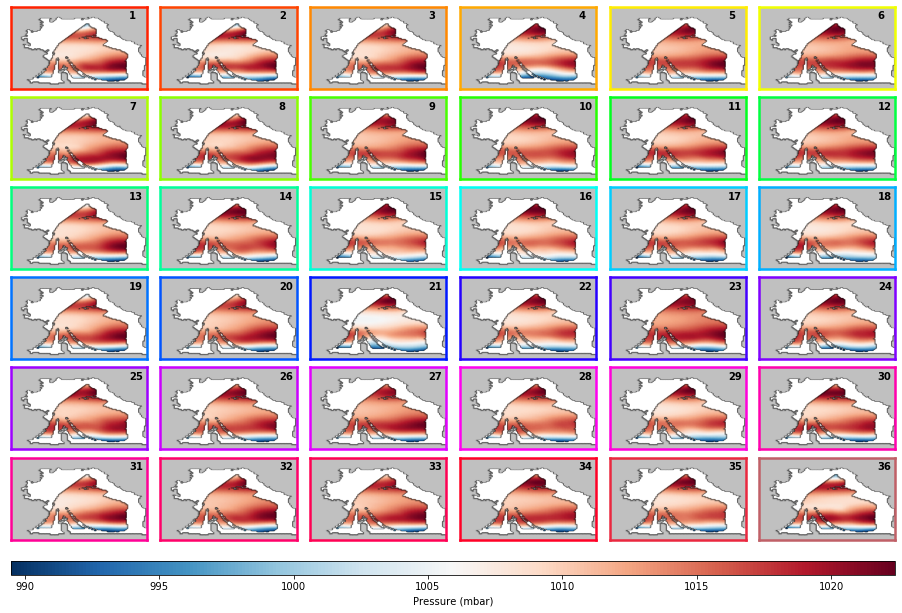

In [4]:
# Plot DWTs (data mean)
pred.Plot_DWTs('SLP', kind='mean', show=True);


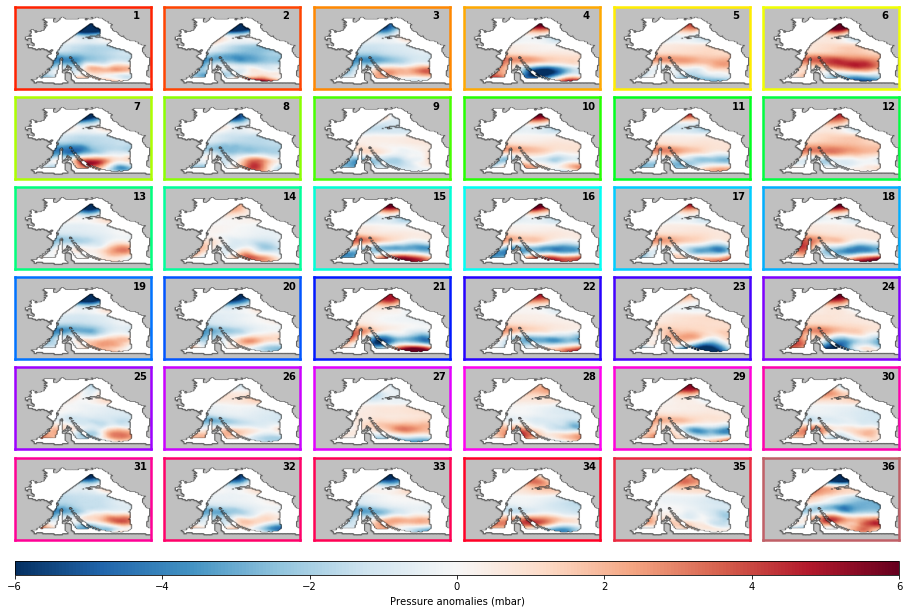

In [5]:
# Plot DWTs (data anomalies)
pred.Plot_DWTs('SLP', kind='anom', show=True);


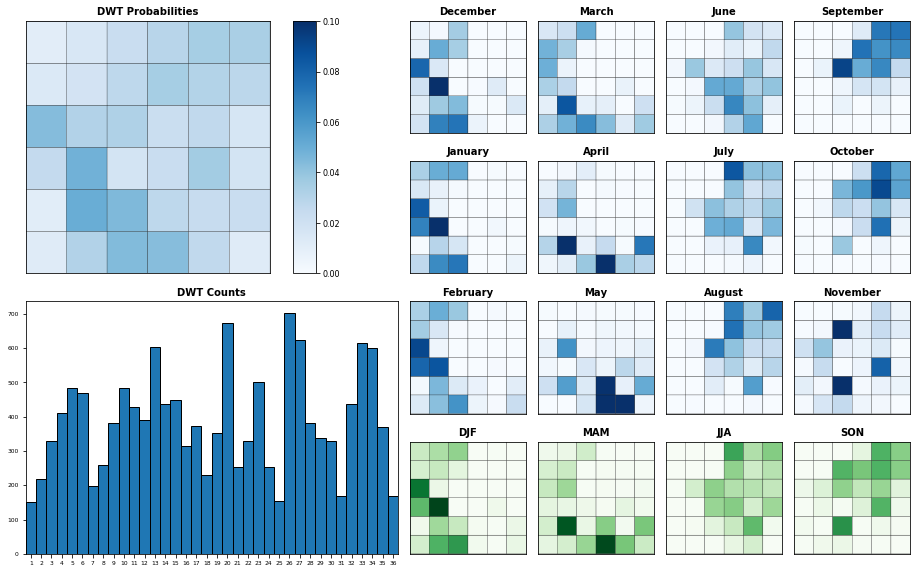

In [6]:
# Plot DWTs Probabilities
pred.Plot_DWTs_Probs();


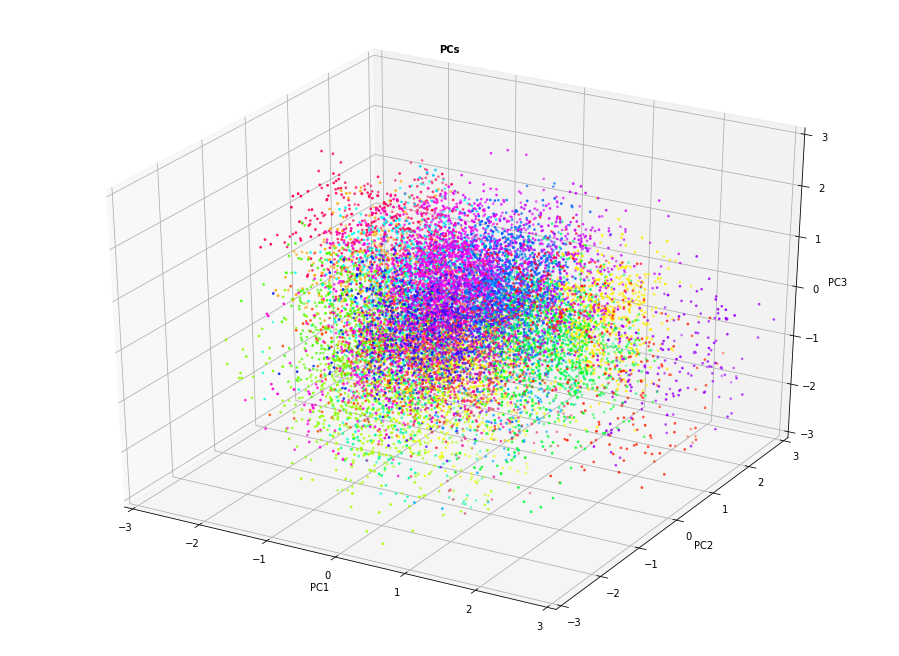

In [7]:
# Plot PC1, PC2, PC3 (3D)
pred.Plot_PCs_3D();


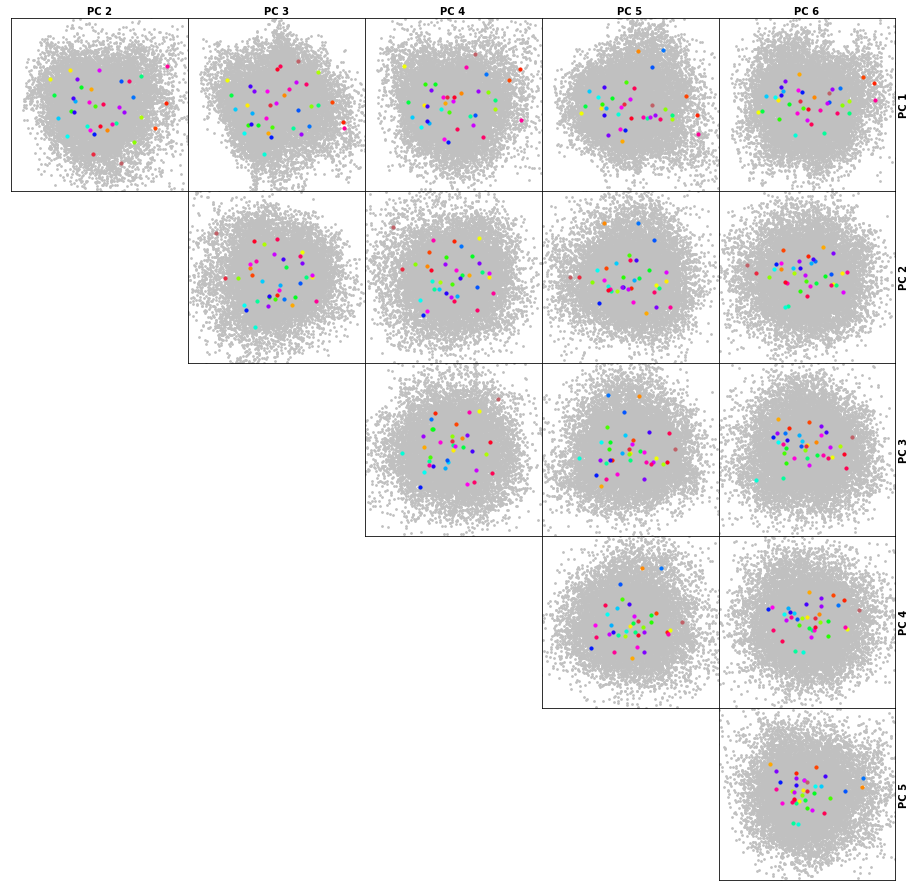

SystemExit: 

In [8]:
# Plot PCs DWT centroids
pred.Plot_DWT_PCs(n=6);



## ESTELA Predictor - Add Historical TCs

In [3]:
# --------------------------------------
# use historical storms-parameters inside r1 to modify predictor KMA results 

storm_dates = TCs_r1_params.dmin_date.values[:]
storm_categs = TCs_r1_params.category.values[:]

# add r1 storms to predictor KMA
pred.Mod_KMA_AddStorms(storm_dates, storm_categs)

print(pred.KMA)

<xarray.Dataset>
Dimensions:             (n_clusters: 36, n_components: 13858, n_features: 107)
Dimensions without coordinates: n_clusters, n_components, n_features
Data variables:
    bmus                (n_components) int32 ...
    cenEOFs             (n_clusters, n_features) float64 ...
    centroids           (n_clusters, n_features) float64 ...
    group_size          (n_clusters) int64 ...
    sorted_order        (n_clusters) int64 ...
    sorted_bmus         (n_components) int64 0 0 0 0 12 30 ... 25 25 25 25 25 25
    sorted_cenEOFs      (n_clusters, n_features) float64 ...
    sorted_centroids    (n_clusters, n_features) float64 ...
    time                (n_components) datetime64[ns] 1979-01-23 ... 2016-12-31
    sorted_bmus_storms  (n_components) int64 0 0 0 0 12 30 ... 25 25 25 25 25 25
Attributes:
    method:   regression guided
    alpha:    0.36


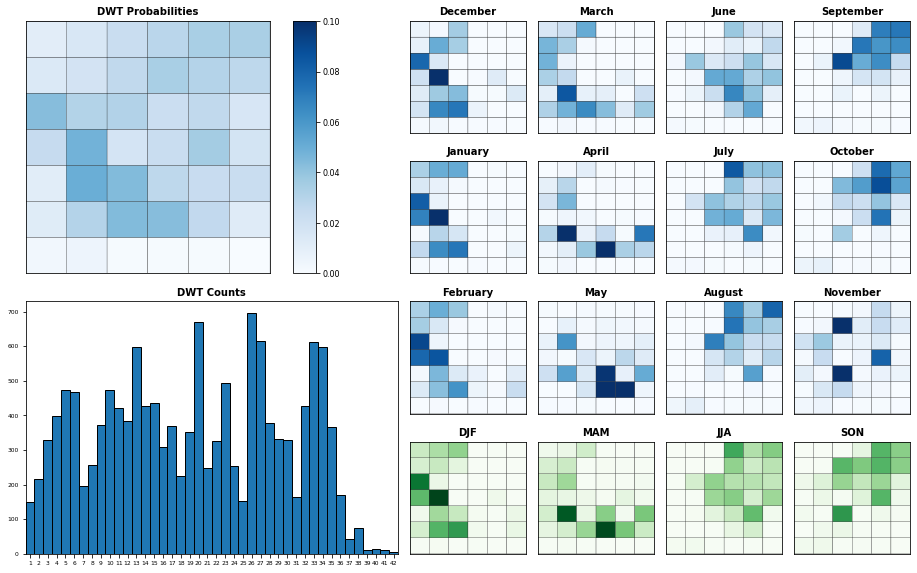

In [4]:
# Plot DWTs Probabilities with updated bmus
pred.Plot_DWTs_Probs(field='sorted_bmus_storms', n_clusters=42);


## Calculate hydrograps for nearshore waves at 3 locations (N, E, S)

In [2]:
# --------------------------------------
# Calculate intradaily MU TAU hydrographs (hourly waves and hourly runup)

xds_MU_TAU_N = pred.Calc_MU_TAU_Hydrographs_runup(WAVES_N, WAVES_runup_N.runup)
xds_MU_TAU_S = pred.Calc_MU_TAU_Hydrographs_runup(WAVES_S, WAVES_runup_S.runup)
xds_MU_TAU_E = pred.Calc_MU_TAU_Hydrographs_runup(WAVES_E, WAVES_runup_E.runup)

print(xds_MU_TAU_N)
print(xds_MU_TAU_S)
print(xds_MU_TAU_E)


# store hydrographs MU TAU
xds_MU_TAU_N.to_netcdf(op.join(p_data, 'sites', 'KWAJALEIN', 'ESTELA', 'hydrographs', 'MuTau_N.nc'))
xds_MU_TAU_S.to_netcdf(op.join(p_data, 'sites', 'KWAJALEIN', 'ESTELA', 'hydrographs', 'MuTau_S.nc'))
xds_MU_TAU_E.to_netcdf(op.join(p_data, 'sites', 'KWAJALEIN', 'ESTELA', 'hydrographs', 'MuTau_E.nc'))



<xarray.Dataset>
Dimensions:         (time_runup_max: 3365)
Coordinates:
  * time_runup_max  (time_runup_max) datetime64[ns] 1979-01-24T15:00:00 ... 2016-12-28T18:00:00
Data variables:
    MU              (time_runup_max) float64 0.6688 0.5218 ... 0.369 0.427
    MU2             (time_runup_max) float64 0.579 0.6992 ... 0.6988 0.6222
    TAU             (time_runup_max) float64 0.4167 0.4167 ... 0.25 0.4653
    Hs              (time_runup_max) float64 0.4268 0.3312 ... 0.3884 0.604
    Tp              (time_runup_max) float64 3.545 2.89 4.723 ... 3.924 3.805
    Dir             (time_runup_max) float64 27.24 37.39 1.926 ... 346.6 23.99
    Runup_max       (time_runup_max) float64 0.6404 0.4716 ... 0.6327 0.8566
    WT              (time_runup_max) int64 0 12 30 12 31 6 ... 31 19 18 19 13 25
<xarray.Dataset>
Dimensions:         (time_runup_max: 3365)
Coordinates:
  * time_runup_max  (time_runup_max) datetime64[ns] 1979-01-23 ... 2016-12-26
Data variables:
    MU              (time_runup

SystemExit: 

<xarray.Dataset>
Dimensions:      (time: 13880)
Coordinates:
  * time         (time) datetime64[ns] 1979-01-01 1979-01-02 ... 2016-12-31
Data variables:
    Hs           (time) float32 1.6662501 3.2777503 ... 1.4810834 1.6610836
    Tp           (time) float32 5.926146 8.379675 9.899439 ... 9.736651 8.821125
    Dir          (time) float32 75.36087 77.46667 ... 64.354164 66.84167
    sea_Hs       (time) float32 1.7357394 3.2762501 ... 1.3670835 1.5365833
    sea_Tp       (time) float32 5.922174 8.384167 9.058095 ... 9.16 7.784167
    sea_Dir      (time) float32 75.347824 77.416664 130.4762 ... 67.333336 70.5
    swell_1_Hs   (time) float64 nan nan 2.792 1.107 ... 0.942 0.9187 0.7647
    swell_1_Tp   (time) float64 nan nan 10.04 9.783 ... 9.76 9.66 9.673 10.22
    swell_1_Dir  (time) float64 nan nan 63.4 70.21 ... 68.0 69.0 69.33 74.67
    swell_2_Hs   (time) float64 nan nan 0.8766 0.5024 ... 0.1635 0.1375 0.1975
    swell_2_Tp   (time) float64 nan nan 8.428 8.584 ... 10.78 10.19 9.643 

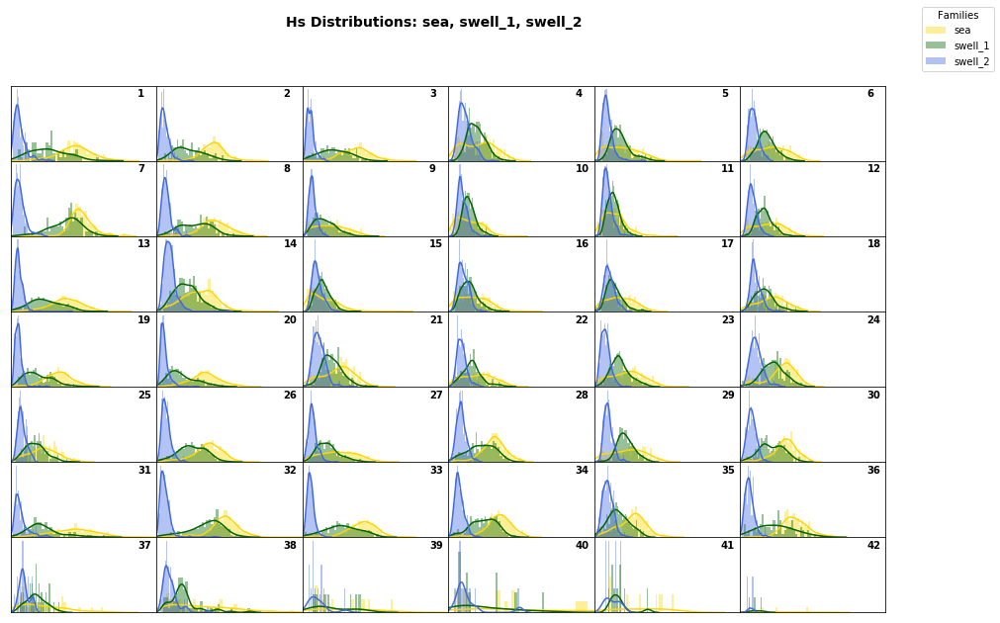

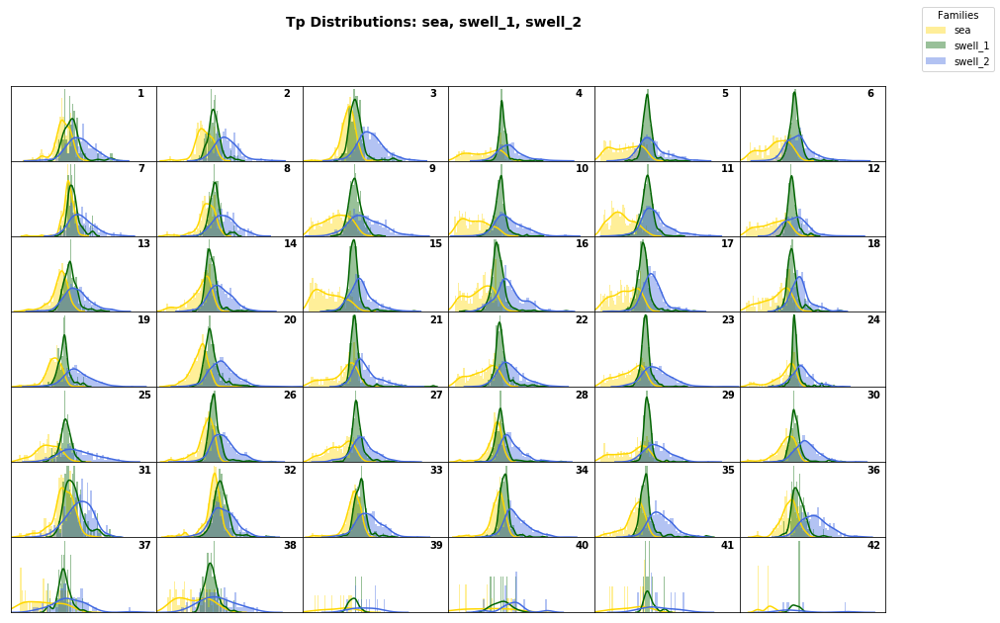

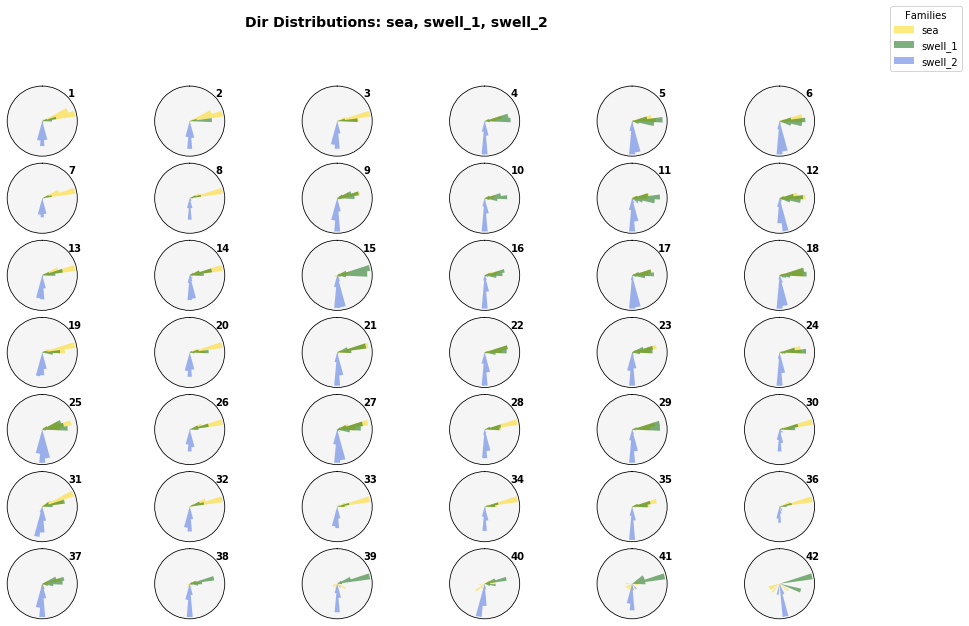

In [8]:
# Plot offshore Waves Families by DWTs

# select time window and calculate daily mean
WAVES_d = WAVES.sel(time = slice(kma_date_ini, kma_date_end)).resample(time='1D').mean()
print(WAVES_d)

# DWTs bmus
DWTs = pred.KMA
BMUS = xr.Dataset(
    {'bmus':(('time',), DWTs['sorted_bmus_storms'].values[:])},
    coords = {'time': DWTs.time.values[:]}
)
n_clusters = 42

# common dates
dates_common= xds_common_dates_daily([WAVES_d, DWTs])

# waves and bmus at common dates
WAVES_sel = WAVES_d.sel(time=dates_common)
bmus_sel = BMUS.sel(time=dates_common).bmus.values[:]

# Plot Waves Families by DWTs
Plot_Waves_DWTs(WAVES_sel, bmus_sel, n_clusters);
